# Credit_scoring_2

Немного урезанный вариант Credit_scoring_1.
Более полный вариант работы в файле Credit_scoring_1. 

На вкладке «Исх данные» находятся первоначальные данные и  данные  по результату выданных кредитов.

На вкладке «Модель»  находятся  преобразованные данные и результат расчета скоринга по  ним. 

А на  вкладке «Res» находится оценка того, как будет изменяться  одобрение и  доходность от выдачи кредитов, если мы выберем тот или  иной уровень  отсечения.

В качестве прогноза бралась вероятность  погашения кредита  с просрочкой до 15 дней, поэтому с ростом  вероятности улучшаются  показатели доходов.

Формула создавалась без данных Мегафона. Поэтому для целей  сравнения Вам предлагается посчитать вероятности также без этих  данных.

In [1]:
from IPython.display import display

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import phik
from phik.report import plot_correlation_matrix

from sklearn.model_selection import train_test_split, cross_val_score
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
from sklearn.metrics import roc_curve, roc_auc_score
import lightgbm as lgb
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings("ignore")

from sklearn.svm import SVC

In [3]:
df = pd.read_excel('C:\\Python\\Займ-Экспресс\\Данные.xlsx', sheet_name='Исх данные', skiprows=[0])

In [4]:
pd.options.display.max_columns = None

## Знакомство с данными

1. al_ContractNumber – номер одобренного кредита 
2. al_amount –  сумма одобренного кредита 
3. al_issue_M – месяц выдачи одобренного  кредита 
4. psp_issue_rgn – регион выдачи паспорта клиента 
5. sex – пол  (1-мужчины, 2 – женщины) 
6. is_client_local – является ли клиент  местным по отношению к офису выдачи кредита (1-да, 0 – нет). Сравнивается регион выдачи паспорта клиента и регион офиса 
7. has_snils – предоставил ли клиент снилс при запросе кредита 
8. zaim_cards – наличие у клиента карты Займ-Экспресс на момент  запроса  кредита 
9. age – возраст по группам (1-до 25 лет, 2 – 25-35 лет, 3- 35 и  более лет) 
10. responsecode – код ответа от БКИ по наличию  данных  о  кредитах у клиента на момент заявки. (0 – нет данных о  клиенте  вообще  в БКИ, 1 – есть данные, 3 – есть данные о клиенте, но  нет  данных о  кредитах, 98 – таких данных нет, но это всего одна строка такая)
11.  was_garant – был ли клиент гарантом по займу 
12. is_pboul – является  ли  клиент ИП 
13. has_foreign_currency_credits – были ли у клиента  займы в  иностранной валюте 
14. court_counts – количесвто судов по  клиенту на  момент запроса кредита 
15. official_count – кол-во  оспаривания  судебных решений 
16. cred_line_state – статус кредитной  линии  
17.  potreb_tot – наличие в истории потребительских кредитов (0 – нет, 1 – есть)
18. potreb_closed_tot – количество закрытых потребительских  кредитов  клиента на момент запроса кредита 
19. potreb_active_tot –  количество  открытых потребительских кредитов на момент запроса 
20. potreb_other_states_tot – кол-во потребительских кредитов с  другими  статусами на момент запроса 
21. pdl_tot – наличие потреб  кредитов на  момент займа 
22. pdl_closed_tot – кол-во закрытых pdl –  займов 
23. pdl_active_tot – кол-во активных pdl – займов 
24. pdl_own_share –  доля  pdl – займов клиента в нашей компании 
25. pdl_delay5_cnt,  pdl_delay30_cnt и т.д. – кол-во закрытых просрочек клиента по pdl-  займам до 5, 30 и более дней 
26. pdl_prolong_cnt – кол-во пролонгаций pdl- займов 
27. avg_pdl_full_cost – средняя стоимость pdl-кредита,  который брал клиент (1-это до 1% в день, 2 – более 1%) 
28. avg_pdl_amount – средняя сумма pdl-займа клиента на момент  запроса  
29. pdl_delay5_avg – среднее кол-во закрытых просрочек по pdl-  займам  
30. al_LIFETIME_BIN, al_BLOCK_DUR, al_CIRCLE, al_ALL_CLC,  al_PAY_MAX –  бины Мегафона (onefactor) 
31. al_SCORE2 – скоринговый  балл Мегафона (бектест) Результирующие данные (их не надо использовать в  качестве  предсказательных признаков), они используются для  построения  таблицы с результатами:
32. res_npl_15 – это результат (бинарная функция). Оплатил ли  клиент  займ полностью до 15ти дней просрочки 
33. res_npl_90 – оплатил  ли он  кредит до 90 дней просрочки 
34. res_payout_principal_inTime –  сумма  оплаты тела кредита до просрочки (и аналогичные поля с  разными  сроками просрочки) 
35. res_payout_tot_inTime – общая сумма  платежей  клиента до просрочки, включая тело и проценты 
36.  fl_cnt_during_3M (12М) – количество кредитов, взятых клиентом, после выплаты по  одобренному кредиту в течении 3х (12ти) месяцев с момента выплаты  кредита (используем для оцени возвращения клиента).
37. is_test – является ли выборка тестовой (0 – обучающая выборка, 1  –  тестовая выборка). Так-же желательно получить краткое описание  вашей модели (не  Более 3-5 предложений )и код, если возможно в  Jupyter Notebook.

In [5]:
df.shape

(9986, 65)

In [6]:
df

,al_ContractNumber,al_amount,al_issue_M,psp_issue_rgn,sex,is_client_local,has_snils,zaim_cards,age,responsecode,was_garant,is_pboul,has_foreign_currency_credits,court_counts,official_count,has_resold_credits,cred_line_state,potreb_tot,potreb_closed_tot,potreb_active_tot,potreb_other_states_tot,pdl_tot,pdl_closed_tot,pdl_active_tot,pdl_other_states_tot,pdl_own_share,pdl_delay5_cnt,pdl_delay30_cnt,pdl_delay60_cnt,pdl_delay90_cnt,pdl_delay_more_cnt,pdl_prolong_cnt,avg_payout_period_pdl,avg_pdl_full_cost,avg_pdl_amount,pdl_delay5_avg,pdl_delay30_avg,pdl_delay60_avg,pdl_delay90_avg,pdl_delay_more_avg,al_LIFETIME_BIN,al_BLOCK_DUR,al_CIRCLE,al_ALL_CLC,al_PAY_MAX,al_SCORE2,res_npl_15,res_npl_90,res_payout_principal_inTime,res_payout_principal_delay15,res_payout_principal_delay30,res_payout_principal_delay45,res_payout_principal_delay60,res_payout_principal_delay90,res_payout_tot_inTime,res_payout_tot_delay15,res_payout_tot_delay30,res_payout_tot_delay45,res_payout_tot_delay60,res_payout_tot_delay90,fl_cnt,fl_cnt_during_3M,fl_cnt_during_12M,fl_requests_cnt_12M,is_test
0,882-001-17,3000,1,30,1,0,0,0,2,1,0,0,0,0,0,0,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.000000,0,0,0,0,0,1,0,1,3,3,0.209782,0,1,0.0,280.0,3000.0,3000.0,3000.0,3000.0,0.0,1000.0,4590.4,4590.4,4590.4,4590.4,1,1,1,1,0
1,1776-001-17,5000,1,55,1,0,1,0,2,1,0,0,0,0,0,0,2,1,2,0,0,1,12,1,4,0,0,1,0,1,5,1,0,1,50459.705882,0,0,0,0,0,1,0,5,5,5,0.253080,1,1,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,6500.0,6500.0,6500.0,6500.0,6500.0,6500.0,1,1,1,1,0
2,2234-001-17,5000,1,32,1,0,1,0,3,1,0,0,0,0,0,0,2,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,2500.000000,0,0,0,0,0,2,0,0,2,3,0.213614,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
3,2649-001-17,5000,1,77,2,1,1,0,3,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.000000,0,0,0,0,0,5,2,5,3,3,0.121961,1,1,0.0,5000.0,5000.0,5000.0,5000.0,5000.0,1500.0,8000.0,8000.0,8000.0,8000.0,8000.0,2,1,2,3,0
4,2320-001-17,3000,1,77,2,1,1,0,3,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.000000,0,0,0,0,0,0,0,0,0,0,0.171182,1,1,0.0,3000.0,3000.0,3000.0,3000.0,3000.0,0.0,3960.0,3960.0,3960.0,3960.0,3960.0,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9981,80519-128-17,4000,3,77,2,1,0,0,3,1,0,0,0,0,0,0,2,1,3,5,1,1,1,1,0,0,1,0,0,0,0,1,0,1,5240.000000,0,0,0,0,0,0,0,0,0,0,0.171182,1,1,4000.0,4000.0,4000.0,4000.0,4000.0,4000.0,5040.0,5040.0,5040.0,5040.0,5040.0,5040.0,3,2,2,3,1
9982,82024-128-17,3000,4,77,1,1,0,0,2,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.000000,0,0,0,0,0,3,0,4,3,3,0.189497,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1
9983,82115-128-17,3000,4,77,1,1,0,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.000000,0,0,0,0,0,1,2,3,4,4,0.294678,0,1,0.0,0.0,0.0,0.0,0.0,3000.0,0.0,0.0,0.0,0.0,0.0,8940.0,1,0,1,2,1
9984,84064-128-17,5000,4,59,1,0,1,0,2,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.000000,0,0,0,0,0,4,4,3,3,3,0.095393,0,1,0.0,0.0,5000.0,5000.0,5000.0,5000.0,0.0,0.0,8800.0,8800.0,8800.0,8800.0,5,2,4,5,1


In [7]:
df.duplicated().sum()

0

на данном этапе дубликатов нет

In [8]:
df.describe()

,al_amount,al_issue_M,psp_issue_rgn,sex,is_client_local,has_snils,zaim_cards,age,responsecode,was_garant,is_pboul,has_foreign_currency_credits,court_counts,official_count,has_resold_credits,cred_line_state,potreb_tot,potreb_closed_tot,potreb_active_tot,potreb_other_states_tot,pdl_tot,pdl_closed_tot,pdl_active_tot,pdl_other_states_tot,pdl_own_share,pdl_delay5_cnt,pdl_delay30_cnt,pdl_delay60_cnt,pdl_delay90_cnt,pdl_delay_more_cnt,pdl_prolong_cnt,avg_payout_period_pdl,avg_pdl_full_cost,avg_pdl_amount,pdl_delay5_avg,pdl_delay30_avg,pdl_delay60_avg,pdl_delay90_avg,pdl_delay_more_avg,al_LIFETIME_BIN,al_BLOCK_DUR,al_CIRCLE,al_ALL_CLC,al_PAY_MAX,al_SCORE2,res_npl_15,res_npl_90,res_payout_principal_inTime,res_payout_principal_delay15,res_payout_principal_delay30,res_payout_principal_delay45,res_payout_principal_delay60,res_payout_principal_delay90,res_payout_tot_inTime,res_payout_tot_delay15,res_payout_tot_delay30,res_payout_tot_delay45,res_payout_tot_delay60,res_payout_tot_delay90,fl_cnt,fl_cnt_during_3M,fl_cnt_during_12M,fl_requests_cnt_12M,is_test
count,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.00000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000,9986.000000
mean,4306.629281,5.365612,59.231724,1.274685,0.452834,0.165532,0.001702,2.153815,0.578209,0.002904,0.001102,0.002303,0.010114,0.02143,0.047767,1.982776,0.373823,0.674444,0.269577,0.114160,0.141398,0.375426,0.126878,0.032646,0.003004,0.023433,0.044763,0.019728,0.030443,0.075806,0.141398,0.941518,1.039255,1771.111257,0.007010,0.024334,0.009513,0.013919,0.033847,2.840477,1.106048,3.338774,2.478870,2.653615,0.162064,0.452634,0.535049,1521.344022,1924.642921,2053.373027,2121.531457,2188.955821,2282.081366,1916.294662,2534.872331,2791.991290,2949.871407,3122.909317,3374.924305,1.927498,0.827759,1.631684,2.171740,0.299319
std,933.068078,3.532582,23.641590,0.446378,0.497795,0.371678,0.041227,0.790260,1.098523,0.091126,0.110077,0.059160,0.100064,0.14482,0.251628,0.130112,0.483842,1.715365,0.748244,0.662755,0.348449,2.899925,0.768707,0.456562,0.054731,0.151281,0.206793,0.139070,0.171810,0.918710,0.348449,0.234664,0.194211,7744.708255,0.083435,0.154092,0.097076,0.117163,0.529033,1.849871,1.565486,1.883671,1.440318,1.589930,0.056005,0.497776,0.498795,2075.677210,2167.456931,2182.753713,2187.239475,2191.974141,2194.384586,2432.766748,2624.314317,2741.832256,2854.082081,3017.748197,3306.565412,3.741945,1.243420,2.921221,4.138253,0.457983
min,3000.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.064373,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3000.000000,2.000000,48.000000,1.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9986 entries, 0 to 9985
Data columns (total 65 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   al_ContractNumber             9986 non-null   object 
 1   al_amount                     9986 non-null   int64  
 2   al_issue_M                    9986 non-null   int64  
 3   psp_issue_rgn                 9986 non-null   int64  
 4   sex                           9986 non-null   int64  
 5   is_client_local               9986 non-null   int64  
 6   has_snils                     9986 non-null   int64  
 7   zaim_cards                    9986 non-null   int64  
 8   age                           9986 non-null   int64  
 9   responsecode                  9986 non-null   int64  
 10  was_garant                    9986 non-null   int64  
 11  is_pboul                      9986 non-null   int64  
 12  has_foreign_currency_credits  9986 non-null   int64  
 13  cou

У нас почти везде числовой формат, хотя в большей части категориальные признаки. Надо это исправить.

Эти поля уберем, т.к. они уже подразумевают просрочку (как я понял по условию). Надеюсь я не удалил ничего "лишнего" и нужного.

In [10]:
df.columns

Index(['al_ContractNumber', 'al_amount', 'al_issue_M', 'psp_issue_rgn', 'sex',
       'is_client_local', 'has_snils', 'zaim_cards', 'age', 'responsecode',
       'was_garant', 'is_pboul', 'has_foreign_currency_credits',
       'court_counts', 'official_count', 'has_resold_credits',
       'cred_line_state', 'potreb_tot', 'potreb_closed_tot',
       'potreb_active_tot', 'potreb_other_states_tot', 'pdl_tot',
       'pdl_closed_tot', 'pdl_active_tot', 'pdl_other_states_tot',
       'pdl_own_share', 'pdl_delay5_cnt', 'pdl_delay30_cnt', 'pdl_delay60_cnt',
       'pdl_delay90_cnt', 'pdl_delay_more_cnt', 'pdl_prolong_cnt',
       'avg_payout_period_pdl', 'avg_pdl_full_cost', 'avg_pdl_amount',
       'pdl_delay5_avg', 'pdl_delay30_avg', 'pdl_delay60_avg',
       'pdl_delay90_avg', 'pdl_delay_more_avg', 'al_LIFETIME_BIN',
       'al_BLOCK_DUR', 'al_CIRCLE', 'al_ALL_CLC', 'al_PAY_MAX', 'al_SCORE2',
       'res_npl_15', 'res_npl_90', 'res_payout_principal_inTime',
       'res_payout_principal_del

In [11]:
df = df.drop(['res_payout_principal_inTime',
            'res_payout_tot_inTime',
            'fl_cnt_during_3M',
            'fl_cnt_during_12M',
            'fl_cnt',
            'fl_requests_cnt_12M',
            'al_ContractNumber',
            'res_payout_principal_delay15',
            'res_payout_principal_delay30',
            'res_payout_tot_delay30',
            'res_payout_tot_delay15',
            'res_payout_principal_delay90',
            'res_payout_tot_delay90',
            'res_payout_principal_delay45',
            'res_payout_tot_delay45',
            'res_payout_principal_delay60',
            'res_payout_tot_delay60',
            'res_npl_90',
            'al_SCORE2',
            'al_LIFETIME_BIN',
            'al_BLOCK_DUR',
            'al_CIRCLE',
            'al_ALL_CLC',
            'al_PAY_MAX'], axis = 1)

сумма одобренного кредита 

In [12]:
df['al_amount'].value_counts()

5000    6347
3000    3285
4000     354
Name: al_amount, dtype: int64

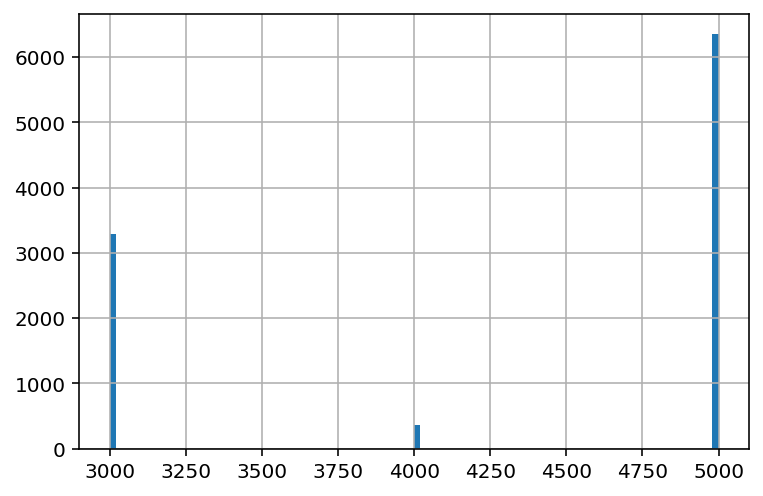

In [13]:
df['al_amount'].hist(bins = 100);

у нас всего 3 типа суммы кредита. Это скорее категориальный признак, чем колличественный. Изменим формат.

In [14]:
df['al_amount'] = df['al_amount'].astype(object)

месяц выдачи одобренного  кредита

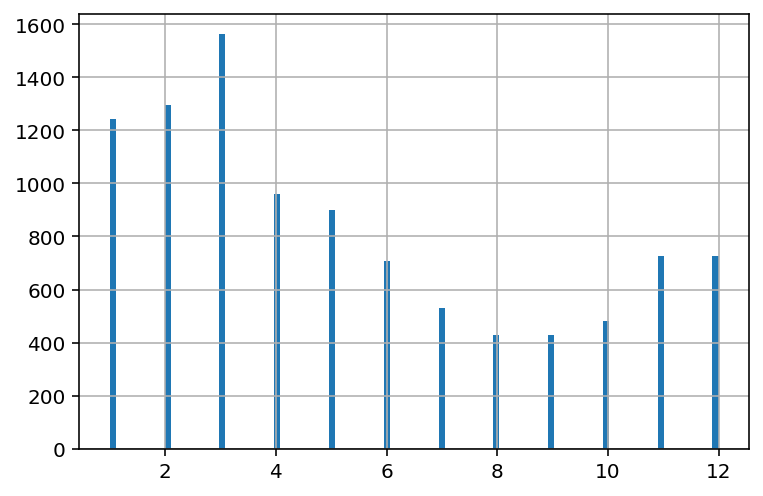

In [15]:
df['al_issue_M'].hist(bins = 100);

Чаще всего месяц одобренного кредита выпадает на март(и вообще на начало года). Реже всего в период с июля по октябрь.

In [16]:
df['al_issue_M'] = df['al_issue_M'].astype(object)

регион выдачи паспорта клиента

In [17]:
df['psp_issue_rgn'].value_counts()

77    4953
50     675
64     207
0      195
61     175
      ... 
80       2
83       1
49       1
85       1
92       1
Name: psp_issue_rgn, Length: 86, dtype: int64

нулевого региона вроде бы нет, видимо тут ошибка выгрузки данных. Будем считать что это тоже остальные города России(не Москва и не Московская обл.)

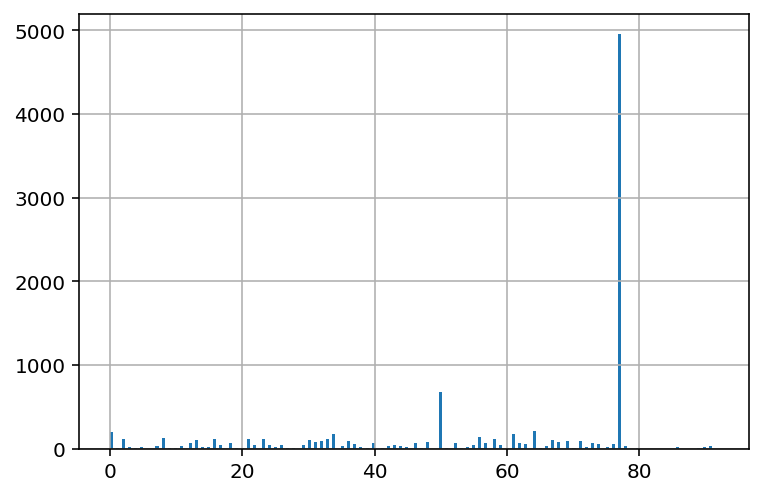

In [18]:
df['psp_issue_rgn'].hist(bins = 200);

Регион выдачи чаще всего 77. Второе место с большим отрывом - 50. 

In [19]:
df['psp_issue_rgn_id']=df['psp_issue_rgn'].apply(lambda x: 'M' if x == 77 else ('M_O' if x == 50 else 'O'))

In [20]:
df['psp_issue_rgn_id'].value_counts()

M      4953
O      4358
M_O     675
Name: psp_issue_rgn_id, dtype: int64

а старый столбец удалим

In [21]:
df = df.drop('psp_issue_rgn', axis=1)

пол  (1-мужчины, 2 – женщины)

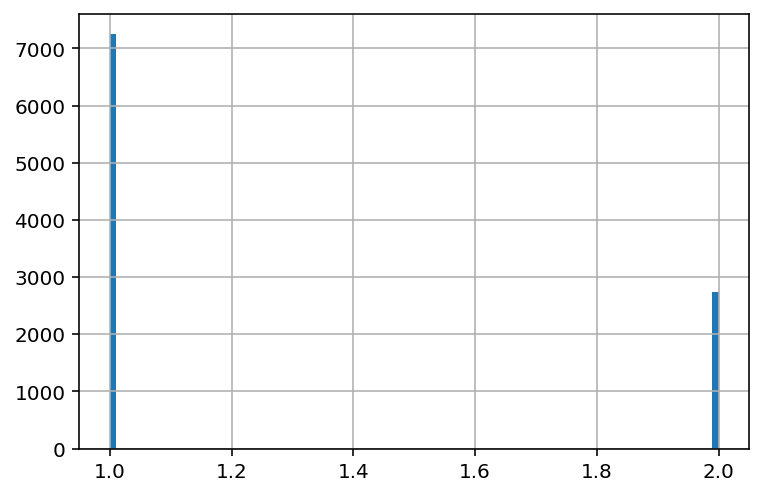

In [22]:
df['sex'].hist(bins = 100);

Больше мужчин чем женщин

является ли клиент  местным по отношению к офису выдачи кредита (1-да, 0 – нет). 

Сравнивается регион выдачи паспорта клиента и регион офиса 

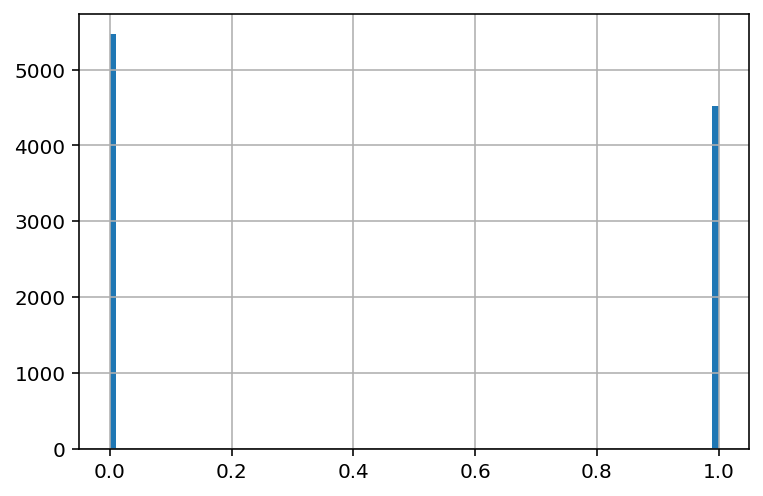

In [23]:
df['is_client_local'].hist(bins = 100);

сильного дисбаланса нет

предоставил ли клиент снилс при запросе кредита. 

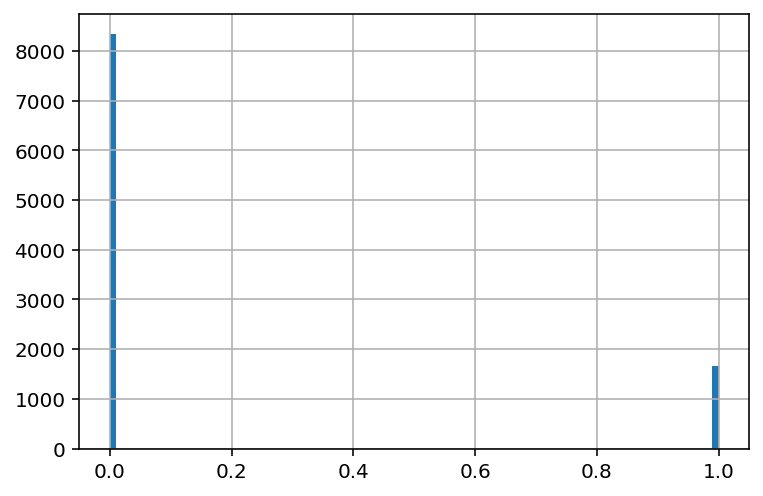

In [24]:
df['has_snils'].hist(bins = 100);

Вообще метки не указаны, но думаю что в большинстве случаев всетаки предоставлял - это 0.

наличие у клиента карты Займ-Экспресс на момент  запроса  кредита 

In [25]:
df['zaim_cards'].value_counts()

0    9969
1      17
Name: zaim_cards, dtype: int64

тоже не очень понятно есть или нет... Будем считать все вокруг пользуются именно Займ-Экспресс и только у 17 человек нашей карты нет.

возраст по группам (1-до 25 лет, 2 – 25-35 лет, 3- 35 и  более лет) 

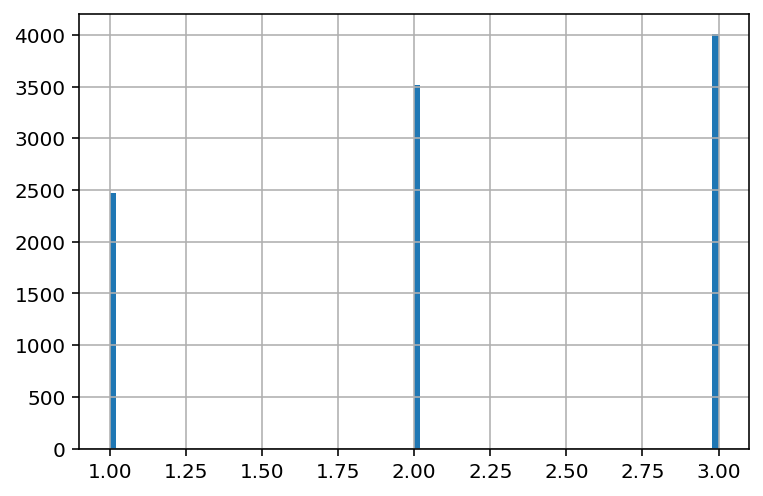

In [26]:
df['age'].hist(bins = 100);

молодые люди до 25 реже всех берут кредит

In [27]:
df['age_id'] = df['age'].apply(lambda x: 'do_25' if x == 1 else ('25_35' if x == 2 else '35_m'))

In [28]:
df = df.drop('age',axis = 1)

код ответа от БКИ по наличию  данных  о  кредитах у клиента на момент заявки. (0 – нет данных о  клиенте  вообще  в БКИ, 1 – есть данные, 3 – есть данные о клиенте, но  нет  данных о  кредитах, 98 – таких данных нет, но это всего одна строка такая)

In [29]:
df['responsecode'].value_counts()

1     5622
0     4345
3       18
98       1
Name: responsecode, dtype: int64

одну строку удалим, как выброс (все равно статистических данных по ней не хватает)

In [30]:
df=df.drop(df.loc[(df.loc[:,'responsecode'] == 98)].index)

In [31]:
df['responsecode_id'] = df['responsecode'].apply(lambda x: 'no' if x == 0 else ('yes' if x == 1 else 'no_yes'))

был ли клиент гарантом по займу

In [32]:
df['was_garant'].value_counts()

0    9970
1       8
2       4
5       2
3       1
Name: was_garant, dtype: int64

Тут предполагаем что 0 - нет, А все остальное  - да

In [33]:
df['was_garant_id'] = df['was_garant'].apply(lambda x: 'no' if x == 0 else 'yes')

In [34]:
df = df.drop('was_garant', axis = 1)

является  ли  клиент ИП

In [35]:
df['is_pboul'].value_counts()

0     9984
11       1
Name: is_pboul, dtype: int64

этот столбец вообще, по сути, не информативен... Удалим его

In [36]:
df=df.drop('is_pboul', axis=1)

были ли у клиента  займы в  иностранной валюте 

In [37]:
df['has_foreign_currency_credits'].value_counts()

0    9967
1      14
2       3
3       1
Name: has_foreign_currency_credits, dtype: int64

можем сделать предположение что 0 - нет, все остальное - да

In [38]:
df['has_foreign_currency_credits_id'] = df['has_foreign_currency_credits'].apply(lambda x: 'no' if x == 0 else 'yes')

In [39]:
df = df.drop('has_foreign_currency_credits',axis = 1)

кол-во судов по  клиенту на  момент запроса кредита 

In [40]:
df['court_counts'].value_counts()

0    9884
1     101
Name: court_counts, dtype: int64

кол-во  оспаривания  судебных решений 

In [41]:
df['official_count'].value_counts()

0    9771
1     214
Name: official_count, dtype: int64

статус кредитной  линии

In [42]:
df['cred_line_state'].value_counts()

2    9813
1     172
Name: cred_line_state, dtype: int64

наличие в истории потребительских кредитов (0 – нет, 1 – есть)

In [43]:
df['potreb_tot'].value_counts()

0    6253
1    3732
Name: potreb_tot, dtype: int64

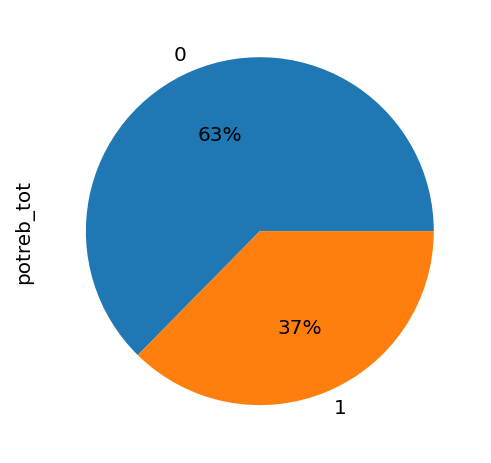

In [44]:
df['potreb_tot'].value_counts().plot.pie(radius=1, autopct='%1.0f%%');

количество закрытых потребительских  кредитов  клиента на момент запроса кредита 

In [45]:
df['potreb_closed_tot'].value_counts()

0     7550
1      983
2      504
3      327
4      221
5      143
6       93
7       44
8       31
9       26
11      15
10      14
12      12
13       6
15       6
14       3
19       2
27       2
16       2
25       1
Name: potreb_closed_tot, dtype: int64

можно разбитьо на 3 категории(много, средне, мало)

In [46]:
df['potreb_closed_tot_id'] = df['potreb_closed_tot'].apply(lambda x: 'много' if x == 0 else ('средне' if 6 > x > 0 else 'мало'))

количество  открытых потребительских кредитов на момент запроса 

In [47]:
df['potreb_active_tot'].value_counts()

0     8302
1     1104
2      343
3      140
4       47
6       20
5       18
7        8
11       1
9        1
8        1
Name: potreb_active_tot, dtype: int64

можно разбить на 3 категории(много, средне, мало)

In [48]:
df['potreb_active_tot_id'] = df['potreb_active_tot'].apply(lambda x: 'много' if x == 0 else ('средне' if  x == 1 else 'мало'))

In [49]:
df['potreb_active_tot_id'].value_counts()

много     8302
средне    1104
мало       579
Name: potreb_active_tot_id, dtype: int64

кол-во потребительских кредитов с  другими  статусами на момент запроса 

In [50]:
df['potreb_other_states_tot'].value_counts()

0     9470
1      253
2      115
3       68
4       38
5       15
6        8
7        5
8        4
14       2
12       2
10       2
13       1
17       1
9        1
Name: potreb_other_states_tot, dtype: int64

In [51]:
df['potreb_other_states_tot_id'] = df['potreb_other_states_tot'].apply(lambda x: 'много' if x == 0 else 'мало')

In [52]:
df['potreb_other_states_tot_id'].value_counts()

много    9470
мало      515
Name: potreb_other_states_tot_id, dtype: int64

наличие потреб  кредитов на  момент займа

In [53]:
df['pdl_tot'].value_counts()

0    8574
1    1411
Name: pdl_tot, dtype: int64

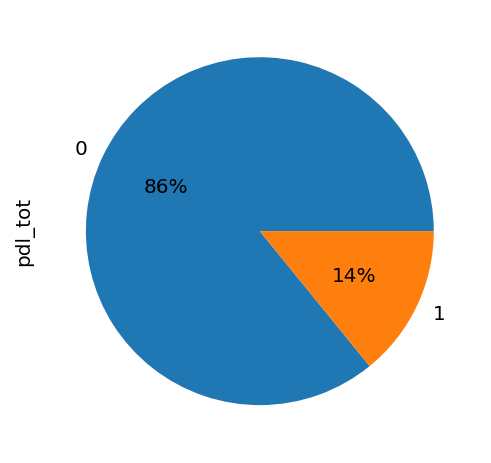

In [54]:
df['pdl_tot'].value_counts().plot.pie(radius=1, autopct='%1.0f%%');

кол-во закрытых pdl –  займов 

In [55]:
df['pdl_closed_tot'].value_counts()

0      9221
1       345
2       118
3        73
4        47
5        33
6        24
8        16
7        14
10       10
12        9
9         6
34        5
11        5
14        5
25        4
16        4
20        4
13        4
30        4
26        3
15        3
17        3
22        3
69        2
39        2
54        2
36        2
23        1
32        1
33        1
60        1
45        1
37        1
29        1
21        1
27        1
43        1
83        1
100       1
28        1
55        1
Name: pdl_closed_tot, dtype: int64

In [56]:
df['pdl_closed_tot_id'] = df['pdl_closed_tot'].apply(lambda x: 'много' if x == 0 else 'мало')

In [57]:
df['pdl_closed_tot_id'].value_counts()

много    9221
мало      764
Name: pdl_closed_tot_id, dtype: int64

кол-во активных pdl – займов 

In [58]:
df['pdl_active_tot'].value_counts()

0     9409
1      362
2       89
3       37
5       21
4       16
6       12
9        8
8        8
7        7
13       6
10       6
14       2
12       2
Name: pdl_active_tot, dtype: int64

In [59]:
df['pdl_active_tot_id'] = df['pdl_active_tot'].apply(lambda x: 'много' if x == 0 else 'мало')

доля  pdl – займов клиента в нашей компании 

In [60]:
df['pdl_own_share'].value_counts()

0    9955
1      30
Name: pdl_own_share, dtype: int64

кол-во закрытых просрочек клиента по pdl-  займам до 5, 30 и более дней 

In [61]:
df['pdl_delay5_cnt'].value_counts()

0    9752
1     233
Name: pdl_delay5_cnt, dtype: int64

In [62]:
df['pdl_delay30_cnt'].value_counts()

0    9539
1     446
Name: pdl_delay30_cnt, dtype: int64

In [63]:
df['pdl_delay60_cnt'].value_counts()

0    9788
1     197
Name: pdl_delay60_cnt, dtype: int64

In [64]:
df['pdl_delay90_cnt'].value_counts()

0    9682
1     303
Name: pdl_delay90_cnt, dtype: int64

In [65]:
df['pdl_delay_more_cnt'].value_counts()

0     9758
1      135
2       23
3       15
5        9
6        7
4        6
8        6
12       5
7        4
9        4
13       2
10       2
14       2
24       1
48       1
18       1
26       1
15       1
19       1
23       1
Name: pdl_delay_more_cnt, dtype: int64

In [66]:
df['pdl_delay_more_cnt_id'] = df['pdl_delay_more_cnt'].apply(lambda x: 'много' if x == 0 else 'мало')

In [67]:
df['pdl_delay_more_cnt_id'].value_counts()

много    9758
мало      227
Name: pdl_delay_more_cnt_id, dtype: int64

кол-во пролонгаций pdl- займов 

In [68]:
df['pdl_prolong_cnt'].value_counts()

0    8574
1    1411
Name: pdl_prolong_cnt, dtype: int64

средняя стоимость pdl-кредита,  который брал клиент (1-это до 1% в день, 2 – более 1%) 

In [69]:
df['avg_pdl_full_cost'].value_counts()

1    9593
2     392
Name: avg_pdl_full_cost, dtype: int64

средняя сумма pdl-займа клиента на момент  запроса  

In [70]:
df['avg_pdl_amount'].value_counts()

0.000000        8574
5000.000000      105
3000.000000       81
15000.000000      77
6000.000000       45
                ... 
91329.000000       1
27954.000000       1
6600.348333        1
6350.000000        1
2764.285714        1
Name: avg_pdl_amount, Length: 536, dtype: int64

In [71]:
df['avg_pdl_amount'] = df['avg_pdl_amount'].astype(int)

среднее кол-во закрытых просрочек по pdl-  займам  

In [72]:
df['pdl_delay5_avg'].value_counts()

0    9915
1      70
Name: pdl_delay5_avg, dtype: int64

In [73]:
df['pdl_delay30_avg'].value_counts()

0    9742
1     243
Name: pdl_delay30_avg, dtype: int64

In [74]:
df['pdl_delay60_avg'].value_counts()

0    9890
1      95
Name: pdl_delay60_avg, dtype: int64

In [75]:
df['pdl_delay90_avg'].value_counts()

0    9846
1     139
Name: pdl_delay90_avg, dtype: int64

In [76]:
df['pdl_delay_more_avg'].value_counts()

0     9875
1       66
2       11
3        8
6        7
9        5
8        4
5        2
10       2
23       1
14       1
12       1
4        1
24       1
Name: pdl_delay_more_avg, dtype: int64

это результат (бинарная функция). Оплатил ли  клиент  займ полностью до 15ти и 90 дней просрочки, соответственно

In [77]:
df['res_npl_15']

0       0
1       1
2       0
3       1
4       1
       ..
9981    1
9982    0
9983    0
9984    0
9985    1
Name: res_npl_15, Length: 9985, dtype: int64

In [78]:
df['res_npl_15'].value_counts()

0    5466
1    4519
Name: res_npl_15, dtype: int64

На всякий случай проверим на наличие пропусков

In [79]:
df.isnull().sum()

al_amount                          0
al_issue_M                         0
sex                                0
is_client_local                    0
has_snils                          0
zaim_cards                         0
responsecode                       0
court_counts                       0
official_count                     0
has_resold_credits                 0
cred_line_state                    0
potreb_tot                         0
potreb_closed_tot                  0
potreb_active_tot                  0
potreb_other_states_tot            0
pdl_tot                            0
pdl_closed_tot                     0
pdl_active_tot                     0
pdl_other_states_tot               0
pdl_own_share                      0
pdl_delay5_cnt                     0
pdl_delay30_cnt                    0
pdl_delay60_cnt                    0
pdl_delay90_cnt                    0
pdl_delay_more_cnt                 0
pdl_prolong_cnt                    0
avg_payout_period_pdl              0
a

In [80]:
df.duplicated().sum()

3931

In [81]:
df.drop_duplicates().reset_index(drop=True)

,al_amount,al_issue_M,sex,is_client_local,has_snils,zaim_cards,responsecode,court_counts,official_count,has_resold_credits,cred_line_state,potreb_tot,potreb_closed_tot,potreb_active_tot,potreb_other_states_tot,pdl_tot,pdl_closed_tot,pdl_active_tot,pdl_other_states_tot,pdl_own_share,pdl_delay5_cnt,pdl_delay30_cnt,pdl_delay60_cnt,pdl_delay90_cnt,pdl_delay_more_cnt,pdl_prolong_cnt,avg_payout_period_pdl,avg_pdl_full_cost,avg_pdl_amount,pdl_delay5_avg,pdl_delay30_avg,pdl_delay60_avg,pdl_delay90_avg,pdl_delay_more_avg,res_npl_15,is_test,psp_issue_rgn_id,age_id,responsecode_id,was_garant_id,has_foreign_currency_credits_id,potreb_closed_tot_id,potreb_active_tot_id,potreb_other_states_tot_id,pdl_closed_tot_id,pdl_active_tot_id,pdl_delay_more_cnt_id
0,3000,1,1,0,0,0,1,0,0,0,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,O,25_35,yes,no,no,средне,много,много,много,много,много
1,5000,1,1,0,1,0,1,0,0,0,2,1,2,0,0,1,12,1,4,0,0,1,0,1,5,1,0,1,50459,0,0,0,0,0,1,0,O,25_35,yes,no,no,средне,много,много,мало,мало,мало
2,5000,1,1,0,1,0,1,0,0,0,2,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,2500,0,0,0,0,0,0,0,O,35_m,yes,no,no,средне,много,много,мало,много,много
3,5000,1,2,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,M,35_m,no,no,no,много,много,много,много,много,много
4,3000,1,2,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,M,35_m,no,no,no,много,много,много,много,много,много
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6049,3000,3,2,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,M_O,25_35,no,no,no,много,много,много,много,много,много
6050,3000,3,2,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,O,do_25,no,no,no,много,много,много,много,много,много
6051,5000,3,2,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,M,35_m,no,no,no,много,много,много,много,много,много
6052,4000,3,2,1,0,0,1,0,0,0,2,1,3,5,1,1,1,1,0,0,1,0,0,0,0,1,0,1,5240,0,0,0,0,0,1,1,M,35_m,yes,no,no,средне,мало,мало,мало,мало,много


In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9985 entries, 0 to 9985
Data columns (total 47 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   al_amount                        9985 non-null   object
 1   al_issue_M                       9985 non-null   object
 2   sex                              9985 non-null   int64 
 3   is_client_local                  9985 non-null   int64 
 4   has_snils                        9985 non-null   int64 
 5   zaim_cards                       9985 non-null   int64 
 6   responsecode                     9985 non-null   int64 
 7   court_counts                     9985 non-null   int64 
 8   official_count                   9985 non-null   int64 
 9   has_resold_credits               9985 non-null   int64 
 10  cred_line_state                  9985 non-null   int64 
 11  potreb_tot                       9985 non-null   int64 
 12  potreb_closed_tot                9

Данный параметр не отобразился в списке с пояснениями. Предположу, что это категория "перепродал кредиты" из названия.

In [83]:
df['has_resold_credits'].value_counts()

0    9556
1     410
3      14
5       2
4       2
6       1
Name: has_resold_credits, dtype: int64

Так же не обозначенная характеристика....

In [84]:
df['pdl_other_states_tot'].value_counts()

0     9862
1       62
2       28
3       12
5        5
6        3
4        3
7        2
12       2
9        2
15       1
20       1
10       1
16       1
Name: pdl_other_states_tot, dtype: int64

In [85]:
df['pdl_other_states_tot_id'] = df['pdl_other_states_tot'].apply(lambda x: 'большая группа' if x == 0 else 'маленькая группа')

In [86]:
df['avg_payout_period_pdl'].value_counts()

1    9402
0     583
Name: avg_payout_period_pdl, dtype: int64

## Корреляционный анализ

interval columns not set, guessing: ['sex', 'is_client_local', 'has_snils', 'zaim_cards', 'responsecode', 'court_counts', 'official_count', 'has_resold_credits', 'cred_line_state', 'potreb_tot', 'potreb_closed_tot', 'potreb_active_tot', 'potreb_other_states_tot', 'pdl_tot', 'pdl_closed_tot', 'pdl_active_tot', 'pdl_other_states_tot', 'pdl_own_share', 'pdl_delay5_cnt', 'pdl_delay30_cnt', 'pdl_delay60_cnt', 'pdl_delay90_cnt', 'pdl_delay_more_cnt', 'pdl_prolong_cnt', 'avg_payout_period_pdl', 'avg_pdl_full_cost', 'avg_pdl_amount', 'pdl_delay5_avg', 'pdl_delay30_avg', 'pdl_delay60_avg', 'pdl_delay90_avg', 'pdl_delay_more_avg', 'res_npl_15', 'is_test']


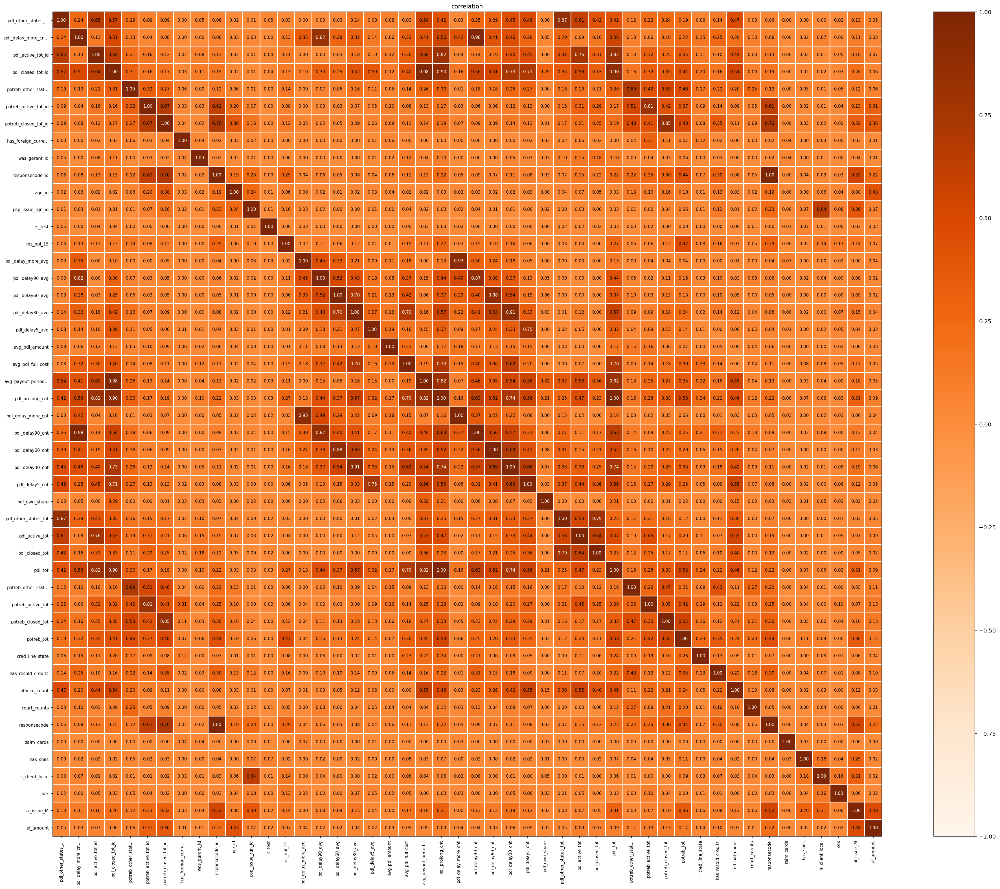

In [87]:
phik_overview = df.phik_matrix()
plot_correlation_matrix(phik_overview.values,
                       x_labels = phik_overview.columns,
                       y_labels = phik_overview.index,
                       color_map = 'Oranges',
                       fontsize_factor = 0.75,
                       figsize = (27,22))

Посмотрим какие признаки имеют высокую корреляцию

In [88]:
for i in phik_overview.columns:
    if i == 'res_npl_15':
        pass
    else:
        for j in range(0,41,1):
            if 1 > phik_overview[i].iloc[j] > 0.8:
                print(phik_overview[i].iloc[j])
                print(i)
                print(' ')

0.8210053772991489
pdl_tot
 
0.910625377275794
pdl_delay30_cnt
 
0.8816194334714359
pdl_delay60_cnt
 
0.8679388279716462
pdl_delay90_cnt
 
0.9256388403013129
pdl_delay_more_cnt
 
0.8210053772991489
pdl_prolong_cnt
 
0.8210053772991489
avg_payout_period_pdl
 
0.8210053772991489
avg_payout_period_pdl
 
0.910625377275794
pdl_delay30_avg
 
0.8816194334714359
pdl_delay60_avg
 
0.8679388279716462
pdl_delay90_avg
 
0.9256388403013129
pdl_delay_more_avg
 
0.8458970890675082
potreb_closed_tot_id
 
0.8107429442244708
potreb_active_tot_id
 
0.897321150396948
pdl_closed_tot_id
 
0.897321150396948
pdl_closed_tot_id
 
0.9773621373348983
pdl_closed_tot_id
 
0.8174676924674964
pdl_active_tot_id
 
0.8174676924674964
pdl_active_tot_id
 
0.9759846875713735
pdl_delay_more_cnt_id
 
0.8231067372378699
pdl_delay_more_cnt_id
 
0.8682912101414072
pdl_other_states_tot_id
 


удалим их

In [89]:
df = df.drop(['responsecode_id',
              'pdl_delay_more_cnt_id',
              'pdl_closed_tot_id',
              'pdl_delay_more_avg',
              'pdl_prolong_cnt',
              'pdl_delay30_avg',
              'pdl_other_states_tot_id',
              'pdl_delay60_avg',
              'potreb_closed_tot_id',
              'potreb_active_tot_id',
              'pdl_delay90_avg',
              'pdl_active_tot_id'], axis=1)

interval columns not set, guessing: ['sex', 'is_client_local', 'has_snils', 'zaim_cards', 'responsecode', 'court_counts', 'official_count', 'has_resold_credits', 'cred_line_state', 'potreb_tot', 'potreb_closed_tot', 'potreb_active_tot', 'potreb_other_states_tot', 'pdl_tot', 'pdl_closed_tot', 'pdl_active_tot', 'pdl_other_states_tot', 'pdl_own_share', 'pdl_delay5_cnt', 'pdl_delay30_cnt', 'pdl_delay60_cnt', 'pdl_delay90_cnt', 'pdl_delay_more_cnt', 'avg_payout_period_pdl', 'avg_pdl_full_cost', 'avg_pdl_amount', 'pdl_delay5_avg', 'res_npl_15', 'is_test']


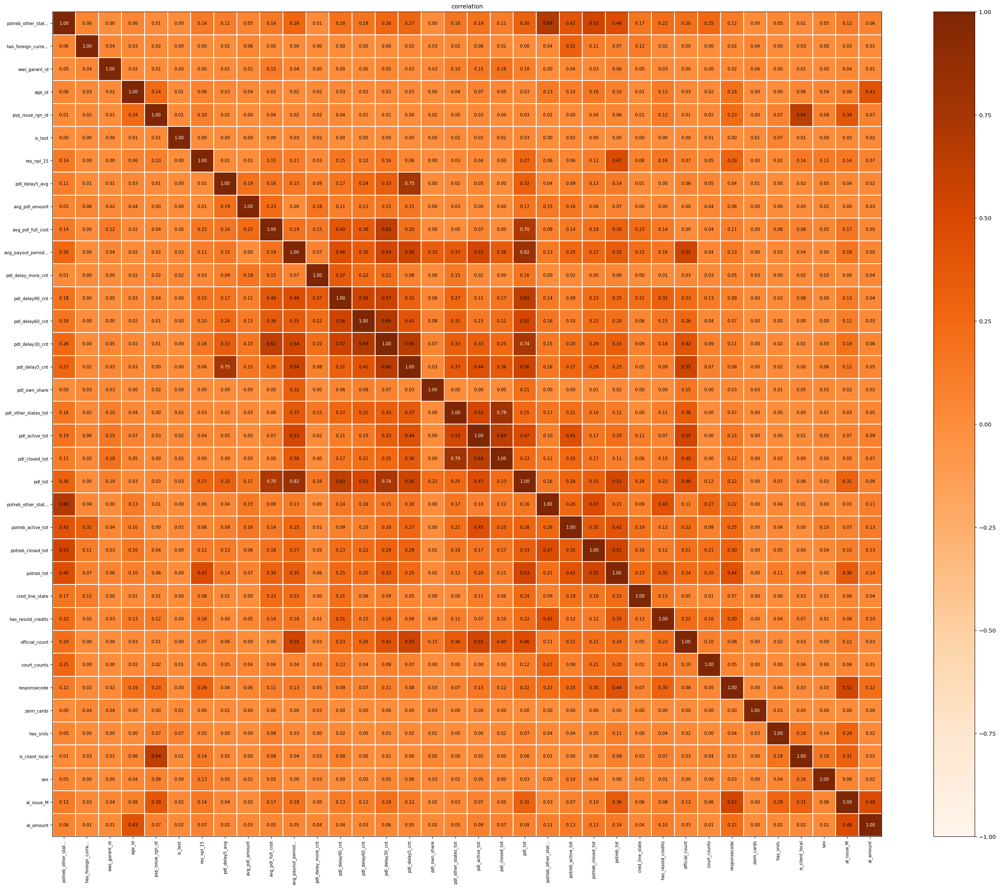

In [90]:
phik_overview = df.phik_matrix()
plot_correlation_matrix(phik_overview.values,
                       x_labels = phik_overview.columns,
                       y_labels = phik_overview.index,
                       color_map = 'Oranges',
                       fontsize_factor = 0.75,
                       figsize = (27,22))

Преобразуем наши категориальные данные

In [91]:
df = pd.get_dummies(df, drop_first=True)

In [92]:
df

,sex,is_client_local,has_snils,zaim_cards,responsecode,court_counts,official_count,has_resold_credits,cred_line_state,potreb_tot,potreb_closed_tot,potreb_active_tot,potreb_other_states_tot,pdl_tot,pdl_closed_tot,pdl_active_tot,pdl_other_states_tot,pdl_own_share,pdl_delay5_cnt,pdl_delay30_cnt,pdl_delay60_cnt,pdl_delay90_cnt,pdl_delay_more_cnt,avg_payout_period_pdl,avg_pdl_full_cost,avg_pdl_amount,pdl_delay5_avg,res_npl_15,is_test,al_amount_4000,al_amount_5000,al_issue_M_2,al_issue_M_3,al_issue_M_4,al_issue_M_5,al_issue_M_6,al_issue_M_7,al_issue_M_8,al_issue_M_9,al_issue_M_10,al_issue_M_11,al_issue_M_12,psp_issue_rgn_id_M_O,psp_issue_rgn_id_O,age_id_35_m,age_id_do_25,was_garant_id_yes,has_foreign_currency_credits_id_yes,potreb_other_states_tot_id_много
0,1,0,0,0,1,0,0,0,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
1,1,0,1,0,1,0,0,0,2,1,2,0,0,1,12,1,4,0,0,1,0,1,5,0,1,50459,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
2,1,0,1,0,1,0,0,0,2,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,2500,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
3,2,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,2,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9981,2,1,0,0,1,0,0,0,2,1,3,5,1,1,1,1,0,0,1,0,0,0,0,0,1,5240,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
9982,1,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9983,1,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
9984,1,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


In [93]:
df = df.astype(int)

In [94]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9985 entries, 0 to 9985
Data columns (total 49 columns):
 #   Column                               Non-Null Count  Dtype
---  ------                               --------------  -----
 0   sex                                  9985 non-null   int32
 1   is_client_local                      9985 non-null   int32
 2   has_snils                            9985 non-null   int32
 3   zaim_cards                           9985 non-null   int32
 4   responsecode                         9985 non-null   int32
 5   court_counts                         9985 non-null   int32
 6   official_count                       9985 non-null   int32
 7   has_resold_credits                   9985 non-null   int32
 8   cred_line_state                      9985 non-null   int32
 9   potreb_tot                           9985 non-null   int32
 10  potreb_closed_tot                    9985 non-null   int32
 11  potreb_active_tot                    9985 non-null   int

In [95]:
df_copy = df.copy()

## Построение модели

In [96]:
df['res_npl_15'] = df['res_npl_15'].astype(int)

In [97]:
df[df['is_test'] == 1]

,sex,is_client_local,has_snils,zaim_cards,responsecode,court_counts,official_count,has_resold_credits,cred_line_state,potreb_tot,potreb_closed_tot,potreb_active_tot,potreb_other_states_tot,pdl_tot,pdl_closed_tot,pdl_active_tot,pdl_other_states_tot,pdl_own_share,pdl_delay5_cnt,pdl_delay30_cnt,pdl_delay60_cnt,pdl_delay90_cnt,pdl_delay_more_cnt,avg_payout_period_pdl,avg_pdl_full_cost,avg_pdl_amount,pdl_delay5_avg,res_npl_15,is_test,al_amount_4000,al_amount_5000,al_issue_M_2,al_issue_M_3,al_issue_M_4,al_issue_M_5,al_issue_M_6,al_issue_M_7,al_issue_M_8,al_issue_M_9,al_issue_M_10,al_issue_M_11,al_issue_M_12,psp_issue_rgn_id_M_O,psp_issue_rgn_id_O,age_id_35_m,age_id_do_25,was_garant_id_yes,has_foreign_currency_credits_id_yes,potreb_other_states_tot_id_много
6997,1,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1
6998,1,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
6999,1,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
7000,1,0,0,0,1,0,0,0,2,1,0,3,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1
7001,1,0,1,0,1,0,0,0,2,1,2,0,0,1,1,0,0,0,0,0,0,1,1,0,2,7500,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9981,2,1,0,0,1,0,0,0,2,1,3,5,1,1,1,1,0,0,1,0,0,0,0,0,1,5240,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
9982,1,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9983,1,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
9984,1,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


Тестовая выборка

In [98]:
target_test = df[df['is_test'] == 1]['res_npl_15']
features_test = df[df['is_test'] == 1].drop('res_npl_15', axis=1)

Тренировочная и валидационная выборки

In [99]:
target_train = df[df['is_test'] == 0]['res_npl_15']
features_train = df[df['is_test'] == 0].drop('res_npl_15', axis=1)

In [100]:
features_test = features_test.drop('is_test', axis=1)
features_train = features_train.drop('is_test', axis=1)

In [101]:
target_train.value_counts()

0    3821
1    3175
Name: res_npl_15, dtype: int64

классы почти сбалансированы

### CatBoostClassifier

In [102]:
cat = GridSearchCV(estimator=CatBoostClassifier(iterations  = 50000),
                   param_grid={"learning_rate": (0.005, 0.001, 0.0005),
                               "max_depth": [3, 4]},
            cv=5, verbose=0, n_jobs=-1)

grid_result = cat.fit(features_train, target_train)
best_cat = grid_result.best_estimator_
print(f'Лучшие параметры модели {grid_result.best_params_}')


0:	learn: 0.6928450	total: 145ms	remaining: 2h 1m 2s
1:	learn: 0.6925462	total: 147ms	remaining: 1h 1m 15s
2:	learn: 0.6922336	total: 148ms	remaining: 41m 12s
3:	learn: 0.6919195	total: 150ms	remaining: 31m 14s
4:	learn: 0.6916570	total: 152ms	remaining: 25m 16s
5:	learn: 0.6913309	total: 153ms	remaining: 21m 16s
6:	learn: 0.6910358	total: 155ms	remaining: 18m 25s
7:	learn: 0.6907374	total: 156ms	remaining: 16m 17s
8:	learn: 0.6904369	total: 158ms	remaining: 14m 36s
9:	learn: 0.6901767	total: 159ms	remaining: 13m 16s
10:	learn: 0.6898821	total: 161ms	remaining: 12m 10s
11:	learn: 0.6895880	total: 162ms	remaining: 11m 15s
12:	learn: 0.6892881	total: 164ms	remaining: 10m 29s
13:	learn: 0.6889951	total: 165ms	remaining: 9m 49s
14:	learn: 0.6886966	total: 167ms	remaining: 9m 15s
15:	learn: 0.6883992	total: 168ms	remaining: 8m 45s
16:	learn: 0.6881032	total: 170ms	remaining: 8m 18s
17:	learn: 0.6878237	total: 171ms	remaining: 7m 55s
18:	learn: 0.6875389	total: 173ms	remaining: 7m 34s
19:	le

271:	learn: 0.6302233	total: 492ms	remaining: 1m 29s
272:	learn: 0.6300520	total: 493ms	remaining: 1m 29s
273:	learn: 0.6298780	total: 495ms	remaining: 1m 29s
274:	learn: 0.6297037	total: 496ms	remaining: 1m 29s
275:	learn: 0.6295239	total: 497ms	remaining: 1m 29s
276:	learn: 0.6293510	total: 498ms	remaining: 1m 29s
277:	learn: 0.6291795	total: 500ms	remaining: 1m 29s
278:	learn: 0.6290107	total: 501ms	remaining: 1m 29s
279:	learn: 0.6288411	total: 502ms	remaining: 1m 29s
280:	learn: 0.6286754	total: 503ms	remaining: 1m 29s
281:	learn: 0.6285274	total: 504ms	remaining: 1m 28s
282:	learn: 0.6283561	total: 505ms	remaining: 1m 28s
283:	learn: 0.6282006	total: 507ms	remaining: 1m 28s
284:	learn: 0.6280529	total: 508ms	remaining: 1m 28s
285:	learn: 0.6278745	total: 509ms	remaining: 1m 28s
286:	learn: 0.6277129	total: 510ms	remaining: 1m 28s
287:	learn: 0.6275408	total: 511ms	remaining: 1m 28s
288:	learn: 0.6273642	total: 513ms	remaining: 1m 28s
289:	learn: 0.6271971	total: 514ms	remaining: 

552:	learn: 0.5934183	total: 830ms	remaining: 1m 14s
553:	learn: 0.5933247	total: 831ms	remaining: 1m 14s
554:	learn: 0.5932247	total: 832ms	remaining: 1m 14s
555:	learn: 0.5931230	total: 834ms	remaining: 1m 14s
556:	learn: 0.5930102	total: 835ms	remaining: 1m 14s
557:	learn: 0.5929044	total: 836ms	remaining: 1m 14s
558:	learn: 0.5928046	total: 837ms	remaining: 1m 14s
559:	learn: 0.5927096	total: 838ms	remaining: 1m 14s
560:	learn: 0.5926002	total: 840ms	remaining: 1m 13s
561:	learn: 0.5924912	total: 841ms	remaining: 1m 13s
562:	learn: 0.5923954	total: 842ms	remaining: 1m 13s
563:	learn: 0.5923037	total: 843ms	remaining: 1m 13s
564:	learn: 0.5922122	total: 844ms	remaining: 1m 13s
565:	learn: 0.5921182	total: 846ms	remaining: 1m 13s
566:	learn: 0.5920240	total: 847ms	remaining: 1m 13s
567:	learn: 0.5919404	total: 848ms	remaining: 1m 13s
568:	learn: 0.5918485	total: 849ms	remaining: 1m 13s
569:	learn: 0.5917512	total: 850ms	remaining: 1m 13s
570:	learn: 0.5916736	total: 852ms	remaining: 

840:	learn: 0.5714336	total: 1.18s	remaining: 1m 8s
841:	learn: 0.5713762	total: 1.18s	remaining: 1m 8s
842:	learn: 0.5713280	total: 1.18s	remaining: 1m 8s
843:	learn: 0.5712611	total: 1.18s	remaining: 1m 8s
844:	learn: 0.5712050	total: 1.18s	remaining: 1m 8s
845:	learn: 0.5711461	total: 1.18s	remaining: 1m 8s
846:	learn: 0.5710970	total: 1.18s	remaining: 1m 8s
847:	learn: 0.5710395	total: 1.18s	remaining: 1m 8s
848:	learn: 0.5709828	total: 1.19s	remaining: 1m 8s
849:	learn: 0.5709251	total: 1.19s	remaining: 1m 8s
850:	learn: 0.5708676	total: 1.19s	remaining: 1m 8s
851:	learn: 0.5708097	total: 1.19s	remaining: 1m 8s
852:	learn: 0.5707497	total: 1.19s	remaining: 1m 8s
853:	learn: 0.5706858	total: 1.19s	remaining: 1m 8s
854:	learn: 0.5706315	total: 1.19s	remaining: 1m 8s
855:	learn: 0.5705699	total: 1.19s	remaining: 1m 8s
856:	learn: 0.5705091	total: 1.19s	remaining: 1m 8s
857:	learn: 0.5704570	total: 1.2s	remaining: 1m 8s
858:	learn: 0.5704086	total: 1.2s	remaining: 1m 8s
859:	learn: 0.

1123:	learn: 0.5585263	total: 1.51s	remaining: 1m 5s
1124:	learn: 0.5584960	total: 1.51s	remaining: 1m 5s
1125:	learn: 0.5584647	total: 1.51s	remaining: 1m 5s
1126:	learn: 0.5584292	total: 1.52s	remaining: 1m 5s
1127:	learn: 0.5583965	total: 1.52s	remaining: 1m 5s
1128:	learn: 0.5583629	total: 1.52s	remaining: 1m 5s
1129:	learn: 0.5583298	total: 1.52s	remaining: 1m 5s
1130:	learn: 0.5582964	total: 1.52s	remaining: 1m 5s
1131:	learn: 0.5582626	total: 1.52s	remaining: 1m 5s
1132:	learn: 0.5582272	total: 1.52s	remaining: 1m 5s
1133:	learn: 0.5581922	total: 1.52s	remaining: 1m 5s
1134:	learn: 0.5581597	total: 1.53s	remaining: 1m 5s
1135:	learn: 0.5581272	total: 1.53s	remaining: 1m 5s
1136:	learn: 0.5580975	total: 1.53s	remaining: 1m 5s
1137:	learn: 0.5580605	total: 1.53s	remaining: 1m 5s
1138:	learn: 0.5580256	total: 1.53s	remaining: 1m 5s
1139:	learn: 0.5579834	total: 1.53s	remaining: 1m 5s
1140:	learn: 0.5579485	total: 1.53s	remaining: 1m 5s
1141:	learn: 0.5579117	total: 1.53s	remaining:

1420:	learn: 0.5500360	total: 1.86s	remaining: 1m 3s
1421:	learn: 0.5500125	total: 1.87s	remaining: 1m 3s
1422:	learn: 0.5499904	total: 1.87s	remaining: 1m 3s
1423:	learn: 0.5499700	total: 1.87s	remaining: 1m 3s
1424:	learn: 0.5499416	total: 1.87s	remaining: 1m 3s
1425:	learn: 0.5499184	total: 1.87s	remaining: 1m 3s
1426:	learn: 0.5498939	total: 1.87s	remaining: 1m 3s
1427:	learn: 0.5498799	total: 1.87s	remaining: 1m 3s
1428:	learn: 0.5498619	total: 1.87s	remaining: 1m 3s
1429:	learn: 0.5498409	total: 1.88s	remaining: 1m 3s
1430:	learn: 0.5498158	total: 1.88s	remaining: 1m 3s
1431:	learn: 0.5497975	total: 1.88s	remaining: 1m 3s
1432:	learn: 0.5497733	total: 1.88s	remaining: 1m 3s
1433:	learn: 0.5497490	total: 1.88s	remaining: 1m 3s
1434:	learn: 0.5497219	total: 1.88s	remaining: 1m 3s
1435:	learn: 0.5497087	total: 1.88s	remaining: 1m 3s
1436:	learn: 0.5496867	total: 1.88s	remaining: 1m 3s
1437:	learn: 0.5496614	total: 1.89s	remaining: 1m 3s
1438:	learn: 0.5496351	total: 1.89s	remaining:

1703:	learn: 0.5446450	total: 2.2s	remaining: 1m 2s
1704:	learn: 0.5446302	total: 2.2s	remaining: 1m 2s
1705:	learn: 0.5446119	total: 2.21s	remaining: 1m 2s
1706:	learn: 0.5445947	total: 2.21s	remaining: 1m 2s
1707:	learn: 0.5445776	total: 2.21s	remaining: 1m 2s
1708:	learn: 0.5445589	total: 2.21s	remaining: 1m 2s
1709:	learn: 0.5445449	total: 2.21s	remaining: 1m 2s
1710:	learn: 0.5445277	total: 2.21s	remaining: 1m 2s
1711:	learn: 0.5445087	total: 2.21s	remaining: 1m 2s
1712:	learn: 0.5444902	total: 2.21s	remaining: 1m 2s
1713:	learn: 0.5444782	total: 2.21s	remaining: 1m 2s
1714:	learn: 0.5444603	total: 2.22s	remaining: 1m 2s
1715:	learn: 0.5444411	total: 2.22s	remaining: 1m 2s
1716:	learn: 0.5444243	total: 2.22s	remaining: 1m 2s
1717:	learn: 0.5444089	total: 2.22s	remaining: 1m 2s
1718:	learn: 0.5443926	total: 2.22s	remaining: 1m 2s
1719:	learn: 0.5443752	total: 2.22s	remaining: 1m 2s
1720:	learn: 0.5443611	total: 2.22s	remaining: 1m 2s
1721:	learn: 0.5443436	total: 2.22s	remaining: 1

1994:	learn: 0.5407688	total: 2.55s	remaining: 1m 1s
1995:	learn: 0.5407583	total: 2.55s	remaining: 1m 1s
1996:	learn: 0.5407480	total: 2.55s	remaining: 1m 1s
1997:	learn: 0.5407371	total: 2.55s	remaining: 1m 1s
1998:	learn: 0.5407279	total: 2.55s	remaining: 1m 1s
1999:	learn: 0.5407136	total: 2.56s	remaining: 1m 1s
2000:	learn: 0.5407031	total: 2.56s	remaining: 1m 1s
2001:	learn: 0.5406893	total: 2.56s	remaining: 1m 1s
2002:	learn: 0.5406771	total: 2.56s	remaining: 1m 1s
2003:	learn: 0.5406663	total: 2.56s	remaining: 1m 1s
2004:	learn: 0.5406559	total: 2.56s	remaining: 1m 1s
2005:	learn: 0.5406454	total: 2.56s	remaining: 1m 1s
2006:	learn: 0.5406334	total: 2.56s	remaining: 1m 1s
2007:	learn: 0.5406218	total: 2.56s	remaining: 1m 1s
2008:	learn: 0.5406144	total: 2.57s	remaining: 1m 1s
2009:	learn: 0.5406073	total: 2.57s	remaining: 1m 1s
2010:	learn: 0.5405927	total: 2.57s	remaining: 1m 1s
2011:	learn: 0.5405804	total: 2.57s	remaining: 1m 1s
2012:	learn: 0.5405705	total: 2.57s	remaining:

2278:	learn: 0.5378327	total: 2.89s	remaining: 1m
2279:	learn: 0.5378220	total: 2.89s	remaining: 1m
2280:	learn: 0.5378136	total: 2.89s	remaining: 1m
2281:	learn: 0.5378062	total: 2.89s	remaining: 1m
2282:	learn: 0.5377985	total: 2.89s	remaining: 1m
2283:	learn: 0.5377904	total: 2.89s	remaining: 1m
2284:	learn: 0.5377810	total: 2.89s	remaining: 1m
2285:	learn: 0.5377698	total: 2.9s	remaining: 1m
2286:	learn: 0.5377626	total: 2.9s	remaining: 1m
2287:	learn: 0.5377545	total: 2.9s	remaining: 1m
2288:	learn: 0.5377465	total: 2.9s	remaining: 1m
2289:	learn: 0.5377334	total: 2.9s	remaining: 1m
2290:	learn: 0.5377236	total: 2.9s	remaining: 1m
2291:	learn: 0.5377169	total: 2.9s	remaining: 1m
2292:	learn: 0.5377080	total: 2.9s	remaining: 1m
2293:	learn: 0.5377021	total: 2.9s	remaining: 1m
2294:	learn: 0.5376928	total: 2.91s	remaining: 1m
2295:	learn: 0.5376843	total: 2.91s	remaining: 1m
2296:	learn: 0.5376740	total: 2.91s	remaining: 1m
2297:	learn: 0.5376654	total: 2.91s	remaining: 1m
2298:	lea

2559:	learn: 0.5355760	total: 3.23s	remaining: 59.8s
2560:	learn: 0.5355682	total: 3.23s	remaining: 59.8s
2561:	learn: 0.5355648	total: 3.23s	remaining: 59.8s
2562:	learn: 0.5355608	total: 3.23s	remaining: 59.8s
2563:	learn: 0.5355558	total: 3.23s	remaining: 59.8s
2564:	learn: 0.5355504	total: 3.23s	remaining: 59.8s
2565:	learn: 0.5355444	total: 3.23s	remaining: 59.8s
2566:	learn: 0.5355380	total: 3.23s	remaining: 59.8s
2567:	learn: 0.5355263	total: 3.23s	remaining: 59.7s
2568:	learn: 0.5355189	total: 3.23s	remaining: 59.7s
2569:	learn: 0.5355097	total: 3.24s	remaining: 59.7s
2570:	learn: 0.5355040	total: 3.24s	remaining: 59.7s
2571:	learn: 0.5354977	total: 3.24s	remaining: 59.7s
2572:	learn: 0.5354755	total: 3.24s	remaining: 59.7s
2573:	learn: 0.5354688	total: 3.24s	remaining: 59.7s
2574:	learn: 0.5354649	total: 3.24s	remaining: 59.7s
2575:	learn: 0.5354593	total: 3.24s	remaining: 59.7s
2576:	learn: 0.5354535	total: 3.25s	remaining: 59.7s
2577:	learn: 0.5354454	total: 3.25s	remaining:

2850:	learn: 0.5335980	total: 3.58s	remaining: 59.2s
2851:	learn: 0.5335925	total: 3.58s	remaining: 59.2s
2852:	learn: 0.5335886	total: 3.58s	remaining: 59.2s
2853:	learn: 0.5335809	total: 3.58s	remaining: 59.2s
2854:	learn: 0.5335755	total: 3.58s	remaining: 59.2s
2855:	learn: 0.5335677	total: 3.58s	remaining: 59.2s
2856:	learn: 0.5335608	total: 3.58s	remaining: 59.2s
2857:	learn: 0.5335516	total: 3.59s	remaining: 59.2s
2858:	learn: 0.5335453	total: 3.59s	remaining: 59.2s
2859:	learn: 0.5335404	total: 3.59s	remaining: 59.2s
2860:	learn: 0.5335337	total: 3.59s	remaining: 59.2s
2861:	learn: 0.5335261	total: 3.59s	remaining: 59.2s
2862:	learn: 0.5335178	total: 3.59s	remaining: 59.2s
2863:	learn: 0.5335106	total: 3.59s	remaining: 59.1s
2864:	learn: 0.5335061	total: 3.6s	remaining: 59.1s
2865:	learn: 0.5335000	total: 3.6s	remaining: 59.1s
2866:	learn: 0.5334932	total: 3.6s	remaining: 59.1s
2867:	learn: 0.5334859	total: 3.6s	remaining: 59.1s
2868:	learn: 0.5334806	total: 3.6s	remaining: 59.1

3122:	learn: 0.5319924	total: 3.91s	remaining: 58.7s
3123:	learn: 0.5319853	total: 3.91s	remaining: 58.7s
3124:	learn: 0.5319790	total: 3.91s	remaining: 58.7s
3125:	learn: 0.5319757	total: 3.91s	remaining: 58.7s
3126:	learn: 0.5319694	total: 3.92s	remaining: 58.7s
3127:	learn: 0.5319639	total: 3.92s	remaining: 58.7s
3128:	learn: 0.5319549	total: 3.92s	remaining: 58.7s
3129:	learn: 0.5319504	total: 3.92s	remaining: 58.7s
3130:	learn: 0.5319469	total: 3.92s	remaining: 58.7s
3131:	learn: 0.5319426	total: 3.92s	remaining: 58.7s
3132:	learn: 0.5319363	total: 3.92s	remaining: 58.7s
3133:	learn: 0.5319311	total: 3.92s	remaining: 58.7s
3134:	learn: 0.5319251	total: 3.92s	remaining: 58.7s
3135:	learn: 0.5319204	total: 3.93s	remaining: 58.7s
3136:	learn: 0.5319142	total: 3.93s	remaining: 58.7s
3137:	learn: 0.5319087	total: 3.93s	remaining: 58.7s
3138:	learn: 0.5318939	total: 3.93s	remaining: 58.7s
3139:	learn: 0.5318878	total: 3.93s	remaining: 58.7s
3140:	learn: 0.5318792	total: 3.93s	remaining:

3408:	learn: 0.5304577	total: 4.26s	remaining: 58.3s
3409:	learn: 0.5304514	total: 4.26s	remaining: 58.3s
3410:	learn: 0.5304462	total: 4.26s	remaining: 58.3s
3411:	learn: 0.5304416	total: 4.27s	remaining: 58.3s
3412:	learn: 0.5304382	total: 4.27s	remaining: 58.3s
3413:	learn: 0.5304349	total: 4.27s	remaining: 58.3s
3414:	learn: 0.5304316	total: 4.27s	remaining: 58.3s
3415:	learn: 0.5304291	total: 4.27s	remaining: 58.3s
3416:	learn: 0.5304258	total: 4.27s	remaining: 58.3s
3417:	learn: 0.5304228	total: 4.27s	remaining: 58.2s
3418:	learn: 0.5304178	total: 4.28s	remaining: 58.2s
3419:	learn: 0.5304128	total: 4.28s	remaining: 58.2s
3420:	learn: 0.5304080	total: 4.28s	remaining: 58.2s
3421:	learn: 0.5304035	total: 4.28s	remaining: 58.2s
3422:	learn: 0.5303995	total: 4.28s	remaining: 58.2s
3423:	learn: 0.5303959	total: 4.28s	remaining: 58.2s
3424:	learn: 0.5303898	total: 4.28s	remaining: 58.2s
3425:	learn: 0.5303847	total: 4.28s	remaining: 58.2s
3426:	learn: 0.5303810	total: 4.28s	remaining:

3684:	learn: 0.5291329	total: 4.6s	remaining: 57.8s
3685:	learn: 0.5291282	total: 4.6s	remaining: 57.8s
3686:	learn: 0.5291236	total: 4.6s	remaining: 57.8s
3687:	learn: 0.5291196	total: 4.61s	remaining: 57.8s
3688:	learn: 0.5291129	total: 4.61s	remaining: 57.8s
3689:	learn: 0.5291099	total: 4.61s	remaining: 57.8s
3690:	learn: 0.5291066	total: 4.61s	remaining: 57.8s
3691:	learn: 0.5290994	total: 4.61s	remaining: 57.8s
3692:	learn: 0.5290942	total: 4.61s	remaining: 57.8s
3693:	learn: 0.5290916	total: 4.61s	remaining: 57.8s
3694:	learn: 0.5290895	total: 4.61s	remaining: 57.8s
3695:	learn: 0.5290844	total: 4.62s	remaining: 57.8s
3696:	learn: 0.5290815	total: 4.62s	remaining: 57.8s
3697:	learn: 0.5290757	total: 4.62s	remaining: 57.8s
3698:	learn: 0.5290696	total: 4.62s	remaining: 57.8s
3699:	learn: 0.5290654	total: 4.62s	remaining: 57.8s
3700:	learn: 0.5290600	total: 4.62s	remaining: 57.8s
3701:	learn: 0.5290576	total: 4.62s	remaining: 57.8s
3702:	learn: 0.5290550	total: 4.62s	remaining: 57

3958:	learn: 0.5279467	total: 4.94s	remaining: 57.5s
3959:	learn: 0.5279391	total: 4.94s	remaining: 57.5s
3960:	learn: 0.5279370	total: 4.94s	remaining: 57.5s
3961:	learn: 0.5279328	total: 4.95s	remaining: 57.5s
3962:	learn: 0.5279304	total: 4.95s	remaining: 57.5s
3963:	learn: 0.5279268	total: 4.95s	remaining: 57.5s
3964:	learn: 0.5279212	total: 4.95s	remaining: 57.5s
3965:	learn: 0.5279143	total: 4.95s	remaining: 57.5s
3966:	learn: 0.5279104	total: 4.95s	remaining: 57.5s
3967:	learn: 0.5279076	total: 4.95s	remaining: 57.5s
3968:	learn: 0.5279025	total: 4.95s	remaining: 57.5s
3969:	learn: 0.5278996	total: 4.96s	remaining: 57.5s
3970:	learn: 0.5278955	total: 4.96s	remaining: 57.4s
3971:	learn: 0.5278928	total: 4.96s	remaining: 57.4s
3972:	learn: 0.5278888	total: 4.96s	remaining: 57.4s
3973:	learn: 0.5278850	total: 4.96s	remaining: 57.4s
3974:	learn: 0.5278814	total: 4.96s	remaining: 57.4s
3975:	learn: 0.5278754	total: 4.96s	remaining: 57.4s
3976:	learn: 0.5278703	total: 4.96s	remaining:

4239:	learn: 0.5267801	total: 5.29s	remaining: 57.1s
4240:	learn: 0.5267758	total: 5.29s	remaining: 57.1s
4241:	learn: 0.5267742	total: 5.29s	remaining: 57.1s
4242:	learn: 0.5267698	total: 5.29s	remaining: 57.1s
4243:	learn: 0.5267665	total: 5.29s	remaining: 57.1s
4244:	learn: 0.5267630	total: 5.29s	remaining: 57.1s
4245:	learn: 0.5267586	total: 5.3s	remaining: 57.1s
4246:	learn: 0.5267555	total: 5.3s	remaining: 57.1s
4247:	learn: 0.5267528	total: 5.3s	remaining: 57.1s
4248:	learn: 0.5267498	total: 5.3s	remaining: 57.1s
4249:	learn: 0.5267451	total: 5.3s	remaining: 57.1s
4250:	learn: 0.5267421	total: 5.3s	remaining: 57.1s
4251:	learn: 0.5267385	total: 5.3s	remaining: 57.1s
4252:	learn: 0.5267348	total: 5.3s	remaining: 57.1s
4253:	learn: 0.5267311	total: 5.31s	remaining: 57.1s
4254:	learn: 0.5267277	total: 5.31s	remaining: 57.1s
4255:	learn: 0.5267221	total: 5.31s	remaining: 57.1s
4256:	learn: 0.5267178	total: 5.31s	remaining: 57.1s
4257:	learn: 0.5267132	total: 5.31s	remaining: 57.1s
4

4519:	learn: 0.5256562	total: 5.64s	remaining: 56.8s
4520:	learn: 0.5256521	total: 5.64s	remaining: 56.8s
4521:	learn: 0.5256502	total: 5.64s	remaining: 56.8s
4522:	learn: 0.5256477	total: 5.64s	remaining: 56.8s
4523:	learn: 0.5256447	total: 5.65s	remaining: 56.8s
4524:	learn: 0.5256415	total: 5.65s	remaining: 56.8s
4525:	learn: 0.5256358	total: 5.65s	remaining: 56.8s
4526:	learn: 0.5256343	total: 5.65s	remaining: 56.8s
4527:	learn: 0.5256313	total: 5.65s	remaining: 56.8s
4528:	learn: 0.5256276	total: 5.65s	remaining: 56.8s
4529:	learn: 0.5256230	total: 5.65s	remaining: 56.8s
4530:	learn: 0.5256202	total: 5.66s	remaining: 56.8s
4531:	learn: 0.5256159	total: 5.66s	remaining: 56.8s
4532:	learn: 0.5256137	total: 5.66s	remaining: 56.8s
4533:	learn: 0.5256107	total: 5.66s	remaining: 56.8s
4534:	learn: 0.5256076	total: 5.66s	remaining: 56.8s
4535:	learn: 0.5256046	total: 5.66s	remaining: 56.7s
4536:	learn: 0.5256006	total: 5.66s	remaining: 56.7s
4537:	learn: 0.5255957	total: 5.66s	remaining:

4791:	learn: 0.5246613	total: 5.98s	remaining: 56.4s
4792:	learn: 0.5246566	total: 5.98s	remaining: 56.4s
4793:	learn: 0.5246544	total: 5.98s	remaining: 56.4s
4794:	learn: 0.5246509	total: 5.99s	remaining: 56.4s
4795:	learn: 0.5246456	total: 5.99s	remaining: 56.4s
4796:	learn: 0.5246416	total: 5.99s	remaining: 56.4s
4797:	learn: 0.5246395	total: 5.99s	remaining: 56.4s
4798:	learn: 0.5246355	total: 5.99s	remaining: 56.4s
4799:	learn: 0.5246334	total: 5.99s	remaining: 56.4s
4800:	learn: 0.5246287	total: 5.99s	remaining: 56.4s
4801:	learn: 0.5246266	total: 5.99s	remaining: 56.4s
4802:	learn: 0.5246237	total: 6s	remaining: 56.4s
4803:	learn: 0.5246200	total: 6s	remaining: 56.4s
4804:	learn: 0.5246189	total: 6s	remaining: 56.4s
4805:	learn: 0.5246142	total: 6s	remaining: 56.4s
4806:	learn: 0.5246109	total: 6s	remaining: 56.4s
4807:	learn: 0.5246073	total: 6s	remaining: 56.4s
4808:	learn: 0.5246044	total: 6s	remaining: 56.4s
4809:	learn: 0.5245991	total: 6s	remaining: 56.4s
4810:	learn: 0.52

5064:	learn: 0.5237106	total: 6.32s	remaining: 56.1s
5065:	learn: 0.5237045	total: 6.32s	remaining: 56.1s
5066:	learn: 0.5237007	total: 6.32s	remaining: 56.1s
5067:	learn: 0.5236985	total: 6.32s	remaining: 56.1s
5068:	learn: 0.5236966	total: 6.33s	remaining: 56.1s
5069:	learn: 0.5236906	total: 6.33s	remaining: 56.1s
5070:	learn: 0.5236893	total: 6.33s	remaining: 56.1s
5071:	learn: 0.5236867	total: 6.33s	remaining: 56.1s
5072:	learn: 0.5236830	total: 6.33s	remaining: 56.1s
5073:	learn: 0.5236805	total: 6.33s	remaining: 56.1s
5074:	learn: 0.5236779	total: 6.33s	remaining: 56.1s
5075:	learn: 0.5236763	total: 6.33s	remaining: 56.1s
5076:	learn: 0.5236725	total: 6.33s	remaining: 56.1s
5077:	learn: 0.5236682	total: 6.34s	remaining: 56.1s
5078:	learn: 0.5236654	total: 6.34s	remaining: 56.1s
5079:	learn: 0.5236631	total: 6.34s	remaining: 56.1s
5080:	learn: 0.5236617	total: 6.34s	remaining: 56.1s
5081:	learn: 0.5236590	total: 6.34s	remaining: 56.1s
5082:	learn: 0.5236564	total: 6.34s	remaining:

5342:	learn: 0.5228396	total: 6.67s	remaining: 55.7s
5343:	learn: 0.5228348	total: 6.67s	remaining: 55.7s
5344:	learn: 0.5228293	total: 6.67s	remaining: 55.7s
5345:	learn: 0.5228252	total: 6.67s	remaining: 55.7s
5346:	learn: 0.5228213	total: 6.67s	remaining: 55.7s
5347:	learn: 0.5228202	total: 6.67s	remaining: 55.7s
5348:	learn: 0.5228169	total: 6.67s	remaining: 55.7s
5349:	learn: 0.5228145	total: 6.67s	remaining: 55.7s
5350:	learn: 0.5228124	total: 6.68s	remaining: 55.7s
5351:	learn: 0.5228112	total: 6.68s	remaining: 55.7s
5352:	learn: 0.5228093	total: 6.68s	remaining: 55.7s
5353:	learn: 0.5228074	total: 6.68s	remaining: 55.7s
5354:	learn: 0.5228010	total: 6.68s	remaining: 55.7s
5355:	learn: 0.5227978	total: 6.68s	remaining: 55.7s
5356:	learn: 0.5227944	total: 6.68s	remaining: 55.7s
5357:	learn: 0.5227907	total: 6.68s	remaining: 55.7s
5358:	learn: 0.5227887	total: 6.69s	remaining: 55.7s
5359:	learn: 0.5227865	total: 6.69s	remaining: 55.7s
5360:	learn: 0.5227813	total: 6.69s	remaining:

5617:	learn: 0.5219464	total: 7.01s	remaining: 55.3s
5618:	learn: 0.5219422	total: 7.01s	remaining: 55.3s
5619:	learn: 0.5219374	total: 7.01s	remaining: 55.3s
5620:	learn: 0.5219352	total: 7.01s	remaining: 55.3s
5621:	learn: 0.5219326	total: 7.01s	remaining: 55.3s
5622:	learn: 0.5219215	total: 7.01s	remaining: 55.3s
5623:	learn: 0.5219181	total: 7.01s	remaining: 55.3s
5624:	learn: 0.5219023	total: 7.01s	remaining: 55.3s
5625:	learn: 0.5218999	total: 7.02s	remaining: 55.3s
5626:	learn: 0.5218982	total: 7.02s	remaining: 55.3s
5627:	learn: 0.5218946	total: 7.02s	remaining: 55.3s
5628:	learn: 0.5218937	total: 7.02s	remaining: 55.3s
5629:	learn: 0.5218920	total: 7.02s	remaining: 55.3s
5630:	learn: 0.5218899	total: 7.02s	remaining: 55.3s
5631:	learn: 0.5218863	total: 7.02s	remaining: 55.3s
5632:	learn: 0.5218813	total: 7.02s	remaining: 55.3s
5633:	learn: 0.5218788	total: 7.03s	remaining: 55.3s
5634:	learn: 0.5218764	total: 7.03s	remaining: 55.3s
5635:	learn: 0.5218736	total: 7.03s	remaining:

5904:	learn: 0.5210651	total: 7.36s	remaining: 55s
5905:	learn: 0.5210610	total: 7.36s	remaining: 55s
5906:	learn: 0.5210578	total: 7.36s	remaining: 55s
5907:	learn: 0.5210520	total: 7.36s	remaining: 55s
5908:	learn: 0.5210498	total: 7.36s	remaining: 55s
5909:	learn: 0.5210468	total: 7.37s	remaining: 55s
5910:	learn: 0.5210449	total: 7.37s	remaining: 55s
5911:	learn: 0.5210419	total: 7.37s	remaining: 55s
5912:	learn: 0.5210389	total: 7.37s	remaining: 54.9s
5913:	learn: 0.5210376	total: 7.37s	remaining: 54.9s
5914:	learn: 0.5210352	total: 7.37s	remaining: 54.9s
5915:	learn: 0.5210330	total: 7.37s	remaining: 54.9s
5916:	learn: 0.5210295	total: 7.37s	remaining: 54.9s
5917:	learn: 0.5210245	total: 7.38s	remaining: 54.9s
5918:	learn: 0.5210229	total: 7.38s	remaining: 54.9s
5919:	learn: 0.5210184	total: 7.38s	remaining: 54.9s
5920:	learn: 0.5210179	total: 7.38s	remaining: 54.9s
5921:	learn: 0.5210151	total: 7.38s	remaining: 54.9s
5922:	learn: 0.5210138	total: 7.38s	remaining: 54.9s
5923:	lea

6175:	learn: 0.5202670	total: 7.69s	remaining: 54.6s
6176:	learn: 0.5202648	total: 7.69s	remaining: 54.6s
6177:	learn: 0.5202623	total: 7.7s	remaining: 54.6s
6178:	learn: 0.5202619	total: 7.7s	remaining: 54.6s
6179:	learn: 0.5202577	total: 7.7s	remaining: 54.6s
6180:	learn: 0.5202549	total: 7.7s	remaining: 54.6s
6181:	learn: 0.5202532	total: 7.7s	remaining: 54.6s
6182:	learn: 0.5202519	total: 7.7s	remaining: 54.6s
6183:	learn: 0.5202503	total: 7.7s	remaining: 54.6s
6184:	learn: 0.5202479	total: 7.7s	remaining: 54.6s
6185:	learn: 0.5202436	total: 7.71s	remaining: 54.6s
6186:	learn: 0.5202331	total: 7.71s	remaining: 54.6s
6187:	learn: 0.5202315	total: 7.71s	remaining: 54.6s
6188:	learn: 0.5202278	total: 7.71s	remaining: 54.6s
6189:	learn: 0.5202251	total: 7.71s	remaining: 54.6s
6190:	learn: 0.5202220	total: 7.71s	remaining: 54.6s
6191:	learn: 0.5202198	total: 7.71s	remaining: 54.6s
6192:	learn: 0.5202174	total: 7.71s	remaining: 54.6s
6193:	learn: 0.5202128	total: 7.71s	remaining: 54.6s
6

6459:	learn: 0.5194816	total: 8.04s	remaining: 54.2s
6460:	learn: 0.5194800	total: 8.05s	remaining: 54.2s
6461:	learn: 0.5194763	total: 8.05s	remaining: 54.2s
6462:	learn: 0.5194752	total: 8.05s	remaining: 54.2s
6463:	learn: 0.5194723	total: 8.05s	remaining: 54.2s
6464:	learn: 0.5194709	total: 8.05s	remaining: 54.2s
6465:	learn: 0.5194672	total: 8.05s	remaining: 54.2s
6466:	learn: 0.5194641	total: 8.05s	remaining: 54.2s
6467:	learn: 0.5194616	total: 8.05s	remaining: 54.2s
6468:	learn: 0.5194593	total: 8.06s	remaining: 54.2s
6469:	learn: 0.5194529	total: 8.06s	remaining: 54.2s
6470:	learn: 0.5194522	total: 8.06s	remaining: 54.2s
6471:	learn: 0.5194490	total: 8.06s	remaining: 54.2s
6472:	learn: 0.5194447	total: 8.06s	remaining: 54.2s
6473:	learn: 0.5194425	total: 8.06s	remaining: 54.2s
6474:	learn: 0.5194404	total: 8.06s	remaining: 54.2s
6475:	learn: 0.5194365	total: 8.06s	remaining: 54.2s
6476:	learn: 0.5194342	total: 8.07s	remaining: 54.2s
6477:	learn: 0.5194333	total: 8.07s	remaining:

6734:	learn: 0.5187358	total: 8.38s	remaining: 53.9s
6735:	learn: 0.5187329	total: 8.39s	remaining: 53.9s
6736:	learn: 0.5187297	total: 8.39s	remaining: 53.9s
6737:	learn: 0.5187285	total: 8.39s	remaining: 53.9s
6738:	learn: 0.5187260	total: 8.39s	remaining: 53.9s
6739:	learn: 0.5187250	total: 8.39s	remaining: 53.9s
6740:	learn: 0.5187227	total: 8.39s	remaining: 53.9s
6741:	learn: 0.5187204	total: 8.39s	remaining: 53.9s
6742:	learn: 0.5187180	total: 8.39s	remaining: 53.9s
6743:	learn: 0.5187117	total: 8.4s	remaining: 53.9s
6744:	learn: 0.5187091	total: 8.4s	remaining: 53.9s
6745:	learn: 0.5187063	total: 8.4s	remaining: 53.9s
6746:	learn: 0.5187029	total: 8.4s	remaining: 53.9s
6747:	learn: 0.5187006	total: 8.4s	remaining: 53.9s
6748:	learn: 0.5186969	total: 8.4s	remaining: 53.9s
6749:	learn: 0.5186951	total: 8.4s	remaining: 53.9s
6750:	learn: 0.5186931	total: 8.4s	remaining: 53.9s
6751:	learn: 0.5186881	total: 8.41s	remaining: 53.8s
6752:	learn: 0.5186860	total: 8.41s	remaining: 53.8s
6

7007:	learn: 0.5179653	total: 8.72s	remaining: 53.5s
7008:	learn: 0.5179641	total: 8.73s	remaining: 53.5s
7009:	learn: 0.5179629	total: 8.73s	remaining: 53.5s
7010:	learn: 0.5179602	total: 8.73s	remaining: 53.5s
7011:	learn: 0.5179580	total: 8.73s	remaining: 53.5s
7012:	learn: 0.5179565	total: 8.73s	remaining: 53.5s
7013:	learn: 0.5179538	total: 8.73s	remaining: 53.5s
7014:	learn: 0.5179507	total: 8.73s	remaining: 53.5s
7015:	learn: 0.5179488	total: 8.73s	remaining: 53.5s
7016:	learn: 0.5179456	total: 8.74s	remaining: 53.5s
7017:	learn: 0.5179433	total: 8.74s	remaining: 53.5s
7018:	learn: 0.5179429	total: 8.74s	remaining: 53.5s
7019:	learn: 0.5179397	total: 8.74s	remaining: 53.5s
7020:	learn: 0.5179380	total: 8.74s	remaining: 53.5s
7021:	learn: 0.5179348	total: 8.74s	remaining: 53.5s
7022:	learn: 0.5179327	total: 8.74s	remaining: 53.5s
7023:	learn: 0.5179295	total: 8.74s	remaining: 53.5s
7024:	learn: 0.5179264	total: 8.75s	remaining: 53.5s
7025:	learn: 0.5179236	total: 8.75s	remaining:

7288:	learn: 0.5172110	total: 9.07s	remaining: 53.2s
7289:	learn: 0.5172098	total: 9.07s	remaining: 53.2s
7290:	learn: 0.5172079	total: 9.07s	remaining: 53.2s
7291:	learn: 0.5172057	total: 9.08s	remaining: 53.2s
7292:	learn: 0.5172041	total: 9.08s	remaining: 53.2s
7293:	learn: 0.5172006	total: 9.08s	remaining: 53.2s
7294:	learn: 0.5171993	total: 9.08s	remaining: 53.2s
7295:	learn: 0.5171953	total: 9.08s	remaining: 53.2s
7296:	learn: 0.5171926	total: 9.08s	remaining: 53.2s
7297:	learn: 0.5171906	total: 9.08s	remaining: 53.2s
7298:	learn: 0.5171872	total: 9.09s	remaining: 53.2s
7299:	learn: 0.5171844	total: 9.09s	remaining: 53.2s
7300:	learn: 0.5171814	total: 9.09s	remaining: 53.1s
7301:	learn: 0.5171764	total: 9.09s	remaining: 53.1s
7302:	learn: 0.5171733	total: 9.09s	remaining: 53.1s
7303:	learn: 0.5171688	total: 9.09s	remaining: 53.1s
7304:	learn: 0.5171685	total: 9.09s	remaining: 53.1s
7305:	learn: 0.5171658	total: 9.09s	remaining: 53.1s
7306:	learn: 0.5171634	total: 9.1s	remaining: 

7572:	learn: 0.5164833	total: 9.43s	remaining: 52.8s
7573:	learn: 0.5164822	total: 9.43s	remaining: 52.8s
7574:	learn: 0.5164813	total: 9.43s	remaining: 52.8s
7575:	learn: 0.5164781	total: 9.43s	remaining: 52.8s
7576:	learn: 0.5164772	total: 9.43s	remaining: 52.8s
7577:	learn: 0.5164759	total: 9.43s	remaining: 52.8s
7578:	learn: 0.5164744	total: 9.43s	remaining: 52.8s
7579:	learn: 0.5164725	total: 9.44s	remaining: 52.8s
7580:	learn: 0.5164659	total: 9.44s	remaining: 52.8s
7581:	learn: 0.5164639	total: 9.44s	remaining: 52.8s
7582:	learn: 0.5164595	total: 9.44s	remaining: 52.8s
7583:	learn: 0.5164580	total: 9.44s	remaining: 52.8s
7584:	learn: 0.5164535	total: 9.44s	remaining: 52.8s
7585:	learn: 0.5164519	total: 9.44s	remaining: 52.8s
7586:	learn: 0.5164495	total: 9.44s	remaining: 52.8s
7587:	learn: 0.5164463	total: 9.45s	remaining: 52.8s
7588:	learn: 0.5164451	total: 9.45s	remaining: 52.8s
7589:	learn: 0.5164421	total: 9.45s	remaining: 52.8s
7590:	learn: 0.5164411	total: 9.45s	remaining:

7844:	learn: 0.5157807	total: 9.77s	remaining: 52.5s
7845:	learn: 0.5157787	total: 9.77s	remaining: 52.5s
7846:	learn: 0.5157759	total: 9.77s	remaining: 52.5s
7847:	learn: 0.5157733	total: 9.77s	remaining: 52.5s
7848:	learn: 0.5157705	total: 9.77s	remaining: 52.5s
7849:	learn: 0.5157690	total: 9.77s	remaining: 52.5s
7850:	learn: 0.5157646	total: 9.77s	remaining: 52.5s
7851:	learn: 0.5157631	total: 9.77s	remaining: 52.5s
7852:	learn: 0.5157620	total: 9.78s	remaining: 52.5s
7853:	learn: 0.5157602	total: 9.78s	remaining: 52.5s
7854:	learn: 0.5157589	total: 9.78s	remaining: 52.5s
7855:	learn: 0.5157550	total: 9.78s	remaining: 52.5s
7856:	learn: 0.5157536	total: 9.78s	remaining: 52.5s
7857:	learn: 0.5157516	total: 9.78s	remaining: 52.5s
7858:	learn: 0.5157487	total: 9.78s	remaining: 52.5s
7859:	learn: 0.5157475	total: 9.78s	remaining: 52.5s
7860:	learn: 0.5157454	total: 9.79s	remaining: 52.5s
7861:	learn: 0.5157431	total: 9.79s	remaining: 52.5s
7862:	learn: 0.5157339	total: 9.79s	remaining:

8112:	learn: 0.5150611	total: 10.1s	remaining: 52.2s
8113:	learn: 0.5150591	total: 10.1s	remaining: 52.2s
8114:	learn: 0.5150576	total: 10.1s	remaining: 52.2s
8115:	learn: 0.5150554	total: 10.1s	remaining: 52.2s
8116:	learn: 0.5150520	total: 10.1s	remaining: 52.2s
8117:	learn: 0.5150491	total: 10.1s	remaining: 52.2s
8118:	learn: 0.5150473	total: 10.1s	remaining: 52.2s
8119:	learn: 0.5150456	total: 10.1s	remaining: 52.2s
8120:	learn: 0.5150435	total: 10.1s	remaining: 52.2s
8121:	learn: 0.5150406	total: 10.1s	remaining: 52.2s
8122:	learn: 0.5150367	total: 10.1s	remaining: 52.2s
8123:	learn: 0.5150338	total: 10.1s	remaining: 52.1s
8124:	learn: 0.5150317	total: 10.1s	remaining: 52.1s
8125:	learn: 0.5150275	total: 10.1s	remaining: 52.1s
8126:	learn: 0.5150257	total: 10.1s	remaining: 52.1s
8127:	learn: 0.5150241	total: 10.1s	remaining: 52.1s
8128:	learn: 0.5150213	total: 10.1s	remaining: 52.1s
8129:	learn: 0.5150187	total: 10.1s	remaining: 52.1s
8130:	learn: 0.5150174	total: 10.1s	remaining:

8390:	learn: 0.5142764	total: 10.4s	remaining: 51.8s
8391:	learn: 0.5142738	total: 10.5s	remaining: 51.8s
8392:	learn: 0.5142703	total: 10.5s	remaining: 51.8s
8393:	learn: 0.5142681	total: 10.5s	remaining: 51.8s
8394:	learn: 0.5142661	total: 10.5s	remaining: 51.8s
8395:	learn: 0.5142639	total: 10.5s	remaining: 51.8s
8396:	learn: 0.5142629	total: 10.5s	remaining: 51.8s
8397:	learn: 0.5142616	total: 10.5s	remaining: 51.8s
8398:	learn: 0.5142602	total: 10.5s	remaining: 51.8s
8399:	learn: 0.5142551	total: 10.5s	remaining: 51.8s
8400:	learn: 0.5142515	total: 10.5s	remaining: 51.8s
8401:	learn: 0.5142497	total: 10.5s	remaining: 51.8s
8402:	learn: 0.5142484	total: 10.5s	remaining: 51.8s
8403:	learn: 0.5142469	total: 10.5s	remaining: 51.8s
8404:	learn: 0.5142430	total: 10.5s	remaining: 51.8s
8405:	learn: 0.5142400	total: 10.5s	remaining: 51.8s
8406:	learn: 0.5142357	total: 10.5s	remaining: 51.8s
8407:	learn: 0.5142335	total: 10.5s	remaining: 51.8s
8408:	learn: 0.5142295	total: 10.5s	remaining:

8662:	learn: 0.5135550	total: 10.8s	remaining: 51.5s
8663:	learn: 0.5135536	total: 10.8s	remaining: 51.5s
8664:	learn: 0.5135500	total: 10.8s	remaining: 51.5s
8665:	learn: 0.5135489	total: 10.8s	remaining: 51.5s
8666:	learn: 0.5135467	total: 10.8s	remaining: 51.5s
8667:	learn: 0.5135441	total: 10.8s	remaining: 51.5s
8668:	learn: 0.5135420	total: 10.8s	remaining: 51.5s
8669:	learn: 0.5135390	total: 10.8s	remaining: 51.5s
8670:	learn: 0.5135365	total: 10.8s	remaining: 51.5s
8671:	learn: 0.5135226	total: 10.8s	remaining: 51.5s
8672:	learn: 0.5135212	total: 10.8s	remaining: 51.5s
8673:	learn: 0.5135122	total: 10.8s	remaining: 51.5s
8674:	learn: 0.5135101	total: 10.8s	remaining: 51.5s
8675:	learn: 0.5135076	total: 10.8s	remaining: 51.5s
8676:	learn: 0.5135049	total: 10.8s	remaining: 51.5s
8677:	learn: 0.5135010	total: 10.8s	remaining: 51.5s
8678:	learn: 0.5134981	total: 10.8s	remaining: 51.5s
8679:	learn: 0.5134958	total: 10.8s	remaining: 51.5s
8680:	learn: 0.5134948	total: 10.8s	remaining:

8947:	learn: 0.5127040	total: 11.1s	remaining: 51.1s
8948:	learn: 0.5127007	total: 11.1s	remaining: 51.1s
8949:	learn: 0.5126991	total: 11.1s	remaining: 51.1s
8950:	learn: 0.5126960	total: 11.1s	remaining: 51.1s
8951:	learn: 0.5126947	total: 11.1s	remaining: 51.1s
8952:	learn: 0.5126919	total: 11.1s	remaining: 51.1s
8953:	learn: 0.5126881	total: 11.2s	remaining: 51.1s
8954:	learn: 0.5126790	total: 11.2s	remaining: 51.1s
8955:	learn: 0.5126764	total: 11.2s	remaining: 51.1s
8956:	learn: 0.5126751	total: 11.2s	remaining: 51.1s
8957:	learn: 0.5126724	total: 11.2s	remaining: 51.1s
8958:	learn: 0.5126687	total: 11.2s	remaining: 51.1s
8959:	learn: 0.5126672	total: 11.2s	remaining: 51.1s
8960:	learn: 0.5126638	total: 11.2s	remaining: 51.1s
8961:	learn: 0.5126595	total: 11.2s	remaining: 51.1s
8962:	learn: 0.5126579	total: 11.2s	remaining: 51.1s
8963:	learn: 0.5126539	total: 11.2s	remaining: 51.1s
8964:	learn: 0.5126533	total: 11.2s	remaining: 51.1s
8965:	learn: 0.5126529	total: 11.2s	remaining:

9219:	learn: 0.5119244	total: 11.5s	remaining: 50.8s
9220:	learn: 0.5119221	total: 11.5s	remaining: 50.8s
9221:	learn: 0.5119202	total: 11.5s	remaining: 50.8s
9222:	learn: 0.5119171	total: 11.5s	remaining: 50.8s
9223:	learn: 0.5119137	total: 11.5s	remaining: 50.8s
9224:	learn: 0.5119118	total: 11.5s	remaining: 50.8s
9225:	learn: 0.5118982	total: 11.5s	remaining: 50.8s
9226:	learn: 0.5118970	total: 11.5s	remaining: 50.8s
9227:	learn: 0.5118942	total: 11.5s	remaining: 50.8s
9228:	learn: 0.5118918	total: 11.5s	remaining: 50.8s
9229:	learn: 0.5118895	total: 11.5s	remaining: 50.8s
9230:	learn: 0.5118876	total: 11.5s	remaining: 50.8s
9231:	learn: 0.5118853	total: 11.5s	remaining: 50.8s
9232:	learn: 0.5118805	total: 11.5s	remaining: 50.8s
9233:	learn: 0.5118768	total: 11.5s	remaining: 50.8s
9234:	learn: 0.5118743	total: 11.5s	remaining: 50.8s
9235:	learn: 0.5118703	total: 11.5s	remaining: 50.8s
9236:	learn: 0.5118683	total: 11.5s	remaining: 50.8s
9237:	learn: 0.5118660	total: 11.5s	remaining:

9499:	learn: 0.5110103	total: 11.8s	remaining: 50.4s
9500:	learn: 0.5110069	total: 11.8s	remaining: 50.4s
9501:	learn: 0.5110020	total: 11.8s	remaining: 50.4s
9502:	learn: 0.5109992	total: 11.8s	remaining: 50.4s
9503:	learn: 0.5109950	total: 11.8s	remaining: 50.4s
9504:	learn: 0.5109930	total: 11.8s	remaining: 50.4s
9505:	learn: 0.5109884	total: 11.8s	remaining: 50.4s
9506:	learn: 0.5109856	total: 11.8s	remaining: 50.4s
9507:	learn: 0.5109830	total: 11.8s	remaining: 50.4s
9508:	learn: 0.5109827	total: 11.8s	remaining: 50.4s
9509:	learn: 0.5109814	total: 11.8s	remaining: 50.4s
9510:	learn: 0.5109756	total: 11.8s	remaining: 50.4s
9511:	learn: 0.5109717	total: 11.8s	remaining: 50.4s
9512:	learn: 0.5109657	total: 11.8s	remaining: 50.4s
9513:	learn: 0.5109607	total: 11.8s	remaining: 50.4s
9514:	learn: 0.5109588	total: 11.8s	remaining: 50.4s
9515:	learn: 0.5109568	total: 11.8s	remaining: 50.4s
9516:	learn: 0.5109532	total: 11.8s	remaining: 50.4s
9517:	learn: 0.5109480	total: 11.9s	remaining:

9773:	learn: 0.5101647	total: 12.2s	remaining: 50.1s
9774:	learn: 0.5101632	total: 12.2s	remaining: 50.1s
9775:	learn: 0.5101603	total: 12.2s	remaining: 50.1s
9776:	learn: 0.5101565	total: 12.2s	remaining: 50.1s
9777:	learn: 0.5101547	total: 12.2s	remaining: 50.1s
9778:	learn: 0.5101526	total: 12.2s	remaining: 50.1s
9779:	learn: 0.5101510	total: 12.2s	remaining: 50.1s
9780:	learn: 0.5101466	total: 12.2s	remaining: 50.1s
9781:	learn: 0.5101449	total: 12.2s	remaining: 50.1s
9782:	learn: 0.5101424	total: 12.2s	remaining: 50.1s
9783:	learn: 0.5101400	total: 12.2s	remaining: 50.1s
9784:	learn: 0.5101385	total: 12.2s	remaining: 50.1s
9785:	learn: 0.5101358	total: 12.2s	remaining: 50.1s
9786:	learn: 0.5101338	total: 12.2s	remaining: 50.1s
9787:	learn: 0.5101304	total: 12.2s	remaining: 50.1s
9788:	learn: 0.5101282	total: 12.2s	remaining: 50.1s
9789:	learn: 0.5101252	total: 12.2s	remaining: 50.1s
9790:	learn: 0.5101234	total: 12.2s	remaining: 50.1s
9791:	learn: 0.5101109	total: 12.2s	remaining:

10046:	learn: 0.5092969	total: 12.5s	remaining: 49.7s
10047:	learn: 0.5092947	total: 12.5s	remaining: 49.7s
10048:	learn: 0.5092908	total: 12.5s	remaining: 49.7s
10049:	learn: 0.5092861	total: 12.5s	remaining: 49.7s
10050:	learn: 0.5092825	total: 12.5s	remaining: 49.7s
10051:	learn: 0.5092799	total: 12.5s	remaining: 49.7s
10052:	learn: 0.5092752	total: 12.5s	remaining: 49.7s
10053:	learn: 0.5092722	total: 12.5s	remaining: 49.7s
10054:	learn: 0.5092700	total: 12.5s	remaining: 49.7s
10055:	learn: 0.5092675	total: 12.5s	remaining: 49.7s
10056:	learn: 0.5092631	total: 12.5s	remaining: 49.7s
10057:	learn: 0.5092602	total: 12.5s	remaining: 49.7s
10058:	learn: 0.5092578	total: 12.5s	remaining: 49.7s
10059:	learn: 0.5092537	total: 12.5s	remaining: 49.7s
10060:	learn: 0.5092495	total: 12.5s	remaining: 49.7s
10061:	learn: 0.5092458	total: 12.5s	remaining: 49.7s
10062:	learn: 0.5092443	total: 12.5s	remaining: 49.7s
10063:	learn: 0.5092418	total: 12.5s	remaining: 49.7s
10064:	learn: 0.5092403	tota

10332:	learn: 0.5084281	total: 12.9s	remaining: 49.4s
10333:	learn: 0.5084254	total: 12.9s	remaining: 49.4s
10334:	learn: 0.5084210	total: 12.9s	remaining: 49.4s
10335:	learn: 0.5084182	total: 12.9s	remaining: 49.4s
10336:	learn: 0.5084153	total: 12.9s	remaining: 49.4s
10337:	learn: 0.5084130	total: 12.9s	remaining: 49.4s
10338:	learn: 0.5084101	total: 12.9s	remaining: 49.4s
10339:	learn: 0.5084081	total: 12.9s	remaining: 49.4s
10340:	learn: 0.5084048	total: 12.9s	remaining: 49.4s
10341:	learn: 0.5084001	total: 12.9s	remaining: 49.4s
10342:	learn: 0.5083957	total: 12.9s	remaining: 49.4s
10343:	learn: 0.5083927	total: 12.9s	remaining: 49.4s
10344:	learn: 0.5083894	total: 12.9s	remaining: 49.4s
10345:	learn: 0.5083876	total: 12.9s	remaining: 49.4s
10346:	learn: 0.5083868	total: 12.9s	remaining: 49.4s
10347:	learn: 0.5083841	total: 12.9s	remaining: 49.4s
10348:	learn: 0.5083819	total: 12.9s	remaining: 49.4s
10349:	learn: 0.5083785	total: 12.9s	remaining: 49.4s
10350:	learn: 0.5083737	tota

10612:	learn: 0.5075117	total: 13.2s	remaining: 49s
10613:	learn: 0.5075088	total: 13.2s	remaining: 49s
10614:	learn: 0.5075043	total: 13.2s	remaining: 49s
10615:	learn: 0.5075010	total: 13.2s	remaining: 49s
10616:	learn: 0.5074962	total: 13.2s	remaining: 49s
10617:	learn: 0.5074933	total: 13.2s	remaining: 49s
10618:	learn: 0.5074911	total: 13.2s	remaining: 49s
10619:	learn: 0.5074872	total: 13.2s	remaining: 49s
10620:	learn: 0.5074828	total: 13.2s	remaining: 49s
10621:	learn: 0.5074805	total: 13.2s	remaining: 49s
10622:	learn: 0.5074767	total: 13.2s	remaining: 49s
10623:	learn: 0.5074733	total: 13.2s	remaining: 49s
10624:	learn: 0.5074713	total: 13.2s	remaining: 49s
10625:	learn: 0.5074690	total: 13.2s	remaining: 49s
10626:	learn: 0.5074649	total: 13.2s	remaining: 49s
10627:	learn: 0.5074641	total: 13.2s	remaining: 49s
10628:	learn: 0.5074600	total: 13.2s	remaining: 49s
10629:	learn: 0.5074483	total: 13.2s	remaining: 49s
10630:	learn: 0.5074446	total: 13.2s	remaining: 49s
10631:	learn

10886:	learn: 0.5066751	total: 13.5s	remaining: 48.7s
10887:	learn: 0.5066722	total: 13.6s	remaining: 48.7s
10888:	learn: 0.5066694	total: 13.6s	remaining: 48.7s
10889:	learn: 0.5066672	total: 13.6s	remaining: 48.7s
10890:	learn: 0.5066649	total: 13.6s	remaining: 48.7s
10891:	learn: 0.5066616	total: 13.6s	remaining: 48.7s
10892:	learn: 0.5066587	total: 13.6s	remaining: 48.7s
10893:	learn: 0.5066559	total: 13.6s	remaining: 48.7s
10894:	learn: 0.5066543	total: 13.6s	remaining: 48.7s
10895:	learn: 0.5066500	total: 13.6s	remaining: 48.7s
10896:	learn: 0.5066426	total: 13.6s	remaining: 48.7s
10897:	learn: 0.5066413	total: 13.6s	remaining: 48.7s
10898:	learn: 0.5066402	total: 13.6s	remaining: 48.7s
10899:	learn: 0.5066376	total: 13.6s	remaining: 48.7s
10900:	learn: 0.5066366	total: 13.6s	remaining: 48.7s
10901:	learn: 0.5066296	total: 13.6s	remaining: 48.7s
10902:	learn: 0.5066266	total: 13.6s	remaining: 48.7s
10903:	learn: 0.5066230	total: 13.6s	remaining: 48.7s
10904:	learn: 0.5066219	tota

11160:	learn: 0.5057991	total: 13.9s	remaining: 48.3s
11161:	learn: 0.5057966	total: 13.9s	remaining: 48.3s
11162:	learn: 0.5057884	total: 13.9s	remaining: 48.3s
11163:	learn: 0.5057848	total: 13.9s	remaining: 48.3s
11164:	learn: 0.5057823	total: 13.9s	remaining: 48.3s
11165:	learn: 0.5057778	total: 13.9s	remaining: 48.3s
11166:	learn: 0.5057751	total: 13.9s	remaining: 48.3s
11167:	learn: 0.5057727	total: 13.9s	remaining: 48.3s
11168:	learn: 0.5057695	total: 13.9s	remaining: 48.3s
11169:	learn: 0.5057664	total: 13.9s	remaining: 48.3s
11170:	learn: 0.5057648	total: 13.9s	remaining: 48.3s
11171:	learn: 0.5057617	total: 13.9s	remaining: 48.3s
11172:	learn: 0.5057597	total: 13.9s	remaining: 48.3s
11173:	learn: 0.5057576	total: 13.9s	remaining: 48.3s
11174:	learn: 0.5057572	total: 13.9s	remaining: 48.3s
11175:	learn: 0.5057552	total: 13.9s	remaining: 48.3s
11176:	learn: 0.5057524	total: 13.9s	remaining: 48.3s
11177:	learn: 0.5057499	total: 13.9s	remaining: 48.3s
11178:	learn: 0.5057458	tota

11445:	learn: 0.5049543	total: 14.2s	remaining: 48s
11446:	learn: 0.5049518	total: 14.2s	remaining: 48s
11447:	learn: 0.5049472	total: 14.2s	remaining: 48s
11448:	learn: 0.5049454	total: 14.2s	remaining: 48s
11449:	learn: 0.5049421	total: 14.2s	remaining: 48s
11450:	learn: 0.5049402	total: 14.2s	remaining: 48s
11451:	learn: 0.5049370	total: 14.3s	remaining: 48s
11452:	learn: 0.5049323	total: 14.3s	remaining: 48s
11453:	learn: 0.5049291	total: 14.3s	remaining: 48s
11454:	learn: 0.5049254	total: 14.3s	remaining: 48s
11455:	learn: 0.5049224	total: 14.3s	remaining: 48s
11456:	learn: 0.5049199	total: 14.3s	remaining: 48s
11457:	learn: 0.5049172	total: 14.3s	remaining: 48s
11458:	learn: 0.5049133	total: 14.3s	remaining: 48s
11459:	learn: 0.5049114	total: 14.3s	remaining: 48s
11460:	learn: 0.5049079	total: 14.3s	remaining: 48s
11461:	learn: 0.5049040	total: 14.3s	remaining: 48s
11462:	learn: 0.5049012	total: 14.3s	remaining: 48s
11463:	learn: 0.5048986	total: 14.3s	remaining: 48s
11464:	learn

11714:	learn: 0.5041529	total: 14.6s	remaining: 47.6s
11715:	learn: 0.5041515	total: 14.6s	remaining: 47.6s
11716:	learn: 0.5041480	total: 14.6s	remaining: 47.6s
11717:	learn: 0.5041449	total: 14.6s	remaining: 47.6s
11718:	learn: 0.5041424	total: 14.6s	remaining: 47.6s
11719:	learn: 0.5041417	total: 14.6s	remaining: 47.6s
11720:	learn: 0.5041392	total: 14.6s	remaining: 47.6s
11721:	learn: 0.5041366	total: 14.6s	remaining: 47.6s
11722:	learn: 0.5041303	total: 14.6s	remaining: 47.6s
11723:	learn: 0.5041276	total: 14.6s	remaining: 47.6s
11724:	learn: 0.5041242	total: 14.6s	remaining: 47.6s
11725:	learn: 0.5041236	total: 14.6s	remaining: 47.6s
11726:	learn: 0.5041221	total: 14.6s	remaining: 47.6s
11727:	learn: 0.5041202	total: 14.6s	remaining: 47.6s
11728:	learn: 0.5041169	total: 14.6s	remaining: 47.6s
11729:	learn: 0.5041105	total: 14.6s	remaining: 47.6s
11730:	learn: 0.5041075	total: 14.6s	remaining: 47.6s
11731:	learn: 0.5041043	total: 14.6s	remaining: 47.6s
11732:	learn: 0.5041017	tota

11992:	learn: 0.5033805	total: 14.9s	remaining: 47.3s
11993:	learn: 0.5033785	total: 14.9s	remaining: 47.3s
11994:	learn: 0.5033757	total: 14.9s	remaining: 47.3s
11995:	learn: 0.5033726	total: 14.9s	remaining: 47.3s
11996:	learn: 0.5033691	total: 14.9s	remaining: 47.3s
11997:	learn: 0.5033655	total: 14.9s	remaining: 47.3s
11998:	learn: 0.5033593	total: 14.9s	remaining: 47.3s
11999:	learn: 0.5033573	total: 14.9s	remaining: 47.3s
12000:	learn: 0.5033525	total: 14.9s	remaining: 47.3s
12001:	learn: 0.5033487	total: 14.9s	remaining: 47.3s
12002:	learn: 0.5033451	total: 14.9s	remaining: 47.3s
12003:	learn: 0.5033435	total: 14.9s	remaining: 47.3s
12004:	learn: 0.5033414	total: 14.9s	remaining: 47.3s
12005:	learn: 0.5033394	total: 14.9s	remaining: 47.3s
12006:	learn: 0.5033380	total: 14.9s	remaining: 47.3s
12007:	learn: 0.5033351	total: 14.9s	remaining: 47.3s
12008:	learn: 0.5033288	total: 14.9s	remaining: 47.3s
12009:	learn: 0.5033281	total: 14.9s	remaining: 47.3s
12010:	learn: 0.5033257	tota

12254:	learn: 0.5026792	total: 15.3s	remaining: 47s
12255:	learn: 0.5026768	total: 15.3s	remaining: 47s
12256:	learn: 0.5026720	total: 15.3s	remaining: 47s
12257:	learn: 0.5026688	total: 15.3s	remaining: 47s
12258:	learn: 0.5026687	total: 15.3s	remaining: 47s
12259:	learn: 0.5026667	total: 15.3s	remaining: 47s
12260:	learn: 0.5026629	total: 15.3s	remaining: 47s
12261:	learn: 0.5026595	total: 15.3s	remaining: 47s
12262:	learn: 0.5026568	total: 15.3s	remaining: 47s
12263:	learn: 0.5026541	total: 15.3s	remaining: 47s
12264:	learn: 0.5026510	total: 15.3s	remaining: 47s
12265:	learn: 0.5026475	total: 15.3s	remaining: 47s
12266:	learn: 0.5026440	total: 15.3s	remaining: 47s
12267:	learn: 0.5026405	total: 15.3s	remaining: 47s
12268:	learn: 0.5026378	total: 15.3s	remaining: 47s
12269:	learn: 0.5026350	total: 15.3s	remaining: 47s
12270:	learn: 0.5026315	total: 15.3s	remaining: 47s
12271:	learn: 0.5026291	total: 15.3s	remaining: 47s
12272:	learn: 0.5026272	total: 15.3s	remaining: 47s
12273:	learn

12528:	learn: 0.5019048	total: 15.6s	remaining: 46.7s
12529:	learn: 0.5019025	total: 15.6s	remaining: 46.7s
12530:	learn: 0.5018991	total: 15.6s	remaining: 46.7s
12531:	learn: 0.5018990	total: 15.6s	remaining: 46.7s
12532:	learn: 0.5018959	total: 15.6s	remaining: 46.7s
12533:	learn: 0.5018909	total: 15.6s	remaining: 46.7s
12534:	learn: 0.5018893	total: 15.6s	remaining: 46.7s
12535:	learn: 0.5018869	total: 15.6s	remaining: 46.7s
12536:	learn: 0.5018847	total: 15.6s	remaining: 46.7s
12537:	learn: 0.5018831	total: 15.6s	remaining: 46.7s
12538:	learn: 0.5018809	total: 15.6s	remaining: 46.7s
12539:	learn: 0.5018782	total: 15.6s	remaining: 46.7s
12540:	learn: 0.5018743	total: 15.6s	remaining: 46.6s
12541:	learn: 0.5018724	total: 15.6s	remaining: 46.6s
12542:	learn: 0.5018718	total: 15.6s	remaining: 46.6s
12543:	learn: 0.5018687	total: 15.6s	remaining: 46.6s
12544:	learn: 0.5018659	total: 15.6s	remaining: 46.6s
12545:	learn: 0.5018639	total: 15.6s	remaining: 46.6s
12546:	learn: 0.5018626	tota

12807:	learn: 0.5012112	total: 15.9s	remaining: 46.3s
12808:	learn: 0.5012092	total: 16s	remaining: 46.3s
12809:	learn: 0.5012072	total: 16s	remaining: 46.3s
12810:	learn: 0.5012047	total: 16s	remaining: 46.3s
12811:	learn: 0.5012026	total: 16s	remaining: 46.3s
12812:	learn: 0.5012006	total: 16s	remaining: 46.3s
12813:	learn: 0.5011966	total: 16s	remaining: 46.3s
12814:	learn: 0.5011940	total: 16s	remaining: 46.3s
12815:	learn: 0.5011912	total: 16s	remaining: 46.3s
12816:	learn: 0.5011889	total: 16s	remaining: 46.3s
12817:	learn: 0.5011888	total: 16s	remaining: 46.3s
12818:	learn: 0.5011884	total: 16s	remaining: 46.3s
12819:	learn: 0.5011862	total: 16s	remaining: 46.3s
12820:	learn: 0.5011837	total: 16s	remaining: 46.3s
12821:	learn: 0.5011814	total: 16s	remaining: 46.3s
12822:	learn: 0.5011797	total: 16s	remaining: 46.3s
12823:	learn: 0.5011770	total: 16s	remaining: 46.3s
12824:	learn: 0.5011740	total: 16s	remaining: 46.3s
12825:	learn: 0.5011714	total: 16s	remaining: 46.3s
12826:	lea

13082:	learn: 0.5005510	total: 16.3s	remaining: 46s
13083:	learn: 0.5005470	total: 16.3s	remaining: 46s
13084:	learn: 0.5005452	total: 16.3s	remaining: 46s
13085:	learn: 0.5005421	total: 16.3s	remaining: 46s
13086:	learn: 0.5005394	total: 16.3s	remaining: 46s
13087:	learn: 0.5005380	total: 16.3s	remaining: 46s
13088:	learn: 0.5005357	total: 16.3s	remaining: 46s
13089:	learn: 0.5005324	total: 16.3s	remaining: 46s
13090:	learn: 0.5005321	total: 16.3s	remaining: 46s
13091:	learn: 0.5005296	total: 16.3s	remaining: 46s
13092:	learn: 0.5005243	total: 16.3s	remaining: 46s
13093:	learn: 0.5005222	total: 16.3s	remaining: 46s
13094:	learn: 0.5005207	total: 16.3s	remaining: 46s
13095:	learn: 0.5005172	total: 16.3s	remaining: 45.9s
13096:	learn: 0.5005144	total: 16.3s	remaining: 45.9s
13097:	learn: 0.5005128	total: 16.3s	remaining: 45.9s
13098:	learn: 0.5005108	total: 16.3s	remaining: 45.9s
13099:	learn: 0.5005083	total: 16.3s	remaining: 45.9s
13100:	learn: 0.5005066	total: 16.3s	remaining: 45.9s


13367:	learn: 0.4998924	total: 16.6s	remaining: 45.6s
13368:	learn: 0.4998899	total: 16.6s	remaining: 45.6s
13369:	learn: 0.4998871	total: 16.6s	remaining: 45.6s
13370:	learn: 0.4998849	total: 16.6s	remaining: 45.6s
13371:	learn: 0.4998825	total: 16.6s	remaining: 45.6s
13372:	learn: 0.4998768	total: 16.6s	remaining: 45.6s
13373:	learn: 0.4998741	total: 16.7s	remaining: 45.6s
13374:	learn: 0.4998712	total: 16.7s	remaining: 45.6s
13375:	learn: 0.4998697	total: 16.7s	remaining: 45.6s
13376:	learn: 0.4998682	total: 16.7s	remaining: 45.6s
13377:	learn: 0.4998651	total: 16.7s	remaining: 45.6s
13378:	learn: 0.4998630	total: 16.7s	remaining: 45.6s
13379:	learn: 0.4998610	total: 16.7s	remaining: 45.6s
13380:	learn: 0.4998589	total: 16.7s	remaining: 45.6s
13381:	learn: 0.4998564	total: 16.7s	remaining: 45.6s
13382:	learn: 0.4998545	total: 16.7s	remaining: 45.6s
13383:	learn: 0.4998520	total: 16.7s	remaining: 45.6s
13384:	learn: 0.4998492	total: 16.7s	remaining: 45.6s
13385:	learn: 0.4998463	tota

13638:	learn: 0.4992332	total: 17s	remaining: 45.3s
13639:	learn: 0.4992313	total: 17s	remaining: 45.3s
13640:	learn: 0.4992289	total: 17s	remaining: 45.3s
13641:	learn: 0.4992265	total: 17s	remaining: 45.3s
13642:	learn: 0.4992242	total: 17s	remaining: 45.3s
13643:	learn: 0.4992202	total: 17s	remaining: 45.3s
13644:	learn: 0.4992191	total: 17s	remaining: 45.3s
13645:	learn: 0.4992172	total: 17s	remaining: 45.3s
13646:	learn: 0.4992152	total: 17s	remaining: 45.3s
13647:	learn: 0.4992116	total: 17s	remaining: 45.3s
13648:	learn: 0.4992115	total: 17s	remaining: 45.3s
13649:	learn: 0.4992096	total: 17s	remaining: 45.3s
13650:	learn: 0.4992063	total: 17s	remaining: 45.3s
13651:	learn: 0.4992049	total: 17s	remaining: 45.3s
13652:	learn: 0.4992016	total: 17s	remaining: 45.3s
13653:	learn: 0.4992004	total: 17s	remaining: 45.3s
13654:	learn: 0.4991986	total: 17s	remaining: 45.3s
13655:	learn: 0.4991956	total: 17s	remaining: 45.3s
13656:	learn: 0.4991933	total: 17s	remaining: 45.3s
13657:	learn

13919:	learn: 0.4985618	total: 17.3s	remaining: 44.9s
13920:	learn: 0.4985605	total: 17.3s	remaining: 44.9s
13921:	learn: 0.4985590	total: 17.3s	remaining: 44.9s
13922:	learn: 0.4985569	total: 17.3s	remaining: 44.9s
13923:	learn: 0.4985557	total: 17.3s	remaining: 44.9s
13924:	learn: 0.4985538	total: 17.3s	remaining: 44.9s
13925:	learn: 0.4985518	total: 17.3s	remaining: 44.9s
13926:	learn: 0.4985493	total: 17.3s	remaining: 44.9s
13927:	learn: 0.4985474	total: 17.3s	remaining: 44.9s
13928:	learn: 0.4985447	total: 17.3s	remaining: 44.9s
13929:	learn: 0.4985425	total: 17.3s	remaining: 44.9s
13930:	learn: 0.4985406	total: 17.3s	remaining: 44.9s
13931:	learn: 0.4985379	total: 17.3s	remaining: 44.9s
13932:	learn: 0.4985379	total: 17.3s	remaining: 44.9s
13933:	learn: 0.4985374	total: 17.3s	remaining: 44.9s
13934:	learn: 0.4985372	total: 17.4s	remaining: 44.9s
13935:	learn: 0.4985347	total: 17.4s	remaining: 44.9s
13936:	learn: 0.4985323	total: 17.4s	remaining: 44.9s
13937:	learn: 0.4985300	tota

14194:	learn: 0.4979707	total: 17.7s	remaining: 44.6s
14195:	learn: 0.4979684	total: 17.7s	remaining: 44.6s
14196:	learn: 0.4979663	total: 17.7s	remaining: 44.6s
14197:	learn: 0.4979647	total: 17.7s	remaining: 44.6s
14198:	learn: 0.4979622	total: 17.7s	remaining: 44.6s
14199:	learn: 0.4979597	total: 17.7s	remaining: 44.6s
14200:	learn: 0.4979568	total: 17.7s	remaining: 44.6s
14201:	learn: 0.4979566	total: 17.7s	remaining: 44.6s
14202:	learn: 0.4979540	total: 17.7s	remaining: 44.6s
14203:	learn: 0.4979518	total: 17.7s	remaining: 44.6s
14204:	learn: 0.4979501	total: 17.7s	remaining: 44.6s
14205:	learn: 0.4979479	total: 17.7s	remaining: 44.6s
14206:	learn: 0.4979456	total: 17.7s	remaining: 44.6s
14207:	learn: 0.4979427	total: 17.7s	remaining: 44.6s
14208:	learn: 0.4979400	total: 17.7s	remaining: 44.6s
14209:	learn: 0.4979382	total: 17.7s	remaining: 44.6s
14210:	learn: 0.4979362	total: 17.7s	remaining: 44.6s
14211:	learn: 0.4979346	total: 17.7s	remaining: 44.6s
14212:	learn: 0.4979319	tota

14479:	learn: 0.4973446	total: 18s	remaining: 44.2s
14480:	learn: 0.4973425	total: 18s	remaining: 44.2s
14481:	learn: 0.4973410	total: 18s	remaining: 44.2s
14482:	learn: 0.4973380	total: 18s	remaining: 44.2s
14483:	learn: 0.4973351	total: 18s	remaining: 44.2s
14484:	learn: 0.4973351	total: 18s	remaining: 44.2s
14485:	learn: 0.4973335	total: 18s	remaining: 44.2s
14486:	learn: 0.4973308	total: 18s	remaining: 44.2s
14487:	learn: 0.4973305	total: 18s	remaining: 44.2s
14488:	learn: 0.4973293	total: 18s	remaining: 44.2s
14489:	learn: 0.4973269	total: 18s	remaining: 44.2s
14490:	learn: 0.4973263	total: 18s	remaining: 44.2s
14491:	learn: 0.4973262	total: 18s	remaining: 44.2s
14492:	learn: 0.4973241	total: 18s	remaining: 44.2s
14493:	learn: 0.4973218	total: 18s	remaining: 44.2s
14494:	learn: 0.4973188	total: 18s	remaining: 44.2s
14495:	learn: 0.4973167	total: 18s	remaining: 44.2s
14496:	learn: 0.4973153	total: 18s	remaining: 44.2s
14497:	learn: 0.4973130	total: 18s	remaining: 44.2s
14498:	learn

14749:	learn: 0.4967777	total: 18.4s	remaining: 43.9s
14750:	learn: 0.4967758	total: 18.4s	remaining: 43.9s
14751:	learn: 0.4967740	total: 18.4s	remaining: 43.9s
14752:	learn: 0.4967739	total: 18.4s	remaining: 43.9s
14753:	learn: 0.4967725	total: 18.4s	remaining: 43.9s
14754:	learn: 0.4967690	total: 18.4s	remaining: 43.9s
14755:	learn: 0.4967674	total: 18.4s	remaining: 43.9s
14756:	learn: 0.4967629	total: 18.4s	remaining: 43.9s
14757:	learn: 0.4967600	total: 18.4s	remaining: 43.9s
14758:	learn: 0.4967569	total: 18.4s	remaining: 43.9s
14759:	learn: 0.4967563	total: 18.4s	remaining: 43.9s
14760:	learn: 0.4967562	total: 18.4s	remaining: 43.9s
14761:	learn: 0.4967544	total: 18.4s	remaining: 43.9s
14762:	learn: 0.4967523	total: 18.4s	remaining: 43.9s
14763:	learn: 0.4967501	total: 18.4s	remaining: 43.9s
14764:	learn: 0.4967479	total: 18.4s	remaining: 43.9s
14765:	learn: 0.4967457	total: 18.4s	remaining: 43.9s
14766:	learn: 0.4967430	total: 18.4s	remaining: 43.9s
14767:	learn: 0.4967412	tota

15033:	learn: 0.4961511	total: 18.7s	remaining: 43.5s
15034:	learn: 0.4961484	total: 18.7s	remaining: 43.5s
15035:	learn: 0.4961471	total: 18.7s	remaining: 43.5s
15036:	learn: 0.4961447	total: 18.7s	remaining: 43.5s
15037:	learn: 0.4961425	total: 18.7s	remaining: 43.5s
15038:	learn: 0.4961413	total: 18.7s	remaining: 43.5s
15039:	learn: 0.4961395	total: 18.7s	remaining: 43.5s
15040:	learn: 0.4961365	total: 18.7s	remaining: 43.5s
15041:	learn: 0.4961342	total: 18.7s	remaining: 43.5s
15042:	learn: 0.4961326	total: 18.7s	remaining: 43.5s
15043:	learn: 0.4961305	total: 18.7s	remaining: 43.5s
15044:	learn: 0.4961284	total: 18.7s	remaining: 43.5s
15045:	learn: 0.4961259	total: 18.7s	remaining: 43.5s
15046:	learn: 0.4961246	total: 18.7s	remaining: 43.5s
15047:	learn: 0.4961240	total: 18.7s	remaining: 43.5s
15048:	learn: 0.4961216	total: 18.7s	remaining: 43.5s
15049:	learn: 0.4961201	total: 18.7s	remaining: 43.5s
15050:	learn: 0.4961182	total: 18.7s	remaining: 43.5s
15051:	learn: 0.4961163	tota

15307:	learn: 0.4955896	total: 19.1s	remaining: 43.2s
15308:	learn: 0.4955875	total: 19.1s	remaining: 43.2s
15309:	learn: 0.4955864	total: 19.1s	remaining: 43.2s
15310:	learn: 0.4955835	total: 19.1s	remaining: 43.2s
15311:	learn: 0.4955818	total: 19.1s	remaining: 43.2s
15312:	learn: 0.4955791	total: 19.1s	remaining: 43.2s
15313:	learn: 0.4955777	total: 19.1s	remaining: 43.2s
15314:	learn: 0.4955761	total: 19.1s	remaining: 43.2s
15315:	learn: 0.4955743	total: 19.1s	remaining: 43.2s
15316:	learn: 0.4955720	total: 19.1s	remaining: 43.2s
15317:	learn: 0.4955684	total: 19.1s	remaining: 43.2s
15318:	learn: 0.4955667	total: 19.1s	remaining: 43.2s
15319:	learn: 0.4955643	total: 19.1s	remaining: 43.2s
15320:	learn: 0.4955638	total: 19.1s	remaining: 43.2s
15321:	learn: 0.4955591	total: 19.1s	remaining: 43.2s
15322:	learn: 0.4955569	total: 19.1s	remaining: 43.2s
15323:	learn: 0.4955547	total: 19.1s	remaining: 43.2s
15324:	learn: 0.4955536	total: 19.1s	remaining: 43.2s
15325:	learn: 0.4955519	tota

15582:	learn: 0.4950565	total: 19.4s	remaining: 42.8s
15583:	learn: 0.4950544	total: 19.4s	remaining: 42.8s
15584:	learn: 0.4950522	total: 19.4s	remaining: 42.8s
15585:	learn: 0.4950501	total: 19.4s	remaining: 42.8s
15586:	learn: 0.4950480	total: 19.4s	remaining: 42.8s
15587:	learn: 0.4950461	total: 19.4s	remaining: 42.8s
15588:	learn: 0.4950445	total: 19.4s	remaining: 42.8s
15589:	learn: 0.4950434	total: 19.4s	remaining: 42.8s
15590:	learn: 0.4950417	total: 19.4s	remaining: 42.8s
15591:	learn: 0.4950416	total: 19.4s	remaining: 42.8s
15592:	learn: 0.4950404	total: 19.4s	remaining: 42.8s
15593:	learn: 0.4950381	total: 19.4s	remaining: 42.8s
15594:	learn: 0.4950365	total: 19.4s	remaining: 42.8s
15595:	learn: 0.4950342	total: 19.4s	remaining: 42.8s
15596:	learn: 0.4950319	total: 19.4s	remaining: 42.8s
15597:	learn: 0.4950305	total: 19.4s	remaining: 42.8s
15598:	learn: 0.4950274	total: 19.4s	remaining: 42.8s
15599:	learn: 0.4950252	total: 19.4s	remaining: 42.8s
15600:	learn: 0.4950226	tota

15863:	learn: 0.4944921	total: 19.7s	remaining: 42.5s
15864:	learn: 0.4944900	total: 19.7s	remaining: 42.5s
15865:	learn: 0.4944879	total: 19.7s	remaining: 42.5s
15866:	learn: 0.4944859	total: 19.7s	remaining: 42.5s
15867:	learn: 0.4944825	total: 19.7s	remaining: 42.5s
15868:	learn: 0.4944814	total: 19.7s	remaining: 42.5s
15869:	learn: 0.4944788	total: 19.7s	remaining: 42.5s
15870:	learn: 0.4944773	total: 19.7s	remaining: 42.5s
15871:	learn: 0.4944761	total: 19.7s	remaining: 42.5s
15872:	learn: 0.4944739	total: 19.8s	remaining: 42.5s
15873:	learn: 0.4944712	total: 19.8s	remaining: 42.5s
15874:	learn: 0.4944688	total: 19.8s	remaining: 42.5s
15875:	learn: 0.4944667	total: 19.8s	remaining: 42.5s
15876:	learn: 0.4944640	total: 19.8s	remaining: 42.5s
15877:	learn: 0.4944615	total: 19.8s	remaining: 42.5s
15878:	learn: 0.4944608	total: 19.8s	remaining: 42.5s
15879:	learn: 0.4944597	total: 19.8s	remaining: 42.5s
15880:	learn: 0.4944585	total: 19.8s	remaining: 42.5s
15881:	learn: 0.4944560	tota

16137:	learn: 0.4939588	total: 20.1s	remaining: 42.1s
16138:	learn: 0.4939565	total: 20.1s	remaining: 42.1s
16139:	learn: 0.4939550	total: 20.1s	remaining: 42.1s
16140:	learn: 0.4939536	total: 20.1s	remaining: 42.1s
16141:	learn: 0.4939514	total: 20.1s	remaining: 42.1s
16142:	learn: 0.4939496	total: 20.1s	remaining: 42.1s
16143:	learn: 0.4939477	total: 20.1s	remaining: 42.1s
16144:	learn: 0.4939438	total: 20.1s	remaining: 42.1s
16145:	learn: 0.4939419	total: 20.1s	remaining: 42.1s
16146:	learn: 0.4939398	total: 20.1s	remaining: 42.1s
16147:	learn: 0.4939373	total: 20.1s	remaining: 42.1s
16148:	learn: 0.4939356	total: 20.1s	remaining: 42.1s
16149:	learn: 0.4939332	total: 20.1s	remaining: 42.1s
16150:	learn: 0.4939326	total: 20.1s	remaining: 42.1s
16151:	learn: 0.4939282	total: 20.1s	remaining: 42.1s
16152:	learn: 0.4939271	total: 20.1s	remaining: 42.1s
16153:	learn: 0.4939269	total: 20.1s	remaining: 42.1s
16154:	learn: 0.4939245	total: 20.1s	remaining: 42.1s
16155:	learn: 0.4939227	tota

16421:	learn: 0.4934358	total: 20.4s	remaining: 41.8s
16422:	learn: 0.4934340	total: 20.4s	remaining: 41.8s
16423:	learn: 0.4934321	total: 20.4s	remaining: 41.8s
16424:	learn: 0.4934300	total: 20.4s	remaining: 41.8s
16425:	learn: 0.4934275	total: 20.4s	remaining: 41.8s
16426:	learn: 0.4934259	total: 20.4s	remaining: 41.8s
16427:	learn: 0.4934243	total: 20.4s	remaining: 41.8s
16428:	learn: 0.4934224	total: 20.4s	remaining: 41.8s
16429:	learn: 0.4934206	total: 20.4s	remaining: 41.8s
16430:	learn: 0.4934192	total: 20.4s	remaining: 41.8s
16431:	learn: 0.4934169	total: 20.4s	remaining: 41.8s
16432:	learn: 0.4934158	total: 20.4s	remaining: 41.8s
16433:	learn: 0.4934134	total: 20.4s	remaining: 41.8s
16434:	learn: 0.4934126	total: 20.4s	remaining: 41.8s
16435:	learn: 0.4934111	total: 20.4s	remaining: 41.8s
16436:	learn: 0.4934093	total: 20.4s	remaining: 41.8s
16437:	learn: 0.4934077	total: 20.5s	remaining: 41.8s
16438:	learn: 0.4934057	total: 20.5s	remaining: 41.8s
16439:	learn: 0.4934036	tota

16695:	learn: 0.4929435	total: 20.8s	remaining: 41.4s
16696:	learn: 0.4929413	total: 20.8s	remaining: 41.4s
16697:	learn: 0.4929394	total: 20.8s	remaining: 41.4s
16698:	learn: 0.4929364	total: 20.8s	remaining: 41.4s
16699:	learn: 0.4929351	total: 20.8s	remaining: 41.4s
16700:	learn: 0.4929349	total: 20.8s	remaining: 41.4s
16701:	learn: 0.4929338	total: 20.8s	remaining: 41.4s
16702:	learn: 0.4929334	total: 20.8s	remaining: 41.4s
16703:	learn: 0.4929315	total: 20.8s	remaining: 41.4s
16704:	learn: 0.4929296	total: 20.8s	remaining: 41.4s
16705:	learn: 0.4929278	total: 20.8s	remaining: 41.4s
16706:	learn: 0.4929258	total: 20.8s	remaining: 41.4s
16707:	learn: 0.4929240	total: 20.8s	remaining: 41.4s
16708:	learn: 0.4929240	total: 20.8s	remaining: 41.4s
16709:	learn: 0.4929234	total: 20.8s	remaining: 41.4s
16710:	learn: 0.4929213	total: 20.8s	remaining: 41.4s
16711:	learn: 0.4929196	total: 20.8s	remaining: 41.4s
16712:	learn: 0.4929176	total: 20.8s	remaining: 41.4s
16713:	learn: 0.4929158	tota

16975:	learn: 0.4924283	total: 21.1s	remaining: 41.1s
16976:	learn: 0.4924264	total: 21.1s	remaining: 41.1s
16977:	learn: 0.4924239	total: 21.1s	remaining: 41.1s
16978:	learn: 0.4924225	total: 21.1s	remaining: 41.1s
16979:	learn: 0.4924218	total: 21.1s	remaining: 41.1s
16980:	learn: 0.4924189	total: 21.1s	remaining: 41.1s
16981:	learn: 0.4924169	total: 21.1s	remaining: 41.1s
16982:	learn: 0.4924141	total: 21.1s	remaining: 41.1s
16983:	learn: 0.4924128	total: 21.1s	remaining: 41.1s
16984:	learn: 0.4924105	total: 21.1s	remaining: 41.1s
16985:	learn: 0.4924092	total: 21.1s	remaining: 41.1s
16986:	learn: 0.4924065	total: 21.1s	remaining: 41.1s
16987:	learn: 0.4924049	total: 21.1s	remaining: 41.1s
16988:	learn: 0.4924025	total: 21.1s	remaining: 41.1s
16989:	learn: 0.4924004	total: 21.1s	remaining: 41.1s
16990:	learn: 0.4923991	total: 21.1s	remaining: 41.1s
16991:	learn: 0.4923971	total: 21.1s	remaining: 41.1s
16992:	learn: 0.4923966	total: 21.1s	remaining: 41.1s
16993:	learn: 0.4923934	tota

17251:	learn: 0.4919231	total: 21.5s	remaining: 40.7s
17252:	learn: 0.4919215	total: 21.5s	remaining: 40.7s
17253:	learn: 0.4919189	total: 21.5s	remaining: 40.7s
17254:	learn: 0.4919169	total: 21.5s	remaining: 40.7s
17255:	learn: 0.4919155	total: 21.5s	remaining: 40.7s
17256:	learn: 0.4919134	total: 21.5s	remaining: 40.7s
17257:	learn: 0.4919116	total: 21.5s	remaining: 40.7s
17258:	learn: 0.4919104	total: 21.5s	remaining: 40.7s
17259:	learn: 0.4919079	total: 21.5s	remaining: 40.7s
17260:	learn: 0.4919062	total: 21.5s	remaining: 40.7s
17261:	learn: 0.4919062	total: 21.5s	remaining: 40.7s
17262:	learn: 0.4919055	total: 21.5s	remaining: 40.7s
17263:	learn: 0.4919041	total: 21.5s	remaining: 40.7s
17264:	learn: 0.4919024	total: 21.5s	remaining: 40.7s
17265:	learn: 0.4919014	total: 21.5s	remaining: 40.7s
17266:	learn: 0.4918983	total: 21.5s	remaining: 40.7s
17267:	learn: 0.4918972	total: 21.5s	remaining: 40.7s
17268:	learn: 0.4918954	total: 21.5s	remaining: 40.7s
17269:	learn: 0.4918952	tota

17535:	learn: 0.4914241	total: 21.8s	remaining: 40.4s
17536:	learn: 0.4914240	total: 21.8s	remaining: 40.4s
17537:	learn: 0.4914212	total: 21.8s	remaining: 40.4s
17538:	learn: 0.4914198	total: 21.8s	remaining: 40.4s
17539:	learn: 0.4914186	total: 21.8s	remaining: 40.4s
17540:	learn: 0.4914162	total: 21.8s	remaining: 40.4s
17541:	learn: 0.4914150	total: 21.8s	remaining: 40.4s
17542:	learn: 0.4914140	total: 21.8s	remaining: 40.4s
17543:	learn: 0.4914131	total: 21.8s	remaining: 40.4s
17544:	learn: 0.4914128	total: 21.8s	remaining: 40.4s
17545:	learn: 0.4914115	total: 21.8s	remaining: 40.4s
17546:	learn: 0.4914115	total: 21.8s	remaining: 40.4s
17547:	learn: 0.4914081	total: 21.8s	remaining: 40.4s
17548:	learn: 0.4914069	total: 21.8s	remaining: 40.4s
17549:	learn: 0.4914048	total: 21.8s	remaining: 40.4s
17550:	learn: 0.4914025	total: 21.8s	remaining: 40.4s
17551:	learn: 0.4914001	total: 21.8s	remaining: 40.4s
17552:	learn: 0.4913981	total: 21.8s	remaining: 40.4s
17553:	learn: 0.4913966	tota

17809:	learn: 0.4909685	total: 22.2s	remaining: 40s
17810:	learn: 0.4909668	total: 22.2s	remaining: 40s
17811:	learn: 0.4909651	total: 22.2s	remaining: 40s
17812:	learn: 0.4909628	total: 22.2s	remaining: 40s
17813:	learn: 0.4909615	total: 22.2s	remaining: 40s
17814:	learn: 0.4909590	total: 22.2s	remaining: 40s
17815:	learn: 0.4909561	total: 22.2s	remaining: 40s
17816:	learn: 0.4909555	total: 22.2s	remaining: 40s
17817:	learn: 0.4909541	total: 22.2s	remaining: 40s
17818:	learn: 0.4909517	total: 22.2s	remaining: 40s
17819:	learn: 0.4909495	total: 22.2s	remaining: 40s
17820:	learn: 0.4909481	total: 22.2s	remaining: 40s
17821:	learn: 0.4909454	total: 22.2s	remaining: 40s
17822:	learn: 0.4909442	total: 22.2s	remaining: 40s
17823:	learn: 0.4909427	total: 22.2s	remaining: 40s
17824:	learn: 0.4909401	total: 22.2s	remaining: 40s
17825:	learn: 0.4909389	total: 22.2s	remaining: 40s
17826:	learn: 0.4909361	total: 22.2s	remaining: 40s
17827:	learn: 0.4909349	total: 22.2s	remaining: 40s
17828:	learn

18090:	learn: 0.4904834	total: 22.5s	remaining: 39.7s
18091:	learn: 0.4904832	total: 22.5s	remaining: 39.7s
18092:	learn: 0.4904817	total: 22.5s	remaining: 39.7s
18093:	learn: 0.4904806	total: 22.5s	remaining: 39.7s
18094:	learn: 0.4904784	total: 22.5s	remaining: 39.7s
18095:	learn: 0.4904771	total: 22.5s	remaining: 39.7s
18096:	learn: 0.4904748	total: 22.5s	remaining: 39.7s
18097:	learn: 0.4904677	total: 22.5s	remaining: 39.7s
18098:	learn: 0.4904662	total: 22.5s	remaining: 39.7s
18099:	learn: 0.4904655	total: 22.5s	remaining: 39.7s
18100:	learn: 0.4904646	total: 22.5s	remaining: 39.7s
18101:	learn: 0.4904631	total: 22.5s	remaining: 39.7s
18102:	learn: 0.4904605	total: 22.5s	remaining: 39.7s
18103:	learn: 0.4904587	total: 22.5s	remaining: 39.7s
18104:	learn: 0.4904573	total: 22.5s	remaining: 39.7s
18105:	learn: 0.4904565	total: 22.5s	remaining: 39.7s
18106:	learn: 0.4904546	total: 22.5s	remaining: 39.7s
18107:	learn: 0.4904525	total: 22.5s	remaining: 39.7s
18108:	learn: 0.4904504	tota

18364:	learn: 0.4899966	total: 22.8s	remaining: 39.3s
18365:	learn: 0.4899936	total: 22.8s	remaining: 39.3s
18366:	learn: 0.4899916	total: 22.8s	remaining: 39.3s
18367:	learn: 0.4899893	total: 22.8s	remaining: 39.3s
18368:	learn: 0.4899881	total: 22.8s	remaining: 39.3s
18369:	learn: 0.4899871	total: 22.8s	remaining: 39.3s
18370:	learn: 0.4899863	total: 22.8s	remaining: 39.3s
18371:	learn: 0.4899833	total: 22.8s	remaining: 39.3s
18372:	learn: 0.4899815	total: 22.8s	remaining: 39.3s
18373:	learn: 0.4899796	total: 22.9s	remaining: 39.3s
18374:	learn: 0.4899788	total: 22.9s	remaining: 39.3s
18375:	learn: 0.4899770	total: 22.9s	remaining: 39.3s
18376:	learn: 0.4899750	total: 22.9s	remaining: 39.3s
18377:	learn: 0.4899733	total: 22.9s	remaining: 39.3s
18378:	learn: 0.4899719	total: 22.9s	remaining: 39.3s
18379:	learn: 0.4899705	total: 22.9s	remaining: 39.3s
18380:	learn: 0.4899700	total: 22.9s	remaining: 39.3s
18381:	learn: 0.4899673	total: 22.9s	remaining: 39.3s
18382:	learn: 0.4899662	tota

18639:	learn: 0.4895246	total: 23.2s	remaining: 39s
18640:	learn: 0.4895221	total: 23.2s	remaining: 39s
18641:	learn: 0.4895197	total: 23.2s	remaining: 39s
18642:	learn: 0.4895177	total: 23.2s	remaining: 39s
18643:	learn: 0.4895163	total: 23.2s	remaining: 39s
18644:	learn: 0.4895147	total: 23.2s	remaining: 39s
18645:	learn: 0.4895136	total: 23.2s	remaining: 39s
18646:	learn: 0.4895124	total: 23.2s	remaining: 39s
18647:	learn: 0.4895114	total: 23.2s	remaining: 39s
18648:	learn: 0.4895102	total: 23.2s	remaining: 39s
18649:	learn: 0.4895085	total: 23.2s	remaining: 39s
18650:	learn: 0.4895074	total: 23.2s	remaining: 39s
18651:	learn: 0.4895047	total: 23.2s	remaining: 39s
18652:	learn: 0.4895041	total: 23.2s	remaining: 39s
18653:	learn: 0.4895029	total: 23.2s	remaining: 39s
18654:	learn: 0.4895009	total: 23.2s	remaining: 39s
18655:	learn: 0.4894993	total: 23.2s	remaining: 39s
18656:	learn: 0.4894985	total: 23.2s	remaining: 39s
18657:	learn: 0.4894972	total: 23.2s	remaining: 39s
18658:	learn

18925:	learn: 0.4890611	total: 23.5s	remaining: 38.6s
18926:	learn: 0.4890580	total: 23.5s	remaining: 38.6s
18927:	learn: 0.4890544	total: 23.5s	remaining: 38.6s
18928:	learn: 0.4890526	total: 23.5s	remaining: 38.6s
18929:	learn: 0.4890506	total: 23.5s	remaining: 38.6s
18930:	learn: 0.4890489	total: 23.5s	remaining: 38.6s
18931:	learn: 0.4890484	total: 23.5s	remaining: 38.6s
18932:	learn: 0.4890466	total: 23.5s	remaining: 38.6s
18933:	learn: 0.4890442	total: 23.5s	remaining: 38.6s
18934:	learn: 0.4890426	total: 23.5s	remaining: 38.6s
18935:	learn: 0.4890413	total: 23.5s	remaining: 38.6s
18936:	learn: 0.4890398	total: 23.5s	remaining: 38.6s
18937:	learn: 0.4890384	total: 23.5s	remaining: 38.6s
18938:	learn: 0.4890376	total: 23.5s	remaining: 38.6s
18939:	learn: 0.4890353	total: 23.5s	remaining: 38.6s
18940:	learn: 0.4890343	total: 23.6s	remaining: 38.6s
18941:	learn: 0.4890321	total: 23.6s	remaining: 38.6s
18942:	learn: 0.4890309	total: 23.6s	remaining: 38.6s
18943:	learn: 0.4890275	tota

19195:	learn: 0.4886158	total: 23.9s	remaining: 38.3s
19196:	learn: 0.4886147	total: 23.9s	remaining: 38.3s
19197:	learn: 0.4886130	total: 23.9s	remaining: 38.3s
19198:	learn: 0.4886110	total: 23.9s	remaining: 38.3s
19199:	learn: 0.4886090	total: 23.9s	remaining: 38.3s
19200:	learn: 0.4886080	total: 23.9s	remaining: 38.3s
19201:	learn: 0.4886064	total: 23.9s	remaining: 38.3s
19202:	learn: 0.4886051	total: 23.9s	remaining: 38.3s
19203:	learn: 0.4886031	total: 23.9s	remaining: 38.3s
19204:	learn: 0.4886016	total: 23.9s	remaining: 38.3s
19205:	learn: 0.4886001	total: 23.9s	remaining: 38.3s
19206:	learn: 0.4885988	total: 23.9s	remaining: 38.3s
19207:	learn: 0.4885954	total: 23.9s	remaining: 38.3s
19208:	learn: 0.4885943	total: 23.9s	remaining: 38.3s
19209:	learn: 0.4885934	total: 23.9s	remaining: 38.3s
19210:	learn: 0.4885929	total: 23.9s	remaining: 38.3s
19211:	learn: 0.4885904	total: 23.9s	remaining: 38.3s
19212:	learn: 0.4885893	total: 23.9s	remaining: 38.3s
19213:	learn: 0.4885867	tota

19481:	learn: 0.4881443	total: 24.2s	remaining: 37.9s
19482:	learn: 0.4881429	total: 24.2s	remaining: 37.9s
19483:	learn: 0.4881415	total: 24.2s	remaining: 37.9s
19484:	learn: 0.4881405	total: 24.2s	remaining: 37.9s
19485:	learn: 0.4881398	total: 24.2s	remaining: 37.9s
19486:	learn: 0.4881380	total: 24.2s	remaining: 37.9s
19487:	learn: 0.4881366	total: 24.2s	remaining: 37.9s
19488:	learn: 0.4881345	total: 24.2s	remaining: 37.9s
19489:	learn: 0.4881323	total: 24.2s	remaining: 37.9s
19490:	learn: 0.4881314	total: 24.2s	remaining: 37.9s
19491:	learn: 0.4881291	total: 24.2s	remaining: 37.9s
19492:	learn: 0.4881264	total: 24.2s	remaining: 37.9s
19493:	learn: 0.4881254	total: 24.2s	remaining: 37.9s
19494:	learn: 0.4881243	total: 24.2s	remaining: 37.9s
19495:	learn: 0.4881231	total: 24.2s	remaining: 37.9s
19496:	learn: 0.4881218	total: 24.2s	remaining: 37.9s
19497:	learn: 0.4881197	total: 24.2s	remaining: 37.9s
19498:	learn: 0.4881183	total: 24.2s	remaining: 37.9s
19499:	learn: 0.4881166	tota

19756:	learn: 0.4877116	total: 24.6s	remaining: 37.6s
19757:	learn: 0.4877103	total: 24.6s	remaining: 37.6s
19758:	learn: 0.4877073	total: 24.6s	remaining: 37.6s
19759:	learn: 0.4877057	total: 24.6s	remaining: 37.6s
19760:	learn: 0.4877044	total: 24.6s	remaining: 37.6s
19761:	learn: 0.4877032	total: 24.6s	remaining: 37.6s
19762:	learn: 0.4877021	total: 24.6s	remaining: 37.6s
19763:	learn: 0.4877010	total: 24.6s	remaining: 37.6s
19764:	learn: 0.4876990	total: 24.6s	remaining: 37.6s
19765:	learn: 0.4876978	total: 24.6s	remaining: 37.6s
19766:	learn: 0.4876956	total: 24.6s	remaining: 37.6s
19767:	learn: 0.4876937	total: 24.6s	remaining: 37.6s
19768:	learn: 0.4876928	total: 24.6s	remaining: 37.6s
19769:	learn: 0.4876925	total: 24.6s	remaining: 37.6s
19770:	learn: 0.4876907	total: 24.6s	remaining: 37.6s
19771:	learn: 0.4876888	total: 24.6s	remaining: 37.6s
19772:	learn: 0.4876856	total: 24.6s	remaining: 37.6s
19773:	learn: 0.4876838	total: 24.6s	remaining: 37.6s
19774:	learn: 0.4876808	tota

20032:	learn: 0.4872950	total: 24.9s	remaining: 37.2s
20033:	learn: 0.4872923	total: 24.9s	remaining: 37.2s
20034:	learn: 0.4872915	total: 24.9s	remaining: 37.2s
20035:	learn: 0.4872910	total: 24.9s	remaining: 37.2s
20036:	learn: 0.4872899	total: 24.9s	remaining: 37.2s
20037:	learn: 0.4872894	total: 24.9s	remaining: 37.2s
20038:	learn: 0.4872887	total: 24.9s	remaining: 37.2s
20039:	learn: 0.4872864	total: 24.9s	remaining: 37.2s
20040:	learn: 0.4872850	total: 24.9s	remaining: 37.2s
20041:	learn: 0.4872841	total: 24.9s	remaining: 37.2s
20042:	learn: 0.4872833	total: 24.9s	remaining: 37.2s
20043:	learn: 0.4872812	total: 24.9s	remaining: 37.2s
20044:	learn: 0.4872793	total: 24.9s	remaining: 37.2s
20045:	learn: 0.4872764	total: 24.9s	remaining: 37.2s
20046:	learn: 0.4872750	total: 24.9s	remaining: 37.2s
20047:	learn: 0.4872735	total: 24.9s	remaining: 37.2s
20048:	learn: 0.4872715	total: 24.9s	remaining: 37.2s
20049:	learn: 0.4872709	total: 24.9s	remaining: 37.2s
20050:	learn: 0.4872694	tota

20304:	learn: 0.4868588	total: 25.3s	remaining: 36.9s
20305:	learn: 0.4868579	total: 25.3s	remaining: 36.9s
20306:	learn: 0.4868569	total: 25.3s	remaining: 37s
20307:	learn: 0.4868558	total: 25.3s	remaining: 37s
20308:	learn: 0.4868547	total: 25.3s	remaining: 37s
20309:	learn: 0.4868531	total: 25.3s	remaining: 37s
20310:	learn: 0.4868514	total: 25.3s	remaining: 37s
20311:	learn: 0.4868500	total: 25.3s	remaining: 37s
20312:	learn: 0.4868481	total: 25.3s	remaining: 37s
20313:	learn: 0.4868467	total: 25.3s	remaining: 37s
20314:	learn: 0.4868466	total: 25.3s	remaining: 37s
20315:	learn: 0.4868451	total: 25.3s	remaining: 37s
20316:	learn: 0.4868433	total: 25.3s	remaining: 37s
20317:	learn: 0.4868420	total: 25.3s	remaining: 37s
20318:	learn: 0.4868409	total: 25.3s	remaining: 37s
20319:	learn: 0.4868401	total: 25.3s	remaining: 37s
20320:	learn: 0.4868392	total: 25.3s	remaining: 37s
20321:	learn: 0.4868377	total: 25.3s	remaining: 37s
20322:	learn: 0.4868357	total: 25.3s	remaining: 37s
20323:	l

20554:	learn: 0.4864814	total: 25.6s	remaining: 36.7s
20555:	learn: 0.4864789	total: 25.6s	remaining: 36.7s
20556:	learn: 0.4864768	total: 25.6s	remaining: 36.7s
20557:	learn: 0.4864754	total: 25.6s	remaining: 36.7s
20558:	learn: 0.4864741	total: 25.6s	remaining: 36.7s
20559:	learn: 0.4864731	total: 25.6s	remaining: 36.7s
20560:	learn: 0.4864709	total: 25.6s	remaining: 36.7s
20561:	learn: 0.4864704	total: 25.6s	remaining: 36.7s
20562:	learn: 0.4864691	total: 25.6s	remaining: 36.7s
20563:	learn: 0.4864683	total: 25.6s	remaining: 36.7s
20564:	learn: 0.4864667	total: 25.6s	remaining: 36.7s
20565:	learn: 0.4864657	total: 25.6s	remaining: 36.7s
20566:	learn: 0.4864645	total: 25.6s	remaining: 36.7s
20567:	learn: 0.4864626	total: 25.6s	remaining: 36.7s
20568:	learn: 0.4864619	total: 25.6s	remaining: 36.7s
20569:	learn: 0.4864603	total: 25.6s	remaining: 36.7s
20570:	learn: 0.4864592	total: 25.6s	remaining: 36.7s
20571:	learn: 0.4864580	total: 25.6s	remaining: 36.6s
20572:	learn: 0.4864568	tota

20830:	learn: 0.4860627	total: 25.9s	remaining: 36.3s
20831:	learn: 0.4860613	total: 25.9s	remaining: 36.3s
20832:	learn: 0.4860597	total: 25.9s	remaining: 36.3s
20833:	learn: 0.4860589	total: 25.9s	remaining: 36.3s
20834:	learn: 0.4860575	total: 25.9s	remaining: 36.3s
20835:	learn: 0.4860549	total: 25.9s	remaining: 36.3s
20836:	learn: 0.4860546	total: 25.9s	remaining: 36.3s
20837:	learn: 0.4860520	total: 25.9s	remaining: 36.3s
20838:	learn: 0.4860508	total: 25.9s	remaining: 36.3s
20839:	learn: 0.4860491	total: 25.9s	remaining: 36.3s
20840:	learn: 0.4860479	total: 26s	remaining: 36.3s
20841:	learn: 0.4860457	total: 26s	remaining: 36.3s
20842:	learn: 0.4860449	total: 26s	remaining: 36.3s
20843:	learn: 0.4860432	total: 26s	remaining: 36.3s
20844:	learn: 0.4860413	total: 26s	remaining: 36.3s
20845:	learn: 0.4860399	total: 26s	remaining: 36.3s
20846:	learn: 0.4860380	total: 26s	remaining: 36.3s
20847:	learn: 0.4860368	total: 26s	remaining: 36.3s
20848:	learn: 0.4860362	total: 26s	remaining

21106:	learn: 0.4856685	total: 26.3s	remaining: 36s
21107:	learn: 0.4856658	total: 26.3s	remaining: 36s
21108:	learn: 0.4856642	total: 26.3s	remaining: 36s
21109:	learn: 0.4856632	total: 26.3s	remaining: 36s
21110:	learn: 0.4856610	total: 26.3s	remaining: 36s
21111:	learn: 0.4856590	total: 26.3s	remaining: 36s
21112:	learn: 0.4856578	total: 26.3s	remaining: 36s
21113:	learn: 0.4856568	total: 26.3s	remaining: 36s
21114:	learn: 0.4856561	total: 26.3s	remaining: 36s
21115:	learn: 0.4856547	total: 26.3s	remaining: 36s
21116:	learn: 0.4856531	total: 26.3s	remaining: 36s
21117:	learn: 0.4856512	total: 26.3s	remaining: 36s
21118:	learn: 0.4856501	total: 26.3s	remaining: 36s
21119:	learn: 0.4856479	total: 26.3s	remaining: 36s
21120:	learn: 0.4856464	total: 26.3s	remaining: 36s
21121:	learn: 0.4856464	total: 26.3s	remaining: 36s
21122:	learn: 0.4856448	total: 26.3s	remaining: 36s
21123:	learn: 0.4856434	total: 26.3s	remaining: 36s
21124:	learn: 0.4856415	total: 26.3s	remaining: 36s
21125:	learn

21389:	learn: 0.4852538	total: 26.6s	remaining: 35.6s
21390:	learn: 0.4852523	total: 26.6s	remaining: 35.6s
21391:	learn: 0.4852515	total: 26.6s	remaining: 35.6s
21392:	learn: 0.4852498	total: 26.6s	remaining: 35.6s
21393:	learn: 0.4852476	total: 26.6s	remaining: 35.6s
21394:	learn: 0.4852461	total: 26.6s	remaining: 35.6s
21395:	learn: 0.4852446	total: 26.6s	remaining: 35.6s
21396:	learn: 0.4852435	total: 26.6s	remaining: 35.6s
21397:	learn: 0.4852422	total: 26.6s	remaining: 35.6s
21398:	learn: 0.4852404	total: 26.6s	remaining: 35.6s
21399:	learn: 0.4852391	total: 26.6s	remaining: 35.6s
21400:	learn: 0.4852379	total: 26.6s	remaining: 35.6s
21401:	learn: 0.4852373	total: 26.6s	remaining: 35.6s
21402:	learn: 0.4852356	total: 26.6s	remaining: 35.6s
21403:	learn: 0.4852335	total: 26.6s	remaining: 35.6s
21404:	learn: 0.4852319	total: 26.6s	remaining: 35.6s
21405:	learn: 0.4852307	total: 26.6s	remaining: 35.6s
21406:	learn: 0.4852296	total: 26.6s	remaining: 35.6s
21407:	learn: 0.4852284	tota

21664:	learn: 0.4848449	total: 27s	remaining: 35.3s
21665:	learn: 0.4848437	total: 27s	remaining: 35.3s
21666:	learn: 0.4848427	total: 27s	remaining: 35.3s
21667:	learn: 0.4848414	total: 27s	remaining: 35.3s
21668:	learn: 0.4848398	total: 27s	remaining: 35.3s
21669:	learn: 0.4848385	total: 27s	remaining: 35.3s
21670:	learn: 0.4848368	total: 27s	remaining: 35.3s
21671:	learn: 0.4848356	total: 27s	remaining: 35.3s
21672:	learn: 0.4848346	total: 27s	remaining: 35.3s
21673:	learn: 0.4848328	total: 27s	remaining: 35.3s
21674:	learn: 0.4848313	total: 27s	remaining: 35.3s
21675:	learn: 0.4848296	total: 27s	remaining: 35.3s
21676:	learn: 0.4848282	total: 27s	remaining: 35.3s
21677:	learn: 0.4848271	total: 27s	remaining: 35.3s
21678:	learn: 0.4848264	total: 27s	remaining: 35.3s
21679:	learn: 0.4848247	total: 27s	remaining: 35.2s
21680:	learn: 0.4848233	total: 27s	remaining: 35.2s
21681:	learn: 0.4848223	total: 27s	remaining: 35.2s
21682:	learn: 0.4848219	total: 27s	remaining: 35.2s
21683:	learn

21952:	learn: 0.4844351	total: 27.3s	remaining: 34.9s
21953:	learn: 0.4844341	total: 27.3s	remaining: 34.9s
21954:	learn: 0.4844332	total: 27.3s	remaining: 34.9s
21955:	learn: 0.4844322	total: 27.3s	remaining: 34.9s
21956:	learn: 0.4844309	total: 27.3s	remaining: 34.9s
21957:	learn: 0.4844305	total: 27.3s	remaining: 34.9s
21958:	learn: 0.4844290	total: 27.3s	remaining: 34.9s
21959:	learn: 0.4844272	total: 27.3s	remaining: 34.9s
21960:	learn: 0.4844263	total: 27.3s	remaining: 34.9s
21961:	learn: 0.4844252	total: 27.3s	remaining: 34.9s
21962:	learn: 0.4844237	total: 27.3s	remaining: 34.9s
21963:	learn: 0.4844224	total: 27.3s	remaining: 34.9s
21964:	learn: 0.4844199	total: 27.3s	remaining: 34.9s
21965:	learn: 0.4844184	total: 27.3s	remaining: 34.9s
21966:	learn: 0.4844163	total: 27.3s	remaining: 34.9s
21967:	learn: 0.4844147	total: 27.3s	remaining: 34.9s
21968:	learn: 0.4844128	total: 27.3s	remaining: 34.9s
21969:	learn: 0.4844108	total: 27.3s	remaining: 34.9s
21970:	learn: 0.4844099	tota

22222:	learn: 0.4840537	total: 27.7s	remaining: 34.6s
22223:	learn: 0.4840520	total: 27.7s	remaining: 34.6s
22224:	learn: 0.4840506	total: 27.7s	remaining: 34.6s
22225:	learn: 0.4840494	total: 27.7s	remaining: 34.6s
22226:	learn: 0.4840479	total: 27.7s	remaining: 34.6s
22227:	learn: 0.4840470	total: 27.7s	remaining: 34.6s
22228:	learn: 0.4840457	total: 27.7s	remaining: 34.6s
22229:	learn: 0.4840446	total: 27.7s	remaining: 34.6s
22230:	learn: 0.4840424	total: 27.7s	remaining: 34.6s
22231:	learn: 0.4840407	total: 27.7s	remaining: 34.6s
22232:	learn: 0.4840382	total: 27.7s	remaining: 34.6s
22233:	learn: 0.4840367	total: 27.7s	remaining: 34.6s
22234:	learn: 0.4840353	total: 27.7s	remaining: 34.5s
22235:	learn: 0.4840348	total: 27.7s	remaining: 34.5s
22236:	learn: 0.4840331	total: 27.7s	remaining: 34.5s
22237:	learn: 0.4840320	total: 27.7s	remaining: 34.5s
22238:	learn: 0.4840310	total: 27.7s	remaining: 34.5s
22239:	learn: 0.4840294	total: 27.7s	remaining: 34.5s
22240:	learn: 0.4840288	tota

22509:	learn: 0.4836297	total: 28s	remaining: 34.2s
22510:	learn: 0.4836284	total: 28s	remaining: 34.2s
22511:	learn: 0.4836274	total: 28s	remaining: 34.2s
22512:	learn: 0.4836252	total: 28s	remaining: 34.2s
22513:	learn: 0.4836244	total: 28s	remaining: 34.2s
22514:	learn: 0.4836228	total: 28s	remaining: 34.2s
22515:	learn: 0.4836212	total: 28s	remaining: 34.2s
22516:	learn: 0.4836210	total: 28s	remaining: 34.2s
22517:	learn: 0.4836200	total: 28s	remaining: 34.2s
22518:	learn: 0.4836189	total: 28s	remaining: 34.2s
22519:	learn: 0.4836164	total: 28s	remaining: 34.2s
22520:	learn: 0.4836161	total: 28s	remaining: 34.2s
22521:	learn: 0.4836146	total: 28s	remaining: 34.2s
22522:	learn: 0.4836131	total: 28s	remaining: 34.2s
22523:	learn: 0.4836126	total: 28s	remaining: 34.2s
22524:	learn: 0.4836121	total: 28s	remaining: 34.2s
22525:	learn: 0.4836112	total: 28s	remaining: 34.2s
22526:	learn: 0.4836110	total: 28s	remaining: 34.2s
22527:	learn: 0.4836099	total: 28s	remaining: 34.2s
22528:	learn

22786:	learn: 0.4832650	total: 28.3s	remaining: 33.9s
22787:	learn: 0.4832631	total: 28.3s	remaining: 33.9s
22788:	learn: 0.4832602	total: 28.3s	remaining: 33.8s
22789:	learn: 0.4832593	total: 28.3s	remaining: 33.8s
22790:	learn: 0.4832577	total: 28.4s	remaining: 33.8s
22791:	learn: 0.4832569	total: 28.4s	remaining: 33.8s
22792:	learn: 0.4832550	total: 28.4s	remaining: 33.8s
22793:	learn: 0.4832537	total: 28.4s	remaining: 33.8s
22794:	learn: 0.4832518	total: 28.4s	remaining: 33.8s
22795:	learn: 0.4832500	total: 28.4s	remaining: 33.8s
22796:	learn: 0.4832490	total: 28.4s	remaining: 33.8s
22797:	learn: 0.4832476	total: 28.4s	remaining: 33.8s
22798:	learn: 0.4832448	total: 28.4s	remaining: 33.8s
22799:	learn: 0.4832440	total: 28.4s	remaining: 33.8s
22800:	learn: 0.4832421	total: 28.4s	remaining: 33.8s
22801:	learn: 0.4832415	total: 28.4s	remaining: 33.8s
22802:	learn: 0.4832395	total: 28.4s	remaining: 33.8s
22803:	learn: 0.4832374	total: 28.4s	remaining: 33.8s
22804:	learn: 0.4832356	tota

23062:	learn: 0.4828750	total: 28.7s	remaining: 33.5s
23063:	learn: 0.4828734	total: 28.7s	remaining: 33.5s
23064:	learn: 0.4828725	total: 28.7s	remaining: 33.5s
23065:	learn: 0.4828724	total: 28.7s	remaining: 33.5s
23066:	learn: 0.4828707	total: 28.7s	remaining: 33.5s
23067:	learn: 0.4828687	total: 28.7s	remaining: 33.5s
23068:	learn: 0.4828675	total: 28.7s	remaining: 33.5s
23069:	learn: 0.4828666	total: 28.7s	remaining: 33.5s
23070:	learn: 0.4828658	total: 28.7s	remaining: 33.5s
23071:	learn: 0.4828643	total: 28.7s	remaining: 33.5s
23072:	learn: 0.4828631	total: 28.7s	remaining: 33.5s
23073:	learn: 0.4828622	total: 28.7s	remaining: 33.5s
23074:	learn: 0.4828610	total: 28.7s	remaining: 33.5s
23075:	learn: 0.4828590	total: 28.7s	remaining: 33.5s
23076:	learn: 0.4828587	total: 28.7s	remaining: 33.5s
23077:	learn: 0.4828570	total: 28.7s	remaining: 33.5s
23078:	learn: 0.4828553	total: 28.7s	remaining: 33.5s
23079:	learn: 0.4828534	total: 28.7s	remaining: 33.5s
23080:	learn: 0.4828524	tota

23346:	learn: 0.4825004	total: 29s	remaining: 33.1s
23347:	learn: 0.4824996	total: 29s	remaining: 33.1s
23348:	learn: 0.4824980	total: 29s	remaining: 33.1s
23349:	learn: 0.4824958	total: 29s	remaining: 33.1s
23350:	learn: 0.4824938	total: 29s	remaining: 33.1s
23351:	learn: 0.4824925	total: 29s	remaining: 33.1s
23352:	learn: 0.4824910	total: 29s	remaining: 33.1s
23353:	learn: 0.4824887	total: 29s	remaining: 33.1s
23354:	learn: 0.4824871	total: 29s	remaining: 33.1s
23355:	learn: 0.4824857	total: 29s	remaining: 33.1s
23356:	learn: 0.4824855	total: 29s	remaining: 33.1s
23357:	learn: 0.4824842	total: 29s	remaining: 33.1s
23358:	learn: 0.4824835	total: 29s	remaining: 33.1s
23359:	learn: 0.4824826	total: 29s	remaining: 33.1s
23360:	learn: 0.4824822	total: 29s	remaining: 33.1s
23361:	learn: 0.4824813	total: 29.1s	remaining: 33.1s
23362:	learn: 0.4824792	total: 29.1s	remaining: 33.1s
23363:	learn: 0.4824753	total: 29.1s	remaining: 33.1s
23364:	learn: 0.4824730	total: 29.1s	remaining: 33.1s
2336

23597:	learn: 0.4821582	total: 29.4s	remaining: 32.9s
23598:	learn: 0.4821571	total: 29.4s	remaining: 32.9s
23599:	learn: 0.4821557	total: 29.4s	remaining: 32.9s
23600:	learn: 0.4821540	total: 29.4s	remaining: 32.9s
23601:	learn: 0.4821530	total: 29.4s	remaining: 32.9s
23602:	learn: 0.4821519	total: 29.4s	remaining: 32.9s
23603:	learn: 0.4821501	total: 29.4s	remaining: 32.9s
23604:	learn: 0.4821494	total: 29.4s	remaining: 32.9s
23605:	learn: 0.4821485	total: 29.4s	remaining: 32.9s
23606:	learn: 0.4821478	total: 29.4s	remaining: 32.9s
23607:	learn: 0.4821470	total: 29.4s	remaining: 32.9s
23608:	learn: 0.4821463	total: 29.4s	remaining: 32.9s
23609:	learn: 0.4821453	total: 29.4s	remaining: 32.9s
23610:	learn: 0.4821445	total: 29.4s	remaining: 32.9s
23611:	learn: 0.4821430	total: 29.4s	remaining: 32.9s
23612:	learn: 0.4821418	total: 29.4s	remaining: 32.9s
23613:	learn: 0.4821409	total: 29.4s	remaining: 32.9s
23614:	learn: 0.4821401	total: 29.4s	remaining: 32.9s
23615:	learn: 0.4821386	tota

23861:	learn: 0.4818068	total: 29.7s	remaining: 32.6s
23862:	learn: 0.4818063	total: 29.7s	remaining: 32.6s
23863:	learn: 0.4818051	total: 29.7s	remaining: 32.6s
23864:	learn: 0.4818030	total: 29.7s	remaining: 32.6s
23865:	learn: 0.4818018	total: 29.7s	remaining: 32.6s
23866:	learn: 0.4818011	total: 29.7s	remaining: 32.6s
23867:	learn: 0.4817999	total: 29.7s	remaining: 32.5s
23868:	learn: 0.4817984	total: 29.7s	remaining: 32.5s
23869:	learn: 0.4817982	total: 29.7s	remaining: 32.5s
23870:	learn: 0.4817972	total: 29.7s	remaining: 32.5s
23871:	learn: 0.4817958	total: 29.7s	remaining: 32.5s
23872:	learn: 0.4817950	total: 29.7s	remaining: 32.5s
23873:	learn: 0.4817945	total: 29.7s	remaining: 32.5s
23874:	learn: 0.4817939	total: 29.7s	remaining: 32.5s
23875:	learn: 0.4817929	total: 29.7s	remaining: 32.5s
23876:	learn: 0.4817925	total: 29.7s	remaining: 32.5s
23877:	learn: 0.4817912	total: 29.7s	remaining: 32.5s
23878:	learn: 0.4817892	total: 29.7s	remaining: 32.5s
23879:	learn: 0.4817869	tota

24128:	learn: 0.4814653	total: 30.1s	remaining: 32.2s
24129:	learn: 0.4814634	total: 30.1s	remaining: 32.2s
24130:	learn: 0.4814631	total: 30.1s	remaining: 32.2s
24131:	learn: 0.4814622	total: 30.1s	remaining: 32.2s
24132:	learn: 0.4814605	total: 30.1s	remaining: 32.2s
24133:	learn: 0.4814587	total: 30.1s	remaining: 32.2s
24134:	learn: 0.4814580	total: 30.1s	remaining: 32.2s
24135:	learn: 0.4814565	total: 30.1s	remaining: 32.2s
24136:	learn: 0.4814558	total: 30.1s	remaining: 32.2s
24137:	learn: 0.4814546	total: 30.1s	remaining: 32.2s
24138:	learn: 0.4814533	total: 30.1s	remaining: 32.2s
24139:	learn: 0.4814525	total: 30.1s	remaining: 32.2s
24140:	learn: 0.4814515	total: 30.1s	remaining: 32.2s
24141:	learn: 0.4814498	total: 30.1s	remaining: 32.2s
24142:	learn: 0.4814487	total: 30.1s	remaining: 32.2s
24143:	learn: 0.4814476	total: 30.1s	remaining: 32.2s
24144:	learn: 0.4814466	total: 30.1s	remaining: 32.2s
24145:	learn: 0.4814455	total: 30.1s	remaining: 32.2s
24146:	learn: 0.4814450	tota

24408:	learn: 0.4811200	total: 30.4s	remaining: 31.9s
24409:	learn: 0.4811179	total: 30.4s	remaining: 31.9s
24410:	learn: 0.4811170	total: 30.4s	remaining: 31.9s
24411:	learn: 0.4811165	total: 30.4s	remaining: 31.9s
24412:	learn: 0.4811160	total: 30.4s	remaining: 31.9s
24413:	learn: 0.4811136	total: 30.4s	remaining: 31.9s
24414:	learn: 0.4811113	total: 30.4s	remaining: 31.9s
24415:	learn: 0.4811087	total: 30.4s	remaining: 31.9s
24416:	learn: 0.4811073	total: 30.4s	remaining: 31.9s
24417:	learn: 0.4811056	total: 30.4s	remaining: 31.9s
24418:	learn: 0.4811039	total: 30.4s	remaining: 31.9s
24419:	learn: 0.4811030	total: 30.4s	remaining: 31.9s
24420:	learn: 0.4811017	total: 30.4s	remaining: 31.9s
24421:	learn: 0.4811007	total: 30.4s	remaining: 31.9s
24422:	learn: 0.4810985	total: 30.4s	remaining: 31.9s
24423:	learn: 0.4810968	total: 30.4s	remaining: 31.9s
24424:	learn: 0.4810967	total: 30.4s	remaining: 31.9s
24425:	learn: 0.4810952	total: 30.4s	remaining: 31.9s
24426:	learn: 0.4810935	tota

24680:	learn: 0.4807625	total: 30.7s	remaining: 31.5s
24681:	learn: 0.4807609	total: 30.7s	remaining: 31.5s
24682:	learn: 0.4807605	total: 30.7s	remaining: 31.5s
24683:	learn: 0.4807589	total: 30.8s	remaining: 31.5s
24684:	learn: 0.4807575	total: 30.8s	remaining: 31.5s
24685:	learn: 0.4807567	total: 30.8s	remaining: 31.5s
24686:	learn: 0.4807549	total: 30.8s	remaining: 31.5s
24687:	learn: 0.4807535	total: 30.8s	remaining: 31.5s
24688:	learn: 0.4807526	total: 30.8s	remaining: 31.5s
24689:	learn: 0.4807507	total: 30.8s	remaining: 31.5s
24690:	learn: 0.4807496	total: 30.8s	remaining: 31.5s
24691:	learn: 0.4807486	total: 30.8s	remaining: 31.5s
24692:	learn: 0.4807474	total: 30.8s	remaining: 31.5s
24693:	learn: 0.4807460	total: 30.8s	remaining: 31.5s
24694:	learn: 0.4807453	total: 30.8s	remaining: 31.5s
24695:	learn: 0.4807444	total: 30.8s	remaining: 31.5s
24696:	learn: 0.4807437	total: 30.8s	remaining: 31.5s
24697:	learn: 0.4807423	total: 30.8s	remaining: 31.5s
24698:	learn: 0.4807397	tota

24966:	learn: 0.4804139	total: 31.1s	remaining: 31.2s
24967:	learn: 0.4804119	total: 31.1s	remaining: 31.2s
24968:	learn: 0.4804115	total: 31.1s	remaining: 31.2s
24969:	learn: 0.4804098	total: 31.1s	remaining: 31.2s
24970:	learn: 0.4804082	total: 31.1s	remaining: 31.2s
24971:	learn: 0.4804077	total: 31.1s	remaining: 31.2s
24972:	learn: 0.4804061	total: 31.1s	remaining: 31.2s
24973:	learn: 0.4804036	total: 31.1s	remaining: 31.2s
24974:	learn: 0.4804020	total: 31.1s	remaining: 31.2s
24975:	learn: 0.4804013	total: 31.1s	remaining: 31.2s
24976:	learn: 0.4804001	total: 31.1s	remaining: 31.2s
24977:	learn: 0.4803982	total: 31.1s	remaining: 31.2s
24978:	learn: 0.4803981	total: 31.1s	remaining: 31.2s
24979:	learn: 0.4803957	total: 31.1s	remaining: 31.2s
24980:	learn: 0.4803950	total: 31.1s	remaining: 31.2s
24981:	learn: 0.4803937	total: 31.1s	remaining: 31.2s
24982:	learn: 0.4803920	total: 31.1s	remaining: 31.2s
24983:	learn: 0.4803908	total: 31.1s	remaining: 31.2s
24984:	learn: 0.4803894	tota

25241:	learn: 0.4800635	total: 31.4s	remaining: 30.8s
25242:	learn: 0.4800622	total: 31.4s	remaining: 30.8s
25243:	learn: 0.4800609	total: 31.4s	remaining: 30.8s
25244:	learn: 0.4800602	total: 31.4s	remaining: 30.8s
25245:	learn: 0.4800592	total: 31.4s	remaining: 30.8s
25246:	learn: 0.4800581	total: 31.4s	remaining: 30.8s
25247:	learn: 0.4800574	total: 31.4s	remaining: 30.8s
25248:	learn: 0.4800569	total: 31.4s	remaining: 30.8s
25249:	learn: 0.4800558	total: 31.4s	remaining: 30.8s
25250:	learn: 0.4800549	total: 31.5s	remaining: 30.8s
25251:	learn: 0.4800548	total: 31.5s	remaining: 30.8s
25252:	learn: 0.4800520	total: 31.5s	remaining: 30.8s
25253:	learn: 0.4800511	total: 31.5s	remaining: 30.8s
25254:	learn: 0.4800491	total: 31.5s	remaining: 30.8s
25255:	learn: 0.4800471	total: 31.5s	remaining: 30.8s
25256:	learn: 0.4800471	total: 31.5s	remaining: 30.8s
25257:	learn: 0.4800454	total: 31.5s	remaining: 30.8s
25258:	learn: 0.4800445	total: 31.5s	remaining: 30.8s
25259:	learn: 0.4800437	tota

25521:	learn: 0.4797282	total: 31.8s	remaining: 30.5s
25522:	learn: 0.4797266	total: 31.8s	remaining: 30.5s
25523:	learn: 0.4797259	total: 31.8s	remaining: 30.5s
25524:	learn: 0.4797248	total: 31.8s	remaining: 30.5s
25525:	learn: 0.4797237	total: 31.8s	remaining: 30.5s
25526:	learn: 0.4797224	total: 31.8s	remaining: 30.5s
25527:	learn: 0.4797205	total: 31.8s	remaining: 30.5s
25528:	learn: 0.4797189	total: 31.8s	remaining: 30.5s
25529:	learn: 0.4797169	total: 31.8s	remaining: 30.5s
25530:	learn: 0.4797145	total: 31.8s	remaining: 30.5s
25531:	learn: 0.4797138	total: 31.8s	remaining: 30.5s
25532:	learn: 0.4797125	total: 31.8s	remaining: 30.5s
25533:	learn: 0.4797118	total: 31.8s	remaining: 30.5s
25534:	learn: 0.4797111	total: 31.8s	remaining: 30.5s
25535:	learn: 0.4797091	total: 31.8s	remaining: 30.5s
25536:	learn: 0.4797079	total: 31.8s	remaining: 30.5s
25537:	learn: 0.4797067	total: 31.8s	remaining: 30.5s
25538:	learn: 0.4797060	total: 31.8s	remaining: 30.5s
25539:	learn: 0.4797036	tota

25793:	learn: 0.4793936	total: 32.1s	remaining: 30.1s
25794:	learn: 0.4793927	total: 32.1s	remaining: 30.1s
25795:	learn: 0.4793928	total: 32.1s	remaining: 30.1s
25796:	learn: 0.4793914	total: 32.1s	remaining: 30.1s
25797:	learn: 0.4793906	total: 32.1s	remaining: 30.1s
25798:	learn: 0.4793894	total: 32.1s	remaining: 30.1s
25799:	learn: 0.4793878	total: 32.1s	remaining: 30.1s
25800:	learn: 0.4793861	total: 32.1s	remaining: 30.1s
25801:	learn: 0.4793852	total: 32.1s	remaining: 30.1s
25802:	learn: 0.4793836	total: 32.1s	remaining: 30.1s
25803:	learn: 0.4793808	total: 32.1s	remaining: 30.1s
25804:	learn: 0.4793797	total: 32.1s	remaining: 30.1s
25805:	learn: 0.4793788	total: 32.1s	remaining: 30.1s
25806:	learn: 0.4793762	total: 32.1s	remaining: 30.1s
25807:	learn: 0.4793759	total: 32.1s	remaining: 30.1s
25808:	learn: 0.4793744	total: 32.1s	remaining: 30.1s
25809:	learn: 0.4793727	total: 32.1s	remaining: 30.1s
25810:	learn: 0.4793721	total: 32.1s	remaining: 30.1s
25811:	learn: 0.4793714	tota

26066:	learn: 0.4790586	total: 32.5s	remaining: 29.8s
26067:	learn: 0.4790573	total: 32.5s	remaining: 29.8s
26068:	learn: 0.4790565	total: 32.5s	remaining: 29.8s
26069:	learn: 0.4790555	total: 32.5s	remaining: 29.8s
26070:	learn: 0.4790532	total: 32.5s	remaining: 29.8s
26071:	learn: 0.4790511	total: 32.5s	remaining: 29.8s
26072:	learn: 0.4790491	total: 32.5s	remaining: 29.8s
26073:	learn: 0.4790484	total: 32.5s	remaining: 29.8s
26074:	learn: 0.4790459	total: 32.5s	remaining: 29.8s
26075:	learn: 0.4790457	total: 32.5s	remaining: 29.8s
26076:	learn: 0.4790456	total: 32.5s	remaining: 29.8s
26077:	learn: 0.4790448	total: 32.5s	remaining: 29.8s
26078:	learn: 0.4790425	total: 32.5s	remaining: 29.8s
26079:	learn: 0.4790415	total: 32.5s	remaining: 29.8s
26080:	learn: 0.4790401	total: 32.5s	remaining: 29.8s
26081:	learn: 0.4790394	total: 32.5s	remaining: 29.8s
26082:	learn: 0.4790373	total: 32.5s	remaining: 29.8s
26083:	learn: 0.4790357	total: 32.5s	remaining: 29.8s
26084:	learn: 0.4790352	tota

26352:	learn: 0.4787196	total: 32.8s	remaining: 29.5s
26353:	learn: 0.4787191	total: 32.8s	remaining: 29.4s
26354:	learn: 0.4787174	total: 32.8s	remaining: 29.4s
26355:	learn: 0.4787165	total: 32.8s	remaining: 29.4s
26356:	learn: 0.4787155	total: 32.8s	remaining: 29.4s
26357:	learn: 0.4787144	total: 32.8s	remaining: 29.4s
26358:	learn: 0.4787131	total: 32.8s	remaining: 29.4s
26359:	learn: 0.4787115	total: 32.8s	remaining: 29.4s
26360:	learn: 0.4787111	total: 32.8s	remaining: 29.4s
26361:	learn: 0.4787102	total: 32.8s	remaining: 29.4s
26362:	learn: 0.4787097	total: 32.8s	remaining: 29.4s
26363:	learn: 0.4787086	total: 32.8s	remaining: 29.4s
26364:	learn: 0.4787068	total: 32.8s	remaining: 29.4s
26365:	learn: 0.4787058	total: 32.8s	remaining: 29.4s
26366:	learn: 0.4787048	total: 32.8s	remaining: 29.4s
26367:	learn: 0.4787048	total: 32.8s	remaining: 29.4s
26368:	learn: 0.4787031	total: 32.8s	remaining: 29.4s
26369:	learn: 0.4787024	total: 32.8s	remaining: 29.4s
26370:	learn: 0.4787020	tota

26636:	learn: 0.4784058	total: 33.2s	remaining: 29.1s
26637:	learn: 0.4784044	total: 33.2s	remaining: 29.1s
26638:	learn: 0.4784033	total: 33.2s	remaining: 29.1s
26639:	learn: 0.4784022	total: 33.2s	remaining: 29.1s
26640:	learn: 0.4784015	total: 33.2s	remaining: 29.1s
26641:	learn: 0.4784010	total: 33.2s	remaining: 29.1s
26642:	learn: 0.4784005	total: 33.2s	remaining: 29.1s
26643:	learn: 0.4784005	total: 33.2s	remaining: 29.1s
26644:	learn: 0.4783991	total: 33.2s	remaining: 29.1s
26645:	learn: 0.4783982	total: 33.2s	remaining: 29.1s
26646:	learn: 0.4783969	total: 33.2s	remaining: 29.1s
26647:	learn: 0.4783950	total: 33.2s	remaining: 29.1s
26648:	learn: 0.4783934	total: 33.2s	remaining: 29.1s
26649:	learn: 0.4783914	total: 33.2s	remaining: 29.1s
26650:	learn: 0.4783912	total: 33.2s	remaining: 29.1s
26651:	learn: 0.4783907	total: 33.2s	remaining: 29.1s
26652:	learn: 0.4783897	total: 33.2s	remaining: 29.1s
26653:	learn: 0.4783888	total: 33.2s	remaining: 29.1s
26654:	learn: 0.4783884	tota

26910:	learn: 0.4781032	total: 33.5s	remaining: 28.7s
26911:	learn: 0.4781014	total: 33.5s	remaining: 28.7s
26912:	learn: 0.4781005	total: 33.5s	remaining: 28.7s
26913:	learn: 0.4780992	total: 33.5s	remaining: 28.7s
26914:	learn: 0.4780987	total: 33.5s	remaining: 28.7s
26915:	learn: 0.4780970	total: 33.5s	remaining: 28.7s
26916:	learn: 0.4780954	total: 33.5s	remaining: 28.7s
26917:	learn: 0.4780950	total: 33.5s	remaining: 28.7s
26918:	learn: 0.4780923	total: 33.5s	remaining: 28.7s
26919:	learn: 0.4780909	total: 33.5s	remaining: 28.7s
26920:	learn: 0.4780904	total: 33.5s	remaining: 28.7s
26921:	learn: 0.4780893	total: 33.5s	remaining: 28.7s
26922:	learn: 0.4780883	total: 33.5s	remaining: 28.7s
26923:	learn: 0.4780864	total: 33.5s	remaining: 28.7s
26924:	learn: 0.4780848	total: 33.5s	remaining: 28.7s
26925:	learn: 0.4780830	total: 33.5s	remaining: 28.7s
26926:	learn: 0.4780818	total: 33.5s	remaining: 28.7s
26927:	learn: 0.4780800	total: 33.5s	remaining: 28.7s
26928:	learn: 0.4780779	tota

27183:	learn: 0.4777907	total: 33.8s	remaining: 28.4s
27184:	learn: 0.4777896	total: 33.8s	remaining: 28.4s
27185:	learn: 0.4777878	total: 33.9s	remaining: 28.4s
27186:	learn: 0.4777864	total: 33.9s	remaining: 28.4s
27187:	learn: 0.4777852	total: 33.9s	remaining: 28.4s
27188:	learn: 0.4777840	total: 33.9s	remaining: 28.4s
27189:	learn: 0.4777831	total: 33.9s	remaining: 28.4s
27190:	learn: 0.4777831	total: 33.9s	remaining: 28.4s
27191:	learn: 0.4777813	total: 33.9s	remaining: 28.4s
27192:	learn: 0.4777804	total: 33.9s	remaining: 28.4s
27193:	learn: 0.4777794	total: 33.9s	remaining: 28.4s
27194:	learn: 0.4777783	total: 33.9s	remaining: 28.4s
27195:	learn: 0.4777769	total: 33.9s	remaining: 28.4s
27196:	learn: 0.4777765	total: 33.9s	remaining: 28.4s
27197:	learn: 0.4777749	total: 33.9s	remaining: 28.4s
27198:	learn: 0.4777733	total: 33.9s	remaining: 28.4s
27199:	learn: 0.4777713	total: 33.9s	remaining: 28.4s
27200:	learn: 0.4777709	total: 33.9s	remaining: 28.4s
27201:	learn: 0.4777699	tota

27469:	learn: 0.4774607	total: 34.2s	remaining: 28.1s
27470:	learn: 0.4774602	total: 34.2s	remaining: 28s
27471:	learn: 0.4774597	total: 34.2s	remaining: 28s
27472:	learn: 0.4774591	total: 34.2s	remaining: 28s
27473:	learn: 0.4774581	total: 34.2s	remaining: 28s
27474:	learn: 0.4774580	total: 34.2s	remaining: 28s
27475:	learn: 0.4774567	total: 34.2s	remaining: 28s
27476:	learn: 0.4774554	total: 34.2s	remaining: 28s
27477:	learn: 0.4774538	total: 34.2s	remaining: 28s
27478:	learn: 0.4774535	total: 34.2s	remaining: 28s
27479:	learn: 0.4774522	total: 34.2s	remaining: 28s
27480:	learn: 0.4774508	total: 34.2s	remaining: 28s
27481:	learn: 0.4774503	total: 34.2s	remaining: 28s
27482:	learn: 0.4774491	total: 34.2s	remaining: 28s
27483:	learn: 0.4774484	total: 34.2s	remaining: 28s
27484:	learn: 0.4774468	total: 34.2s	remaining: 28s
27485:	learn: 0.4774452	total: 34.2s	remaining: 28s
27486:	learn: 0.4774436	total: 34.2s	remaining: 28s
27487:	learn: 0.4774427	total: 34.2s	remaining: 28s
27488:	lea

27742:	learn: 0.4771668	total: 34.5s	remaining: 27.7s
27743:	learn: 0.4771648	total: 34.5s	remaining: 27.7s
27744:	learn: 0.4771642	total: 34.5s	remaining: 27.7s
27745:	learn: 0.4771630	total: 34.5s	remaining: 27.7s
27746:	learn: 0.4771623	total: 34.5s	remaining: 27.7s
27747:	learn: 0.4771611	total: 34.5s	remaining: 27.7s
27748:	learn: 0.4771598	total: 34.5s	remaining: 27.7s
27749:	learn: 0.4771584	total: 34.5s	remaining: 27.7s
27750:	learn: 0.4771570	total: 34.5s	remaining: 27.7s
27751:	learn: 0.4771562	total: 34.5s	remaining: 27.7s
27752:	learn: 0.4771561	total: 34.5s	remaining: 27.7s
27753:	learn: 0.4771553	total: 34.5s	remaining: 27.7s
27754:	learn: 0.4771543	total: 34.5s	remaining: 27.7s
27755:	learn: 0.4771528	total: 34.5s	remaining: 27.7s
27756:	learn: 0.4771518	total: 34.6s	remaining: 27.7s
27757:	learn: 0.4771508	total: 34.6s	remaining: 27.7s
27758:	learn: 0.4771506	total: 34.6s	remaining: 27.7s
27759:	learn: 0.4771500	total: 34.6s	remaining: 27.7s
27760:	learn: 0.4771485	tota

28032:	learn: 0.4768561	total: 34.9s	remaining: 27.3s
28033:	learn: 0.4768551	total: 34.9s	remaining: 27.3s
28034:	learn: 0.4768542	total: 34.9s	remaining: 27.3s
28035:	learn: 0.4768533	total: 34.9s	remaining: 27.3s
28036:	learn: 0.4768535	total: 34.9s	remaining: 27.3s
28037:	learn: 0.4768518	total: 34.9s	remaining: 27.3s
28038:	learn: 0.4768505	total: 34.9s	remaining: 27.3s
28039:	learn: 0.4768496	total: 34.9s	remaining: 27.3s
28040:	learn: 0.4768490	total: 34.9s	remaining: 27.3s
28041:	learn: 0.4768483	total: 34.9s	remaining: 27.3s
28042:	learn: 0.4768482	total: 34.9s	remaining: 27.3s
28043:	learn: 0.4768478	total: 34.9s	remaining: 27.3s
28044:	learn: 0.4768471	total: 34.9s	remaining: 27.3s
28045:	learn: 0.4768468	total: 34.9s	remaining: 27.3s
28046:	learn: 0.4768452	total: 34.9s	remaining: 27.3s
28047:	learn: 0.4768435	total: 34.9s	remaining: 27.3s
28048:	learn: 0.4768432	total: 34.9s	remaining: 27.3s
28049:	learn: 0.4768427	total: 34.9s	remaining: 27.3s
28050:	learn: 0.4768423	tota

28309:	learn: 0.4765519	total: 35.2s	remaining: 27s
28310:	learn: 0.4765507	total: 35.2s	remaining: 27s
28311:	learn: 0.4765494	total: 35.2s	remaining: 27s
28312:	learn: 0.4765481	total: 35.2s	remaining: 27s
28313:	learn: 0.4765437	total: 35.2s	remaining: 27s
28314:	learn: 0.4765430	total: 35.2s	remaining: 27s
28315:	learn: 0.4765414	total: 35.2s	remaining: 27s
28316:	learn: 0.4765411	total: 35.2s	remaining: 27s
28317:	learn: 0.4765400	total: 35.2s	remaining: 27s
28318:	learn: 0.4765391	total: 35.2s	remaining: 27s
28319:	learn: 0.4765372	total: 35.2s	remaining: 27s
28320:	learn: 0.4765355	total: 35.2s	remaining: 27s
28321:	learn: 0.4765356	total: 35.2s	remaining: 27s
28322:	learn: 0.4765343	total: 35.2s	remaining: 27s
28323:	learn: 0.4765337	total: 35.2s	remaining: 27s
28324:	learn: 0.4765321	total: 35.2s	remaining: 27s
28325:	learn: 0.4765292	total: 35.2s	remaining: 27s
28326:	learn: 0.4765287	total: 35.2s	remaining: 27s
28327:	learn: 0.4765282	total: 35.2s	remaining: 27s
28328:	learn

28586:	learn: 0.4762321	total: 35.6s	remaining: 26.6s
28587:	learn: 0.4762317	total: 35.6s	remaining: 26.6s
28588:	learn: 0.4762308	total: 35.6s	remaining: 26.6s
28589:	learn: 0.4762290	total: 35.6s	remaining: 26.6s
28590:	learn: 0.4762282	total: 35.6s	remaining: 26.6s
28591:	learn: 0.4762267	total: 35.6s	remaining: 26.6s
28592:	learn: 0.4762248	total: 35.6s	remaining: 26.6s
28593:	learn: 0.4762233	total: 35.6s	remaining: 26.6s
28594:	learn: 0.4762226	total: 35.6s	remaining: 26.6s
28595:	learn: 0.4762212	total: 35.6s	remaining: 26.6s
28596:	learn: 0.4762203	total: 35.6s	remaining: 26.6s
28597:	learn: 0.4762193	total: 35.6s	remaining: 26.6s
28598:	learn: 0.4762187	total: 35.6s	remaining: 26.6s
28599:	learn: 0.4762178	total: 35.6s	remaining: 26.6s
28600:	learn: 0.4762159	total: 35.6s	remaining: 26.6s
28601:	learn: 0.4762157	total: 35.6s	remaining: 26.6s
28602:	learn: 0.4762137	total: 35.6s	remaining: 26.6s
28603:	learn: 0.4762121	total: 35.6s	remaining: 26.6s
28604:	learn: 0.4762116	tota

28869:	learn: 0.4759322	total: 35.9s	remaining: 26.3s
28870:	learn: 0.4759315	total: 35.9s	remaining: 26.3s
28871:	learn: 0.4759310	total: 35.9s	remaining: 26.3s
28872:	learn: 0.4759303	total: 35.9s	remaining: 26.3s
28873:	learn: 0.4759284	total: 35.9s	remaining: 26.3s
28874:	learn: 0.4759266	total: 35.9s	remaining: 26.3s
28875:	learn: 0.4759245	total: 35.9s	remaining: 26.3s
28876:	learn: 0.4759228	total: 35.9s	remaining: 26.3s
28877:	learn: 0.4759219	total: 35.9s	remaining: 26.3s
28878:	learn: 0.4759208	total: 35.9s	remaining: 26.3s
28879:	learn: 0.4759202	total: 35.9s	remaining: 26.3s
28880:	learn: 0.4759184	total: 35.9s	remaining: 26.3s
28881:	learn: 0.4759172	total: 35.9s	remaining: 26.3s
28882:	learn: 0.4759163	total: 35.9s	remaining: 26.3s
28883:	learn: 0.4759154	total: 35.9s	remaining: 26.3s
28884:	learn: 0.4759139	total: 35.9s	remaining: 26.3s
28885:	learn: 0.4759115	total: 35.9s	remaining: 26.3s
28886:	learn: 0.4759099	total: 35.9s	remaining: 26.3s
28887:	learn: 0.4759092	tota

29146:	learn: 0.4756367	total: 36.3s	remaining: 25.9s
29147:	learn: 0.4756358	total: 36.3s	remaining: 25.9s
29148:	learn: 0.4756352	total: 36.3s	remaining: 25.9s
29149:	learn: 0.4756343	total: 36.3s	remaining: 25.9s
29150:	learn: 0.4756333	total: 36.3s	remaining: 25.9s
29151:	learn: 0.4756333	total: 36.3s	remaining: 25.9s
29152:	learn: 0.4756319	total: 36.3s	remaining: 25.9s
29153:	learn: 0.4756314	total: 36.3s	remaining: 25.9s
29154:	learn: 0.4756307	total: 36.3s	remaining: 25.9s
29155:	learn: 0.4756305	total: 36.3s	remaining: 25.9s
29156:	learn: 0.4756292	total: 36.3s	remaining: 25.9s
29157:	learn: 0.4756278	total: 36.3s	remaining: 25.9s
29158:	learn: 0.4756261	total: 36.3s	remaining: 25.9s
29159:	learn: 0.4756244	total: 36.3s	remaining: 25.9s
29160:	learn: 0.4756228	total: 36.3s	remaining: 25.9s
29161:	learn: 0.4756213	total: 36.3s	remaining: 25.9s
29162:	learn: 0.4756209	total: 36.3s	remaining: 25.9s
29163:	learn: 0.4756200	total: 36.3s	remaining: 25.9s
29164:	learn: 0.4756187	tota

29434:	learn: 0.4753424	total: 36.6s	remaining: 25.6s
29435:	learn: 0.4753417	total: 36.6s	remaining: 25.6s
29436:	learn: 0.4753410	total: 36.6s	remaining: 25.6s
29437:	learn: 0.4753401	total: 36.6s	remaining: 25.6s
29438:	learn: 0.4753391	total: 36.6s	remaining: 25.6s
29439:	learn: 0.4753377	total: 36.6s	remaining: 25.6s
29440:	learn: 0.4753376	total: 36.6s	remaining: 25.6s
29441:	learn: 0.4753376	total: 36.6s	remaining: 25.6s
29442:	learn: 0.4753366	total: 36.6s	remaining: 25.6s
29443:	learn: 0.4753363	total: 36.6s	remaining: 25.6s
29444:	learn: 0.4753323	total: 36.6s	remaining: 25.6s
29445:	learn: 0.4753308	total: 36.6s	remaining: 25.6s
29446:	learn: 0.4753300	total: 36.6s	remaining: 25.6s
29447:	learn: 0.4753292	total: 36.6s	remaining: 25.6s
29448:	learn: 0.4753287	total: 36.6s	remaining: 25.6s
29449:	learn: 0.4753276	total: 36.6s	remaining: 25.6s
29450:	learn: 0.4753253	total: 36.6s	remaining: 25.6s
29451:	learn: 0.4753235	total: 36.6s	remaining: 25.6s
29452:	learn: 0.4753227	tota

29709:	learn: 0.4750568	total: 36.9s	remaining: 25.2s
29710:	learn: 0.4750561	total: 36.9s	remaining: 25.2s
29711:	learn: 0.4750552	total: 36.9s	remaining: 25.2s
29712:	learn: 0.4750549	total: 36.9s	remaining: 25.2s
29713:	learn: 0.4750543	total: 37s	remaining: 25.2s
29714:	learn: 0.4750531	total: 37s	remaining: 25.2s
29715:	learn: 0.4750511	total: 37s	remaining: 25.2s
29716:	learn: 0.4750498	total: 37s	remaining: 25.2s
29717:	learn: 0.4750486	total: 37s	remaining: 25.2s
29718:	learn: 0.4750476	total: 37s	remaining: 25.2s
29719:	learn: 0.4750473	total: 37s	remaining: 25.2s
29720:	learn: 0.4750468	total: 37s	remaining: 25.2s
29721:	learn: 0.4750466	total: 37s	remaining: 25.2s
29722:	learn: 0.4750449	total: 37s	remaining: 25.2s
29723:	learn: 0.4750445	total: 37s	remaining: 25.2s
29724:	learn: 0.4750440	total: 37s	remaining: 25.2s
29725:	learn: 0.4750437	total: 37s	remaining: 25.2s
29726:	learn: 0.4750422	total: 37s	remaining: 25.2s
29727:	learn: 0.4750412	total: 37s	remaining: 25.2s
2972

29992:	learn: 0.4747630	total: 37.3s	remaining: 24.9s
29993:	learn: 0.4747616	total: 37.3s	remaining: 24.9s
29994:	learn: 0.4747602	total: 37.3s	remaining: 24.9s
29995:	learn: 0.4747590	total: 37.3s	remaining: 24.9s
29996:	learn: 0.4747579	total: 37.3s	remaining: 24.9s
29997:	learn: 0.4747569	total: 37.3s	remaining: 24.9s
29998:	learn: 0.4747552	total: 37.3s	remaining: 24.9s
29999:	learn: 0.4747544	total: 37.3s	remaining: 24.9s
30000:	learn: 0.4747532	total: 37.3s	remaining: 24.9s
30001:	learn: 0.4747507	total: 37.3s	remaining: 24.9s
30002:	learn: 0.4747496	total: 37.3s	remaining: 24.9s
30003:	learn: 0.4747492	total: 37.3s	remaining: 24.9s
30004:	learn: 0.4747472	total: 37.3s	remaining: 24.9s
30005:	learn: 0.4747463	total: 37.3s	remaining: 24.9s
30006:	learn: 0.4747449	total: 37.3s	remaining: 24.9s
30007:	learn: 0.4747440	total: 37.3s	remaining: 24.9s
30008:	learn: 0.4747437	total: 37.3s	remaining: 24.9s
30009:	learn: 0.4747425	total: 37.3s	remaining: 24.9s
30010:	learn: 0.4747415	tota

30270:	learn: 0.4744472	total: 37.6s	remaining: 24.5s
30271:	learn: 0.4744461	total: 37.6s	remaining: 24.5s
30272:	learn: 0.4744457	total: 37.6s	remaining: 24.5s
30273:	learn: 0.4744458	total: 37.6s	remaining: 24.5s
30274:	learn: 0.4744446	total: 37.6s	remaining: 24.5s
30275:	learn: 0.4744438	total: 37.6s	remaining: 24.5s
30276:	learn: 0.4744433	total: 37.6s	remaining: 24.5s
30277:	learn: 0.4744421	total: 37.6s	remaining: 24.5s
30278:	learn: 0.4744404	total: 37.6s	remaining: 24.5s
30279:	learn: 0.4744390	total: 37.6s	remaining: 24.5s
30280:	learn: 0.4744380	total: 37.6s	remaining: 24.5s
30281:	learn: 0.4744368	total: 37.6s	remaining: 24.5s
30282:	learn: 0.4744357	total: 37.6s	remaining: 24.5s
30283:	learn: 0.4744347	total: 37.6s	remaining: 24.5s
30284:	learn: 0.4744341	total: 37.6s	remaining: 24.5s
30285:	learn: 0.4744339	total: 37.7s	remaining: 24.5s
30286:	learn: 0.4744320	total: 37.7s	remaining: 24.5s
30287:	learn: 0.4744307	total: 37.7s	remaining: 24.5s
30288:	learn: 0.4744290	tota

30558:	learn: 0.4741518	total: 38s	remaining: 24.2s
30559:	learn: 0.4741508	total: 38s	remaining: 24.2s
30560:	learn: 0.4741505	total: 38s	remaining: 24.2s
30561:	learn: 0.4741492	total: 38s	remaining: 24.2s
30562:	learn: 0.4741491	total: 38s	remaining: 24.2s
30563:	learn: 0.4741484	total: 38s	remaining: 24.2s
30564:	learn: 0.4741476	total: 38s	remaining: 24.2s
30565:	learn: 0.4741462	total: 38s	remaining: 24.2s
30566:	learn: 0.4741446	total: 38s	remaining: 24.2s
30567:	learn: 0.4741424	total: 38s	remaining: 24.2s
30568:	learn: 0.4741415	total: 38s	remaining: 24.2s
30569:	learn: 0.4741411	total: 38s	remaining: 24.2s
30570:	learn: 0.4741399	total: 38s	remaining: 24.1s
30571:	learn: 0.4741392	total: 38s	remaining: 24.1s
30572:	learn: 0.4741386	total: 38s	remaining: 24.1s
30573:	learn: 0.4741375	total: 38s	remaining: 24.1s
30574:	learn: 0.4741356	total: 38s	remaining: 24.1s
30575:	learn: 0.4741357	total: 38s	remaining: 24.1s
30576:	learn: 0.4741352	total: 38s	remaining: 24.1s
30577:	learn

30825:	learn: 0.4738697	total: 38.3s	remaining: 23.8s
30826:	learn: 0.4738696	total: 38.3s	remaining: 23.8s
30827:	learn: 0.4738689	total: 38.3s	remaining: 23.8s
30828:	learn: 0.4738668	total: 38.3s	remaining: 23.8s
30829:	learn: 0.4738663	total: 38.3s	remaining: 23.8s
30830:	learn: 0.4738644	total: 38.3s	remaining: 23.8s
30831:	learn: 0.4738642	total: 38.3s	remaining: 23.8s
30832:	learn: 0.4738631	total: 38.3s	remaining: 23.8s
30833:	learn: 0.4738619	total: 38.3s	remaining: 23.8s
30834:	learn: 0.4738614	total: 38.3s	remaining: 23.8s
30835:	learn: 0.4738596	total: 38.3s	remaining: 23.8s
30836:	learn: 0.4738585	total: 38.3s	remaining: 23.8s
30837:	learn: 0.4738570	total: 38.3s	remaining: 23.8s
30838:	learn: 0.4738569	total: 38.3s	remaining: 23.8s
30839:	learn: 0.4738555	total: 38.3s	remaining: 23.8s
30840:	learn: 0.4738545	total: 38.3s	remaining: 23.8s
30841:	learn: 0.4738531	total: 38.3s	remaining: 23.8s
30842:	learn: 0.4738525	total: 38.3s	remaining: 23.8s
30843:	learn: 0.4738513	tota

31113:	learn: 0.4735940	total: 38.7s	remaining: 23.5s
31114:	learn: 0.4735932	total: 38.7s	remaining: 23.5s
31115:	learn: 0.4735921	total: 38.7s	remaining: 23.5s
31116:	learn: 0.4735909	total: 38.7s	remaining: 23.5s
31117:	learn: 0.4735891	total: 38.7s	remaining: 23.5s
31118:	learn: 0.4735882	total: 38.7s	remaining: 23.5s
31119:	learn: 0.4735866	total: 38.7s	remaining: 23.5s
31120:	learn: 0.4735865	total: 38.7s	remaining: 23.5s
31121:	learn: 0.4735847	total: 38.7s	remaining: 23.5s
31122:	learn: 0.4735820	total: 38.7s	remaining: 23.5s
31123:	learn: 0.4735813	total: 38.7s	remaining: 23.5s
31124:	learn: 0.4735810	total: 38.7s	remaining: 23.5s
31125:	learn: 0.4735799	total: 38.7s	remaining: 23.5s
31126:	learn: 0.4735794	total: 38.7s	remaining: 23.5s
31127:	learn: 0.4735786	total: 38.7s	remaining: 23.5s
31128:	learn: 0.4735784	total: 38.7s	remaining: 23.5s
31129:	learn: 0.4735774	total: 38.7s	remaining: 23.5s
31130:	learn: 0.4735759	total: 38.7s	remaining: 23.5s
31131:	learn: 0.4735749	tota

31386:	learn: 0.4733199	total: 39s	remaining: 23.1s
31387:	learn: 0.4733198	total: 39s	remaining: 23.1s
31388:	learn: 0.4733193	total: 39s	remaining: 23.1s
31389:	learn: 0.4733186	total: 39s	remaining: 23.1s
31390:	learn: 0.4733176	total: 39s	remaining: 23.1s
31391:	learn: 0.4733161	total: 39s	remaining: 23.1s
31392:	learn: 0.4733157	total: 39s	remaining: 23.1s
31393:	learn: 0.4733155	total: 39s	remaining: 23.1s
31394:	learn: 0.4733152	total: 39s	remaining: 23.1s
31395:	learn: 0.4733147	total: 39s	remaining: 23.1s
31396:	learn: 0.4733140	total: 39s	remaining: 23.1s
31397:	learn: 0.4733127	total: 39s	remaining: 23.1s
31398:	learn: 0.4733122	total: 39s	remaining: 23.1s
31399:	learn: 0.4733112	total: 39s	remaining: 23.1s
31400:	learn: 0.4733110	total: 39s	remaining: 23.1s
31401:	learn: 0.4733100	total: 39s	remaining: 23.1s
31402:	learn: 0.4733085	total: 39s	remaining: 23.1s
31403:	learn: 0.4733077	total: 39s	remaining: 23.1s
31404:	learn: 0.4733067	total: 39s	remaining: 23.1s
31405:	learn

31659:	learn: 0.4730575	total: 39.4s	remaining: 22.8s
31660:	learn: 0.4730553	total: 39.4s	remaining: 22.8s
31661:	learn: 0.4730536	total: 39.4s	remaining: 22.8s
31662:	learn: 0.4730532	total: 39.4s	remaining: 22.8s
31663:	learn: 0.4730521	total: 39.4s	remaining: 22.8s
31664:	learn: 0.4730503	total: 39.4s	remaining: 22.8s
31665:	learn: 0.4730495	total: 39.4s	remaining: 22.8s
31666:	learn: 0.4730484	total: 39.4s	remaining: 22.8s
31667:	learn: 0.4730468	total: 39.4s	remaining: 22.8s
31668:	learn: 0.4730465	total: 39.4s	remaining: 22.8s
31669:	learn: 0.4730448	total: 39.4s	remaining: 22.8s
31670:	learn: 0.4730429	total: 39.4s	remaining: 22.8s
31671:	learn: 0.4730410	total: 39.4s	remaining: 22.8s
31672:	learn: 0.4730402	total: 39.4s	remaining: 22.8s
31673:	learn: 0.4730395	total: 39.4s	remaining: 22.8s
31674:	learn: 0.4730382	total: 39.4s	remaining: 22.8s
31675:	learn: 0.4730370	total: 39.4s	remaining: 22.8s
31676:	learn: 0.4730352	total: 39.4s	remaining: 22.8s
31677:	learn: 0.4730340	tota

31941:	learn: 0.4727624	total: 39.7s	remaining: 22.4s
31942:	learn: 0.4727613	total: 39.7s	remaining: 22.4s
31943:	learn: 0.4727604	total: 39.7s	remaining: 22.4s
31944:	learn: 0.4727593	total: 39.7s	remaining: 22.4s
31945:	learn: 0.4727585	total: 39.7s	remaining: 22.4s
31946:	learn: 0.4727582	total: 39.7s	remaining: 22.4s
31947:	learn: 0.4727570	total: 39.7s	remaining: 22.4s
31948:	learn: 0.4727559	total: 39.7s	remaining: 22.4s
31949:	learn: 0.4727555	total: 39.7s	remaining: 22.4s
31950:	learn: 0.4727546	total: 39.7s	remaining: 22.4s
31951:	learn: 0.4727529	total: 39.7s	remaining: 22.4s
31952:	learn: 0.4727527	total: 39.7s	remaining: 22.4s
31953:	learn: 0.4727515	total: 39.7s	remaining: 22.4s
31954:	learn: 0.4727502	total: 39.7s	remaining: 22.4s
31955:	learn: 0.4727492	total: 39.7s	remaining: 22.4s
31956:	learn: 0.4727485	total: 39.7s	remaining: 22.4s
31957:	learn: 0.4727475	total: 39.7s	remaining: 22.4s
31958:	learn: 0.4727467	total: 39.7s	remaining: 22.4s
31959:	learn: 0.4727456	tota

32189:	learn: 0.4725175	total: 40s	remaining: 22.2s
32190:	learn: 0.4725167	total: 40s	remaining: 22.2s
32191:	learn: 0.4725154	total: 40s	remaining: 22.1s
32192:	learn: 0.4725146	total: 40s	remaining: 22.1s
32193:	learn: 0.4725143	total: 40s	remaining: 22.1s
32194:	learn: 0.4725131	total: 40s	remaining: 22.1s
32195:	learn: 0.4725114	total: 40s	remaining: 22.1s
32196:	learn: 0.4725101	total: 40s	remaining: 22.1s
32197:	learn: 0.4725100	total: 40s	remaining: 22.1s
32198:	learn: 0.4725097	total: 40s	remaining: 22.1s
32199:	learn: 0.4725080	total: 40s	remaining: 22.1s
32200:	learn: 0.4725078	total: 40.1s	remaining: 22.1s
32201:	learn: 0.4725073	total: 40.1s	remaining: 22.1s
32202:	learn: 0.4725067	total: 40.1s	remaining: 22.1s
32203:	learn: 0.4725052	total: 40.1s	remaining: 22.1s
32204:	learn: 0.4725037	total: 40.1s	remaining: 22.1s
32205:	learn: 0.4725021	total: 40.1s	remaining: 22.1s
32206:	learn: 0.4725019	total: 40.1s	remaining: 22.1s
32207:	learn: 0.4725006	total: 40.1s	remaining: 22

32480:	learn: 0.4722481	total: 40.4s	remaining: 21.8s
32481:	learn: 0.4722460	total: 40.4s	remaining: 21.8s
32482:	learn: 0.4722456	total: 40.4s	remaining: 21.8s
32483:	learn: 0.4722448	total: 40.4s	remaining: 21.8s
32484:	learn: 0.4722437	total: 40.4s	remaining: 21.8s
32485:	learn: 0.4722427	total: 40.4s	remaining: 21.8s
32486:	learn: 0.4722421	total: 40.4s	remaining: 21.8s
32487:	learn: 0.4722417	total: 40.4s	remaining: 21.8s
32488:	learn: 0.4722411	total: 40.4s	remaining: 21.8s
32489:	learn: 0.4722397	total: 40.4s	remaining: 21.8s
32490:	learn: 0.4722395	total: 40.4s	remaining: 21.8s
32491:	learn: 0.4722376	total: 40.4s	remaining: 21.8s
32492:	learn: 0.4722374	total: 40.4s	remaining: 21.8s
32493:	learn: 0.4722362	total: 40.4s	remaining: 21.8s
32494:	learn: 0.4722352	total: 40.4s	remaining: 21.8s
32495:	learn: 0.4722348	total: 40.4s	remaining: 21.8s
32496:	learn: 0.4722336	total: 40.4s	remaining: 21.8s
32497:	learn: 0.4722328	total: 40.4s	remaining: 21.8s
32498:	learn: 0.4722314	tota

32759:	learn: 0.4719771	total: 40.7s	remaining: 21.4s
32760:	learn: 0.4719757	total: 40.7s	remaining: 21.4s
32761:	learn: 0.4719746	total: 40.7s	remaining: 21.4s
32762:	learn: 0.4719740	total: 40.7s	remaining: 21.4s
32763:	learn: 0.4719737	total: 40.7s	remaining: 21.4s
32764:	learn: 0.4719722	total: 40.7s	remaining: 21.4s
32765:	learn: 0.4719709	total: 40.7s	remaining: 21.4s
32766:	learn: 0.4719698	total: 40.7s	remaining: 21.4s
32767:	learn: 0.4719680	total: 40.7s	remaining: 21.4s
32768:	learn: 0.4719675	total: 40.7s	remaining: 21.4s
32769:	learn: 0.4719665	total: 40.7s	remaining: 21.4s
32770:	learn: 0.4719659	total: 40.7s	remaining: 21.4s
32771:	learn: 0.4719647	total: 40.7s	remaining: 21.4s
32772:	learn: 0.4719633	total: 40.7s	remaining: 21.4s
32773:	learn: 0.4719621	total: 40.7s	remaining: 21.4s
32774:	learn: 0.4719613	total: 40.8s	remaining: 21.4s
32775:	learn: 0.4719610	total: 40.8s	remaining: 21.4s
32776:	learn: 0.4719606	total: 40.8s	remaining: 21.4s
32777:	learn: 0.4719601	tota

33038:	learn: 0.4717121	total: 41.1s	remaining: 21.1s
33039:	learn: 0.4717118	total: 41.1s	remaining: 21.1s
33040:	learn: 0.4717098	total: 41.1s	remaining: 21.1s
33041:	learn: 0.4717092	total: 41.1s	remaining: 21.1s
33042:	learn: 0.4717088	total: 41.1s	remaining: 21.1s
33043:	learn: 0.4717079	total: 41.1s	remaining: 21.1s
33044:	learn: 0.4717073	total: 41.1s	remaining: 21.1s
33045:	learn: 0.4717064	total: 41.1s	remaining: 21.1s
33046:	learn: 0.4717047	total: 41.1s	remaining: 21.1s
33047:	learn: 0.4717043	total: 41.1s	remaining: 21.1s
33048:	learn: 0.4717036	total: 41.1s	remaining: 21.1s
33049:	learn: 0.4717031	total: 41.1s	remaining: 21.1s
33050:	learn: 0.4717031	total: 41.1s	remaining: 21.1s
33051:	learn: 0.4717021	total: 41.1s	remaining: 21.1s
33052:	learn: 0.4717007	total: 41.1s	remaining: 21.1s
33053:	learn: 0.4717003	total: 41.1s	remaining: 21.1s
33054:	learn: 0.4716996	total: 41.1s	remaining: 21.1s
33055:	learn: 0.4716992	total: 41.1s	remaining: 21.1s
33056:	learn: 0.4716984	tota

33311:	learn: 0.4714483	total: 41.4s	remaining: 20.7s
33312:	learn: 0.4714477	total: 41.4s	remaining: 20.7s
33313:	learn: 0.4714462	total: 41.4s	remaining: 20.7s
33314:	learn: 0.4714457	total: 41.4s	remaining: 20.7s
33315:	learn: 0.4714450	total: 41.4s	remaining: 20.7s
33316:	learn: 0.4714438	total: 41.4s	remaining: 20.7s
33317:	learn: 0.4714430	total: 41.4s	remaining: 20.7s
33318:	learn: 0.4714415	total: 41.4s	remaining: 20.7s
33319:	learn: 0.4714411	total: 41.4s	remaining: 20.7s
33320:	learn: 0.4714402	total: 41.4s	remaining: 20.7s
33321:	learn: 0.4714395	total: 41.4s	remaining: 20.7s
33322:	learn: 0.4714384	total: 41.4s	remaining: 20.7s
33323:	learn: 0.4714374	total: 41.4s	remaining: 20.7s
33324:	learn: 0.4714369	total: 41.4s	remaining: 20.7s
33325:	learn: 0.4714361	total: 41.4s	remaining: 20.7s
33326:	learn: 0.4714359	total: 41.4s	remaining: 20.7s
33327:	learn: 0.4714345	total: 41.4s	remaining: 20.7s
33328:	learn: 0.4714343	total: 41.4s	remaining: 20.7s
33329:	learn: 0.4714337	tota

33595:	learn: 0.4711892	total: 41.8s	remaining: 20.4s
33596:	learn: 0.4711884	total: 41.8s	remaining: 20.4s
33597:	learn: 0.4711872	total: 41.8s	remaining: 20.4s
33598:	learn: 0.4711853	total: 41.8s	remaining: 20.4s
33599:	learn: 0.4711841	total: 41.8s	remaining: 20.4s
33600:	learn: 0.4711840	total: 41.8s	remaining: 20.4s
33601:	learn: 0.4711837	total: 41.8s	remaining: 20.4s
33602:	learn: 0.4711828	total: 41.8s	remaining: 20.4s
33603:	learn: 0.4711815	total: 41.8s	remaining: 20.4s
33604:	learn: 0.4711809	total: 41.8s	remaining: 20.4s
33605:	learn: 0.4711791	total: 41.8s	remaining: 20.4s
33606:	learn: 0.4711780	total: 41.8s	remaining: 20.4s
33607:	learn: 0.4711770	total: 41.8s	remaining: 20.4s
33608:	learn: 0.4711761	total: 41.8s	remaining: 20.4s
33609:	learn: 0.4711751	total: 41.8s	remaining: 20.4s
33610:	learn: 0.4711745	total: 41.8s	remaining: 20.4s
33611:	learn: 0.4711728	total: 41.8s	remaining: 20.4s
33612:	learn: 0.4711730	total: 41.8s	remaining: 20.4s
33613:	learn: 0.4711726	tota

33870:	learn: 0.4709290	total: 42.1s	remaining: 20.1s
33871:	learn: 0.4709287	total: 42.1s	remaining: 20.1s
33872:	learn: 0.4709282	total: 42.1s	remaining: 20s
33873:	learn: 0.4709273	total: 42.1s	remaining: 20s
33874:	learn: 0.4709271	total: 42.1s	remaining: 20s
33875:	learn: 0.4709266	total: 42.1s	remaining: 20s
33876:	learn: 0.4709259	total: 42.1s	remaining: 20s
33877:	learn: 0.4709258	total: 42.1s	remaining: 20s
33878:	learn: 0.4709248	total: 42.1s	remaining: 20s
33879:	learn: 0.4709237	total: 42.1s	remaining: 20s
33880:	learn: 0.4709230	total: 42.1s	remaining: 20s
33881:	learn: 0.4709208	total: 42.1s	remaining: 20s
33882:	learn: 0.4709207	total: 42.1s	remaining: 20s
33883:	learn: 0.4709203	total: 42.1s	remaining: 20s
33884:	learn: 0.4709185	total: 42.1s	remaining: 20s
33885:	learn: 0.4709177	total: 42.1s	remaining: 20s
33886:	learn: 0.4709173	total: 42.1s	remaining: 20s
33887:	learn: 0.4709155	total: 42.1s	remaining: 20s
33888:	learn: 0.4709144	total: 42.1s	remaining: 20s
33889:	l

34151:	learn: 0.4706809	total: 42.5s	remaining: 19.7s
34152:	learn: 0.4706803	total: 42.5s	remaining: 19.7s
34153:	learn: 0.4706799	total: 42.5s	remaining: 19.7s
34154:	learn: 0.4706788	total: 42.5s	remaining: 19.7s
34155:	learn: 0.4706784	total: 42.5s	remaining: 19.7s
34156:	learn: 0.4706777	total: 42.5s	remaining: 19.7s
34157:	learn: 0.4706775	total: 42.5s	remaining: 19.7s
34158:	learn: 0.4706773	total: 42.5s	remaining: 19.7s
34159:	learn: 0.4706773	total: 42.5s	remaining: 19.7s
34160:	learn: 0.4706765	total: 42.5s	remaining: 19.7s
34161:	learn: 0.4706758	total: 42.5s	remaining: 19.7s
34162:	learn: 0.4706755	total: 42.5s	remaining: 19.7s
34163:	learn: 0.4706747	total: 42.5s	remaining: 19.7s
34164:	learn: 0.4706744	total: 42.5s	remaining: 19.7s
34165:	learn: 0.4706733	total: 42.5s	remaining: 19.7s
34166:	learn: 0.4706722	total: 42.5s	remaining: 19.7s
34167:	learn: 0.4706706	total: 42.5s	remaining: 19.7s
34168:	learn: 0.4706700	total: 42.5s	remaining: 19.7s
34169:	learn: 0.4706701	tota

34423:	learn: 0.4704494	total: 42.8s	remaining: 19.4s
34424:	learn: 0.4704487	total: 42.8s	remaining: 19.4s
34425:	learn: 0.4704470	total: 42.8s	remaining: 19.4s
34426:	learn: 0.4704466	total: 42.8s	remaining: 19.4s
34427:	learn: 0.4704455	total: 42.8s	remaining: 19.4s
34428:	learn: 0.4704444	total: 42.8s	remaining: 19.4s
34429:	learn: 0.4704436	total: 42.8s	remaining: 19.4s
34430:	learn: 0.4704427	total: 42.8s	remaining: 19.4s
34431:	learn: 0.4704414	total: 42.8s	remaining: 19.4s
34432:	learn: 0.4704403	total: 42.8s	remaining: 19.4s
34433:	learn: 0.4704397	total: 42.8s	remaining: 19.4s
34434:	learn: 0.4704392	total: 42.8s	remaining: 19.4s
34435:	learn: 0.4704386	total: 42.8s	remaining: 19.3s
34436:	learn: 0.4704371	total: 42.8s	remaining: 19.3s
34437:	learn: 0.4704365	total: 42.8s	remaining: 19.3s
34438:	learn: 0.4704358	total: 42.8s	remaining: 19.3s
34439:	learn: 0.4704349	total: 42.8s	remaining: 19.3s
34440:	learn: 0.4704336	total: 42.8s	remaining: 19.3s
34441:	learn: 0.4704327	tota

34697:	learn: 0.4701983	total: 43.1s	remaining: 19s
34698:	learn: 0.4701970	total: 43.1s	remaining: 19s
34699:	learn: 0.4701965	total: 43.1s	remaining: 19s
34700:	learn: 0.4701955	total: 43.1s	remaining: 19s
34701:	learn: 0.4701945	total: 43.1s	remaining: 19s
34702:	learn: 0.4701936	total: 43.1s	remaining: 19s
34703:	learn: 0.4701926	total: 43.1s	remaining: 19s
34704:	learn: 0.4701918	total: 43.1s	remaining: 19s
34705:	learn: 0.4701907	total: 43.1s	remaining: 19s
34706:	learn: 0.4701898	total: 43.1s	remaining: 19s
34707:	learn: 0.4701892	total: 43.1s	remaining: 19s
34708:	learn: 0.4701887	total: 43.1s	remaining: 19s
34709:	learn: 0.4701885	total: 43.1s	remaining: 19s
34710:	learn: 0.4701880	total: 43.2s	remaining: 19s
34711:	learn: 0.4701876	total: 43.2s	remaining: 19s
34712:	learn: 0.4701864	total: 43.2s	remaining: 19s
34713:	learn: 0.4701861	total: 43.2s	remaining: 19s
34714:	learn: 0.4701853	total: 43.2s	remaining: 19s
34715:	learn: 0.4701844	total: 43.2s	remaining: 19s
34716:	learn

34984:	learn: 0.4699420	total: 43.5s	remaining: 18.7s
34985:	learn: 0.4699408	total: 43.5s	remaining: 18.7s
34986:	learn: 0.4699397	total: 43.5s	remaining: 18.7s
34987:	learn: 0.4699389	total: 43.5s	remaining: 18.7s
34988:	learn: 0.4699381	total: 43.5s	remaining: 18.7s
34989:	learn: 0.4699375	total: 43.5s	remaining: 18.7s
34990:	learn: 0.4699371	total: 43.5s	remaining: 18.7s
34991:	learn: 0.4699359	total: 43.5s	remaining: 18.7s
34992:	learn: 0.4699349	total: 43.5s	remaining: 18.7s
34993:	learn: 0.4699339	total: 43.5s	remaining: 18.7s
34994:	learn: 0.4699336	total: 43.5s	remaining: 18.7s
34995:	learn: 0.4699332	total: 43.5s	remaining: 18.7s
34996:	learn: 0.4699322	total: 43.5s	remaining: 18.6s
34997:	learn: 0.4699309	total: 43.5s	remaining: 18.6s
34998:	learn: 0.4699304	total: 43.5s	remaining: 18.6s
34999:	learn: 0.4699289	total: 43.5s	remaining: 18.6s
35000:	learn: 0.4699282	total: 43.5s	remaining: 18.6s
35001:	learn: 0.4699274	total: 43.5s	remaining: 18.6s
35002:	learn: 0.4699258	tota

35252:	learn: 0.4697136	total: 43.8s	remaining: 18.3s
35253:	learn: 0.4697131	total: 43.8s	remaining: 18.3s
35254:	learn: 0.4697111	total: 43.8s	remaining: 18.3s
35255:	learn: 0.4697102	total: 43.8s	remaining: 18.3s
35256:	learn: 0.4697091	total: 43.8s	remaining: 18.3s
35257:	learn: 0.4697077	total: 43.8s	remaining: 18.3s
35258:	learn: 0.4697072	total: 43.8s	remaining: 18.3s
35259:	learn: 0.4697052	total: 43.8s	remaining: 18.3s
35260:	learn: 0.4697048	total: 43.8s	remaining: 18.3s
35261:	learn: 0.4697049	total: 43.8s	remaining: 18.3s
35262:	learn: 0.4697043	total: 43.8s	remaining: 18.3s
35263:	learn: 0.4697031	total: 43.8s	remaining: 18.3s
35264:	learn: 0.4697026	total: 43.8s	remaining: 18.3s
35265:	learn: 0.4697024	total: 43.8s	remaining: 18.3s
35266:	learn: 0.4697015	total: 43.8s	remaining: 18.3s
35267:	learn: 0.4697013	total: 43.8s	remaining: 18.3s
35268:	learn: 0.4696990	total: 43.8s	remaining: 18.3s
35269:	learn: 0.4696980	total: 43.8s	remaining: 18.3s
35270:	learn: 0.4696974	tota

35533:	learn: 0.4694606	total: 44.2s	remaining: 18s
35534:	learn: 0.4694597	total: 44.2s	remaining: 18s
35535:	learn: 0.4694597	total: 44.2s	remaining: 18s
35536:	learn: 0.4694590	total: 44.2s	remaining: 18s
35537:	learn: 0.4694579	total: 44.2s	remaining: 18s
35538:	learn: 0.4694573	total: 44.2s	remaining: 18s
35539:	learn: 0.4694554	total: 44.2s	remaining: 18s
35540:	learn: 0.4694549	total: 44.2s	remaining: 18s
35541:	learn: 0.4694532	total: 44.2s	remaining: 18s
35542:	learn: 0.4694527	total: 44.2s	remaining: 18s
35543:	learn: 0.4694517	total: 44.2s	remaining: 18s
35544:	learn: 0.4694515	total: 44.2s	remaining: 18s
35545:	learn: 0.4694514	total: 44.2s	remaining: 18s
35546:	learn: 0.4694501	total: 44.2s	remaining: 18s
35547:	learn: 0.4694491	total: 44.2s	remaining: 18s
35548:	learn: 0.4694490	total: 44.2s	remaining: 18s
35549:	learn: 0.4694488	total: 44.2s	remaining: 18s
35550:	learn: 0.4694484	total: 44.2s	remaining: 18s
35551:	learn: 0.4694482	total: 44.2s	remaining: 18s
35552:	learn

35793:	learn: 0.4692437	total: 44.5s	remaining: 17.7s
35794:	learn: 0.4692423	total: 44.5s	remaining: 17.7s
35795:	learn: 0.4692415	total: 44.5s	remaining: 17.7s
35796:	learn: 0.4692408	total: 44.5s	remaining: 17.7s
35797:	learn: 0.4692403	total: 44.5s	remaining: 17.7s
35798:	learn: 0.4692394	total: 44.5s	remaining: 17.7s
35799:	learn: 0.4692391	total: 44.5s	remaining: 17.7s
35800:	learn: 0.4692382	total: 44.5s	remaining: 17.7s
35801:	learn: 0.4692375	total: 44.5s	remaining: 17.7s
35802:	learn: 0.4692369	total: 44.5s	remaining: 17.7s
35803:	learn: 0.4692352	total: 44.5s	remaining: 17.7s
35804:	learn: 0.4692338	total: 44.5s	remaining: 17.7s
35805:	learn: 0.4692338	total: 44.5s	remaining: 17.7s
35806:	learn: 0.4692323	total: 44.5s	remaining: 17.6s
35807:	learn: 0.4692317	total: 44.5s	remaining: 17.6s
35808:	learn: 0.4692309	total: 44.5s	remaining: 17.6s
35809:	learn: 0.4692308	total: 44.5s	remaining: 17.6s
35810:	learn: 0.4692292	total: 44.5s	remaining: 17.6s
35811:	learn: 0.4692282	tota

36067:	learn: 0.4689994	total: 44.8s	remaining: 17.3s
36068:	learn: 0.4689985	total: 44.9s	remaining: 17.3s
36069:	learn: 0.4689976	total: 44.9s	remaining: 17.3s
36070:	learn: 0.4689960	total: 44.9s	remaining: 17.3s
36071:	learn: 0.4689955	total: 44.9s	remaining: 17.3s
36072:	learn: 0.4689950	total: 44.9s	remaining: 17.3s
36073:	learn: 0.4689950	total: 44.9s	remaining: 17.3s
36074:	learn: 0.4689948	total: 44.9s	remaining: 17.3s
36075:	learn: 0.4689918	total: 44.9s	remaining: 17.3s
36076:	learn: 0.4689915	total: 44.9s	remaining: 17.3s
36077:	learn: 0.4689913	total: 44.9s	remaining: 17.3s
36078:	learn: 0.4689907	total: 44.9s	remaining: 17.3s
36079:	learn: 0.4689894	total: 44.9s	remaining: 17.3s
36080:	learn: 0.4689888	total: 44.9s	remaining: 17.3s
36081:	learn: 0.4689886	total: 44.9s	remaining: 17.3s
36082:	learn: 0.4689873	total: 44.9s	remaining: 17.3s
36083:	learn: 0.4689857	total: 44.9s	remaining: 17.3s
36084:	learn: 0.4689851	total: 44.9s	remaining: 17.3s
36085:	learn: 0.4689840	tota

36345:	learn: 0.4687549	total: 45.2s	remaining: 17s
36346:	learn: 0.4687535	total: 45.2s	remaining: 17s
36347:	learn: 0.4687528	total: 45.2s	remaining: 17s
36348:	learn: 0.4687520	total: 45.2s	remaining: 17s
36349:	learn: 0.4687514	total: 45.2s	remaining: 17s
36350:	learn: 0.4687492	total: 45.2s	remaining: 17s
36351:	learn: 0.4687471	total: 45.2s	remaining: 17s
36352:	learn: 0.4687463	total: 45.2s	remaining: 17s
36353:	learn: 0.4687457	total: 45.2s	remaining: 17s
36354:	learn: 0.4687448	total: 45.2s	remaining: 17s
36355:	learn: 0.4687440	total: 45.2s	remaining: 17s
36356:	learn: 0.4687433	total: 45.2s	remaining: 17s
36357:	learn: 0.4687419	total: 45.2s	remaining: 17s
36358:	learn: 0.4687408	total: 45.2s	remaining: 17s
36359:	learn: 0.4687394	total: 45.2s	remaining: 17s
36360:	learn: 0.4687386	total: 45.2s	remaining: 17s
36361:	learn: 0.4687380	total: 45.2s	remaining: 17s
36362:	learn: 0.4687367	total: 45.2s	remaining: 17s
36363:	learn: 0.4687358	total: 45.2s	remaining: 17s
36364:	learn

36626:	learn: 0.4685174	total: 45.6s	remaining: 16.6s
36627:	learn: 0.4685166	total: 45.6s	remaining: 16.6s
36628:	learn: 0.4685160	total: 45.6s	remaining: 16.6s
36629:	learn: 0.4685150	total: 45.6s	remaining: 16.6s
36630:	learn: 0.4685138	total: 45.6s	remaining: 16.6s
36631:	learn: 0.4685128	total: 45.6s	remaining: 16.6s
36632:	learn: 0.4685126	total: 45.6s	remaining: 16.6s
36633:	learn: 0.4685118	total: 45.6s	remaining: 16.6s
36634:	learn: 0.4685109	total: 45.6s	remaining: 16.6s
36635:	learn: 0.4685102	total: 45.6s	remaining: 16.6s
36636:	learn: 0.4685099	total: 45.6s	remaining: 16.6s
36637:	learn: 0.4685093	total: 45.6s	remaining: 16.6s
36638:	learn: 0.4685090	total: 45.6s	remaining: 16.6s
36639:	learn: 0.4685081	total: 45.6s	remaining: 16.6s
36640:	learn: 0.4685075	total: 45.6s	remaining: 16.6s
36641:	learn: 0.4685070	total: 45.6s	remaining: 16.6s
36642:	learn: 0.4685061	total: 45.6s	remaining: 16.6s
36643:	learn: 0.4685052	total: 45.6s	remaining: 16.6s
36644:	learn: 0.4685045	tota

36897:	learn: 0.4682802	total: 45.9s	remaining: 16.3s
36898:	learn: 0.4682794	total: 45.9s	remaining: 16.3s
36899:	learn: 0.4682783	total: 45.9s	remaining: 16.3s
36900:	learn: 0.4682776	total: 45.9s	remaining: 16.3s
36901:	learn: 0.4682773	total: 45.9s	remaining: 16.3s
36902:	learn: 0.4682757	total: 45.9s	remaining: 16.3s
36903:	learn: 0.4682750	total: 45.9s	remaining: 16.3s
36904:	learn: 0.4682746	total: 45.9s	remaining: 16.3s
36905:	learn: 0.4682739	total: 45.9s	remaining: 16.3s
36906:	learn: 0.4682720	total: 45.9s	remaining: 16.3s
36907:	learn: 0.4682716	total: 45.9s	remaining: 16.3s
36908:	learn: 0.4682707	total: 45.9s	remaining: 16.3s
36909:	learn: 0.4682693	total: 45.9s	remaining: 16.3s
36910:	learn: 0.4682686	total: 45.9s	remaining: 16.3s
36911:	learn: 0.4682681	total: 45.9s	remaining: 16.3s
36912:	learn: 0.4682671	total: 45.9s	remaining: 16.3s
36913:	learn: 0.4682659	total: 45.9s	remaining: 16.3s
36914:	learn: 0.4682647	total: 45.9s	remaining: 16.3s
36915:	learn: 0.4682636	tota

37166:	learn: 0.4680543	total: 46.2s	remaining: 16s
37167:	learn: 0.4680533	total: 46.2s	remaining: 16s
37168:	learn: 0.4680528	total: 46.2s	remaining: 16s
37169:	learn: 0.4680520	total: 46.2s	remaining: 16s
37170:	learn: 0.4680511	total: 46.2s	remaining: 16s
37171:	learn: 0.4680504	total: 46.2s	remaining: 16s
37172:	learn: 0.4680490	total: 46.2s	remaining: 16s
37173:	learn: 0.4680482	total: 46.2s	remaining: 16s
37174:	learn: 0.4680469	total: 46.2s	remaining: 16s
37175:	learn: 0.4680460	total: 46.2s	remaining: 16s
37176:	learn: 0.4680456	total: 46.2s	remaining: 15.9s
37177:	learn: 0.4680449	total: 46.2s	remaining: 15.9s
37178:	learn: 0.4680446	total: 46.2s	remaining: 15.9s
37179:	learn: 0.4680439	total: 46.2s	remaining: 15.9s
37180:	learn: 0.4680428	total: 46.2s	remaining: 15.9s
37181:	learn: 0.4680408	total: 46.3s	remaining: 15.9s
37182:	learn: 0.4680398	total: 46.3s	remaining: 15.9s
37183:	learn: 0.4680391	total: 46.3s	remaining: 15.9s
37184:	learn: 0.4680391	total: 46.3s	remaining: 

37443:	learn: 0.4678184	total: 46.6s	remaining: 15.6s
37444:	learn: 0.4678168	total: 46.6s	remaining: 15.6s
37445:	learn: 0.4678160	total: 46.6s	remaining: 15.6s
37446:	learn: 0.4678149	total: 46.6s	remaining: 15.6s
37447:	learn: 0.4678145	total: 46.6s	remaining: 15.6s
37448:	learn: 0.4678135	total: 46.6s	remaining: 15.6s
37449:	learn: 0.4678122	total: 46.6s	remaining: 15.6s
37450:	learn: 0.4678114	total: 46.6s	remaining: 15.6s
37451:	learn: 0.4678111	total: 46.6s	remaining: 15.6s
37452:	learn: 0.4678106	total: 46.6s	remaining: 15.6s
37453:	learn: 0.4678106	total: 46.6s	remaining: 15.6s
37454:	learn: 0.4678101	total: 46.6s	remaining: 15.6s
37455:	learn: 0.4678091	total: 46.6s	remaining: 15.6s
37456:	learn: 0.4678080	total: 46.6s	remaining: 15.6s
37457:	learn: 0.4678068	total: 46.6s	remaining: 15.6s
37458:	learn: 0.4678058	total: 46.6s	remaining: 15.6s
37459:	learn: 0.4678054	total: 46.6s	remaining: 15.6s
37460:	learn: 0.4678048	total: 46.6s	remaining: 15.6s
37461:	learn: 0.4678047	tota

37716:	learn: 0.4675994	total: 46.9s	remaining: 15.3s
37717:	learn: 0.4675973	total: 46.9s	remaining: 15.3s
37718:	learn: 0.4675962	total: 46.9s	remaining: 15.3s
37719:	learn: 0.4675956	total: 46.9s	remaining: 15.3s
37720:	learn: 0.4675948	total: 46.9s	remaining: 15.3s
37721:	learn: 0.4675943	total: 46.9s	remaining: 15.3s
37722:	learn: 0.4675930	total: 46.9s	remaining: 15.3s
37723:	learn: 0.4675927	total: 46.9s	remaining: 15.3s
37724:	learn: 0.4675917	total: 46.9s	remaining: 15.3s
37725:	learn: 0.4675911	total: 46.9s	remaining: 15.3s
37726:	learn: 0.4675902	total: 46.9s	remaining: 15.3s
37727:	learn: 0.4675893	total: 46.9s	remaining: 15.3s
37728:	learn: 0.4675890	total: 46.9s	remaining: 15.3s
37729:	learn: 0.4675883	total: 46.9s	remaining: 15.3s
37730:	learn: 0.4675869	total: 46.9s	remaining: 15.3s
37731:	learn: 0.4675863	total: 46.9s	remaining: 15.3s
37732:	learn: 0.4675857	total: 46.9s	remaining: 15.3s
37733:	learn: 0.4675846	total: 46.9s	remaining: 15.3s
37734:	learn: 0.4675837	tota

38000:	learn: 0.4673504	total: 47.3s	remaining: 14.9s
38001:	learn: 0.4673494	total: 47.3s	remaining: 14.9s
38002:	learn: 0.4673479	total: 47.3s	remaining: 14.9s
38003:	learn: 0.4673465	total: 47.3s	remaining: 14.9s
38004:	learn: 0.4673460	total: 47.3s	remaining: 14.9s
38005:	learn: 0.4673458	total: 47.3s	remaining: 14.9s
38006:	learn: 0.4673446	total: 47.3s	remaining: 14.9s
38007:	learn: 0.4673440	total: 47.3s	remaining: 14.9s
38008:	learn: 0.4673436	total: 47.3s	remaining: 14.9s
38009:	learn: 0.4673429	total: 47.3s	remaining: 14.9s
38010:	learn: 0.4673419	total: 47.3s	remaining: 14.9s
38011:	learn: 0.4673413	total: 47.3s	remaining: 14.9s
38012:	learn: 0.4673413	total: 47.3s	remaining: 14.9s
38013:	learn: 0.4673398	total: 47.3s	remaining: 14.9s
38014:	learn: 0.4673396	total: 47.3s	remaining: 14.9s
38015:	learn: 0.4673395	total: 47.3s	remaining: 14.9s
38016:	learn: 0.4673387	total: 47.3s	remaining: 14.9s
38017:	learn: 0.4673377	total: 47.3s	remaining: 14.9s
38018:	learn: 0.4673375	tota

38268:	learn: 0.4671216	total: 47.6s	remaining: 14.6s
38269:	learn: 0.4671191	total: 47.6s	remaining: 14.6s
38270:	learn: 0.4671178	total: 47.6s	remaining: 14.6s
38271:	learn: 0.4671170	total: 47.6s	remaining: 14.6s
38272:	learn: 0.4671163	total: 47.6s	remaining: 14.6s
38273:	learn: 0.4671153	total: 47.6s	remaining: 14.6s
38274:	learn: 0.4671149	total: 47.6s	remaining: 14.6s
38275:	learn: 0.4671142	total: 47.6s	remaining: 14.6s
38276:	learn: 0.4671133	total: 47.6s	remaining: 14.6s
38277:	learn: 0.4671116	total: 47.6s	remaining: 14.6s
38278:	learn: 0.4671104	total: 47.6s	remaining: 14.6s
38279:	learn: 0.4671103	total: 47.6s	remaining: 14.6s
38280:	learn: 0.4671099	total: 47.6s	remaining: 14.6s
38281:	learn: 0.4671098	total: 47.6s	remaining: 14.6s
38282:	learn: 0.4671086	total: 47.6s	remaining: 14.6s
38283:	learn: 0.4671084	total: 47.6s	remaining: 14.6s
38284:	learn: 0.4671072	total: 47.6s	remaining: 14.6s
38285:	learn: 0.4671062	total: 47.6s	remaining: 14.6s
38286:	learn: 0.4671056	tota

38554:	learn: 0.4668697	total: 48s	remaining: 14.2s
38555:	learn: 0.4668687	total: 48s	remaining: 14.2s
38556:	learn: 0.4668678	total: 48s	remaining: 14.2s
38557:	learn: 0.4668667	total: 48s	remaining: 14.2s
38558:	learn: 0.4668666	total: 48s	remaining: 14.2s
38559:	learn: 0.4668658	total: 48s	remaining: 14.2s
38560:	learn: 0.4668646	total: 48s	remaining: 14.2s
38561:	learn: 0.4668637	total: 48s	remaining: 14.2s
38562:	learn: 0.4668633	total: 48s	remaining: 14.2s
38563:	learn: 0.4668610	total: 48s	remaining: 14.2s
38564:	learn: 0.4668608	total: 48s	remaining: 14.2s
38565:	learn: 0.4668604	total: 48s	remaining: 14.2s
38566:	learn: 0.4668599	total: 48s	remaining: 14.2s
38567:	learn: 0.4668581	total: 48s	remaining: 14.2s
38568:	learn: 0.4668572	total: 48s	remaining: 14.2s
38569:	learn: 0.4668569	total: 48s	remaining: 14.2s
38570:	learn: 0.4668564	total: 48s	remaining: 14.2s
38571:	learn: 0.4668556	total: 48s	remaining: 14.2s
38572:	learn: 0.4668551	total: 48s	remaining: 14.2s
38573:	learn

38829:	learn: 0.4666393	total: 48.3s	remaining: 13.9s
38830:	learn: 0.4666390	total: 48.3s	remaining: 13.9s
38831:	learn: 0.4666380	total: 48.3s	remaining: 13.9s
38832:	learn: 0.4666372	total: 48.3s	remaining: 13.9s
38833:	learn: 0.4666368	total: 48.3s	remaining: 13.9s
38834:	learn: 0.4666359	total: 48.3s	remaining: 13.9s
38835:	learn: 0.4666344	total: 48.3s	remaining: 13.9s
38836:	learn: 0.4666333	total: 48.3s	remaining: 13.9s
38837:	learn: 0.4666335	total: 48.3s	remaining: 13.9s
38838:	learn: 0.4666317	total: 48.3s	remaining: 13.9s
38839:	learn: 0.4666312	total: 48.3s	remaining: 13.9s
38840:	learn: 0.4666302	total: 48.3s	remaining: 13.9s
38841:	learn: 0.4666296	total: 48.3s	remaining: 13.9s
38842:	learn: 0.4666287	total: 48.3s	remaining: 13.9s
38843:	learn: 0.4666281	total: 48.3s	remaining: 13.9s
38844:	learn: 0.4666275	total: 48.3s	remaining: 13.9s
38845:	learn: 0.4666263	total: 48.3s	remaining: 13.9s
38846:	learn: 0.4666254	total: 48.3s	remaining: 13.9s
38847:	learn: 0.4666244	tota

39101:	learn: 0.4664133	total: 48.6s	remaining: 13.6s
39102:	learn: 0.4664121	total: 48.6s	remaining: 13.6s
39103:	learn: 0.4664115	total: 48.6s	remaining: 13.6s
39104:	learn: 0.4664111	total: 48.6s	remaining: 13.6s
39105:	learn: 0.4664109	total: 48.6s	remaining: 13.6s
39106:	learn: 0.4664106	total: 48.6s	remaining: 13.5s
39107:	learn: 0.4664099	total: 48.6s	remaining: 13.5s
39108:	learn: 0.4664083	total: 48.6s	remaining: 13.5s
39109:	learn: 0.4664069	total: 48.6s	remaining: 13.5s
39110:	learn: 0.4664062	total: 48.6s	remaining: 13.5s
39111:	learn: 0.4664049	total: 48.7s	remaining: 13.5s
39112:	learn: 0.4664037	total: 48.7s	remaining: 13.5s
39113:	learn: 0.4664030	total: 48.7s	remaining: 13.5s
39114:	learn: 0.4664029	total: 48.7s	remaining: 13.5s
39115:	learn: 0.4664020	total: 48.7s	remaining: 13.5s
39116:	learn: 0.4664012	total: 48.7s	remaining: 13.5s
39117:	learn: 0.4664009	total: 48.7s	remaining: 13.5s
39118:	learn: 0.4663996	total: 48.7s	remaining: 13.5s
39119:	learn: 0.4663988	tota

39379:	learn: 0.4661895	total: 49s	remaining: 13.2s
39380:	learn: 0.4661887	total: 49s	remaining: 13.2s
39381:	learn: 0.4661884	total: 49s	remaining: 13.2s
39382:	learn: 0.4661878	total: 49s	remaining: 13.2s
39383:	learn: 0.4661873	total: 49s	remaining: 13.2s
39384:	learn: 0.4661865	total: 49s	remaining: 13.2s
39385:	learn: 0.4661864	total: 49s	remaining: 13.2s
39386:	learn: 0.4661856	total: 49s	remaining: 13.2s
39387:	learn: 0.4661855	total: 49s	remaining: 13.2s
39388:	learn: 0.4661835	total: 49s	remaining: 13.2s
39389:	learn: 0.4661821	total: 49s	remaining: 13.2s
39390:	learn: 0.4661811	total: 49s	remaining: 13.2s
39391:	learn: 0.4661803	total: 49s	remaining: 13.2s
39392:	learn: 0.4661798	total: 49s	remaining: 13.2s
39393:	learn: 0.4661785	total: 49s	remaining: 13.2s
39394:	learn: 0.4661782	total: 49s	remaining: 13.2s
39395:	learn: 0.4661772	total: 49s	remaining: 13.2s
39396:	learn: 0.4661755	total: 49s	remaining: 13.2s
39397:	learn: 0.4661753	total: 49s	remaining: 13.2s
39398:	learn

39661:	learn: 0.4659592	total: 49.3s	remaining: 12.9s
39662:	learn: 0.4659589	total: 49.3s	remaining: 12.9s
39663:	learn: 0.4659579	total: 49.3s	remaining: 12.9s
39664:	learn: 0.4659559	total: 49.3s	remaining: 12.9s
39665:	learn: 0.4659558	total: 49.3s	remaining: 12.9s
39666:	learn: 0.4659549	total: 49.3s	remaining: 12.9s
39667:	learn: 0.4659545	total: 49.3s	remaining: 12.9s
39668:	learn: 0.4659536	total: 49.3s	remaining: 12.9s
39669:	learn: 0.4659531	total: 49.4s	remaining: 12.8s
39670:	learn: 0.4659520	total: 49.4s	remaining: 12.8s
39671:	learn: 0.4659507	total: 49.4s	remaining: 12.8s
39672:	learn: 0.4659496	total: 49.4s	remaining: 12.8s
39673:	learn: 0.4659489	total: 49.4s	remaining: 12.8s
39674:	learn: 0.4659482	total: 49.4s	remaining: 12.8s
39675:	learn: 0.4659477	total: 49.4s	remaining: 12.8s
39676:	learn: 0.4659458	total: 49.4s	remaining: 12.8s
39677:	learn: 0.4659451	total: 49.4s	remaining: 12.8s
39678:	learn: 0.4659444	total: 49.4s	remaining: 12.8s
39679:	learn: 0.4659430	tota

39934:	learn: 0.4657421	total: 49.7s	remaining: 12.5s
39935:	learn: 0.4657406	total: 49.7s	remaining: 12.5s
39936:	learn: 0.4657395	total: 49.7s	remaining: 12.5s
39937:	learn: 0.4657388	total: 49.7s	remaining: 12.5s
39938:	learn: 0.4657386	total: 49.7s	remaining: 12.5s
39939:	learn: 0.4657380	total: 49.7s	remaining: 12.5s
39940:	learn: 0.4657365	total: 49.7s	remaining: 12.5s
39941:	learn: 0.4657357	total: 49.7s	remaining: 12.5s
39942:	learn: 0.4657352	total: 49.7s	remaining: 12.5s
39943:	learn: 0.4657340	total: 49.7s	remaining: 12.5s
39944:	learn: 0.4657340	total: 49.7s	remaining: 12.5s
39945:	learn: 0.4657335	total: 49.7s	remaining: 12.5s
39946:	learn: 0.4657328	total: 49.7s	remaining: 12.5s
39947:	learn: 0.4657322	total: 49.7s	remaining: 12.5s
39948:	learn: 0.4657317	total: 49.7s	remaining: 12.5s
39949:	learn: 0.4657314	total: 49.7s	remaining: 12.5s
39950:	learn: 0.4657310	total: 49.7s	remaining: 12.5s
39951:	learn: 0.4657299	total: 49.7s	remaining: 12.5s
39952:	learn: 0.4657293	tota

40205:	learn: 0.4655242	total: 50s	remaining: 12.2s
40206:	learn: 0.4655238	total: 50s	remaining: 12.2s
40207:	learn: 0.4655230	total: 50s	remaining: 12.2s
40208:	learn: 0.4655223	total: 50s	remaining: 12.2s
40209:	learn: 0.4655208	total: 50s	remaining: 12.2s
40210:	learn: 0.4655197	total: 50s	remaining: 12.2s
40211:	learn: 0.4655185	total: 50s	remaining: 12.2s
40212:	learn: 0.4655176	total: 50s	remaining: 12.2s
40213:	learn: 0.4655175	total: 50s	remaining: 12.2s
40214:	learn: 0.4655163	total: 50s	remaining: 12.2s
40215:	learn: 0.4655155	total: 50s	remaining: 12.2s
40216:	learn: 0.4655146	total: 50s	remaining: 12.2s
40217:	learn: 0.4655137	total: 50s	remaining: 12.2s
40218:	learn: 0.4655124	total: 50s	remaining: 12.2s
40219:	learn: 0.4655115	total: 50s	remaining: 12.2s
40220:	learn: 0.4655109	total: 50s	remaining: 12.2s
40221:	learn: 0.4655104	total: 50s	remaining: 12.2s
40222:	learn: 0.4655091	total: 50s	remaining: 12.2s
40223:	learn: 0.4655079	total: 50s	remaining: 12.2s
40224:	learn

40446:	learn: 0.4653254	total: 50.4s	remaining: 11.9s
40447:	learn: 0.4653248	total: 50.4s	remaining: 11.9s
40448:	learn: 0.4653234	total: 50.4s	remaining: 11.9s
40449:	learn: 0.4653232	total: 50.4s	remaining: 11.9s
40450:	learn: 0.4653223	total: 50.4s	remaining: 11.9s
40451:	learn: 0.4653206	total: 50.4s	remaining: 11.9s
40452:	learn: 0.4653201	total: 50.4s	remaining: 11.9s
40453:	learn: 0.4653193	total: 50.4s	remaining: 11.9s
40454:	learn: 0.4653191	total: 50.4s	remaining: 11.9s
40455:	learn: 0.4653172	total: 50.4s	remaining: 11.9s
40456:	learn: 0.4653171	total: 50.4s	remaining: 11.9s
40457:	learn: 0.4653156	total: 50.4s	remaining: 11.9s
40458:	learn: 0.4653150	total: 50.4s	remaining: 11.9s
40459:	learn: 0.4653142	total: 50.4s	remaining: 11.9s
40460:	learn: 0.4653134	total: 50.4s	remaining: 11.9s
40461:	learn: 0.4653121	total: 50.4s	remaining: 11.9s
40462:	learn: 0.4653107	total: 50.4s	remaining: 11.9s
40463:	learn: 0.4653098	total: 50.4s	remaining: 11.9s
40464:	learn: 0.4653090	tota

40719:	learn: 0.4651077	total: 50.7s	remaining: 11.6s
40720:	learn: 0.4651072	total: 50.7s	remaining: 11.6s
40721:	learn: 0.4651058	total: 50.7s	remaining: 11.6s
40722:	learn: 0.4651051	total: 50.7s	remaining: 11.6s
40723:	learn: 0.4651042	total: 50.7s	remaining: 11.6s
40724:	learn: 0.4651031	total: 50.7s	remaining: 11.6s
40725:	learn: 0.4651016	total: 50.7s	remaining: 11.5s
40726:	learn: 0.4651011	total: 50.7s	remaining: 11.5s
40727:	learn: 0.4650997	total: 50.7s	remaining: 11.5s
40728:	learn: 0.4650995	total: 50.7s	remaining: 11.5s
40729:	learn: 0.4650985	total: 50.7s	remaining: 11.5s
40730:	learn: 0.4650982	total: 50.7s	remaining: 11.5s
40731:	learn: 0.4650972	total: 50.7s	remaining: 11.5s
40732:	learn: 0.4650970	total: 50.7s	remaining: 11.5s
40733:	learn: 0.4650960	total: 50.7s	remaining: 11.5s
40734:	learn: 0.4650954	total: 50.7s	remaining: 11.5s
40735:	learn: 0.4650950	total: 50.7s	remaining: 11.5s
40736:	learn: 0.4650946	total: 50.7s	remaining: 11.5s
40737:	learn: 0.4650938	tota

41002:	learn: 0.4648973	total: 51.1s	remaining: 11.2s
41003:	learn: 0.4648964	total: 51.1s	remaining: 11.2s
41004:	learn: 0.4648938	total: 51.1s	remaining: 11.2s
41005:	learn: 0.4648926	total: 51.1s	remaining: 11.2s
41006:	learn: 0.4648912	total: 51.1s	remaining: 11.2s
41007:	learn: 0.4648911	total: 51.1s	remaining: 11.2s
41008:	learn: 0.4648907	total: 51.1s	remaining: 11.2s
41009:	learn: 0.4648897	total: 51.1s	remaining: 11.2s
41010:	learn: 0.4648890	total: 51.1s	remaining: 11.2s
41011:	learn: 0.4648884	total: 51.1s	remaining: 11.2s
41012:	learn: 0.4648872	total: 51.1s	remaining: 11.2s
41013:	learn: 0.4648858	total: 51.1s	remaining: 11.2s
41014:	learn: 0.4648850	total: 51.1s	remaining: 11.2s
41015:	learn: 0.4648840	total: 51.1s	remaining: 11.2s
41016:	learn: 0.4648835	total: 51.1s	remaining: 11.2s
41017:	learn: 0.4648825	total: 51.1s	remaining: 11.2s
41018:	learn: 0.4648819	total: 51.1s	remaining: 11.2s
41019:	learn: 0.4648816	total: 51.1s	remaining: 11.2s
41020:	learn: 0.4648813	tota

41276:	learn: 0.4646776	total: 51.4s	remaining: 10.9s
41277:	learn: 0.4646775	total: 51.4s	remaining: 10.9s
41278:	learn: 0.4646757	total: 51.4s	remaining: 10.9s
41279:	learn: 0.4646753	total: 51.4s	remaining: 10.9s
41280:	learn: 0.4646743	total: 51.4s	remaining: 10.9s
41281:	learn: 0.4646741	total: 51.4s	remaining: 10.9s
41282:	learn: 0.4646732	total: 51.4s	remaining: 10.9s
41283:	learn: 0.4646716	total: 51.4s	remaining: 10.9s
41284:	learn: 0.4646706	total: 51.4s	remaining: 10.9s
41285:	learn: 0.4646698	total: 51.4s	remaining: 10.9s
41286:	learn: 0.4646690	total: 51.4s	remaining: 10.8s
41287:	learn: 0.4646682	total: 51.4s	remaining: 10.8s
41288:	learn: 0.4646663	total: 51.4s	remaining: 10.8s
41289:	learn: 0.4646657	total: 51.4s	remaining: 10.8s
41290:	learn: 0.4646647	total: 51.4s	remaining: 10.8s
41291:	learn: 0.4646643	total: 51.4s	remaining: 10.8s
41292:	learn: 0.4646633	total: 51.4s	remaining: 10.8s
41293:	learn: 0.4646632	total: 51.4s	remaining: 10.8s
41294:	learn: 0.4646623	tota

41555:	learn: 0.4644820	total: 51.8s	remaining: 10.5s
41556:	learn: 0.4644820	total: 51.8s	remaining: 10.5s
41557:	learn: 0.4644811	total: 51.8s	remaining: 10.5s
41558:	learn: 0.4644806	total: 51.8s	remaining: 10.5s
41559:	learn: 0.4644792	total: 51.8s	remaining: 10.5s
41560:	learn: 0.4644786	total: 51.8s	remaining: 10.5s
41561:	learn: 0.4644782	total: 51.8s	remaining: 10.5s
41562:	learn: 0.4644773	total: 51.8s	remaining: 10.5s
41563:	learn: 0.4644773	total: 51.8s	remaining: 10.5s
41564:	learn: 0.4644761	total: 51.8s	remaining: 10.5s
41565:	learn: 0.4644751	total: 51.8s	remaining: 10.5s
41566:	learn: 0.4644751	total: 51.8s	remaining: 10.5s
41567:	learn: 0.4644746	total: 51.8s	remaining: 10.5s
41568:	learn: 0.4644739	total: 51.8s	remaining: 10.5s
41569:	learn: 0.4644736	total: 51.8s	remaining: 10.5s
41570:	learn: 0.4644736	total: 51.8s	remaining: 10.5s
41571:	learn: 0.4644726	total: 51.8s	remaining: 10.5s
41572:	learn: 0.4644715	total: 51.8s	remaining: 10.5s
41573:	learn: 0.4644711	tota

41826:	learn: 0.4642772	total: 52.1s	remaining: 10.2s
41827:	learn: 0.4642766	total: 52.1s	remaining: 10.2s
41828:	learn: 0.4642751	total: 52.1s	remaining: 10.2s
41829:	learn: 0.4642744	total: 52.1s	remaining: 10.2s
41830:	learn: 0.4642737	total: 52.1s	remaining: 10.2s
41831:	learn: 0.4642735	total: 52.1s	remaining: 10.2s
41832:	learn: 0.4642728	total: 52.1s	remaining: 10.2s
41833:	learn: 0.4642712	total: 52.1s	remaining: 10.2s
41834:	learn: 0.4642707	total: 52.1s	remaining: 10.2s
41835:	learn: 0.4642706	total: 52.1s	remaining: 10.2s
41836:	learn: 0.4642697	total: 52.1s	remaining: 10.2s
41837:	learn: 0.4642688	total: 52.1s	remaining: 10.2s
41838:	learn: 0.4642672	total: 52.1s	remaining: 10.2s
41839:	learn: 0.4642665	total: 52.1s	remaining: 10.2s
41840:	learn: 0.4642655	total: 52.1s	remaining: 10.2s
41841:	learn: 0.4642653	total: 52.1s	remaining: 10.2s
41842:	learn: 0.4642649	total: 52.1s	remaining: 10.2s
41843:	learn: 0.4642648	total: 52.1s	remaining: 10.2s
41844:	learn: 0.4642645	tota

42099:	learn: 0.4640680	total: 52.4s	remaining: 9.84s
42100:	learn: 0.4640679	total: 52.4s	remaining: 9.84s
42101:	learn: 0.4640669	total: 52.4s	remaining: 9.84s
42102:	learn: 0.4640665	total: 52.4s	remaining: 9.83s
42103:	learn: 0.4640655	total: 52.4s	remaining: 9.83s
42104:	learn: 0.4640653	total: 52.4s	remaining: 9.83s
42105:	learn: 0.4640644	total: 52.4s	remaining: 9.83s
42106:	learn: 0.4640638	total: 52.4s	remaining: 9.83s
42107:	learn: 0.4640632	total: 52.4s	remaining: 9.83s
42108:	learn: 0.4640626	total: 52.4s	remaining: 9.83s
42109:	learn: 0.4640621	total: 52.4s	remaining: 9.82s
42110:	learn: 0.4640616	total: 52.4s	remaining: 9.82s
42111:	learn: 0.4640611	total: 52.4s	remaining: 9.82s
42112:	learn: 0.4640606	total: 52.4s	remaining: 9.82s
42113:	learn: 0.4640605	total: 52.4s	remaining: 9.82s
42114:	learn: 0.4640597	total: 52.4s	remaining: 9.82s
42115:	learn: 0.4640588	total: 52.5s	remaining: 9.82s
42116:	learn: 0.4640585	total: 52.5s	remaining: 9.82s
42117:	learn: 0.4640581	tota

42384:	learn: 0.4638557	total: 52.8s	remaining: 9.48s
42385:	learn: 0.4638544	total: 52.8s	remaining: 9.48s
42386:	learn: 0.4638534	total: 52.8s	remaining: 9.48s
42387:	learn: 0.4638527	total: 52.8s	remaining: 9.48s
42388:	learn: 0.4638524	total: 52.8s	remaining: 9.48s
42389:	learn: 0.4638517	total: 52.8s	remaining: 9.48s
42390:	learn: 0.4638509	total: 52.8s	remaining: 9.47s
42391:	learn: 0.4638493	total: 52.8s	remaining: 9.47s
42392:	learn: 0.4638481	total: 52.8s	remaining: 9.47s
42393:	learn: 0.4638471	total: 52.8s	remaining: 9.47s
42394:	learn: 0.4638469	total: 52.8s	remaining: 9.47s
42395:	learn: 0.4638451	total: 52.8s	remaining: 9.47s
42396:	learn: 0.4638442	total: 52.8s	remaining: 9.47s
42397:	learn: 0.4638438	total: 52.8s	remaining: 9.47s
42398:	learn: 0.4638430	total: 52.8s	remaining: 9.46s
42399:	learn: 0.4638419	total: 52.8s	remaining: 9.46s
42400:	learn: 0.4638416	total: 52.8s	remaining: 9.46s
42401:	learn: 0.4638405	total: 52.8s	remaining: 9.46s
42402:	learn: 0.4638389	tota

42663:	learn: 0.4636528	total: 53.1s	remaining: 9.13s
42664:	learn: 0.4636516	total: 53.1s	remaining: 9.13s
42665:	learn: 0.4636512	total: 53.1s	remaining: 9.13s
42666:	learn: 0.4636504	total: 53.1s	remaining: 9.13s
42667:	learn: 0.4636498	total: 53.1s	remaining: 9.13s
42668:	learn: 0.4636494	total: 53.1s	remaining: 9.13s
42669:	learn: 0.4636492	total: 53.1s	remaining: 9.13s
42670:	learn: 0.4636478	total: 53.1s	remaining: 9.13s
42671:	learn: 0.4636468	total: 53.1s	remaining: 9.13s
42672:	learn: 0.4636459	total: 53.1s	remaining: 9.12s
42673:	learn: 0.4636445	total: 53.1s	remaining: 9.12s
42674:	learn: 0.4636440	total: 53.1s	remaining: 9.12s
42675:	learn: 0.4636434	total: 53.1s	remaining: 9.12s
42676:	learn: 0.4636424	total: 53.1s	remaining: 9.12s
42677:	learn: 0.4636413	total: 53.1s	remaining: 9.12s
42678:	learn: 0.4636411	total: 53.1s	remaining: 9.12s
42679:	learn: 0.4636408	total: 53.2s	remaining: 9.12s
42680:	learn: 0.4636402	total: 53.2s	remaining: 9.11s
42681:	learn: 0.4636397	tota

42934:	learn: 0.4634526	total: 53.5s	remaining: 8.8s
42935:	learn: 0.4634517	total: 53.5s	remaining: 8.8s
42936:	learn: 0.4634509	total: 53.5s	remaining: 8.8s
42937:	learn: 0.4634507	total: 53.5s	remaining: 8.79s
42938:	learn: 0.4634504	total: 53.5s	remaining: 8.79s
42939:	learn: 0.4634490	total: 53.5s	remaining: 8.79s
42940:	learn: 0.4634489	total: 53.5s	remaining: 8.79s
42941:	learn: 0.4634479	total: 53.5s	remaining: 8.79s
42942:	learn: 0.4634468	total: 53.5s	remaining: 8.79s
42943:	learn: 0.4634465	total: 53.5s	remaining: 8.79s
42944:	learn: 0.4634451	total: 53.5s	remaining: 8.79s
42945:	learn: 0.4634452	total: 53.5s	remaining: 8.79s
42946:	learn: 0.4634441	total: 53.5s	remaining: 8.78s
42947:	learn: 0.4634436	total: 53.5s	remaining: 8.78s
42948:	learn: 0.4634436	total: 53.5s	remaining: 8.78s
42949:	learn: 0.4634430	total: 53.5s	remaining: 8.78s
42950:	learn: 0.4634408	total: 53.5s	remaining: 8.78s
42951:	learn: 0.4634406	total: 53.5s	remaining: 8.78s
42952:	learn: 0.4634405	total: 

43208:	learn: 0.4632618	total: 53.8s	remaining: 8.46s
43209:	learn: 0.4632609	total: 53.8s	remaining: 8.46s
43210:	learn: 0.4632597	total: 53.8s	remaining: 8.45s
43211:	learn: 0.4632591	total: 53.8s	remaining: 8.45s
43212:	learn: 0.4632587	total: 53.8s	remaining: 8.45s
43213:	learn: 0.4632586	total: 53.8s	remaining: 8.45s
43214:	learn: 0.4632577	total: 53.8s	remaining: 8.45s
43215:	learn: 0.4632559	total: 53.8s	remaining: 8.45s
43216:	learn: 0.4632554	total: 53.8s	remaining: 8.45s
43217:	learn: 0.4632545	total: 53.8s	remaining: 8.45s
43218:	learn: 0.4632541	total: 53.8s	remaining: 8.44s
43219:	learn: 0.4632533	total: 53.8s	remaining: 8.44s
43220:	learn: 0.4632523	total: 53.8s	remaining: 8.44s
43221:	learn: 0.4632517	total: 53.8s	remaining: 8.44s
43222:	learn: 0.4632494	total: 53.8s	remaining: 8.44s
43223:	learn: 0.4632493	total: 53.8s	remaining: 8.44s
43224:	learn: 0.4632491	total: 53.8s	remaining: 8.44s
43225:	learn: 0.4632476	total: 53.8s	remaining: 8.44s
43226:	learn: 0.4632467	tota

43493:	learn: 0.4630440	total: 54.2s	remaining: 8.1s
43494:	learn: 0.4630431	total: 54.2s	remaining: 8.1s
43495:	learn: 0.4630424	total: 54.2s	remaining: 8.1s
43496:	learn: 0.4630408	total: 54.2s	remaining: 8.1s
43497:	learn: 0.4630400	total: 54.2s	remaining: 8.1s
43498:	learn: 0.4630398	total: 54.2s	remaining: 8.1s
43499:	learn: 0.4630388	total: 54.2s	remaining: 8.09s
43500:	learn: 0.4630368	total: 54.2s	remaining: 8.09s
43501:	learn: 0.4630366	total: 54.2s	remaining: 8.09s
43502:	learn: 0.4630361	total: 54.2s	remaining: 8.09s
43503:	learn: 0.4630354	total: 54.2s	remaining: 8.09s
43504:	learn: 0.4630348	total: 54.2s	remaining: 8.09s
43505:	learn: 0.4630345	total: 54.2s	remaining: 8.09s
43506:	learn: 0.4630344	total: 54.2s	remaining: 8.09s
43507:	learn: 0.4630339	total: 54.2s	remaining: 8.08s
43508:	learn: 0.4630329	total: 54.2s	remaining: 8.08s
43509:	learn: 0.4630325	total: 54.2s	remaining: 8.08s
43510:	learn: 0.4630326	total: 54.2s	remaining: 8.08s
43511:	learn: 0.4630317	total: 54.

43760:	learn: 0.4628515	total: 54.5s	remaining: 7.77s
43761:	learn: 0.4628513	total: 54.5s	remaining: 7.77s
43762:	learn: 0.4628504	total: 54.5s	remaining: 7.77s
43763:	learn: 0.4628496	total: 54.5s	remaining: 7.77s
43764:	learn: 0.4628493	total: 54.5s	remaining: 7.76s
43765:	learn: 0.4628487	total: 54.5s	remaining: 7.76s
43766:	learn: 0.4628480	total: 54.5s	remaining: 7.76s
43767:	learn: 0.4628474	total: 54.5s	remaining: 7.76s
43768:	learn: 0.4628470	total: 54.5s	remaining: 7.76s
43769:	learn: 0.4628469	total: 54.5s	remaining: 7.76s
43770:	learn: 0.4628469	total: 54.5s	remaining: 7.76s
43771:	learn: 0.4628463	total: 54.5s	remaining: 7.76s
43772:	learn: 0.4628450	total: 54.5s	remaining: 7.75s
43773:	learn: 0.4628442	total: 54.5s	remaining: 7.75s
43774:	learn: 0.4628440	total: 54.5s	remaining: 7.75s
43775:	learn: 0.4628432	total: 54.5s	remaining: 7.75s
43776:	learn: 0.4628431	total: 54.5s	remaining: 7.75s
43777:	learn: 0.4628425	total: 54.5s	remaining: 7.75s
43778:	learn: 0.4628412	tota

44043:	learn: 0.4626589	total: 54.9s	remaining: 7.42s
44044:	learn: 0.4626583	total: 54.9s	remaining: 7.42s
44045:	learn: 0.4626581	total: 54.9s	remaining: 7.42s
44046:	learn: 0.4626567	total: 54.9s	remaining: 7.41s
44047:	learn: 0.4626561	total: 54.9s	remaining: 7.41s
44048:	learn: 0.4626549	total: 54.9s	remaining: 7.41s
44049:	learn: 0.4626537	total: 54.9s	remaining: 7.41s
44050:	learn: 0.4626533	total: 54.9s	remaining: 7.41s
44051:	learn: 0.4626526	total: 54.9s	remaining: 7.41s
44052:	learn: 0.4626514	total: 54.9s	remaining: 7.41s
44053:	learn: 0.4626475	total: 54.9s	remaining: 7.41s
44054:	learn: 0.4626461	total: 54.9s	remaining: 7.4s
44055:	learn: 0.4626456	total: 54.9s	remaining: 7.4s
44056:	learn: 0.4626450	total: 54.9s	remaining: 7.4s
44057:	learn: 0.4626451	total: 54.9s	remaining: 7.4s
44058:	learn: 0.4626444	total: 54.9s	remaining: 7.4s
44059:	learn: 0.4626437	total: 54.9s	remaining: 7.4s
44060:	learn: 0.4626429	total: 54.9s	remaining: 7.4s
44061:	learn: 0.4626427	total: 54.9

44315:	learn: 0.4624613	total: 55.2s	remaining: 7.08s
44316:	learn: 0.4624609	total: 55.2s	remaining: 7.08s
44317:	learn: 0.4624593	total: 55.2s	remaining: 7.08s
44318:	learn: 0.4624586	total: 55.2s	remaining: 7.08s
44319:	learn: 0.4624577	total: 55.2s	remaining: 7.07s
44320:	learn: 0.4624571	total: 55.2s	remaining: 7.07s
44321:	learn: 0.4624567	total: 55.2s	remaining: 7.07s
44322:	learn: 0.4624559	total: 55.2s	remaining: 7.07s
44323:	learn: 0.4624553	total: 55.2s	remaining: 7.07s
44324:	learn: 0.4624545	total: 55.2s	remaining: 7.07s
44325:	learn: 0.4624544	total: 55.2s	remaining: 7.07s
44326:	learn: 0.4624541	total: 55.2s	remaining: 7.07s
44327:	learn: 0.4624534	total: 55.2s	remaining: 7.06s
44328:	learn: 0.4624522	total: 55.2s	remaining: 7.06s
44329:	learn: 0.4624517	total: 55.2s	remaining: 7.06s
44330:	learn: 0.4624512	total: 55.2s	remaining: 7.06s
44331:	learn: 0.4624507	total: 55.2s	remaining: 7.06s
44332:	learn: 0.4624497	total: 55.2s	remaining: 7.06s
44333:	learn: 0.4624488	tota

44569:	learn: 0.4622845	total: 55.5s	remaining: 6.76s
44570:	learn: 0.4622799	total: 55.5s	remaining: 6.76s
44571:	learn: 0.4622786	total: 55.5s	remaining: 6.76s
44572:	learn: 0.4622779	total: 55.5s	remaining: 6.76s
44573:	learn: 0.4622773	total: 55.5s	remaining: 6.76s
44574:	learn: 0.4622770	total: 55.5s	remaining: 6.76s
44575:	learn: 0.4622765	total: 55.5s	remaining: 6.76s
44576:	learn: 0.4622759	total: 55.5s	remaining: 6.76s
44577:	learn: 0.4622750	total: 55.5s	remaining: 6.75s
44578:	learn: 0.4622745	total: 55.5s	remaining: 6.75s
44579:	learn: 0.4622736	total: 55.5s	remaining: 6.75s
44580:	learn: 0.4622732	total: 55.5s	remaining: 6.75s
44581:	learn: 0.4622726	total: 55.5s	remaining: 6.75s
44582:	learn: 0.4622721	total: 55.5s	remaining: 6.75s
44583:	learn: 0.4622718	total: 55.5s	remaining: 6.75s
44584:	learn: 0.4622709	total: 55.5s	remaining: 6.75s
44585:	learn: 0.4622703	total: 55.6s	remaining: 6.75s
44586:	learn: 0.4622699	total: 55.6s	remaining: 6.74s
44587:	learn: 0.4622689	tota

44849:	learn: 0.4620700	total: 55.9s	remaining: 6.42s
44850:	learn: 0.4620683	total: 55.9s	remaining: 6.42s
44851:	learn: 0.4620674	total: 55.9s	remaining: 6.41s
44852:	learn: 0.4620667	total: 55.9s	remaining: 6.41s
44853:	learn: 0.4620649	total: 55.9s	remaining: 6.41s
44854:	learn: 0.4620639	total: 55.9s	remaining: 6.41s
44855:	learn: 0.4620624	total: 55.9s	remaining: 6.41s
44856:	learn: 0.4620620	total: 55.9s	remaining: 6.41s
44857:	learn: 0.4620612	total: 55.9s	remaining: 6.41s
44858:	learn: 0.4620608	total: 55.9s	remaining: 6.41s
44859:	learn: 0.4620601	total: 55.9s	remaining: 6.4s
44860:	learn: 0.4620592	total: 55.9s	remaining: 6.4s
44861:	learn: 0.4620588	total: 55.9s	remaining: 6.4s
44862:	learn: 0.4620583	total: 55.9s	remaining: 6.4s
44863:	learn: 0.4620570	total: 55.9s	remaining: 6.4s
44864:	learn: 0.4620559	total: 55.9s	remaining: 6.4s
44865:	learn: 0.4620546	total: 55.9s	remaining: 6.4s
44866:	learn: 0.4620540	total: 55.9s	remaining: 6.39s
44867:	learn: 0.4620532	total: 55.9

45122:	learn: 0.4618719	total: 56.2s	remaining: 6.08s
45123:	learn: 0.4618708	total: 56.2s	remaining: 6.08s
45124:	learn: 0.4618696	total: 56.2s	remaining: 6.07s
45125:	learn: 0.4618695	total: 56.2s	remaining: 6.07s
45126:	learn: 0.4618687	total: 56.2s	remaining: 6.07s
45127:	learn: 0.4618684	total: 56.2s	remaining: 6.07s
45128:	learn: 0.4618672	total: 56.2s	remaining: 6.07s
45129:	learn: 0.4618672	total: 56.2s	remaining: 6.07s
45130:	learn: 0.4618664	total: 56.2s	remaining: 6.07s
45131:	learn: 0.4618660	total: 56.2s	remaining: 6.07s
45132:	learn: 0.4618656	total: 56.2s	remaining: 6.06s
45133:	learn: 0.4618649	total: 56.2s	remaining: 6.06s
45134:	learn: 0.4618642	total: 56.2s	remaining: 6.06s
45135:	learn: 0.4618623	total: 56.2s	remaining: 6.06s
45136:	learn: 0.4618617	total: 56.2s	remaining: 6.06s
45137:	learn: 0.4618614	total: 56.2s	remaining: 6.06s
45138:	learn: 0.4618600	total: 56.2s	remaining: 6.06s
45139:	learn: 0.4618595	total: 56.2s	remaining: 6.05s
45140:	learn: 0.4618592	tota

45405:	learn: 0.4616686	total: 56.6s	remaining: 5.72s
45406:	learn: 0.4616686	total: 56.6s	remaining: 5.72s
45407:	learn: 0.4616678	total: 56.6s	remaining: 5.72s
45408:	learn: 0.4616668	total: 56.6s	remaining: 5.72s
45409:	learn: 0.4616660	total: 56.6s	remaining: 5.72s
45410:	learn: 0.4616659	total: 56.6s	remaining: 5.72s
45411:	learn: 0.4616649	total: 56.6s	remaining: 5.72s
45412:	learn: 0.4616645	total: 56.6s	remaining: 5.71s
45413:	learn: 0.4616638	total: 56.6s	remaining: 5.71s
45414:	learn: 0.4616629	total: 56.6s	remaining: 5.71s
45415:	learn: 0.4616619	total: 56.6s	remaining: 5.71s
45416:	learn: 0.4616618	total: 56.6s	remaining: 5.71s
45417:	learn: 0.4616610	total: 56.6s	remaining: 5.71s
45418:	learn: 0.4616599	total: 56.6s	remaining: 5.71s
45419:	learn: 0.4616586	total: 56.6s	remaining: 5.71s
45420:	learn: 0.4616579	total: 56.6s	remaining: 5.71s
45421:	learn: 0.4616577	total: 56.6s	remaining: 5.7s
45422:	learn: 0.4616567	total: 56.6s	remaining: 5.7s
45423:	learn: 0.4616566	total:

45678:	learn: 0.4614769	total: 56.9s	remaining: 5.38s
45679:	learn: 0.4614754	total: 56.9s	remaining: 5.38s
45680:	learn: 0.4614750	total: 56.9s	remaining: 5.38s
45681:	learn: 0.4614745	total: 56.9s	remaining: 5.38s
45682:	learn: 0.4614733	total: 56.9s	remaining: 5.38s
45683:	learn: 0.4614733	total: 56.9s	remaining: 5.38s
45684:	learn: 0.4614723	total: 56.9s	remaining: 5.38s
45685:	learn: 0.4614722	total: 56.9s	remaining: 5.37s
45686:	learn: 0.4614714	total: 56.9s	remaining: 5.37s
45687:	learn: 0.4614709	total: 56.9s	remaining: 5.37s
45688:	learn: 0.4614701	total: 56.9s	remaining: 5.37s
45689:	learn: 0.4614696	total: 56.9s	remaining: 5.37s
45690:	learn: 0.4614684	total: 56.9s	remaining: 5.37s
45691:	learn: 0.4614678	total: 56.9s	remaining: 5.37s
45692:	learn: 0.4614668	total: 56.9s	remaining: 5.37s
45693:	learn: 0.4614669	total: 56.9s	remaining: 5.36s
45694:	learn: 0.4614662	total: 56.9s	remaining: 5.36s
45695:	learn: 0.4614650	total: 56.9s	remaining: 5.36s
45696:	learn: 0.4614642	tota

45957:	learn: 0.4612831	total: 57.3s	remaining: 5.04s
45958:	learn: 0.4612827	total: 57.3s	remaining: 5.03s
45959:	learn: 0.4612819	total: 57.3s	remaining: 5.03s
45960:	learn: 0.4612812	total: 57.3s	remaining: 5.03s
45961:	learn: 0.4612803	total: 57.3s	remaining: 5.03s
45962:	learn: 0.4612799	total: 57.3s	remaining: 5.03s
45963:	learn: 0.4612792	total: 57.3s	remaining: 5.03s
45964:	learn: 0.4612784	total: 57.3s	remaining: 5.03s
45965:	learn: 0.4612776	total: 57.3s	remaining: 5.03s
45966:	learn: 0.4612773	total: 57.3s	remaining: 5.02s
45967:	learn: 0.4612766	total: 57.3s	remaining: 5.02s
45968:	learn: 0.4612759	total: 57.3s	remaining: 5.02s
45969:	learn: 0.4612749	total: 57.3s	remaining: 5.02s
45970:	learn: 0.4612745	total: 57.3s	remaining: 5.02s
45971:	learn: 0.4612739	total: 57.3s	remaining: 5.02s
45972:	learn: 0.4612737	total: 57.3s	remaining: 5.02s
45973:	learn: 0.4612733	total: 57.3s	remaining: 5.02s
45974:	learn: 0.4612725	total: 57.3s	remaining: 5.01s
45975:	learn: 0.4612722	tota

46232:	learn: 0.4610940	total: 57.6s	remaining: 4.69s
46233:	learn: 0.4610936	total: 57.6s	remaining: 4.69s
46234:	learn: 0.4610915	total: 57.6s	remaining: 4.69s
46235:	learn: 0.4610908	total: 57.6s	remaining: 4.69s
46236:	learn: 0.4610901	total: 57.6s	remaining: 4.69s
46237:	learn: 0.4610894	total: 57.6s	remaining: 4.69s
46238:	learn: 0.4610888	total: 57.6s	remaining: 4.68s
46239:	learn: 0.4610883	total: 57.6s	remaining: 4.68s
46240:	learn: 0.4610878	total: 57.6s	remaining: 4.68s
46241:	learn: 0.4610871	total: 57.6s	remaining: 4.68s
46242:	learn: 0.4610866	total: 57.6s	remaining: 4.68s
46243:	learn: 0.4610856	total: 57.6s	remaining: 4.68s
46244:	learn: 0.4610854	total: 57.6s	remaining: 4.68s
46245:	learn: 0.4610850	total: 57.6s	remaining: 4.68s
46246:	learn: 0.4610842	total: 57.6s	remaining: 4.67s
46247:	learn: 0.4610834	total: 57.6s	remaining: 4.67s
46248:	learn: 0.4610823	total: 57.6s	remaining: 4.67s
46249:	learn: 0.4610818	total: 57.6s	remaining: 4.67s
46250:	learn: 0.4610816	tota

46516:	learn: 0.4608979	total: 58s	remaining: 4.34s
46517:	learn: 0.4608977	total: 58s	remaining: 4.34s
46518:	learn: 0.4608976	total: 58s	remaining: 4.34s
46519:	learn: 0.4608953	total: 58s	remaining: 4.33s
46520:	learn: 0.4608948	total: 58s	remaining: 4.33s
46521:	learn: 0.4608942	total: 58s	remaining: 4.33s
46522:	learn: 0.4608937	total: 58s	remaining: 4.33s
46523:	learn: 0.4608930	total: 58s	remaining: 4.33s
46524:	learn: 0.4608927	total: 58s	remaining: 4.33s
46525:	learn: 0.4608919	total: 58s	remaining: 4.33s
46526:	learn: 0.4608908	total: 58s	remaining: 4.33s
46527:	learn: 0.4608909	total: 58s	remaining: 4.33s
46528:	learn: 0.4608905	total: 58s	remaining: 4.32s
46529:	learn: 0.4608904	total: 58s	remaining: 4.32s
46530:	learn: 0.4608906	total: 58s	remaining: 4.32s
46531:	learn: 0.4608906	total: 58s	remaining: 4.32s
46532:	learn: 0.4608904	total: 58s	remaining: 4.32s
46533:	learn: 0.4608898	total: 58s	remaining: 4.32s
46534:	learn: 0.4608897	total: 58s	remaining: 4.32s
46535:	learn

46783:	learn: 0.4607190	total: 58.3s	remaining: 4.01s
46784:	learn: 0.4607180	total: 58.3s	remaining: 4s
46785:	learn: 0.4607179	total: 58.3s	remaining: 4s
46786:	learn: 0.4607163	total: 58.3s	remaining: 4s
46787:	learn: 0.4607156	total: 58.3s	remaining: 4s
46788:	learn: 0.4607148	total: 58.3s	remaining: 4s
46789:	learn: 0.4607145	total: 58.3s	remaining: 4s
46790:	learn: 0.4607140	total: 58.3s	remaining: 4s
46791:	learn: 0.4607140	total: 58.3s	remaining: 4s
46792:	learn: 0.4607137	total: 58.3s	remaining: 4s
46793:	learn: 0.4607118	total: 58.3s	remaining: 3.99s
46794:	learn: 0.4607109	total: 58.3s	remaining: 3.99s
46795:	learn: 0.4607109	total: 58.3s	remaining: 3.99s
46796:	learn: 0.4607108	total: 58.3s	remaining: 3.99s
46797:	learn: 0.4607106	total: 58.3s	remaining: 3.99s
46798:	learn: 0.4607096	total: 58.3s	remaining: 3.99s
46799:	learn: 0.4607083	total: 58.3s	remaining: 3.99s
46800:	learn: 0.4607071	total: 58.3s	remaining: 3.98s
46801:	learn: 0.4607068	total: 58.3s	remaining: 3.98s
4

47067:	learn: 0.4605328	total: 58.6s	remaining: 3.65s
47068:	learn: 0.4605326	total: 58.6s	remaining: 3.65s
47069:	learn: 0.4605321	total: 58.6s	remaining: 3.65s
47070:	learn: 0.4605319	total: 58.6s	remaining: 3.65s
47071:	learn: 0.4605316	total: 58.6s	remaining: 3.65s
47072:	learn: 0.4605312	total: 58.6s	remaining: 3.65s
47073:	learn: 0.4605304	total: 58.6s	remaining: 3.65s
47074:	learn: 0.4605302	total: 58.7s	remaining: 3.64s
47075:	learn: 0.4605293	total: 58.7s	remaining: 3.64s
47076:	learn: 0.4605286	total: 58.7s	remaining: 3.64s
47077:	learn: 0.4605285	total: 58.7s	remaining: 3.64s
47078:	learn: 0.4605282	total: 58.7s	remaining: 3.64s
47079:	learn: 0.4605279	total: 58.7s	remaining: 3.64s
47080:	learn: 0.4605278	total: 58.7s	remaining: 3.64s
47081:	learn: 0.4605266	total: 58.7s	remaining: 3.63s
47082:	learn: 0.4605256	total: 58.7s	remaining: 3.63s
47083:	learn: 0.4605251	total: 58.7s	remaining: 3.63s
47084:	learn: 0.4605240	total: 58.7s	remaining: 3.63s
47085:	learn: 0.4605235	tota

47331:	learn: 0.4603552	total: 59s	remaining: 3.32s
47332:	learn: 0.4603552	total: 59s	remaining: 3.32s
47333:	learn: 0.4603551	total: 59s	remaining: 3.32s
47334:	learn: 0.4603537	total: 59s	remaining: 3.32s
47335:	learn: 0.4603526	total: 59s	remaining: 3.32s
47336:	learn: 0.4603519	total: 59s	remaining: 3.32s
47337:	learn: 0.4603516	total: 59s	remaining: 3.32s
47338:	learn: 0.4603510	total: 59s	remaining: 3.31s
47339:	learn: 0.4603503	total: 59s	remaining: 3.31s
47340:	learn: 0.4603498	total: 59s	remaining: 3.31s
47341:	learn: 0.4603497	total: 59s	remaining: 3.31s
47342:	learn: 0.4603496	total: 59s	remaining: 3.31s
47343:	learn: 0.4603490	total: 59s	remaining: 3.31s
47344:	learn: 0.4603482	total: 59s	remaining: 3.31s
47345:	learn: 0.4603472	total: 59s	remaining: 3.31s
47346:	learn: 0.4603459	total: 59s	remaining: 3.31s
47347:	learn: 0.4603457	total: 59s	remaining: 3.3s
47348:	learn: 0.4603456	total: 59s	remaining: 3.3s
47349:	learn: 0.4603449	total: 59s	remaining: 3.3s
47350:	learn: 0

47561:	learn: 0.4601920	total: 59.3s	remaining: 3.04s
47562:	learn: 0.4601914	total: 59.3s	remaining: 3.04s
47563:	learn: 0.4601906	total: 59.3s	remaining: 3.04s
47564:	learn: 0.4601906	total: 59.3s	remaining: 3.04s
47565:	learn: 0.4601895	total: 59.3s	remaining: 3.04s
47566:	learn: 0.4601894	total: 59.3s	remaining: 3.03s
47567:	learn: 0.4601890	total: 59.3s	remaining: 3.03s
47568:	learn: 0.4601880	total: 59.3s	remaining: 3.03s
47569:	learn: 0.4601874	total: 59.3s	remaining: 3.03s
47570:	learn: 0.4601867	total: 59.3s	remaining: 3.03s
47571:	learn: 0.4601867	total: 59.3s	remaining: 3.03s
47572:	learn: 0.4601851	total: 59.3s	remaining: 3.03s
47573:	learn: 0.4601845	total: 59.3s	remaining: 3.02s
47574:	learn: 0.4601844	total: 59.3s	remaining: 3.02s
47575:	learn: 0.4601837	total: 59.3s	remaining: 3.02s
47576:	learn: 0.4601825	total: 59.3s	remaining: 3.02s
47577:	learn: 0.4601820	total: 59.3s	remaining: 3.02s
47578:	learn: 0.4601810	total: 59.3s	remaining: 3.02s
47579:	learn: 0.4601800	tota

47839:	learn: 0.4600107	total: 59.7s	remaining: 2.69s
47840:	learn: 0.4600105	total: 59.7s	remaining: 2.69s
47841:	learn: 0.4600101	total: 59.7s	remaining: 2.69s
47842:	learn: 0.4600090	total: 59.7s	remaining: 2.69s
47843:	learn: 0.4600086	total: 59.7s	remaining: 2.69s
47844:	learn: 0.4600075	total: 59.7s	remaining: 2.69s
47845:	learn: 0.4600064	total: 59.7s	remaining: 2.69s
47846:	learn: 0.4600059	total: 59.7s	remaining: 2.69s
47847:	learn: 0.4600039	total: 59.7s	remaining: 2.68s
47848:	learn: 0.4600030	total: 59.7s	remaining: 2.68s
47849:	learn: 0.4600030	total: 59.7s	remaining: 2.68s
47850:	learn: 0.4600022	total: 59.7s	remaining: 2.68s
47851:	learn: 0.4600012	total: 59.7s	remaining: 2.68s
47852:	learn: 0.4600010	total: 59.7s	remaining: 2.68s
47853:	learn: 0.4600003	total: 59.7s	remaining: 2.68s
47854:	learn: 0.4600001	total: 59.7s	remaining: 2.67s
47855:	learn: 0.4599995	total: 59.7s	remaining: 2.67s
47856:	learn: 0.4599990	total: 59.7s	remaining: 2.67s
47857:	learn: 0.4599976	tota

48110:	learn: 0.4598282	total: 1m	remaining: 2.36s
48111:	learn: 0.4598276	total: 1m	remaining: 2.35s
48112:	learn: 0.4598268	total: 1m	remaining: 2.35s
48113:	learn: 0.4598260	total: 1m	remaining: 2.35s
48114:	learn: 0.4598260	total: 1m	remaining: 2.35s
48115:	learn: 0.4598251	total: 1m	remaining: 2.35s
48116:	learn: 0.4598234	total: 1m	remaining: 2.35s
48117:	learn: 0.4598227	total: 1m	remaining: 2.35s
48118:	learn: 0.4598227	total: 1m	remaining: 2.35s
48119:	learn: 0.4598220	total: 1m	remaining: 2.34s
48120:	learn: 0.4598189	total: 1m	remaining: 2.34s
48121:	learn: 0.4598184	total: 1m	remaining: 2.34s
48122:	learn: 0.4598182	total: 1m	remaining: 2.34s
48123:	learn: 0.4598176	total: 1m	remaining: 2.34s
48124:	learn: 0.4598172	total: 1m	remaining: 2.34s
48125:	learn: 0.4598165	total: 1m	remaining: 2.34s
48126:	learn: 0.4598157	total: 1m	remaining: 2.34s
48127:	learn: 0.4598149	total: 1m	remaining: 2.33s
48128:	learn: 0.4598142	total: 1m	remaining: 2.33s
48129:	learn: 0.4598141	total: 

48394:	learn: 0.4596440	total: 1m	remaining: 2s
48395:	learn: 0.4596431	total: 1m	remaining: 2s
48396:	learn: 0.4596424	total: 1m	remaining: 2s
48397:	learn: 0.4596420	total: 1m	remaining: 2s
48398:	learn: 0.4596415	total: 1m	remaining: 2s
48399:	learn: 0.4596412	total: 1m	remaining: 2s
48400:	learn: 0.4596398	total: 1m	remaining: 1.99s
48401:	learn: 0.4596385	total: 1m	remaining: 1.99s
48402:	learn: 0.4596379	total: 1m	remaining: 1.99s
48403:	learn: 0.4596367	total: 1m	remaining: 1.99s
48404:	learn: 0.4596349	total: 1m	remaining: 1.99s
48405:	learn: 0.4596340	total: 1m	remaining: 1.99s
48406:	learn: 0.4596340	total: 1m	remaining: 1.99s
48407:	learn: 0.4596332	total: 1m	remaining: 1.99s
48408:	learn: 0.4596319	total: 1m	remaining: 1.98s
48409:	learn: 0.4596311	total: 1m	remaining: 1.98s
48410:	learn: 0.4596296	total: 1m	remaining: 1.98s
48411:	learn: 0.4596289	total: 1m	remaining: 1.98s
48412:	learn: 0.4596282	total: 1m	remaining: 1.98s
48413:	learn: 0.4596276	total: 1m	remaining: 1.98

48665:	learn: 0.4594625	total: 1m	remaining: 1.66s
48666:	learn: 0.4594610	total: 1m	remaining: 1.66s
48667:	learn: 0.4594599	total: 1m	remaining: 1.66s
48668:	learn: 0.4594595	total: 1m	remaining: 1.66s
48669:	learn: 0.4594583	total: 1m	remaining: 1.66s
48670:	learn: 0.4594581	total: 1m	remaining: 1.66s
48671:	learn: 0.4594581	total: 1m	remaining: 1.66s
48672:	learn: 0.4594567	total: 1m	remaining: 1.66s
48673:	learn: 0.4594566	total: 1m	remaining: 1.65s
48674:	learn: 0.4594561	total: 1m	remaining: 1.65s
48675:	learn: 0.4594549	total: 1m	remaining: 1.65s
48676:	learn: 0.4594544	total: 1m	remaining: 1.65s
48677:	learn: 0.4594537	total: 1m	remaining: 1.65s
48678:	learn: 0.4594526	total: 1m	remaining: 1.65s
48679:	learn: 0.4594523	total: 1m	remaining: 1.65s
48680:	learn: 0.4594515	total: 1m	remaining: 1.65s
48681:	learn: 0.4594511	total: 1m	remaining: 1.64s
48682:	learn: 0.4594503	total: 1m	remaining: 1.64s
48683:	learn: 0.4594499	total: 1m	remaining: 1.64s
48684:	learn: 0.4594488	total: 

48945:	learn: 0.4592850	total: 1m 1s	remaining: 1.31s
48946:	learn: 0.4592844	total: 1m 1s	remaining: 1.31s
48947:	learn: 0.4592832	total: 1m 1s	remaining: 1.31s
48948:	learn: 0.4592827	total: 1m 1s	remaining: 1.31s
48949:	learn: 0.4592825	total: 1m 1s	remaining: 1.31s
48950:	learn: 0.4592823	total: 1m 1s	remaining: 1.31s
48951:	learn: 0.4592810	total: 1m 1s	remaining: 1.31s
48952:	learn: 0.4592809	total: 1m 1s	remaining: 1.3s
48953:	learn: 0.4592793	total: 1m 1s	remaining: 1.3s
48954:	learn: 0.4592782	total: 1m 1s	remaining: 1.3s
48955:	learn: 0.4592779	total: 1m 1s	remaining: 1.3s
48956:	learn: 0.4592776	total: 1m 1s	remaining: 1.3s
48957:	learn: 0.4592776	total: 1m 1s	remaining: 1.3s
48958:	learn: 0.4592772	total: 1m 1s	remaining: 1.3s
48959:	learn: 0.4592768	total: 1m 1s	remaining: 1.3s
48960:	learn: 0.4592763	total: 1m 1s	remaining: 1.29s
48961:	learn: 0.4592757	total: 1m 1s	remaining: 1.29s
48962:	learn: 0.4592749	total: 1m 1s	remaining: 1.29s
48963:	learn: 0.4592743	total: 1m 1s

49217:	learn: 0.4591045	total: 1m 1s	remaining: 975ms
49218:	learn: 0.4591044	total: 1m 1s	remaining: 974ms
49219:	learn: 0.4591043	total: 1m 1s	remaining: 973ms
49220:	learn: 0.4591029	total: 1m 1s	remaining: 972ms
49221:	learn: 0.4591029	total: 1m 1s	remaining: 970ms
49222:	learn: 0.4591017	total: 1m 1s	remaining: 969ms
49223:	learn: 0.4591007	total: 1m 1s	remaining: 968ms
49224:	learn: 0.4590999	total: 1m 1s	remaining: 967ms
49225:	learn: 0.4590993	total: 1m 1s	remaining: 965ms
49226:	learn: 0.4590985	total: 1m 1s	remaining: 964ms
49227:	learn: 0.4590985	total: 1m 1s	remaining: 963ms
49228:	learn: 0.4590975	total: 1m 1s	remaining: 962ms
49229:	learn: 0.4590973	total: 1m 1s	remaining: 960ms
49230:	learn: 0.4590967	total: 1m 1s	remaining: 959ms
49231:	learn: 0.4590954	total: 1m 1s	remaining: 958ms
49232:	learn: 0.4590946	total: 1m 1s	remaining: 957ms
49233:	learn: 0.4590945	total: 1m 1s	remaining: 955ms
49234:	learn: 0.4590937	total: 1m 1s	remaining: 954ms
49235:	learn: 0.4590940	tota

49502:	learn: 0.4589123	total: 1m 1s	remaining: 620ms
49503:	learn: 0.4589116	total: 1m 1s	remaining: 619ms
49504:	learn: 0.4589114	total: 1m 1s	remaining: 617ms
49505:	learn: 0.4589106	total: 1m 1s	remaining: 616ms
49506:	learn: 0.4589102	total: 1m 1s	remaining: 615ms
49507:	learn: 0.4589096	total: 1m 1s	remaining: 614ms
49508:	learn: 0.4589092	total: 1m 1s	remaining: 612ms
49509:	learn: 0.4589089	total: 1m 1s	remaining: 611ms
49510:	learn: 0.4589075	total: 1m 1s	remaining: 610ms
49511:	learn: 0.4589070	total: 1m 1s	remaining: 609ms
49512:	learn: 0.4589068	total: 1m 1s	remaining: 607ms
49513:	learn: 0.4589060	total: 1m 1s	remaining: 606ms
49514:	learn: 0.4589055	total: 1m 1s	remaining: 605ms
49515:	learn: 0.4589047	total: 1m 1s	remaining: 604ms
49516:	learn: 0.4589034	total: 1m 1s	remaining: 602ms
49517:	learn: 0.4589030	total: 1m 1s	remaining: 601ms
49518:	learn: 0.4589026	total: 1m 1s	remaining: 600ms
49519:	learn: 0.4589021	total: 1m 1s	remaining: 599ms
49520:	learn: 0.4589009	tota

49774:	learn: 0.4587337	total: 1m 2s	remaining: 281ms
49775:	learn: 0.4587335	total: 1m 2s	remaining: 279ms
49776:	learn: 0.4587331	total: 1m 2s	remaining: 278ms
49777:	learn: 0.4587326	total: 1m 2s	remaining: 277ms
49778:	learn: 0.4587324	total: 1m 2s	remaining: 276ms
49779:	learn: 0.4587320	total: 1m 2s	remaining: 274ms
49780:	learn: 0.4587317	total: 1m 2s	remaining: 273ms
49781:	learn: 0.4587314	total: 1m 2s	remaining: 272ms
49782:	learn: 0.4587314	total: 1m 2s	remaining: 271ms
49783:	learn: 0.4587312	total: 1m 2s	remaining: 269ms
49784:	learn: 0.4587305	total: 1m 2s	remaining: 268ms
49785:	learn: 0.4587299	total: 1m 2s	remaining: 267ms
49786:	learn: 0.4587297	total: 1m 2s	remaining: 266ms
49787:	learn: 0.4587294	total: 1m 2s	remaining: 264ms
49788:	learn: 0.4587289	total: 1m 2s	remaining: 263ms
49789:	learn: 0.4587281	total: 1m 2s	remaining: 262ms
49790:	learn: 0.4587280	total: 1m 2s	remaining: 261ms
49791:	learn: 0.4587267	total: 1m 2s	remaining: 259ms
49792:	learn: 0.4587261	tota

Лучшие параметры модели {'learning_rate': 0.001, 'max_depth': 4}


In [103]:
cat = CatBoostClassifier(iterations  = 50000, learning_rate = 0.001, max_depth = 4, random_state=12345)
cat.fit(features_train, target_train)
pred_test = cat.predict(features_test)

0:	learn: 0.6928770	total: 1.77ms	remaining: 1m 28s
1:	learn: 0.6925830	total: 3.55ms	remaining: 1m 28s
2:	learn: 0.6922776	total: 5.05ms	remaining: 1m 24s
3:	learn: 0.6920207	total: 6.07ms	remaining: 1m 15s
4:	learn: 0.6917072	total: 7.4ms	remaining: 1m 14s
5:	learn: 0.6914021	total: 8.76ms	remaining: 1m 13s
6:	learn: 0.6911001	total: 10.1ms	remaining: 1m 12s
7:	learn: 0.6908031	total: 11.5ms	remaining: 1m 11s
8:	learn: 0.6905043	total: 12.8ms	remaining: 1m 11s
9:	learn: 0.6901895	total: 14.2ms	remaining: 1m 10s
10:	learn: 0.6899057	total: 15.4ms	remaining: 1m 10s
11:	learn: 0.6895952	total: 16.6ms	remaining: 1m 9s
12:	learn: 0.6892769	total: 17.8ms	remaining: 1m 8s
13:	learn: 0.6889612	total: 18.9ms	remaining: 1m 7s
14:	learn: 0.6886647	total: 19.9ms	remaining: 1m 6s
15:	learn: 0.6883759	total: 21.1ms	remaining: 1m 6s
16:	learn: 0.6880625	total: 22.3ms	remaining: 1m 5s
17:	learn: 0.6878099	total: 23.5ms	remaining: 1m 5s
18:	learn: 0.6875496	total: 24.6ms	remaining: 1m 4s
19:	learn: 0

260:	learn: 0.6320929	total: 312ms	remaining: 59.5s
261:	learn: 0.6319172	total: 314ms	remaining: 59.5s
262:	learn: 0.6317255	total: 315ms	remaining: 59.5s
263:	learn: 0.6315488	total: 316ms	remaining: 59.5s
264:	learn: 0.6313843	total: 317ms	remaining: 59.5s
265:	learn: 0.6312120	total: 318ms	remaining: 59.5s
266:	learn: 0.6310387	total: 319ms	remaining: 59.4s
267:	learn: 0.6308749	total: 320ms	remaining: 59.4s
268:	learn: 0.6307031	total: 321ms	remaining: 59.4s
269:	learn: 0.6305210	total: 322ms	remaining: 59.4s
270:	learn: 0.6303472	total: 324ms	remaining: 59.4s
271:	learn: 0.6301729	total: 325ms	remaining: 59.4s
272:	learn: 0.6300020	total: 326ms	remaining: 59.4s
273:	learn: 0.6298313	total: 327ms	remaining: 59.4s
274:	learn: 0.6296558	total: 328ms	remaining: 59.4s
275:	learn: 0.6294719	total: 329ms	remaining: 59.3s
276:	learn: 0.6292960	total: 331ms	remaining: 59.3s
277:	learn: 0.6291179	total: 332ms	remaining: 59.3s
278:	learn: 0.6289444	total: 333ms	remaining: 59.3s
279:	learn: 

428:	learn: 0.6069733	total: 509ms	remaining: 58.8s
429:	learn: 0.6068494	total: 510ms	remaining: 58.8s
430:	learn: 0.6067209	total: 511ms	remaining: 58.8s
431:	learn: 0.6066114	total: 512ms	remaining: 58.8s
432:	learn: 0.6064823	total: 513ms	remaining: 58.8s
433:	learn: 0.6063480	total: 515ms	remaining: 58.8s
434:	learn: 0.6062199	total: 516ms	remaining: 58.8s
435:	learn: 0.6060954	total: 517ms	remaining: 58.8s
436:	learn: 0.6059709	total: 518ms	remaining: 58.8s
437:	learn: 0.6058491	total: 519ms	remaining: 58.8s
438:	learn: 0.6057407	total: 520ms	remaining: 58.8s
439:	learn: 0.6056080	total: 522ms	remaining: 58.8s
440:	learn: 0.6054713	total: 523ms	remaining: 58.7s
441:	learn: 0.6053635	total: 524ms	remaining: 58.8s
442:	learn: 0.6052326	total: 525ms	remaining: 58.7s
443:	learn: 0.6051221	total: 526ms	remaining: 58.7s
444:	learn: 0.6050091	total: 528ms	remaining: 58.7s
445:	learn: 0.6048862	total: 529ms	remaining: 58.7s
446:	learn: 0.6047495	total: 530ms	remaining: 58.7s
447:	learn: 

684:	learn: 0.5817588	total: 817ms	remaining: 58.8s
685:	learn: 0.5816860	total: 818ms	remaining: 58.8s
686:	learn: 0.5816193	total: 820ms	remaining: 58.8s
687:	learn: 0.5815505	total: 821ms	remaining: 58.8s
688:	learn: 0.5814746	total: 822ms	remaining: 58.8s
689:	learn: 0.5813949	total: 823ms	remaining: 58.8s
690:	learn: 0.5813222	total: 824ms	remaining: 58.8s
691:	learn: 0.5812472	total: 826ms	remaining: 58.8s
692:	learn: 0.5811684	total: 827ms	remaining: 58.8s
693:	learn: 0.5810843	total: 828ms	remaining: 58.8s
694:	learn: 0.5810083	total: 829ms	remaining: 58.8s
695:	learn: 0.5809343	total: 830ms	remaining: 58.8s
696:	learn: 0.5808538	total: 832ms	remaining: 58.8s
697:	learn: 0.5807718	total: 833ms	remaining: 58.8s
698:	learn: 0.5806955	total: 834ms	remaining: 58.8s
699:	learn: 0.5806272	total: 835ms	remaining: 58.8s
700:	learn: 0.5805463	total: 836ms	remaining: 58.8s
701:	learn: 0.5804718	total: 837ms	remaining: 58.8s
702:	learn: 0.5803997	total: 839ms	remaining: 58.8s
703:	learn: 

861:	learn: 0.5701309	total: 1.03s	remaining: 58.7s
862:	learn: 0.5700851	total: 1.03s	remaining: 58.7s
863:	learn: 0.5700213	total: 1.03s	remaining: 58.7s
864:	learn: 0.5699636	total: 1.03s	remaining: 58.7s
865:	learn: 0.5699058	total: 1.03s	remaining: 58.7s
866:	learn: 0.5698619	total: 1.03s	remaining: 58.7s
867:	learn: 0.5698052	total: 1.04s	remaining: 58.7s
868:	learn: 0.5697546	total: 1.04s	remaining: 58.7s
869:	learn: 0.5696987	total: 1.04s	remaining: 58.7s
870:	learn: 0.5696441	total: 1.04s	remaining: 58.7s
871:	learn: 0.5695862	total: 1.04s	remaining: 58.7s
872:	learn: 0.5695300	total: 1.04s	remaining: 58.7s
873:	learn: 0.5694755	total: 1.04s	remaining: 58.7s
874:	learn: 0.5694233	total: 1.04s	remaining: 58.7s
875:	learn: 0.5693728	total: 1.05s	remaining: 58.7s
876:	learn: 0.5693183	total: 1.05s	remaining: 58.7s
877:	learn: 0.5692668	total: 1.05s	remaining: 58.7s
878:	learn: 0.5692105	total: 1.05s	remaining: 58.7s
879:	learn: 0.5691484	total: 1.05s	remaining: 58.7s
880:	learn: 

1115:	learn: 0.5587864	total: 1.33s	remaining: 58.4s
1116:	learn: 0.5587509	total: 1.33s	remaining: 58.4s
1117:	learn: 0.5587095	total: 1.33s	remaining: 58.4s
1118:	learn: 0.5586677	total: 1.34s	remaining: 58.4s
1119:	learn: 0.5586342	total: 1.34s	remaining: 58.4s
1120:	learn: 0.5586024	total: 1.34s	remaining: 58.4s
1121:	learn: 0.5585695	total: 1.34s	remaining: 58.4s
1122:	learn: 0.5585459	total: 1.34s	remaining: 58.4s
1123:	learn: 0.5585168	total: 1.34s	remaining: 58.4s
1124:	learn: 0.5584749	total: 1.34s	remaining: 58.4s
1125:	learn: 0.5584424	total: 1.34s	remaining: 58.4s
1126:	learn: 0.5584061	total: 1.34s	remaining: 58.4s
1127:	learn: 0.5583664	total: 1.35s	remaining: 58.4s
1128:	learn: 0.5583356	total: 1.35s	remaining: 58.4s
1129:	learn: 0.5582994	total: 1.35s	remaining: 58.3s
1130:	learn: 0.5582661	total: 1.35s	remaining: 58.3s
1131:	learn: 0.5582282	total: 1.35s	remaining: 58.3s
1132:	learn: 0.5581892	total: 1.35s	remaining: 58.3s
1133:	learn: 0.5581533	total: 1.35s	remaining:

1286:	learn: 0.5533716	total: 1.53s	remaining: 58.1s
1287:	learn: 0.5533410	total: 1.54s	remaining: 58.1s
1288:	learn: 0.5533135	total: 1.54s	remaining: 58.1s
1289:	learn: 0.5532843	total: 1.54s	remaining: 58.1s
1290:	learn: 0.5532588	total: 1.54s	remaining: 58.1s
1291:	learn: 0.5532289	total: 1.54s	remaining: 58.1s
1292:	learn: 0.5532019	total: 1.54s	remaining: 58.1s
1293:	learn: 0.5531751	total: 1.54s	remaining: 58.1s
1294:	learn: 0.5531457	total: 1.54s	remaining: 58.1s
1295:	learn: 0.5531149	total: 1.54s	remaining: 58.1s
1296:	learn: 0.5530962	total: 1.55s	remaining: 58.1s
1297:	learn: 0.5530726	total: 1.55s	remaining: 58.1s
1298:	learn: 0.5530488	total: 1.55s	remaining: 58.1s
1299:	learn: 0.5530207	total: 1.55s	remaining: 58.1s
1300:	learn: 0.5529951	total: 1.55s	remaining: 58.1s
1301:	learn: 0.5529608	total: 1.55s	remaining: 58.1s
1302:	learn: 0.5529314	total: 1.55s	remaining: 58.1s
1303:	learn: 0.5528995	total: 1.55s	remaining: 58.1s
1304:	learn: 0.5528735	total: 1.56s	remaining:

1552:	learn: 0.5472042	total: 1.85s	remaining: 57.8s
1553:	learn: 0.5471873	total: 1.85s	remaining: 57.8s
1554:	learn: 0.5471644	total: 1.85s	remaining: 57.8s
1555:	learn: 0.5471477	total: 1.85s	remaining: 57.8s
1556:	learn: 0.5471274	total: 1.86s	remaining: 57.8s
1557:	learn: 0.5471081	total: 1.86s	remaining: 57.8s
1558:	learn: 0.5470909	total: 1.86s	remaining: 57.8s
1559:	learn: 0.5470704	total: 1.86s	remaining: 57.8s
1560:	learn: 0.5470584	total: 1.86s	remaining: 57.8s
1561:	learn: 0.5470421	total: 1.86s	remaining: 57.8s
1562:	learn: 0.5470244	total: 1.86s	remaining: 57.8s
1563:	learn: 0.5470011	total: 1.86s	remaining: 57.8s
1564:	learn: 0.5469876	total: 1.87s	remaining: 57.8s
1565:	learn: 0.5469742	total: 1.87s	remaining: 57.8s
1566:	learn: 0.5469596	total: 1.87s	remaining: 57.8s
1567:	learn: 0.5469376	total: 1.87s	remaining: 57.8s
1568:	learn: 0.5469179	total: 1.87s	remaining: 57.8s
1569:	learn: 0.5468982	total: 1.87s	remaining: 57.8s
1570:	learn: 0.5468793	total: 1.87s	remaining:

1717:	learn: 0.5443370	total: 2.05s	remaining: 57.6s
1718:	learn: 0.5443213	total: 2.05s	remaining: 57.6s
1719:	learn: 0.5443006	total: 2.05s	remaining: 57.6s
1720:	learn: 0.5442803	total: 2.05s	remaining: 57.6s
1721:	learn: 0.5442678	total: 2.05s	remaining: 57.6s
1722:	learn: 0.5442484	total: 2.06s	remaining: 57.6s
1723:	learn: 0.5442356	total: 2.06s	remaining: 57.6s
1724:	learn: 0.5442230	total: 2.06s	remaining: 57.6s
1725:	learn: 0.5442077	total: 2.06s	remaining: 57.6s
1726:	learn: 0.5441915	total: 2.06s	remaining: 57.6s
1727:	learn: 0.5441768	total: 2.06s	remaining: 57.6s
1728:	learn: 0.5441650	total: 2.06s	remaining: 57.6s
1729:	learn: 0.5441528	total: 2.06s	remaining: 57.6s
1730:	learn: 0.5441375	total: 2.06s	remaining: 57.6s
1731:	learn: 0.5441181	total: 2.07s	remaining: 57.6s
1732:	learn: 0.5441051	total: 2.07s	remaining: 57.6s
1733:	learn: 0.5440925	total: 2.07s	remaining: 57.6s
1734:	learn: 0.5440762	total: 2.07s	remaining: 57.6s
1735:	learn: 0.5440569	total: 2.07s	remaining:

1974:	learn: 0.5409022	total: 2.36s	remaining: 57.4s
1975:	learn: 0.5408876	total: 2.36s	remaining: 57.4s
1976:	learn: 0.5408769	total: 2.36s	remaining: 57.4s
1977:	learn: 0.5408681	total: 2.36s	remaining: 57.4s
1978:	learn: 0.5408610	total: 2.36s	remaining: 57.4s
1979:	learn: 0.5408462	total: 2.36s	remaining: 57.4s
1980:	learn: 0.5408341	total: 2.37s	remaining: 57.4s
1981:	learn: 0.5408232	total: 2.37s	remaining: 57.4s
1982:	learn: 0.5408095	total: 2.37s	remaining: 57.4s
1983:	learn: 0.5407976	total: 2.37s	remaining: 57.4s
1984:	learn: 0.5407886	total: 2.37s	remaining: 57.4s
1985:	learn: 0.5407780	total: 2.37s	remaining: 57.4s
1986:	learn: 0.5407637	total: 2.37s	remaining: 57.3s
1987:	learn: 0.5407536	total: 2.37s	remaining: 57.3s
1988:	learn: 0.5407419	total: 2.38s	remaining: 57.3s
1989:	learn: 0.5407286	total: 2.38s	remaining: 57.3s
1990:	learn: 0.5407168	total: 2.38s	remaining: 57.3s
1991:	learn: 0.5407046	total: 2.38s	remaining: 57.3s
1992:	learn: 0.5406929	total: 2.38s	remaining:

2150:	learn: 0.5389802	total: 2.57s	remaining: 57.2s
2151:	learn: 0.5389687	total: 2.57s	remaining: 57.2s
2152:	learn: 0.5389593	total: 2.57s	remaining: 57.2s
2153:	learn: 0.5389468	total: 2.57s	remaining: 57.2s
2154:	learn: 0.5389369	total: 2.58s	remaining: 57.2s
2155:	learn: 0.5389272	total: 2.58s	remaining: 57.2s
2156:	learn: 0.5389157	total: 2.58s	remaining: 57.2s
2157:	learn: 0.5389032	total: 2.58s	remaining: 57.2s
2158:	learn: 0.5388964	total: 2.58s	remaining: 57.2s
2159:	learn: 0.5388891	total: 2.58s	remaining: 57.2s
2160:	learn: 0.5388780	total: 2.58s	remaining: 57.2s
2161:	learn: 0.5388654	total: 2.58s	remaining: 57.2s
2162:	learn: 0.5388530	total: 2.58s	remaining: 57.2s
2163:	learn: 0.5388285	total: 2.59s	remaining: 57.2s
2164:	learn: 0.5388185	total: 2.59s	remaining: 57.2s
2165:	learn: 0.5388113	total: 2.59s	remaining: 57.2s
2166:	learn: 0.5387991	total: 2.59s	remaining: 57.2s
2167:	learn: 0.5387870	total: 2.59s	remaining: 57.2s
2168:	learn: 0.5387780	total: 2.59s	remaining:

2401:	learn: 0.5366955	total: 2.87s	remaining: 56.9s
2402:	learn: 0.5366873	total: 2.87s	remaining: 56.9s
2403:	learn: 0.5366809	total: 2.88s	remaining: 56.9s
2404:	learn: 0.5366720	total: 2.88s	remaining: 56.9s
2405:	learn: 0.5366636	total: 2.88s	remaining: 56.9s
2406:	learn: 0.5366535	total: 2.88s	remaining: 56.9s
2407:	learn: 0.5366452	total: 2.88s	remaining: 56.9s
2408:	learn: 0.5366401	total: 2.88s	remaining: 56.9s
2409:	learn: 0.5366300	total: 2.88s	remaining: 56.9s
2410:	learn: 0.5366217	total: 2.88s	remaining: 56.9s
2411:	learn: 0.5366126	total: 2.88s	remaining: 56.9s
2412:	learn: 0.5366025	total: 2.89s	remaining: 56.9s
2413:	learn: 0.5365935	total: 2.89s	remaining: 56.9s
2414:	learn: 0.5365848	total: 2.89s	remaining: 56.9s
2415:	learn: 0.5365760	total: 2.89s	remaining: 56.9s
2416:	learn: 0.5365695	total: 2.89s	remaining: 56.9s
2417:	learn: 0.5365611	total: 2.89s	remaining: 56.9s
2418:	learn: 0.5365519	total: 2.89s	remaining: 56.9s
2419:	learn: 0.5365419	total: 2.89s	remaining:

2577:	learn: 0.5353098	total: 3.08s	remaining: 56.8s
2578:	learn: 0.5353009	total: 3.09s	remaining: 56.7s
2579:	learn: 0.5352937	total: 3.09s	remaining: 56.7s
2580:	learn: 0.5352896	total: 3.09s	remaining: 56.7s
2581:	learn: 0.5352834	total: 3.09s	remaining: 56.7s
2582:	learn: 0.5352771	total: 3.09s	remaining: 56.7s
2583:	learn: 0.5352685	total: 3.09s	remaining: 56.7s
2584:	learn: 0.5352637	total: 3.09s	remaining: 56.7s
2585:	learn: 0.5352566	total: 3.09s	remaining: 56.7s
2586:	learn: 0.5352499	total: 3.1s	remaining: 56.7s
2587:	learn: 0.5352424	total: 3.1s	remaining: 56.7s
2588:	learn: 0.5352359	total: 3.1s	remaining: 56.7s
2589:	learn: 0.5352290	total: 3.1s	remaining: 56.7s
2590:	learn: 0.5352205	total: 3.1s	remaining: 56.7s
2591:	learn: 0.5352153	total: 3.1s	remaining: 56.7s
2592:	learn: 0.5352096	total: 3.1s	remaining: 56.7s
2593:	learn: 0.5352037	total: 3.1s	remaining: 56.7s
2594:	learn: 0.5351964	total: 3.11s	remaining: 56.7s
2595:	learn: 0.5351873	total: 3.11s	remaining: 56.7s
2

2832:	learn: 0.5336025	total: 3.39s	remaining: 56.5s
2833:	learn: 0.5335965	total: 3.4s	remaining: 56.5s
2834:	learn: 0.5335888	total: 3.4s	remaining: 56.5s
2835:	learn: 0.5335827	total: 3.4s	remaining: 56.5s
2836:	learn: 0.5335772	total: 3.4s	remaining: 56.5s
2837:	learn: 0.5335699	total: 3.4s	remaining: 56.5s
2838:	learn: 0.5335537	total: 3.4s	remaining: 56.5s
2839:	learn: 0.5335485	total: 3.4s	remaining: 56.5s
2840:	learn: 0.5335416	total: 3.4s	remaining: 56.5s
2841:	learn: 0.5335363	total: 3.4s	remaining: 56.5s
2842:	learn: 0.5335296	total: 3.41s	remaining: 56.5s
2843:	learn: 0.5335240	total: 3.41s	remaining: 56.5s
2844:	learn: 0.5335202	total: 3.41s	remaining: 56.5s
2845:	learn: 0.5335157	total: 3.41s	remaining: 56.5s
2846:	learn: 0.5335072	total: 3.41s	remaining: 56.5s
2847:	learn: 0.5334992	total: 3.41s	remaining: 56.5s
2848:	learn: 0.5334945	total: 3.41s	remaining: 56.5s
2849:	learn: 0.5334877	total: 3.42s	remaining: 56.5s
2850:	learn: 0.5334813	total: 3.42s	remaining: 56.5s
28

2995:	learn: 0.5325646	total: 3.59s	remaining: 56.4s
2996:	learn: 0.5325592	total: 3.59s	remaining: 56.4s
2997:	learn: 0.5325543	total: 3.6s	remaining: 56.4s
2998:	learn: 0.5325463	total: 3.6s	remaining: 56.4s
2999:	learn: 0.5325403	total: 3.6s	remaining: 56.4s
3000:	learn: 0.5325341	total: 3.6s	remaining: 56.4s
3001:	learn: 0.5325293	total: 3.6s	remaining: 56.4s
3002:	learn: 0.5325213	total: 3.6s	remaining: 56.4s
3003:	learn: 0.5325149	total: 3.6s	remaining: 56.4s
3004:	learn: 0.5325073	total: 3.6s	remaining: 56.4s
3005:	learn: 0.5325017	total: 3.6s	remaining: 56.4s
3006:	learn: 0.5324959	total: 3.61s	remaining: 56.4s
3007:	learn: 0.5324906	total: 3.61s	remaining: 56.4s
3008:	learn: 0.5324862	total: 3.61s	remaining: 56.4s
3009:	learn: 0.5324803	total: 3.61s	remaining: 56.4s
3010:	learn: 0.5324744	total: 3.61s	remaining: 56.4s
3011:	learn: 0.5324697	total: 3.61s	remaining: 56.4s
3012:	learn: 0.5324631	total: 3.61s	remaining: 56.3s
3013:	learn: 0.5324555	total: 3.61s	remaining: 56.3s
30

3257:	learn: 0.5310597	total: 3.91s	remaining: 56.1s
3258:	learn: 0.5310403	total: 3.91s	remaining: 56.1s
3259:	learn: 0.5310364	total: 3.91s	remaining: 56.1s
3260:	learn: 0.5310300	total: 3.92s	remaining: 56.1s
3261:	learn: 0.5310216	total: 3.92s	remaining: 56.1s
3262:	learn: 0.5310122	total: 3.92s	remaining: 56.1s
3263:	learn: 0.5310078	total: 3.92s	remaining: 56.1s
3264:	learn: 0.5310032	total: 3.92s	remaining: 56.1s
3265:	learn: 0.5309969	total: 3.92s	remaining: 56.1s
3266:	learn: 0.5309934	total: 3.92s	remaining: 56.1s
3267:	learn: 0.5309855	total: 3.92s	remaining: 56.1s
3268:	learn: 0.5309815	total: 3.92s	remaining: 56.1s
3269:	learn: 0.5309747	total: 3.93s	remaining: 56.1s
3270:	learn: 0.5309705	total: 3.93s	remaining: 56.1s
3271:	learn: 0.5309650	total: 3.93s	remaining: 56.1s
3272:	learn: 0.5309600	total: 3.93s	remaining: 56.1s
3273:	learn: 0.5309552	total: 3.93s	remaining: 56.1s
3274:	learn: 0.5309511	total: 3.93s	remaining: 56.1s
3275:	learn: 0.5309471	total: 3.93s	remaining:

3422:	learn: 0.5302110	total: 4.11s	remaining: 56s
3423:	learn: 0.5302069	total: 4.11s	remaining: 56s
3424:	learn: 0.5302027	total: 4.12s	remaining: 56s
3425:	learn: 0.5301988	total: 4.12s	remaining: 56s
3426:	learn: 0.5301932	total: 4.12s	remaining: 56s
3427:	learn: 0.5301893	total: 4.12s	remaining: 56s
3428:	learn: 0.5301847	total: 4.12s	remaining: 56s
3429:	learn: 0.5301791	total: 4.12s	remaining: 56s
3430:	learn: 0.5301753	total: 4.12s	remaining: 56s
3431:	learn: 0.5301700	total: 4.12s	remaining: 56s
3432:	learn: 0.5301653	total: 4.13s	remaining: 56s
3433:	learn: 0.5301596	total: 4.13s	remaining: 56s
3434:	learn: 0.5301544	total: 4.13s	remaining: 56s
3435:	learn: 0.5301492	total: 4.13s	remaining: 56s
3436:	learn: 0.5301428	total: 4.13s	remaining: 56s
3437:	learn: 0.5301377	total: 4.13s	remaining: 56s
3438:	learn: 0.5301314	total: 4.13s	remaining: 56s
3439:	learn: 0.5301263	total: 4.13s	remaining: 56s
3440:	learn: 0.5301213	total: 4.13s	remaining: 56s
3441:	learn: 0.5301168	total: 4

3670:	learn: 0.5290469	total: 4.42s	remaining: 55.8s
3671:	learn: 0.5290437	total: 4.42s	remaining: 55.8s
3672:	learn: 0.5290385	total: 4.42s	remaining: 55.8s
3673:	learn: 0.5290347	total: 4.42s	remaining: 55.8s
3674:	learn: 0.5290298	total: 4.42s	remaining: 55.8s
3675:	learn: 0.5290250	total: 4.42s	remaining: 55.8s
3676:	learn: 0.5290222	total: 4.42s	remaining: 55.8s
3677:	learn: 0.5290171	total: 4.43s	remaining: 55.8s
3678:	learn: 0.5290116	total: 4.43s	remaining: 55.7s
3679:	learn: 0.5290069	total: 4.43s	remaining: 55.7s
3680:	learn: 0.5290042	total: 4.43s	remaining: 55.7s
3681:	learn: 0.5290008	total: 4.43s	remaining: 55.7s
3682:	learn: 0.5289960	total: 4.43s	remaining: 55.7s
3683:	learn: 0.5289919	total: 4.43s	remaining: 55.7s
3684:	learn: 0.5289875	total: 4.43s	remaining: 55.7s
3685:	learn: 0.5289830	total: 4.44s	remaining: 55.7s
3686:	learn: 0.5289793	total: 4.44s	remaining: 55.7s
3687:	learn: 0.5289767	total: 4.44s	remaining: 55.7s
3688:	learn: 0.5289732	total: 4.44s	remaining:

3830:	learn: 0.5283300	total: 4.62s	remaining: 55.6s
3831:	learn: 0.5283256	total: 4.62s	remaining: 55.6s
3832:	learn: 0.5283233	total: 4.62s	remaining: 55.6s
3833:	learn: 0.5283195	total: 4.62s	remaining: 55.6s
3834:	learn: 0.5283156	total: 4.62s	remaining: 55.6s
3835:	learn: 0.5283123	total: 4.62s	remaining: 55.6s
3836:	learn: 0.5283068	total: 4.62s	remaining: 55.6s
3837:	learn: 0.5282990	total: 4.62s	remaining: 55.6s
3838:	learn: 0.5282943	total: 4.63s	remaining: 55.6s
3839:	learn: 0.5282908	total: 4.63s	remaining: 55.6s
3840:	learn: 0.5282854	total: 4.63s	remaining: 55.6s
3841:	learn: 0.5282785	total: 4.63s	remaining: 55.6s
3842:	learn: 0.5282758	total: 4.63s	remaining: 55.6s
3843:	learn: 0.5282702	total: 4.63s	remaining: 55.6s
3844:	learn: 0.5282642	total: 4.63s	remaining: 55.6s
3845:	learn: 0.5282567	total: 4.63s	remaining: 55.6s
3846:	learn: 0.5282528	total: 4.63s	remaining: 55.6s
3847:	learn: 0.5282404	total: 4.64s	remaining: 55.6s
3848:	learn: 0.5282271	total: 4.64s	remaining:

4094:	learn: 0.5271996	total: 4.94s	remaining: 55.4s
4095:	learn: 0.5271969	total: 4.94s	remaining: 55.4s
4096:	learn: 0.5271939	total: 4.94s	remaining: 55.4s
4097:	learn: 0.5271919	total: 4.94s	remaining: 55.4s
4098:	learn: 0.5271891	total: 4.95s	remaining: 55.4s
4099:	learn: 0.5271853	total: 4.95s	remaining: 55.4s
4100:	learn: 0.5271818	total: 4.95s	remaining: 55.4s
4101:	learn: 0.5271772	total: 4.95s	remaining: 55.4s
4102:	learn: 0.5271728	total: 4.95s	remaining: 55.4s
4103:	learn: 0.5271686	total: 4.95s	remaining: 55.4s
4104:	learn: 0.5271651	total: 4.95s	remaining: 55.4s
4105:	learn: 0.5271597	total: 4.95s	remaining: 55.4s
4106:	learn: 0.5271556	total: 4.96s	remaining: 55.4s
4107:	learn: 0.5271524	total: 4.96s	remaining: 55.4s
4108:	learn: 0.5271489	total: 4.96s	remaining: 55.4s
4109:	learn: 0.5271439	total: 4.96s	remaining: 55.4s
4110:	learn: 0.5271396	total: 4.96s	remaining: 55.4s
4111:	learn: 0.5271354	total: 4.96s	remaining: 55.4s
4112:	learn: 0.5271321	total: 4.96s	remaining:

4254:	learn: 0.5265632	total: 5.14s	remaining: 55.2s
4255:	learn: 0.5265604	total: 5.14s	remaining: 55.2s
4256:	learn: 0.5265570	total: 5.14s	remaining: 55.2s
4257:	learn: 0.5265535	total: 5.14s	remaining: 55.2s
4258:	learn: 0.5265511	total: 5.14s	remaining: 55.2s
4259:	learn: 0.5265478	total: 5.14s	remaining: 55.2s
4260:	learn: 0.5265458	total: 5.14s	remaining: 55.2s
4261:	learn: 0.5265423	total: 5.15s	remaining: 55.2s
4262:	learn: 0.5265350	total: 5.15s	remaining: 55.2s
4263:	learn: 0.5265265	total: 5.15s	remaining: 55.2s
4264:	learn: 0.5265204	total: 5.15s	remaining: 55.2s
4265:	learn: 0.5265172	total: 5.15s	remaining: 55.2s
4266:	learn: 0.5265138	total: 5.15s	remaining: 55.2s
4267:	learn: 0.5265106	total: 5.15s	remaining: 55.2s
4268:	learn: 0.5265074	total: 5.16s	remaining: 55.2s
4269:	learn: 0.5265038	total: 5.16s	remaining: 55.2s
4270:	learn: 0.5265003	total: 5.16s	remaining: 55.2s
4271:	learn: 0.5264960	total: 5.16s	remaining: 55.2s
4272:	learn: 0.5264928	total: 5.16s	remaining:

4512:	learn: 0.5255814	total: 5.46s	remaining: 55s
4513:	learn: 0.5255783	total: 5.46s	remaining: 55s
4514:	learn: 0.5255747	total: 5.46s	remaining: 55s
4515:	learn: 0.5255702	total: 5.46s	remaining: 55s
4516:	learn: 0.5255670	total: 5.46s	remaining: 55s
4517:	learn: 0.5255632	total: 5.46s	remaining: 55s
4518:	learn: 0.5255607	total: 5.46s	remaining: 55s
4519:	learn: 0.5255588	total: 5.46s	remaining: 55s
4520:	learn: 0.5255549	total: 5.47s	remaining: 55s
4521:	learn: 0.5255528	total: 5.47s	remaining: 55s
4522:	learn: 0.5255501	total: 5.47s	remaining: 55s
4523:	learn: 0.5255469	total: 5.47s	remaining: 55s
4524:	learn: 0.5255411	total: 5.47s	remaining: 55s
4525:	learn: 0.5255381	total: 5.47s	remaining: 55s
4526:	learn: 0.5255362	total: 5.47s	remaining: 55s
4527:	learn: 0.5255321	total: 5.47s	remaining: 55s
4528:	learn: 0.5255301	total: 5.48s	remaining: 55s
4529:	learn: 0.5255246	total: 5.48s	remaining: 55s
4530:	learn: 0.5255214	total: 5.48s	remaining: 55s
4531:	learn: 0.5255197	total: 5

4673:	learn: 0.5250433	total: 5.65s	remaining: 54.8s
4674:	learn: 0.5250405	total: 5.66s	remaining: 54.8s
4675:	learn: 0.5250227	total: 5.66s	remaining: 54.8s
4676:	learn: 0.5250196	total: 5.66s	remaining: 54.8s
4677:	learn: 0.5250160	total: 5.66s	remaining: 54.8s
4678:	learn: 0.5250118	total: 5.66s	remaining: 54.8s
4679:	learn: 0.5250079	total: 5.66s	remaining: 54.8s
4680:	learn: 0.5250055	total: 5.66s	remaining: 54.8s
4681:	learn: 0.5250011	total: 5.66s	remaining: 54.8s
4682:	learn: 0.5249991	total: 5.67s	remaining: 54.8s
4683:	learn: 0.5249952	total: 5.67s	remaining: 54.8s
4684:	learn: 0.5249919	total: 5.67s	remaining: 54.8s
4685:	learn: 0.5249880	total: 5.67s	remaining: 54.8s
4686:	learn: 0.5249832	total: 5.67s	remaining: 54.8s
4687:	learn: 0.5249768	total: 5.67s	remaining: 54.8s
4688:	learn: 0.5249726	total: 5.67s	remaining: 54.8s
4689:	learn: 0.5249706	total: 5.67s	remaining: 54.8s
4690:	learn: 0.5249671	total: 5.67s	remaining: 54.8s
4691:	learn: 0.5249629	total: 5.68s	remaining:

4923:	learn: 0.5241186	total: 5.96s	remaining: 54.6s
4924:	learn: 0.5241164	total: 5.97s	remaining: 54.6s
4925:	learn: 0.5241131	total: 5.97s	remaining: 54.6s
4926:	learn: 0.5241114	total: 5.97s	remaining: 54.6s
4927:	learn: 0.5241085	total: 5.97s	remaining: 54.6s
4928:	learn: 0.5241065	total: 5.97s	remaining: 54.6s
4929:	learn: 0.5241028	total: 5.97s	remaining: 54.6s
4930:	learn: 0.5241003	total: 5.97s	remaining: 54.6s
4931:	learn: 0.5240969	total: 5.97s	remaining: 54.6s
4932:	learn: 0.5240938	total: 5.98s	remaining: 54.6s
4933:	learn: 0.5240923	total: 5.98s	remaining: 54.6s
4934:	learn: 0.5240876	total: 5.98s	remaining: 54.6s
4935:	learn: 0.5240851	total: 5.98s	remaining: 54.6s
4936:	learn: 0.5240818	total: 5.98s	remaining: 54.6s
4937:	learn: 0.5240767	total: 5.98s	remaining: 54.6s
4938:	learn: 0.5240734	total: 5.98s	remaining: 54.6s
4939:	learn: 0.5240701	total: 5.99s	remaining: 54.6s
4940:	learn: 0.5240674	total: 5.99s	remaining: 54.6s
4941:	learn: 0.5240647	total: 5.99s	remaining:

5083:	learn: 0.5236037	total: 6.16s	remaining: 54.4s
5084:	learn: 0.5236023	total: 6.16s	remaining: 54.4s
5085:	learn: 0.5235996	total: 6.17s	remaining: 54.4s
5086:	learn: 0.5235967	total: 6.17s	remaining: 54.4s
5087:	learn: 0.5235945	total: 6.17s	remaining: 54.4s
5088:	learn: 0.5235894	total: 6.17s	remaining: 54.4s
5089:	learn: 0.5235872	total: 6.17s	remaining: 54.4s
5090:	learn: 0.5235839	total: 6.17s	remaining: 54.4s
5091:	learn: 0.5235808	total: 6.17s	remaining: 54.4s
5092:	learn: 0.5235783	total: 6.17s	remaining: 54.4s
5093:	learn: 0.5235748	total: 6.17s	remaining: 54.4s
5094:	learn: 0.5235731	total: 6.18s	remaining: 54.4s
5095:	learn: 0.5235706	total: 6.18s	remaining: 54.4s
5096:	learn: 0.5235671	total: 6.18s	remaining: 54.4s
5097:	learn: 0.5235656	total: 6.18s	remaining: 54.4s
5098:	learn: 0.5235633	total: 6.18s	remaining: 54.4s
5099:	learn: 0.5235609	total: 6.18s	remaining: 54.4s
5100:	learn: 0.5235577	total: 6.18s	remaining: 54.4s
5101:	learn: 0.5235532	total: 6.18s	remaining:

5342:	learn: 0.5227438	total: 6.48s	remaining: 54.2s
5343:	learn: 0.5227408	total: 6.48s	remaining: 54.2s
5344:	learn: 0.5227373	total: 6.48s	remaining: 54.2s
5345:	learn: 0.5227330	total: 6.49s	remaining: 54.2s
5346:	learn: 0.5227307	total: 6.49s	remaining: 54.2s
5347:	learn: 0.5227145	total: 6.49s	remaining: 54.2s
5348:	learn: 0.5227108	total: 6.49s	remaining: 54.2s
5349:	learn: 0.5227087	total: 6.49s	remaining: 54.2s
5350:	learn: 0.5227070	total: 6.49s	remaining: 54.2s
5351:	learn: 0.5227031	total: 6.49s	remaining: 54.2s
5352:	learn: 0.5226990	total: 6.49s	remaining: 54.2s
5353:	learn: 0.5226960	total: 6.5s	remaining: 54.2s
5354:	learn: 0.5226929	total: 6.5s	remaining: 54.2s
5355:	learn: 0.5226893	total: 6.5s	remaining: 54.2s
5356:	learn: 0.5226860	total: 6.5s	remaining: 54.2s
5357:	learn: 0.5226831	total: 6.5s	remaining: 54.2s
5358:	learn: 0.5226810	total: 6.5s	remaining: 54.2s
5359:	learn: 0.5226763	total: 6.5s	remaining: 54.2s
5360:	learn: 0.5226732	total: 6.5s	remaining: 54.2s
5

5507:	learn: 0.5222239	total: 6.68s	remaining: 54s
5508:	learn: 0.5222221	total: 6.69s	remaining: 54s
5509:	learn: 0.5222200	total: 6.69s	remaining: 54s
5510:	learn: 0.5222171	total: 6.69s	remaining: 54s
5511:	learn: 0.5222137	total: 6.69s	remaining: 54s
5512:	learn: 0.5222118	total: 6.69s	remaining: 54s
5513:	learn: 0.5222096	total: 6.69s	remaining: 54s
5514:	learn: 0.5222069	total: 6.69s	remaining: 54s
5515:	learn: 0.5222051	total: 6.7s	remaining: 54s
5516:	learn: 0.5222021	total: 6.7s	remaining: 54s
5517:	learn: 0.5221991	total: 6.7s	remaining: 54s
5518:	learn: 0.5221969	total: 6.7s	remaining: 54s
5519:	learn: 0.5221945	total: 6.7s	remaining: 54s
5520:	learn: 0.5221926	total: 6.7s	remaining: 54s
5521:	learn: 0.5221878	total: 6.7s	remaining: 54s
5522:	learn: 0.5221855	total: 6.7s	remaining: 54s
5523:	learn: 0.5221843	total: 6.71s	remaining: 54s
5524:	learn: 0.5221792	total: 6.71s	remaining: 54s
5525:	learn: 0.5221763	total: 6.71s	remaining: 54s
5526:	learn: 0.5221743	total: 6.71s	rem

5766:	learn: 0.5214214	total: 7s	remaining: 53.7s
5767:	learn: 0.5214186	total: 7s	remaining: 53.7s
5768:	learn: 0.5214152	total: 7.01s	remaining: 53.7s
5769:	learn: 0.5214048	total: 7.01s	remaining: 53.7s
5770:	learn: 0.5214019	total: 7.01s	remaining: 53.7s
5771:	learn: 0.5213999	total: 7.01s	remaining: 53.7s
5772:	learn: 0.5213937	total: 7.01s	remaining: 53.7s
5773:	learn: 0.5213927	total: 7.01s	remaining: 53.7s
5774:	learn: 0.5213904	total: 7.01s	remaining: 53.7s
5775:	learn: 0.5213864	total: 7.01s	remaining: 53.7s
5776:	learn: 0.5213845	total: 7.02s	remaining: 53.7s
5777:	learn: 0.5213824	total: 7.02s	remaining: 53.7s
5778:	learn: 0.5213796	total: 7.02s	remaining: 53.7s
5779:	learn: 0.5213759	total: 7.02s	remaining: 53.7s
5780:	learn: 0.5213709	total: 7.02s	remaining: 53.7s
5781:	learn: 0.5213656	total: 7.02s	remaining: 53.7s
5782:	learn: 0.5213612	total: 7.02s	remaining: 53.7s
5783:	learn: 0.5213573	total: 7.02s	remaining: 53.7s
5784:	learn: 0.5213551	total: 7.03s	remaining: 53.7s

5927:	learn: 0.5209419	total: 7.2s	remaining: 53.5s
5928:	learn: 0.5209397	total: 7.2s	remaining: 53.5s
5929:	learn: 0.5209389	total: 7.2s	remaining: 53.5s
5930:	learn: 0.5209352	total: 7.21s	remaining: 53.5s
5931:	learn: 0.5209339	total: 7.21s	remaining: 53.5s
5932:	learn: 0.5209317	total: 7.21s	remaining: 53.5s
5933:	learn: 0.5209302	total: 7.21s	remaining: 53.5s
5934:	learn: 0.5209286	total: 7.21s	remaining: 53.5s
5935:	learn: 0.5209235	total: 7.21s	remaining: 53.5s
5936:	learn: 0.5209228	total: 7.21s	remaining: 53.5s
5937:	learn: 0.5209208	total: 7.21s	remaining: 53.5s
5938:	learn: 0.5209171	total: 7.21s	remaining: 53.5s
5939:	learn: 0.5209156	total: 7.22s	remaining: 53.5s
5940:	learn: 0.5209136	total: 7.22s	remaining: 53.5s
5941:	learn: 0.5209087	total: 7.22s	remaining: 53.5s
5942:	learn: 0.5209083	total: 7.22s	remaining: 53.5s
5943:	learn: 0.5209052	total: 7.22s	remaining: 53.5s
5944:	learn: 0.5209019	total: 7.22s	remaining: 53.5s
5945:	learn: 0.5208982	total: 7.22s	remaining: 53

6177:	learn: 0.5202122	total: 7.51s	remaining: 53.3s
6178:	learn: 0.5201964	total: 7.51s	remaining: 53.3s
6179:	learn: 0.5201914	total: 7.51s	remaining: 53.3s
6180:	learn: 0.5201893	total: 7.51s	remaining: 53.3s
6181:	learn: 0.5201855	total: 7.52s	remaining: 53.3s
6182:	learn: 0.5201831	total: 7.52s	remaining: 53.3s
6183:	learn: 0.5201804	total: 7.52s	remaining: 53.3s
6184:	learn: 0.5201775	total: 7.52s	remaining: 53.3s
6185:	learn: 0.5201625	total: 7.52s	remaining: 53.3s
6186:	learn: 0.5201607	total: 7.52s	remaining: 53.3s
6187:	learn: 0.5201565	total: 7.52s	remaining: 53.3s
6188:	learn: 0.5201527	total: 7.53s	remaining: 53.3s
6189:	learn: 0.5201510	total: 7.53s	remaining: 53.3s
6190:	learn: 0.5201495	total: 7.53s	remaining: 53.3s
6191:	learn: 0.5201481	total: 7.53s	remaining: 53.3s
6192:	learn: 0.5201465	total: 7.53s	remaining: 53.3s
6193:	learn: 0.5201428	total: 7.53s	remaining: 53.3s
6194:	learn: 0.5201410	total: 7.53s	remaining: 53.3s
6195:	learn: 0.5201362	total: 7.53s	remaining:

6338:	learn: 0.5197561	total: 7.71s	remaining: 53.1s
6339:	learn: 0.5197538	total: 7.71s	remaining: 53.1s
6340:	learn: 0.5197502	total: 7.71s	remaining: 53.1s
6341:	learn: 0.5197475	total: 7.71s	remaining: 53.1s
6342:	learn: 0.5197448	total: 7.71s	remaining: 53.1s
6343:	learn: 0.5197429	total: 7.72s	remaining: 53.1s
6344:	learn: 0.5197396	total: 7.72s	remaining: 53.1s
6345:	learn: 0.5197382	total: 7.72s	remaining: 53.1s
6346:	learn: 0.5197364	total: 7.72s	remaining: 53.1s
6347:	learn: 0.5197345	total: 7.72s	remaining: 53.1s
6348:	learn: 0.5197323	total: 7.72s	remaining: 53.1s
6349:	learn: 0.5197296	total: 7.72s	remaining: 53.1s
6350:	learn: 0.5197277	total: 7.72s	remaining: 53.1s
6351:	learn: 0.5197259	total: 7.73s	remaining: 53.1s
6352:	learn: 0.5197233	total: 7.73s	remaining: 53.1s
6353:	learn: 0.5197214	total: 7.73s	remaining: 53.1s
6354:	learn: 0.5197169	total: 7.73s	remaining: 53.1s
6355:	learn: 0.5197159	total: 7.73s	remaining: 53.1s
6356:	learn: 0.5197002	total: 7.73s	remaining:

6595:	learn: 0.5190444	total: 8.03s	remaining: 52.8s
6596:	learn: 0.5190411	total: 8.03s	remaining: 52.8s
6597:	learn: 0.5190372	total: 8.03s	remaining: 52.8s
6598:	learn: 0.5190361	total: 8.03s	remaining: 52.8s
6599:	learn: 0.5190340	total: 8.03s	remaining: 52.8s
6600:	learn: 0.5190300	total: 8.03s	remaining: 52.8s
6601:	learn: 0.5190281	total: 8.04s	remaining: 52.8s
6602:	learn: 0.5190266	total: 8.04s	remaining: 52.8s
6603:	learn: 0.5190247	total: 8.04s	remaining: 52.8s
6604:	learn: 0.5190219	total: 8.04s	remaining: 52.8s
6605:	learn: 0.5190204	total: 8.04s	remaining: 52.8s
6606:	learn: 0.5190055	total: 8.04s	remaining: 52.8s
6607:	learn: 0.5190012	total: 8.04s	remaining: 52.8s
6608:	learn: 0.5189992	total: 8.04s	remaining: 52.8s
6609:	learn: 0.5189974	total: 8.04s	remaining: 52.8s
6610:	learn: 0.5189950	total: 8.05s	remaining: 52.8s
6611:	learn: 0.5189919	total: 8.05s	remaining: 52.8s
6612:	learn: 0.5189899	total: 8.05s	remaining: 52.8s
6613:	learn: 0.5189859	total: 8.05s	remaining:

6756:	learn: 0.5185806	total: 8.22s	remaining: 52.6s
6757:	learn: 0.5185775	total: 8.23s	remaining: 52.6s
6758:	learn: 0.5185755	total: 8.23s	remaining: 52.6s
6759:	learn: 0.5185724	total: 8.23s	remaining: 52.6s
6760:	learn: 0.5185702	total: 8.23s	remaining: 52.6s
6761:	learn: 0.5185689	total: 8.23s	remaining: 52.6s
6762:	learn: 0.5185675	total: 8.23s	remaining: 52.6s
6763:	learn: 0.5185652	total: 8.23s	remaining: 52.6s
6764:	learn: 0.5185631	total: 8.23s	remaining: 52.6s
6765:	learn: 0.5185595	total: 8.24s	remaining: 52.6s
6766:	learn: 0.5185579	total: 8.24s	remaining: 52.6s
6767:	learn: 0.5185542	total: 8.24s	remaining: 52.6s
6768:	learn: 0.5185523	total: 8.24s	remaining: 52.6s
6769:	learn: 0.5185499	total: 8.24s	remaining: 52.6s
6770:	learn: 0.5185480	total: 8.24s	remaining: 52.6s
6771:	learn: 0.5185467	total: 8.24s	remaining: 52.6s
6772:	learn: 0.5185455	total: 8.24s	remaining: 52.6s
6773:	learn: 0.5185428	total: 8.25s	remaining: 52.6s
6774:	learn: 0.5185407	total: 8.25s	remaining:

7020:	learn: 0.5178652	total: 8.55s	remaining: 52.3s
7021:	learn: 0.5178635	total: 8.55s	remaining: 52.3s
7022:	learn: 0.5178607	total: 8.55s	remaining: 52.3s
7023:	learn: 0.5178595	total: 8.55s	remaining: 52.3s
7024:	learn: 0.5178574	total: 8.55s	remaining: 52.3s
7025:	learn: 0.5178544	total: 8.56s	remaining: 52.3s
7026:	learn: 0.5178531	total: 8.56s	remaining: 52.3s
7027:	learn: 0.5178489	total: 8.56s	remaining: 52.3s
7028:	learn: 0.5178460	total: 8.56s	remaining: 52.3s
7029:	learn: 0.5178427	total: 8.56s	remaining: 52.3s
7030:	learn: 0.5178387	total: 8.56s	remaining: 52.3s
7031:	learn: 0.5178359	total: 8.56s	remaining: 52.3s
7032:	learn: 0.5178325	total: 8.56s	remaining: 52.3s
7033:	learn: 0.5178311	total: 8.56s	remaining: 52.3s
7034:	learn: 0.5178267	total: 8.57s	remaining: 52.3s
7035:	learn: 0.5178245	total: 8.57s	remaining: 52.3s
7036:	learn: 0.5178230	total: 8.57s	remaining: 52.3s
7037:	learn: 0.5178214	total: 8.57s	remaining: 52.3s
7038:	learn: 0.5178065	total: 8.57s	remaining:

7181:	learn: 0.5174480	total: 8.75s	remaining: 52.2s
7182:	learn: 0.5174445	total: 8.75s	remaining: 52.2s
7183:	learn: 0.5174423	total: 8.75s	remaining: 52.2s
7184:	learn: 0.5174392	total: 8.75s	remaining: 52.2s
7185:	learn: 0.5174376	total: 8.75s	remaining: 52.2s
7186:	learn: 0.5174349	total: 8.75s	remaining: 52.2s
7187:	learn: 0.5174316	total: 8.76s	remaining: 52.2s
7188:	learn: 0.5174305	total: 8.76s	remaining: 52.2s
7189:	learn: 0.5174279	total: 8.76s	remaining: 52.1s
7190:	learn: 0.5174244	total: 8.76s	remaining: 52.1s
7191:	learn: 0.5174212	total: 8.76s	remaining: 52.1s
7192:	learn: 0.5174173	total: 8.76s	remaining: 52.1s
7193:	learn: 0.5174132	total: 8.76s	remaining: 52.1s
7194:	learn: 0.5174101	total: 8.76s	remaining: 52.1s
7195:	learn: 0.5174070	total: 8.77s	remaining: 52.1s
7196:	learn: 0.5174029	total: 8.77s	remaining: 52.1s
7197:	learn: 0.5174021	total: 8.77s	remaining: 52.1s
7198:	learn: 0.5173999	total: 8.77s	remaining: 52.1s
7199:	learn: 0.5173962	total: 8.77s	remaining:

7430:	learn: 0.5168024	total: 9.06s	remaining: 51.9s
7431:	learn: 0.5167992	total: 9.06s	remaining: 51.9s
7432:	learn: 0.5167967	total: 9.06s	remaining: 51.9s
7433:	learn: 0.5167951	total: 9.06s	remaining: 51.9s
7434:	learn: 0.5167941	total: 9.06s	remaining: 51.9s
7435:	learn: 0.5167905	total: 9.06s	remaining: 51.9s
7436:	learn: 0.5167868	total: 9.06s	remaining: 51.9s
7437:	learn: 0.5167854	total: 9.07s	remaining: 51.9s
7438:	learn: 0.5167835	total: 9.07s	remaining: 51.9s
7439:	learn: 0.5167784	total: 9.07s	remaining: 51.9s
7440:	learn: 0.5167768	total: 9.07s	remaining: 51.9s
7441:	learn: 0.5167740	total: 9.07s	remaining: 51.9s
7442:	learn: 0.5167705	total: 9.07s	remaining: 51.9s
7443:	learn: 0.5167669	total: 9.07s	remaining: 51.9s
7444:	learn: 0.5167636	total: 9.07s	remaining: 51.9s
7445:	learn: 0.5167603	total: 9.08s	remaining: 51.9s
7446:	learn: 0.5167580	total: 9.08s	remaining: 51.9s
7447:	learn: 0.5167548	total: 9.08s	remaining: 51.9s
7448:	learn: 0.5167513	total: 9.08s	remaining:

7589:	learn: 0.5163756	total: 9.26s	remaining: 51.7s
7590:	learn: 0.5163732	total: 9.26s	remaining: 51.7s
7591:	learn: 0.5163701	total: 9.26s	remaining: 51.7s
7592:	learn: 0.5163653	total: 9.26s	remaining: 51.7s
7593:	learn: 0.5163609	total: 9.26s	remaining: 51.7s
7594:	learn: 0.5163584	total: 9.26s	remaining: 51.7s
7595:	learn: 0.5163555	total: 9.26s	remaining: 51.7s
7596:	learn: 0.5163548	total: 9.27s	remaining: 51.7s
7597:	learn: 0.5163536	total: 9.27s	remaining: 51.7s
7598:	learn: 0.5163496	total: 9.27s	remaining: 51.7s
7599:	learn: 0.5163482	total: 9.27s	remaining: 51.7s
7600:	learn: 0.5163467	total: 9.27s	remaining: 51.7s
7601:	learn: 0.5163440	total: 9.27s	remaining: 51.7s
7602:	learn: 0.5163426	total: 9.27s	remaining: 51.7s
7603:	learn: 0.5163404	total: 9.27s	remaining: 51.7s
7604:	learn: 0.5163387	total: 9.28s	remaining: 51.7s
7605:	learn: 0.5163363	total: 9.28s	remaining: 51.7s
7606:	learn: 0.5163350	total: 9.28s	remaining: 51.7s
7607:	learn: 0.5163324	total: 9.28s	remaining:

7846:	learn: 0.5156947	total: 9.57s	remaining: 51.4s
7847:	learn: 0.5156927	total: 9.58s	remaining: 51.4s
7848:	learn: 0.5156913	total: 9.58s	remaining: 51.4s
7849:	learn: 0.5156898	total: 9.58s	remaining: 51.4s
7850:	learn: 0.5156867	total: 9.58s	remaining: 51.4s
7851:	learn: 0.5156828	total: 9.58s	remaining: 51.4s
7852:	learn: 0.5156803	total: 9.58s	remaining: 51.4s
7853:	learn: 0.5156763	total: 9.58s	remaining: 51.4s
7854:	learn: 0.5156732	total: 9.59s	remaining: 51.4s
7855:	learn: 0.5156710	total: 9.59s	remaining: 51.4s
7856:	learn: 0.5156693	total: 9.59s	remaining: 51.4s
7857:	learn: 0.5156679	total: 9.59s	remaining: 51.4s
7858:	learn: 0.5156667	total: 9.59s	remaining: 51.4s
7859:	learn: 0.5156629	total: 9.59s	remaining: 51.4s
7860:	learn: 0.5156598	total: 9.59s	remaining: 51.4s
7861:	learn: 0.5156582	total: 9.59s	remaining: 51.4s
7862:	learn: 0.5156570	total: 9.6s	remaining: 51.4s
7863:	learn: 0.5156561	total: 9.6s	remaining: 51.4s
7864:	learn: 0.5156537	total: 9.6s	remaining: 51

8005:	learn: 0.5152922	total: 9.77s	remaining: 51.3s
8006:	learn: 0.5152896	total: 9.77s	remaining: 51.3s
8007:	learn: 0.5152881	total: 9.78s	remaining: 51.3s
8008:	learn: 0.5152858	total: 9.78s	remaining: 51.3s
8009:	learn: 0.5152829	total: 9.78s	remaining: 51.3s
8010:	learn: 0.5152802	total: 9.78s	remaining: 51.3s
8011:	learn: 0.5152752	total: 9.78s	remaining: 51.3s
8012:	learn: 0.5152737	total: 9.78s	remaining: 51.3s
8013:	learn: 0.5152705	total: 9.78s	remaining: 51.3s
8014:	learn: 0.5152679	total: 9.78s	remaining: 51.3s
8015:	learn: 0.5152671	total: 9.79s	remaining: 51.3s
8016:	learn: 0.5152647	total: 9.79s	remaining: 51.3s
8017:	learn: 0.5152628	total: 9.79s	remaining: 51.2s
8018:	learn: 0.5152596	total: 9.79s	remaining: 51.2s
8019:	learn: 0.5152567	total: 9.79s	remaining: 51.2s
8020:	learn: 0.5152540	total: 9.79s	remaining: 51.2s
8021:	learn: 0.5152506	total: 9.79s	remaining: 51.2s
8022:	learn: 0.5152481	total: 9.79s	remaining: 51.2s
8023:	learn: 0.5152456	total: 9.79s	remaining:

8267:	learn: 0.5146315	total: 10.1s	remaining: 51s
8268:	learn: 0.5146296	total: 10.1s	remaining: 51s
8269:	learn: 0.5146155	total: 10.1s	remaining: 51s
8270:	learn: 0.5146144	total: 10.1s	remaining: 51s
8271:	learn: 0.5146126	total: 10.1s	remaining: 51s
8272:	learn: 0.5146096	total: 10.1s	remaining: 51s
8273:	learn: 0.5146068	total: 10.1s	remaining: 51s
8274:	learn: 0.5146030	total: 10.1s	remaining: 51s
8275:	learn: 0.5145891	total: 10.1s	remaining: 51s
8276:	learn: 0.5145862	total: 10.1s	remaining: 51s
8277:	learn: 0.5145849	total: 10.1s	remaining: 51s
8278:	learn: 0.5145805	total: 10.1s	remaining: 51s
8279:	learn: 0.5145771	total: 10.1s	remaining: 51s
8280:	learn: 0.5145754	total: 10.1s	remaining: 51s
8281:	learn: 0.5145735	total: 10.1s	remaining: 51s
8282:	learn: 0.5145719	total: 10.1s	remaining: 51s
8283:	learn: 0.5145711	total: 10.1s	remaining: 50.9s
8284:	learn: 0.5145675	total: 10.1s	remaining: 50.9s
8285:	learn: 0.5145661	total: 10.1s	remaining: 50.9s
8286:	learn: 0.5145650	to

8426:	learn: 0.5141818	total: 10.3s	remaining: 50.8s
8427:	learn: 0.5141792	total: 10.3s	remaining: 50.8s
8428:	learn: 0.5141768	total: 10.3s	remaining: 50.8s
8429:	learn: 0.5141750	total: 10.3s	remaining: 50.8s
8430:	learn: 0.5141738	total: 10.3s	remaining: 50.8s
8431:	learn: 0.5141707	total: 10.3s	remaining: 50.8s
8432:	learn: 0.5141684	total: 10.3s	remaining: 50.8s
8433:	learn: 0.5141646	total: 10.3s	remaining: 50.8s
8434:	learn: 0.5141612	total: 10.3s	remaining: 50.8s
8435:	learn: 0.5141603	total: 10.3s	remaining: 50.8s
8436:	learn: 0.5141586	total: 10.3s	remaining: 50.8s
8437:	learn: 0.5141560	total: 10.3s	remaining: 50.8s
8438:	learn: 0.5141553	total: 10.3s	remaining: 50.8s
8439:	learn: 0.5141517	total: 10.3s	remaining: 50.8s
8440:	learn: 0.5141501	total: 10.3s	remaining: 50.8s
8441:	learn: 0.5141465	total: 10.3s	remaining: 50.8s
8442:	learn: 0.5141449	total: 10.3s	remaining: 50.8s
8443:	learn: 0.5141432	total: 10.3s	remaining: 50.8s
8444:	learn: 0.5141376	total: 10.3s	remaining:

8673:	learn: 0.5134899	total: 10.6s	remaining: 50.5s
8674:	learn: 0.5134882	total: 10.6s	remaining: 50.5s
8675:	learn: 0.5134861	total: 10.6s	remaining: 50.5s
8676:	learn: 0.5134837	total: 10.6s	remaining: 50.5s
8677:	learn: 0.5134793	total: 10.6s	remaining: 50.5s
8678:	learn: 0.5134779	total: 10.6s	remaining: 50.5s
8679:	learn: 0.5134755	total: 10.6s	remaining: 50.5s
8680:	learn: 0.5134734	total: 10.6s	remaining: 50.5s
8681:	learn: 0.5134720	total: 10.6s	remaining: 50.5s
8682:	learn: 0.5134693	total: 10.6s	remaining: 50.5s
8683:	learn: 0.5134670	total: 10.6s	remaining: 50.5s
8684:	learn: 0.5134622	total: 10.6s	remaining: 50.5s
8685:	learn: 0.5134605	total: 10.6s	remaining: 50.5s
8686:	learn: 0.5134583	total: 10.6s	remaining: 50.5s
8687:	learn: 0.5134570	total: 10.6s	remaining: 50.5s
8688:	learn: 0.5134527	total: 10.6s	remaining: 50.5s
8689:	learn: 0.5134514	total: 10.6s	remaining: 50.5s
8690:	learn: 0.5134492	total: 10.6s	remaining: 50.5s
8691:	learn: 0.5134444	total: 10.6s	remaining:

8834:	learn: 0.5130516	total: 10.8s	remaining: 50.3s
8835:	learn: 0.5130379	total: 10.8s	remaining: 50.3s
8836:	learn: 0.5130358	total: 10.8s	remaining: 50.3s
8837:	learn: 0.5130342	total: 10.8s	remaining: 50.3s
8838:	learn: 0.5130315	total: 10.8s	remaining: 50.3s
8839:	learn: 0.5130290	total: 10.8s	remaining: 50.3s
8840:	learn: 0.5130256	total: 10.8s	remaining: 50.3s
8841:	learn: 0.5130238	total: 10.8s	remaining: 50.3s
8842:	learn: 0.5130203	total: 10.8s	remaining: 50.3s
8843:	learn: 0.5130150	total: 10.8s	remaining: 50.3s
8844:	learn: 0.5130106	total: 10.8s	remaining: 50.3s
8845:	learn: 0.5130087	total: 10.8s	remaining: 50.3s
8846:	learn: 0.5130043	total: 10.8s	remaining: 50.3s
8847:	learn: 0.5130028	total: 10.8s	remaining: 50.3s
8848:	learn: 0.5129994	total: 10.8s	remaining: 50.3s
8849:	learn: 0.5129968	total: 10.8s	remaining: 50.3s
8850:	learn: 0.5129947	total: 10.8s	remaining: 50.3s
8851:	learn: 0.5129917	total: 10.8s	remaining: 50.3s
8852:	learn: 0.5129897	total: 10.8s	remaining:

9082:	learn: 0.5123226	total: 11.1s	remaining: 50.1s
9083:	learn: 0.5123197	total: 11.1s	remaining: 50.1s
9084:	learn: 0.5123186	total: 11.1s	remaining: 50.1s
9085:	learn: 0.5123158	total: 11.1s	remaining: 50.1s
9086:	learn: 0.5123137	total: 11.1s	remaining: 50.1s
9087:	learn: 0.5123112	total: 11.1s	remaining: 50.1s
9088:	learn: 0.5123094	total: 11.1s	remaining: 50.1s
9089:	learn: 0.5123060	total: 11.1s	remaining: 50.1s
9090:	learn: 0.5123044	total: 11.1s	remaining: 50.1s
9091:	learn: 0.5122995	total: 11.1s	remaining: 50.1s
9092:	learn: 0.5122985	total: 11.1s	remaining: 50.1s
9093:	learn: 0.5122927	total: 11.1s	remaining: 50.1s
9094:	learn: 0.5122880	total: 11.1s	remaining: 50.1s
9095:	learn: 0.5122862	total: 11.1s	remaining: 50.1s
9096:	learn: 0.5122846	total: 11.1s	remaining: 50.1s
9097:	learn: 0.5122832	total: 11.1s	remaining: 50.1s
9098:	learn: 0.5122803	total: 11.1s	remaining: 50.1s
9099:	learn: 0.5122775	total: 11.1s	remaining: 50.1s
9100:	learn: 0.5122749	total: 11.1s	remaining:

9347:	learn: 0.5115764	total: 11.5s	remaining: 49.8s
9348:	learn: 0.5115733	total: 11.5s	remaining: 49.8s
9349:	learn: 0.5115702	total: 11.5s	remaining: 49.8s
9350:	learn: 0.5115655	total: 11.5s	remaining: 49.8s
9351:	learn: 0.5115613	total: 11.5s	remaining: 49.8s
9352:	learn: 0.5115593	total: 11.5s	remaining: 49.8s
9353:	learn: 0.5115557	total: 11.5s	remaining: 49.8s
9354:	learn: 0.5115517	total: 11.5s	remaining: 49.8s
9355:	learn: 0.5115497	total: 11.5s	remaining: 49.8s
9356:	learn: 0.5115474	total: 11.5s	remaining: 49.8s
9357:	learn: 0.5115449	total: 11.5s	remaining: 49.8s
9358:	learn: 0.5115425	total: 11.5s	remaining: 49.8s
9359:	learn: 0.5115381	total: 11.5s	remaining: 49.8s
9360:	learn: 0.5115356	total: 11.5s	remaining: 49.8s
9361:	learn: 0.5115332	total: 11.5s	remaining: 49.8s
9362:	learn: 0.5115289	total: 11.5s	remaining: 49.8s
9363:	learn: 0.5115241	total: 11.5s	remaining: 49.8s
9364:	learn: 0.5115228	total: 11.5s	remaining: 49.8s
9365:	learn: 0.5115184	total: 11.5s	remaining:

9516:	learn: 0.5110629	total: 11.7s	remaining: 49.6s
9517:	learn: 0.5110593	total: 11.7s	remaining: 49.6s
9518:	learn: 0.5110562	total: 11.7s	remaining: 49.6s
9519:	learn: 0.5110544	total: 11.7s	remaining: 49.6s
9520:	learn: 0.5110503	total: 11.7s	remaining: 49.6s
9521:	learn: 0.5110478	total: 11.7s	remaining: 49.6s
9522:	learn: 0.5110468	total: 11.7s	remaining: 49.6s
9523:	learn: 0.5110436	total: 11.7s	remaining: 49.6s
9524:	learn: 0.5110408	total: 11.7s	remaining: 49.6s
9525:	learn: 0.5110380	total: 11.7s	remaining: 49.6s
9526:	learn: 0.5110361	total: 11.7s	remaining: 49.6s
9527:	learn: 0.5110337	total: 11.7s	remaining: 49.6s
9528:	learn: 0.5110335	total: 11.7s	remaining: 49.6s
9529:	learn: 0.5110310	total: 11.7s	remaining: 49.6s
9530:	learn: 0.5110268	total: 11.7s	remaining: 49.6s
9531:	learn: 0.5110260	total: 11.7s	remaining: 49.6s
9532:	learn: 0.5110241	total: 11.7s	remaining: 49.6s
9533:	learn: 0.5110209	total: 11.7s	remaining: 49.6s
9534:	learn: 0.5110185	total: 11.7s	remaining:

9762:	learn: 0.5103375	total: 12s	remaining: 49.3s
9763:	learn: 0.5103333	total: 12s	remaining: 49.3s
9764:	learn: 0.5103317	total: 12s	remaining: 49.3s
9765:	learn: 0.5103278	total: 12s	remaining: 49.3s
9766:	learn: 0.5103256	total: 12s	remaining: 49.3s
9767:	learn: 0.5103219	total: 12s	remaining: 49.3s
9768:	learn: 0.5103133	total: 12s	remaining: 49.3s
9769:	learn: 0.5103097	total: 12s	remaining: 49.3s
9770:	learn: 0.5103055	total: 12s	remaining: 49.3s
9771:	learn: 0.5103025	total: 12s	remaining: 49.3s
9772:	learn: 0.5103006	total: 12s	remaining: 49.3s
9773:	learn: 0.5102977	total: 12s	remaining: 49.3s
9774:	learn: 0.5102947	total: 12s	remaining: 49.3s
9775:	learn: 0.5102904	total: 12s	remaining: 49.3s
9776:	learn: 0.5102887	total: 12s	remaining: 49.3s
9777:	learn: 0.5102873	total: 12s	remaining: 49.3s
9778:	learn: 0.5102827	total: 12s	remaining: 49.3s
9779:	learn: 0.5102801	total: 12s	remaining: 49.3s
9780:	learn: 0.5102765	total: 12s	remaining: 49.3s
9781:	learn: 0.5102732	total: 1

9922:	learn: 0.5098282	total: 12.2s	remaining: 49.2s
9923:	learn: 0.5098265	total: 12.2s	remaining: 49.2s
9924:	learn: 0.5098215	total: 12.2s	remaining: 49.2s
9925:	learn: 0.5098180	total: 12.2s	remaining: 49.2s
9926:	learn: 0.5098053	total: 12.2s	remaining: 49.1s
9927:	learn: 0.5098028	total: 12.2s	remaining: 49.1s
9928:	learn: 0.5098003	total: 12.2s	remaining: 49.1s
9929:	learn: 0.5097996	total: 12.2s	remaining: 49.1s
9930:	learn: 0.5097951	total: 12.2s	remaining: 49.1s
9931:	learn: 0.5097941	total: 12.2s	remaining: 49.1s
9932:	learn: 0.5097909	total: 12.2s	remaining: 49.1s
9933:	learn: 0.5097873	total: 12.2s	remaining: 49.1s
9934:	learn: 0.5097835	total: 12.2s	remaining: 49.1s
9935:	learn: 0.5097817	total: 12.2s	remaining: 49.1s
9936:	learn: 0.5097785	total: 12.2s	remaining: 49.1s
9937:	learn: 0.5097740	total: 12.2s	remaining: 49.1s
9938:	learn: 0.5097711	total: 12.2s	remaining: 49.1s
9939:	learn: 0.5097676	total: 12.2s	remaining: 49.1s
9940:	learn: 0.5097636	total: 12.2s	remaining:

10185:	learn: 0.5089991	total: 12.5s	remaining: 48.8s
10186:	learn: 0.5089956	total: 12.5s	remaining: 48.8s
10187:	learn: 0.5089926	total: 12.5s	remaining: 48.8s
10188:	learn: 0.5089909	total: 12.5s	remaining: 48.8s
10189:	learn: 0.5089892	total: 12.5s	remaining: 48.8s
10190:	learn: 0.5089873	total: 12.5s	remaining: 48.8s
10191:	learn: 0.5089790	total: 12.5s	remaining: 48.8s
10192:	learn: 0.5089742	total: 12.5s	remaining: 48.8s
10193:	learn: 0.5089694	total: 12.5s	remaining: 48.8s
10194:	learn: 0.5089684	total: 12.5s	remaining: 48.8s
10195:	learn: 0.5089653	total: 12.5s	remaining: 48.8s
10196:	learn: 0.5089631	total: 12.5s	remaining: 48.8s
10197:	learn: 0.5089599	total: 12.5s	remaining: 48.8s
10198:	learn: 0.5089586	total: 12.5s	remaining: 48.8s
10199:	learn: 0.5089561	total: 12.5s	remaining: 48.8s
10200:	learn: 0.5089518	total: 12.5s	remaining: 48.8s
10201:	learn: 0.5089484	total: 12.5s	remaining: 48.8s
10202:	learn: 0.5089451	total: 12.5s	remaining: 48.8s
10203:	learn: 0.5089423	tota

10343:	learn: 0.5084873	total: 12.7s	remaining: 48.7s
10344:	learn: 0.5084852	total: 12.7s	remaining: 48.7s
10345:	learn: 0.5084829	total: 12.7s	remaining: 48.7s
10346:	learn: 0.5084805	total: 12.7s	remaining: 48.7s
10347:	learn: 0.5084771	total: 12.7s	remaining: 48.7s
10348:	learn: 0.5084740	total: 12.7s	remaining: 48.7s
10349:	learn: 0.5084715	total: 12.7s	remaining: 48.7s
10350:	learn: 0.5084705	total: 12.7s	remaining: 48.7s
10351:	learn: 0.5084682	total: 12.7s	remaining: 48.6s
10352:	learn: 0.5084645	total: 12.7s	remaining: 48.6s
10353:	learn: 0.5084618	total: 12.7s	remaining: 48.6s
10354:	learn: 0.5084588	total: 12.7s	remaining: 48.6s
10355:	learn: 0.5084567	total: 12.7s	remaining: 48.6s
10356:	learn: 0.5084545	total: 12.7s	remaining: 48.6s
10357:	learn: 0.5084517	total: 12.7s	remaining: 48.6s
10358:	learn: 0.5084476	total: 12.7s	remaining: 48.6s
10359:	learn: 0.5084455	total: 12.7s	remaining: 48.6s
10360:	learn: 0.5084413	total: 12.7s	remaining: 48.6s
10361:	learn: 0.5084378	tota

10595:	learn: 0.5076836	total: 13s	remaining: 48.4s
10596:	learn: 0.5076806	total: 13s	remaining: 48.4s
10597:	learn: 0.5076766	total: 13s	remaining: 48.4s
10598:	learn: 0.5076740	total: 13s	remaining: 48.4s
10599:	learn: 0.5076697	total: 13s	remaining: 48.4s
10600:	learn: 0.5076650	total: 13s	remaining: 48.4s
10601:	learn: 0.5076630	total: 13s	remaining: 48.4s
10602:	learn: 0.5076610	total: 13s	remaining: 48.4s
10603:	learn: 0.5076579	total: 13s	remaining: 48.3s
10604:	learn: 0.5076538	total: 13s	remaining: 48.3s
10605:	learn: 0.5076509	total: 13s	remaining: 48.3s
10606:	learn: 0.5076476	total: 13s	remaining: 48.3s
10607:	learn: 0.5076443	total: 13s	remaining: 48.3s
10608:	learn: 0.5076397	total: 13s	remaining: 48.3s
10609:	learn: 0.5076351	total: 13s	remaining: 48.3s
10610:	learn: 0.5076325	total: 13s	remaining: 48.3s
10611:	learn: 0.5076287	total: 13s	remaining: 48.3s
10612:	learn: 0.5076254	total: 13s	remaining: 48.3s
10613:	learn: 0.5076200	total: 13s	remaining: 48.3s
10614:	learn

10754:	learn: 0.5071638	total: 13.2s	remaining: 48.2s
10755:	learn: 0.5071590	total: 13.2s	remaining: 48.2s
10756:	learn: 0.5071547	total: 13.2s	remaining: 48.2s
10757:	learn: 0.5071518	total: 13.2s	remaining: 48.2s
10758:	learn: 0.5071491	total: 13.2s	remaining: 48.2s
10759:	learn: 0.5071478	total: 13.2s	remaining: 48.2s
10760:	learn: 0.5071433	total: 13.2s	remaining: 48.2s
10761:	learn: 0.5071365	total: 13.2s	remaining: 48.2s
10762:	learn: 0.5071339	total: 13.2s	remaining: 48.2s
10763:	learn: 0.5071330	total: 13.2s	remaining: 48.2s
10764:	learn: 0.5071312	total: 13.2s	remaining: 48.2s
10765:	learn: 0.5071273	total: 13.2s	remaining: 48.2s
10766:	learn: 0.5071243	total: 13.2s	remaining: 48.2s
10767:	learn: 0.5071219	total: 13.2s	remaining: 48.2s
10768:	learn: 0.5071201	total: 13.2s	remaining: 48.2s
10769:	learn: 0.5071177	total: 13.2s	remaining: 48.2s
10770:	learn: 0.5071150	total: 13.2s	remaining: 48.2s
10771:	learn: 0.5071101	total: 13.2s	remaining: 48.1s
10772:	learn: 0.5071081	tota

11012:	learn: 0.5063748	total: 13.5s	remaining: 47.9s
11013:	learn: 0.5063727	total: 13.5s	remaining: 47.9s
11014:	learn: 0.5063675	total: 13.5s	remaining: 47.9s
11015:	learn: 0.5063657	total: 13.5s	remaining: 47.9s
11016:	learn: 0.5063627	total: 13.5s	remaining: 47.9s
11017:	learn: 0.5063599	total: 13.5s	remaining: 47.9s
11018:	learn: 0.5063575	total: 13.5s	remaining: 47.9s
11019:	learn: 0.5063560	total: 13.5s	remaining: 47.9s
11020:	learn: 0.5063549	total: 13.5s	remaining: 47.9s
11021:	learn: 0.5063508	total: 13.5s	remaining: 47.9s
11022:	learn: 0.5063468	total: 13.5s	remaining: 47.8s
11023:	learn: 0.5063467	total: 13.5s	remaining: 47.8s
11024:	learn: 0.5063430	total: 13.5s	remaining: 47.8s
11025:	learn: 0.5063427	total: 13.5s	remaining: 47.8s
11026:	learn: 0.5063396	total: 13.5s	remaining: 47.8s
11027:	learn: 0.5063375	total: 13.5s	remaining: 47.8s
11028:	learn: 0.5063344	total: 13.5s	remaining: 47.8s
11029:	learn: 0.5063307	total: 13.5s	remaining: 47.8s
11030:	learn: 0.5063280	tota

11172:	learn: 0.5058966	total: 13.7s	remaining: 47.7s
11173:	learn: 0.5058931	total: 13.7s	remaining: 47.7s
11174:	learn: 0.5058909	total: 13.7s	remaining: 47.7s
11175:	learn: 0.5058872	total: 13.7s	remaining: 47.7s
11176:	learn: 0.5058842	total: 13.7s	remaining: 47.7s
11177:	learn: 0.5058820	total: 13.7s	remaining: 47.7s
11178:	learn: 0.5058791	total: 13.7s	remaining: 47.7s
11179:	learn: 0.5058788	total: 13.7s	remaining: 47.7s
11180:	learn: 0.5058760	total: 13.7s	remaining: 47.7s
11181:	learn: 0.5058735	total: 13.7s	remaining: 47.7s
11182:	learn: 0.5058707	total: 13.7s	remaining: 47.7s
11183:	learn: 0.5058676	total: 13.7s	remaining: 47.7s
11184:	learn: 0.5058665	total: 13.7s	remaining: 47.7s
11185:	learn: 0.5058631	total: 13.7s	remaining: 47.7s
11186:	learn: 0.5058608	total: 13.7s	remaining: 47.7s
11187:	learn: 0.5058593	total: 13.7s	remaining: 47.7s
11188:	learn: 0.5058574	total: 13.7s	remaining: 47.7s
11189:	learn: 0.5058532	total: 13.7s	remaining: 47.6s
11190:	learn: 0.5058492	tota

11434:	learn: 0.5051386	total: 14s	remaining: 47.4s
11435:	learn: 0.5051356	total: 14s	remaining: 47.4s
11436:	learn: 0.5051331	total: 14s	remaining: 47.4s
11437:	learn: 0.5051305	total: 14s	remaining: 47.4s
11438:	learn: 0.5051287	total: 14s	remaining: 47.4s
11439:	learn: 0.5051251	total: 14s	remaining: 47.4s
11440:	learn: 0.5051223	total: 14.1s	remaining: 47.4s
11441:	learn: 0.5051158	total: 14.1s	remaining: 47.4s
11442:	learn: 0.5051144	total: 14.1s	remaining: 47.3s
11443:	learn: 0.5051137	total: 14.1s	remaining: 47.3s
11444:	learn: 0.5051104	total: 14.1s	remaining: 47.3s
11445:	learn: 0.5051085	total: 14.1s	remaining: 47.3s
11446:	learn: 0.5051062	total: 14.1s	remaining: 47.3s
11447:	learn: 0.5051029	total: 14.1s	remaining: 47.3s
11448:	learn: 0.5050994	total: 14.1s	remaining: 47.3s
11449:	learn: 0.5050970	total: 14.1s	remaining: 47.3s
11450:	learn: 0.5050907	total: 14.1s	remaining: 47.3s
11451:	learn: 0.5050865	total: 14.1s	remaining: 47.3s
11452:	learn: 0.5050826	total: 14.1s	rem

11594:	learn: 0.5046816	total: 14.2s	remaining: 47.2s
11595:	learn: 0.5046794	total: 14.2s	remaining: 47.2s
11596:	learn: 0.5046768	total: 14.2s	remaining: 47.2s
11597:	learn: 0.5046726	total: 14.2s	remaining: 47.2s
11598:	learn: 0.5046699	total: 14.2s	remaining: 47.2s
11599:	learn: 0.5046663	total: 14.2s	remaining: 47.2s
11600:	learn: 0.5046642	total: 14.2s	remaining: 47.2s
11601:	learn: 0.5046622	total: 14.2s	remaining: 47.2s
11602:	learn: 0.5046610	total: 14.3s	remaining: 47.2s
11603:	learn: 0.5046575	total: 14.3s	remaining: 47.2s
11604:	learn: 0.5046558	total: 14.3s	remaining: 47.2s
11605:	learn: 0.5046522	total: 14.3s	remaining: 47.2s
11606:	learn: 0.5046494	total: 14.3s	remaining: 47.2s
11607:	learn: 0.5046475	total: 14.3s	remaining: 47.2s
11608:	learn: 0.5046443	total: 14.3s	remaining: 47.1s
11609:	learn: 0.5046418	total: 14.3s	remaining: 47.1s
11610:	learn: 0.5046375	total: 14.3s	remaining: 47.1s
11611:	learn: 0.5046310	total: 14.3s	remaining: 47.1s
11612:	learn: 0.5046272	tota

11852:	learn: 0.5038974	total: 14.6s	remaining: 46.9s
11853:	learn: 0.5038948	total: 14.6s	remaining: 46.9s
11854:	learn: 0.5038931	total: 14.6s	remaining: 46.9s
11855:	learn: 0.5038901	total: 14.6s	remaining: 46.9s
11856:	learn: 0.5038879	total: 14.6s	remaining: 46.9s
11857:	learn: 0.5038863	total: 14.6s	remaining: 46.8s
11858:	learn: 0.5038843	total: 14.6s	remaining: 46.8s
11859:	learn: 0.5038820	total: 14.6s	remaining: 46.8s
11860:	learn: 0.5038786	total: 14.6s	remaining: 46.8s
11861:	learn: 0.5038755	total: 14.6s	remaining: 46.8s
11862:	learn: 0.5038729	total: 14.6s	remaining: 46.8s
11863:	learn: 0.5038710	total: 14.6s	remaining: 46.8s
11864:	learn: 0.5038673	total: 14.6s	remaining: 46.8s
11865:	learn: 0.5038642	total: 14.6s	remaining: 46.8s
11866:	learn: 0.5038607	total: 14.6s	remaining: 46.8s
11867:	learn: 0.5038580	total: 14.6s	remaining: 46.8s
11868:	learn: 0.5038555	total: 14.6s	remaining: 46.8s
11869:	learn: 0.5038519	total: 14.6s	remaining: 46.8s
11870:	learn: 0.5038498	tota

12006:	learn: 0.5035023	total: 14.7s	remaining: 46.7s
12007:	learn: 0.5034998	total: 14.8s	remaining: 46.7s
12008:	learn: 0.5034973	total: 14.8s	remaining: 46.7s
12009:	learn: 0.5034949	total: 14.8s	remaining: 46.7s
12010:	learn: 0.5034914	total: 14.8s	remaining: 46.7s
12011:	learn: 0.5034898	total: 14.8s	remaining: 46.7s
12012:	learn: 0.5034872	total: 14.8s	remaining: 46.7s
12013:	learn: 0.5034853	total: 14.8s	remaining: 46.7s
12014:	learn: 0.5034819	total: 14.8s	remaining: 46.7s
12015:	learn: 0.5034787	total: 14.8s	remaining: 46.7s
12016:	learn: 0.5034729	total: 14.8s	remaining: 46.7s
12017:	learn: 0.5034708	total: 14.8s	remaining: 46.7s
12018:	learn: 0.5034683	total: 14.8s	remaining: 46.7s
12019:	learn: 0.5034652	total: 14.8s	remaining: 46.7s
12020:	learn: 0.5034632	total: 14.8s	remaining: 46.7s
12021:	learn: 0.5034613	total: 14.8s	remaining: 46.7s
12022:	learn: 0.5034597	total: 14.8s	remaining: 46.6s
12023:	learn: 0.5034571	total: 14.8s	remaining: 46.6s
12024:	learn: 0.5034534	tota

12264:	learn: 0.5027984	total: 15.1s	remaining: 46.4s
12265:	learn: 0.5027963	total: 15.1s	remaining: 46.4s
12266:	learn: 0.5027943	total: 15.1s	remaining: 46.4s
12267:	learn: 0.5027921	total: 15.1s	remaining: 46.4s
12268:	learn: 0.5027891	total: 15.1s	remaining: 46.4s
12269:	learn: 0.5027869	total: 15.1s	remaining: 46.4s
12270:	learn: 0.5027844	total: 15.1s	remaining: 46.4s
12271:	learn: 0.5027826	total: 15.1s	remaining: 46.4s
12272:	learn: 0.5027809	total: 15.1s	remaining: 46.3s
12273:	learn: 0.5027777	total: 15.1s	remaining: 46.3s
12274:	learn: 0.5027752	total: 15.1s	remaining: 46.3s
12275:	learn: 0.5027728	total: 15.1s	remaining: 46.3s
12276:	learn: 0.5027712	total: 15.1s	remaining: 46.3s
12277:	learn: 0.5027652	total: 15.1s	remaining: 46.3s
12278:	learn: 0.5027625	total: 15.1s	remaining: 46.3s
12279:	learn: 0.5027623	total: 15.1s	remaining: 46.3s
12280:	learn: 0.5027597	total: 15.1s	remaining: 46.3s
12281:	learn: 0.5027564	total: 15.1s	remaining: 46.3s
12282:	learn: 0.5027543	tota

12424:	learn: 0.5023787	total: 15.3s	remaining: 46.2s
12425:	learn: 0.5023759	total: 15.3s	remaining: 46.2s
12426:	learn: 0.5023756	total: 15.3s	remaining: 46.2s
12427:	learn: 0.5023736	total: 15.3s	remaining: 46.2s
12428:	learn: 0.5023711	total: 15.3s	remaining: 46.2s
12429:	learn: 0.5023687	total: 15.3s	remaining: 46.2s
12430:	learn: 0.5023641	total: 15.3s	remaining: 46.2s
12431:	learn: 0.5023616	total: 15.3s	remaining: 46.2s
12432:	learn: 0.5023601	total: 15.3s	remaining: 46.2s
12433:	learn: 0.5023570	total: 15.3s	remaining: 46.2s
12434:	learn: 0.5023536	total: 15.3s	remaining: 46.2s
12435:	learn: 0.5023534	total: 15.3s	remaining: 46.2s
12436:	learn: 0.5023472	total: 15.3s	remaining: 46.2s
12437:	learn: 0.5023449	total: 15.3s	remaining: 46.1s
12438:	learn: 0.5023424	total: 15.3s	remaining: 46.1s
12439:	learn: 0.5023401	total: 15.3s	remaining: 46.1s
12440:	learn: 0.5023378	total: 15.3s	remaining: 46.1s
12441:	learn: 0.5023360	total: 15.3s	remaining: 46.1s
12442:	learn: 0.5023353	tota

12686:	learn: 0.5017252	total: 15.6s	remaining: 45.9s
12687:	learn: 0.5017245	total: 15.6s	remaining: 45.8s
12688:	learn: 0.5017214	total: 15.6s	remaining: 45.8s
12689:	learn: 0.5017191	total: 15.6s	remaining: 45.8s
12690:	learn: 0.5017169	total: 15.6s	remaining: 45.8s
12691:	learn: 0.5017145	total: 15.6s	remaining: 45.8s
12692:	learn: 0.5017115	total: 15.6s	remaining: 45.8s
12693:	learn: 0.5017089	total: 15.6s	remaining: 45.8s
12694:	learn: 0.5017063	total: 15.6s	remaining: 45.8s
12695:	learn: 0.5017038	total: 15.6s	remaining: 45.8s
12696:	learn: 0.5017008	total: 15.6s	remaining: 45.8s
12697:	learn: 0.5016991	total: 15.6s	remaining: 45.8s
12698:	learn: 0.5016936	total: 15.6s	remaining: 45.8s
12699:	learn: 0.5016912	total: 15.6s	remaining: 45.8s
12700:	learn: 0.5016890	total: 15.6s	remaining: 45.8s
12701:	learn: 0.5016867	total: 15.6s	remaining: 45.8s
12702:	learn: 0.5016839	total: 15.6s	remaining: 45.8s
12703:	learn: 0.5016825	total: 15.6s	remaining: 45.8s
12704:	learn: 0.5016797	tota

12846:	learn: 0.5013221	total: 15.8s	remaining: 45.7s
12847:	learn: 0.5013204	total: 15.8s	remaining: 45.7s
12848:	learn: 0.5013174	total: 15.8s	remaining: 45.7s
12849:	learn: 0.5013138	total: 15.8s	remaining: 45.7s
12850:	learn: 0.5013115	total: 15.8s	remaining: 45.7s
12851:	learn: 0.5013098	total: 15.8s	remaining: 45.7s
12852:	learn: 0.5013063	total: 15.8s	remaining: 45.6s
12853:	learn: 0.5013049	total: 15.8s	remaining: 45.6s
12854:	learn: 0.5013015	total: 15.8s	remaining: 45.6s
12855:	learn: 0.5013000	total: 15.8s	remaining: 45.6s
12856:	learn: 0.5012959	total: 15.8s	remaining: 45.6s
12857:	learn: 0.5012935	total: 15.8s	remaining: 45.6s
12858:	learn: 0.5012908	total: 15.8s	remaining: 45.6s
12859:	learn: 0.5012887	total: 15.8s	remaining: 45.6s
12860:	learn: 0.5012854	total: 15.8s	remaining: 45.6s
12861:	learn: 0.5012825	total: 15.8s	remaining: 45.6s
12862:	learn: 0.5012820	total: 15.8s	remaining: 45.6s
12863:	learn: 0.5012780	total: 15.8s	remaining: 45.6s
12864:	learn: 0.5012760	tota

13103:	learn: 0.5006544	total: 16.1s	remaining: 45.4s
13104:	learn: 0.5006525	total: 16.1s	remaining: 45.3s
13105:	learn: 0.5006493	total: 16.1s	remaining: 45.3s
13106:	learn: 0.5006473	total: 16.1s	remaining: 45.3s
13107:	learn: 0.5006448	total: 16.1s	remaining: 45.3s
13108:	learn: 0.5006399	total: 16.1s	remaining: 45.3s
13109:	learn: 0.5006374	total: 16.1s	remaining: 45.3s
13110:	learn: 0.5006350	total: 16.1s	remaining: 45.3s
13111:	learn: 0.5006328	total: 16.1s	remaining: 45.3s
13112:	learn: 0.5006305	total: 16.1s	remaining: 45.3s
13113:	learn: 0.5006282	total: 16.1s	remaining: 45.3s
13114:	learn: 0.5006258	total: 16.1s	remaining: 45.3s
13115:	learn: 0.5006229	total: 16.1s	remaining: 45.3s
13116:	learn: 0.5006224	total: 16.1s	remaining: 45.3s
13117:	learn: 0.5006209	total: 16.1s	remaining: 45.3s
13118:	learn: 0.5006182	total: 16.1s	remaining: 45.3s
13119:	learn: 0.5006151	total: 16.1s	remaining: 45.3s
13120:	learn: 0.5006126	total: 16.1s	remaining: 45.3s
13121:	learn: 0.5006099	tota

13263:	learn: 0.5002493	total: 16.3s	remaining: 45.2s
13264:	learn: 0.5002444	total: 16.3s	remaining: 45.2s
13265:	learn: 0.5002429	total: 16.3s	remaining: 45.2s
13266:	learn: 0.5002400	total: 16.3s	remaining: 45.2s
13267:	learn: 0.5002380	total: 16.3s	remaining: 45.2s
13268:	learn: 0.5002356	total: 16.3s	remaining: 45.2s
13269:	learn: 0.5002332	total: 16.3s	remaining: 45.1s
13270:	learn: 0.5002301	total: 16.3s	remaining: 45.1s
13271:	learn: 0.5002273	total: 16.3s	remaining: 45.1s
13272:	learn: 0.5002257	total: 16.3s	remaining: 45.1s
13273:	learn: 0.5002238	total: 16.3s	remaining: 45.1s
13274:	learn: 0.5002217	total: 16.3s	remaining: 45.1s
13275:	learn: 0.5002194	total: 16.3s	remaining: 45.1s
13276:	learn: 0.5002159	total: 16.3s	remaining: 45.1s
13277:	learn: 0.5002148	total: 16.3s	remaining: 45.1s
13278:	learn: 0.5002128	total: 16.3s	remaining: 45.1s
13279:	learn: 0.5002112	total: 16.3s	remaining: 45.1s
13280:	learn: 0.5002089	total: 16.3s	remaining: 45.1s
13281:	learn: 0.5002087	tota

13470:	learn: 0.4997710	total: 16.6s	remaining: 45.1s
13471:	learn: 0.4997689	total: 16.6s	remaining: 45.1s
13472:	learn: 0.4997669	total: 16.6s	remaining: 45.1s
13473:	learn: 0.4997640	total: 16.6s	remaining: 45.1s
13474:	learn: 0.4997613	total: 16.6s	remaining: 45.1s
13475:	learn: 0.4997593	total: 16.6s	remaining: 45.1s
13476:	learn: 0.4997587	total: 16.6s	remaining: 45.1s
13477:	learn: 0.4997573	total: 16.6s	remaining: 45.1s
13478:	learn: 0.4997549	total: 16.6s	remaining: 45s
13479:	learn: 0.4997530	total: 16.6s	remaining: 45s
13480:	learn: 0.4997510	total: 16.6s	remaining: 45s
13481:	learn: 0.4997487	total: 16.6s	remaining: 45s
13482:	learn: 0.4997450	total: 16.6s	remaining: 45s
13483:	learn: 0.4997431	total: 16.6s	remaining: 45s
13484:	learn: 0.4997408	total: 16.6s	remaining: 45s
13485:	learn: 0.4997383	total: 16.6s	remaining: 45s
13486:	learn: 0.4997369	total: 16.6s	remaining: 45s
13487:	learn: 0.4997367	total: 16.6s	remaining: 45s
13488:	learn: 0.4997349	total: 16.6s	remaining: 

13629:	learn: 0.4994020	total: 16.8s	remaining: 44.9s
13630:	learn: 0.4993995	total: 16.8s	remaining: 44.9s
13631:	learn: 0.4993972	total: 16.8s	remaining: 44.9s
13632:	learn: 0.4993959	total: 16.8s	remaining: 44.9s
13633:	learn: 0.4993938	total: 16.8s	remaining: 44.9s
13634:	learn: 0.4993915	total: 16.8s	remaining: 44.9s
13635:	learn: 0.4993882	total: 16.8s	remaining: 44.9s
13636:	learn: 0.4993853	total: 16.8s	remaining: 44.9s
13637:	learn: 0.4993845	total: 16.8s	remaining: 44.9s
13638:	learn: 0.4993820	total: 16.8s	remaining: 44.9s
13639:	learn: 0.4993801	total: 16.8s	remaining: 44.9s
13640:	learn: 0.4993775	total: 16.8s	remaining: 44.9s
13641:	learn: 0.4993754	total: 16.8s	remaining: 44.9s
13642:	learn: 0.4993731	total: 16.8s	remaining: 44.9s
13643:	learn: 0.4993710	total: 16.8s	remaining: 44.8s
13644:	learn: 0.4993691	total: 16.8s	remaining: 44.8s
13645:	learn: 0.4993677	total: 16.8s	remaining: 44.8s
13646:	learn: 0.4993650	total: 16.8s	remaining: 44.8s
13647:	learn: 0.4993621	tota

13886:	learn: 0.4988282	total: 17.1s	remaining: 44.6s
13887:	learn: 0.4988254	total: 17.1s	remaining: 44.6s
13888:	learn: 0.4988226	total: 17.1s	remaining: 44.6s
13889:	learn: 0.4988200	total: 17.1s	remaining: 44.6s
13890:	learn: 0.4988148	total: 17.1s	remaining: 44.6s
13891:	learn: 0.4988098	total: 17.1s	remaining: 44.5s
13892:	learn: 0.4988077	total: 17.1s	remaining: 44.5s
13893:	learn: 0.4987987	total: 17.1s	remaining: 44.5s
13894:	learn: 0.4987956	total: 17.1s	remaining: 44.5s
13895:	learn: 0.4987955	total: 17.1s	remaining: 44.5s
13896:	learn: 0.4987940	total: 17.1s	remaining: 44.5s
13897:	learn: 0.4987909	total: 17.1s	remaining: 44.5s
13898:	learn: 0.4987870	total: 17.1s	remaining: 44.5s
13899:	learn: 0.4987839	total: 17.1s	remaining: 44.5s
13900:	learn: 0.4987744	total: 17.1s	remaining: 44.5s
13901:	learn: 0.4987715	total: 17.2s	remaining: 44.5s
13902:	learn: 0.4987691	total: 17.2s	remaining: 44.5s
13903:	learn: 0.4987650	total: 17.2s	remaining: 44.5s
13904:	learn: 0.4987622	tota

14051:	learn: 0.4984283	total: 17.3s	remaining: 44.4s
14052:	learn: 0.4984282	total: 17.3s	remaining: 44.4s
14053:	learn: 0.4984266	total: 17.3s	remaining: 44.4s
14054:	learn: 0.4984263	total: 17.3s	remaining: 44.4s
14055:	learn: 0.4984225	total: 17.3s	remaining: 44.4s
14056:	learn: 0.4984199	total: 17.3s	remaining: 44.3s
14057:	learn: 0.4984188	total: 17.3s	remaining: 44.3s
14058:	learn: 0.4984187	total: 17.3s	remaining: 44.3s
14059:	learn: 0.4984172	total: 17.3s	remaining: 44.3s
14060:	learn: 0.4984166	total: 17.3s	remaining: 44.3s
14061:	learn: 0.4984148	total: 17.4s	remaining: 44.3s
14062:	learn: 0.4984136	total: 17.4s	remaining: 44.3s
14063:	learn: 0.4984110	total: 17.4s	remaining: 44.3s
14064:	learn: 0.4984075	total: 17.4s	remaining: 44.3s
14065:	learn: 0.4984051	total: 17.4s	remaining: 44.3s
14066:	learn: 0.4984024	total: 17.4s	remaining: 44.3s
14067:	learn: 0.4984024	total: 17.4s	remaining: 44.3s
14068:	learn: 0.4983988	total: 17.4s	remaining: 44.3s
14069:	learn: 0.4983985	tota

14309:	learn: 0.4978840	total: 17.7s	remaining: 44s
14310:	learn: 0.4978811	total: 17.7s	remaining: 44s
14311:	learn: 0.4978806	total: 17.7s	remaining: 44s
14312:	learn: 0.4978712	total: 17.7s	remaining: 44s
14313:	learn: 0.4978712	total: 17.7s	remaining: 44s
14314:	learn: 0.4978692	total: 17.7s	remaining: 44s
14315:	learn: 0.4978672	total: 17.7s	remaining: 44s
14316:	learn: 0.4978652	total: 17.7s	remaining: 44s
14317:	learn: 0.4978626	total: 17.7s	remaining: 44s
14318:	learn: 0.4978613	total: 17.7s	remaining: 44s
14319:	learn: 0.4978598	total: 17.7s	remaining: 44s
14320:	learn: 0.4978573	total: 17.7s	remaining: 44s
14321:	learn: 0.4978550	total: 17.7s	remaining: 44s
14322:	learn: 0.4978520	total: 17.7s	remaining: 44s
14323:	learn: 0.4978498	total: 17.7s	remaining: 44s
14324:	learn: 0.4978497	total: 17.7s	remaining: 44s
14325:	learn: 0.4978491	total: 17.7s	remaining: 44s
14326:	learn: 0.4978465	total: 17.7s	remaining: 44s
14327:	learn: 0.4978463	total: 17.7s	remaining: 44s
14328:	learn

14468:	learn: 0.4975464	total: 17.9s	remaining: 43.8s
14469:	learn: 0.4975447	total: 17.9s	remaining: 43.8s
14470:	learn: 0.4975427	total: 17.9s	remaining: 43.8s
14471:	learn: 0.4975422	total: 17.9s	remaining: 43.8s
14472:	learn: 0.4975390	total: 17.9s	remaining: 43.8s
14473:	learn: 0.4975361	total: 17.9s	remaining: 43.8s
14474:	learn: 0.4975300	total: 17.9s	remaining: 43.8s
14475:	learn: 0.4975296	total: 17.9s	remaining: 43.8s
14476:	learn: 0.4975273	total: 17.9s	remaining: 43.8s
14477:	learn: 0.4975251	total: 17.9s	remaining: 43.8s
14478:	learn: 0.4975233	total: 17.9s	remaining: 43.8s
14479:	learn: 0.4975210	total: 17.9s	remaining: 43.8s
14480:	learn: 0.4975194	total: 17.9s	remaining: 43.8s
14481:	learn: 0.4975162	total: 17.9s	remaining: 43.8s
14482:	learn: 0.4975145	total: 17.9s	remaining: 43.8s
14483:	learn: 0.4975129	total: 17.9s	remaining: 43.8s
14484:	learn: 0.4975111	total: 17.9s	remaining: 43.8s
14485:	learn: 0.4975078	total: 17.9s	remaining: 43.8s
14486:	learn: 0.4975064	tota

14719:	learn: 0.4970122	total: 18.2s	remaining: 43.5s
14720:	learn: 0.4970100	total: 18.2s	remaining: 43.5s
14721:	learn: 0.4970087	total: 18.2s	remaining: 43.5s
14722:	learn: 0.4970062	total: 18.2s	remaining: 43.5s
14723:	learn: 0.4970033	total: 18.2s	remaining: 43.5s
14724:	learn: 0.4970031	total: 18.2s	remaining: 43.5s
14725:	learn: 0.4970011	total: 18.2s	remaining: 43.5s
14726:	learn: 0.4970003	total: 18.2s	remaining: 43.5s
14727:	learn: 0.4969993	total: 18.2s	remaining: 43.5s
14728:	learn: 0.4969978	total: 18.2s	remaining: 43.5s
14729:	learn: 0.4969882	total: 18.2s	remaining: 43.5s
14730:	learn: 0.4969868	total: 18.2s	remaining: 43.5s
14731:	learn: 0.4969849	total: 18.2s	remaining: 43.5s
14732:	learn: 0.4969824	total: 18.2s	remaining: 43.5s
14733:	learn: 0.4969805	total: 18.2s	remaining: 43.5s
14734:	learn: 0.4969783	total: 18.2s	remaining: 43.5s
14735:	learn: 0.4969755	total: 18.2s	remaining: 43.5s
14736:	learn: 0.4969740	total: 18.2s	remaining: 43.5s
14737:	learn: 0.4969723	tota

14880:	learn: 0.4966615	total: 18.4s	remaining: 43.3s
14881:	learn: 0.4966612	total: 18.4s	remaining: 43.3s
14882:	learn: 0.4966581	total: 18.4s	remaining: 43.3s
14883:	learn: 0.4966565	total: 18.4s	remaining: 43.3s
14884:	learn: 0.4966546	total: 18.4s	remaining: 43.3s
14885:	learn: 0.4966527	total: 18.4s	remaining: 43.3s
14886:	learn: 0.4966513	total: 18.4s	remaining: 43.3s
14887:	learn: 0.4966494	total: 18.4s	remaining: 43.3s
14888:	learn: 0.4966490	total: 18.4s	remaining: 43.3s
14889:	learn: 0.4966468	total: 18.4s	remaining: 43.3s
14890:	learn: 0.4966446	total: 18.4s	remaining: 43.3s
14891:	learn: 0.4966423	total: 18.4s	remaining: 43.3s
14892:	learn: 0.4966402	total: 18.4s	remaining: 43.3s
14893:	learn: 0.4966375	total: 18.4s	remaining: 43.3s
14894:	learn: 0.4966351	total: 18.4s	remaining: 43.3s
14895:	learn: 0.4966337	total: 18.4s	remaining: 43.3s
14896:	learn: 0.4966318	total: 18.4s	remaining: 43.3s
14897:	learn: 0.4966282	total: 18.4s	remaining: 43.3s
14898:	learn: 0.4966263	tota

15139:	learn: 0.4961311	total: 18.7s	remaining: 43s
15140:	learn: 0.4961288	total: 18.7s	remaining: 43s
15141:	learn: 0.4961275	total: 18.7s	remaining: 43s
15142:	learn: 0.4961257	total: 18.7s	remaining: 43s
15143:	learn: 0.4961236	total: 18.7s	remaining: 43s
15144:	learn: 0.4961219	total: 18.7s	remaining: 43s
15145:	learn: 0.4961206	total: 18.7s	remaining: 43s
15146:	learn: 0.4961196	total: 18.7s	remaining: 43s
15147:	learn: 0.4961177	total: 18.7s	remaining: 43s
15148:	learn: 0.4961166	total: 18.7s	remaining: 43s
15149:	learn: 0.4961150	total: 18.7s	remaining: 43s
15150:	learn: 0.4961134	total: 18.7s	remaining: 43s
15151:	learn: 0.4961118	total: 18.7s	remaining: 43s
15152:	learn: 0.4961100	total: 18.7s	remaining: 43s
15153:	learn: 0.4961081	total: 18.7s	remaining: 43s
15154:	learn: 0.4961062	total: 18.7s	remaining: 43s
15155:	learn: 0.4961033	total: 18.7s	remaining: 43s
15156:	learn: 0.4961032	total: 18.7s	remaining: 43s
15157:	learn: 0.4961011	total: 18.7s	remaining: 43s
15158:	learn

15299:	learn: 0.4957910	total: 18.9s	remaining: 42.8s
15300:	learn: 0.4957885	total: 18.9s	remaining: 42.8s
15301:	learn: 0.4957883	total: 18.9s	remaining: 42.8s
15302:	learn: 0.4957864	total: 18.9s	remaining: 42.8s
15303:	learn: 0.4957842	total: 18.9s	remaining: 42.8s
15304:	learn: 0.4957828	total: 18.9s	remaining: 42.8s
15305:	learn: 0.4957817	total: 18.9s	remaining: 42.8s
15306:	learn: 0.4957794	total: 18.9s	remaining: 42.8s
15307:	learn: 0.4957772	total: 18.9s	remaining: 42.8s
15308:	learn: 0.4957758	total: 18.9s	remaining: 42.8s
15309:	learn: 0.4957722	total: 18.9s	remaining: 42.8s
15310:	learn: 0.4957697	total: 18.9s	remaining: 42.8s
15311:	learn: 0.4957687	total: 18.9s	remaining: 42.8s
15312:	learn: 0.4957658	total: 18.9s	remaining: 42.8s
15313:	learn: 0.4957610	total: 18.9s	remaining: 42.8s
15314:	learn: 0.4957596	total: 18.9s	remaining: 42.8s
15315:	learn: 0.4957568	total: 18.9s	remaining: 42.8s
15316:	learn: 0.4957569	total: 18.9s	remaining: 42.8s
15317:	learn: 0.4957537	tota

15534:	learn: 0.4953357	total: 19.2s	remaining: 42.6s
15535:	learn: 0.4953344	total: 19.2s	remaining: 42.6s
15536:	learn: 0.4953314	total: 19.2s	remaining: 42.6s
15537:	learn: 0.4953293	total: 19.2s	remaining: 42.6s
15538:	learn: 0.4953270	total: 19.2s	remaining: 42.6s
15539:	learn: 0.4953264	total: 19.2s	remaining: 42.6s
15540:	learn: 0.4953251	total: 19.2s	remaining: 42.6s
15541:	learn: 0.4953240	total: 19.2s	remaining: 42.6s
15542:	learn: 0.4953222	total: 19.2s	remaining: 42.6s
15543:	learn: 0.4953214	total: 19.2s	remaining: 42.6s
15544:	learn: 0.4953195	total: 19.2s	remaining: 42.6s
15545:	learn: 0.4953177	total: 19.2s	remaining: 42.6s
15546:	learn: 0.4953167	total: 19.2s	remaining: 42.6s
15547:	learn: 0.4953148	total: 19.2s	remaining: 42.6s
15548:	learn: 0.4953129	total: 19.2s	remaining: 42.6s
15549:	learn: 0.4953113	total: 19.2s	remaining: 42.5s
15550:	learn: 0.4953089	total: 19.2s	remaining: 42.5s
15551:	learn: 0.4953081	total: 19.2s	remaining: 42.5s
15552:	learn: 0.4953073	tota

15706:	learn: 0.4949976	total: 19.4s	remaining: 42.4s
15707:	learn: 0.4949952	total: 19.4s	remaining: 42.4s
15708:	learn: 0.4949931	total: 19.4s	remaining: 42.4s
15709:	learn: 0.4949907	total: 19.4s	remaining: 42.4s
15710:	learn: 0.4949887	total: 19.4s	remaining: 42.4s
15711:	learn: 0.4949864	total: 19.4s	remaining: 42.4s
15712:	learn: 0.4949860	total: 19.4s	remaining: 42.3s
15713:	learn: 0.4949826	total: 19.4s	remaining: 42.3s
15714:	learn: 0.4949789	total: 19.4s	remaining: 42.3s
15715:	learn: 0.4949766	total: 19.4s	remaining: 42.3s
15716:	learn: 0.4949746	total: 19.4s	remaining: 42.3s
15717:	learn: 0.4949729	total: 19.4s	remaining: 42.3s
15718:	learn: 0.4949703	total: 19.4s	remaining: 42.3s
15719:	learn: 0.4949687	total: 19.4s	remaining: 42.3s
15720:	learn: 0.4949684	total: 19.4s	remaining: 42.3s
15721:	learn: 0.4949679	total: 19.4s	remaining: 42.3s
15722:	learn: 0.4949665	total: 19.4s	remaining: 42.3s
15723:	learn: 0.4949647	total: 19.4s	remaining: 42.3s
15724:	learn: 0.4949632	tota

15954:	learn: 0.4944825	total: 19.7s	remaining: 42s
15955:	learn: 0.4944807	total: 19.7s	remaining: 42s
15956:	learn: 0.4944778	total: 19.7s	remaining: 42s
15957:	learn: 0.4944754	total: 19.7s	remaining: 42s
15958:	learn: 0.4944738	total: 19.7s	remaining: 42s
15959:	learn: 0.4944723	total: 19.7s	remaining: 42s
15960:	learn: 0.4944697	total: 19.7s	remaining: 42s
15961:	learn: 0.4944682	total: 19.7s	remaining: 42s
15962:	learn: 0.4944661	total: 19.7s	remaining: 42s
15963:	learn: 0.4944644	total: 19.7s	remaining: 42s
15964:	learn: 0.4944614	total: 19.7s	remaining: 42s
15965:	learn: 0.4944594	total: 19.7s	remaining: 42s
15966:	learn: 0.4944576	total: 19.7s	remaining: 42s
15967:	learn: 0.4944555	total: 19.7s	remaining: 42s
15968:	learn: 0.4944536	total: 19.7s	remaining: 42s
15969:	learn: 0.4944510	total: 19.7s	remaining: 42s
15970:	learn: 0.4944497	total: 19.7s	remaining: 42s
15971:	learn: 0.4944476	total: 19.7s	remaining: 42s
15972:	learn: 0.4944459	total: 19.7s	remaining: 42s
15973:	learn

16118:	learn: 0.4941878	total: 19.9s	remaining: 41.8s
16119:	learn: 0.4941868	total: 19.9s	remaining: 41.8s
16120:	learn: 0.4941842	total: 19.9s	remaining: 41.8s
16121:	learn: 0.4941833	total: 19.9s	remaining: 41.8s
16122:	learn: 0.4941809	total: 19.9s	remaining: 41.8s
16123:	learn: 0.4941797	total: 19.9s	remaining: 41.8s
16124:	learn: 0.4941768	total: 19.9s	remaining: 41.8s
16125:	learn: 0.4941741	total: 19.9s	remaining: 41.8s
16126:	learn: 0.4941728	total: 19.9s	remaining: 41.8s
16127:	learn: 0.4941685	total: 19.9s	remaining: 41.8s
16128:	learn: 0.4941667	total: 19.9s	remaining: 41.8s
16129:	learn: 0.4941627	total: 19.9s	remaining: 41.8s
16130:	learn: 0.4941612	total: 19.9s	remaining: 41.8s
16131:	learn: 0.4941598	total: 19.9s	remaining: 41.8s
16132:	learn: 0.4941576	total: 19.9s	remaining: 41.8s
16133:	learn: 0.4941550	total: 19.9s	remaining: 41.8s
16134:	learn: 0.4941526	total: 19.9s	remaining: 41.8s
16135:	learn: 0.4941507	total: 19.9s	remaining: 41.8s
16136:	learn: 0.4941487	tota

16376:	learn: 0.4936865	total: 20.2s	remaining: 41.5s
16377:	learn: 0.4936834	total: 20.2s	remaining: 41.5s
16378:	learn: 0.4936812	total: 20.2s	remaining: 41.5s
16379:	learn: 0.4936789	total: 20.2s	remaining: 41.5s
16380:	learn: 0.4936764	total: 20.2s	remaining: 41.5s
16381:	learn: 0.4936740	total: 20.2s	remaining: 41.5s
16382:	learn: 0.4936713	total: 20.2s	remaining: 41.5s
16383:	learn: 0.4936688	total: 20.2s	remaining: 41.5s
16384:	learn: 0.4936668	total: 20.2s	remaining: 41.5s
16385:	learn: 0.4936654	total: 20.2s	remaining: 41.5s
16386:	learn: 0.4936641	total: 20.2s	remaining: 41.5s
16387:	learn: 0.4936639	total: 20.2s	remaining: 41.5s
16388:	learn: 0.4936626	total: 20.2s	remaining: 41.5s
16389:	learn: 0.4936618	total: 20.2s	remaining: 41.5s
16390:	learn: 0.4936616	total: 20.2s	remaining: 41.5s
16391:	learn: 0.4936600	total: 20.2s	remaining: 41.5s
16392:	learn: 0.4936599	total: 20.2s	remaining: 41.5s
16393:	learn: 0.4936579	total: 20.2s	remaining: 41.5s
16394:	learn: 0.4936561	tota

16535:	learn: 0.4933824	total: 20.4s	remaining: 41.3s
16536:	learn: 0.4933800	total: 20.4s	remaining: 41.3s
16537:	learn: 0.4933799	total: 20.4s	remaining: 41.3s
16538:	learn: 0.4933779	total: 20.4s	remaining: 41.3s
16539:	learn: 0.4933774	total: 20.4s	remaining: 41.3s
16540:	learn: 0.4933755	total: 20.4s	remaining: 41.3s
16541:	learn: 0.4933735	total: 20.4s	remaining: 41.3s
16542:	learn: 0.4933725	total: 20.4s	remaining: 41.3s
16543:	learn: 0.4933697	total: 20.4s	remaining: 41.3s
16544:	learn: 0.4933672	total: 20.4s	remaining: 41.3s
16545:	learn: 0.4933650	total: 20.4s	remaining: 41.3s
16546:	learn: 0.4933640	total: 20.4s	remaining: 41.3s
16547:	learn: 0.4933607	total: 20.4s	remaining: 41.3s
16548:	learn: 0.4933589	total: 20.4s	remaining: 41.3s
16549:	learn: 0.4933572	total: 20.4s	remaining: 41.3s
16550:	learn: 0.4933557	total: 20.4s	remaining: 41.3s
16551:	learn: 0.4933535	total: 20.4s	remaining: 41.3s
16552:	learn: 0.4933532	total: 20.4s	remaining: 41.3s
16553:	learn: 0.4933509	tota

16786:	learn: 0.4929140	total: 20.7s	remaining: 41s
16787:	learn: 0.4929136	total: 20.7s	remaining: 41s
16788:	learn: 0.4929135	total: 20.7s	remaining: 41s
16789:	learn: 0.4929114	total: 20.7s	remaining: 41s
16790:	learn: 0.4929111	total: 20.7s	remaining: 41s
16791:	learn: 0.4929085	total: 20.7s	remaining: 41s
16792:	learn: 0.4929069	total: 20.7s	remaining: 41s
16793:	learn: 0.4929047	total: 20.7s	remaining: 41s
16794:	learn: 0.4929037	total: 20.7s	remaining: 41s
16795:	learn: 0.4929013	total: 20.7s	remaining: 41s
16796:	learn: 0.4928996	total: 20.7s	remaining: 41s
16797:	learn: 0.4928976	total: 20.7s	remaining: 41s
16798:	learn: 0.4928936	total: 20.7s	remaining: 41s
16799:	learn: 0.4928914	total: 20.8s	remaining: 41s
16800:	learn: 0.4928894	total: 20.8s	remaining: 41s
16801:	learn: 0.4928878	total: 20.8s	remaining: 41s
16802:	learn: 0.4928859	total: 20.8s	remaining: 41s
16803:	learn: 0.4928836	total: 20.8s	remaining: 41s
16804:	learn: 0.4928813	total: 20.8s	remaining: 41s
16805:	learn

16958:	learn: 0.4925903	total: 20.9s	remaining: 40.8s
16959:	learn: 0.4925899	total: 20.9s	remaining: 40.8s
16960:	learn: 0.4925878	total: 20.9s	remaining: 40.8s
16961:	learn: 0.4925868	total: 21s	remaining: 40.8s
16962:	learn: 0.4925845	total: 21s	remaining: 40.8s
16963:	learn: 0.4925831	total: 21s	remaining: 40.8s
16964:	learn: 0.4925819	total: 21s	remaining: 40.8s
16965:	learn: 0.4925801	total: 21s	remaining: 40.8s
16966:	learn: 0.4925784	total: 21s	remaining: 40.8s
16967:	learn: 0.4925762	total: 21s	remaining: 40.8s
16968:	learn: 0.4925744	total: 21s	remaining: 40.8s
16969:	learn: 0.4925726	total: 21s	remaining: 40.8s
16970:	learn: 0.4925702	total: 21s	remaining: 40.8s
16971:	learn: 0.4925692	total: 21s	remaining: 40.8s
16972:	learn: 0.4925674	total: 21s	remaining: 40.8s
16973:	learn: 0.4925673	total: 21s	remaining: 40.8s
16974:	learn: 0.4925652	total: 21s	remaining: 40.8s
16975:	learn: 0.4925638	total: 21s	remaining: 40.8s
16976:	learn: 0.4925630	total: 21s	remaining: 40.8s
16977:

17203:	learn: 0.4921623	total: 21.3s	remaining: 40.5s
17204:	learn: 0.4921603	total: 21.3s	remaining: 40.5s
17205:	learn: 0.4921564	total: 21.3s	remaining: 40.5s
17206:	learn: 0.4921548	total: 21.3s	remaining: 40.5s
17207:	learn: 0.4921518	total: 21.3s	remaining: 40.5s
17208:	learn: 0.4921503	total: 21.3s	remaining: 40.5s
17209:	learn: 0.4921485	total: 21.3s	remaining: 40.5s
17210:	learn: 0.4921477	total: 21.3s	remaining: 40.5s
17211:	learn: 0.4921446	total: 21.3s	remaining: 40.5s
17212:	learn: 0.4921426	total: 21.3s	remaining: 40.5s
17213:	learn: 0.4921414	total: 21.3s	remaining: 40.5s
17214:	learn: 0.4921381	total: 21.3s	remaining: 40.5s
17215:	learn: 0.4921359	total: 21.3s	remaining: 40.5s
17216:	learn: 0.4921357	total: 21.3s	remaining: 40.5s
17217:	learn: 0.4921344	total: 21.3s	remaining: 40.5s
17218:	learn: 0.4921338	total: 21.3s	remaining: 40.5s
17219:	learn: 0.4921317	total: 21.3s	remaining: 40.5s
17220:	learn: 0.4921298	total: 21.3s	remaining: 40.5s
17221:	learn: 0.4921281	tota

17368:	learn: 0.4918463	total: 21.5s	remaining: 40.3s
17369:	learn: 0.4918423	total: 21.5s	remaining: 40.3s
17370:	learn: 0.4918409	total: 21.5s	remaining: 40.3s
17371:	learn: 0.4918396	total: 21.5s	remaining: 40.3s
17372:	learn: 0.4918386	total: 21.5s	remaining: 40.3s
17373:	learn: 0.4918372	total: 21.5s	remaining: 40.3s
17374:	learn: 0.4918357	total: 21.5s	remaining: 40.3s
17375:	learn: 0.4918343	total: 21.5s	remaining: 40.3s
17376:	learn: 0.4918322	total: 21.5s	remaining: 40.3s
17377:	learn: 0.4918298	total: 21.5s	remaining: 40.3s
17378:	learn: 0.4918272	total: 21.5s	remaining: 40.3s
17379:	learn: 0.4918251	total: 21.5s	remaining: 40.3s
17380:	learn: 0.4918224	total: 21.5s	remaining: 40.3s
17381:	learn: 0.4918207	total: 21.5s	remaining: 40.3s
17382:	learn: 0.4918194	total: 21.5s	remaining: 40.3s
17383:	learn: 0.4918170	total: 21.5s	remaining: 40.3s
17384:	learn: 0.4918157	total: 21.5s	remaining: 40.3s
17385:	learn: 0.4918135	total: 21.5s	remaining: 40.3s
17386:	learn: 0.4918129	tota

17625:	learn: 0.4914028	total: 21.8s	remaining: 40s
17626:	learn: 0.4913998	total: 21.8s	remaining: 40s
17627:	learn: 0.4913982	total: 21.8s	remaining: 40s
17628:	learn: 0.4913966	total: 21.8s	remaining: 40s
17629:	learn: 0.4913962	total: 21.8s	remaining: 40s
17630:	learn: 0.4913940	total: 21.8s	remaining: 40s
17631:	learn: 0.4913924	total: 21.8s	remaining: 40s
17632:	learn: 0.4913896	total: 21.8s	remaining: 40s
17633:	learn: 0.4913876	total: 21.8s	remaining: 40s
17634:	learn: 0.4913863	total: 21.8s	remaining: 40s
17635:	learn: 0.4913851	total: 21.8s	remaining: 40s
17636:	learn: 0.4913837	total: 21.8s	remaining: 40s
17637:	learn: 0.4913835	total: 21.8s	remaining: 40s
17638:	learn: 0.4913819	total: 21.8s	remaining: 40s
17639:	learn: 0.4913803	total: 21.8s	remaining: 40s
17640:	learn: 0.4913781	total: 21.8s	remaining: 40s
17641:	learn: 0.4913775	total: 21.8s	remaining: 40s
17642:	learn: 0.4913751	total: 21.8s	remaining: 40s
17643:	learn: 0.4913727	total: 21.8s	remaining: 40s
17644:	learn

17785:	learn: 0.4911337	total: 22s	remaining: 39.8s
17786:	learn: 0.4911299	total: 22s	remaining: 39.8s
17787:	learn: 0.4911277	total: 22s	remaining: 39.8s
17788:	learn: 0.4911263	total: 22s	remaining: 39.8s
17789:	learn: 0.4911250	total: 22s	remaining: 39.8s
17790:	learn: 0.4911223	total: 22s	remaining: 39.8s
17791:	learn: 0.4911195	total: 22s	remaining: 39.8s
17792:	learn: 0.4911183	total: 22s	remaining: 39.8s
17793:	learn: 0.4911168	total: 22s	remaining: 39.8s
17794:	learn: 0.4911152	total: 22s	remaining: 39.8s
17795:	learn: 0.4911140	total: 22s	remaining: 39.8s
17796:	learn: 0.4911125	total: 22s	remaining: 39.8s
17797:	learn: 0.4911109	total: 22s	remaining: 39.8s
17798:	learn: 0.4911089	total: 22s	remaining: 39.8s
17799:	learn: 0.4911072	total: 22s	remaining: 39.8s
17800:	learn: 0.4911052	total: 22s	remaining: 39.8s
17801:	learn: 0.4911030	total: 22s	remaining: 39.8s
17802:	learn: 0.4911017	total: 22s	remaining: 39.8s
17803:	learn: 0.4911000	total: 22s	remaining: 39.8s
17804:	learn

18035:	learn: 0.4906845	total: 22.3s	remaining: 39.5s
18036:	learn: 0.4906825	total: 22.3s	remaining: 39.5s
18037:	learn: 0.4906815	total: 22.3s	remaining: 39.5s
18038:	learn: 0.4906802	total: 22.3s	remaining: 39.5s
18039:	learn: 0.4906791	total: 22.3s	remaining: 39.5s
18040:	learn: 0.4906773	total: 22.3s	remaining: 39.5s
18041:	learn: 0.4906769	total: 22.3s	remaining: 39.5s
18042:	learn: 0.4906755	total: 22.3s	remaining: 39.5s
18043:	learn: 0.4906745	total: 22.3s	remaining: 39.5s
18044:	learn: 0.4906734	total: 22.3s	remaining: 39.5s
18045:	learn: 0.4906719	total: 22.3s	remaining: 39.5s
18046:	learn: 0.4906704	total: 22.3s	remaining: 39.5s
18047:	learn: 0.4906683	total: 22.3s	remaining: 39.5s
18048:	learn: 0.4906669	total: 22.3s	remaining: 39.5s
18049:	learn: 0.4906651	total: 22.3s	remaining: 39.5s
18050:	learn: 0.4906637	total: 22.3s	remaining: 39.5s
18051:	learn: 0.4906616	total: 22.3s	remaining: 39.5s
18052:	learn: 0.4906613	total: 22.3s	remaining: 39.5s
18053:	learn: 0.4906589	tota

18207:	learn: 0.4903909	total: 22.5s	remaining: 39.3s
18208:	learn: 0.4903900	total: 22.5s	remaining: 39.3s
18209:	learn: 0.4903878	total: 22.5s	remaining: 39.3s
18210:	learn: 0.4903873	total: 22.5s	remaining: 39.3s
18211:	learn: 0.4903854	total: 22.5s	remaining: 39.3s
18212:	learn: 0.4903831	total: 22.5s	remaining: 39.3s
18213:	learn: 0.4903816	total: 22.5s	remaining: 39.3s
18214:	learn: 0.4903802	total: 22.5s	remaining: 39.3s
18215:	learn: 0.4903782	total: 22.5s	remaining: 39.3s
18216:	learn: 0.4903758	total: 22.5s	remaining: 39.3s
18217:	learn: 0.4903743	total: 22.5s	remaining: 39.3s
18218:	learn: 0.4903728	total: 22.5s	remaining: 39.3s
18219:	learn: 0.4903714	total: 22.5s	remaining: 39.3s
18220:	learn: 0.4903709	total: 22.5s	remaining: 39.3s
18221:	learn: 0.4903700	total: 22.5s	remaining: 39.3s
18222:	learn: 0.4903682	total: 22.5s	remaining: 39.3s
18223:	learn: 0.4903669	total: 22.5s	remaining: 39.3s
18224:	learn: 0.4903658	total: 22.5s	remaining: 39.3s
18225:	learn: 0.4903650	tota

18454:	learn: 0.4899746	total: 22.8s	remaining: 39s
18455:	learn: 0.4899730	total: 22.8s	remaining: 39s
18456:	learn: 0.4899712	total: 22.8s	remaining: 39s
18457:	learn: 0.4899685	total: 22.8s	remaining: 39s
18458:	learn: 0.4899678	total: 22.8s	remaining: 39s
18459:	learn: 0.4899660	total: 22.8s	remaining: 39s
18460:	learn: 0.4899639	total: 22.8s	remaining: 39s
18461:	learn: 0.4899639	total: 22.8s	remaining: 39s
18462:	learn: 0.4899612	total: 22.8s	remaining: 39s
18463:	learn: 0.4899601	total: 22.8s	remaining: 39s
18464:	learn: 0.4899583	total: 22.8s	remaining: 39s
18465:	learn: 0.4899569	total: 22.8s	remaining: 39s
18466:	learn: 0.4899558	total: 22.8s	remaining: 39s
18467:	learn: 0.4899551	total: 22.8s	remaining: 39s
18468:	learn: 0.4899537	total: 22.8s	remaining: 39s
18469:	learn: 0.4899521	total: 22.8s	remaining: 39s
18470:	learn: 0.4899490	total: 22.8s	remaining: 39s
18471:	learn: 0.4899466	total: 22.8s	remaining: 39s
18472:	learn: 0.4899453	total: 22.8s	remaining: 39s
18473:	learn

18613:	learn: 0.4897192	total: 23s	remaining: 38.8s
18614:	learn: 0.4897191	total: 23s	remaining: 38.8s
18615:	learn: 0.4897182	total: 23s	remaining: 38.8s
18616:	learn: 0.4897166	total: 23s	remaining: 38.8s
18617:	learn: 0.4897163	total: 23s	remaining: 38.8s
18618:	learn: 0.4897140	total: 23s	remaining: 38.8s
18619:	learn: 0.4897127	total: 23s	remaining: 38.8s
18620:	learn: 0.4897109	total: 23s	remaining: 38.8s
18621:	learn: 0.4897090	total: 23s	remaining: 38.8s
18622:	learn: 0.4897072	total: 23s	remaining: 38.8s
18623:	learn: 0.4897049	total: 23s	remaining: 38.8s
18624:	learn: 0.4897033	total: 23s	remaining: 38.8s
18625:	learn: 0.4897000	total: 23s	remaining: 38.8s
18626:	learn: 0.4896975	total: 23s	remaining: 38.8s
18627:	learn: 0.4896960	total: 23s	remaining: 38.8s
18628:	learn: 0.4896944	total: 23s	remaining: 38.8s
18629:	learn: 0.4896935	total: 23s	remaining: 38.8s
18630:	learn: 0.4896911	total: 23s	remaining: 38.8s
18631:	learn: 0.4896888	total: 23s	remaining: 38.8s
18632:	learn

18874:	learn: 0.4892855	total: 23.3s	remaining: 38.5s
18875:	learn: 0.4892843	total: 23.3s	remaining: 38.5s
18876:	learn: 0.4892824	total: 23.3s	remaining: 38.5s
18877:	learn: 0.4892809	total: 23.3s	remaining: 38.5s
18878:	learn: 0.4892794	total: 23.3s	remaining: 38.5s
18879:	learn: 0.4892779	total: 23.3s	remaining: 38.5s
18880:	learn: 0.4892762	total: 23.3s	remaining: 38.5s
18881:	learn: 0.4892746	total: 23.3s	remaining: 38.5s
18882:	learn: 0.4892733	total: 23.3s	remaining: 38.4s
18883:	learn: 0.4892716	total: 23.3s	remaining: 38.4s
18884:	learn: 0.4892696	total: 23.3s	remaining: 38.4s
18885:	learn: 0.4892677	total: 23.3s	remaining: 38.4s
18886:	learn: 0.4892675	total: 23.3s	remaining: 38.4s
18887:	learn: 0.4892660	total: 23.3s	remaining: 38.4s
18888:	learn: 0.4892639	total: 23.3s	remaining: 38.4s
18889:	learn: 0.4892608	total: 23.3s	remaining: 38.4s
18890:	learn: 0.4892591	total: 23.3s	remaining: 38.4s
18891:	learn: 0.4892577	total: 23.3s	remaining: 38.4s
18892:	learn: 0.4892568	tota

19033:	learn: 0.4890283	total: 23.5s	remaining: 38.3s
19034:	learn: 0.4890271	total: 23.5s	remaining: 38.3s
19035:	learn: 0.4890250	total: 23.5s	remaining: 38.3s
19036:	learn: 0.4890226	total: 23.5s	remaining: 38.3s
19037:	learn: 0.4890209	total: 23.5s	remaining: 38.3s
19038:	learn: 0.4890200	total: 23.5s	remaining: 38.3s
19039:	learn: 0.4890181	total: 23.5s	remaining: 38.3s
19040:	learn: 0.4890167	total: 23.5s	remaining: 38.3s
19041:	learn: 0.4890167	total: 23.5s	remaining: 38.3s
19042:	learn: 0.4890148	total: 23.5s	remaining: 38.3s
19043:	learn: 0.4890129	total: 23.5s	remaining: 38.3s
19044:	learn: 0.4890106	total: 23.5s	remaining: 38.3s
19045:	learn: 0.4890089	total: 23.5s	remaining: 38.3s
19046:	learn: 0.4890082	total: 23.5s	remaining: 38.2s
19047:	learn: 0.4890049	total: 23.5s	remaining: 38.2s
19048:	learn: 0.4890031	total: 23.5s	remaining: 38.2s
19049:	learn: 0.4890012	total: 23.5s	remaining: 38.2s
19050:	learn: 0.4890000	total: 23.5s	remaining: 38.2s
19051:	learn: 0.4889995	tota

19290:	learn: 0.4886121	total: 23.8s	remaining: 37.9s
19291:	learn: 0.4886106	total: 23.8s	remaining: 37.9s
19292:	learn: 0.4886089	total: 23.8s	remaining: 37.9s
19293:	learn: 0.4886084	total: 23.8s	remaining: 37.9s
19294:	learn: 0.4886070	total: 23.8s	remaining: 37.9s
19295:	learn: 0.4886055	total: 23.8s	remaining: 37.9s
19296:	learn: 0.4886037	total: 23.8s	remaining: 37.9s
19297:	learn: 0.4886023	total: 23.8s	remaining: 37.9s
19298:	learn: 0.4886017	total: 23.8s	remaining: 37.9s
19299:	learn: 0.4886002	total: 23.9s	remaining: 37.9s
19300:	learn: 0.4885992	total: 23.9s	remaining: 37.9s
19301:	learn: 0.4885980	total: 23.9s	remaining: 37.9s
19302:	learn: 0.4885960	total: 23.9s	remaining: 37.9s
19303:	learn: 0.4885930	total: 23.9s	remaining: 37.9s
19304:	learn: 0.4885918	total: 23.9s	remaining: 37.9s
19305:	learn: 0.4885904	total: 23.9s	remaining: 37.9s
19306:	learn: 0.4885896	total: 23.9s	remaining: 37.9s
19307:	learn: 0.4885882	total: 23.9s	remaining: 37.9s
19308:	learn: 0.4885880	tota

19529:	learn: 0.4882401	total: 24.2s	remaining: 37.7s
19530:	learn: 0.4882388	total: 24.2s	remaining: 37.7s
19531:	learn: 0.4882371	total: 24.2s	remaining: 37.7s
19532:	learn: 0.4882353	total: 24.2s	remaining: 37.7s
19533:	learn: 0.4882335	total: 24.2s	remaining: 37.7s
19534:	learn: 0.4882311	total: 24.2s	remaining: 37.7s
19535:	learn: 0.4882295	total: 24.2s	remaining: 37.7s
19536:	learn: 0.4882274	total: 24.2s	remaining: 37.7s
19537:	learn: 0.4882258	total: 24.2s	remaining: 37.7s
19538:	learn: 0.4882241	total: 24.2s	remaining: 37.7s
19539:	learn: 0.4882224	total: 24.2s	remaining: 37.7s
19540:	learn: 0.4882209	total: 24.2s	remaining: 37.7s
19541:	learn: 0.4882191	total: 24.2s	remaining: 37.7s
19542:	learn: 0.4882175	total: 24.2s	remaining: 37.7s
19543:	learn: 0.4882159	total: 24.2s	remaining: 37.7s
19544:	learn: 0.4882141	total: 24.2s	remaining: 37.7s
19545:	learn: 0.4882122	total: 24.2s	remaining: 37.7s
19546:	learn: 0.4882102	total: 24.2s	remaining: 37.7s
19547:	learn: 0.4882082	tota

19788:	learn: 0.4878168	total: 24.5s	remaining: 37.4s
19789:	learn: 0.4878159	total: 24.5s	remaining: 37.4s
19790:	learn: 0.4878140	total: 24.5s	remaining: 37.4s
19791:	learn: 0.4878126	total: 24.5s	remaining: 37.4s
19792:	learn: 0.4878112	total: 24.5s	remaining: 37.4s
19793:	learn: 0.4878082	total: 24.5s	remaining: 37.4s
19794:	learn: 0.4878062	total: 24.5s	remaining: 37.4s
19795:	learn: 0.4878039	total: 24.5s	remaining: 37.4s
19796:	learn: 0.4878023	total: 24.5s	remaining: 37.4s
19797:	learn: 0.4878013	total: 24.5s	remaining: 37.4s
19798:	learn: 0.4877996	total: 24.5s	remaining: 37.4s
19799:	learn: 0.4877977	total: 24.5s	remaining: 37.4s
19800:	learn: 0.4877965	total: 24.5s	remaining: 37.4s
19801:	learn: 0.4877946	total: 24.5s	remaining: 37.4s
19802:	learn: 0.4877930	total: 24.5s	remaining: 37.4s
19803:	learn: 0.4877921	total: 24.5s	remaining: 37.4s
19804:	learn: 0.4877901	total: 24.5s	remaining: 37.4s
19805:	learn: 0.4877884	total: 24.5s	remaining: 37.4s
19806:	learn: 0.4877866	tota

19959:	learn: 0.4875501	total: 24.7s	remaining: 37.2s
19960:	learn: 0.4875486	total: 24.7s	remaining: 37.2s
19961:	learn: 0.4875476	total: 24.7s	remaining: 37.2s
19962:	learn: 0.4875463	total: 24.7s	remaining: 37.2s
19963:	learn: 0.4875460	total: 24.7s	remaining: 37.2s
19964:	learn: 0.4875435	total: 24.7s	remaining: 37.2s
19965:	learn: 0.4875427	total: 24.7s	remaining: 37.2s
19966:	learn: 0.4875407	total: 24.7s	remaining: 37.2s
19967:	learn: 0.4875392	total: 24.7s	remaining: 37.2s
19968:	learn: 0.4875370	total: 24.7s	remaining: 37.2s
19969:	learn: 0.4875365	total: 24.7s	remaining: 37.2s
19970:	learn: 0.4875343	total: 24.7s	remaining: 37.2s
19971:	learn: 0.4875325	total: 24.7s	remaining: 37.2s
19972:	learn: 0.4875319	total: 24.7s	remaining: 37.2s
19973:	learn: 0.4875294	total: 24.7s	remaining: 37.2s
19974:	learn: 0.4875280	total: 24.7s	remaining: 37.2s
19975:	learn: 0.4875274	total: 24.8s	remaining: 37.2s
19976:	learn: 0.4875255	total: 24.8s	remaining: 37.2s
19977:	learn: 0.4875245	tota

20205:	learn: 0.4871636	total: 25s	remaining: 36.9s
20206:	learn: 0.4871619	total: 25s	remaining: 36.9s
20207:	learn: 0.4871595	total: 25s	remaining: 36.9s
20208:	learn: 0.4871586	total: 25s	remaining: 36.9s
20209:	learn: 0.4871571	total: 25s	remaining: 36.9s
20210:	learn: 0.4871555	total: 25s	remaining: 36.9s
20211:	learn: 0.4871531	total: 25s	remaining: 36.9s
20212:	learn: 0.4871517	total: 25s	remaining: 36.9s
20213:	learn: 0.4871506	total: 25s	remaining: 36.9s
20214:	learn: 0.4871491	total: 25s	remaining: 36.9s
20215:	learn: 0.4871486	total: 25s	remaining: 36.9s
20216:	learn: 0.4871460	total: 25s	remaining: 36.9s
20217:	learn: 0.4871441	total: 25.1s	remaining: 36.9s
20218:	learn: 0.4871426	total: 25.1s	remaining: 36.9s
20219:	learn: 0.4871420	total: 25.1s	remaining: 36.9s
20220:	learn: 0.4871398	total: 25.1s	remaining: 36.9s
20221:	learn: 0.4871378	total: 25.1s	remaining: 36.9s
20222:	learn: 0.4871378	total: 25.1s	remaining: 36.9s
20223:	learn: 0.4871363	total: 25.1s	remaining: 36.9

20368:	learn: 0.4869133	total: 25.2s	remaining: 36.7s
20369:	learn: 0.4869120	total: 25.2s	remaining: 36.7s
20370:	learn: 0.4869104	total: 25.2s	remaining: 36.7s
20371:	learn: 0.4869090	total: 25.2s	remaining: 36.7s
20372:	learn: 0.4869072	total: 25.2s	remaining: 36.7s
20373:	learn: 0.4869061	total: 25.2s	remaining: 36.7s
20374:	learn: 0.4869042	total: 25.2s	remaining: 36.7s
20375:	learn: 0.4869031	total: 25.2s	remaining: 36.7s
20376:	learn: 0.4869018	total: 25.2s	remaining: 36.7s
20377:	learn: 0.4869013	total: 25.2s	remaining: 36.7s
20378:	learn: 0.4868996	total: 25.3s	remaining: 36.7s
20379:	learn: 0.4868979	total: 25.3s	remaining: 36.7s
20380:	learn: 0.4868964	total: 25.3s	remaining: 36.7s
20381:	learn: 0.4868950	total: 25.3s	remaining: 36.7s
20382:	learn: 0.4868937	total: 25.3s	remaining: 36.7s
20383:	learn: 0.4868919	total: 25.3s	remaining: 36.7s
20384:	learn: 0.4868905	total: 25.3s	remaining: 36.7s
20385:	learn: 0.4868887	total: 25.3s	remaining: 36.7s
20386:	learn: 0.4868870	tota

20625:	learn: 0.4865121	total: 25.6s	remaining: 36.4s
20626:	learn: 0.4865108	total: 25.6s	remaining: 36.4s
20627:	learn: 0.4865091	total: 25.6s	remaining: 36.4s
20628:	learn: 0.4865085	total: 25.6s	remaining: 36.4s
20629:	learn: 0.4865064	total: 25.6s	remaining: 36.4s
20630:	learn: 0.4865038	total: 25.6s	remaining: 36.4s
20631:	learn: 0.4865038	total: 25.6s	remaining: 36.4s
20632:	learn: 0.4865012	total: 25.6s	remaining: 36.4s
20633:	learn: 0.4865008	total: 25.6s	remaining: 36.4s
20634:	learn: 0.4864991	total: 25.6s	remaining: 36.4s
20635:	learn: 0.4864980	total: 25.6s	remaining: 36.4s
20636:	learn: 0.4864965	total: 25.6s	remaining: 36.4s
20637:	learn: 0.4864957	total: 25.6s	remaining: 36.4s
20638:	learn: 0.4864948	total: 25.6s	remaining: 36.4s
20639:	learn: 0.4864929	total: 25.6s	remaining: 36.4s
20640:	learn: 0.4864921	total: 25.6s	remaining: 36.4s
20641:	learn: 0.4864911	total: 25.6s	remaining: 36.4s
20642:	learn: 0.4864899	total: 25.6s	remaining: 36.4s
20643:	learn: 0.4864878	tota

20884:	learn: 0.4861240	total: 25.9s	remaining: 36.1s
20885:	learn: 0.4861213	total: 25.9s	remaining: 36.1s
20886:	learn: 0.4861206	total: 25.9s	remaining: 36.1s
20887:	learn: 0.4861195	total: 25.9s	remaining: 36.1s
20888:	learn: 0.4861172	total: 25.9s	remaining: 36.1s
20889:	learn: 0.4861168	total: 25.9s	remaining: 36.1s
20890:	learn: 0.4861162	total: 25.9s	remaining: 36.1s
20891:	learn: 0.4861146	total: 25.9s	remaining: 36.1s
20892:	learn: 0.4861128	total: 25.9s	remaining: 36.1s
20893:	learn: 0.4861112	total: 25.9s	remaining: 36.1s
20894:	learn: 0.4861107	total: 25.9s	remaining: 36.1s
20895:	learn: 0.4861097	total: 25.9s	remaining: 36.1s
20896:	learn: 0.4861095	total: 25.9s	remaining: 36.1s
20897:	learn: 0.4861080	total: 25.9s	remaining: 36.1s
20898:	learn: 0.4861062	total: 25.9s	remaining: 36.1s
20899:	learn: 0.4861046	total: 25.9s	remaining: 36.1s
20900:	learn: 0.4861035	total: 25.9s	remaining: 36.1s
20901:	learn: 0.4861023	total: 25.9s	remaining: 36.1s
20902:	learn: 0.4861002	tota

21163:	learn: 0.4856980	total: 26.2s	remaining: 35.8s
21164:	learn: 0.4856972	total: 26.2s	remaining: 35.8s
21165:	learn: 0.4856962	total: 26.2s	remaining: 35.8s
21166:	learn: 0.4856946	total: 26.2s	remaining: 35.8s
21167:	learn: 0.4856938	total: 26.2s	remaining: 35.8s
21168:	learn: 0.4856925	total: 26.3s	remaining: 35.8s
21169:	learn: 0.4856907	total: 26.3s	remaining: 35.8s
21170:	learn: 0.4856900	total: 26.3s	remaining: 35.7s
21171:	learn: 0.4856880	total: 26.3s	remaining: 35.7s
21172:	learn: 0.4856869	total: 26.3s	remaining: 35.7s
21173:	learn: 0.4856855	total: 26.3s	remaining: 35.7s
21174:	learn: 0.4856833	total: 26.3s	remaining: 35.7s
21175:	learn: 0.4856806	total: 26.3s	remaining: 35.7s
21176:	learn: 0.4856783	total: 26.3s	remaining: 35.7s
21177:	learn: 0.4856765	total: 26.3s	remaining: 35.7s
21178:	learn: 0.4856757	total: 26.3s	remaining: 35.7s
21179:	learn: 0.4856740	total: 26.3s	remaining: 35.7s
21180:	learn: 0.4856723	total: 26.3s	remaining: 35.7s
21181:	learn: 0.4856706	tota

21321:	learn: 0.4854533	total: 26.4s	remaining: 35.6s
21322:	learn: 0.4854515	total: 26.4s	remaining: 35.6s
21323:	learn: 0.4854505	total: 26.4s	remaining: 35.6s
21324:	learn: 0.4854492	total: 26.4s	remaining: 35.6s
21325:	learn: 0.4854479	total: 26.4s	remaining: 35.6s
21326:	learn: 0.4854463	total: 26.4s	remaining: 35.6s
21327:	learn: 0.4854445	total: 26.4s	remaining: 35.6s
21328:	learn: 0.4854428	total: 26.5s	remaining: 35.6s
21329:	learn: 0.4854412	total: 26.5s	remaining: 35.6s
21330:	learn: 0.4854396	total: 26.5s	remaining: 35.6s
21331:	learn: 0.4854377	total: 26.5s	remaining: 35.6s
21332:	learn: 0.4854361	total: 26.5s	remaining: 35.6s
21333:	learn: 0.4854354	total: 26.5s	remaining: 35.5s
21334:	learn: 0.4854339	total: 26.5s	remaining: 35.5s
21335:	learn: 0.4854315	total: 26.5s	remaining: 35.5s
21336:	learn: 0.4854313	total: 26.5s	remaining: 35.5s
21337:	learn: 0.4854307	total: 26.5s	remaining: 35.5s
21338:	learn: 0.4854300	total: 26.5s	remaining: 35.5s
21339:	learn: 0.4854290	tota

21567:	learn: 0.4850951	total: 26.7s	remaining: 35.3s
21568:	learn: 0.4850936	total: 26.7s	remaining: 35.3s
21569:	learn: 0.4850915	total: 26.7s	remaining: 35.3s
21570:	learn: 0.4850907	total: 26.8s	remaining: 35.3s
21571:	learn: 0.4850891	total: 26.8s	remaining: 35.3s
21572:	learn: 0.4850876	total: 26.8s	remaining: 35.3s
21573:	learn: 0.4850862	total: 26.8s	remaining: 35.3s
21574:	learn: 0.4850844	total: 26.8s	remaining: 35.3s
21575:	learn: 0.4850828	total: 26.8s	remaining: 35.2s
21576:	learn: 0.4850812	total: 26.8s	remaining: 35.2s
21577:	learn: 0.4850782	total: 26.8s	remaining: 35.2s
21578:	learn: 0.4850773	total: 26.8s	remaining: 35.2s
21579:	learn: 0.4850769	total: 26.8s	remaining: 35.2s
21580:	learn: 0.4850744	total: 26.8s	remaining: 35.2s
21581:	learn: 0.4850729	total: 26.8s	remaining: 35.2s
21582:	learn: 0.4850711	total: 26.8s	remaining: 35.2s
21583:	learn: 0.4850703	total: 26.8s	remaining: 35.2s
21584:	learn: 0.4850675	total: 26.8s	remaining: 35.2s
21585:	learn: 0.4850667	tota

21738:	learn: 0.4848427	total: 27s	remaining: 35s
21739:	learn: 0.4848424	total: 27s	remaining: 35s
21740:	learn: 0.4848418	total: 27s	remaining: 35s
21741:	learn: 0.4848398	total: 27s	remaining: 35s
21742:	learn: 0.4848369	total: 27s	remaining: 35s
21743:	learn: 0.4848361	total: 27s	remaining: 35s
21744:	learn: 0.4848348	total: 27s	remaining: 35s
21745:	learn: 0.4848335	total: 27s	remaining: 35s
21746:	learn: 0.4848314	total: 27s	remaining: 35s
21747:	learn: 0.4848305	total: 27s	remaining: 35s
21748:	learn: 0.4848295	total: 27s	remaining: 35s
21749:	learn: 0.4848272	total: 27s	remaining: 35s
21750:	learn: 0.4848261	total: 27s	remaining: 35s
21751:	learn: 0.4848253	total: 27s	remaining: 35s
21752:	learn: 0.4848233	total: 27s	remaining: 35s
21753:	learn: 0.4848213	total: 27s	remaining: 35s
21754:	learn: 0.4848209	total: 27s	remaining: 35s
21755:	learn: 0.4848198	total: 27s	remaining: 35s
21756:	learn: 0.4848186	total: 27s	remaining: 35s
21757:	learn: 0.4848157	total: 27s	remaining: 35s


21990:	learn: 0.4844851	total: 27.3s	remaining: 34.7s
21991:	learn: 0.4844837	total: 27.3s	remaining: 34.7s
21992:	learn: 0.4844828	total: 27.3s	remaining: 34.7s
21993:	learn: 0.4844822	total: 27.3s	remaining: 34.7s
21994:	learn: 0.4844805	total: 27.3s	remaining: 34.7s
21995:	learn: 0.4844779	total: 27.3s	remaining: 34.7s
21996:	learn: 0.4844769	total: 27.3s	remaining: 34.7s
21997:	learn: 0.4844754	total: 27.3s	remaining: 34.7s
21998:	learn: 0.4844742	total: 27.3s	remaining: 34.7s
21999:	learn: 0.4844730	total: 27.3s	remaining: 34.7s
22000:	learn: 0.4844727	total: 27.3s	remaining: 34.7s
22001:	learn: 0.4844723	total: 27.3s	remaining: 34.7s
22002:	learn: 0.4844717	total: 27.3s	remaining: 34.7s
22003:	learn: 0.4844687	total: 27.3s	remaining: 34.7s
22004:	learn: 0.4844676	total: 27.3s	remaining: 34.7s
22005:	learn: 0.4844662	total: 27.3s	remaining: 34.7s
22006:	learn: 0.4844661	total: 27.3s	remaining: 34.7s
22007:	learn: 0.4844649	total: 27.3s	remaining: 34.7s
22008:	learn: 0.4844617	tota

22151:	learn: 0.4842537	total: 27.5s	remaining: 34.5s
22152:	learn: 0.4842525	total: 27.5s	remaining: 34.5s
22153:	learn: 0.4842506	total: 27.5s	remaining: 34.5s
22154:	learn: 0.4842503	total: 27.5s	remaining: 34.5s
22155:	learn: 0.4842490	total: 27.5s	remaining: 34.5s
22156:	learn: 0.4842455	total: 27.5s	remaining: 34.5s
22157:	learn: 0.4842445	total: 27.5s	remaining: 34.5s
22158:	learn: 0.4842432	total: 27.5s	remaining: 34.5s
22159:	learn: 0.4842409	total: 27.5s	remaining: 34.5s
22160:	learn: 0.4842388	total: 27.5s	remaining: 34.5s
22161:	learn: 0.4842365	total: 27.5s	remaining: 34.5s
22162:	learn: 0.4842353	total: 27.5s	remaining: 34.5s
22163:	learn: 0.4842335	total: 27.5s	remaining: 34.5s
22164:	learn: 0.4842329	total: 27.5s	remaining: 34.5s
22165:	learn: 0.4842321	total: 27.5s	remaining: 34.5s
22166:	learn: 0.4842304	total: 27.5s	remaining: 34.5s
22167:	learn: 0.4842299	total: 27.5s	remaining: 34.5s
22168:	learn: 0.4842266	total: 27.5s	remaining: 34.5s
22169:	learn: 0.4842257	tota

22408:	learn: 0.4838904	total: 27.8s	remaining: 34.2s
22409:	learn: 0.4838880	total: 27.8s	remaining: 34.2s
22410:	learn: 0.4838866	total: 27.8s	remaining: 34.2s
22411:	learn: 0.4838856	total: 27.8s	remaining: 34.2s
22412:	learn: 0.4838836	total: 27.8s	remaining: 34.2s
22413:	learn: 0.4838824	total: 27.8s	remaining: 34.2s
22414:	learn: 0.4838809	total: 27.8s	remaining: 34.2s
22415:	learn: 0.4838792	total: 27.8s	remaining: 34.2s
22416:	learn: 0.4838775	total: 27.8s	remaining: 34.2s
22417:	learn: 0.4838769	total: 27.8s	remaining: 34.2s
22418:	learn: 0.4838760	total: 27.8s	remaining: 34.2s
22419:	learn: 0.4838749	total: 27.8s	remaining: 34.2s
22420:	learn: 0.4838738	total: 27.8s	remaining: 34.2s
22421:	learn: 0.4838730	total: 27.8s	remaining: 34.2s
22422:	learn: 0.4838715	total: 27.8s	remaining: 34.2s
22423:	learn: 0.4838701	total: 27.8s	remaining: 34.2s
22424:	learn: 0.4838695	total: 27.8s	remaining: 34.2s
22425:	learn: 0.4838683	total: 27.8s	remaining: 34.2s
22426:	learn: 0.4838674	tota

22574:	learn: 0.4836599	total: 28s	remaining: 34s
22575:	learn: 0.4836574	total: 28s	remaining: 34s
22576:	learn: 0.4836564	total: 28s	remaining: 34s
22577:	learn: 0.4836551	total: 28s	remaining: 34s
22578:	learn: 0.4836543	total: 28s	remaining: 34s
22579:	learn: 0.4836531	total: 28s	remaining: 34s
22580:	learn: 0.4836517	total: 28s	remaining: 34s
22581:	learn: 0.4836496	total: 28s	remaining: 34s
22582:	learn: 0.4836478	total: 28s	remaining: 34s
22583:	learn: 0.4836470	total: 28s	remaining: 34s
22584:	learn: 0.4836453	total: 28s	remaining: 34s
22585:	learn: 0.4836438	total: 28s	remaining: 34s
22586:	learn: 0.4836422	total: 28s	remaining: 34s
22587:	learn: 0.4836415	total: 28s	remaining: 34s
22588:	learn: 0.4836399	total: 28s	remaining: 34s
22589:	learn: 0.4836379	total: 28s	remaining: 34s
22590:	learn: 0.4836364	total: 28s	remaining: 34s
22591:	learn: 0.4836354	total: 28s	remaining: 34s
22592:	learn: 0.4836347	total: 28s	remaining: 34s
22593:	learn: 0.4836327	total: 28s	remaining: 34s


22822:	learn: 0.4833309	total: 28.3s	remaining: 33.7s
22823:	learn: 0.4833304	total: 28.3s	remaining: 33.7s
22824:	learn: 0.4833286	total: 28.3s	remaining: 33.7s
22825:	learn: 0.4833263	total: 28.3s	remaining: 33.7s
22826:	learn: 0.4833241	total: 28.3s	remaining: 33.7s
22827:	learn: 0.4833231	total: 28.3s	remaining: 33.7s
22828:	learn: 0.4833215	total: 28.3s	remaining: 33.7s
22829:	learn: 0.4833205	total: 28.3s	remaining: 33.7s
22830:	learn: 0.4833195	total: 28.3s	remaining: 33.7s
22831:	learn: 0.4833179	total: 28.3s	remaining: 33.7s
22832:	learn: 0.4833165	total: 28.3s	remaining: 33.7s
22833:	learn: 0.4833144	total: 28.3s	remaining: 33.7s
22834:	learn: 0.4833130	total: 28.3s	remaining: 33.7s
22835:	learn: 0.4833114	total: 28.3s	remaining: 33.7s
22836:	learn: 0.4833106	total: 28.3s	remaining: 33.7s
22837:	learn: 0.4833098	total: 28.3s	remaining: 33.7s
22838:	learn: 0.4833070	total: 28.3s	remaining: 33.7s
22839:	learn: 0.4833059	total: 28.3s	remaining: 33.7s
22840:	learn: 0.4833051	tota

22994:	learn: 0.4830938	total: 28.5s	remaining: 33.5s
22995:	learn: 0.4830919	total: 28.5s	remaining: 33.5s
22996:	learn: 0.4830902	total: 28.5s	remaining: 33.5s
22997:	learn: 0.4830901	total: 28.5s	remaining: 33.5s
22998:	learn: 0.4830876	total: 28.5s	remaining: 33.5s
22999:	learn: 0.4830873	total: 28.5s	remaining: 33.5s
23000:	learn: 0.4830853	total: 28.5s	remaining: 33.5s
23001:	learn: 0.4830847	total: 28.5s	remaining: 33.5s
23002:	learn: 0.4830835	total: 28.5s	remaining: 33.5s
23003:	learn: 0.4830828	total: 28.5s	remaining: 33.5s
23004:	learn: 0.4830808	total: 28.5s	remaining: 33.5s
23005:	learn: 0.4830802	total: 28.5s	remaining: 33.5s
23006:	learn: 0.4830784	total: 28.5s	remaining: 33.5s
23007:	learn: 0.4830773	total: 28.5s	remaining: 33.5s
23008:	learn: 0.4830762	total: 28.5s	remaining: 33.5s
23009:	learn: 0.4830747	total: 28.5s	remaining: 33.5s
23010:	learn: 0.4830736	total: 28.5s	remaining: 33.5s
23011:	learn: 0.4830731	total: 28.5s	remaining: 33.5s
23012:	learn: 0.4830712	tota

23247:	learn: 0.4827632	total: 28.8s	remaining: 33.2s
23248:	learn: 0.4827628	total: 28.8s	remaining: 33.2s
23249:	learn: 0.4827613	total: 28.8s	remaining: 33.2s
23250:	learn: 0.4827600	total: 28.8s	remaining: 33.2s
23251:	learn: 0.4827595	total: 28.8s	remaining: 33.2s
23252:	learn: 0.4827584	total: 28.8s	remaining: 33.2s
23253:	learn: 0.4827566	total: 28.8s	remaining: 33.2s
23254:	learn: 0.4827560	total: 28.8s	remaining: 33.2s
23255:	learn: 0.4827549	total: 28.8s	remaining: 33.1s
23256:	learn: 0.4827537	total: 28.8s	remaining: 33.1s
23257:	learn: 0.4827515	total: 28.8s	remaining: 33.1s
23258:	learn: 0.4827503	total: 28.8s	remaining: 33.1s
23259:	learn: 0.4827498	total: 28.8s	remaining: 33.1s
23260:	learn: 0.4827495	total: 28.8s	remaining: 33.1s
23261:	learn: 0.4827484	total: 28.8s	remaining: 33.1s
23262:	learn: 0.4827474	total: 28.8s	remaining: 33.1s
23263:	learn: 0.4827471	total: 28.8s	remaining: 33.1s
23264:	learn: 0.4827453	total: 28.8s	remaining: 33.1s
23265:	learn: 0.4827447	tota

23408:	learn: 0.4825557	total: 29s	remaining: 33s
23409:	learn: 0.4825550	total: 29s	remaining: 33s
23410:	learn: 0.4825537	total: 29s	remaining: 33s
23411:	learn: 0.4825525	total: 29s	remaining: 33s
23412:	learn: 0.4825511	total: 29s	remaining: 33s
23413:	learn: 0.4825507	total: 29s	remaining: 33s
23414:	learn: 0.4825492	total: 29s	remaining: 33s
23415:	learn: 0.4825479	total: 29s	remaining: 32.9s
23416:	learn: 0.4825463	total: 29s	remaining: 32.9s
23417:	learn: 0.4825455	total: 29s	remaining: 32.9s
23418:	learn: 0.4825429	total: 29s	remaining: 32.9s
23419:	learn: 0.4825415	total: 29s	remaining: 32.9s
23420:	learn: 0.4825399	total: 29s	remaining: 32.9s
23421:	learn: 0.4825388	total: 29s	remaining: 32.9s
23422:	learn: 0.4825363	total: 29s	remaining: 32.9s
23423:	learn: 0.4825335	total: 29s	remaining: 32.9s
23424:	learn: 0.4825317	total: 29s	remaining: 32.9s
23425:	learn: 0.4825297	total: 29s	remaining: 32.9s
23426:	learn: 0.4825291	total: 29s	remaining: 32.9s
23427:	learn: 0.4825282	to

23668:	learn: 0.4822066	total: 29.3s	remaining: 32.6s
23669:	learn: 0.4822061	total: 29.3s	remaining: 32.6s
23670:	learn: 0.4822052	total: 29.3s	remaining: 32.6s
23671:	learn: 0.4822034	total: 29.3s	remaining: 32.6s
23672:	learn: 0.4822014	total: 29.3s	remaining: 32.6s
23673:	learn: 0.4821995	total: 29.3s	remaining: 32.6s
23674:	learn: 0.4821973	total: 29.3s	remaining: 32.6s
23675:	learn: 0.4821948	total: 29.3s	remaining: 32.6s
23676:	learn: 0.4821929	total: 29.3s	remaining: 32.6s
23677:	learn: 0.4821912	total: 29.3s	remaining: 32.6s
23678:	learn: 0.4821906	total: 29.3s	remaining: 32.6s
23679:	learn: 0.4821894	total: 29.3s	remaining: 32.6s
23680:	learn: 0.4821893	total: 29.3s	remaining: 32.6s
23681:	learn: 0.4821876	total: 29.3s	remaining: 32.6s
23682:	learn: 0.4821869	total: 29.3s	remaining: 32.6s
23683:	learn: 0.4821853	total: 29.4s	remaining: 32.6s
23684:	learn: 0.4821839	total: 29.4s	remaining: 32.6s
23685:	learn: 0.4821819	total: 29.4s	remaining: 32.6s
23686:	learn: 0.4821813	tota

23830:	learn: 0.4819869	total: 29.5s	remaining: 32.4s
23831:	learn: 0.4819858	total: 29.5s	remaining: 32.4s
23832:	learn: 0.4819849	total: 29.5s	remaining: 32.4s
23833:	learn: 0.4819847	total: 29.5s	remaining: 32.4s
23834:	learn: 0.4819836	total: 29.5s	remaining: 32.4s
23835:	learn: 0.4819823	total: 29.5s	remaining: 32.4s
23836:	learn: 0.4819809	total: 29.5s	remaining: 32.4s
23837:	learn: 0.4819801	total: 29.5s	remaining: 32.4s
23838:	learn: 0.4819792	total: 29.5s	remaining: 32.4s
23839:	learn: 0.4819776	total: 29.5s	remaining: 32.4s
23840:	learn: 0.4819753	total: 29.5s	remaining: 32.4s
23841:	learn: 0.4819754	total: 29.5s	remaining: 32.4s
23842:	learn: 0.4819730	total: 29.5s	remaining: 32.4s
23843:	learn: 0.4819724	total: 29.5s	remaining: 32.4s
23844:	learn: 0.4819722	total: 29.5s	remaining: 32.4s
23845:	learn: 0.4819716	total: 29.6s	remaining: 32.4s
23846:	learn: 0.4819714	total: 29.6s	remaining: 32.4s
23847:	learn: 0.4819709	total: 29.6s	remaining: 32.4s
23848:	learn: 0.4819696	tota

24081:	learn: 0.4816817	total: 29.8s	remaining: 32.1s
24082:	learn: 0.4816803	total: 29.8s	remaining: 32.1s
24083:	learn: 0.4816795	total: 29.8s	remaining: 32.1s
24084:	learn: 0.4816788	total: 29.8s	remaining: 32.1s
24085:	learn: 0.4816779	total: 29.8s	remaining: 32.1s
24086:	learn: 0.4816770	total: 29.8s	remaining: 32.1s
24087:	learn: 0.4816762	total: 29.8s	remaining: 32.1s
24088:	learn: 0.4816744	total: 29.8s	remaining: 32.1s
24089:	learn: 0.4816735	total: 29.9s	remaining: 32.1s
24090:	learn: 0.4816721	total: 29.9s	remaining: 32.1s
24091:	learn: 0.4816719	total: 29.9s	remaining: 32.1s
24092:	learn: 0.4816698	total: 29.9s	remaining: 32.1s
24093:	learn: 0.4816696	total: 29.9s	remaining: 32.1s
24094:	learn: 0.4816672	total: 29.9s	remaining: 32.1s
24095:	learn: 0.4816661	total: 29.9s	remaining: 32.1s
24096:	learn: 0.4816649	total: 29.9s	remaining: 32.1s
24097:	learn: 0.4816643	total: 29.9s	remaining: 32.1s
24098:	learn: 0.4816623	total: 29.9s	remaining: 32.1s
24099:	learn: 0.4816620	tota

24254:	learn: 0.4814641	total: 30.1s	remaining: 31.9s
24255:	learn: 0.4814614	total: 30.1s	remaining: 31.9s
24256:	learn: 0.4814602	total: 30.1s	remaining: 31.9s
24257:	learn: 0.4814590	total: 30.1s	remaining: 31.9s
24258:	learn: 0.4814578	total: 30.1s	remaining: 31.9s
24259:	learn: 0.4814559	total: 30.1s	remaining: 31.9s
24260:	learn: 0.4814547	total: 30.1s	remaining: 31.9s
24261:	learn: 0.4814533	total: 30.1s	remaining: 31.9s
24262:	learn: 0.4814506	total: 30.1s	remaining: 31.9s
24263:	learn: 0.4814498	total: 30.1s	remaining: 31.9s
24264:	learn: 0.4814488	total: 30.1s	remaining: 31.9s
24265:	learn: 0.4814479	total: 30.1s	remaining: 31.9s
24266:	learn: 0.4814464	total: 30.1s	remaining: 31.9s
24267:	learn: 0.4814457	total: 30.1s	remaining: 31.9s
24268:	learn: 0.4814454	total: 30.1s	remaining: 31.9s
24269:	learn: 0.4814450	total: 30.1s	remaining: 31.9s
24270:	learn: 0.4814441	total: 30.1s	remaining: 31.9s
24271:	learn: 0.4814434	total: 30.1s	remaining: 31.9s
24272:	learn: 0.4814427	tota

24500:	learn: 0.4811612	total: 30.4s	remaining: 31.6s
24501:	learn: 0.4811603	total: 30.4s	remaining: 31.6s
24502:	learn: 0.4811592	total: 30.4s	remaining: 31.6s
24503:	learn: 0.4811580	total: 30.4s	remaining: 31.6s
24504:	learn: 0.4811564	total: 30.4s	remaining: 31.6s
24505:	learn: 0.4811555	total: 30.4s	remaining: 31.6s
24506:	learn: 0.4811540	total: 30.4s	remaining: 31.6s
24507:	learn: 0.4811522	total: 30.4s	remaining: 31.6s
24508:	learn: 0.4811502	total: 30.4s	remaining: 31.6s
24509:	learn: 0.4811497	total: 30.4s	remaining: 31.6s
24510:	learn: 0.4811485	total: 30.4s	remaining: 31.6s
24511:	learn: 0.4811469	total: 30.4s	remaining: 31.6s
24512:	learn: 0.4811459	total: 30.4s	remaining: 31.6s
24513:	learn: 0.4811442	total: 30.4s	remaining: 31.6s
24514:	learn: 0.4811436	total: 30.4s	remaining: 31.6s
24515:	learn: 0.4811425	total: 30.4s	remaining: 31.6s
24516:	learn: 0.4811407	total: 30.4s	remaining: 31.6s
24517:	learn: 0.4811394	total: 30.4s	remaining: 31.6s
24518:	learn: 0.4811330	tota

24665:	learn: 0.4809521	total: 30.6s	remaining: 31.4s
24666:	learn: 0.4809511	total: 30.6s	remaining: 31.4s
24667:	learn: 0.4809494	total: 30.6s	remaining: 31.4s
24668:	learn: 0.4809486	total: 30.6s	remaining: 31.4s
24669:	learn: 0.4809472	total: 30.6s	remaining: 31.4s
24670:	learn: 0.4809460	total: 30.6s	remaining: 31.4s
24671:	learn: 0.4809447	total: 30.6s	remaining: 31.4s
24672:	learn: 0.4809446	total: 30.6s	remaining: 31.4s
24673:	learn: 0.4809438	total: 30.6s	remaining: 31.4s
24674:	learn: 0.4809428	total: 30.6s	remaining: 31.4s
24675:	learn: 0.4809416	total: 30.6s	remaining: 31.4s
24676:	learn: 0.4809404	total: 30.6s	remaining: 31.4s
24677:	learn: 0.4809382	total: 30.6s	remaining: 31.4s
24678:	learn: 0.4809361	total: 30.6s	remaining: 31.4s
24679:	learn: 0.4809348	total: 30.6s	remaining: 31.4s
24680:	learn: 0.4809334	total: 30.6s	remaining: 31.4s
24681:	learn: 0.4809329	total: 30.6s	remaining: 31.4s
24682:	learn: 0.4809307	total: 30.6s	remaining: 31.4s
24683:	learn: 0.4809286	tota

24924:	learn: 0.4806366	total: 30.9s	remaining: 31.1s
24925:	learn: 0.4806350	total: 30.9s	remaining: 31.1s
24926:	learn: 0.4806333	total: 30.9s	remaining: 31.1s
24927:	learn: 0.4806321	total: 30.9s	remaining: 31.1s
24928:	learn: 0.4806306	total: 30.9s	remaining: 31.1s
24929:	learn: 0.4806299	total: 30.9s	remaining: 31.1s
24930:	learn: 0.4806285	total: 30.9s	remaining: 31.1s
24931:	learn: 0.4806270	total: 30.9s	remaining: 31.1s
24932:	learn: 0.4806241	total: 30.9s	remaining: 31.1s
24933:	learn: 0.4806227	total: 30.9s	remaining: 31.1s
24934:	learn: 0.4806212	total: 30.9s	remaining: 31.1s
24935:	learn: 0.4806194	total: 30.9s	remaining: 31.1s
24936:	learn: 0.4806193	total: 30.9s	remaining: 31.1s
24937:	learn: 0.4806183	total: 30.9s	remaining: 31s
24938:	learn: 0.4806178	total: 30.9s	remaining: 31s
24939:	learn: 0.4806158	total: 30.9s	remaining: 31s
24940:	learn: 0.4806148	total: 30.9s	remaining: 31s
24941:	learn: 0.4806135	total: 30.9s	remaining: 31s
24942:	learn: 0.4806127	total: 30.9s	r

25085:	learn: 0.4804325	total: 31.1s	remaining: 30.9s
25086:	learn: 0.4804315	total: 31.1s	remaining: 30.9s
25087:	learn: 0.4804290	total: 31.1s	remaining: 30.9s
25088:	learn: 0.4804283	total: 31.1s	remaining: 30.9s
25089:	learn: 0.4804269	total: 31.1s	remaining: 30.9s
25090:	learn: 0.4804260	total: 31.1s	remaining: 30.9s
25091:	learn: 0.4804247	total: 31.1s	remaining: 30.9s
25092:	learn: 0.4804240	total: 31.1s	remaining: 30.9s
25093:	learn: 0.4804211	total: 31.1s	remaining: 30.9s
25094:	learn: 0.4804200	total: 31.1s	remaining: 30.9s
25095:	learn: 0.4804190	total: 31.1s	remaining: 30.9s
25096:	learn: 0.4804178	total: 31.1s	remaining: 30.9s
25097:	learn: 0.4804167	total: 31.1s	remaining: 30.8s
25098:	learn: 0.4804144	total: 31.1s	remaining: 30.8s
25099:	learn: 0.4804136	total: 31.1s	remaining: 30.8s
25100:	learn: 0.4804114	total: 31.1s	remaining: 30.8s
25101:	learn: 0.4804106	total: 31.1s	remaining: 30.8s
25102:	learn: 0.4804087	total: 31.1s	remaining: 30.8s
25103:	learn: 0.4804075	tota

25336:	learn: 0.4801053	total: 31.4s	remaining: 30.6s
25337:	learn: 0.4801035	total: 31.4s	remaining: 30.6s
25338:	learn: 0.4801027	total: 31.4s	remaining: 30.5s
25339:	learn: 0.4801022	total: 31.4s	remaining: 30.5s
25340:	learn: 0.4801005	total: 31.4s	remaining: 30.5s
25341:	learn: 0.4800983	total: 31.4s	remaining: 30.5s
25342:	learn: 0.4800978	total: 31.4s	remaining: 30.5s
25343:	learn: 0.4800959	total: 31.4s	remaining: 30.5s
25344:	learn: 0.4800943	total: 31.4s	remaining: 30.5s
25345:	learn: 0.4800937	total: 31.4s	remaining: 30.5s
25346:	learn: 0.4800920	total: 31.4s	remaining: 30.5s
25347:	learn: 0.4800907	total: 31.4s	remaining: 30.5s
25348:	learn: 0.4800891	total: 31.4s	remaining: 30.5s
25349:	learn: 0.4800875	total: 31.4s	remaining: 30.5s
25350:	learn: 0.4800868	total: 31.4s	remaining: 30.5s
25351:	learn: 0.4800852	total: 31.4s	remaining: 30.5s
25352:	learn: 0.4800839	total: 31.4s	remaining: 30.5s
25353:	learn: 0.4800831	total: 31.4s	remaining: 30.5s
25354:	learn: 0.4800808	tota

25493:	learn: 0.4799039	total: 31.6s	remaining: 30.4s
25494:	learn: 0.4799036	total: 31.6s	remaining: 30.4s
25495:	learn: 0.4799024	total: 31.6s	remaining: 30.4s
25496:	learn: 0.4799007	total: 31.6s	remaining: 30.4s
25497:	learn: 0.4798998	total: 31.6s	remaining: 30.4s
25498:	learn: 0.4798989	total: 31.6s	remaining: 30.4s
25499:	learn: 0.4798981	total: 31.6s	remaining: 30.4s
25500:	learn: 0.4798960	total: 31.6s	remaining: 30.4s
25501:	learn: 0.4798932	total: 31.6s	remaining: 30.4s
25502:	learn: 0.4798919	total: 31.6s	remaining: 30.3s
25503:	learn: 0.4798901	total: 31.6s	remaining: 30.3s
25504:	learn: 0.4798895	total: 31.6s	remaining: 30.3s
25505:	learn: 0.4798887	total: 31.6s	remaining: 30.3s
25506:	learn: 0.4798871	total: 31.6s	remaining: 30.3s
25507:	learn: 0.4798866	total: 31.6s	remaining: 30.3s
25508:	learn: 0.4798846	total: 31.6s	remaining: 30.3s
25509:	learn: 0.4798837	total: 31.6s	remaining: 30.3s
25510:	learn: 0.4798825	total: 31.6s	remaining: 30.3s
25511:	learn: 0.4798814	tota

25746:	learn: 0.4795994	total: 31.9s	remaining: 30.1s
25747:	learn: 0.4795976	total: 31.9s	remaining: 30.1s
25748:	learn: 0.4795951	total: 31.9s	remaining: 30s
25749:	learn: 0.4795933	total: 31.9s	remaining: 30s
25750:	learn: 0.4795931	total: 31.9s	remaining: 30s
25751:	learn: 0.4795917	total: 31.9s	remaining: 30s
25752:	learn: 0.4795905	total: 31.9s	remaining: 30s
25753:	learn: 0.4795899	total: 31.9s	remaining: 30s
25754:	learn: 0.4795890	total: 31.9s	remaining: 30s
25755:	learn: 0.4795875	total: 31.9s	remaining: 30s
25756:	learn: 0.4795865	total: 31.9s	remaining: 30s
25757:	learn: 0.4795859	total: 31.9s	remaining: 30s
25758:	learn: 0.4795834	total: 31.9s	remaining: 30s
25759:	learn: 0.4795824	total: 31.9s	remaining: 30s
25760:	learn: 0.4795814	total: 31.9s	remaining: 30s
25761:	learn: 0.4795805	total: 31.9s	remaining: 30s
25762:	learn: 0.4795796	total: 31.9s	remaining: 30s
25763:	learn: 0.4795786	total: 31.9s	remaining: 30s
25764:	learn: 0.4795777	total: 31.9s	remaining: 30s
25765:	l

25906:	learn: 0.4793994	total: 32.1s	remaining: 29.9s
25907:	learn: 0.4793987	total: 32.1s	remaining: 29.9s
25908:	learn: 0.4793968	total: 32.1s	remaining: 29.9s
25909:	learn: 0.4793962	total: 32.1s	remaining: 29.8s
25910:	learn: 0.4793944	total: 32.1s	remaining: 29.8s
25911:	learn: 0.4793941	total: 32.1s	remaining: 29.8s
25912:	learn: 0.4793921	total: 32.1s	remaining: 29.8s
25913:	learn: 0.4793896	total: 32.1s	remaining: 29.8s
25914:	learn: 0.4793886	total: 32.1s	remaining: 29.8s
25915:	learn: 0.4793863	total: 32.1s	remaining: 29.8s
25916:	learn: 0.4793858	total: 32.1s	remaining: 29.8s
25917:	learn: 0.4793848	total: 32.1s	remaining: 29.8s
25918:	learn: 0.4793832	total: 32.1s	remaining: 29.8s
25919:	learn: 0.4793820	total: 32.1s	remaining: 29.8s
25920:	learn: 0.4793804	total: 32.1s	remaining: 29.8s
25921:	learn: 0.4793784	total: 32.1s	remaining: 29.8s
25922:	learn: 0.4793773	total: 32.1s	remaining: 29.8s
25923:	learn: 0.4793754	total: 32.1s	remaining: 29.8s
25924:	learn: 0.4793741	tota

26169:	learn: 0.4790808	total: 32.4s	remaining: 29.5s
26170:	learn: 0.4790750	total: 32.4s	remaining: 29.5s
26171:	learn: 0.4790728	total: 32.4s	remaining: 29.5s
26172:	learn: 0.4790710	total: 32.4s	remaining: 29.5s
26173:	learn: 0.4790706	total: 32.4s	remaining: 29.5s
26174:	learn: 0.4790705	total: 32.4s	remaining: 29.5s
26175:	learn: 0.4790695	total: 32.4s	remaining: 29.5s
26176:	learn: 0.4790689	total: 32.4s	remaining: 29.5s
26177:	learn: 0.4790678	total: 32.4s	remaining: 29.5s
26178:	learn: 0.4790670	total: 32.4s	remaining: 29.5s
26179:	learn: 0.4790656	total: 32.4s	remaining: 29.5s
26180:	learn: 0.4790644	total: 32.4s	remaining: 29.5s
26181:	learn: 0.4790637	total: 32.4s	remaining: 29.5s
26182:	learn: 0.4790619	total: 32.4s	remaining: 29.5s
26183:	learn: 0.4790602	total: 32.4s	remaining: 29.5s
26184:	learn: 0.4790591	total: 32.4s	remaining: 29.5s
26185:	learn: 0.4790568	total: 32.4s	remaining: 29.5s
26186:	learn: 0.4790560	total: 32.4s	remaining: 29.5s
26187:	learn: 0.4790550	tota

26330:	learn: 0.4788811	total: 32.6s	remaining: 29.3s
26331:	learn: 0.4788807	total: 32.6s	remaining: 29.3s
26332:	learn: 0.4788792	total: 32.6s	remaining: 29.3s
26333:	learn: 0.4788777	total: 32.6s	remaining: 29.3s
26334:	learn: 0.4788776	total: 32.6s	remaining: 29.3s
26335:	learn: 0.4788759	total: 32.6s	remaining: 29.3s
26336:	learn: 0.4788746	total: 32.6s	remaining: 29.3s
26337:	learn: 0.4788742	total: 32.6s	remaining: 29.3s
26338:	learn: 0.4788727	total: 32.6s	remaining: 29.3s
26339:	learn: 0.4788716	total: 32.6s	remaining: 29.3s
26340:	learn: 0.4788704	total: 32.6s	remaining: 29.3s
26341:	learn: 0.4788692	total: 32.6s	remaining: 29.3s
26342:	learn: 0.4788683	total: 32.6s	remaining: 29.3s
26343:	learn: 0.4788673	total: 32.6s	remaining: 29.3s
26344:	learn: 0.4788663	total: 32.6s	remaining: 29.3s
26345:	learn: 0.4788647	total: 32.6s	remaining: 29.3s
26346:	learn: 0.4788638	total: 32.6s	remaining: 29.3s
26347:	learn: 0.4788627	total: 32.6s	remaining: 29.3s
26348:	learn: 0.4788626	tota

26580:	learn: 0.4785977	total: 32.9s	remaining: 29s
26581:	learn: 0.4785967	total: 32.9s	remaining: 29s
26582:	learn: 0.4785960	total: 32.9s	remaining: 29s
26583:	learn: 0.4785939	total: 32.9s	remaining: 29s
26584:	learn: 0.4785925	total: 32.9s	remaining: 29s
26585:	learn: 0.4785918	total: 32.9s	remaining: 29s
26586:	learn: 0.4785900	total: 32.9s	remaining: 29s
26587:	learn: 0.4785890	total: 32.9s	remaining: 29s
26588:	learn: 0.4785870	total: 32.9s	remaining: 29s
26589:	learn: 0.4785855	total: 32.9s	remaining: 29s
26590:	learn: 0.4785840	total: 32.9s	remaining: 29s
26591:	learn: 0.4785833	total: 32.9s	remaining: 29s
26592:	learn: 0.4785827	total: 32.9s	remaining: 29s
26593:	learn: 0.4785823	total: 32.9s	remaining: 29s
26594:	learn: 0.4785804	total: 33s	remaining: 29s
26595:	learn: 0.4785794	total: 33s	remaining: 29s
26596:	learn: 0.4785776	total: 33s	remaining: 29s
26597:	learn: 0.4785777	total: 33s	remaining: 29s
26598:	learn: 0.4785770	total: 33s	remaining: 29s
26599:	learn: 0.478576

26740:	learn: 0.4784084	total: 33.1s	remaining: 28.8s
26741:	learn: 0.4784074	total: 33.1s	remaining: 28.8s
26742:	learn: 0.4784065	total: 33.1s	remaining: 28.8s
26743:	learn: 0.4784063	total: 33.1s	remaining: 28.8s
26744:	learn: 0.4784050	total: 33.1s	remaining: 28.8s
26745:	learn: 0.4784042	total: 33.1s	remaining: 28.8s
26746:	learn: 0.4784024	total: 33.1s	remaining: 28.8s
26747:	learn: 0.4784012	total: 33.1s	remaining: 28.8s
26748:	learn: 0.4784000	total: 33.1s	remaining: 28.8s
26749:	learn: 0.4783993	total: 33.1s	remaining: 28.8s
26750:	learn: 0.4783984	total: 33.1s	remaining: 28.8s
26751:	learn: 0.4783968	total: 33.1s	remaining: 28.8s
26752:	learn: 0.4783959	total: 33.1s	remaining: 28.8s
26753:	learn: 0.4783941	total: 33.1s	remaining: 28.8s
26754:	learn: 0.4783929	total: 33.1s	remaining: 28.8s
26755:	learn: 0.4783913	total: 33.1s	remaining: 28.8s
26756:	learn: 0.4783900	total: 33.2s	remaining: 28.8s
26757:	learn: 0.4783894	total: 33.2s	remaining: 28.8s
26758:	learn: 0.4783885	tota

26998:	learn: 0.4781143	total: 33.5s	remaining: 28.5s
26999:	learn: 0.4781135	total: 33.5s	remaining: 28.5s
27000:	learn: 0.4781130	total: 33.5s	remaining: 28.5s
27001:	learn: 0.4781112	total: 33.5s	remaining: 28.5s
27002:	learn: 0.4781100	total: 33.5s	remaining: 28.5s
27003:	learn: 0.4781089	total: 33.5s	remaining: 28.5s
27004:	learn: 0.4781077	total: 33.5s	remaining: 28.5s
27005:	learn: 0.4781069	total: 33.5s	remaining: 28.5s
27006:	learn: 0.4781060	total: 33.5s	remaining: 28.5s
27007:	learn: 0.4781058	total: 33.5s	remaining: 28.5s
27008:	learn: 0.4781045	total: 33.5s	remaining: 28.5s
27009:	learn: 0.4781038	total: 33.5s	remaining: 28.5s
27010:	learn: 0.4781024	total: 33.5s	remaining: 28.5s
27011:	learn: 0.4781010	total: 33.5s	remaining: 28.5s
27012:	learn: 0.4781008	total: 33.5s	remaining: 28.5s
27013:	learn: 0.4781005	total: 33.5s	remaining: 28.5s
27014:	learn: 0.4780992	total: 33.5s	remaining: 28.5s
27015:	learn: 0.4780986	total: 33.5s	remaining: 28.5s
27016:	learn: 0.4780978	tota

27158:	learn: 0.4779394	total: 33.6s	remaining: 28.3s
27159:	learn: 0.4779380	total: 33.6s	remaining: 28.3s
27160:	learn: 0.4779369	total: 33.7s	remaining: 28.3s
27161:	learn: 0.4779359	total: 33.7s	remaining: 28.3s
27162:	learn: 0.4779348	total: 33.7s	remaining: 28.3s
27163:	learn: 0.4779341	total: 33.7s	remaining: 28.3s
27164:	learn: 0.4779333	total: 33.7s	remaining: 28.3s
27165:	learn: 0.4779325	total: 33.7s	remaining: 28.3s
27166:	learn: 0.4779315	total: 33.7s	remaining: 28.3s
27167:	learn: 0.4779308	total: 33.7s	remaining: 28.3s
27168:	learn: 0.4779291	total: 33.7s	remaining: 28.3s
27169:	learn: 0.4779277	total: 33.7s	remaining: 28.3s
27170:	learn: 0.4779276	total: 33.7s	remaining: 28.3s
27171:	learn: 0.4779267	total: 33.7s	remaining: 28.3s
27172:	learn: 0.4779266	total: 33.7s	remaining: 28.3s
27173:	learn: 0.4779259	total: 33.7s	remaining: 28.3s
27174:	learn: 0.4779245	total: 33.7s	remaining: 28.3s
27175:	learn: 0.4779234	total: 33.7s	remaining: 28.3s
27176:	learn: 0.4779220	tota

27386:	learn: 0.4776762	total: 34s	remaining: 28.1s
27387:	learn: 0.4776751	total: 34s	remaining: 28.1s
27388:	learn: 0.4776744	total: 34s	remaining: 28s
27389:	learn: 0.4776722	total: 34s	remaining: 28s
27390:	learn: 0.4776715	total: 34s	remaining: 28s
27391:	learn: 0.4776710	total: 34s	remaining: 28s
27392:	learn: 0.4776703	total: 34s	remaining: 28s
27393:	learn: 0.4776689	total: 34s	remaining: 28s
27394:	learn: 0.4776671	total: 34s	remaining: 28s
27395:	learn: 0.4776661	total: 34s	remaining: 28s
27396:	learn: 0.4776653	total: 34s	remaining: 28s
27397:	learn: 0.4776642	total: 34s	remaining: 28s
27398:	learn: 0.4776627	total: 34s	remaining: 28s
27399:	learn: 0.4776614	total: 34s	remaining: 28s
27400:	learn: 0.4776599	total: 34s	remaining: 28s
27401:	learn: 0.4776593	total: 34s	remaining: 28s
27402:	learn: 0.4776585	total: 34s	remaining: 28s
27403:	learn: 0.4776567	total: 34s	remaining: 28s
27404:	learn: 0.4776553	total: 34s	remaining: 28s
27405:	learn: 0.4776549	total: 34s	remaining: 

27546:	learn: 0.4775154	total: 34.2s	remaining: 27.9s
27547:	learn: 0.4775146	total: 34.2s	remaining: 27.9s
27548:	learn: 0.4775130	total: 34.2s	remaining: 27.9s
27549:	learn: 0.4775129	total: 34.2s	remaining: 27.8s
27550:	learn: 0.4775126	total: 34.2s	remaining: 27.8s
27551:	learn: 0.4775098	total: 34.2s	remaining: 27.8s
27552:	learn: 0.4775090	total: 34.2s	remaining: 27.8s
27553:	learn: 0.4775078	total: 34.2s	remaining: 27.8s
27554:	learn: 0.4775072	total: 34.2s	remaining: 27.8s
27555:	learn: 0.4775062	total: 34.2s	remaining: 27.8s
27556:	learn: 0.4775056	total: 34.2s	remaining: 27.8s
27557:	learn: 0.4775047	total: 34.2s	remaining: 27.8s
27558:	learn: 0.4775037	total: 34.2s	remaining: 27.8s
27559:	learn: 0.4775018	total: 34.2s	remaining: 27.8s
27560:	learn: 0.4775003	total: 34.2s	remaining: 27.8s
27561:	learn: 0.4774987	total: 34.2s	remaining: 27.8s
27562:	learn: 0.4774972	total: 34.2s	remaining: 27.8s
27563:	learn: 0.4774967	total: 34.2s	remaining: 27.8s
27564:	learn: 0.4774964	tota

27804:	learn: 0.4772338	total: 34.5s	remaining: 27.5s
27805:	learn: 0.4772314	total: 34.5s	remaining: 27.5s
27806:	learn: 0.4772303	total: 34.5s	remaining: 27.5s
27807:	learn: 0.4772300	total: 34.5s	remaining: 27.5s
27808:	learn: 0.4772290	total: 34.5s	remaining: 27.5s
27809:	learn: 0.4772282	total: 34.5s	remaining: 27.5s
27810:	learn: 0.4772272	total: 34.5s	remaining: 27.5s
27811:	learn: 0.4772260	total: 34.5s	remaining: 27.5s
27812:	learn: 0.4772251	total: 34.5s	remaining: 27.5s
27813:	learn: 0.4772246	total: 34.5s	remaining: 27.5s
27814:	learn: 0.4772229	total: 34.5s	remaining: 27.5s
27815:	learn: 0.4772211	total: 34.5s	remaining: 27.5s
27816:	learn: 0.4772193	total: 34.5s	remaining: 27.5s
27817:	learn: 0.4772182	total: 34.5s	remaining: 27.5s
27818:	learn: 0.4772163	total: 34.5s	remaining: 27.5s
27819:	learn: 0.4772157	total: 34.5s	remaining: 27.5s
27820:	learn: 0.4772145	total: 34.5s	remaining: 27.5s
27821:	learn: 0.4772137	total: 34.5s	remaining: 27.5s
27822:	learn: 0.4772134	tota

27958:	learn: 0.4770599	total: 34.7s	remaining: 27.3s
27959:	learn: 0.4770591	total: 34.7s	remaining: 27.3s
27960:	learn: 0.4770582	total: 34.7s	remaining: 27.3s
27961:	learn: 0.4770576	total: 34.7s	remaining: 27.3s
27962:	learn: 0.4770569	total: 34.7s	remaining: 27.3s
27963:	learn: 0.4770561	total: 34.7s	remaining: 27.3s
27964:	learn: 0.4770544	total: 34.7s	remaining: 27.3s
27965:	learn: 0.4770537	total: 34.7s	remaining: 27.3s
27966:	learn: 0.4770518	total: 34.7s	remaining: 27.3s
27967:	learn: 0.4770519	total: 34.7s	remaining: 27.3s
27968:	learn: 0.4770506	total: 34.7s	remaining: 27.3s
27969:	learn: 0.4770495	total: 34.7s	remaining: 27.3s
27970:	learn: 0.4770495	total: 34.7s	remaining: 27.3s
27971:	learn: 0.4770482	total: 34.7s	remaining: 27.3s
27972:	learn: 0.4770475	total: 34.7s	remaining: 27.3s
27973:	learn: 0.4770468	total: 34.7s	remaining: 27.3s
27974:	learn: 0.4770451	total: 34.7s	remaining: 27.3s
27975:	learn: 0.4770435	total: 34.7s	remaining: 27.3s
27976:	learn: 0.4770434	tota

28218:	learn: 0.4767716	total: 35s	remaining: 27s
28219:	learn: 0.4767717	total: 35s	remaining: 27s
28220:	learn: 0.4767708	total: 35s	remaining: 27s
28221:	learn: 0.4767687	total: 35s	remaining: 27s
28222:	learn: 0.4767676	total: 35s	remaining: 27s
28223:	learn: 0.4767662	total: 35s	remaining: 27s
28224:	learn: 0.4767647	total: 35s	remaining: 27s
28225:	learn: 0.4767630	total: 35s	remaining: 27s
28226:	learn: 0.4767618	total: 35s	remaining: 27s
28227:	learn: 0.4767601	total: 35s	remaining: 27s
28228:	learn: 0.4767582	total: 35s	remaining: 27s
28229:	learn: 0.4767572	total: 35s	remaining: 27s
28230:	learn: 0.4767563	total: 35s	remaining: 27s
28231:	learn: 0.4767548	total: 35s	remaining: 27s
28232:	learn: 0.4767531	total: 35s	remaining: 27s
28233:	learn: 0.4767514	total: 35s	remaining: 27s
28234:	learn: 0.4767505	total: 35s	remaining: 27s
28235:	learn: 0.4767499	total: 35s	remaining: 27s
28236:	learn: 0.4767482	total: 35s	remaining: 27s
28237:	learn: 0.4767479	total: 35s	remaining: 27s


28378:	learn: 0.4765885	total: 35.2s	remaining: 26.8s
28379:	learn: 0.4765873	total: 35.2s	remaining: 26.8s
28380:	learn: 0.4765868	total: 35.2s	remaining: 26.8s
28381:	learn: 0.4765852	total: 35.2s	remaining: 26.8s
28382:	learn: 0.4765844	total: 35.2s	remaining: 26.8s
28383:	learn: 0.4765836	total: 35.2s	remaining: 26.8s
28384:	learn: 0.4765820	total: 35.2s	remaining: 26.8s
28385:	learn: 0.4765813	total: 35.2s	remaining: 26.8s
28386:	learn: 0.4765794	total: 35.2s	remaining: 26.8s
28387:	learn: 0.4765788	total: 35.2s	remaining: 26.8s
28388:	learn: 0.4765779	total: 35.2s	remaining: 26.8s
28389:	learn: 0.4765765	total: 35.2s	remaining: 26.8s
28390:	learn: 0.4765765	total: 35.2s	remaining: 26.8s
28391:	learn: 0.4765756	total: 35.2s	remaining: 26.8s
28392:	learn: 0.4765748	total: 35.2s	remaining: 26.8s
28393:	learn: 0.4765741	total: 35.2s	remaining: 26.8s
28394:	learn: 0.4765736	total: 35.2s	remaining: 26.8s
28395:	learn: 0.4765733	total: 35.2s	remaining: 26.8s
28396:	learn: 0.4765726	tota

28641:	learn: 0.4763268	total: 35.5s	remaining: 26.5s
28642:	learn: 0.4763262	total: 35.5s	remaining: 26.5s
28643:	learn: 0.4763254	total: 35.5s	remaining: 26.5s
28644:	learn: 0.4763230	total: 35.5s	remaining: 26.5s
28645:	learn: 0.4763218	total: 35.5s	remaining: 26.5s
28646:	learn: 0.4763205	total: 35.5s	remaining: 26.5s
28647:	learn: 0.4763200	total: 35.5s	remaining: 26.5s
28648:	learn: 0.4763187	total: 35.5s	remaining: 26.5s
28649:	learn: 0.4763173	total: 35.5s	remaining: 26.5s
28650:	learn: 0.4763170	total: 35.5s	remaining: 26.5s
28651:	learn: 0.4763165	total: 35.5s	remaining: 26.5s
28652:	learn: 0.4763153	total: 35.5s	remaining: 26.5s
28653:	learn: 0.4763146	total: 35.5s	remaining: 26.5s
28654:	learn: 0.4763133	total: 35.5s	remaining: 26.5s
28655:	learn: 0.4763128	total: 35.5s	remaining: 26.5s
28656:	learn: 0.4763122	total: 35.5s	remaining: 26.5s
28657:	learn: 0.4763107	total: 35.5s	remaining: 26.5s
28658:	learn: 0.4763090	total: 35.5s	remaining: 26.5s
28659:	learn: 0.4763083	tota

28802:	learn: 0.4761604	total: 35.7s	remaining: 26.3s
28803:	learn: 0.4761598	total: 35.7s	remaining: 26.3s
28804:	learn: 0.4761589	total: 35.7s	remaining: 26.3s
28805:	learn: 0.4761580	total: 35.7s	remaining: 26.3s
28806:	learn: 0.4761561	total: 35.7s	remaining: 26.3s
28807:	learn: 0.4761549	total: 35.7s	remaining: 26.3s
28808:	learn: 0.4761537	total: 35.7s	remaining: 26.3s
28809:	learn: 0.4761525	total: 35.7s	remaining: 26.3s
28810:	learn: 0.4761520	total: 35.7s	remaining: 26.3s
28811:	learn: 0.4761512	total: 35.7s	remaining: 26.3s
28812:	learn: 0.4761496	total: 35.7s	remaining: 26.3s
28813:	learn: 0.4761489	total: 35.7s	remaining: 26.3s
28814:	learn: 0.4761477	total: 35.7s	remaining: 26.3s
28815:	learn: 0.4761473	total: 35.7s	remaining: 26.3s
28816:	learn: 0.4761459	total: 35.7s	remaining: 26.3s
28817:	learn: 0.4761442	total: 35.7s	remaining: 26.3s
28818:	learn: 0.4761437	total: 35.7s	remaining: 26.3s
28819:	learn: 0.4761428	total: 35.7s	remaining: 26.3s
28820:	learn: 0.4761417	tota

29061:	learn: 0.4758824	total: 36s	remaining: 26s
29062:	learn: 0.4758801	total: 36s	remaining: 26s
29063:	learn: 0.4758787	total: 36s	remaining: 26s
29064:	learn: 0.4758776	total: 36s	remaining: 26s
29065:	learn: 0.4758771	total: 36s	remaining: 26s
29066:	learn: 0.4758753	total: 36s	remaining: 26s
29067:	learn: 0.4758744	total: 36s	remaining: 26s
29068:	learn: 0.4758743	total: 36s	remaining: 26s
29069:	learn: 0.4758734	total: 36s	remaining: 26s
29070:	learn: 0.4758727	total: 36s	remaining: 26s
29071:	learn: 0.4758711	total: 36s	remaining: 25.9s
29072:	learn: 0.4758690	total: 36s	remaining: 25.9s
29073:	learn: 0.4758682	total: 36.1s	remaining: 25.9s
29074:	learn: 0.4758673	total: 36.1s	remaining: 25.9s
29075:	learn: 0.4758660	total: 36.1s	remaining: 25.9s
29076:	learn: 0.4758659	total: 36.1s	remaining: 25.9s
29077:	learn: 0.4758643	total: 36.1s	remaining: 25.9s
29078:	learn: 0.4758632	total: 36.1s	remaining: 25.9s
29079:	learn: 0.4758622	total: 36.1s	remaining: 25.9s
29080:	learn: 0.47

29222:	learn: 0.4756935	total: 36.2s	remaining: 25.8s
29223:	learn: 0.4756928	total: 36.2s	remaining: 25.8s
29224:	learn: 0.4756916	total: 36.2s	remaining: 25.8s
29225:	learn: 0.4756915	total: 36.2s	remaining: 25.8s
29226:	learn: 0.4756903	total: 36.2s	remaining: 25.8s
29227:	learn: 0.4756897	total: 36.2s	remaining: 25.8s
29228:	learn: 0.4756890	total: 36.2s	remaining: 25.8s
29229:	learn: 0.4756878	total: 36.2s	remaining: 25.8s
29230:	learn: 0.4756876	total: 36.2s	remaining: 25.8s
29231:	learn: 0.4756867	total: 36.2s	remaining: 25.8s
29232:	learn: 0.4756856	total: 36.2s	remaining: 25.7s
29233:	learn: 0.4756842	total: 36.2s	remaining: 25.7s
29234:	learn: 0.4756828	total: 36.2s	remaining: 25.7s
29235:	learn: 0.4756829	total: 36.3s	remaining: 25.7s
29236:	learn: 0.4756818	total: 36.3s	remaining: 25.7s
29237:	learn: 0.4756809	total: 36.3s	remaining: 25.7s
29238:	learn: 0.4756809	total: 36.3s	remaining: 25.7s
29239:	learn: 0.4756800	total: 36.3s	remaining: 25.7s
29240:	learn: 0.4756786	tota

29475:	learn: 0.4754264	total: 36.5s	remaining: 25.4s
29476:	learn: 0.4754259	total: 36.5s	remaining: 25.4s
29477:	learn: 0.4754252	total: 36.5s	remaining: 25.4s
29478:	learn: 0.4754238	total: 36.5s	remaining: 25.4s
29479:	learn: 0.4754226	total: 36.5s	remaining: 25.4s
29480:	learn: 0.4754221	total: 36.6s	remaining: 25.4s
29481:	learn: 0.4754207	total: 36.6s	remaining: 25.4s
29482:	learn: 0.4754192	total: 36.6s	remaining: 25.4s
29483:	learn: 0.4754192	total: 36.6s	remaining: 25.4s
29484:	learn: 0.4754180	total: 36.6s	remaining: 25.4s
29485:	learn: 0.4754165	total: 36.6s	remaining: 25.4s
29486:	learn: 0.4754150	total: 36.6s	remaining: 25.4s
29487:	learn: 0.4754143	total: 36.6s	remaining: 25.4s
29488:	learn: 0.4754131	total: 36.6s	remaining: 25.4s
29489:	learn: 0.4754117	total: 36.6s	remaining: 25.4s
29490:	learn: 0.4754112	total: 36.6s	remaining: 25.4s
29491:	learn: 0.4754101	total: 36.6s	remaining: 25.4s
29492:	learn: 0.4754093	total: 36.6s	remaining: 25.4s
29493:	learn: 0.4754080	tota

29636:	learn: 0.4752623	total: 36.7s	remaining: 25.2s
29637:	learn: 0.4752605	total: 36.7s	remaining: 25.2s
29638:	learn: 0.4752603	total: 36.7s	remaining: 25.2s
29639:	learn: 0.4752597	total: 36.7s	remaining: 25.2s
29640:	learn: 0.4752588	total: 36.7s	remaining: 25.2s
29641:	learn: 0.4752581	total: 36.7s	remaining: 25.2s
29642:	learn: 0.4752570	total: 36.7s	remaining: 25.2s
29643:	learn: 0.4752567	total: 36.8s	remaining: 25.2s
29644:	learn: 0.4752550	total: 36.8s	remaining: 25.2s
29645:	learn: 0.4752550	total: 36.8s	remaining: 25.2s
29646:	learn: 0.4752549	total: 36.8s	remaining: 25.2s
29647:	learn: 0.4752545	total: 36.8s	remaining: 25.2s
29648:	learn: 0.4752520	total: 36.8s	remaining: 25.2s
29649:	learn: 0.4752511	total: 36.8s	remaining: 25.2s
29650:	learn: 0.4752497	total: 36.8s	remaining: 25.2s
29651:	learn: 0.4752496	total: 36.8s	remaining: 25.2s
29652:	learn: 0.4752480	total: 36.8s	remaining: 25.2s
29653:	learn: 0.4752461	total: 36.8s	remaining: 25.2s
29654:	learn: 0.4752442	tota

29846:	learn: 0.4750311	total: 37.1s	remaining: 25s
29847:	learn: 0.4750298	total: 37.1s	remaining: 25s
29848:	learn: 0.4750292	total: 37.1s	remaining: 25s
29849:	learn: 0.4750290	total: 37.1s	remaining: 25s
29850:	learn: 0.4750272	total: 37.1s	remaining: 25s
29851:	learn: 0.4750256	total: 37.1s	remaining: 25s
29852:	learn: 0.4750244	total: 37.1s	remaining: 25s
29853:	learn: 0.4750241	total: 37.1s	remaining: 25s
29854:	learn: 0.4750226	total: 37.1s	remaining: 25s
29855:	learn: 0.4750217	total: 37.1s	remaining: 25s
29856:	learn: 0.4750205	total: 37.1s	remaining: 25s
29857:	learn: 0.4750194	total: 37.1s	remaining: 25s
29858:	learn: 0.4750189	total: 37.1s	remaining: 25s
29859:	learn: 0.4750183	total: 37.1s	remaining: 25s
29860:	learn: 0.4750170	total: 37.1s	remaining: 25s
29861:	learn: 0.4750158	total: 37.1s	remaining: 25s
29862:	learn: 0.4750152	total: 37.1s	remaining: 25s
29863:	learn: 0.4750146	total: 37.1s	remaining: 25s
29864:	learn: 0.4750140	total: 37.1s	remaining: 25s
29865:	learn

30013:	learn: 0.4748509	total: 37.3s	remaining: 24.8s
30014:	learn: 0.4748504	total: 37.3s	remaining: 24.8s
30015:	learn: 0.4748489	total: 37.3s	remaining: 24.8s
30016:	learn: 0.4748472	total: 37.3s	remaining: 24.8s
30017:	learn: 0.4748435	total: 37.3s	remaining: 24.8s
30018:	learn: 0.4748427	total: 37.3s	remaining: 24.8s
30019:	learn: 0.4748424	total: 37.3s	remaining: 24.8s
30020:	learn: 0.4748422	total: 37.3s	remaining: 24.8s
30021:	learn: 0.4748395	total: 37.3s	remaining: 24.8s
30022:	learn: 0.4748386	total: 37.3s	remaining: 24.8s
30023:	learn: 0.4748366	total: 37.3s	remaining: 24.8s
30024:	learn: 0.4748348	total: 37.3s	remaining: 24.8s
30025:	learn: 0.4748324	total: 37.3s	remaining: 24.8s
30026:	learn: 0.4748316	total: 37.3s	remaining: 24.8s
30027:	learn: 0.4748305	total: 37.3s	remaining: 24.8s
30028:	learn: 0.4748301	total: 37.3s	remaining: 24.8s
30029:	learn: 0.4748285	total: 37.3s	remaining: 24.8s
30030:	learn: 0.4748277	total: 37.3s	remaining: 24.8s
30031:	learn: 0.4748271	tota

30260:	learn: 0.4745724	total: 37.6s	remaining: 24.5s
30261:	learn: 0.4745710	total: 37.6s	remaining: 24.5s
30262:	learn: 0.4745705	total: 37.6s	remaining: 24.5s
30263:	learn: 0.4745690	total: 37.6s	remaining: 24.5s
30264:	learn: 0.4745687	total: 37.6s	remaining: 24.5s
30265:	learn: 0.4745684	total: 37.6s	remaining: 24.5s
30266:	learn: 0.4745681	total: 37.6s	remaining: 24.5s
30267:	learn: 0.4745680	total: 37.6s	remaining: 24.5s
30268:	learn: 0.4745667	total: 37.6s	remaining: 24.5s
30269:	learn: 0.4745659	total: 37.6s	remaining: 24.5s
30270:	learn: 0.4745649	total: 37.6s	remaining: 24.5s
30271:	learn: 0.4745637	total: 37.6s	remaining: 24.5s
30272:	learn: 0.4745631	total: 37.6s	remaining: 24.5s
30273:	learn: 0.4745626	total: 37.6s	remaining: 24.5s
30274:	learn: 0.4745592	total: 37.6s	remaining: 24.5s
30275:	learn: 0.4745584	total: 37.6s	remaining: 24.5s
30276:	learn: 0.4745574	total: 37.6s	remaining: 24.5s
30277:	learn: 0.4745566	total: 37.6s	remaining: 24.5s
30278:	learn: 0.4745554	tota

30433:	learn: 0.4744015	total: 37.8s	remaining: 24.3s
30434:	learn: 0.4744012	total: 37.8s	remaining: 24.3s
30435:	learn: 0.4743999	total: 37.8s	remaining: 24.3s
30436:	learn: 0.4743980	total: 37.8s	remaining: 24.3s
30437:	learn: 0.4743955	total: 37.8s	remaining: 24.3s
30438:	learn: 0.4743950	total: 37.8s	remaining: 24.3s
30439:	learn: 0.4743940	total: 37.8s	remaining: 24.3s
30440:	learn: 0.4743934	total: 37.8s	remaining: 24.3s
30441:	learn: 0.4743921	total: 37.8s	remaining: 24.3s
30442:	learn: 0.4743905	total: 37.8s	remaining: 24.3s
30443:	learn: 0.4743896	total: 37.8s	remaining: 24.3s
30444:	learn: 0.4743885	total: 37.8s	remaining: 24.3s
30445:	learn: 0.4743878	total: 37.8s	remaining: 24.3s
30446:	learn: 0.4743873	total: 37.8s	remaining: 24.3s
30447:	learn: 0.4743853	total: 37.8s	remaining: 24.3s
30448:	learn: 0.4743840	total: 37.8s	remaining: 24.3s
30449:	learn: 0.4743837	total: 37.8s	remaining: 24.3s
30450:	learn: 0.4743821	total: 37.8s	remaining: 24.3s
30451:	learn: 0.4743810	tota

30686:	learn: 0.4741453	total: 38.1s	remaining: 24s
30687:	learn: 0.4741442	total: 38.1s	remaining: 24s
30688:	learn: 0.4741427	total: 38.1s	remaining: 24s
30689:	learn: 0.4741426	total: 38.1s	remaining: 24s
30690:	learn: 0.4741413	total: 38.1s	remaining: 24s
30691:	learn: 0.4741409	total: 38.1s	remaining: 24s
30692:	learn: 0.4741399	total: 38.1s	remaining: 24s
30693:	learn: 0.4741384	total: 38.1s	remaining: 24s
30694:	learn: 0.4741374	total: 38.1s	remaining: 24s
30695:	learn: 0.4741356	total: 38.1s	remaining: 24s
30696:	learn: 0.4741353	total: 38.1s	remaining: 24s
30697:	learn: 0.4741346	total: 38.1s	remaining: 24s
30698:	learn: 0.4741332	total: 38.1s	remaining: 24s
30699:	learn: 0.4741331	total: 38.1s	remaining: 24s
30700:	learn: 0.4741327	total: 38.1s	remaining: 24s
30701:	learn: 0.4741318	total: 38.1s	remaining: 24s
30702:	learn: 0.4741316	total: 38.1s	remaining: 24s
30703:	learn: 0.4741293	total: 38.1s	remaining: 24s
30704:	learn: 0.4741288	total: 38.1s	remaining: 24s
30705:	learn

30847:	learn: 0.4739761	total: 38.3s	remaining: 23.8s
30848:	learn: 0.4739751	total: 38.3s	remaining: 23.8s
30849:	learn: 0.4739747	total: 38.3s	remaining: 23.8s
30850:	learn: 0.4739739	total: 38.3s	remaining: 23.8s
30851:	learn: 0.4739721	total: 38.3s	remaining: 23.8s
30852:	learn: 0.4739707	total: 38.3s	remaining: 23.8s
30853:	learn: 0.4739700	total: 38.3s	remaining: 23.8s
30854:	learn: 0.4739680	total: 38.3s	remaining: 23.8s
30855:	learn: 0.4739669	total: 38.3s	remaining: 23.8s
30856:	learn: 0.4739655	total: 38.3s	remaining: 23.8s
30857:	learn: 0.4739648	total: 38.3s	remaining: 23.8s
30858:	learn: 0.4739635	total: 38.3s	remaining: 23.8s
30859:	learn: 0.4739627	total: 38.3s	remaining: 23.8s
30860:	learn: 0.4739614	total: 38.3s	remaining: 23.8s
30861:	learn: 0.4739613	total: 38.3s	remaining: 23.8s
30862:	learn: 0.4739606	total: 38.3s	remaining: 23.8s
30863:	learn: 0.4739596	total: 38.3s	remaining: 23.8s
30864:	learn: 0.4739591	total: 38.3s	remaining: 23.8s
30865:	learn: 0.4739583	tota

31108:	learn: 0.4737257	total: 38.6s	remaining: 23.4s
31109:	learn: 0.4737245	total: 38.6s	remaining: 23.4s
31110:	learn: 0.4737242	total: 38.6s	remaining: 23.4s
31111:	learn: 0.4737227	total: 38.6s	remaining: 23.4s
31112:	learn: 0.4737212	total: 38.6s	remaining: 23.4s
31113:	learn: 0.4737197	total: 38.6s	remaining: 23.4s
31114:	learn: 0.4737179	total: 38.6s	remaining: 23.4s
31115:	learn: 0.4737169	total: 38.6s	remaining: 23.4s
31116:	learn: 0.4737144	total: 38.6s	remaining: 23.4s
31117:	learn: 0.4737143	total: 38.6s	remaining: 23.4s
31118:	learn: 0.4737142	total: 38.6s	remaining: 23.4s
31119:	learn: 0.4737130	total: 38.6s	remaining: 23.4s
31120:	learn: 0.4737116	total: 38.6s	remaining: 23.4s
31121:	learn: 0.4737101	total: 38.6s	remaining: 23.4s
31122:	learn: 0.4737092	total: 38.6s	remaining: 23.4s
31123:	learn: 0.4737083	total: 38.6s	remaining: 23.4s
31124:	learn: 0.4737076	total: 38.6s	remaining: 23.4s
31125:	learn: 0.4737069	total: 38.6s	remaining: 23.4s
31126:	learn: 0.4737058	tota

31269:	learn: 0.4735722	total: 38.8s	remaining: 23.2s
31270:	learn: 0.4735721	total: 38.8s	remaining: 23.2s
31271:	learn: 0.4735703	total: 38.8s	remaining: 23.2s
31272:	learn: 0.4735702	total: 38.8s	remaining: 23.2s
31273:	learn: 0.4735691	total: 38.8s	remaining: 23.2s
31274:	learn: 0.4735679	total: 38.8s	remaining: 23.2s
31275:	learn: 0.4735673	total: 38.8s	remaining: 23.2s
31276:	learn: 0.4735665	total: 38.8s	remaining: 23.2s
31277:	learn: 0.4735657	total: 38.8s	remaining: 23.2s
31278:	learn: 0.4735649	total: 38.8s	remaining: 23.2s
31279:	learn: 0.4735643	total: 38.8s	remaining: 23.2s
31280:	learn: 0.4735639	total: 38.8s	remaining: 23.2s
31281:	learn: 0.4735625	total: 38.8s	remaining: 23.2s
31282:	learn: 0.4735601	total: 38.8s	remaining: 23.2s
31283:	learn: 0.4735592	total: 38.8s	remaining: 23.2s
31284:	learn: 0.4735574	total: 38.8s	remaining: 23.2s
31285:	learn: 0.4735567	total: 38.8s	remaining: 23.2s
31286:	learn: 0.4735560	total: 38.8s	remaining: 23.2s
31287:	learn: 0.4735558	tota

31520:	learn: 0.4733142	total: 39.1s	remaining: 22.9s
31521:	learn: 0.4733136	total: 39.1s	remaining: 22.9s
31522:	learn: 0.4733129	total: 39.1s	remaining: 22.9s
31523:	learn: 0.4733122	total: 39.1s	remaining: 22.9s
31524:	learn: 0.4733110	total: 39.1s	remaining: 22.9s
31525:	learn: 0.4733096	total: 39.1s	remaining: 22.9s
31526:	learn: 0.4733086	total: 39.1s	remaining: 22.9s
31527:	learn: 0.4733076	total: 39.1s	remaining: 22.9s
31528:	learn: 0.4733065	total: 39.1s	remaining: 22.9s
31529:	learn: 0.4733055	total: 39.1s	remaining: 22.9s
31530:	learn: 0.4733051	total: 39.1s	remaining: 22.9s
31531:	learn: 0.4733038	total: 39.1s	remaining: 22.9s
31532:	learn: 0.4733030	total: 39.1s	remaining: 22.9s
31533:	learn: 0.4733025	total: 39.1s	remaining: 22.9s
31534:	learn: 0.4733011	total: 39.1s	remaining: 22.9s
31535:	learn: 0.4733005	total: 39.1s	remaining: 22.9s
31536:	learn: 0.4732987	total: 39.1s	remaining: 22.9s
31537:	learn: 0.4732983	total: 39.1s	remaining: 22.9s
31538:	learn: 0.4732980	tota

31692:	learn: 0.4731485	total: 39.3s	remaining: 22.7s
31693:	learn: 0.4731484	total: 39.3s	remaining: 22.7s
31694:	learn: 0.4731484	total: 39.3s	remaining: 22.7s
31695:	learn: 0.4731465	total: 39.3s	remaining: 22.7s
31696:	learn: 0.4731457	total: 39.3s	remaining: 22.7s
31697:	learn: 0.4731445	total: 39.3s	remaining: 22.7s
31698:	learn: 0.4731431	total: 39.3s	remaining: 22.7s
31699:	learn: 0.4731421	total: 39.3s	remaining: 22.7s
31700:	learn: 0.4731409	total: 39.3s	remaining: 22.7s
31701:	learn: 0.4731403	total: 39.3s	remaining: 22.7s
31702:	learn: 0.4731394	total: 39.3s	remaining: 22.7s
31703:	learn: 0.4731378	total: 39.3s	remaining: 22.7s
31704:	learn: 0.4731368	total: 39.3s	remaining: 22.7s
31705:	learn: 0.4731364	total: 39.3s	remaining: 22.7s
31706:	learn: 0.4731357	total: 39.3s	remaining: 22.7s
31707:	learn: 0.4731350	total: 39.3s	remaining: 22.7s
31708:	learn: 0.4731338	total: 39.4s	remaining: 22.7s
31709:	learn: 0.4731324	total: 39.4s	remaining: 22.7s
31710:	learn: 0.4731317	tota

31938:	learn: 0.4728843	total: 39.6s	remaining: 22.4s
31939:	learn: 0.4728825	total: 39.6s	remaining: 22.4s
31940:	learn: 0.4728825	total: 39.6s	remaining: 22.4s
31941:	learn: 0.4728813	total: 39.6s	remaining: 22.4s
31942:	learn: 0.4728812	total: 39.6s	remaining: 22.4s
31943:	learn: 0.4728797	total: 39.6s	remaining: 22.4s
31944:	learn: 0.4728795	total: 39.6s	remaining: 22.4s
31945:	learn: 0.4728770	total: 39.6s	remaining: 22.4s
31946:	learn: 0.4728745	total: 39.6s	remaining: 22.4s
31947:	learn: 0.4728736	total: 39.6s	remaining: 22.4s
31948:	learn: 0.4728726	total: 39.6s	remaining: 22.4s
31949:	learn: 0.4728717	total: 39.6s	remaining: 22.4s
31950:	learn: 0.4728700	total: 39.6s	remaining: 22.4s
31951:	learn: 0.4728686	total: 39.7s	remaining: 22.4s
31952:	learn: 0.4728676	total: 39.7s	remaining: 22.4s
31953:	learn: 0.4728658	total: 39.7s	remaining: 22.4s
31954:	learn: 0.4728642	total: 39.7s	remaining: 22.4s
31955:	learn: 0.4728635	total: 39.7s	remaining: 22.4s
31956:	learn: 0.4728613	tota

32102:	learn: 0.4727056	total: 39.8s	remaining: 22.2s
32103:	learn: 0.4727036	total: 39.8s	remaining: 22.2s
32104:	learn: 0.4727026	total: 39.8s	remaining: 22.2s
32105:	learn: 0.4727014	total: 39.8s	remaining: 22.2s
32106:	learn: 0.4727013	total: 39.8s	remaining: 22.2s
32107:	learn: 0.4726998	total: 39.8s	remaining: 22.2s
32108:	learn: 0.4726988	total: 39.8s	remaining: 22.2s
32109:	learn: 0.4726969	total: 39.8s	remaining: 22.2s
32110:	learn: 0.4726955	total: 39.8s	remaining: 22.2s
32111:	learn: 0.4726955	total: 39.8s	remaining: 22.2s
32112:	learn: 0.4726953	total: 39.9s	remaining: 22.2s
32113:	learn: 0.4726946	total: 39.9s	remaining: 22.2s
32114:	learn: 0.4726940	total: 39.9s	remaining: 22.2s
32115:	learn: 0.4726928	total: 39.9s	remaining: 22.2s
32116:	learn: 0.4726924	total: 39.9s	remaining: 22.2s
32117:	learn: 0.4726921	total: 39.9s	remaining: 22.2s
32118:	learn: 0.4726915	total: 39.9s	remaining: 22.2s
32119:	learn: 0.4726906	total: 39.9s	remaining: 22.2s
32120:	learn: 0.4726902	tota

32359:	learn: 0.4724573	total: 40.2s	remaining: 21.9s
32360:	learn: 0.4724561	total: 40.2s	remaining: 21.9s
32361:	learn: 0.4724548	total: 40.2s	remaining: 21.9s
32362:	learn: 0.4724549	total: 40.2s	remaining: 21.9s
32363:	learn: 0.4724545	total: 40.2s	remaining: 21.9s
32364:	learn: 0.4724531	total: 40.2s	remaining: 21.9s
32365:	learn: 0.4724525	total: 40.2s	remaining: 21.9s
32366:	learn: 0.4724517	total: 40.2s	remaining: 21.9s
32367:	learn: 0.4724501	total: 40.2s	remaining: 21.9s
32368:	learn: 0.4724497	total: 40.2s	remaining: 21.9s
32369:	learn: 0.4724492	total: 40.2s	remaining: 21.9s
32370:	learn: 0.4724473	total: 40.2s	remaining: 21.9s
32371:	learn: 0.4724451	total: 40.2s	remaining: 21.9s
32372:	learn: 0.4724440	total: 40.2s	remaining: 21.9s
32373:	learn: 0.4724430	total: 40.2s	remaining: 21.9s
32374:	learn: 0.4724423	total: 40.2s	remaining: 21.9s
32375:	learn: 0.4724411	total: 40.2s	remaining: 21.9s
32376:	learn: 0.4724390	total: 40.2s	remaining: 21.9s
32377:	learn: 0.4724381	tota

32513:	learn: 0.4723042	total: 40.4s	remaining: 21.7s
32514:	learn: 0.4723037	total: 40.4s	remaining: 21.7s
32515:	learn: 0.4723031	total: 40.4s	remaining: 21.7s
32516:	learn: 0.4723019	total: 40.4s	remaining: 21.7s
32517:	learn: 0.4722995	total: 40.4s	remaining: 21.7s
32518:	learn: 0.4722974	total: 40.4s	remaining: 21.7s
32519:	learn: 0.4722961	total: 40.4s	remaining: 21.7s
32520:	learn: 0.4722950	total: 40.4s	remaining: 21.7s
32521:	learn: 0.4722942	total: 40.4s	remaining: 21.7s
32522:	learn: 0.4722933	total: 40.4s	remaining: 21.7s
32523:	learn: 0.4722926	total: 40.4s	remaining: 21.7s
32524:	learn: 0.4722914	total: 40.4s	remaining: 21.7s
32525:	learn: 0.4722907	total: 40.4s	remaining: 21.7s
32526:	learn: 0.4722893	total: 40.4s	remaining: 21.7s
32527:	learn: 0.4722874	total: 40.4s	remaining: 21.7s
32528:	learn: 0.4722872	total: 40.4s	remaining: 21.7s
32529:	learn: 0.4722870	total: 40.4s	remaining: 21.7s
32530:	learn: 0.4722859	total: 40.4s	remaining: 21.7s
32531:	learn: 0.4722852	tota

32753:	learn: 0.4720737	total: 40.7s	remaining: 21.4s
32754:	learn: 0.4720724	total: 40.7s	remaining: 21.4s
32755:	learn: 0.4720721	total: 40.7s	remaining: 21.4s
32756:	learn: 0.4720708	total: 40.7s	remaining: 21.4s
32757:	learn: 0.4720700	total: 40.7s	remaining: 21.4s
32758:	learn: 0.4720699	total: 40.7s	remaining: 21.4s
32759:	learn: 0.4720687	total: 40.7s	remaining: 21.4s
32760:	learn: 0.4720676	total: 40.7s	remaining: 21.4s
32761:	learn: 0.4720670	total: 40.7s	remaining: 21.4s
32762:	learn: 0.4720661	total: 40.7s	remaining: 21.4s
32763:	learn: 0.4720661	total: 40.7s	remaining: 21.4s
32764:	learn: 0.4720659	total: 40.7s	remaining: 21.4s
32765:	learn: 0.4720654	total: 40.7s	remaining: 21.4s
32766:	learn: 0.4720645	total: 40.7s	remaining: 21.4s
32767:	learn: 0.4720644	total: 40.7s	remaining: 21.4s
32768:	learn: 0.4720631	total: 40.7s	remaining: 21.4s
32769:	learn: 0.4720623	total: 40.7s	remaining: 21.4s
32770:	learn: 0.4720621	total: 40.7s	remaining: 21.4s
32771:	learn: 0.4720601	tota

32923:	learn: 0.4719173	total: 40.9s	remaining: 21.2s
32924:	learn: 0.4719167	total: 40.9s	remaining: 21.2s
32925:	learn: 0.4719158	total: 40.9s	remaining: 21.2s
32926:	learn: 0.4719153	total: 40.9s	remaining: 21.2s
32927:	learn: 0.4719127	total: 40.9s	remaining: 21.2s
32928:	learn: 0.4719113	total: 40.9s	remaining: 21.2s
32929:	learn: 0.4719099	total: 40.9s	remaining: 21.2s
32930:	learn: 0.4719094	total: 40.9s	remaining: 21.2s
32931:	learn: 0.4719083	total: 40.9s	remaining: 21.2s
32932:	learn: 0.4719069	total: 40.9s	remaining: 21.2s
32933:	learn: 0.4719060	total: 40.9s	remaining: 21.2s
32934:	learn: 0.4719049	total: 40.9s	remaining: 21.2s
32935:	learn: 0.4719047	total: 40.9s	remaining: 21.2s
32936:	learn: 0.4719039	total: 40.9s	remaining: 21.2s
32937:	learn: 0.4719030	total: 40.9s	remaining: 21.2s
32938:	learn: 0.4719018	total: 40.9s	remaining: 21.2s
32939:	learn: 0.4719011	total: 40.9s	remaining: 21.2s
32940:	learn: 0.4719001	total: 40.9s	remaining: 21.2s
32941:	learn: 0.4718982	tota

33172:	learn: 0.4716870	total: 41.2s	remaining: 20.9s
33173:	learn: 0.4716860	total: 41.2s	remaining: 20.9s
33174:	learn: 0.4716859	total: 41.2s	remaining: 20.9s
33175:	learn: 0.4716849	total: 41.2s	remaining: 20.9s
33176:	learn: 0.4716837	total: 41.2s	remaining: 20.9s
33177:	learn: 0.4716828	total: 41.2s	remaining: 20.9s
33178:	learn: 0.4716803	total: 41.2s	remaining: 20.9s
33179:	learn: 0.4716799	total: 41.2s	remaining: 20.9s
33180:	learn: 0.4716792	total: 41.2s	remaining: 20.9s
33181:	learn: 0.4716785	total: 41.2s	remaining: 20.9s
33182:	learn: 0.4716783	total: 41.2s	remaining: 20.9s
33183:	learn: 0.4716777	total: 41.2s	remaining: 20.9s
33184:	learn: 0.4716770	total: 41.2s	remaining: 20.9s
33185:	learn: 0.4716763	total: 41.2s	remaining: 20.9s
33186:	learn: 0.4716750	total: 41.2s	remaining: 20.9s
33187:	learn: 0.4716742	total: 41.2s	remaining: 20.9s
33188:	learn: 0.4716733	total: 41.2s	remaining: 20.9s
33189:	learn: 0.4716723	total: 41.2s	remaining: 20.9s
33190:	learn: 0.4716719	tota

33331:	learn: 0.4715433	total: 41.4s	remaining: 20.7s
33332:	learn: 0.4715422	total: 41.4s	remaining: 20.7s
33333:	learn: 0.4715416	total: 41.4s	remaining: 20.7s
33334:	learn: 0.4715402	total: 41.4s	remaining: 20.7s
33335:	learn: 0.4715399	total: 41.4s	remaining: 20.7s
33336:	learn: 0.4715397	total: 41.4s	remaining: 20.7s
33337:	learn: 0.4715387	total: 41.4s	remaining: 20.7s
33338:	learn: 0.4715387	total: 41.4s	remaining: 20.7s
33339:	learn: 0.4715382	total: 41.4s	remaining: 20.7s
33340:	learn: 0.4715363	total: 41.4s	remaining: 20.7s
33341:	learn: 0.4715349	total: 41.4s	remaining: 20.7s
33342:	learn: 0.4715346	total: 41.4s	remaining: 20.7s
33343:	learn: 0.4715342	total: 41.4s	remaining: 20.7s
33344:	learn: 0.4715330	total: 41.4s	remaining: 20.7s
33345:	learn: 0.4715319	total: 41.4s	remaining: 20.7s
33346:	learn: 0.4715311	total: 41.4s	remaining: 20.7s
33347:	learn: 0.4715287	total: 41.4s	remaining: 20.7s
33348:	learn: 0.4715280	total: 41.4s	remaining: 20.7s
33349:	learn: 0.4715269	tota

33592:	learn: 0.4713138	total: 41.7s	remaining: 20.4s
33593:	learn: 0.4713126	total: 41.7s	remaining: 20.4s
33594:	learn: 0.4713122	total: 41.7s	remaining: 20.4s
33595:	learn: 0.4713111	total: 41.7s	remaining: 20.4s
33596:	learn: 0.4713108	total: 41.7s	remaining: 20.4s
33597:	learn: 0.4713097	total: 41.7s	remaining: 20.4s
33598:	learn: 0.4713089	total: 41.7s	remaining: 20.4s
33599:	learn: 0.4713081	total: 41.7s	remaining: 20.4s
33600:	learn: 0.4713072	total: 41.7s	remaining: 20.4s
33601:	learn: 0.4713067	total: 41.7s	remaining: 20.4s
33602:	learn: 0.4713063	total: 41.7s	remaining: 20.4s
33603:	learn: 0.4713058	total: 41.7s	remaining: 20.4s
33604:	learn: 0.4713055	total: 41.7s	remaining: 20.4s
33605:	learn: 0.4713045	total: 41.7s	remaining: 20.3s
33606:	learn: 0.4713039	total: 41.7s	remaining: 20.3s
33607:	learn: 0.4713028	total: 41.7s	remaining: 20.3s
33608:	learn: 0.4713023	total: 41.7s	remaining: 20.3s
33609:	learn: 0.4713013	total: 41.7s	remaining: 20.3s
33610:	learn: 0.4713004	tota

33751:	learn: 0.4711797	total: 41.9s	remaining: 20.2s
33752:	learn: 0.4711789	total: 41.9s	remaining: 20.2s
33753:	learn: 0.4711781	total: 41.9s	remaining: 20.2s
33754:	learn: 0.4711767	total: 41.9s	remaining: 20.2s
33755:	learn: 0.4711762	total: 41.9s	remaining: 20.2s
33756:	learn: 0.4711756	total: 41.9s	remaining: 20.2s
33757:	learn: 0.4711743	total: 41.9s	remaining: 20.2s
33758:	learn: 0.4711731	total: 41.9s	remaining: 20.2s
33759:	learn: 0.4711728	total: 41.9s	remaining: 20.2s
33760:	learn: 0.4711705	total: 41.9s	remaining: 20.2s
33761:	learn: 0.4711697	total: 41.9s	remaining: 20.2s
33762:	learn: 0.4711696	total: 41.9s	remaining: 20.2s
33763:	learn: 0.4711694	total: 41.9s	remaining: 20.2s
33764:	learn: 0.4711689	total: 41.9s	remaining: 20.2s
33765:	learn: 0.4711681	total: 41.9s	remaining: 20.2s
33766:	learn: 0.4711674	total: 41.9s	remaining: 20.1s
33767:	learn: 0.4711669	total: 41.9s	remaining: 20.1s
33768:	learn: 0.4711662	total: 41.9s	remaining: 20.1s
33769:	learn: 0.4711650	tota

33999:	learn: 0.4709528	total: 42.2s	remaining: 19.9s
34000:	learn: 0.4709522	total: 42.2s	remaining: 19.9s
34001:	learn: 0.4709515	total: 42.2s	remaining: 19.9s
34002:	learn: 0.4709511	total: 42.2s	remaining: 19.9s
34003:	learn: 0.4709507	total: 42.2s	remaining: 19.9s
34004:	learn: 0.4709488	total: 42.2s	remaining: 19.9s
34005:	learn: 0.4709471	total: 42.2s	remaining: 19.9s
34006:	learn: 0.4709471	total: 42.2s	remaining: 19.9s
34007:	learn: 0.4709466	total: 42.2s	remaining: 19.9s
34008:	learn: 0.4709452	total: 42.2s	remaining: 19.9s
34009:	learn: 0.4709445	total: 42.2s	remaining: 19.8s
34010:	learn: 0.4709429	total: 42.2s	remaining: 19.8s
34011:	learn: 0.4709426	total: 42.2s	remaining: 19.8s
34012:	learn: 0.4709419	total: 42.2s	remaining: 19.8s
34013:	learn: 0.4709412	total: 42.2s	remaining: 19.8s
34014:	learn: 0.4709405	total: 42.2s	remaining: 19.8s
34015:	learn: 0.4709391	total: 42.2s	remaining: 19.8s
34016:	learn: 0.4709379	total: 42.2s	remaining: 19.8s
34017:	learn: 0.4709371	tota

34158:	learn: 0.4708077	total: 42.4s	remaining: 19.7s
34159:	learn: 0.4708069	total: 42.4s	remaining: 19.7s
34160:	learn: 0.4708065	total: 42.4s	remaining: 19.7s
34161:	learn: 0.4708064	total: 42.4s	remaining: 19.7s
34162:	learn: 0.4708062	total: 42.4s	remaining: 19.7s
34163:	learn: 0.4708052	total: 42.4s	remaining: 19.7s
34164:	learn: 0.4708043	total: 42.4s	remaining: 19.7s
34165:	learn: 0.4708038	total: 42.4s	remaining: 19.7s
34166:	learn: 0.4708024	total: 42.4s	remaining: 19.7s
34167:	learn: 0.4708007	total: 42.4s	remaining: 19.7s
34168:	learn: 0.4708000	total: 42.4s	remaining: 19.7s
34169:	learn: 0.4707992	total: 42.4s	remaining: 19.6s
34170:	learn: 0.4707984	total: 42.4s	remaining: 19.6s
34171:	learn: 0.4707978	total: 42.4s	remaining: 19.6s
34172:	learn: 0.4707967	total: 42.4s	remaining: 19.6s
34173:	learn: 0.4707957	total: 42.4s	remaining: 19.6s
34174:	learn: 0.4707919	total: 42.4s	remaining: 19.6s
34175:	learn: 0.4707907	total: 42.4s	remaining: 19.6s
34176:	learn: 0.4707906	tota

34411:	learn: 0.4705808	total: 42.7s	remaining: 19.4s
34412:	learn: 0.4705790	total: 42.7s	remaining: 19.4s
34413:	learn: 0.4705781	total: 42.7s	remaining: 19.4s
34414:	learn: 0.4705769	total: 42.7s	remaining: 19.3s
34415:	learn: 0.4705769	total: 42.7s	remaining: 19.3s
34416:	learn: 0.4705755	total: 42.7s	remaining: 19.3s
34417:	learn: 0.4705735	total: 42.7s	remaining: 19.3s
34418:	learn: 0.4705727	total: 42.7s	remaining: 19.3s
34419:	learn: 0.4705719	total: 42.7s	remaining: 19.3s
34420:	learn: 0.4705710	total: 42.7s	remaining: 19.3s
34421:	learn: 0.4705705	total: 42.7s	remaining: 19.3s
34422:	learn: 0.4705701	total: 42.7s	remaining: 19.3s
34423:	learn: 0.4705696	total: 42.7s	remaining: 19.3s
34424:	learn: 0.4705684	total: 42.7s	remaining: 19.3s
34425:	learn: 0.4705668	total: 42.7s	remaining: 19.3s
34426:	learn: 0.4705666	total: 42.7s	remaining: 19.3s
34427:	learn: 0.4705664	total: 42.7s	remaining: 19.3s
34428:	learn: 0.4705652	total: 42.7s	remaining: 19.3s
34429:	learn: 0.4705648	tota

34569:	learn: 0.4704372	total: 42.9s	remaining: 19.2s
34570:	learn: 0.4704367	total: 42.9s	remaining: 19.2s
34571:	learn: 0.4704357	total: 42.9s	remaining: 19.2s
34572:	learn: 0.4704338	total: 42.9s	remaining: 19.2s
34573:	learn: 0.4704332	total: 42.9s	remaining: 19.2s
34574:	learn: 0.4704323	total: 42.9s	remaining: 19.2s
34575:	learn: 0.4704319	total: 42.9s	remaining: 19.1s
34576:	learn: 0.4704317	total: 42.9s	remaining: 19.1s
34577:	learn: 0.4704317	total: 42.9s	remaining: 19.1s
34578:	learn: 0.4704310	total: 42.9s	remaining: 19.1s
34579:	learn: 0.4704305	total: 42.9s	remaining: 19.1s
34580:	learn: 0.4704297	total: 42.9s	remaining: 19.1s
34581:	learn: 0.4704294	total: 42.9s	remaining: 19.1s
34582:	learn: 0.4704288	total: 42.9s	remaining: 19.1s
34583:	learn: 0.4704274	total: 42.9s	remaining: 19.1s
34584:	learn: 0.4704258	total: 42.9s	remaining: 19.1s
34585:	learn: 0.4704247	total: 42.9s	remaining: 19.1s
34586:	learn: 0.4704248	total: 42.9s	remaining: 19.1s
34587:	learn: 0.4704244	tota

34831:	learn: 0.4702026	total: 43.2s	remaining: 18.8s
34832:	learn: 0.4702025	total: 43.2s	remaining: 18.8s
34833:	learn: 0.4702014	total: 43.2s	remaining: 18.8s
34834:	learn: 0.4702006	total: 43.2s	remaining: 18.8s
34835:	learn: 0.4701995	total: 43.3s	remaining: 18.8s
34836:	learn: 0.4701986	total: 43.3s	remaining: 18.8s
34837:	learn: 0.4701974	total: 43.3s	remaining: 18.8s
34838:	learn: 0.4701970	total: 43.3s	remaining: 18.8s
34839:	learn: 0.4701962	total: 43.3s	remaining: 18.8s
34840:	learn: 0.4701959	total: 43.3s	remaining: 18.8s
34841:	learn: 0.4701947	total: 43.3s	remaining: 18.8s
34842:	learn: 0.4701937	total: 43.3s	remaining: 18.8s
34843:	learn: 0.4701927	total: 43.3s	remaining: 18.8s
34844:	learn: 0.4701919	total: 43.3s	remaining: 18.8s
34845:	learn: 0.4701906	total: 43.3s	remaining: 18.8s
34846:	learn: 0.4701901	total: 43.3s	remaining: 18.8s
34847:	learn: 0.4701893	total: 43.3s	remaining: 18.8s
34848:	learn: 0.4701891	total: 43.3s	remaining: 18.8s
34849:	learn: 0.4701879	tota

34990:	learn: 0.4700463	total: 43.4s	remaining: 18.6s
34991:	learn: 0.4700462	total: 43.4s	remaining: 18.6s
34992:	learn: 0.4700463	total: 43.4s	remaining: 18.6s
34993:	learn: 0.4700457	total: 43.4s	remaining: 18.6s
34994:	learn: 0.4700447	total: 43.4s	remaining: 18.6s
34995:	learn: 0.4700441	total: 43.4s	remaining: 18.6s
34996:	learn: 0.4700422	total: 43.5s	remaining: 18.6s
34997:	learn: 0.4700414	total: 43.5s	remaining: 18.6s
34998:	learn: 0.4700406	total: 43.5s	remaining: 18.6s
34999:	learn: 0.4700395	total: 43.5s	remaining: 18.6s
35000:	learn: 0.4700384	total: 43.5s	remaining: 18.6s
35001:	learn: 0.4700375	total: 43.5s	remaining: 18.6s
35002:	learn: 0.4700364	total: 43.5s	remaining: 18.6s
35003:	learn: 0.4700362	total: 43.5s	remaining: 18.6s
35004:	learn: 0.4700353	total: 43.5s	remaining: 18.6s
35005:	learn: 0.4700334	total: 43.5s	remaining: 18.6s
35006:	learn: 0.4700325	total: 43.5s	remaining: 18.6s
35007:	learn: 0.4700303	total: 43.5s	remaining: 18.6s
35008:	learn: 0.4700298	tota

35247:	learn: 0.4698203	total: 43.8s	remaining: 18.3s
35248:	learn: 0.4698192	total: 43.8s	remaining: 18.3s
35249:	learn: 0.4698183	total: 43.8s	remaining: 18.3s
35250:	learn: 0.4698176	total: 43.8s	remaining: 18.3s
35251:	learn: 0.4698163	total: 43.8s	remaining: 18.3s
35252:	learn: 0.4698158	total: 43.8s	remaining: 18.3s
35253:	learn: 0.4698151	total: 43.8s	remaining: 18.3s
35254:	learn: 0.4698137	total: 43.8s	remaining: 18.3s
35255:	learn: 0.4698132	total: 43.8s	remaining: 18.3s
35256:	learn: 0.4698129	total: 43.8s	remaining: 18.3s
35257:	learn: 0.4698118	total: 43.8s	remaining: 18.3s
35258:	learn: 0.4698110	total: 43.8s	remaining: 18.3s
35259:	learn: 0.4698102	total: 43.8s	remaining: 18.3s
35260:	learn: 0.4698093	total: 43.8s	remaining: 18.3s
35261:	learn: 0.4698091	total: 43.8s	remaining: 18.3s
35262:	learn: 0.4698089	total: 43.8s	remaining: 18.3s
35263:	learn: 0.4698082	total: 43.8s	remaining: 18.3s
35264:	learn: 0.4698065	total: 43.8s	remaining: 18.3s
35265:	learn: 0.4698055	tota

35519:	learn: 0.4695727	total: 44.1s	remaining: 18s
35520:	learn: 0.4695720	total: 44.1s	remaining: 18s
35521:	learn: 0.4695707	total: 44.1s	remaining: 18s
35522:	learn: 0.4695693	total: 44.1s	remaining: 18s
35523:	learn: 0.4695689	total: 44.1s	remaining: 18s
35524:	learn: 0.4695688	total: 44.1s	remaining: 18s
35525:	learn: 0.4695679	total: 44.1s	remaining: 18s
35526:	learn: 0.4695659	total: 44.1s	remaining: 18s
35527:	learn: 0.4695646	total: 44.1s	remaining: 18s
35528:	learn: 0.4695631	total: 44.1s	remaining: 18s
35529:	learn: 0.4695618	total: 44.1s	remaining: 18s
35530:	learn: 0.4695611	total: 44.1s	remaining: 18s
35531:	learn: 0.4695607	total: 44.1s	remaining: 18s
35532:	learn: 0.4695602	total: 44.1s	remaining: 18s
35533:	learn: 0.4695594	total: 44.1s	remaining: 18s
35534:	learn: 0.4695582	total: 44.1s	remaining: 18s
35535:	learn: 0.4695572	total: 44.1s	remaining: 18s
35536:	learn: 0.4695565	total: 44.1s	remaining: 18s
35537:	learn: 0.4695550	total: 44.1s	remaining: 18s
35538:	learn

35678:	learn: 0.4694426	total: 44.3s	remaining: 17.8s
35679:	learn: 0.4694413	total: 44.3s	remaining: 17.8s
35680:	learn: 0.4694403	total: 44.3s	remaining: 17.8s
35681:	learn: 0.4694392	total: 44.3s	remaining: 17.8s
35682:	learn: 0.4694382	total: 44.3s	remaining: 17.8s
35683:	learn: 0.4694377	total: 44.3s	remaining: 17.8s
35684:	learn: 0.4694372	total: 44.3s	remaining: 17.8s
35685:	learn: 0.4694365	total: 44.3s	remaining: 17.8s
35686:	learn: 0.4694351	total: 44.3s	remaining: 17.8s
35687:	learn: 0.4694346	total: 44.3s	remaining: 17.8s
35688:	learn: 0.4694326	total: 44.3s	remaining: 17.8s
35689:	learn: 0.4694316	total: 44.3s	remaining: 17.8s
35690:	learn: 0.4694312	total: 44.3s	remaining: 17.8s
35691:	learn: 0.4694307	total: 44.3s	remaining: 17.8s
35692:	learn: 0.4694296	total: 44.3s	remaining: 17.8s
35693:	learn: 0.4694283	total: 44.3s	remaining: 17.8s
35694:	learn: 0.4694276	total: 44.3s	remaining: 17.8s
35695:	learn: 0.4694264	total: 44.3s	remaining: 17.8s
35696:	learn: 0.4694256	tota

35938:	learn: 0.4692118	total: 44.6s	remaining: 17.5s
35939:	learn: 0.4692108	total: 44.6s	remaining: 17.5s
35940:	learn: 0.4692090	total: 44.6s	remaining: 17.5s
35941:	learn: 0.4692079	total: 44.6s	remaining: 17.5s
35942:	learn: 0.4692071	total: 44.6s	remaining: 17.5s
35943:	learn: 0.4692060	total: 44.6s	remaining: 17.5s
35944:	learn: 0.4692037	total: 44.6s	remaining: 17.4s
35945:	learn: 0.4692029	total: 44.6s	remaining: 17.4s
35946:	learn: 0.4692017	total: 44.6s	remaining: 17.4s
35947:	learn: 0.4692017	total: 44.6s	remaining: 17.4s
35948:	learn: 0.4692007	total: 44.6s	remaining: 17.4s
35949:	learn: 0.4691999	total: 44.6s	remaining: 17.4s
35950:	learn: 0.4691996	total: 44.6s	remaining: 17.4s
35951:	learn: 0.4691988	total: 44.6s	remaining: 17.4s
35952:	learn: 0.4691980	total: 44.6s	remaining: 17.4s
35953:	learn: 0.4691972	total: 44.6s	remaining: 17.4s
35954:	learn: 0.4691962	total: 44.6s	remaining: 17.4s
35955:	learn: 0.4691945	total: 44.6s	remaining: 17.4s
35956:	learn: 0.4691941	tota

36096:	learn: 0.4690561	total: 44.8s	remaining: 17.3s
36097:	learn: 0.4690557	total: 44.8s	remaining: 17.3s
36098:	learn: 0.4690549	total: 44.8s	remaining: 17.3s
36099:	learn: 0.4690540	total: 44.8s	remaining: 17.3s
36100:	learn: 0.4690529	total: 44.8s	remaining: 17.3s
36101:	learn: 0.4690507	total: 44.8s	remaining: 17.3s
36102:	learn: 0.4690500	total: 44.8s	remaining: 17.3s
36103:	learn: 0.4690492	total: 44.8s	remaining: 17.3s
36104:	learn: 0.4690475	total: 44.8s	remaining: 17.3s
36105:	learn: 0.4690472	total: 44.8s	remaining: 17.3s
36106:	learn: 0.4690463	total: 44.8s	remaining: 17.3s
36107:	learn: 0.4690459	total: 44.8s	remaining: 17.2s
36108:	learn: 0.4690452	total: 44.8s	remaining: 17.2s
36109:	learn: 0.4690447	total: 44.8s	remaining: 17.2s
36110:	learn: 0.4690438	total: 44.8s	remaining: 17.2s
36111:	learn: 0.4690431	total: 44.8s	remaining: 17.2s
36112:	learn: 0.4690417	total: 44.8s	remaining: 17.2s
36113:	learn: 0.4690408	total: 44.8s	remaining: 17.2s
36114:	learn: 0.4690396	tota

36336:	learn: 0.4688469	total: 45.1s	remaining: 17s
36337:	learn: 0.4688463	total: 45.1s	remaining: 17s
36338:	learn: 0.4688453	total: 45.1s	remaining: 17s
36339:	learn: 0.4688438	total: 45.1s	remaining: 17s
36340:	learn: 0.4688427	total: 45.1s	remaining: 17s
36341:	learn: 0.4688419	total: 45.1s	remaining: 17s
36342:	learn: 0.4688400	total: 45.1s	remaining: 17s
36343:	learn: 0.4688393	total: 45.1s	remaining: 17s
36344:	learn: 0.4688384	total: 45.1s	remaining: 17s
36345:	learn: 0.4688376	total: 45.1s	remaining: 17s
36346:	learn: 0.4688370	total: 45.1s	remaining: 17s
36347:	learn: 0.4688365	total: 45.1s	remaining: 17s
36348:	learn: 0.4688353	total: 45.1s	remaining: 17s
36349:	learn: 0.4688348	total: 45.1s	remaining: 16.9s
36350:	learn: 0.4688342	total: 45.1s	remaining: 16.9s
36351:	learn: 0.4688325	total: 45.1s	remaining: 16.9s
36352:	learn: 0.4688316	total: 45.1s	remaining: 16.9s
36353:	learn: 0.4688308	total: 45.1s	remaining: 16.9s
36354:	learn: 0.4688308	total: 45.1s	remaining: 16.9s


36494:	learn: 0.4686944	total: 45.3s	remaining: 16.8s
36495:	learn: 0.4686935	total: 45.3s	remaining: 16.8s
36496:	learn: 0.4686926	total: 45.3s	remaining: 16.8s
36497:	learn: 0.4686915	total: 45.3s	remaining: 16.8s
36498:	learn: 0.4686906	total: 45.3s	remaining: 16.8s
36499:	learn: 0.4686892	total: 45.3s	remaining: 16.8s
36500:	learn: 0.4686880	total: 45.3s	remaining: 16.8s
36501:	learn: 0.4686878	total: 45.3s	remaining: 16.8s
36502:	learn: 0.4686870	total: 45.3s	remaining: 16.8s
36503:	learn: 0.4686864	total: 45.3s	remaining: 16.8s
36504:	learn: 0.4686854	total: 45.3s	remaining: 16.8s
36505:	learn: 0.4686838	total: 45.3s	remaining: 16.8s
36506:	learn: 0.4686824	total: 45.3s	remaining: 16.8s
36507:	learn: 0.4686819	total: 45.3s	remaining: 16.8s
36508:	learn: 0.4686813	total: 45.3s	remaining: 16.8s
36509:	learn: 0.4686804	total: 45.3s	remaining: 16.8s
36510:	learn: 0.4686794	total: 45.3s	remaining: 16.8s
36511:	learn: 0.4686780	total: 45.3s	remaining: 16.8s
36512:	learn: 0.4686780	tota

36744:	learn: 0.4684685	total: 45.6s	remaining: 16.5s
36745:	learn: 0.4684672	total: 45.6s	remaining: 16.5s
36746:	learn: 0.4684661	total: 45.6s	remaining: 16.5s
36747:	learn: 0.4684659	total: 45.6s	remaining: 16.5s
36748:	learn: 0.4684652	total: 45.6s	remaining: 16.5s
36749:	learn: 0.4684645	total: 45.6s	remaining: 16.5s
36750:	learn: 0.4684637	total: 45.7s	remaining: 16.5s
36751:	learn: 0.4684636	total: 45.7s	remaining: 16.5s
36752:	learn: 0.4684627	total: 45.7s	remaining: 16.5s
36753:	learn: 0.4684620	total: 45.7s	remaining: 16.5s
36754:	learn: 0.4684612	total: 45.7s	remaining: 16.5s
36755:	learn: 0.4684606	total: 45.7s	remaining: 16.5s
36756:	learn: 0.4684597	total: 45.7s	remaining: 16.4s
36757:	learn: 0.4684589	total: 45.7s	remaining: 16.4s
36758:	learn: 0.4684579	total: 45.7s	remaining: 16.4s
36759:	learn: 0.4684564	total: 45.7s	remaining: 16.4s
36760:	learn: 0.4684553	total: 45.7s	remaining: 16.4s
36761:	learn: 0.4684537	total: 45.7s	remaining: 16.4s
36762:	learn: 0.4684530	tota

36902:	learn: 0.4683324	total: 45.8s	remaining: 16.3s
36903:	learn: 0.4683322	total: 45.8s	remaining: 16.3s
36904:	learn: 0.4683307	total: 45.8s	remaining: 16.3s
36905:	learn: 0.4683307	total: 45.8s	remaining: 16.3s
36906:	learn: 0.4683296	total: 45.8s	remaining: 16.3s
36907:	learn: 0.4683290	total: 45.8s	remaining: 16.3s
36908:	learn: 0.4683285	total: 45.8s	remaining: 16.3s
36909:	learn: 0.4683276	total: 45.9s	remaining: 16.3s
36910:	learn: 0.4683266	total: 45.9s	remaining: 16.3s
36911:	learn: 0.4683243	total: 45.9s	remaining: 16.3s
36912:	learn: 0.4683243	total: 45.9s	remaining: 16.3s
36913:	learn: 0.4683227	total: 45.9s	remaining: 16.3s
36914:	learn: 0.4683222	total: 45.9s	remaining: 16.3s
36915:	learn: 0.4683217	total: 45.9s	remaining: 16.3s
36916:	learn: 0.4683207	total: 45.9s	remaining: 16.3s
36917:	learn: 0.4683195	total: 45.9s	remaining: 16.3s
36918:	learn: 0.4683192	total: 45.9s	remaining: 16.2s
36919:	learn: 0.4683182	total: 45.9s	remaining: 16.2s
36920:	learn: 0.4683173	tota

37163:	learn: 0.4681080	total: 46.2s	remaining: 15.9s
37164:	learn: 0.4681076	total: 46.2s	remaining: 15.9s
37165:	learn: 0.4681066	total: 46.2s	remaining: 15.9s
37166:	learn: 0.4681060	total: 46.2s	remaining: 15.9s
37167:	learn: 0.4681054	total: 46.2s	remaining: 15.9s
37168:	learn: 0.4681048	total: 46.2s	remaining: 15.9s
37169:	learn: 0.4681047	total: 46.2s	remaining: 15.9s
37170:	learn: 0.4681040	total: 46.2s	remaining: 15.9s
37171:	learn: 0.4681036	total: 46.2s	remaining: 15.9s
37172:	learn: 0.4681031	total: 46.2s	remaining: 15.9s
37173:	learn: 0.4681026	total: 46.2s	remaining: 15.9s
37174:	learn: 0.4681025	total: 46.2s	remaining: 15.9s
37175:	learn: 0.4681016	total: 46.2s	remaining: 15.9s
37176:	learn: 0.4681006	total: 46.2s	remaining: 15.9s
37177:	learn: 0.4680996	total: 46.2s	remaining: 15.9s
37178:	learn: 0.4680987	total: 46.2s	remaining: 15.9s
37179:	learn: 0.4680979	total: 46.2s	remaining: 15.9s
37180:	learn: 0.4680974	total: 46.2s	remaining: 15.9s
37181:	learn: 0.4680957	tota

37322:	learn: 0.4679660	total: 46.4s	remaining: 15.7s
37323:	learn: 0.4679638	total: 46.4s	remaining: 15.7s
37324:	learn: 0.4679629	total: 46.4s	remaining: 15.7s
37325:	learn: 0.4679623	total: 46.4s	remaining: 15.7s
37326:	learn: 0.4679611	total: 46.4s	remaining: 15.7s
37327:	learn: 0.4679590	total: 46.4s	remaining: 15.7s
37328:	learn: 0.4679585	total: 46.4s	remaining: 15.7s
37329:	learn: 0.4679575	total: 46.4s	remaining: 15.7s
37330:	learn: 0.4679575	total: 46.4s	remaining: 15.7s
37331:	learn: 0.4679565	total: 46.4s	remaining: 15.7s
37332:	learn: 0.4679558	total: 46.4s	remaining: 15.7s
37333:	learn: 0.4679558	total: 46.4s	remaining: 15.7s
37334:	learn: 0.4679546	total: 46.4s	remaining: 15.7s
37335:	learn: 0.4679539	total: 46.4s	remaining: 15.7s
37336:	learn: 0.4679522	total: 46.4s	remaining: 15.7s
37337:	learn: 0.4679509	total: 46.4s	remaining: 15.7s
37338:	learn: 0.4679502	total: 46.4s	remaining: 15.7s
37339:	learn: 0.4679497	total: 46.4s	remaining: 15.7s
37340:	learn: 0.4679482	tota

37565:	learn: 0.4677528	total: 46.7s	remaining: 15.4s
37566:	learn: 0.4677522	total: 46.7s	remaining: 15.4s
37567:	learn: 0.4677517	total: 46.7s	remaining: 15.4s
37568:	learn: 0.4677511	total: 46.7s	remaining: 15.4s
37569:	learn: 0.4677502	total: 46.7s	remaining: 15.4s
37570:	learn: 0.4677494	total: 46.7s	remaining: 15.4s
37571:	learn: 0.4677487	total: 46.7s	remaining: 15.4s
37572:	learn: 0.4677480	total: 46.7s	remaining: 15.4s
37573:	learn: 0.4677471	total: 46.7s	remaining: 15.4s
37574:	learn: 0.4677465	total: 46.7s	remaining: 15.4s
37575:	learn: 0.4677452	total: 46.7s	remaining: 15.4s
37576:	learn: 0.4677417	total: 46.7s	remaining: 15.4s
37577:	learn: 0.4677403	total: 46.7s	remaining: 15.4s
37578:	learn: 0.4677392	total: 46.7s	remaining: 15.4s
37579:	learn: 0.4677382	total: 46.7s	remaining: 15.4s
37580:	learn: 0.4677374	total: 46.7s	remaining: 15.4s
37581:	learn: 0.4677366	total: 46.7s	remaining: 15.4s
37582:	learn: 0.4677354	total: 46.7s	remaining: 15.4s
37583:	learn: 0.4677329	tota

37735:	learn: 0.4676165	total: 46.9s	remaining: 15.2s
37736:	learn: 0.4676155	total: 46.9s	remaining: 15.2s
37737:	learn: 0.4676149	total: 46.9s	remaining: 15.2s
37738:	learn: 0.4676140	total: 46.9s	remaining: 15.2s
37739:	learn: 0.4676139	total: 46.9s	remaining: 15.2s
37740:	learn: 0.4676136	total: 46.9s	remaining: 15.2s
37741:	learn: 0.4676136	total: 46.9s	remaining: 15.2s
37742:	learn: 0.4676122	total: 46.9s	remaining: 15.2s
37743:	learn: 0.4676073	total: 46.9s	remaining: 15.2s
37744:	learn: 0.4676066	total: 46.9s	remaining: 15.2s
37745:	learn: 0.4676050	total: 46.9s	remaining: 15.2s
37746:	learn: 0.4676047	total: 46.9s	remaining: 15.2s
37747:	learn: 0.4676041	total: 46.9s	remaining: 15.2s
37748:	learn: 0.4676038	total: 46.9s	remaining: 15.2s
37749:	learn: 0.4676031	total: 46.9s	remaining: 15.2s
37750:	learn: 0.4676018	total: 46.9s	remaining: 15.2s
37751:	learn: 0.4676013	total: 46.9s	remaining: 15.2s
37752:	learn: 0.4676007	total: 46.9s	remaining: 15.2s
37753:	learn: 0.4675998	tota

37983:	learn: 0.4674187	total: 47.2s	remaining: 14.9s
37984:	learn: 0.4674177	total: 47.2s	remaining: 14.9s
37985:	learn: 0.4674172	total: 47.2s	remaining: 14.9s
37986:	learn: 0.4674166	total: 47.2s	remaining: 14.9s
37987:	learn: 0.4674160	total: 47.2s	remaining: 14.9s
37988:	learn: 0.4674146	total: 47.2s	remaining: 14.9s
37989:	learn: 0.4674127	total: 47.2s	remaining: 14.9s
37990:	learn: 0.4674119	total: 47.2s	remaining: 14.9s
37991:	learn: 0.4674106	total: 47.2s	remaining: 14.9s
37992:	learn: 0.4674105	total: 47.2s	remaining: 14.9s
37993:	learn: 0.4674101	total: 47.2s	remaining: 14.9s
37994:	learn: 0.4674094	total: 47.2s	remaining: 14.9s
37995:	learn: 0.4674087	total: 47.2s	remaining: 14.9s
37996:	learn: 0.4674076	total: 47.2s	remaining: 14.9s
37997:	learn: 0.4674070	total: 47.2s	remaining: 14.9s
37998:	learn: 0.4674067	total: 47.2s	remaining: 14.9s
37999:	learn: 0.4674062	total: 47.2s	remaining: 14.9s
38000:	learn: 0.4674055	total: 47.2s	remaining: 14.9s
38001:	learn: 0.4674045	tota

38142:	learn: 0.4672852	total: 47.4s	remaining: 14.7s
38143:	learn: 0.4672841	total: 47.4s	remaining: 14.7s
38144:	learn: 0.4672831	total: 47.4s	remaining: 14.7s
38145:	learn: 0.4672818	total: 47.4s	remaining: 14.7s
38146:	learn: 0.4672794	total: 47.4s	remaining: 14.7s
38147:	learn: 0.4672789	total: 47.4s	remaining: 14.7s
38148:	learn: 0.4672780	total: 47.4s	remaining: 14.7s
38149:	learn: 0.4672773	total: 47.4s	remaining: 14.7s
38150:	learn: 0.4672758	total: 47.4s	remaining: 14.7s
38151:	learn: 0.4672757	total: 47.4s	remaining: 14.7s
38152:	learn: 0.4672754	total: 47.4s	remaining: 14.7s
38153:	learn: 0.4672749	total: 47.4s	remaining: 14.7s
38154:	learn: 0.4672747	total: 47.4s	remaining: 14.7s
38155:	learn: 0.4672741	total: 47.4s	remaining: 14.7s
38156:	learn: 0.4672734	total: 47.4s	remaining: 14.7s
38157:	learn: 0.4672729	total: 47.4s	remaining: 14.7s
38158:	learn: 0.4672720	total: 47.4s	remaining: 14.7s
38159:	learn: 0.4672667	total: 47.4s	remaining: 14.7s
38160:	learn: 0.4672654	tota

38396:	learn: 0.4670802	total: 47.7s	remaining: 14.4s
38397:	learn: 0.4670786	total: 47.7s	remaining: 14.4s
38398:	learn: 0.4670777	total: 47.7s	remaining: 14.4s
38399:	learn: 0.4670768	total: 47.7s	remaining: 14.4s
38400:	learn: 0.4670766	total: 47.7s	remaining: 14.4s
38401:	learn: 0.4670762	total: 47.7s	remaining: 14.4s
38402:	learn: 0.4670761	total: 47.7s	remaining: 14.4s
38403:	learn: 0.4670757	total: 47.7s	remaining: 14.4s
38404:	learn: 0.4670742	total: 47.7s	remaining: 14.4s
38405:	learn: 0.4670738	total: 47.7s	remaining: 14.4s
38406:	learn: 0.4670725	total: 47.7s	remaining: 14.4s
38407:	learn: 0.4670720	total: 47.7s	remaining: 14.4s
38408:	learn: 0.4670717	total: 47.7s	remaining: 14.4s
38409:	learn: 0.4670710	total: 47.7s	remaining: 14.4s
38410:	learn: 0.4670700	total: 47.7s	remaining: 14.4s
38411:	learn: 0.4670693	total: 47.7s	remaining: 14.4s
38412:	learn: 0.4670685	total: 47.7s	remaining: 14.4s
38413:	learn: 0.4670674	total: 47.7s	remaining: 14.4s
38414:	learn: 0.4670666	tota

38558:	learn: 0.4669502	total: 47.9s	remaining: 14.2s
38559:	learn: 0.4669494	total: 47.9s	remaining: 14.2s
38560:	learn: 0.4669484	total: 47.9s	remaining: 14.2s
38561:	learn: 0.4669475	total: 47.9s	remaining: 14.2s
38562:	learn: 0.4669465	total: 47.9s	remaining: 14.2s
38563:	learn: 0.4669459	total: 47.9s	remaining: 14.2s
38564:	learn: 0.4669453	total: 47.9s	remaining: 14.2s
38565:	learn: 0.4669450	total: 47.9s	remaining: 14.2s
38566:	learn: 0.4669438	total: 47.9s	remaining: 14.2s
38567:	learn: 0.4669428	total: 47.9s	remaining: 14.2s
38568:	learn: 0.4669415	total: 47.9s	remaining: 14.2s
38569:	learn: 0.4669406	total: 47.9s	remaining: 14.2s
38570:	learn: 0.4669392	total: 47.9s	remaining: 14.2s
38571:	learn: 0.4669380	total: 47.9s	remaining: 14.2s
38572:	learn: 0.4669377	total: 47.9s	remaining: 14.2s
38573:	learn: 0.4669373	total: 47.9s	remaining: 14.2s
38574:	learn: 0.4669351	total: 47.9s	remaining: 14.2s
38575:	learn: 0.4669345	total: 47.9s	remaining: 14.2s
38576:	learn: 0.4669341	tota

38800:	learn: 0.4667456	total: 48.2s	remaining: 13.9s
38801:	learn: 0.4667438	total: 48.2s	remaining: 13.9s
38802:	learn: 0.4667431	total: 48.2s	remaining: 13.9s
38803:	learn: 0.4667425	total: 48.2s	remaining: 13.9s
38804:	learn: 0.4667420	total: 48.2s	remaining: 13.9s
38805:	learn: 0.4667408	total: 48.2s	remaining: 13.9s
38806:	learn: 0.4667404	total: 48.2s	remaining: 13.9s
38807:	learn: 0.4667397	total: 48.2s	remaining: 13.9s
38808:	learn: 0.4667392	total: 48.2s	remaining: 13.9s
38809:	learn: 0.4667378	total: 48.2s	remaining: 13.9s
38810:	learn: 0.4667368	total: 48.2s	remaining: 13.9s
38811:	learn: 0.4667360	total: 48.2s	remaining: 13.9s
38812:	learn: 0.4667356	total: 48.2s	remaining: 13.9s
38813:	learn: 0.4667345	total: 48.2s	remaining: 13.9s
38814:	learn: 0.4667329	total: 48.2s	remaining: 13.9s
38815:	learn: 0.4667325	total: 48.2s	remaining: 13.9s
38816:	learn: 0.4667318	total: 48.2s	remaining: 13.9s
38817:	learn: 0.4667313	total: 48.2s	remaining: 13.9s
38818:	learn: 0.4667302	tota

38969:	learn: 0.4666111	total: 48.4s	remaining: 13.7s
38970:	learn: 0.4666105	total: 48.4s	remaining: 13.7s
38971:	learn: 0.4666098	total: 48.4s	remaining: 13.7s
38972:	learn: 0.4666087	total: 48.4s	remaining: 13.7s
38973:	learn: 0.4666082	total: 48.4s	remaining: 13.7s
38974:	learn: 0.4666065	total: 48.4s	remaining: 13.7s
38975:	learn: 0.4666056	total: 48.4s	remaining: 13.7s
38976:	learn: 0.4666042	total: 48.4s	remaining: 13.7s
38977:	learn: 0.4666033	total: 48.4s	remaining: 13.7s
38978:	learn: 0.4666031	total: 48.4s	remaining: 13.7s
38979:	learn: 0.4666022	total: 48.4s	remaining: 13.7s
38980:	learn: 0.4666017	total: 48.4s	remaining: 13.7s
38981:	learn: 0.4666004	total: 48.4s	remaining: 13.7s
38982:	learn: 0.4665998	total: 48.4s	remaining: 13.7s
38983:	learn: 0.4665991	total: 48.4s	remaining: 13.7s
38984:	learn: 0.4665990	total: 48.4s	remaining: 13.7s
38985:	learn: 0.4665987	total: 48.5s	remaining: 13.7s
38986:	learn: 0.4665980	total: 48.5s	remaining: 13.7s
38987:	learn: 0.4665971	tota

39176:	learn: 0.4664457	total: 48.7s	remaining: 13.5s
39177:	learn: 0.4664449	total: 48.7s	remaining: 13.5s
39178:	learn: 0.4664443	total: 48.7s	remaining: 13.5s
39179:	learn: 0.4664434	total: 48.7s	remaining: 13.5s
39180:	learn: 0.4664421	total: 48.7s	remaining: 13.5s
39181:	learn: 0.4664415	total: 48.7s	remaining: 13.5s
39182:	learn: 0.4664406	total: 48.8s	remaining: 13.5s
39183:	learn: 0.4664399	total: 48.8s	remaining: 13.5s
39184:	learn: 0.4664381	total: 48.8s	remaining: 13.5s
39185:	learn: 0.4664374	total: 48.8s	remaining: 13.5s
39186:	learn: 0.4664365	total: 48.8s	remaining: 13.5s
39187:	learn: 0.4664359	total: 48.8s	remaining: 13.5s
39188:	learn: 0.4664345	total: 48.8s	remaining: 13.4s
39189:	learn: 0.4664340	total: 48.8s	remaining: 13.4s
39190:	learn: 0.4664334	total: 48.8s	remaining: 13.4s
39191:	learn: 0.4664324	total: 48.8s	remaining: 13.4s
39192:	learn: 0.4664323	total: 48.8s	remaining: 13.4s
39193:	learn: 0.4664321	total: 48.8s	remaining: 13.4s
39194:	learn: 0.4664317	tota

39334:	learn: 0.4663263	total: 48.9s	remaining: 13.3s
39335:	learn: 0.4663256	total: 48.9s	remaining: 13.3s
39336:	learn: 0.4663246	total: 48.9s	remaining: 13.3s
39337:	learn: 0.4663245	total: 48.9s	remaining: 13.3s
39338:	learn: 0.4663227	total: 48.9s	remaining: 13.3s
39339:	learn: 0.4663223	total: 48.9s	remaining: 13.3s
39340:	learn: 0.4663216	total: 48.9s	remaining: 13.3s
39341:	learn: 0.4663204	total: 48.9s	remaining: 13.3s
39342:	learn: 0.4663201	total: 49s	remaining: 13.3s
39343:	learn: 0.4663195	total: 49s	remaining: 13.3s
39344:	learn: 0.4663193	total: 49s	remaining: 13.3s
39345:	learn: 0.4663189	total: 49s	remaining: 13.3s
39346:	learn: 0.4663179	total: 49s	remaining: 13.3s
39347:	learn: 0.4663169	total: 49s	remaining: 13.3s
39348:	learn: 0.4663169	total: 49s	remaining: 13.3s
39349:	learn: 0.4663160	total: 49s	remaining: 13.3s
39350:	learn: 0.4663159	total: 49s	remaining: 13.2s
39351:	learn: 0.4663150	total: 49s	remaining: 13.2s
39352:	learn: 0.4663143	total: 49s	remaining: 13

39589:	learn: 0.4661163	total: 49.3s	remaining: 13s
39590:	learn: 0.4661158	total: 49.3s	remaining: 13s
39591:	learn: 0.4661139	total: 49.3s	remaining: 12.9s
39592:	learn: 0.4661124	total: 49.3s	remaining: 12.9s
39593:	learn: 0.4661123	total: 49.3s	remaining: 12.9s
39594:	learn: 0.4661118	total: 49.3s	remaining: 12.9s
39595:	learn: 0.4661116	total: 49.3s	remaining: 12.9s
39596:	learn: 0.4661111	total: 49.3s	remaining: 12.9s
39597:	learn: 0.4661108	total: 49.3s	remaining: 12.9s
39598:	learn: 0.4661101	total: 49.3s	remaining: 12.9s
39599:	learn: 0.4661092	total: 49.3s	remaining: 12.9s
39600:	learn: 0.4661079	total: 49.3s	remaining: 12.9s
39601:	learn: 0.4661065	total: 49.3s	remaining: 12.9s
39602:	learn: 0.4661059	total: 49.3s	remaining: 12.9s
39603:	learn: 0.4661050	total: 49.3s	remaining: 12.9s
39604:	learn: 0.4661045	total: 49.3s	remaining: 12.9s
39605:	learn: 0.4661045	total: 49.3s	remaining: 12.9s
39606:	learn: 0.4661035	total: 49.3s	remaining: 12.9s
39607:	learn: 0.4661032	total: 4

39746:	learn: 0.4659883	total: 49.5s	remaining: 12.8s
39747:	learn: 0.4659880	total: 49.5s	remaining: 12.8s
39748:	learn: 0.4659871	total: 49.5s	remaining: 12.8s
39749:	learn: 0.4659854	total: 49.5s	remaining: 12.8s
39750:	learn: 0.4659852	total: 49.5s	remaining: 12.8s
39751:	learn: 0.4659846	total: 49.5s	remaining: 12.8s
39752:	learn: 0.4659836	total: 49.5s	remaining: 12.8s
39753:	learn: 0.4659831	total: 49.5s	remaining: 12.7s
39754:	learn: 0.4659815	total: 49.5s	remaining: 12.7s
39755:	learn: 0.4659805	total: 49.5s	remaining: 12.7s
39756:	learn: 0.4659801	total: 49.5s	remaining: 12.7s
39757:	learn: 0.4659795	total: 49.5s	remaining: 12.7s
39758:	learn: 0.4659794	total: 49.5s	remaining: 12.7s
39759:	learn: 0.4659785	total: 49.5s	remaining: 12.7s
39760:	learn: 0.4659776	total: 49.5s	remaining: 12.7s
39761:	learn: 0.4659766	total: 49.5s	remaining: 12.7s
39762:	learn: 0.4659753	total: 49.5s	remaining: 12.7s
39763:	learn: 0.4659742	total: 49.5s	remaining: 12.7s
39764:	learn: 0.4659737	tota

39994:	learn: 0.4657980	total: 49.8s	remaining: 12.4s
39995:	learn: 0.4657978	total: 49.8s	remaining: 12.4s
39996:	learn: 0.4657964	total: 49.8s	remaining: 12.4s
39997:	learn: 0.4657955	total: 49.8s	remaining: 12.4s
39998:	learn: 0.4657947	total: 49.8s	remaining: 12.4s
39999:	learn: 0.4657932	total: 49.8s	remaining: 12.4s
40000:	learn: 0.4657927	total: 49.8s	remaining: 12.4s
40001:	learn: 0.4657922	total: 49.8s	remaining: 12.4s
40002:	learn: 0.4657908	total: 49.8s	remaining: 12.4s
40003:	learn: 0.4657900	total: 49.8s	remaining: 12.4s
40004:	learn: 0.4657892	total: 49.8s	remaining: 12.4s
40005:	learn: 0.4657879	total: 49.8s	remaining: 12.4s
40006:	learn: 0.4657872	total: 49.8s	remaining: 12.4s
40007:	learn: 0.4657867	total: 49.8s	remaining: 12.4s
40008:	learn: 0.4657863	total: 49.8s	remaining: 12.4s
40009:	learn: 0.4657853	total: 49.8s	remaining: 12.4s
40010:	learn: 0.4657850	total: 49.8s	remaining: 12.4s
40011:	learn: 0.4657837	total: 49.8s	remaining: 12.4s
40012:	learn: 0.4657833	tota

40152:	learn: 0.4656696	total: 50s	remaining: 12.3s
40153:	learn: 0.4656690	total: 50s	remaining: 12.3s
40154:	learn: 0.4656684	total: 50s	remaining: 12.3s
40155:	learn: 0.4656680	total: 50s	remaining: 12.2s
40156:	learn: 0.4656672	total: 50s	remaining: 12.2s
40157:	learn: 0.4656658	total: 50s	remaining: 12.2s
40158:	learn: 0.4656647	total: 50s	remaining: 12.2s
40159:	learn: 0.4656630	total: 50s	remaining: 12.2s
40160:	learn: 0.4656619	total: 50s	remaining: 12.2s
40161:	learn: 0.4656597	total: 50s	remaining: 12.2s
40162:	learn: 0.4656594	total: 50s	remaining: 12.2s
40163:	learn: 0.4656579	total: 50s	remaining: 12.2s
40164:	learn: 0.4656573	total: 50s	remaining: 12.2s
40165:	learn: 0.4656565	total: 50s	remaining: 12.2s
40166:	learn: 0.4656555	total: 50s	remaining: 12.2s
40167:	learn: 0.4656548	total: 50s	remaining: 12.2s
40168:	learn: 0.4656532	total: 50s	remaining: 12.2s
40169:	learn: 0.4656521	total: 50s	remaining: 12.2s
40170:	learn: 0.4656514	total: 50s	remaining: 12.2s
40171:	learn

40406:	learn: 0.4654674	total: 50.3s	remaining: 11.9s
40407:	learn: 0.4654673	total: 50.3s	remaining: 11.9s
40408:	learn: 0.4654666	total: 50.3s	remaining: 11.9s
40409:	learn: 0.4654654	total: 50.3s	remaining: 11.9s
40410:	learn: 0.4654640	total: 50.3s	remaining: 11.9s
40411:	learn: 0.4654637	total: 50.3s	remaining: 11.9s
40412:	learn: 0.4654627	total: 50.3s	remaining: 11.9s
40413:	learn: 0.4654622	total: 50.3s	remaining: 11.9s
40414:	learn: 0.4654610	total: 50.3s	remaining: 11.9s
40415:	learn: 0.4654591	total: 50.3s	remaining: 11.9s
40416:	learn: 0.4654589	total: 50.3s	remaining: 11.9s
40417:	learn: 0.4654586	total: 50.3s	remaining: 11.9s
40418:	learn: 0.4654575	total: 50.3s	remaining: 11.9s
40419:	learn: 0.4654565	total: 50.3s	remaining: 11.9s
40420:	learn: 0.4654562	total: 50.3s	remaining: 11.9s
40421:	learn: 0.4654560	total: 50.3s	remaining: 11.9s
40422:	learn: 0.4654556	total: 50.3s	remaining: 11.9s
40423:	learn: 0.4654542	total: 50.3s	remaining: 11.9s
40424:	learn: 0.4654536	tota

40571:	learn: 0.4653453	total: 50.5s	remaining: 11.7s
40572:	learn: 0.4653449	total: 50.5s	remaining: 11.7s
40573:	learn: 0.4653434	total: 50.5s	remaining: 11.7s
40574:	learn: 0.4653403	total: 50.5s	remaining: 11.7s
40575:	learn: 0.4653397	total: 50.5s	remaining: 11.7s
40576:	learn: 0.4653392	total: 50.5s	remaining: 11.7s
40577:	learn: 0.4653377	total: 50.5s	remaining: 11.7s
40578:	learn: 0.4653372	total: 50.5s	remaining: 11.7s
40579:	learn: 0.4653365	total: 50.5s	remaining: 11.7s
40580:	learn: 0.4653352	total: 50.5s	remaining: 11.7s
40581:	learn: 0.4653352	total: 50.5s	remaining: 11.7s
40582:	learn: 0.4653351	total: 50.5s	remaining: 11.7s
40583:	learn: 0.4653343	total: 50.5s	remaining: 11.7s
40584:	learn: 0.4653337	total: 50.5s	remaining: 11.7s
40585:	learn: 0.4653337	total: 50.5s	remaining: 11.7s
40586:	learn: 0.4653324	total: 50.5s	remaining: 11.7s
40587:	learn: 0.4653320	total: 50.5s	remaining: 11.7s
40588:	learn: 0.4653309	total: 50.5s	remaining: 11.7s
40589:	learn: 0.4653300	tota

40827:	learn: 0.4651465	total: 50.8s	remaining: 11.4s
40828:	learn: 0.4651461	total: 50.8s	remaining: 11.4s
40829:	learn: 0.4651451	total: 50.8s	remaining: 11.4s
40830:	learn: 0.4651448	total: 50.8s	remaining: 11.4s
40831:	learn: 0.4651440	total: 50.8s	remaining: 11.4s
40832:	learn: 0.4651432	total: 50.8s	remaining: 11.4s
40833:	learn: 0.4651422	total: 50.8s	remaining: 11.4s
40834:	learn: 0.4651418	total: 50.8s	remaining: 11.4s
40835:	learn: 0.4651406	total: 50.8s	remaining: 11.4s
40836:	learn: 0.4651404	total: 50.8s	remaining: 11.4s
40837:	learn: 0.4651403	total: 50.8s	remaining: 11.4s
40838:	learn: 0.4651394	total: 50.8s	remaining: 11.4s
40839:	learn: 0.4651392	total: 50.8s	remaining: 11.4s
40840:	learn: 0.4651378	total: 50.8s	remaining: 11.4s
40841:	learn: 0.4651373	total: 50.8s	remaining: 11.4s
40842:	learn: 0.4651368	total: 50.8s	remaining: 11.4s
40843:	learn: 0.4651360	total: 50.8s	remaining: 11.4s
40844:	learn: 0.4651346	total: 50.8s	remaining: 11.4s
40845:	learn: 0.4651336	tota

40985:	learn: 0.4650226	total: 51s	remaining: 11.2s
40986:	learn: 0.4650211	total: 51s	remaining: 11.2s
40987:	learn: 0.4650200	total: 51s	remaining: 11.2s
40988:	learn: 0.4650190	total: 51s	remaining: 11.2s
40989:	learn: 0.4650185	total: 51s	remaining: 11.2s
40990:	learn: 0.4650182	total: 51s	remaining: 11.2s
40991:	learn: 0.4650178	total: 51s	remaining: 11.2s
40992:	learn: 0.4650162	total: 51s	remaining: 11.2s
40993:	learn: 0.4650158	total: 51s	remaining: 11.2s
40994:	learn: 0.4650158	total: 51s	remaining: 11.2s
40995:	learn: 0.4650153	total: 51s	remaining: 11.2s
40996:	learn: 0.4650144	total: 51s	remaining: 11.2s
40997:	learn: 0.4650138	total: 51s	remaining: 11.2s
40998:	learn: 0.4650124	total: 51s	remaining: 11.2s
40999:	learn: 0.4650116	total: 51s	remaining: 11.2s
41000:	learn: 0.4650115	total: 51s	remaining: 11.2s
41001:	learn: 0.4650108	total: 51s	remaining: 11.2s
41002:	learn: 0.4650110	total: 51s	remaining: 11.2s
41003:	learn: 0.4650093	total: 51s	remaining: 11.2s
41004:	learn

41233:	learn: 0.4648397	total: 51.3s	remaining: 10.9s
41234:	learn: 0.4648390	total: 51.3s	remaining: 10.9s
41235:	learn: 0.4648381	total: 51.3s	remaining: 10.9s
41236:	learn: 0.4648377	total: 51.3s	remaining: 10.9s
41237:	learn: 0.4648367	total: 51.3s	remaining: 10.9s
41238:	learn: 0.4648357	total: 51.3s	remaining: 10.9s
41239:	learn: 0.4648344	total: 51.3s	remaining: 10.9s
41240:	learn: 0.4648335	total: 51.3s	remaining: 10.9s
41241:	learn: 0.4648328	total: 51.3s	remaining: 10.9s
41242:	learn: 0.4648323	total: 51.3s	remaining: 10.9s
41243:	learn: 0.4648313	total: 51.3s	remaining: 10.9s
41244:	learn: 0.4648306	total: 51.3s	remaining: 10.9s
41245:	learn: 0.4648301	total: 51.3s	remaining: 10.9s
41246:	learn: 0.4648299	total: 51.3s	remaining: 10.9s
41247:	learn: 0.4648299	total: 51.3s	remaining: 10.9s
41248:	learn: 0.4648294	total: 51.3s	remaining: 10.9s
41249:	learn: 0.4648283	total: 51.3s	remaining: 10.9s
41250:	learn: 0.4648278	total: 51.3s	remaining: 10.9s
41251:	learn: 0.4648272	tota

41390:	learn: 0.4647155	total: 51.5s	remaining: 10.7s
41391:	learn: 0.4647146	total: 51.5s	remaining: 10.7s
41392:	learn: 0.4647141	total: 51.5s	remaining: 10.7s
41393:	learn: 0.4647130	total: 51.5s	remaining: 10.7s
41394:	learn: 0.4647122	total: 51.5s	remaining: 10.7s
41395:	learn: 0.4647122	total: 51.5s	remaining: 10.7s
41396:	learn: 0.4647115	total: 51.5s	remaining: 10.7s
41397:	learn: 0.4647112	total: 51.5s	remaining: 10.7s
41398:	learn: 0.4647111	total: 51.5s	remaining: 10.7s
41399:	learn: 0.4647107	total: 51.5s	remaining: 10.7s
41400:	learn: 0.4647102	total: 51.5s	remaining: 10.7s
41401:	learn: 0.4647093	total: 51.5s	remaining: 10.7s
41402:	learn: 0.4647079	total: 51.5s	remaining: 10.7s
41403:	learn: 0.4647065	total: 51.5s	remaining: 10.7s
41404:	learn: 0.4647056	total: 51.5s	remaining: 10.7s
41405:	learn: 0.4647053	total: 51.5s	remaining: 10.7s
41406:	learn: 0.4647040	total: 51.5s	remaining: 10.7s
41407:	learn: 0.4647034	total: 51.5s	remaining: 10.7s
41408:	learn: 0.4647029	tota

41645:	learn: 0.4645187	total: 51.8s	remaining: 10.4s
41646:	learn: 0.4645179	total: 51.8s	remaining: 10.4s
41647:	learn: 0.4645177	total: 51.8s	remaining: 10.4s
41648:	learn: 0.4645167	total: 51.8s	remaining: 10.4s
41649:	learn: 0.4645161	total: 51.8s	remaining: 10.4s
41650:	learn: 0.4645159	total: 51.8s	remaining: 10.4s
41651:	learn: 0.4645154	total: 51.8s	remaining: 10.4s
41652:	learn: 0.4645144	total: 51.8s	remaining: 10.4s
41653:	learn: 0.4645131	total: 51.8s	remaining: 10.4s
41654:	learn: 0.4645130	total: 51.8s	remaining: 10.4s
41655:	learn: 0.4645122	total: 51.8s	remaining: 10.4s
41656:	learn: 0.4645121	total: 51.8s	remaining: 10.4s
41657:	learn: 0.4645117	total: 51.8s	remaining: 10.4s
41658:	learn: 0.4645112	total: 51.8s	remaining: 10.4s
41659:	learn: 0.4645106	total: 51.9s	remaining: 10.4s
41660:	learn: 0.4645098	total: 51.9s	remaining: 10.4s
41661:	learn: 0.4645091	total: 51.9s	remaining: 10.4s
41662:	learn: 0.4645088	total: 51.9s	remaining: 10.4s
41663:	learn: 0.4645074	tota

41804:	learn: 0.4644080	total: 52s	remaining: 10.2s
41805:	learn: 0.4644070	total: 52s	remaining: 10.2s
41806:	learn: 0.4644061	total: 52s	remaining: 10.2s
41807:	learn: 0.4644052	total: 52s	remaining: 10.2s
41808:	learn: 0.4644039	total: 52s	remaining: 10.2s
41809:	learn: 0.4644029	total: 52s	remaining: 10.2s
41810:	learn: 0.4644022	total: 52s	remaining: 10.2s
41811:	learn: 0.4644020	total: 52s	remaining: 10.2s
41812:	learn: 0.4644009	total: 52s	remaining: 10.2s
41813:	learn: 0.4644004	total: 52s	remaining: 10.2s
41814:	learn: 0.4643998	total: 52s	remaining: 10.2s
41815:	learn: 0.4643987	total: 52s	remaining: 10.2s
41816:	learn: 0.4643984	total: 52s	remaining: 10.2s
41817:	learn: 0.4643975	total: 52s	remaining: 10.2s
41818:	learn: 0.4643972	total: 52s	remaining: 10.2s
41819:	learn: 0.4643966	total: 52s	remaining: 10.2s
41820:	learn: 0.4643961	total: 52.1s	remaining: 10.2s
41821:	learn: 0.4643946	total: 52.1s	remaining: 10.2s
41822:	learn: 0.4643941	total: 52.1s	remaining: 10.2s
41823:

42063:	learn: 0.4642026	total: 52.4s	remaining: 9.88s
42064:	learn: 0.4642025	total: 52.4s	remaining: 9.88s
42065:	learn: 0.4642016	total: 52.4s	remaining: 9.88s
42066:	learn: 0.4642000	total: 52.4s	remaining: 9.87s
42067:	learn: 0.4641985	total: 52.4s	remaining: 9.87s
42068:	learn: 0.4641978	total: 52.4s	remaining: 9.87s
42069:	learn: 0.4641976	total: 52.4s	remaining: 9.87s
42070:	learn: 0.4641965	total: 52.4s	remaining: 9.87s
42071:	learn: 0.4641960	total: 52.4s	remaining: 9.87s
42072:	learn: 0.4641956	total: 52.4s	remaining: 9.87s
42073:	learn: 0.4641946	total: 52.4s	remaining: 9.87s
42074:	learn: 0.4641942	total: 52.4s	remaining: 9.86s
42075:	learn: 0.4641933	total: 52.4s	remaining: 9.86s
42076:	learn: 0.4641925	total: 52.4s	remaining: 9.86s
42077:	learn: 0.4641915	total: 52.4s	remaining: 9.86s
42078:	learn: 0.4641904	total: 52.4s	remaining: 9.86s
42079:	learn: 0.4641904	total: 52.4s	remaining: 9.86s
42080:	learn: 0.4641896	total: 52.4s	remaining: 9.86s
42081:	learn: 0.4641891	tota

42221:	learn: 0.4640845	total: 52.6s	remaining: 9.68s
42222:	learn: 0.4640841	total: 52.6s	remaining: 9.68s
42223:	learn: 0.4640830	total: 52.6s	remaining: 9.68s
42224:	learn: 0.4640824	total: 52.6s	remaining: 9.68s
42225:	learn: 0.4640818	total: 52.6s	remaining: 9.68s
42226:	learn: 0.4640814	total: 52.6s	remaining: 9.68s
42227:	learn: 0.4640813	total: 52.6s	remaining: 9.67s
42228:	learn: 0.4640799	total: 52.6s	remaining: 9.67s
42229:	learn: 0.4640795	total: 52.6s	remaining: 9.67s
42230:	learn: 0.4640794	total: 52.6s	remaining: 9.67s
42231:	learn: 0.4640780	total: 52.6s	remaining: 9.67s
42232:	learn: 0.4640772	total: 52.6s	remaining: 9.67s
42233:	learn: 0.4640769	total: 52.6s	remaining: 9.67s
42234:	learn: 0.4640762	total: 52.6s	remaining: 9.66s
42235:	learn: 0.4640749	total: 52.6s	remaining: 9.66s
42236:	learn: 0.4640738	total: 52.6s	remaining: 9.66s
42237:	learn: 0.4640732	total: 52.6s	remaining: 9.66s
42238:	learn: 0.4640724	total: 52.6s	remaining: 9.66s
42239:	learn: 0.4640711	tota

42470:	learn: 0.4639002	total: 52.9s	remaining: 9.37s
42471:	learn: 0.4638989	total: 52.9s	remaining: 9.37s
42472:	learn: 0.4638978	total: 52.9s	remaining: 9.37s
42473:	learn: 0.4638963	total: 52.9s	remaining: 9.37s
42474:	learn: 0.4638953	total: 52.9s	remaining: 9.37s
42475:	learn: 0.4638951	total: 52.9s	remaining: 9.37s
42476:	learn: 0.4638942	total: 52.9s	remaining: 9.36s
42477:	learn: 0.4638927	total: 52.9s	remaining: 9.36s
42478:	learn: 0.4638920	total: 52.9s	remaining: 9.36s
42479:	learn: 0.4638915	total: 52.9s	remaining: 9.36s
42480:	learn: 0.4638913	total: 52.9s	remaining: 9.36s
42481:	learn: 0.4638902	total: 52.9s	remaining: 9.36s
42482:	learn: 0.4638899	total: 52.9s	remaining: 9.36s
42483:	learn: 0.4638897	total: 52.9s	remaining: 9.36s
42484:	learn: 0.4638892	total: 52.9s	remaining: 9.35s
42485:	learn: 0.4638884	total: 52.9s	remaining: 9.35s
42486:	learn: 0.4638871	total: 52.9s	remaining: 9.35s
42487:	learn: 0.4638861	total: 52.9s	remaining: 9.35s
42488:	learn: 0.4638852	tota

42628:	learn: 0.4637887	total: 53.1s	remaining: 9.17s
42629:	learn: 0.4637882	total: 53.1s	remaining: 9.17s
42630:	learn: 0.4637862	total: 53.1s	remaining: 9.17s
42631:	learn: 0.4637859	total: 53.1s	remaining: 9.17s
42632:	learn: 0.4637855	total: 53.1s	remaining: 9.17s
42633:	learn: 0.4637846	total: 53.1s	remaining: 9.17s
42634:	learn: 0.4637840	total: 53.1s	remaining: 9.17s
42635:	learn: 0.4637836	total: 53.1s	remaining: 9.17s
42636:	learn: 0.4637826	total: 53.1s	remaining: 9.16s
42637:	learn: 0.4637823	total: 53.1s	remaining: 9.16s
42638:	learn: 0.4637816	total: 53.1s	remaining: 9.16s
42639:	learn: 0.4637812	total: 53.1s	remaining: 9.16s
42640:	learn: 0.4637804	total: 53.1s	remaining: 9.16s
42641:	learn: 0.4637792	total: 53.1s	remaining: 9.16s
42642:	learn: 0.4637783	total: 53.1s	remaining: 9.16s
42643:	learn: 0.4637783	total: 53.1s	remaining: 9.16s
42644:	learn: 0.4637773	total: 53.1s	remaining: 9.15s
42645:	learn: 0.4637770	total: 53.1s	remaining: 9.15s
42646:	learn: 0.4637766	tota

42883:	learn: 0.4635964	total: 53.4s	remaining: 8.86s
42884:	learn: 0.4635962	total: 53.4s	remaining: 8.86s
42885:	learn: 0.4635959	total: 53.4s	remaining: 8.86s
42886:	learn: 0.4635954	total: 53.4s	remaining: 8.85s
42887:	learn: 0.4635951	total: 53.4s	remaining: 8.85s
42888:	learn: 0.4635946	total: 53.4s	remaining: 8.85s
42889:	learn: 0.4635931	total: 53.4s	remaining: 8.85s
42890:	learn: 0.4635929	total: 53.4s	remaining: 8.85s
42891:	learn: 0.4635928	total: 53.4s	remaining: 8.85s
42892:	learn: 0.4635919	total: 53.4s	remaining: 8.85s
42893:	learn: 0.4635912	total: 53.4s	remaining: 8.85s
42894:	learn: 0.4635898	total: 53.4s	remaining: 8.84s
42895:	learn: 0.4635897	total: 53.4s	remaining: 8.84s
42896:	learn: 0.4635884	total: 53.4s	remaining: 8.84s
42897:	learn: 0.4635876	total: 53.4s	remaining: 8.84s
42898:	learn: 0.4635870	total: 53.4s	remaining: 8.84s
42899:	learn: 0.4635864	total: 53.4s	remaining: 8.84s
42900:	learn: 0.4635853	total: 53.4s	remaining: 8.84s
42901:	learn: 0.4635851	tota

43042:	learn: 0.4634835	total: 53.6s	remaining: 8.66s
43043:	learn: 0.4634830	total: 53.6s	remaining: 8.66s
43044:	learn: 0.4634819	total: 53.6s	remaining: 8.66s
43045:	learn: 0.4634813	total: 53.6s	remaining: 8.66s
43046:	learn: 0.4634811	total: 53.6s	remaining: 8.65s
43047:	learn: 0.4634800	total: 53.6s	remaining: 8.65s
43048:	learn: 0.4634800	total: 53.6s	remaining: 8.65s
43049:	learn: 0.4634786	total: 53.6s	remaining: 8.65s
43050:	learn: 0.4634782	total: 53.6s	remaining: 8.65s
43051:	learn: 0.4634768	total: 53.6s	remaining: 8.65s
43052:	learn: 0.4634758	total: 53.6s	remaining: 8.65s
43053:	learn: 0.4634748	total: 53.6s	remaining: 8.65s
43054:	learn: 0.4634742	total: 53.6s	remaining: 8.64s
43055:	learn: 0.4634730	total: 53.6s	remaining: 8.64s
43056:	learn: 0.4634719	total: 53.6s	remaining: 8.64s
43057:	learn: 0.4634712	total: 53.6s	remaining: 8.64s
43058:	learn: 0.4634709	total: 53.6s	remaining: 8.64s
43059:	learn: 0.4634704	total: 53.6s	remaining: 8.64s
43060:	learn: 0.4634696	tota

43302:	learn: 0.4632686	total: 53.9s	remaining: 8.34s
43303:	learn: 0.4632675	total: 53.9s	remaining: 8.34s
43304:	learn: 0.4632675	total: 53.9s	remaining: 8.33s
43305:	learn: 0.4632656	total: 53.9s	remaining: 8.33s
43306:	learn: 0.4632643	total: 53.9s	remaining: 8.33s
43307:	learn: 0.4632635	total: 53.9s	remaining: 8.33s
43308:	learn: 0.4632621	total: 53.9s	remaining: 8.33s
43309:	learn: 0.4632609	total: 53.9s	remaining: 8.33s
43310:	learn: 0.4632611	total: 53.9s	remaining: 8.33s
43311:	learn: 0.4632608	total: 53.9s	remaining: 8.32s
43312:	learn: 0.4632597	total: 53.9s	remaining: 8.32s
43313:	learn: 0.4632589	total: 53.9s	remaining: 8.32s
43314:	learn: 0.4632576	total: 53.9s	remaining: 8.32s
43315:	learn: 0.4632563	total: 53.9s	remaining: 8.32s
43316:	learn: 0.4632560	total: 53.9s	remaining: 8.32s
43317:	learn: 0.4632555	total: 53.9s	remaining: 8.32s
43318:	learn: 0.4632547	total: 53.9s	remaining: 8.32s
43319:	learn: 0.4632538	total: 53.9s	remaining: 8.31s
43320:	learn: 0.4632532	tota

43460:	learn: 0.4631536	total: 54.1s	remaining: 8.14s
43461:	learn: 0.4631534	total: 54.1s	remaining: 8.14s
43462:	learn: 0.4631526	total: 54.1s	remaining: 8.14s
43463:	learn: 0.4631525	total: 54.1s	remaining: 8.14s
43464:	learn: 0.4631521	total: 54.1s	remaining: 8.13s
43465:	learn: 0.4631505	total: 54.1s	remaining: 8.13s
43466:	learn: 0.4631482	total: 54.1s	remaining: 8.13s
43467:	learn: 0.4631482	total: 54.1s	remaining: 8.13s
43468:	learn: 0.4631483	total: 54.1s	remaining: 8.13s
43469:	learn: 0.4631480	total: 54.1s	remaining: 8.13s
43470:	learn: 0.4631469	total: 54.1s	remaining: 8.13s
43471:	learn: 0.4631467	total: 54.1s	remaining: 8.13s
43472:	learn: 0.4631461	total: 54.1s	remaining: 8.13s
43473:	learn: 0.4631458	total: 54.1s	remaining: 8.12s
43474:	learn: 0.4631456	total: 54.1s	remaining: 8.12s
43475:	learn: 0.4631457	total: 54.1s	remaining: 8.12s
43476:	learn: 0.4631453	total: 54.1s	remaining: 8.12s
43477:	learn: 0.4631449	total: 54.1s	remaining: 8.12s
43478:	learn: 0.4631436	tota

43714:	learn: 0.4629607	total: 54.4s	remaining: 7.82s
43715:	learn: 0.4629602	total: 54.4s	remaining: 7.82s
43716:	learn: 0.4629599	total: 54.4s	remaining: 7.82s
43717:	learn: 0.4629598	total: 54.4s	remaining: 7.82s
43718:	learn: 0.4629592	total: 54.4s	remaining: 7.82s
43719:	learn: 0.4629585	total: 54.4s	remaining: 7.82s
43720:	learn: 0.4629581	total: 54.4s	remaining: 7.82s
43721:	learn: 0.4629571	total: 54.4s	remaining: 7.82s
43722:	learn: 0.4629563	total: 54.4s	remaining: 7.81s
43723:	learn: 0.4629555	total: 54.4s	remaining: 7.81s
43724:	learn: 0.4629542	total: 54.4s	remaining: 7.81s
43725:	learn: 0.4629535	total: 54.4s	remaining: 7.81s
43726:	learn: 0.4629533	total: 54.4s	remaining: 7.81s
43727:	learn: 0.4629530	total: 54.4s	remaining: 7.81s
43728:	learn: 0.4629521	total: 54.4s	remaining: 7.81s
43729:	learn: 0.4629513	total: 54.4s	remaining: 7.8s
43730:	learn: 0.4629496	total: 54.4s	remaining: 7.8s
43731:	learn: 0.4629487	total: 54.4s	remaining: 7.8s
43732:	learn: 0.4629473	total: 

43985:	learn: 0.4627710	total: 54.8s	remaining: 7.49s
43986:	learn: 0.4627705	total: 54.8s	remaining: 7.49s
43987:	learn: 0.4627690	total: 54.8s	remaining: 7.48s
43988:	learn: 0.4627685	total: 54.8s	remaining: 7.48s
43989:	learn: 0.4627677	total: 54.8s	remaining: 7.48s
43990:	learn: 0.4627668	total: 54.8s	remaining: 7.48s
43991:	learn: 0.4627666	total: 54.8s	remaining: 7.48s
43992:	learn: 0.4627661	total: 54.8s	remaining: 7.48s
43993:	learn: 0.4627644	total: 54.8s	remaining: 7.48s
43994:	learn: 0.4627643	total: 54.8s	remaining: 7.47s
43995:	learn: 0.4627635	total: 54.8s	remaining: 7.47s
43996:	learn: 0.4627621	total: 54.8s	remaining: 7.47s
43997:	learn: 0.4627616	total: 54.8s	remaining: 7.47s
43998:	learn: 0.4627614	total: 54.8s	remaining: 7.47s
43999:	learn: 0.4627602	total: 54.8s	remaining: 7.47s
44000:	learn: 0.4627595	total: 54.8s	remaining: 7.47s
44001:	learn: 0.4627585	total: 54.8s	remaining: 7.47s
44002:	learn: 0.4627577	total: 54.8s	remaining: 7.46s
44003:	learn: 0.4627558	tota

44246:	learn: 0.4625795	total: 55.1s	remaining: 7.16s
44247:	learn: 0.4625782	total: 55.1s	remaining: 7.16s
44248:	learn: 0.4625779	total: 55.1s	remaining: 7.16s
44249:	learn: 0.4625770	total: 55.1s	remaining: 7.16s
44250:	learn: 0.4625763	total: 55.1s	remaining: 7.16s
44251:	learn: 0.4625763	total: 55.1s	remaining: 7.16s
44252:	learn: 0.4625758	total: 55.1s	remaining: 7.16s
44253:	learn: 0.4625750	total: 55.1s	remaining: 7.15s
44254:	learn: 0.4625741	total: 55.1s	remaining: 7.15s
44255:	learn: 0.4625737	total: 55.1s	remaining: 7.15s
44256:	learn: 0.4625731	total: 55.1s	remaining: 7.15s
44257:	learn: 0.4625720	total: 55.1s	remaining: 7.15s
44258:	learn: 0.4625719	total: 55.1s	remaining: 7.15s
44259:	learn: 0.4625716	total: 55.1s	remaining: 7.15s
44260:	learn: 0.4625716	total: 55.1s	remaining: 7.15s
44261:	learn: 0.4625715	total: 55.1s	remaining: 7.14s
44262:	learn: 0.4625712	total: 55.1s	remaining: 7.14s
44263:	learn: 0.4625705	total: 55.1s	remaining: 7.14s
44264:	learn: 0.4625702	tota

44452:	learn: 0.4624442	total: 55.5s	remaining: 6.92s
44453:	learn: 0.4624440	total: 55.5s	remaining: 6.92s
44454:	learn: 0.4624439	total: 55.5s	remaining: 6.92s
44455:	learn: 0.4624430	total: 55.5s	remaining: 6.92s
44456:	learn: 0.4624418	total: 55.5s	remaining: 6.92s
44457:	learn: 0.4624411	total: 55.5s	remaining: 6.92s
44458:	learn: 0.4624407	total: 55.5s	remaining: 6.92s
44459:	learn: 0.4624403	total: 55.5s	remaining: 6.91s
44460:	learn: 0.4624399	total: 55.5s	remaining: 6.91s
44461:	learn: 0.4624398	total: 55.5s	remaining: 6.91s
44462:	learn: 0.4624396	total: 55.5s	remaining: 6.91s
44463:	learn: 0.4624393	total: 55.5s	remaining: 6.91s
44464:	learn: 0.4624374	total: 55.5s	remaining: 6.91s
44465:	learn: 0.4624344	total: 55.5s	remaining: 6.91s
44466:	learn: 0.4624340	total: 55.5s	remaining: 6.91s
44467:	learn: 0.4624330	total: 55.5s	remaining: 6.9s
44468:	learn: 0.4624328	total: 55.5s	remaining: 6.9s
44469:	learn: 0.4624323	total: 55.5s	remaining: 6.9s
44470:	learn: 0.4624321	total: 

44723:	learn: 0.4622472	total: 55.8s	remaining: 6.58s
44724:	learn: 0.4622461	total: 55.8s	remaining: 6.58s
44725:	learn: 0.4622453	total: 55.8s	remaining: 6.58s
44726:	learn: 0.4622443	total: 55.8s	remaining: 6.58s
44727:	learn: 0.4622437	total: 55.8s	remaining: 6.58s
44728:	learn: 0.4622434	total: 55.8s	remaining: 6.58s
44729:	learn: 0.4622429	total: 55.8s	remaining: 6.58s
44730:	learn: 0.4622419	total: 55.8s	remaining: 6.58s
44731:	learn: 0.4622408	total: 55.8s	remaining: 6.58s
44732:	learn: 0.4622400	total: 55.8s	remaining: 6.57s
44733:	learn: 0.4622397	total: 55.8s	remaining: 6.57s
44734:	learn: 0.4622386	total: 55.8s	remaining: 6.57s
44735:	learn: 0.4622376	total: 55.8s	remaining: 6.57s
44736:	learn: 0.4622371	total: 55.8s	remaining: 6.57s
44737:	learn: 0.4622364	total: 55.8s	remaining: 6.57s
44738:	learn: 0.4622363	total: 55.8s	remaining: 6.57s
44739:	learn: 0.4622352	total: 55.8s	remaining: 6.57s
44740:	learn: 0.4622345	total: 55.8s	remaining: 6.56s
44741:	learn: 0.4622338	tota

45001:	learn: 0.4620530	total: 56.2s	remaining: 6.24s
45002:	learn: 0.4620519	total: 56.2s	remaining: 6.24s
45003:	learn: 0.4620521	total: 56.2s	remaining: 6.24s
45004:	learn: 0.4620516	total: 56.2s	remaining: 6.23s
45005:	learn: 0.4620494	total: 56.2s	remaining: 6.23s
45006:	learn: 0.4620490	total: 56.2s	remaining: 6.23s
45007:	learn: 0.4620483	total: 56.2s	remaining: 6.23s
45008:	learn: 0.4620475	total: 56.2s	remaining: 6.23s
45009:	learn: 0.4620472	total: 56.2s	remaining: 6.23s
45010:	learn: 0.4620456	total: 56.2s	remaining: 6.23s
45011:	learn: 0.4620448	total: 56.2s	remaining: 6.22s
45012:	learn: 0.4620447	total: 56.2s	remaining: 6.22s
45013:	learn: 0.4620436	total: 56.2s	remaining: 6.22s
45014:	learn: 0.4620423	total: 56.2s	remaining: 6.22s
45015:	learn: 0.4620415	total: 56.2s	remaining: 6.22s
45016:	learn: 0.4620409	total: 56.2s	remaining: 6.22s
45017:	learn: 0.4620406	total: 56.2s	remaining: 6.22s
45018:	learn: 0.4620399	total: 56.2s	remaining: 6.22s
45019:	learn: 0.4620390	tota

45270:	learn: 0.4618533	total: 56.5s	remaining: 5.9s
45271:	learn: 0.4618521	total: 56.5s	remaining: 5.9s
45272:	learn: 0.4618522	total: 56.5s	remaining: 5.9s
45273:	learn: 0.4618517	total: 56.5s	remaining: 5.9s
45274:	learn: 0.4618512	total: 56.5s	remaining: 5.9s
45275:	learn: 0.4618508	total: 56.5s	remaining: 5.9s
45276:	learn: 0.4618505	total: 56.5s	remaining: 5.89s
45277:	learn: 0.4618492	total: 56.5s	remaining: 5.89s
45278:	learn: 0.4618486	total: 56.5s	remaining: 5.89s
45279:	learn: 0.4618478	total: 56.5s	remaining: 5.89s
45280:	learn: 0.4618475	total: 56.5s	remaining: 5.89s
45281:	learn: 0.4618470	total: 56.5s	remaining: 5.89s
45282:	learn: 0.4618461	total: 56.5s	remaining: 5.89s
45283:	learn: 0.4618448	total: 56.5s	remaining: 5.89s
45284:	learn: 0.4618435	total: 56.5s	remaining: 5.88s
45285:	learn: 0.4618427	total: 56.5s	remaining: 5.88s
45286:	learn: 0.4618417	total: 56.5s	remaining: 5.88s
45287:	learn: 0.4618404	total: 56.5s	remaining: 5.88s
45288:	learn: 0.4618393	total: 56.

45538:	learn: 0.4616667	total: 56.8s	remaining: 5.57s
45539:	learn: 0.4616656	total: 56.8s	remaining: 5.57s
45540:	learn: 0.4616648	total: 56.8s	remaining: 5.57s
45541:	learn: 0.4616643	total: 56.9s	remaining: 5.56s
45542:	learn: 0.4616641	total: 56.9s	remaining: 5.56s
45543:	learn: 0.4616634	total: 56.9s	remaining: 5.56s
45544:	learn: 0.4616621	total: 56.9s	remaining: 5.56s
45545:	learn: 0.4616617	total: 56.9s	remaining: 5.56s
45546:	learn: 0.4616613	total: 56.9s	remaining: 5.56s
45547:	learn: 0.4616603	total: 56.9s	remaining: 5.56s
45548:	learn: 0.4616593	total: 56.9s	remaining: 5.56s
45549:	learn: 0.4616591	total: 56.9s	remaining: 5.55s
45550:	learn: 0.4616580	total: 56.9s	remaining: 5.55s
45551:	learn: 0.4616574	total: 56.9s	remaining: 5.55s
45552:	learn: 0.4616569	total: 56.9s	remaining: 5.55s
45553:	learn: 0.4616567	total: 56.9s	remaining: 5.55s
45554:	learn: 0.4616557	total: 56.9s	remaining: 5.55s
45555:	learn: 0.4616551	total: 56.9s	remaining: 5.55s
45556:	learn: 0.4616548	tota

45819:	learn: 0.4614609	total: 57.2s	remaining: 5.22s
45820:	learn: 0.4614603	total: 57.2s	remaining: 5.22s
45821:	learn: 0.4614594	total: 57.2s	remaining: 5.21s
45822:	learn: 0.4614594	total: 57.2s	remaining: 5.21s
45823:	learn: 0.4614574	total: 57.2s	remaining: 5.21s
45824:	learn: 0.4614563	total: 57.2s	remaining: 5.21s
45825:	learn: 0.4614555	total: 57.2s	remaining: 5.21s
45826:	learn: 0.4614546	total: 57.2s	remaining: 5.21s
45827:	learn: 0.4614534	total: 57.2s	remaining: 5.21s
45828:	learn: 0.4614530	total: 57.2s	remaining: 5.21s
45829:	learn: 0.4614527	total: 57.2s	remaining: 5.21s
45830:	learn: 0.4614513	total: 57.2s	remaining: 5.2s
45831:	learn: 0.4614502	total: 57.2s	remaining: 5.2s
45832:	learn: 0.4614494	total: 57.2s	remaining: 5.2s
45833:	learn: 0.4614492	total: 57.2s	remaining: 5.2s
45834:	learn: 0.4614488	total: 57.2s	remaining: 5.2s
45835:	learn: 0.4614483	total: 57.2s	remaining: 5.2s
45836:	learn: 0.4614474	total: 57.2s	remaining: 5.2s
45837:	learn: 0.4614466	total: 57.2

46097:	learn: 0.4612717	total: 57.5s	remaining: 4.87s
46098:	learn: 0.4612713	total: 57.5s	remaining: 4.87s
46099:	learn: 0.4612706	total: 57.5s	remaining: 4.87s
46100:	learn: 0.4612701	total: 57.6s	remaining: 4.87s
46101:	learn: 0.4612695	total: 57.6s	remaining: 4.87s
46102:	learn: 0.4612691	total: 57.6s	remaining: 4.86s
46103:	learn: 0.4612681	total: 57.6s	remaining: 4.86s
46104:	learn: 0.4612675	total: 57.6s	remaining: 4.86s
46105:	learn: 0.4612665	total: 57.6s	remaining: 4.86s
46106:	learn: 0.4612659	total: 57.6s	remaining: 4.86s
46107:	learn: 0.4612658	total: 57.6s	remaining: 4.86s
46108:	learn: 0.4612650	total: 57.6s	remaining: 4.86s
46109:	learn: 0.4612645	total: 57.6s	remaining: 4.86s
46110:	learn: 0.4612638	total: 57.6s	remaining: 4.85s
46111:	learn: 0.4612623	total: 57.6s	remaining: 4.85s
46112:	learn: 0.4612611	total: 57.6s	remaining: 4.85s
46113:	learn: 0.4612604	total: 57.6s	remaining: 4.85s
46114:	learn: 0.4612587	total: 57.6s	remaining: 4.85s
46115:	learn: 0.4612581	tota

46368:	learn: 0.4610794	total: 57.9s	remaining: 4.53s
46369:	learn: 0.4610792	total: 57.9s	remaining: 4.53s
46370:	learn: 0.4610782	total: 57.9s	remaining: 4.53s
46371:	learn: 0.4610773	total: 57.9s	remaining: 4.53s
46372:	learn: 0.4610732	total: 57.9s	remaining: 4.53s
46373:	learn: 0.4610725	total: 57.9s	remaining: 4.53s
46374:	learn: 0.4610716	total: 57.9s	remaining: 4.53s
46375:	learn: 0.4610716	total: 57.9s	remaining: 4.52s
46376:	learn: 0.4610713	total: 57.9s	remaining: 4.52s
46377:	learn: 0.4610702	total: 57.9s	remaining: 4.52s
46378:	learn: 0.4610696	total: 57.9s	remaining: 4.52s
46379:	learn: 0.4610689	total: 57.9s	remaining: 4.52s
46380:	learn: 0.4610682	total: 57.9s	remaining: 4.52s
46381:	learn: 0.4610681	total: 57.9s	remaining: 4.52s
46382:	learn: 0.4610680	total: 57.9s	remaining: 4.51s
46383:	learn: 0.4610674	total: 57.9s	remaining: 4.51s
46384:	learn: 0.4610670	total: 57.9s	remaining: 4.51s
46385:	learn: 0.4610662	total: 57.9s	remaining: 4.51s
46386:	learn: 0.4610656	tota

46638:	learn: 0.4608837	total: 58.2s	remaining: 4.2s
46639:	learn: 0.4608833	total: 58.2s	remaining: 4.19s
46640:	learn: 0.4608826	total: 58.2s	remaining: 4.19s
46641:	learn: 0.4608822	total: 58.2s	remaining: 4.19s
46642:	learn: 0.4608820	total: 58.2s	remaining: 4.19s
46643:	learn: 0.4608817	total: 58.2s	remaining: 4.19s
46644:	learn: 0.4608797	total: 58.2s	remaining: 4.19s
46645:	learn: 0.4608793	total: 58.2s	remaining: 4.19s
46646:	learn: 0.4608789	total: 58.2s	remaining: 4.19s
46647:	learn: 0.4608783	total: 58.2s	remaining: 4.18s
46648:	learn: 0.4608776	total: 58.2s	remaining: 4.18s
46649:	learn: 0.4608775	total: 58.2s	remaining: 4.18s
46650:	learn: 0.4608773	total: 58.2s	remaining: 4.18s
46651:	learn: 0.4608769	total: 58.2s	remaining: 4.18s
46652:	learn: 0.4608766	total: 58.2s	remaining: 4.18s
46653:	learn: 0.4608764	total: 58.2s	remaining: 4.18s
46654:	learn: 0.4608753	total: 58.2s	remaining: 4.18s
46655:	learn: 0.4608749	total: 58.2s	remaining: 4.17s
46656:	learn: 0.4608741	total

46920:	learn: 0.4606826	total: 58.6s	remaining: 3.84s
46921:	learn: 0.4606814	total: 58.6s	remaining: 3.84s
46922:	learn: 0.4606806	total: 58.6s	remaining: 3.84s
46923:	learn: 0.4606801	total: 58.6s	remaining: 3.84s
46924:	learn: 0.4606786	total: 58.6s	remaining: 3.84s
46925:	learn: 0.4606773	total: 58.6s	remaining: 3.84s
46926:	learn: 0.4606773	total: 58.6s	remaining: 3.84s
46927:	learn: 0.4606773	total: 58.6s	remaining: 3.83s
46928:	learn: 0.4606768	total: 58.6s	remaining: 3.83s
46929:	learn: 0.4606760	total: 58.6s	remaining: 3.83s
46930:	learn: 0.4606750	total: 58.6s	remaining: 3.83s
46931:	learn: 0.4606740	total: 58.6s	remaining: 3.83s
46932:	learn: 0.4606734	total: 58.6s	remaining: 3.83s
46933:	learn: 0.4606726	total: 58.6s	remaining: 3.83s
46934:	learn: 0.4606715	total: 58.6s	remaining: 3.83s
46935:	learn: 0.4606711	total: 58.6s	remaining: 3.83s
46936:	learn: 0.4606698	total: 58.6s	remaining: 3.82s
46937:	learn: 0.4606694	total: 58.6s	remaining: 3.82s
46938:	learn: 0.4606692	tota

47186:	learn: 0.4605018	total: 58.9s	remaining: 3.51s
47187:	learn: 0.4605008	total: 58.9s	remaining: 3.51s
47188:	learn: 0.4605000	total: 58.9s	remaining: 3.51s
47189:	learn: 0.4604994	total: 58.9s	remaining: 3.51s
47190:	learn: 0.4604988	total: 58.9s	remaining: 3.51s
47191:	learn: 0.4604982	total: 58.9s	remaining: 3.5s
47192:	learn: 0.4604978	total: 58.9s	remaining: 3.5s
47193:	learn: 0.4604977	total: 58.9s	remaining: 3.5s
47194:	learn: 0.4604973	total: 58.9s	remaining: 3.5s
47195:	learn: 0.4604961	total: 58.9s	remaining: 3.5s
47196:	learn: 0.4604956	total: 58.9s	remaining: 3.5s
47197:	learn: 0.4604952	total: 58.9s	remaining: 3.5s
47198:	learn: 0.4604948	total: 58.9s	remaining: 3.5s
47199:	learn: 0.4604937	total: 58.9s	remaining: 3.5s
47200:	learn: 0.4604930	total: 58.9s	remaining: 3.49s
47201:	learn: 0.4604924	total: 58.9s	remaining: 3.49s
47202:	learn: 0.4604914	total: 58.9s	remaining: 3.49s
47203:	learn: 0.4604915	total: 58.9s	remaining: 3.49s
47204:	learn: 0.4604909	total: 58.9s	

47466:	learn: 0.4603130	total: 59.3s	remaining: 3.16s
47467:	learn: 0.4603124	total: 59.3s	remaining: 3.16s
47468:	learn: 0.4603124	total: 59.3s	remaining: 3.16s
47469:	learn: 0.4603116	total: 59.3s	remaining: 3.16s
47470:	learn: 0.4603108	total: 59.3s	remaining: 3.16s
47471:	learn: 0.4603100	total: 59.3s	remaining: 3.16s
47472:	learn: 0.4603092	total: 59.3s	remaining: 3.15s
47473:	learn: 0.4603080	total: 59.3s	remaining: 3.15s
47474:	learn: 0.4603078	total: 59.3s	remaining: 3.15s
47475:	learn: 0.4603072	total: 59.3s	remaining: 3.15s
47476:	learn: 0.4603071	total: 59.3s	remaining: 3.15s
47477:	learn: 0.4603066	total: 59.3s	remaining: 3.15s
47478:	learn: 0.4603057	total: 59.3s	remaining: 3.15s
47479:	learn: 0.4603050	total: 59.3s	remaining: 3.15s
47480:	learn: 0.4603045	total: 59.3s	remaining: 3.15s
47481:	learn: 0.4603041	total: 59.3s	remaining: 3.14s
47482:	learn: 0.4603030	total: 59.3s	remaining: 3.14s
47483:	learn: 0.4603027	total: 59.3s	remaining: 3.14s
47484:	learn: 0.4603013	tota

47738:	learn: 0.4601307	total: 59.6s	remaining: 2.82s
47739:	learn: 0.4601292	total: 59.6s	remaining: 2.82s
47740:	learn: 0.4601282	total: 59.6s	remaining: 2.82s
47741:	learn: 0.4601277	total: 59.6s	remaining: 2.82s
47742:	learn: 0.4601264	total: 59.6s	remaining: 2.82s
47743:	learn: 0.4601259	total: 59.6s	remaining: 2.82s
47744:	learn: 0.4601251	total: 59.6s	remaining: 2.81s
47745:	learn: 0.4601246	total: 59.6s	remaining: 2.81s
47746:	learn: 0.4601239	total: 59.6s	remaining: 2.81s
47747:	learn: 0.4601231	total: 59.6s	remaining: 2.81s
47748:	learn: 0.4601223	total: 59.6s	remaining: 2.81s
47749:	learn: 0.4601218	total: 59.6s	remaining: 2.81s
47750:	learn: 0.4601217	total: 59.6s	remaining: 2.81s
47751:	learn: 0.4601210	total: 59.6s	remaining: 2.81s
47752:	learn: 0.4601202	total: 59.6s	remaining: 2.81s
47753:	learn: 0.4601193	total: 59.6s	remaining: 2.8s
47754:	learn: 0.4601191	total: 59.6s	remaining: 2.8s
47755:	learn: 0.4601191	total: 59.6s	remaining: 2.8s
47756:	learn: 0.4601185	total: 

48012:	learn: 0.4599610	total: 59.9s	remaining: 2.48s
48013:	learn: 0.4599607	total: 59.9s	remaining: 2.48s
48014:	learn: 0.4599595	total: 59.9s	remaining: 2.48s
48015:	learn: 0.4599586	total: 59.9s	remaining: 2.48s
48016:	learn: 0.4599585	total: 59.9s	remaining: 2.48s
48017:	learn: 0.4599575	total: 59.9s	remaining: 2.47s
48018:	learn: 0.4599566	total: 60s	remaining: 2.47s
48019:	learn: 0.4599562	total: 60s	remaining: 2.47s
48020:	learn: 0.4599555	total: 60s	remaining: 2.47s
48021:	learn: 0.4599552	total: 60s	remaining: 2.47s
48022:	learn: 0.4599545	total: 60s	remaining: 2.47s
48023:	learn: 0.4599543	total: 60s	remaining: 2.47s
48024:	learn: 0.4599534	total: 60s	remaining: 2.46s
48025:	learn: 0.4599532	total: 60s	remaining: 2.46s
48026:	learn: 0.4599524	total: 60s	remaining: 2.46s
48027:	learn: 0.4599522	total: 60s	remaining: 2.46s
48028:	learn: 0.4599522	total: 60s	remaining: 2.46s
48029:	learn: 0.4599517	total: 60s	remaining: 2.46s
48030:	learn: 0.4599512	total: 60s	remaining: 2.46s


48292:	learn: 0.4597688	total: 1m	remaining: 2.13s
48293:	learn: 0.4597684	total: 1m	remaining: 2.13s
48294:	learn: 0.4597684	total: 1m	remaining: 2.13s
48295:	learn: 0.4597680	total: 1m	remaining: 2.13s
48296:	learn: 0.4597670	total: 1m	remaining: 2.13s
48297:	learn: 0.4597670	total: 1m	remaining: 2.12s
48298:	learn: 0.4597666	total: 1m	remaining: 2.12s
48299:	learn: 0.4597662	total: 1m	remaining: 2.12s
48300:	learn: 0.4597661	total: 1m	remaining: 2.12s
48301:	learn: 0.4597655	total: 1m	remaining: 2.12s
48302:	learn: 0.4597655	total: 1m	remaining: 2.12s
48303:	learn: 0.4597649	total: 1m	remaining: 2.12s
48304:	learn: 0.4597640	total: 1m	remaining: 2.12s
48305:	learn: 0.4597637	total: 1m	remaining: 2.11s
48306:	learn: 0.4597630	total: 1m	remaining: 2.11s
48307:	learn: 0.4597625	total: 1m	remaining: 2.11s
48308:	learn: 0.4597619	total: 1m	remaining: 2.11s
48309:	learn: 0.4597613	total: 1m	remaining: 2.11s
48310:	learn: 0.4597608	total: 1m	remaining: 2.11s
48311:	learn: 0.4597604	total: 

48562:	learn: 0.4595933	total: 1m	remaining: 1.79s
48563:	learn: 0.4595914	total: 1m	remaining: 1.79s
48564:	learn: 0.4595908	total: 1m	remaining: 1.79s
48565:	learn: 0.4595904	total: 1m	remaining: 1.79s
48566:	learn: 0.4595897	total: 1m	remaining: 1.79s
48567:	learn: 0.4595893	total: 1m	remaining: 1.79s
48568:	learn: 0.4595872	total: 1m	remaining: 1.79s
48569:	learn: 0.4595868	total: 1m	remaining: 1.78s
48570:	learn: 0.4595859	total: 1m	remaining: 1.78s
48571:	learn: 0.4595858	total: 1m	remaining: 1.78s
48572:	learn: 0.4595845	total: 1m	remaining: 1.78s
48573:	learn: 0.4595834	total: 1m	remaining: 1.78s
48574:	learn: 0.4595824	total: 1m	remaining: 1.78s
48575:	learn: 0.4595811	total: 1m	remaining: 1.78s
48576:	learn: 0.4595808	total: 1m	remaining: 1.78s
48577:	learn: 0.4595800	total: 1m	remaining: 1.77s
48578:	learn: 0.4595797	total: 1m	remaining: 1.77s
48579:	learn: 0.4595792	total: 1m	remaining: 1.77s
48580:	learn: 0.4595787	total: 1m	remaining: 1.77s
48581:	learn: 0.4595780	total: 

48845:	learn: 0.4594117	total: 1m	remaining: 1.44s
48846:	learn: 0.4594115	total: 1m	remaining: 1.44s
48847:	learn: 0.4594104	total: 1m	remaining: 1.44s
48848:	learn: 0.4594092	total: 1m	remaining: 1.44s
48849:	learn: 0.4594085	total: 1m	remaining: 1.44s
48850:	learn: 0.4594083	total: 1m	remaining: 1.43s
48851:	learn: 0.4594073	total: 1m	remaining: 1.43s
48852:	learn: 0.4594071	total: 1m	remaining: 1.43s
48853:	learn: 0.4594062	total: 1m	remaining: 1.43s
48854:	learn: 0.4594046	total: 1m	remaining: 1.43s
48855:	learn: 0.4594037	total: 1m	remaining: 1.43s
48856:	learn: 0.4594031	total: 1m	remaining: 1.43s
48857:	learn: 0.4594011	total: 1m	remaining: 1.43s
48858:	learn: 0.4594012	total: 1m 1s	remaining: 1.42s
48859:	learn: 0.4594003	total: 1m 1s	remaining: 1.42s
48860:	learn: 0.4593994	total: 1m 1s	remaining: 1.42s
48861:	learn: 0.4593992	total: 1m 1s	remaining: 1.42s
48862:	learn: 0.4593985	total: 1m 1s	remaining: 1.42s
48863:	learn: 0.4593979	total: 1m 1s	remaining: 1.42s
48864:	learn:

49109:	learn: 0.4592465	total: 1m 1s	remaining: 1.11s
49110:	learn: 0.4592461	total: 1m 1s	remaining: 1.11s
49111:	learn: 0.4592446	total: 1m 1s	remaining: 1.11s
49112:	learn: 0.4592433	total: 1m 1s	remaining: 1.11s
49113:	learn: 0.4592427	total: 1m 1s	remaining: 1.11s
49114:	learn: 0.4592423	total: 1m 1s	remaining: 1.1s
49115:	learn: 0.4592401	total: 1m 1s	remaining: 1.1s
49116:	learn: 0.4592395	total: 1m 1s	remaining: 1.1s
49117:	learn: 0.4592395	total: 1m 1s	remaining: 1.1s
49118:	learn: 0.4592385	total: 1m 1s	remaining: 1.1s
49119:	learn: 0.4592380	total: 1m 1s	remaining: 1.1s
49120:	learn: 0.4592377	total: 1m 1s	remaining: 1.1s
49121:	learn: 0.4592371	total: 1m 1s	remaining: 1.1s
49122:	learn: 0.4592363	total: 1m 1s	remaining: 1.09s
49123:	learn: 0.4592353	total: 1m 1s	remaining: 1.09s
49124:	learn: 0.4592346	total: 1m 1s	remaining: 1.09s
49125:	learn: 0.4592344	total: 1m 1s	remaining: 1.09s
49126:	learn: 0.4592341	total: 1m 1s	remaining: 1.09s
49127:	learn: 0.4592330	total: 1m 1s

49392:	learn: 0.4590585	total: 1m 1s	remaining: 758ms
49393:	learn: 0.4590576	total: 1m 1s	remaining: 757ms
49394:	learn: 0.4590569	total: 1m 1s	remaining: 755ms
49395:	learn: 0.4590556	total: 1m 1s	remaining: 754ms
49396:	learn: 0.4590555	total: 1m 1s	remaining: 753ms
49397:	learn: 0.4590538	total: 1m 1s	remaining: 752ms
49398:	learn: 0.4590536	total: 1m 1s	remaining: 750ms
49399:	learn: 0.4590533	total: 1m 1s	remaining: 749ms
49400:	learn: 0.4590528	total: 1m 1s	remaining: 748ms
49401:	learn: 0.4590525	total: 1m 1s	remaining: 747ms
49402:	learn: 0.4590514	total: 1m 1s	remaining: 745ms
49403:	learn: 0.4590503	total: 1m 1s	remaining: 744ms
49404:	learn: 0.4590493	total: 1m 1s	remaining: 743ms
49405:	learn: 0.4590491	total: 1m 1s	remaining: 742ms
49406:	learn: 0.4590479	total: 1m 1s	remaining: 740ms
49407:	learn: 0.4590472	total: 1m 1s	remaining: 739ms
49408:	learn: 0.4590470	total: 1m 1s	remaining: 738ms
49409:	learn: 0.4590453	total: 1m 1s	remaining: 737ms
49410:	learn: 0.4590440	tota

49661:	learn: 0.4588748	total: 1m 2s	remaining: 422ms
49662:	learn: 0.4588737	total: 1m 2s	remaining: 421ms
49663:	learn: 0.4588731	total: 1m 2s	remaining: 420ms
49664:	learn: 0.4588728	total: 1m 2s	remaining: 418ms
49665:	learn: 0.4588725	total: 1m 2s	remaining: 417ms
49666:	learn: 0.4588718	total: 1m 2s	remaining: 416ms
49667:	learn: 0.4588702	total: 1m 2s	remaining: 415ms
49668:	learn: 0.4588701	total: 1m 2s	remaining: 413ms
49669:	learn: 0.4588689	total: 1m 2s	remaining: 412ms
49670:	learn: 0.4588683	total: 1m 2s	remaining: 411ms
49671:	learn: 0.4588683	total: 1m 2s	remaining: 410ms
49672:	learn: 0.4588672	total: 1m 2s	remaining: 408ms
49673:	learn: 0.4588665	total: 1m 2s	remaining: 407ms
49674:	learn: 0.4588650	total: 1m 2s	remaining: 406ms
49675:	learn: 0.4588642	total: 1m 2s	remaining: 405ms
49676:	learn: 0.4588640	total: 1m 2s	remaining: 403ms
49677:	learn: 0.4588632	total: 1m 2s	remaining: 402ms
49678:	learn: 0.4588627	total: 1m 2s	remaining: 401ms
49679:	learn: 0.4588624	tota

49941:	learn: 0.4586979	total: 1m 2s	remaining: 72.4ms
49942:	learn: 0.4586959	total: 1m 2s	remaining: 71.2ms
49943:	learn: 0.4586957	total: 1m 2s	remaining: 69.9ms
49944:	learn: 0.4586945	total: 1m 2s	remaining: 68.7ms
49945:	learn: 0.4586942	total: 1m 2s	remaining: 67.4ms
49946:	learn: 0.4586933	total: 1m 2s	remaining: 66.2ms
49947:	learn: 0.4586928	total: 1m 2s	remaining: 64.9ms
49948:	learn: 0.4586923	total: 1m 2s	remaining: 63.7ms
49949:	learn: 0.4586915	total: 1m 2s	remaining: 62.4ms
49950:	learn: 0.4586914	total: 1m 2s	remaining: 61.2ms
49951:	learn: 0.4586898	total: 1m 2s	remaining: 59.9ms
49952:	learn: 0.4586889	total: 1m 2s	remaining: 58.7ms
49953:	learn: 0.4586883	total: 1m 2s	remaining: 57.4ms
49954:	learn: 0.4586883	total: 1m 2s	remaining: 56.2ms
49955:	learn: 0.4586879	total: 1m 2s	remaining: 54.9ms
49956:	learn: 0.4586874	total: 1m 2s	remaining: 53.7ms
49957:	learn: 0.4586857	total: 1m 2s	remaining: 52.4ms
49958:	learn: 0.4586854	total: 1m 2s	remaining: 51.2ms
49959:	lea

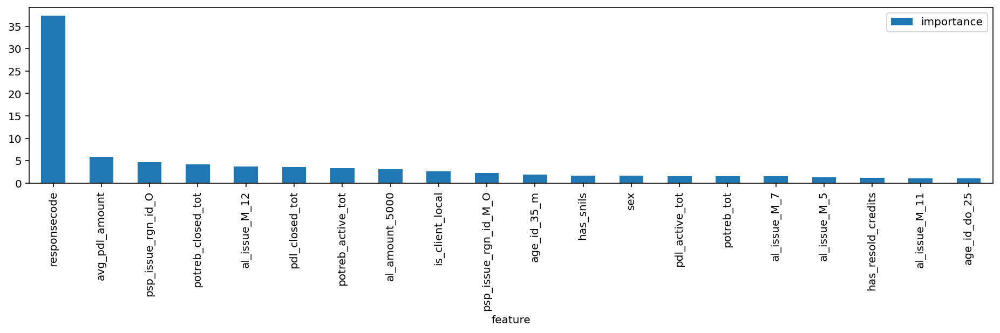

In [104]:
importances = pd.DataFrame({'feature':features_test.columns,'importance':np.round(cat.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.head(20).plot.bar(figsize=(16, 3));

0.794367627370097
gini_score: 0.5887352547401941


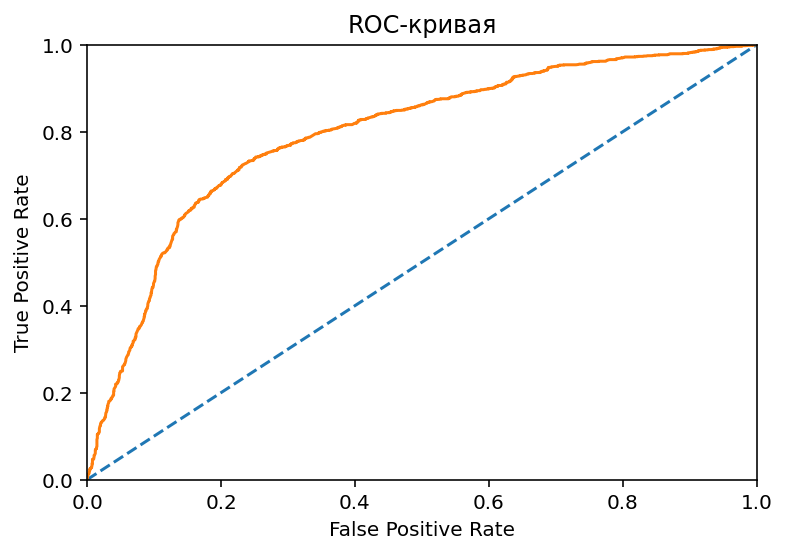

In [105]:
probabilities_test = cat.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = cat.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print(roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### XGBClassifier

In [106]:
gsc_xgb = GridSearchCV(
            estimator=xgb.XGBClassifier(random_state = 12345),
            param_grid={"learning_rate" : (0.005, 0.025, 0.05, 0.1),
                        "max_depth" : [3, 4, 5],
                        "min_child_weight" : [0.1, 0.3, 0.5, 0.7, 0.9],
                        "colsample_bytree" :[0.1, 0.3, 0.5, 0.7, 0.9, 1.2],
                       },
            cv=3, verbose=0, n_jobs=-1)

grid_result_xgb = gsc_xgb.fit(features_train, target_train)

best_xgb = grid_result_xgb.best_estimator_
print(f'Лучшие параметры модели {grid_result_xgb.best_params_}')

[16:09:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Лучшие параметры модели {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 0.1}


In [107]:
xgb_model = xgb.XGBClassifier(max_depth = 4,
                             learning_rate = 0.1,
                             colsample_bytree  = 0.9,
                             random_state=12345,
                             min_child_weight = 0.1)

xgb_model.fit(features_train, target_train)
pred_test = xgb_model.predict(features_test)

[16:09:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


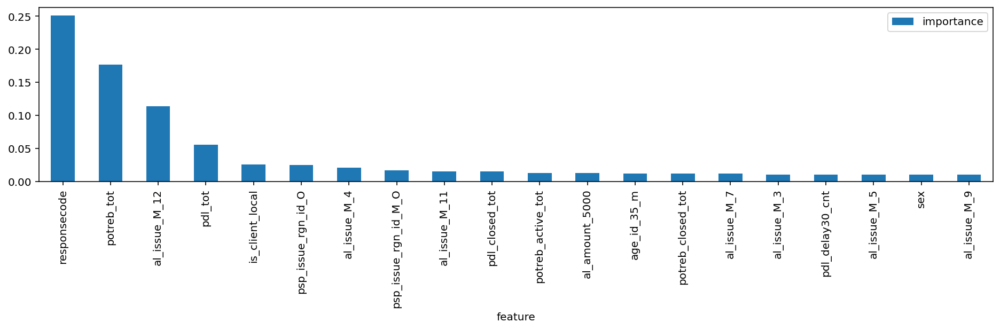

In [108]:
importances = pd.DataFrame({'feature':features_test.columns,'importance':np.round(xgb_model.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.head(20).plot.bar(figsize=(16, 3));

0.7946277048053263
gini_score: 0.5892554096106526


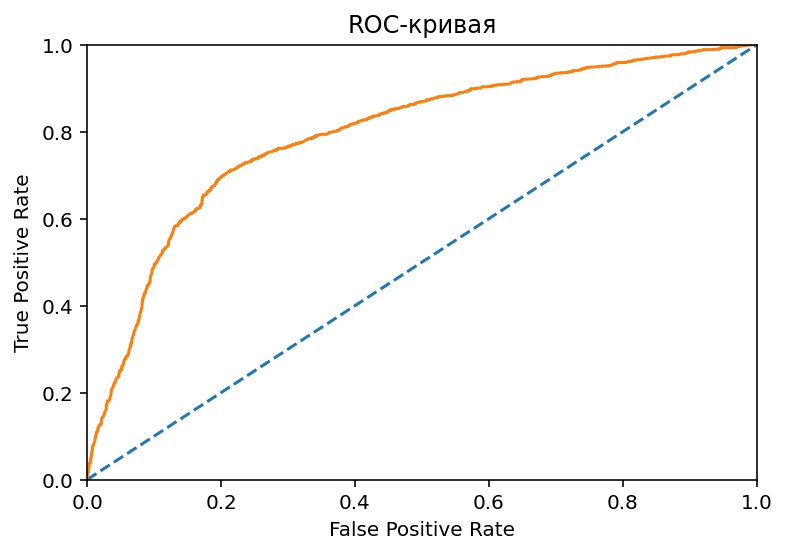

In [109]:
probabilities_test = xgb_model.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = xgb_model.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print(roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### LGBMClassifier

In [110]:
model_lgb = GridSearchCV(estimator=lgb.LGBMClassifier(objective="binary"),
                         
                   param_grid={"learning_rate" : (0.005, 0.01, 0.05),
                               'n_estimators' : range(500,5000,250),
                               'max_depth' : (3,4,5)},
                         
                         cv = 5, verbose = 0, n_jobs= -1)

grid_result = model_lgb.fit(features_train, target_train)
print(f'Лучшие параметры модели {grid_result.best_params_}')
best_lgb = grid_result.best_estimator_

pred_test = model_lgb.predict(features_test)

Лучшие параметры модели {'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 1000}


In [111]:
model_lgb = lgb.LGBMClassifier(objective='binary', n_estimators = 900, learning_rate = 0.01, max_depth = 4)
model_lgb.fit(features_train, target_train)
pred_test = model_lgb.predict(features_test)

0.7955103850050658
gini_score: 0.5910207700101315


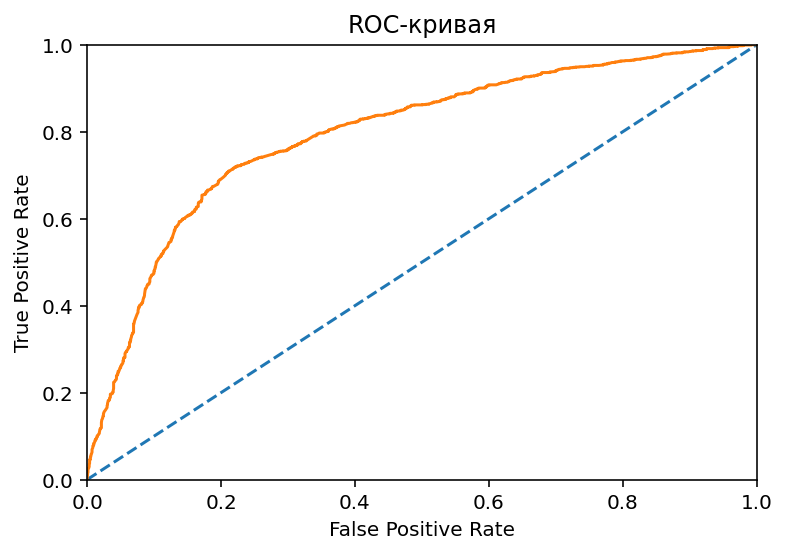

In [112]:
probabilities_test = model_lgb.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = model_lgb.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print(roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

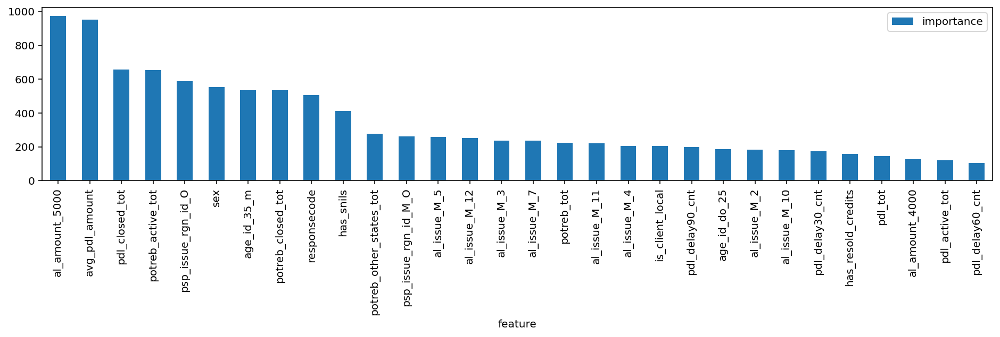

In [113]:
importances = pd.DataFrame({'feature':features_test.columns,'importance':np.round(model_lgb.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.head(30).plot.bar(figsize=(16, 3));

#### сохраним самые важные 40 признаков. Чтобы потом на них обучить модель.

In [114]:
spis = list(importances.reset_index()['feature'].head(40))

In [115]:
spis

['al_amount_5000',
 'avg_pdl_amount',
 'pdl_closed_tot',
 'potreb_active_tot',
 'psp_issue_rgn_id_O',
 'sex',
 'age_id_35_m',
 'potreb_closed_tot',
 'responsecode',
 'has_snils',
 'potreb_other_states_tot',
 'psp_issue_rgn_id_M_O',
 'al_issue_M_5',
 'al_issue_M_12',
 'al_issue_M_3',
 'al_issue_M_7',
 'potreb_tot',
 'al_issue_M_11',
 'al_issue_M_4',
 'is_client_local',
 'pdl_delay90_cnt',
 'age_id_do_25',
 'al_issue_M_2',
 'al_issue_M_10',
 'pdl_delay30_cnt',
 'has_resold_credits',
 'pdl_tot',
 'al_amount_4000',
 'pdl_active_tot',
 'pdl_delay60_cnt',
 'al_issue_M_8',
 'pdl_own_share',
 'pdl_other_states_tot',
 'cred_line_state',
 'official_count',
 'al_issue_M_9',
 'al_issue_M_6',
 'pdl_delay5_cnt',
 'pdl_delay_more_cnt',
 'pdl_delay5_avg']

### LogisticRegression

In [116]:
lr = LogisticRegression(random_state = 12345 ,class_weight='balanced')
parameters_lr = {'C': [0.1, 0.5, 0.7, 1.0], 
                 'penalty':['l1', 'l2', 'elasticnet'], 
                 'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}
search_lr = GridSearchCV(lr, parameters_lr, cv=5)
search_lr.fit(features_train, target_train)
best_lr = search_lr.best_estimator_
predict_lr = best_lr.predict(features_test)
print(best_lr)

LogisticRegression(class_weight='balanced', random_state=12345,
                   solver='newton-cg')


0.7910517531480677
gini_score: 0.5821035062961355


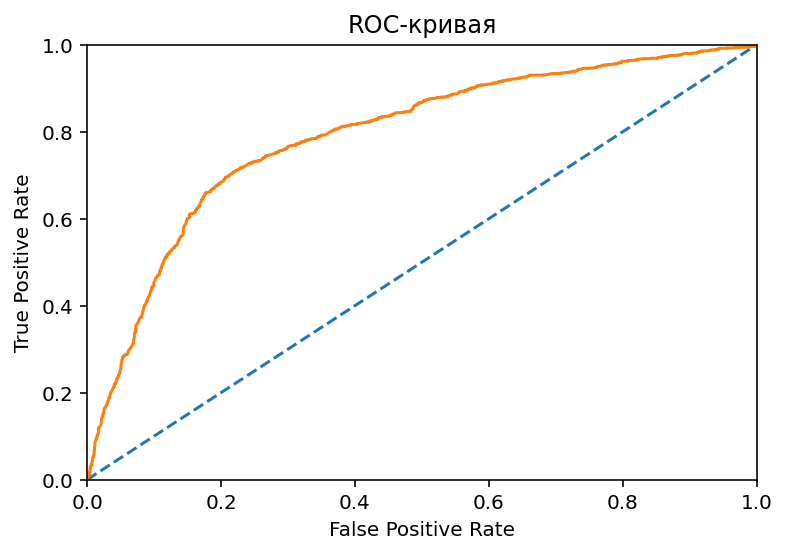

In [117]:
probabilities_test = best_lr.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = best_lr.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print(roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### MLPClassifier

In [118]:
model_mlp = MLPClassifier(random_state = 12345, max_iter = 30000)
parameters_mlp = {'activation':['logistic', 'tanh', 'relu'],
                  'hidden_layer_sizes' : [[3,3,3],[5,5,5],[7,7,7],[9,9,9],[15,15,15]],
                  'solver': ['adam', 'sgd'],  
                  'learning_rate_init':[0.001, 0.01, 0.05, 0.1], 
                  'learning_rate': ['constant', 'invscaling', 'adaptive']}
search_mlp = GridSearchCV(model_mlp, parameters_mlp, cv = 5, n_jobs = -1)
search_mlp.fit(features_train, target_train)
best_mlp = search_mlp.best_estimator_
predict_mlp = best_mlp.predict(features_test)

In [119]:
best_mlp

MLPClassifier(activation='logistic', hidden_layer_sizes=[9, 9, 9],
              learning_rate='adaptive', learning_rate_init=0.1, max_iter=30000,
              random_state=12345, solver='sgd')

0.7854775021710811
gini_score: 0.5709550043421623


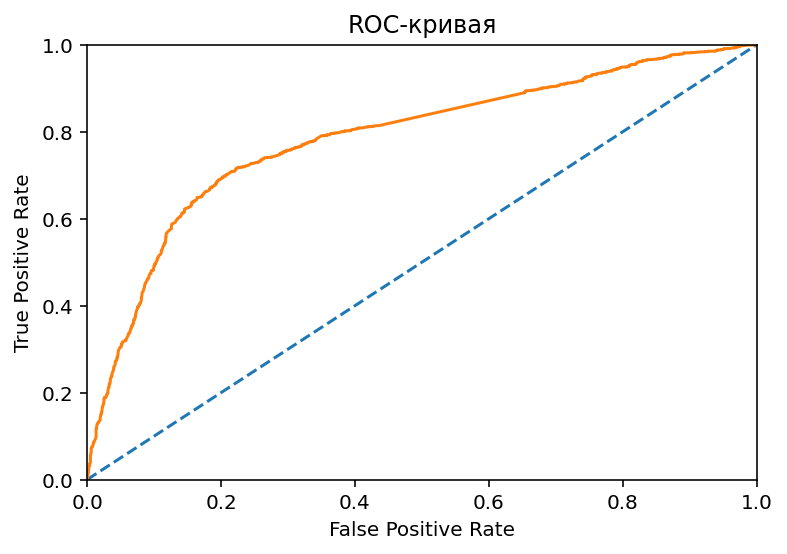

In [120]:
probabilities_test = best_mlp.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = best_mlp.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print(roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### RandomForestClassifier

In [121]:
clf_rf_cv=RandomForestClassifier(random_state=12345,class_weight='balanced')
parametrs={
    'n_estimators':range(100, 3100, 300),
    'max_depth':range(2,5),
}
gr=GridSearchCV(clf_rf_cv,parametrs, cv=5)
gr.fit(features_train, target_train)
best_RFC = gr.best_estimator_

predictions_test = gr.predict(features_test)
print(gr.best_params_)

{'max_depth': 4, 'n_estimators': 2500}


0.7720326295411781
gini_score: 0.5440652590823563


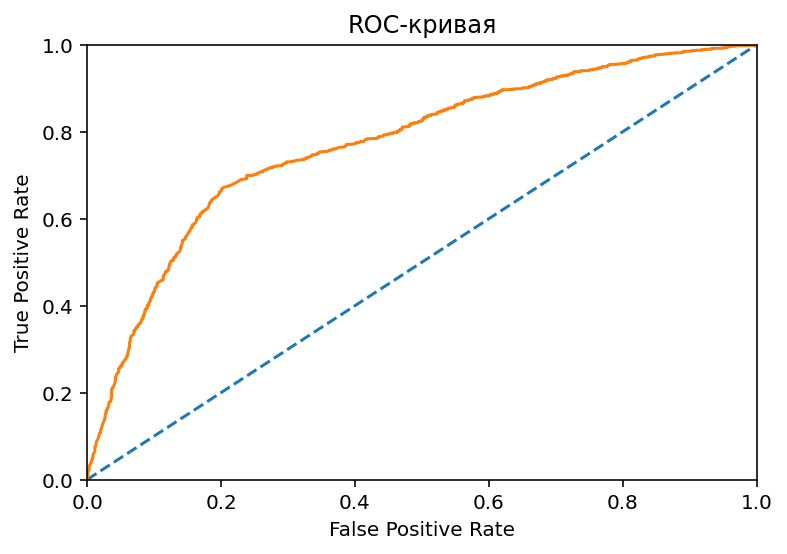

In [122]:
probabilities_test = gr.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = gr.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print(roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### VotingClassifier

In [123]:
eclf = VotingClassifier(estimators=[('mlp', best_mlp),
                                    ('lr', best_lr),
                                    ('cat', best_cat),
                                    ('RFC', best_RFC),
                                    ('xgb', best_xgb),
                                    ('lgb', best_lgb)], voting='soft')
eclf.fit(features_train, target_train)
predict_eclf = eclf.predict(features_test)

0:	learn: 0.6928450	total: 1.3ms	remaining: 1m 5s
1:	learn: 0.6925462	total: 2.5ms	remaining: 1m 2s
2:	learn: 0.6922336	total: 3.58ms	remaining: 59.7s
3:	learn: 0.6919195	total: 4.69ms	remaining: 58.7s
4:	learn: 0.6916570	total: 5.92ms	remaining: 59.2s
5:	learn: 0.6913309	total: 7.04ms	remaining: 58.7s
6:	learn: 0.6910358	total: 8.28ms	remaining: 59.1s
7:	learn: 0.6907374	total: 9.48ms	remaining: 59.3s
8:	learn: 0.6904369	total: 10.7ms	remaining: 59.3s
9:	learn: 0.6901767	total: 12ms	remaining: 59.7s
10:	learn: 0.6898821	total: 13.2ms	remaining: 59.9s
11:	learn: 0.6895880	total: 14.4ms	remaining: 1m
12:	learn: 0.6892881	total: 15.6ms	remaining: 1m
13:	learn: 0.6889951	total: 16.8ms	remaining: 1m
14:	learn: 0.6886966	total: 18.1ms	remaining: 1m
15:	learn: 0.6883992	total: 19.3ms	remaining: 1m
16:	learn: 0.6881032	total: 20.6ms	remaining: 1m
17:	learn: 0.6878237	total: 21.8ms	remaining: 1m
18:	learn: 0.6875389	total: 23ms	remaining: 1m
19:	learn: 0.6872501	total: 24.3ms	remaining: 1m
20:

284:	learn: 0.6280529	total: 336ms	remaining: 58.5s
285:	learn: 0.6278745	total: 337ms	remaining: 58.5s
286:	learn: 0.6277129	total: 338ms	remaining: 58.5s
287:	learn: 0.6275408	total: 339ms	remaining: 58.5s
288:	learn: 0.6273642	total: 340ms	remaining: 58.6s
289:	learn: 0.6271971	total: 342ms	remaining: 58.6s
290:	learn: 0.6270318	total: 343ms	remaining: 58.6s
291:	learn: 0.6268560	total: 344ms	remaining: 58.5s
292:	learn: 0.6266906	total: 345ms	remaining: 58.5s
293:	learn: 0.6265228	total: 346ms	remaining: 58.5s
294:	learn: 0.6263613	total: 348ms	remaining: 58.6s
295:	learn: 0.6261968	total: 349ms	remaining: 58.6s
296:	learn: 0.6260342	total: 350ms	remaining: 58.6s
297:	learn: 0.6258581	total: 351ms	remaining: 58.5s
298:	learn: 0.6256829	total: 352ms	remaining: 58.5s
299:	learn: 0.6255440	total: 353ms	remaining: 58.5s
300:	learn: 0.6253761	total: 354ms	remaining: 58.5s
301:	learn: 0.6252166	total: 356ms	remaining: 58.5s
302:	learn: 0.6250432	total: 357ms	remaining: 58.5s
303:	learn: 

566:	learn: 0.5920240	total: 672ms	remaining: 58.6s
567:	learn: 0.5919404	total: 673ms	remaining: 58.6s
568:	learn: 0.5918485	total: 674ms	remaining: 58.6s
569:	learn: 0.5917512	total: 676ms	remaining: 58.6s
570:	learn: 0.5916736	total: 677ms	remaining: 58.6s
571:	learn: 0.5915731	total: 678ms	remaining: 58.6s
572:	learn: 0.5914776	total: 679ms	remaining: 58.6s
573:	learn: 0.5913736	total: 680ms	remaining: 58.6s
574:	learn: 0.5912704	total: 682ms	remaining: 58.6s
575:	learn: 0.5911772	total: 683ms	remaining: 58.6s
576:	learn: 0.5910954	total: 684ms	remaining: 58.6s
577:	learn: 0.5910189	total: 685ms	remaining: 58.6s
578:	learn: 0.5909203	total: 686ms	remaining: 58.6s
579:	learn: 0.5908350	total: 688ms	remaining: 58.6s
580:	learn: 0.5907452	total: 689ms	remaining: 58.6s
581:	learn: 0.5906555	total: 690ms	remaining: 58.6s
582:	learn: 0.5905555	total: 691ms	remaining: 58.6s
583:	learn: 0.5904553	total: 692ms	remaining: 58.6s
584:	learn: 0.5903612	total: 694ms	remaining: 58.6s
585:	learn: 

755:	learn: 0.5767681	total: 1.04s	remaining: 1m 7s
756:	learn: 0.5766998	total: 1.04s	remaining: 1m 7s
757:	learn: 0.5766319	total: 1.04s	remaining: 1m 7s
758:	learn: 0.5765635	total: 1.05s	remaining: 1m 7s
759:	learn: 0.5765008	total: 1.05s	remaining: 1m 7s
760:	learn: 0.5764235	total: 1.05s	remaining: 1m 7s
761:	learn: 0.5763600	total: 1.05s	remaining: 1m 7s
762:	learn: 0.5762934	total: 1.05s	remaining: 1m 7s
763:	learn: 0.5762424	total: 1.05s	remaining: 1m 7s
764:	learn: 0.5761689	total: 1.05s	remaining: 1m 7s
765:	learn: 0.5761033	total: 1.05s	remaining: 1m 7s
766:	learn: 0.5760487	total: 1.06s	remaining: 1m 7s
767:	learn: 0.5759766	total: 1.06s	remaining: 1m 7s
768:	learn: 0.5759133	total: 1.06s	remaining: 1m 7s
769:	learn: 0.5758380	total: 1.06s	remaining: 1m 7s
770:	learn: 0.5757634	total: 1.06s	remaining: 1m 7s
771:	learn: 0.5756911	total: 1.06s	remaining: 1m 7s
772:	learn: 0.5756291	total: 1.06s	remaining: 1m 7s
773:	learn: 0.5755608	total: 1.06s	remaining: 1m 7s
774:	learn: 

1032:	learn: 0.5619974	total: 1.37s	remaining: 1m 5s
1033:	learn: 0.5619560	total: 1.37s	remaining: 1m 5s
1034:	learn: 0.5619164	total: 1.38s	remaining: 1m 5s
1035:	learn: 0.5618765	total: 1.38s	remaining: 1m 5s
1036:	learn: 0.5618305	total: 1.38s	remaining: 1m 5s
1037:	learn: 0.5617880	total: 1.38s	remaining: 1m 5s
1038:	learn: 0.5617432	total: 1.38s	remaining: 1m 5s
1039:	learn: 0.5616995	total: 1.38s	remaining: 1m 5s
1040:	learn: 0.5616605	total: 1.38s	remaining: 1m 5s
1041:	learn: 0.5616186	total: 1.38s	remaining: 1m 5s
1042:	learn: 0.5615797	total: 1.39s	remaining: 1m 5s
1043:	learn: 0.5615355	total: 1.39s	remaining: 1m 5s
1044:	learn: 0.5614936	total: 1.39s	remaining: 1m 5s
1045:	learn: 0.5614658	total: 1.39s	remaining: 1m 5s
1046:	learn: 0.5614209	total: 1.39s	remaining: 1m 4s
1047:	learn: 0.5613822	total: 1.39s	remaining: 1m 4s
1048:	learn: 0.5613385	total: 1.39s	remaining: 1m 4s
1049:	learn: 0.5612954	total: 1.39s	remaining: 1m 4s
1050:	learn: 0.5612558	total: 1.39s	remaining:

1327:	learn: 0.5523052	total: 1.72s	remaining: 1m 3s
1328:	learn: 0.5522824	total: 1.72s	remaining: 1m 3s
1329:	learn: 0.5522604	total: 1.73s	remaining: 1m 3s
1330:	learn: 0.5522316	total: 1.73s	remaining: 1m 3s
1331:	learn: 0.5522117	total: 1.73s	remaining: 1m 3s
1332:	learn: 0.5521838	total: 1.73s	remaining: 1m 3s
1333:	learn: 0.5521558	total: 1.73s	remaining: 1m 3s
1334:	learn: 0.5521253	total: 1.73s	remaining: 1m 3s
1335:	learn: 0.5521052	total: 1.73s	remaining: 1m 3s
1336:	learn: 0.5520768	total: 1.73s	remaining: 1m 3s
1337:	learn: 0.5520499	total: 1.74s	remaining: 1m 3s
1338:	learn: 0.5520232	total: 1.74s	remaining: 1m 3s
1339:	learn: 0.5519978	total: 1.74s	remaining: 1m 3s
1340:	learn: 0.5519662	total: 1.74s	remaining: 1m 3s
1341:	learn: 0.5519382	total: 1.74s	remaining: 1m 3s
1342:	learn: 0.5519069	total: 1.74s	remaining: 1m 3s
1343:	learn: 0.5518841	total: 1.74s	remaining: 1m 3s
1344:	learn: 0.5518581	total: 1.74s	remaining: 1m 3s
1345:	learn: 0.5518338	total: 1.75s	remaining:

1608:	learn: 0.5461906	total: 2.06s	remaining: 1m 1s
1609:	learn: 0.5461720	total: 2.06s	remaining: 1m 1s
1610:	learn: 0.5461530	total: 2.06s	remaining: 1m 1s
1611:	learn: 0.5461359	total: 2.06s	remaining: 1m 1s
1612:	learn: 0.5461240	total: 2.07s	remaining: 1m 1s
1613:	learn: 0.5461094	total: 2.07s	remaining: 1m 1s
1614:	learn: 0.5460921	total: 2.07s	remaining: 1m 1s
1615:	learn: 0.5460755	total: 2.07s	remaining: 1m 1s
1616:	learn: 0.5460567	total: 2.07s	remaining: 1m 1s
1617:	learn: 0.5460414	total: 2.07s	remaining: 1m 1s
1618:	learn: 0.5460205	total: 2.07s	remaining: 1m 1s
1619:	learn: 0.5460031	total: 2.07s	remaining: 1m 1s
1620:	learn: 0.5459809	total: 2.08s	remaining: 1m 1s
1621:	learn: 0.5459615	total: 2.08s	remaining: 1m 1s
1622:	learn: 0.5459447	total: 2.08s	remaining: 1m 1s
1623:	learn: 0.5459265	total: 2.08s	remaining: 1m 1s
1624:	learn: 0.5459106	total: 2.08s	remaining: 1m 1s
1625:	learn: 0.5458898	total: 2.08s	remaining: 1m 1s
1626:	learn: 0.5458685	total: 2.08s	remaining:

1877:	learn: 0.5421983	total: 2.4s	remaining: 1m 1s
1878:	learn: 0.5421850	total: 2.4s	remaining: 1m 1s
1879:	learn: 0.5421695	total: 2.4s	remaining: 1m 1s
1880:	learn: 0.5421570	total: 2.4s	remaining: 1m 1s
1881:	learn: 0.5421435	total: 2.4s	remaining: 1m 1s
1882:	learn: 0.5421273	total: 2.4s	remaining: 1m 1s
1883:	learn: 0.5421178	total: 2.4s	remaining: 1m 1s
1884:	learn: 0.5421043	total: 2.4s	remaining: 1m 1s
1885:	learn: 0.5420930	total: 2.4s	remaining: 1m 1s
1886:	learn: 0.5420795	total: 2.41s	remaining: 1m 1s
1887:	learn: 0.5420643	total: 2.41s	remaining: 1m 1s
1888:	learn: 0.5420516	total: 2.41s	remaining: 1m 1s
1889:	learn: 0.5420420	total: 2.41s	remaining: 1m 1s
1890:	learn: 0.5420309	total: 2.41s	remaining: 1m 1s
1891:	learn: 0.5420136	total: 2.41s	remaining: 1m 1s
1892:	learn: 0.5419990	total: 2.41s	remaining: 1m 1s
1893:	learn: 0.5419853	total: 2.42s	remaining: 1m 1s
1894:	learn: 0.5419698	total: 2.42s	remaining: 1m 1s
1895:	learn: 0.5419580	total: 2.42s	remaining: 1m 1s
18

2158:	learn: 0.5390058	total: 2.74s	remaining: 1m
2159:	learn: 0.5389944	total: 2.74s	remaining: 1m
2160:	learn: 0.5389857	total: 2.74s	remaining: 1m
2161:	learn: 0.5389756	total: 2.74s	remaining: 1m
2162:	learn: 0.5389630	total: 2.74s	remaining: 1m
2163:	learn: 0.5389549	total: 2.74s	remaining: 1m
2164:	learn: 0.5389368	total: 2.74s	remaining: 1m
2165:	learn: 0.5389240	total: 2.74s	remaining: 1m
2166:	learn: 0.5389171	total: 2.75s	remaining: 1m
2167:	learn: 0.5389072	total: 2.75s	remaining: 1m
2168:	learn: 0.5388949	total: 2.75s	remaining: 1m
2169:	learn: 0.5388871	total: 2.75s	remaining: 1m
2170:	learn: 0.5388783	total: 2.75s	remaining: 1m
2171:	learn: 0.5388715	total: 2.75s	remaining: 1m
2172:	learn: 0.5388574	total: 2.75s	remaining: 1m
2173:	learn: 0.5388459	total: 2.75s	remaining: 1m
2174:	learn: 0.5388359	total: 2.75s	remaining: 1m
2175:	learn: 0.5388239	total: 2.76s	remaining: 1m
2176:	learn: 0.5388126	total: 2.76s	remaining: 1m
2177:	learn: 0.5388040	total: 2.76s	remaining: 1m


2453:	learn: 0.5363742	total: 3.09s	remaining: 59.8s
2454:	learn: 0.5363682	total: 3.09s	remaining: 59.8s
2455:	learn: 0.5363575	total: 3.09s	remaining: 59.8s
2456:	learn: 0.5363475	total: 3.09s	remaining: 59.8s
2457:	learn: 0.5363418	total: 3.09s	remaining: 59.8s
2458:	learn: 0.5363354	total: 3.09s	remaining: 59.8s
2459:	learn: 0.5363283	total: 3.1s	remaining: 59.8s
2460:	learn: 0.5363215	total: 3.1s	remaining: 59.8s
2461:	learn: 0.5363149	total: 3.1s	remaining: 59.8s
2462:	learn: 0.5363084	total: 3.1s	remaining: 59.8s
2463:	learn: 0.5362985	total: 3.1s	remaining: 59.8s
2464:	learn: 0.5362911	total: 3.1s	remaining: 59.8s
2465:	learn: 0.5362821	total: 3.1s	remaining: 59.8s
2466:	learn: 0.5362729	total: 3.1s	remaining: 59.8s
2467:	learn: 0.5362693	total: 3.1s	remaining: 59.8s
2468:	learn: 0.5362630	total: 3.11s	remaining: 59.8s
2469:	learn: 0.5362571	total: 3.11s	remaining: 59.8s
2470:	learn: 0.5362466	total: 3.11s	remaining: 59.8s
2471:	learn: 0.5362366	total: 3.11s	remaining: 59.8s
24

2731:	learn: 0.5343589	total: 3.43s	remaining: 59.3s
2732:	learn: 0.5343529	total: 3.43s	remaining: 59.3s
2733:	learn: 0.5343446	total: 3.43s	remaining: 59.3s
2734:	learn: 0.5343380	total: 3.43s	remaining: 59.3s
2735:	learn: 0.5343316	total: 3.43s	remaining: 59.3s
2736:	learn: 0.5343233	total: 3.43s	remaining: 59.3s
2737:	learn: 0.5343155	total: 3.43s	remaining: 59.3s
2738:	learn: 0.5343094	total: 3.44s	remaining: 59.3s
2739:	learn: 0.5343002	total: 3.44s	remaining: 59.3s
2740:	learn: 0.5342938	total: 3.44s	remaining: 59.3s
2741:	learn: 0.5342891	total: 3.44s	remaining: 59.3s
2742:	learn: 0.5342827	total: 3.44s	remaining: 59.3s
2743:	learn: 0.5342790	total: 3.44s	remaining: 59.3s
2744:	learn: 0.5342727	total: 3.44s	remaining: 59.3s
2745:	learn: 0.5342688	total: 3.44s	remaining: 59.3s
2746:	learn: 0.5342643	total: 3.44s	remaining: 59.3s
2747:	learn: 0.5342562	total: 3.45s	remaining: 59.3s
2748:	learn: 0.5342491	total: 3.45s	remaining: 59.3s
2749:	learn: 0.5342408	total: 3.45s	remaining:

3006:	learn: 0.5326530	total: 3.76s	remaining: 58.8s
3007:	learn: 0.5326496	total: 3.76s	remaining: 58.8s
3008:	learn: 0.5326432	total: 3.77s	remaining: 58.8s
3009:	learn: 0.5326224	total: 3.77s	remaining: 58.8s
3010:	learn: 0.5326180	total: 3.77s	remaining: 58.8s
3011:	learn: 0.5326114	total: 3.77s	remaining: 58.8s
3012:	learn: 0.5326063	total: 3.77s	remaining: 58.8s
3013:	learn: 0.5326007	total: 3.77s	remaining: 58.8s
3014:	learn: 0.5325946	total: 3.77s	remaining: 58.8s
3015:	learn: 0.5325889	total: 3.77s	remaining: 58.8s
3016:	learn: 0.5325851	total: 3.77s	remaining: 58.8s
3017:	learn: 0.5325811	total: 3.78s	remaining: 58.8s
3018:	learn: 0.5325756	total: 3.78s	remaining: 58.8s
3019:	learn: 0.5325686	total: 3.78s	remaining: 58.8s
3020:	learn: 0.5325601	total: 3.78s	remaining: 58.8s
3021:	learn: 0.5325524	total: 3.78s	remaining: 58.8s
3022:	learn: 0.5325451	total: 3.78s	remaining: 58.8s
3023:	learn: 0.5325370	total: 3.78s	remaining: 58.8s
3024:	learn: 0.5325319	total: 3.79s	remaining:

3288:	learn: 0.5310667	total: 4.11s	remaining: 58.4s
3289:	learn: 0.5310607	total: 4.11s	remaining: 58.4s
3290:	learn: 0.5310557	total: 4.11s	remaining: 58.4s
3291:	learn: 0.5310511	total: 4.11s	remaining: 58.4s
3292:	learn: 0.5310445	total: 4.11s	remaining: 58.4s
3293:	learn: 0.5310410	total: 4.12s	remaining: 58.4s
3294:	learn: 0.5310364	total: 4.12s	remaining: 58.4s
3295:	learn: 0.5310310	total: 4.12s	remaining: 58.4s
3296:	learn: 0.5310242	total: 4.12s	remaining: 58.4s
3297:	learn: 0.5310202	total: 4.12s	remaining: 58.4s
3298:	learn: 0.5310173	total: 4.12s	remaining: 58.4s
3299:	learn: 0.5310128	total: 4.12s	remaining: 58.4s
3300:	learn: 0.5310047	total: 4.12s	remaining: 58.4s
3301:	learn: 0.5310004	total: 4.13s	remaining: 58.4s
3302:	learn: 0.5309963	total: 4.13s	remaining: 58.3s
3303:	learn: 0.5309920	total: 4.13s	remaining: 58.3s
3304:	learn: 0.5309875	total: 4.13s	remaining: 58.3s
3305:	learn: 0.5309837	total: 4.13s	remaining: 58.3s
3306:	learn: 0.5309804	total: 4.13s	remaining:

3564:	learn: 0.5296981	total: 4.45s	remaining: 57.9s
3565:	learn: 0.5296932	total: 4.45s	remaining: 57.9s
3566:	learn: 0.5296856	total: 4.45s	remaining: 57.9s
3567:	learn: 0.5296807	total: 4.45s	remaining: 57.9s
3568:	learn: 0.5296738	total: 4.45s	remaining: 57.9s
3569:	learn: 0.5296678	total: 4.45s	remaining: 57.9s
3570:	learn: 0.5296623	total: 4.46s	remaining: 57.9s
3571:	learn: 0.5296600	total: 4.46s	remaining: 57.9s
3572:	learn: 0.5296551	total: 4.46s	remaining: 57.9s
3573:	learn: 0.5296520	total: 4.46s	remaining: 57.9s
3574:	learn: 0.5296479	total: 4.46s	remaining: 57.9s
3575:	learn: 0.5296420	total: 4.46s	remaining: 57.9s
3576:	learn: 0.5296369	total: 4.46s	remaining: 57.9s
3577:	learn: 0.5296315	total: 4.46s	remaining: 57.9s
3578:	learn: 0.5296263	total: 4.46s	remaining: 57.9s
3579:	learn: 0.5296224	total: 4.47s	remaining: 57.9s
3580:	learn: 0.5296188	total: 4.47s	remaining: 57.9s
3581:	learn: 0.5296129	total: 4.47s	remaining: 57.9s
3582:	learn: 0.5296065	total: 4.47s	remaining:

3852:	learn: 0.5283949	total: 4.8s	remaining: 57.5s
3853:	learn: 0.5283872	total: 4.8s	remaining: 57.5s
3854:	learn: 0.5283835	total: 4.8s	remaining: 57.5s
3855:	learn: 0.5283813	total: 4.8s	remaining: 57.5s
3856:	learn: 0.5283739	total: 4.81s	remaining: 57.5s
3857:	learn: 0.5283689	total: 4.81s	remaining: 57.5s
3858:	learn: 0.5283623	total: 4.81s	remaining: 57.5s
3859:	learn: 0.5283602	total: 4.81s	remaining: 57.5s
3860:	learn: 0.5283560	total: 4.81s	remaining: 57.5s
3861:	learn: 0.5283540	total: 4.81s	remaining: 57.5s
3862:	learn: 0.5283470	total: 4.81s	remaining: 57.5s
3863:	learn: 0.5283453	total: 4.82s	remaining: 57.5s
3864:	learn: 0.5283418	total: 4.82s	remaining: 57.5s
3865:	learn: 0.5283371	total: 4.82s	remaining: 57.5s
3866:	learn: 0.5283338	total: 4.82s	remaining: 57.5s
3867:	learn: 0.5283288	total: 4.82s	remaining: 57.5s
3868:	learn: 0.5283265	total: 4.82s	remaining: 57.5s
3869:	learn: 0.5283222	total: 4.82s	remaining: 57.5s
3870:	learn: 0.5283183	total: 4.82s	remaining: 57.

4127:	learn: 0.5272281	total: 5.14s	remaining: 57.1s
4128:	learn: 0.5272261	total: 5.14s	remaining: 57.1s
4129:	learn: 0.5272232	total: 5.14s	remaining: 57.1s
4130:	learn: 0.5272183	total: 5.14s	remaining: 57.1s
4131:	learn: 0.5272144	total: 5.15s	remaining: 57.1s
4132:	learn: 0.5272108	total: 5.15s	remaining: 57.1s
4133:	learn: 0.5272064	total: 5.15s	remaining: 57.1s
4134:	learn: 0.5272024	total: 5.15s	remaining: 57.1s
4135:	learn: 0.5271982	total: 5.15s	remaining: 57.1s
4136:	learn: 0.5271922	total: 5.15s	remaining: 57.1s
4137:	learn: 0.5271785	total: 5.15s	remaining: 57.1s
4138:	learn: 0.5271755	total: 5.16s	remaining: 57.1s
4139:	learn: 0.5271698	total: 5.16s	remaining: 57.1s
4140:	learn: 0.5271652	total: 5.16s	remaining: 57.1s
4141:	learn: 0.5271608	total: 5.16s	remaining: 57.1s
4142:	learn: 0.5271546	total: 5.16s	remaining: 57.1s
4143:	learn: 0.5271517	total: 5.16s	remaining: 57.1s
4144:	learn: 0.5271484	total: 5.16s	remaining: 57.1s
4145:	learn: 0.5271462	total: 5.16s	remaining:

4393:	learn: 0.5261714	total: 5.48s	remaining: 56.9s
4394:	learn: 0.5261678	total: 5.48s	remaining: 56.9s
4395:	learn: 0.5261639	total: 5.49s	remaining: 56.9s
4396:	learn: 0.5261621	total: 5.49s	remaining: 56.9s
4397:	learn: 0.5261582	total: 5.49s	remaining: 56.9s
4398:	learn: 0.5261546	total: 5.49s	remaining: 56.9s
4399:	learn: 0.5261514	total: 5.49s	remaining: 56.9s
4400:	learn: 0.5261461	total: 5.49s	remaining: 56.9s
4401:	learn: 0.5261421	total: 5.49s	remaining: 56.9s
4402:	learn: 0.5261377	total: 5.5s	remaining: 56.9s
4403:	learn: 0.5261346	total: 5.5s	remaining: 56.9s
4404:	learn: 0.5261301	total: 5.5s	remaining: 56.9s
4405:	learn: 0.5261269	total: 5.5s	remaining: 56.9s
4406:	learn: 0.5261214	total: 5.5s	remaining: 56.9s
4407:	learn: 0.5261178	total: 5.5s	remaining: 56.9s
4408:	learn: 0.5261156	total: 5.5s	remaining: 56.9s
4409:	learn: 0.5261113	total: 5.5s	remaining: 56.9s
4410:	learn: 0.5261047	total: 5.5s	remaining: 56.9s
4411:	learn: 0.5261006	total: 5.51s	remaining: 56.9s
44

4665:	learn: 0.5251506	total: 5.82s	remaining: 56.6s
4666:	learn: 0.5251479	total: 5.82s	remaining: 56.6s
4667:	learn: 0.5251465	total: 5.82s	remaining: 56.6s
4668:	learn: 0.5251424	total: 5.82s	remaining: 56.5s
4669:	learn: 0.5251394	total: 5.83s	remaining: 56.5s
4670:	learn: 0.5251370	total: 5.83s	remaining: 56.5s
4671:	learn: 0.5251347	total: 5.83s	remaining: 56.5s
4672:	learn: 0.5251328	total: 5.83s	remaining: 56.5s
4673:	learn: 0.5251302	total: 5.83s	remaining: 56.5s
4674:	learn: 0.5251277	total: 5.83s	remaining: 56.5s
4675:	learn: 0.5251233	total: 5.83s	remaining: 56.5s
4676:	learn: 0.5251207	total: 5.83s	remaining: 56.5s
4677:	learn: 0.5251185	total: 5.83s	remaining: 56.5s
4678:	learn: 0.5251162	total: 5.84s	remaining: 56.5s
4679:	learn: 0.5251126	total: 5.84s	remaining: 56.5s
4680:	learn: 0.5251070	total: 5.84s	remaining: 56.5s
4681:	learn: 0.5250995	total: 5.84s	remaining: 56.5s
4682:	learn: 0.5250973	total: 5.84s	remaining: 56.5s
4683:	learn: 0.5250929	total: 5.84s	remaining:

4940:	learn: 0.5241250	total: 6.16s	remaining: 56.2s
4941:	learn: 0.5241202	total: 6.16s	remaining: 56.2s
4942:	learn: 0.5241160	total: 6.16s	remaining: 56.2s
4943:	learn: 0.5241128	total: 6.16s	remaining: 56.2s
4944:	learn: 0.5241108	total: 6.17s	remaining: 56.2s
4945:	learn: 0.5241079	total: 6.17s	remaining: 56.2s
4946:	learn: 0.5241039	total: 6.17s	remaining: 56.2s
4947:	learn: 0.5240869	total: 6.17s	remaining: 56.2s
4948:	learn: 0.5240839	total: 6.17s	remaining: 56.2s
4949:	learn: 0.5240801	total: 6.17s	remaining: 56.2s
4950:	learn: 0.5240772	total: 6.17s	remaining: 56.2s
4951:	learn: 0.5240736	total: 6.17s	remaining: 56.2s
4952:	learn: 0.5240711	total: 6.17s	remaining: 56.2s
4953:	learn: 0.5240689	total: 6.18s	remaining: 56.2s
4954:	learn: 0.5240663	total: 6.18s	remaining: 56.2s
4955:	learn: 0.5240645	total: 6.18s	remaining: 56.2s
4956:	learn: 0.5240591	total: 6.18s	remaining: 56.2s
4957:	learn: 0.5240559	total: 6.18s	remaining: 56.2s
4958:	learn: 0.5240534	total: 6.18s	remaining:

5224:	learn: 0.5232093	total: 6.51s	remaining: 55.8s
5225:	learn: 0.5232074	total: 6.51s	remaining: 55.8s
5226:	learn: 0.5232037	total: 6.52s	remaining: 55.8s
5227:	learn: 0.5231991	total: 6.52s	remaining: 55.8s
5228:	learn: 0.5231973	total: 6.52s	remaining: 55.8s
5229:	learn: 0.5231952	total: 6.52s	remaining: 55.8s
5230:	learn: 0.5231930	total: 6.52s	remaining: 55.8s
5231:	learn: 0.5231898	total: 6.52s	remaining: 55.8s
5232:	learn: 0.5231864	total: 6.52s	remaining: 55.8s
5233:	learn: 0.5231843	total: 6.52s	remaining: 55.8s
5234:	learn: 0.5231807	total: 6.53s	remaining: 55.8s
5235:	learn: 0.5231767	total: 6.53s	remaining: 55.8s
5236:	learn: 0.5231738	total: 6.53s	remaining: 55.8s
5237:	learn: 0.5231717	total: 6.53s	remaining: 55.8s
5238:	learn: 0.5231659	total: 6.53s	remaining: 55.8s
5239:	learn: 0.5231639	total: 6.53s	remaining: 55.8s
5240:	learn: 0.5231613	total: 6.53s	remaining: 55.8s
5241:	learn: 0.5231573	total: 6.53s	remaining: 55.8s
5242:	learn: 0.5231525	total: 6.54s	remaining:

5505:	learn: 0.5222907	total: 6.86s	remaining: 55.4s
5506:	learn: 0.5222867	total: 6.86s	remaining: 55.4s
5507:	learn: 0.5222825	total: 6.86s	remaining: 55.4s
5508:	learn: 0.5222771	total: 6.86s	remaining: 55.4s
5509:	learn: 0.5222742	total: 6.87s	remaining: 55.4s
5510:	learn: 0.5222719	total: 6.87s	remaining: 55.4s
5511:	learn: 0.5222690	total: 6.87s	remaining: 55.4s
5512:	learn: 0.5222669	total: 6.87s	remaining: 55.4s
5513:	learn: 0.5222635	total: 6.87s	remaining: 55.4s
5514:	learn: 0.5222609	total: 6.87s	remaining: 55.4s
5515:	learn: 0.5222585	total: 6.87s	remaining: 55.4s
5516:	learn: 0.5222532	total: 6.87s	remaining: 55.4s
5517:	learn: 0.5222481	total: 6.88s	remaining: 55.4s
5518:	learn: 0.5222457	total: 6.88s	remaining: 55.4s
5519:	learn: 0.5222437	total: 6.88s	remaining: 55.4s
5520:	learn: 0.5222408	total: 6.88s	remaining: 55.4s
5521:	learn: 0.5222359	total: 6.88s	remaining: 55.4s
5522:	learn: 0.5222331	total: 6.88s	remaining: 55.4s
5523:	learn: 0.5222289	total: 6.88s	remaining:

5781:	learn: 0.5214190	total: 7.2s	remaining: 55.1s
5782:	learn: 0.5214170	total: 7.2s	remaining: 55.1s
5783:	learn: 0.5214135	total: 7.2s	remaining: 55.1s
5784:	learn: 0.5214107	total: 7.2s	remaining: 55.1s
5785:	learn: 0.5214068	total: 7.2s	remaining: 55.1s
5786:	learn: 0.5214045	total: 7.21s	remaining: 55.1s
5787:	learn: 0.5214031	total: 7.21s	remaining: 55.1s
5788:	learn: 0.5213992	total: 7.21s	remaining: 55.1s
5789:	learn: 0.5213956	total: 7.21s	remaining: 55.1s
5790:	learn: 0.5213927	total: 7.21s	remaining: 55s
5791:	learn: 0.5213878	total: 7.21s	remaining: 55s
5792:	learn: 0.5213849	total: 7.21s	remaining: 55s
5793:	learn: 0.5213831	total: 7.21s	remaining: 55s
5794:	learn: 0.5213800	total: 7.22s	remaining: 55s
5795:	learn: 0.5213774	total: 7.22s	remaining: 55s
5796:	learn: 0.5213735	total: 7.22s	remaining: 55s
5797:	learn: 0.5213716	total: 7.22s	remaining: 55s
5798:	learn: 0.5213675	total: 7.22s	remaining: 55s
5799:	learn: 0.5213650	total: 7.22s	remaining: 55s
5800:	learn: 0.521

6057:	learn: 0.5206004	total: 7.54s	remaining: 54.7s
6058:	learn: 0.5205987	total: 7.54s	remaining: 54.7s
6059:	learn: 0.5205935	total: 7.54s	remaining: 54.7s
6060:	learn: 0.5205918	total: 7.54s	remaining: 54.7s
6061:	learn: 0.5205883	total: 7.54s	remaining: 54.7s
6062:	learn: 0.5205869	total: 7.54s	remaining: 54.7s
6063:	learn: 0.5205846	total: 7.55s	remaining: 54.7s
6064:	learn: 0.5205820	total: 7.55s	remaining: 54.7s
6065:	learn: 0.5205801	total: 7.55s	remaining: 54.7s
6066:	learn: 0.5205743	total: 7.55s	remaining: 54.7s
6067:	learn: 0.5205704	total: 7.55s	remaining: 54.7s
6068:	learn: 0.5205680	total: 7.55s	remaining: 54.7s
6069:	learn: 0.5205662	total: 7.55s	remaining: 54.7s
6070:	learn: 0.5205630	total: 7.55s	remaining: 54.7s
6071:	learn: 0.5205581	total: 7.56s	remaining: 54.7s
6072:	learn: 0.5205562	total: 7.56s	remaining: 54.7s
6073:	learn: 0.5205544	total: 7.56s	remaining: 54.7s
6074:	learn: 0.5205507	total: 7.56s	remaining: 54.7s
6075:	learn: 0.5205463	total: 7.56s	remaining:

6345:	learn: 0.5197880	total: 7.89s	remaining: 54.3s
6346:	learn: 0.5197863	total: 7.89s	remaining: 54.3s
6347:	learn: 0.5197856	total: 7.89s	remaining: 54.3s
6348:	learn: 0.5197824	total: 7.9s	remaining: 54.3s
6349:	learn: 0.5197801	total: 7.9s	remaining: 54.3s
6350:	learn: 0.5197786	total: 7.9s	remaining: 54.3s
6351:	learn: 0.5197772	total: 7.9s	remaining: 54.3s
6352:	learn: 0.5197750	total: 7.9s	remaining: 54.3s
6353:	learn: 0.5197715	total: 7.9s	remaining: 54.3s
6354:	learn: 0.5197693	total: 7.9s	remaining: 54.3s
6355:	learn: 0.5197672	total: 7.91s	remaining: 54.3s
6356:	learn: 0.5197620	total: 7.91s	remaining: 54.3s
6357:	learn: 0.5197584	total: 7.91s	remaining: 54.3s
6358:	learn: 0.5197572	total: 7.91s	remaining: 54.3s
6359:	learn: 0.5197553	total: 7.91s	remaining: 54.3s
6360:	learn: 0.5197525	total: 7.91s	remaining: 54.3s
6361:	learn: 0.5197492	total: 7.91s	remaining: 54.3s
6362:	learn: 0.5197478	total: 7.91s	remaining: 54.3s
6363:	learn: 0.5197459	total: 7.92s	remaining: 54.3s


6615:	learn: 0.5190517	total: 8.22s	remaining: 53.9s
6616:	learn: 0.5190504	total: 8.23s	remaining: 53.9s
6617:	learn: 0.5190497	total: 8.23s	remaining: 53.9s
6618:	learn: 0.5190489	total: 8.23s	remaining: 53.9s
6619:	learn: 0.5190446	total: 8.23s	remaining: 53.9s
6620:	learn: 0.5190424	total: 8.23s	remaining: 53.9s
6621:	learn: 0.5190382	total: 8.23s	remaining: 53.9s
6622:	learn: 0.5190367	total: 8.23s	remaining: 53.9s
6623:	learn: 0.5190350	total: 8.23s	remaining: 53.9s
6624:	learn: 0.5190334	total: 8.24s	remaining: 53.9s
6625:	learn: 0.5190309	total: 8.24s	remaining: 53.9s
6626:	learn: 0.5190294	total: 8.24s	remaining: 53.9s
6627:	learn: 0.5190270	total: 8.24s	remaining: 53.9s
6628:	learn: 0.5190235	total: 8.24s	remaining: 53.9s
6629:	learn: 0.5190203	total: 8.24s	remaining: 53.9s
6630:	learn: 0.5190176	total: 8.24s	remaining: 53.9s
6631:	learn: 0.5190151	total: 8.24s	remaining: 53.9s
6632:	learn: 0.5190112	total: 8.25s	remaining: 53.9s
6633:	learn: 0.5190089	total: 8.25s	remaining:

6902:	learn: 0.5182528	total: 8.58s	remaining: 53.6s
6903:	learn: 0.5182375	total: 8.58s	remaining: 53.6s
6904:	learn: 0.5182354	total: 8.58s	remaining: 53.6s
6905:	learn: 0.5182326	total: 8.58s	remaining: 53.6s
6906:	learn: 0.5182288	total: 8.58s	remaining: 53.6s
6907:	learn: 0.5182246	total: 8.59s	remaining: 53.6s
6908:	learn: 0.5182233	total: 8.59s	remaining: 53.6s
6909:	learn: 0.5182202	total: 8.59s	remaining: 53.6s
6910:	learn: 0.5182197	total: 8.59s	remaining: 53.6s
6911:	learn: 0.5182154	total: 8.59s	remaining: 53.6s
6912:	learn: 0.5182142	total: 8.59s	remaining: 53.6s
6913:	learn: 0.5182126	total: 8.59s	remaining: 53.6s
6914:	learn: 0.5182085	total: 8.59s	remaining: 53.6s
6915:	learn: 0.5182061	total: 8.6s	remaining: 53.5s
6916:	learn: 0.5182038	total: 8.6s	remaining: 53.5s
6917:	learn: 0.5181997	total: 8.6s	remaining: 53.5s
6918:	learn: 0.5181970	total: 8.6s	remaining: 53.5s
6919:	learn: 0.5181949	total: 8.6s	remaining: 53.5s
6920:	learn: 0.5181933	total: 8.6s	remaining: 53.5s

7177:	learn: 0.5175076	total: 8.92s	remaining: 53.2s
7178:	learn: 0.5175056	total: 8.92s	remaining: 53.2s
7179:	learn: 0.5175043	total: 8.92s	remaining: 53.2s
7180:	learn: 0.5175016	total: 8.92s	remaining: 53.2s
7181:	learn: 0.5174985	total: 8.92s	remaining: 53.2s
7182:	learn: 0.5174979	total: 8.92s	remaining: 53.2s
7183:	learn: 0.5174958	total: 8.93s	remaining: 53.2s
7184:	learn: 0.5174917	total: 8.93s	remaining: 53.2s
7185:	learn: 0.5174901	total: 8.93s	remaining: 53.2s
7186:	learn: 0.5174873	total: 8.93s	remaining: 53.2s
7187:	learn: 0.5174847	total: 8.93s	remaining: 53.2s
7188:	learn: 0.5174825	total: 8.93s	remaining: 53.2s
7189:	learn: 0.5174803	total: 8.93s	remaining: 53.2s
7190:	learn: 0.5174794	total: 8.93s	remaining: 53.2s
7191:	learn: 0.5174778	total: 8.94s	remaining: 53.2s
7192:	learn: 0.5174753	total: 8.94s	remaining: 53.2s
7193:	learn: 0.5174729	total: 8.94s	remaining: 53.2s
7194:	learn: 0.5174703	total: 8.94s	remaining: 53.2s
7195:	learn: 0.5174678	total: 8.94s	remaining:

7452:	learn: 0.5168003	total: 9.26s	remaining: 52.8s
7453:	learn: 0.5167973	total: 9.26s	remaining: 52.8s
7454:	learn: 0.5167955	total: 9.26s	remaining: 52.8s
7455:	learn: 0.5167939	total: 9.26s	remaining: 52.8s
7456:	learn: 0.5167896	total: 9.26s	remaining: 52.8s
7457:	learn: 0.5167862	total: 9.26s	remaining: 52.8s
7458:	learn: 0.5167831	total: 9.27s	remaining: 52.8s
7459:	learn: 0.5167817	total: 9.27s	remaining: 52.8s
7460:	learn: 0.5167793	total: 9.27s	remaining: 52.8s
7461:	learn: 0.5167764	total: 9.27s	remaining: 52.8s
7462:	learn: 0.5167747	total: 9.27s	remaining: 52.8s
7463:	learn: 0.5167718	total: 9.27s	remaining: 52.8s
7464:	learn: 0.5167681	total: 9.27s	remaining: 52.8s
7465:	learn: 0.5167641	total: 9.27s	remaining: 52.8s
7466:	learn: 0.5167626	total: 9.28s	remaining: 52.8s
7467:	learn: 0.5167618	total: 9.28s	remaining: 52.8s
7468:	learn: 0.5167610	total: 9.28s	remaining: 52.8s
7469:	learn: 0.5167587	total: 9.28s	remaining: 52.8s
7470:	learn: 0.5167571	total: 9.28s	remaining:

7733:	learn: 0.5160710	total: 9.6s	remaining: 52.5s
7734:	learn: 0.5160653	total: 9.61s	remaining: 52.5s
7735:	learn: 0.5160643	total: 9.61s	remaining: 52.5s
7736:	learn: 0.5160626	total: 9.61s	remaining: 52.5s
7737:	learn: 0.5160593	total: 9.61s	remaining: 52.5s
7738:	learn: 0.5160562	total: 9.61s	remaining: 52.5s
7739:	learn: 0.5160533	total: 9.61s	remaining: 52.5s
7740:	learn: 0.5160522	total: 9.61s	remaining: 52.5s
7741:	learn: 0.5160481	total: 9.61s	remaining: 52.5s
7742:	learn: 0.5160383	total: 9.62s	remaining: 52.5s
7743:	learn: 0.5160339	total: 9.62s	remaining: 52.5s
7744:	learn: 0.5160325	total: 9.62s	remaining: 52.5s
7745:	learn: 0.5160294	total: 9.62s	remaining: 52.5s
7746:	learn: 0.5160282	total: 9.62s	remaining: 52.5s
7747:	learn: 0.5160265	total: 9.62s	remaining: 52.5s
7748:	learn: 0.5160244	total: 9.62s	remaining: 52.5s
7749:	learn: 0.5160221	total: 9.62s	remaining: 52.5s
7750:	learn: 0.5160198	total: 9.63s	remaining: 52.5s
7751:	learn: 0.5160049	total: 9.63s	remaining: 

8006:	learn: 0.5153344	total: 9.94s	remaining: 52.1s
8007:	learn: 0.5153319	total: 9.94s	remaining: 52.1s
8008:	learn: 0.5153304	total: 9.95s	remaining: 52.1s
8009:	learn: 0.5153273	total: 9.95s	remaining: 52.1s
8010:	learn: 0.5153240	total: 9.95s	remaining: 52.1s
8011:	learn: 0.5153213	total: 9.95s	remaining: 52.1s
8012:	learn: 0.5153200	total: 9.95s	remaining: 52.1s
8013:	learn: 0.5153183	total: 9.95s	remaining: 52.1s
8014:	learn: 0.5153151	total: 9.95s	remaining: 52.1s
8015:	learn: 0.5153125	total: 9.95s	remaining: 52.1s
8016:	learn: 0.5153092	total: 9.96s	remaining: 52.1s
8017:	learn: 0.5153041	total: 9.96s	remaining: 52.1s
8018:	learn: 0.5153023	total: 9.96s	remaining: 52.1s
8019:	learn: 0.5153005	total: 9.96s	remaining: 52.1s
8020:	learn: 0.5152968	total: 9.96s	remaining: 52.1s
8021:	learn: 0.5152937	total: 9.96s	remaining: 52.1s
8022:	learn: 0.5152911	total: 9.96s	remaining: 52.1s
8023:	learn: 0.5152892	total: 9.96s	remaining: 52.1s
8024:	learn: 0.5152883	total: 9.96s	remaining:

8293:	learn: 0.5145471	total: 10.3s	remaining: 51.8s
8294:	learn: 0.5145454	total: 10.3s	remaining: 51.8s
8295:	learn: 0.5145445	total: 10.3s	remaining: 51.8s
8296:	learn: 0.5145430	total: 10.3s	remaining: 51.8s
8297:	learn: 0.5145393	total: 10.3s	remaining: 51.8s
8298:	learn: 0.5145367	total: 10.3s	remaining: 51.8s
8299:	learn: 0.5145340	total: 10.3s	remaining: 51.8s
8300:	learn: 0.5145306	total: 10.3s	remaining: 51.8s
8301:	learn: 0.5145278	total: 10.3s	remaining: 51.8s
8302:	learn: 0.5145264	total: 10.3s	remaining: 51.8s
8303:	learn: 0.5145252	total: 10.3s	remaining: 51.8s
8304:	learn: 0.5145226	total: 10.3s	remaining: 51.8s
8305:	learn: 0.5145137	total: 10.3s	remaining: 51.8s
8306:	learn: 0.5145109	total: 10.3s	remaining: 51.8s
8307:	learn: 0.5145095	total: 10.3s	remaining: 51.8s
8308:	learn: 0.5145070	total: 10.3s	remaining: 51.8s
8309:	learn: 0.5145048	total: 10.3s	remaining: 51.8s
8310:	learn: 0.5145031	total: 10.3s	remaining: 51.8s
8311:	learn: 0.5145012	total: 10.3s	remaining:

8567:	learn: 0.5138107	total: 10.6s	remaining: 51.4s
8568:	learn: 0.5138075	total: 10.6s	remaining: 51.4s
8569:	learn: 0.5138060	total: 10.6s	remaining: 51.4s
8570:	learn: 0.5138050	total: 10.6s	remaining: 51.4s
8571:	learn: 0.5137962	total: 10.6s	remaining: 51.4s
8572:	learn: 0.5137924	total: 10.6s	remaining: 51.4s
8573:	learn: 0.5137895	total: 10.6s	remaining: 51.4s
8574:	learn: 0.5137872	total: 10.6s	remaining: 51.4s
8575:	learn: 0.5137858	total: 10.6s	remaining: 51.4s
8576:	learn: 0.5137849	total: 10.6s	remaining: 51.4s
8577:	learn: 0.5137836	total: 10.6s	remaining: 51.4s
8578:	learn: 0.5137818	total: 10.7s	remaining: 51.4s
8579:	learn: 0.5137805	total: 10.7s	remaining: 51.4s
8580:	learn: 0.5137787	total: 10.7s	remaining: 51.4s
8581:	learn: 0.5137774	total: 10.7s	remaining: 51.4s
8582:	learn: 0.5137745	total: 10.7s	remaining: 51.4s
8583:	learn: 0.5137727	total: 10.7s	remaining: 51.4s
8584:	learn: 0.5137688	total: 10.7s	remaining: 51.4s
8585:	learn: 0.5137664	total: 10.7s	remaining:

8848:	learn: 0.5130107	total: 11s	remaining: 51.1s
8849:	learn: 0.5130085	total: 11s	remaining: 51.1s
8850:	learn: 0.5130066	total: 11s	remaining: 51.1s
8851:	learn: 0.5130040	total: 11s	remaining: 51.1s
8852:	learn: 0.5130005	total: 11s	remaining: 51.1s
8853:	learn: 0.5129974	total: 11s	remaining: 51.1s
8854:	learn: 0.5129930	total: 11s	remaining: 51.1s
8855:	learn: 0.5129899	total: 11s	remaining: 51.1s
8856:	learn: 0.5129881	total: 11s	remaining: 51.1s
8857:	learn: 0.5129842	total: 11s	remaining: 51.1s
8858:	learn: 0.5129820	total: 11s	remaining: 51.1s
8859:	learn: 0.5129802	total: 11s	remaining: 51.1s
8860:	learn: 0.5129765	total: 11s	remaining: 51.1s
8861:	learn: 0.5129719	total: 11s	remaining: 51.1s
8862:	learn: 0.5129703	total: 11s	remaining: 51.1s
8863:	learn: 0.5129683	total: 11s	remaining: 51.1s
8864:	learn: 0.5129659	total: 11s	remaining: 51.1s
8865:	learn: 0.5129649	total: 11s	remaining: 51.1s
8866:	learn: 0.5129628	total: 11s	remaining: 51.1s
8867:	learn: 0.5129608	total: 1

9124:	learn: 0.5122080	total: 11.3s	remaining: 50.7s
9125:	learn: 0.5122038	total: 11.3s	remaining: 50.7s
9126:	learn: 0.5122006	total: 11.3s	remaining: 50.7s
9127:	learn: 0.5121972	total: 11.3s	remaining: 50.7s
9128:	learn: 0.5121939	total: 11.3s	remaining: 50.7s
9129:	learn: 0.5121912	total: 11.3s	remaining: 50.7s
9130:	learn: 0.5121886	total: 11.3s	remaining: 50.7s
9131:	learn: 0.5121852	total: 11.3s	remaining: 50.7s
9132:	learn: 0.5121832	total: 11.3s	remaining: 50.7s
9133:	learn: 0.5121805	total: 11.3s	remaining: 50.7s
9134:	learn: 0.5121768	total: 11.3s	remaining: 50.7s
9135:	learn: 0.5121747	total: 11.3s	remaining: 50.7s
9136:	learn: 0.5121700	total: 11.3s	remaining: 50.7s
9137:	learn: 0.5121660	total: 11.3s	remaining: 50.7s
9138:	learn: 0.5121648	total: 11.4s	remaining: 50.8s
9139:	learn: 0.5121610	total: 11.4s	remaining: 50.8s
9140:	learn: 0.5121587	total: 11.4s	remaining: 50.8s
9141:	learn: 0.5121553	total: 11.4s	remaining: 50.8s
9142:	learn: 0.5121516	total: 11.4s	remaining:

9383:	learn: 0.5113865	total: 11.7s	remaining: 50.5s
9384:	learn: 0.5113822	total: 11.7s	remaining: 50.5s
9385:	learn: 0.5113793	total: 11.7s	remaining: 50.5s
9386:	learn: 0.5113760	total: 11.7s	remaining: 50.5s
9387:	learn: 0.5113744	total: 11.7s	remaining: 50.5s
9388:	learn: 0.5113712	total: 11.7s	remaining: 50.5s
9389:	learn: 0.5113681	total: 11.7s	remaining: 50.5s
9390:	learn: 0.5113641	total: 11.7s	remaining: 50.5s
9391:	learn: 0.5113636	total: 11.7s	remaining: 50.5s
9392:	learn: 0.5113614	total: 11.7s	remaining: 50.5s
9393:	learn: 0.5113573	total: 11.7s	remaining: 50.5s
9394:	learn: 0.5113548	total: 11.7s	remaining: 50.5s
9395:	learn: 0.5113514	total: 11.7s	remaining: 50.5s
9396:	learn: 0.5113493	total: 11.7s	remaining: 50.5s
9397:	learn: 0.5113460	total: 11.7s	remaining: 50.5s
9398:	learn: 0.5113424	total: 11.7s	remaining: 50.5s
9399:	learn: 0.5113402	total: 11.7s	remaining: 50.5s
9400:	learn: 0.5113387	total: 11.7s	remaining: 50.5s
9401:	learn: 0.5113359	total: 11.7s	remaining:

9653:	learn: 0.5105243	total: 12s	remaining: 50.2s
9654:	learn: 0.5105199	total: 12s	remaining: 50.2s
9655:	learn: 0.5105174	total: 12s	remaining: 50.2s
9656:	learn: 0.5105140	total: 12s	remaining: 50.2s
9657:	learn: 0.5105058	total: 12s	remaining: 50.2s
9658:	learn: 0.5105011	total: 12s	remaining: 50.2s
9659:	learn: 0.5104985	total: 12s	remaining: 50.2s
9660:	learn: 0.5104950	total: 12s	remaining: 50.2s
9661:	learn: 0.5104930	total: 12s	remaining: 50.2s
9662:	learn: 0.5104900	total: 12s	remaining: 50.2s
9663:	learn: 0.5104879	total: 12s	remaining: 50.2s
9664:	learn: 0.5104854	total: 12s	remaining: 50.2s
9665:	learn: 0.5104819	total: 12s	remaining: 50.2s
9666:	learn: 0.5104772	total: 12s	remaining: 50.2s
9667:	learn: 0.5104751	total: 12s	remaining: 50.2s
9668:	learn: 0.5104717	total: 12s	remaining: 50.2s
9669:	learn: 0.5104691	total: 12s	remaining: 50.2s
9670:	learn: 0.5104666	total: 12s	remaining: 50.2s
9671:	learn: 0.5104618	total: 12s	remaining: 50.2s
9672:	learn: 0.5104585	total: 1

9940:	learn: 0.5096346	total: 12.4s	remaining: 49.8s
9941:	learn: 0.5096336	total: 12.4s	remaining: 49.8s
9942:	learn: 0.5096315	total: 12.4s	remaining: 49.8s
9943:	learn: 0.5096266	total: 12.4s	remaining: 49.8s
9944:	learn: 0.5096242	total: 12.4s	remaining: 49.8s
9945:	learn: 0.5096203	total: 12.4s	remaining: 49.8s
9946:	learn: 0.5096162	total: 12.4s	remaining: 49.8s
9947:	learn: 0.5096131	total: 12.4s	remaining: 49.8s
9948:	learn: 0.5096110	total: 12.4s	remaining: 49.8s
9949:	learn: 0.5096071	total: 12.4s	remaining: 49.8s
9950:	learn: 0.5096029	total: 12.4s	remaining: 49.8s
9951:	learn: 0.5095973	total: 12.4s	remaining: 49.8s
9952:	learn: 0.5095972	total: 12.4s	remaining: 49.8s
9953:	learn: 0.5095931	total: 12.4s	remaining: 49.8s
9954:	learn: 0.5095895	total: 12.4s	remaining: 49.8s
9955:	learn: 0.5095849	total: 12.4s	remaining: 49.8s
9956:	learn: 0.5095819	total: 12.4s	remaining: 49.8s
9957:	learn: 0.5095788	total: 12.4s	remaining: 49.8s
9958:	learn: 0.5095766	total: 12.4s	remaining:

10180:	learn: 0.5088827	total: 12.7s	remaining: 49.7s
10181:	learn: 0.5088788	total: 12.7s	remaining: 49.7s
10182:	learn: 0.5088781	total: 12.7s	remaining: 49.7s
10183:	learn: 0.5088729	total: 12.7s	remaining: 49.7s
10184:	learn: 0.5088692	total: 12.7s	remaining: 49.7s
10185:	learn: 0.5088666	total: 12.7s	remaining: 49.7s
10186:	learn: 0.5088626	total: 12.7s	remaining: 49.7s
10187:	learn: 0.5088604	total: 12.7s	remaining: 49.7s
10188:	learn: 0.5088574	total: 12.7s	remaining: 49.7s
10189:	learn: 0.5088551	total: 12.7s	remaining: 49.7s
10190:	learn: 0.5088502	total: 12.7s	remaining: 49.7s
10191:	learn: 0.5088472	total: 12.7s	remaining: 49.7s
10192:	learn: 0.5088443	total: 12.7s	remaining: 49.7s
10193:	learn: 0.5088420	total: 12.7s	remaining: 49.7s
10194:	learn: 0.5088390	total: 12.7s	remaining: 49.7s
10195:	learn: 0.5088369	total: 12.7s	remaining: 49.7s
10196:	learn: 0.5088333	total: 12.7s	remaining: 49.7s
10197:	learn: 0.5088285	total: 12.7s	remaining: 49.7s
10198:	learn: 0.5088254	tota

10456:	learn: 0.5080445	total: 13s	remaining: 49.3s
10457:	learn: 0.5080399	total: 13s	remaining: 49.3s
10458:	learn: 0.5080374	total: 13s	remaining: 49.3s
10459:	learn: 0.5080252	total: 13s	remaining: 49.3s
10460:	learn: 0.5080210	total: 13s	remaining: 49.3s
10461:	learn: 0.5080182	total: 13s	remaining: 49.3s
10462:	learn: 0.5080163	total: 13.1s	remaining: 49.3s
10463:	learn: 0.5080132	total: 13.1s	remaining: 49.3s
10464:	learn: 0.5080117	total: 13.1s	remaining: 49.3s
10465:	learn: 0.5080075	total: 13.1s	remaining: 49.3s
10466:	learn: 0.5080060	total: 13.1s	remaining: 49.3s
10467:	learn: 0.5080020	total: 13.1s	remaining: 49.3s
10468:	learn: 0.5080006	total: 13.1s	remaining: 49.3s
10469:	learn: 0.5079972	total: 13.1s	remaining: 49.3s
10470:	learn: 0.5079954	total: 13.1s	remaining: 49.3s
10471:	learn: 0.5079926	total: 13.1s	remaining: 49.3s
10472:	learn: 0.5079847	total: 13.1s	remaining: 49.3s
10473:	learn: 0.5079829	total: 13.1s	remaining: 49.3s
10474:	learn: 0.5079804	total: 13.1s	rem

10738:	learn: 0.5071155	total: 13.4s	remaining: 49s
10739:	learn: 0.5071133	total: 13.4s	remaining: 49s
10740:	learn: 0.5071105	total: 13.4s	remaining: 49s
10741:	learn: 0.5071093	total: 13.4s	remaining: 49s
10742:	learn: 0.5071062	total: 13.4s	remaining: 49s
10743:	learn: 0.5071060	total: 13.4s	remaining: 49s
10744:	learn: 0.5071037	total: 13.4s	remaining: 49s
10745:	learn: 0.5071008	total: 13.4s	remaining: 48.9s
10746:	learn: 0.5070990	total: 13.4s	remaining: 48.9s
10747:	learn: 0.5070953	total: 13.4s	remaining: 48.9s
10748:	learn: 0.5070924	total: 13.4s	remaining: 48.9s
10749:	learn: 0.5070904	total: 13.4s	remaining: 48.9s
10750:	learn: 0.5070861	total: 13.4s	remaining: 48.9s
10751:	learn: 0.5070829	total: 13.4s	remaining: 48.9s
10752:	learn: 0.5070784	total: 13.4s	remaining: 48.9s
10753:	learn: 0.5070764	total: 13.4s	remaining: 48.9s
10754:	learn: 0.5070730	total: 13.4s	remaining: 48.9s
10755:	learn: 0.5070719	total: 13.4s	remaining: 48.9s
10756:	learn: 0.5070677	total: 13.4s	remai

11010:	learn: 0.5062550	total: 13.7s	remaining: 48.6s
11011:	learn: 0.5062526	total: 13.7s	remaining: 48.6s
11012:	learn: 0.5062522	total: 13.7s	remaining: 48.6s
11013:	learn: 0.5062489	total: 13.7s	remaining: 48.6s
11014:	learn: 0.5062450	total: 13.7s	remaining: 48.6s
11015:	learn: 0.5062414	total: 13.7s	remaining: 48.6s
11016:	learn: 0.5062395	total: 13.7s	remaining: 48.6s
11017:	learn: 0.5062286	total: 13.7s	remaining: 48.6s
11018:	learn: 0.5062255	total: 13.7s	remaining: 48.6s
11019:	learn: 0.5062229	total: 13.7s	remaining: 48.6s
11020:	learn: 0.5062208	total: 13.7s	remaining: 48.6s
11021:	learn: 0.5062171	total: 13.7s	remaining: 48.6s
11022:	learn: 0.5062137	total: 13.7s	remaining: 48.6s
11023:	learn: 0.5062107	total: 13.7s	remaining: 48.6s
11024:	learn: 0.5062070	total: 13.7s	remaining: 48.6s
11025:	learn: 0.5062041	total: 13.7s	remaining: 48.6s
11026:	learn: 0.5062019	total: 13.8s	remaining: 48.6s
11027:	learn: 0.5061991	total: 13.8s	remaining: 48.6s
11028:	learn: 0.5061945	tota

11298:	learn: 0.5053992	total: 14.1s	remaining: 48.2s
11299:	learn: 0.5053955	total: 14.1s	remaining: 48.2s
11300:	learn: 0.5053936	total: 14.1s	remaining: 48.2s
11301:	learn: 0.5053919	total: 14.1s	remaining: 48.2s
11302:	learn: 0.5053852	total: 14.1s	remaining: 48.2s
11303:	learn: 0.5053821	total: 14.1s	remaining: 48.2s
11304:	learn: 0.5053800	total: 14.1s	remaining: 48.2s
11305:	learn: 0.5053770	total: 14.1s	remaining: 48.2s
11306:	learn: 0.5053735	total: 14.1s	remaining: 48.2s
11307:	learn: 0.5053715	total: 14.1s	remaining: 48.2s
11308:	learn: 0.5053682	total: 14.1s	remaining: 48.2s
11309:	learn: 0.5053645	total: 14.1s	remaining: 48.2s
11310:	learn: 0.5053615	total: 14.1s	remaining: 48.2s
11311:	learn: 0.5053582	total: 14.1s	remaining: 48.2s
11312:	learn: 0.5053551	total: 14.1s	remaining: 48.2s
11313:	learn: 0.5053508	total: 14.1s	remaining: 48.2s
11314:	learn: 0.5053475	total: 14.1s	remaining: 48.2s
11315:	learn: 0.5053432	total: 14.1s	remaining: 48.2s
11316:	learn: 0.5053404	tota

11572:	learn: 0.5045763	total: 14.4s	remaining: 47.9s
11573:	learn: 0.5045726	total: 14.4s	remaining: 47.9s
11574:	learn: 0.5045701	total: 14.4s	remaining: 47.9s
11575:	learn: 0.5045677	total: 14.4s	remaining: 47.9s
11576:	learn: 0.5045646	total: 14.4s	remaining: 47.9s
11577:	learn: 0.5045632	total: 14.4s	remaining: 47.9s
11578:	learn: 0.5045592	total: 14.4s	remaining: 47.9s
11579:	learn: 0.5045525	total: 14.4s	remaining: 47.9s
11580:	learn: 0.5045499	total: 14.4s	remaining: 47.9s
11581:	learn: 0.5045475	total: 14.4s	remaining: 47.9s
11582:	learn: 0.5045447	total: 14.4s	remaining: 47.9s
11583:	learn: 0.5045412	total: 14.4s	remaining: 47.9s
11584:	learn: 0.5045382	total: 14.4s	remaining: 47.9s
11585:	learn: 0.5045358	total: 14.4s	remaining: 47.9s
11586:	learn: 0.5045331	total: 14.4s	remaining: 47.9s
11587:	learn: 0.5045298	total: 14.4s	remaining: 47.9s
11588:	learn: 0.5045262	total: 14.4s	remaining: 47.9s
11589:	learn: 0.5045224	total: 14.4s	remaining: 47.9s
11590:	learn: 0.5045194	tota

11854:	learn: 0.5037623	total: 14.8s	remaining: 47.5s
11855:	learn: 0.5037598	total: 14.8s	remaining: 47.5s
11856:	learn: 0.5037576	total: 14.8s	remaining: 47.5s
11857:	learn: 0.5037550	total: 14.8s	remaining: 47.5s
11858:	learn: 0.5037528	total: 14.8s	remaining: 47.5s
11859:	learn: 0.5037503	total: 14.8s	remaining: 47.5s
11860:	learn: 0.5037479	total: 14.8s	remaining: 47.5s
11861:	learn: 0.5037447	total: 14.8s	remaining: 47.5s
11862:	learn: 0.5037415	total: 14.8s	remaining: 47.5s
11863:	learn: 0.5037388	total: 14.8s	remaining: 47.5s
11864:	learn: 0.5037323	total: 14.8s	remaining: 47.5s
11865:	learn: 0.5037289	total: 14.8s	remaining: 47.5s
11866:	learn: 0.5037232	total: 14.8s	remaining: 47.5s
11867:	learn: 0.5037203	total: 14.8s	remaining: 47.5s
11868:	learn: 0.5037177	total: 14.8s	remaining: 47.5s
11869:	learn: 0.5037149	total: 14.8s	remaining: 47.5s
11870:	learn: 0.5037122	total: 14.8s	remaining: 47.5s
11871:	learn: 0.5037104	total: 14.8s	remaining: 47.5s
11872:	learn: 0.5037084	tota

12128:	learn: 0.5030096	total: 15.1s	remaining: 47.2s
12129:	learn: 0.5030051	total: 15.1s	remaining: 47.2s
12130:	learn: 0.5030033	total: 15.1s	remaining: 47.2s
12131:	learn: 0.5030002	total: 15.1s	remaining: 47.2s
12132:	learn: 0.5029982	total: 15.1s	remaining: 47.2s
12133:	learn: 0.5029956	total: 15.1s	remaining: 47.2s
12134:	learn: 0.5029933	total: 15.1s	remaining: 47.2s
12135:	learn: 0.5029903	total: 15.1s	remaining: 47.2s
12136:	learn: 0.5029880	total: 15.1s	remaining: 47.2s
12137:	learn: 0.5029858	total: 15.1s	remaining: 47.2s
12138:	learn: 0.5029829	total: 15.1s	remaining: 47.2s
12139:	learn: 0.5029800	total: 15.1s	remaining: 47.2s
12140:	learn: 0.5029783	total: 15.1s	remaining: 47.2s
12141:	learn: 0.5029779	total: 15.1s	remaining: 47.2s
12142:	learn: 0.5029771	total: 15.1s	remaining: 47.2s
12143:	learn: 0.5029731	total: 15.1s	remaining: 47.2s
12144:	learn: 0.5029708	total: 15.1s	remaining: 47.2s
12145:	learn: 0.5029686	total: 15.1s	remaining: 47.2s
12146:	learn: 0.5029679	tota

12414:	learn: 0.5022300	total: 15.5s	remaining: 46.8s
12415:	learn: 0.5022270	total: 15.5s	remaining: 46.8s
12416:	learn: 0.5022231	total: 15.5s	remaining: 46.8s
12417:	learn: 0.5022208	total: 15.5s	remaining: 46.8s
12418:	learn: 0.5022168	total: 15.5s	remaining: 46.8s
12419:	learn: 0.5022130	total: 15.5s	remaining: 46.8s
12420:	learn: 0.5022100	total: 15.5s	remaining: 46.8s
12421:	learn: 0.5022079	total: 15.5s	remaining: 46.8s
12422:	learn: 0.5022046	total: 15.5s	remaining: 46.8s
12423:	learn: 0.5022022	total: 15.5s	remaining: 46.8s
12424:	learn: 0.5021996	total: 15.5s	remaining: 46.8s
12425:	learn: 0.5021969	total: 15.5s	remaining: 46.8s
12426:	learn: 0.5021911	total: 15.5s	remaining: 46.8s
12427:	learn: 0.5021891	total: 15.5s	remaining: 46.8s
12428:	learn: 0.5021861	total: 15.5s	remaining: 46.8s
12429:	learn: 0.5021854	total: 15.5s	remaining: 46.8s
12430:	learn: 0.5021853	total: 15.5s	remaining: 46.8s
12431:	learn: 0.5021840	total: 15.5s	remaining: 46.8s
12432:	learn: 0.5021805	tota

12688:	learn: 0.5014981	total: 15.8s	remaining: 46.5s
12689:	learn: 0.5014929	total: 15.8s	remaining: 46.5s
12690:	learn: 0.5014901	total: 15.8s	remaining: 46.5s
12691:	learn: 0.5014879	total: 15.8s	remaining: 46.5s
12692:	learn: 0.5014848	total: 15.8s	remaining: 46.5s
12693:	learn: 0.5014821	total: 15.8s	remaining: 46.5s
12694:	learn: 0.5014800	total: 15.8s	remaining: 46.5s
12695:	learn: 0.5014766	total: 15.8s	remaining: 46.5s
12696:	learn: 0.5014743	total: 15.8s	remaining: 46.5s
12697:	learn: 0.5014724	total: 15.8s	remaining: 46.5s
12698:	learn: 0.5014709	total: 15.8s	remaining: 46.5s
12699:	learn: 0.5014685	total: 15.8s	remaining: 46.5s
12700:	learn: 0.5014660	total: 15.8s	remaining: 46.5s
12701:	learn: 0.5014629	total: 15.8s	remaining: 46.5s
12702:	learn: 0.5014611	total: 15.8s	remaining: 46.5s
12703:	learn: 0.5014584	total: 15.8s	remaining: 46.5s
12704:	learn: 0.5014559	total: 15.8s	remaining: 46.4s
12705:	learn: 0.5014533	total: 15.8s	remaining: 46.4s
12706:	learn: 0.5014513	tota

12970:	learn: 0.5008175	total: 16.2s	remaining: 46.1s
12971:	learn: 0.5008151	total: 16.2s	remaining: 46.1s
12972:	learn: 0.5008133	total: 16.2s	remaining: 46.1s
12973:	learn: 0.5008109	total: 16.2s	remaining: 46.1s
12974:	learn: 0.5008069	total: 16.2s	remaining: 46.1s
12975:	learn: 0.5008050	total: 16.2s	remaining: 46.1s
12976:	learn: 0.5008036	total: 16.2s	remaining: 46.1s
12977:	learn: 0.5008006	total: 16.2s	remaining: 46.1s
12978:	learn: 0.5007983	total: 16.2s	remaining: 46.1s
12979:	learn: 0.5007957	total: 16.2s	remaining: 46.1s
12980:	learn: 0.5007925	total: 16.2s	remaining: 46.1s
12981:	learn: 0.5007899	total: 16.2s	remaining: 46.1s
12982:	learn: 0.5007897	total: 16.2s	remaining: 46.1s
12983:	learn: 0.5007869	total: 16.2s	remaining: 46.1s
12984:	learn: 0.5007840	total: 16.2s	remaining: 46.1s
12985:	learn: 0.5007818	total: 16.2s	remaining: 46.1s
12986:	learn: 0.5007795	total: 16.2s	remaining: 46.1s
12987:	learn: 0.5007760	total: 16.2s	remaining: 46.1s
12988:	learn: 0.5007732	tota

13243:	learn: 0.5001728	total: 16.5s	remaining: 45.8s
13244:	learn: 0.5001710	total: 16.5s	remaining: 45.8s
13245:	learn: 0.5001653	total: 16.5s	remaining: 45.8s
13246:	learn: 0.5001629	total: 16.5s	remaining: 45.8s
13247:	learn: 0.5001606	total: 16.5s	remaining: 45.8s
13248:	learn: 0.5001579	total: 16.5s	remaining: 45.8s
13249:	learn: 0.5001559	total: 16.5s	remaining: 45.8s
13250:	learn: 0.5001523	total: 16.5s	remaining: 45.8s
13251:	learn: 0.5001507	total: 16.5s	remaining: 45.8s
13252:	learn: 0.5001474	total: 16.5s	remaining: 45.8s
13253:	learn: 0.5001461	total: 16.5s	remaining: 45.8s
13254:	learn: 0.5001435	total: 16.5s	remaining: 45.8s
13255:	learn: 0.5001404	total: 16.5s	remaining: 45.8s
13256:	learn: 0.5001386	total: 16.5s	remaining: 45.8s
13257:	learn: 0.5001377	total: 16.5s	remaining: 45.8s
13258:	learn: 0.5001358	total: 16.5s	remaining: 45.7s
13259:	learn: 0.5001299	total: 16.5s	remaining: 45.7s
13260:	learn: 0.5001271	total: 16.5s	remaining: 45.7s
13261:	learn: 0.5001223	tota

13517:	learn: 0.4995262	total: 16.8s	remaining: 45.4s
13518:	learn: 0.4995225	total: 16.8s	remaining: 45.4s
13519:	learn: 0.4995192	total: 16.8s	remaining: 45.4s
13520:	learn: 0.4995173	total: 16.8s	remaining: 45.4s
13521:	learn: 0.4995155	total: 16.8s	remaining: 45.4s
13522:	learn: 0.4995121	total: 16.8s	remaining: 45.4s
13523:	learn: 0.4995086	total: 16.8s	remaining: 45.4s
13524:	learn: 0.4995070	total: 16.8s	remaining: 45.4s
13525:	learn: 0.4995043	total: 16.8s	remaining: 45.4s
13526:	learn: 0.4994954	total: 16.8s	remaining: 45.4s
13527:	learn: 0.4994933	total: 16.8s	remaining: 45.4s
13528:	learn: 0.4994922	total: 16.8s	remaining: 45.4s
13529:	learn: 0.4994905	total: 16.8s	remaining: 45.4s
13530:	learn: 0.4994878	total: 16.8s	remaining: 45.4s
13531:	learn: 0.4994867	total: 16.8s	remaining: 45.4s
13532:	learn: 0.4994849	total: 16.8s	remaining: 45.4s
13533:	learn: 0.4994819	total: 16.9s	remaining: 45.4s
13534:	learn: 0.4994788	total: 16.9s	remaining: 45.4s
13535:	learn: 0.4994777	tota

13802:	learn: 0.4988199	total: 17.2s	remaining: 45.1s
13803:	learn: 0.4988148	total: 17.2s	remaining: 45.1s
13804:	learn: 0.4988128	total: 17.2s	remaining: 45.1s
13805:	learn: 0.4988116	total: 17.2s	remaining: 45.1s
13806:	learn: 0.4988094	total: 17.2s	remaining: 45.1s
13807:	learn: 0.4988082	total: 17.2s	remaining: 45.1s
13808:	learn: 0.4988047	total: 17.2s	remaining: 45.1s
13809:	learn: 0.4988026	total: 17.2s	remaining: 45.1s
13810:	learn: 0.4988011	total: 17.2s	remaining: 45.1s
13811:	learn: 0.4987988	total: 17.2s	remaining: 45.1s
13812:	learn: 0.4987963	total: 17.2s	remaining: 45.1s
13813:	learn: 0.4987940	total: 17.2s	remaining: 45s
13814:	learn: 0.4987907	total: 17.2s	remaining: 45s
13815:	learn: 0.4987884	total: 17.2s	remaining: 45s
13816:	learn: 0.4987863	total: 17.2s	remaining: 45s
13817:	learn: 0.4987828	total: 17.2s	remaining: 45s
13818:	learn: 0.4987819	total: 17.2s	remaining: 45s
13819:	learn: 0.4987801	total: 17.2s	remaining: 45s
13820:	learn: 0.4987770	total: 17.2s	remai

14072:	learn: 0.4982357	total: 17.5s	remaining: 44.7s
14073:	learn: 0.4982350	total: 17.5s	remaining: 44.7s
14074:	learn: 0.4982325	total: 17.5s	remaining: 44.7s
14075:	learn: 0.4982295	total: 17.5s	remaining: 44.7s
14076:	learn: 0.4982269	total: 17.5s	remaining: 44.7s
14077:	learn: 0.4982244	total: 17.5s	remaining: 44.7s
14078:	learn: 0.4982220	total: 17.5s	remaining: 44.7s
14079:	learn: 0.4982178	total: 17.5s	remaining: 44.7s
14080:	learn: 0.4982150	total: 17.5s	remaining: 44.7s
14081:	learn: 0.4982116	total: 17.5s	remaining: 44.7s
14082:	learn: 0.4982096	total: 17.5s	remaining: 44.7s
14083:	learn: 0.4982092	total: 17.5s	remaining: 44.7s
14084:	learn: 0.4982072	total: 17.5s	remaining: 44.7s
14085:	learn: 0.4982067	total: 17.5s	remaining: 44.7s
14086:	learn: 0.4982046	total: 17.5s	remaining: 44.7s
14087:	learn: 0.4982025	total: 17.5s	remaining: 44.7s
14088:	learn: 0.4982005	total: 17.5s	remaining: 44.7s
14089:	learn: 0.4981976	total: 17.5s	remaining: 44.7s
14090:	learn: 0.4981942	tota

14359:	learn: 0.4976068	total: 17.9s	remaining: 44.4s
14360:	learn: 0.4976042	total: 17.9s	remaining: 44.4s
14361:	learn: 0.4976025	total: 17.9s	remaining: 44.3s
14362:	learn: 0.4976003	total: 17.9s	remaining: 44.3s
14363:	learn: 0.4976001	total: 17.9s	remaining: 44.3s
14364:	learn: 0.4975982	total: 17.9s	remaining: 44.3s
14365:	learn: 0.4975969	total: 17.9s	remaining: 44.3s
14366:	learn: 0.4975944	total: 17.9s	remaining: 44.3s
14367:	learn: 0.4975925	total: 17.9s	remaining: 44.3s
14368:	learn: 0.4975910	total: 17.9s	remaining: 44.3s
14369:	learn: 0.4975894	total: 17.9s	remaining: 44.3s
14370:	learn: 0.4975862	total: 17.9s	remaining: 44.3s
14371:	learn: 0.4975841	total: 17.9s	remaining: 44.3s
14372:	learn: 0.4975818	total: 17.9s	remaining: 44.3s
14373:	learn: 0.4975795	total: 17.9s	remaining: 44.3s
14374:	learn: 0.4975777	total: 17.9s	remaining: 44.3s
14375:	learn: 0.4975755	total: 17.9s	remaining: 44.3s
14376:	learn: 0.4975734	total: 17.9s	remaining: 44.3s
14377:	learn: 0.4975711	tota

14633:	learn: 0.4970126	total: 18.2s	remaining: 44s
14634:	learn: 0.4970110	total: 18.2s	remaining: 44s
14635:	learn: 0.4970078	total: 18.2s	remaining: 44s
14636:	learn: 0.4970055	total: 18.2s	remaining: 44s
14637:	learn: 0.4970039	total: 18.2s	remaining: 44s
14638:	learn: 0.4970026	total: 18.2s	remaining: 44s
14639:	learn: 0.4970009	total: 18.2s	remaining: 44s
14640:	learn: 0.4969982	total: 18.2s	remaining: 44s
14641:	learn: 0.4969969	total: 18.2s	remaining: 44s
14642:	learn: 0.4969939	total: 18.2s	remaining: 44s
14643:	learn: 0.4969919	total: 18.2s	remaining: 44s
14644:	learn: 0.4969831	total: 18.2s	remaining: 44s
14645:	learn: 0.4969801	total: 18.2s	remaining: 44s
14646:	learn: 0.4969770	total: 18.2s	remaining: 44s
14647:	learn: 0.4969762	total: 18.2s	remaining: 44s
14648:	learn: 0.4969738	total: 18.2s	remaining: 44s
14649:	learn: 0.4969700	total: 18.2s	remaining: 44s
14650:	learn: 0.4969690	total: 18.2s	remaining: 44s
14651:	learn: 0.4969676	total: 18.2s	remaining: 44s
14652:	learn

14908:	learn: 0.4964251	total: 18.5s	remaining: 43.7s
14909:	learn: 0.4964234	total: 18.6s	remaining: 43.7s
14910:	learn: 0.4964209	total: 18.6s	remaining: 43.7s
14911:	learn: 0.4964182	total: 18.6s	remaining: 43.7s
14912:	learn: 0.4964159	total: 18.6s	remaining: 43.7s
14913:	learn: 0.4964151	total: 18.6s	remaining: 43.7s
14914:	learn: 0.4964124	total: 18.6s	remaining: 43.7s
14915:	learn: 0.4964123	total: 18.6s	remaining: 43.7s
14916:	learn: 0.4964098	total: 18.6s	remaining: 43.6s
14917:	learn: 0.4964083	total: 18.6s	remaining: 43.6s
14918:	learn: 0.4964063	total: 18.6s	remaining: 43.6s
14919:	learn: 0.4964060	total: 18.6s	remaining: 43.6s
14920:	learn: 0.4964030	total: 18.6s	remaining: 43.6s
14921:	learn: 0.4964016	total: 18.6s	remaining: 43.6s
14922:	learn: 0.4964002	total: 18.6s	remaining: 43.6s
14923:	learn: 0.4963982	total: 18.6s	remaining: 43.6s
14924:	learn: 0.4963960	total: 18.6s	remaining: 43.6s
14925:	learn: 0.4963942	total: 18.6s	remaining: 43.6s
14926:	learn: 0.4963921	tota

15189:	learn: 0.4958290	total: 18.9s	remaining: 43.3s
15190:	learn: 0.4958270	total: 18.9s	remaining: 43.3s
15191:	learn: 0.4958252	total: 18.9s	remaining: 43.3s
15192:	learn: 0.4958227	total: 18.9s	remaining: 43.3s
15193:	learn: 0.4958212	total: 18.9s	remaining: 43.3s
15194:	learn: 0.4958190	total: 18.9s	remaining: 43.3s
15195:	learn: 0.4958190	total: 18.9s	remaining: 43.3s
15196:	learn: 0.4958161	total: 18.9s	remaining: 43.3s
15197:	learn: 0.4958144	total: 18.9s	remaining: 43.3s
15198:	learn: 0.4958106	total: 18.9s	remaining: 43.3s
15199:	learn: 0.4958088	total: 18.9s	remaining: 43.3s
15200:	learn: 0.4958069	total: 18.9s	remaining: 43.3s
15201:	learn: 0.4958046	total: 18.9s	remaining: 43.3s
15202:	learn: 0.4958021	total: 18.9s	remaining: 43.3s
15203:	learn: 0.4957987	total: 18.9s	remaining: 43.3s
15204:	learn: 0.4957967	total: 18.9s	remaining: 43.3s
15205:	learn: 0.4957940	total: 18.9s	remaining: 43.3s
15206:	learn: 0.4957922	total: 18.9s	remaining: 43.3s
15207:	learn: 0.4957900	tota

15476:	learn: 0.4952546	total: 19.3s	remaining: 42.9s
15477:	learn: 0.4952518	total: 19.3s	remaining: 42.9s
15478:	learn: 0.4952517	total: 19.3s	remaining: 42.9s
15479:	learn: 0.4952497	total: 19.3s	remaining: 42.9s
15480:	learn: 0.4952494	total: 19.3s	remaining: 42.9s
15481:	learn: 0.4952463	total: 19.3s	remaining: 42.9s
15482:	learn: 0.4952461	total: 19.3s	remaining: 42.9s
15483:	learn: 0.4952442	total: 19.3s	remaining: 42.9s
15484:	learn: 0.4952411	total: 19.3s	remaining: 42.9s
15485:	learn: 0.4952402	total: 19.3s	remaining: 42.9s
15486:	learn: 0.4952388	total: 19.3s	remaining: 42.9s
15487:	learn: 0.4952376	total: 19.3s	remaining: 42.9s
15488:	learn: 0.4952355	total: 19.3s	remaining: 42.9s
15489:	learn: 0.4952337	total: 19.3s	remaining: 42.9s
15490:	learn: 0.4952322	total: 19.3s	remaining: 42.9s
15491:	learn: 0.4952309	total: 19.3s	remaining: 42.9s
15492:	learn: 0.4952284	total: 19.3s	remaining: 42.9s
15493:	learn: 0.4952274	total: 19.3s	remaining: 42.9s
15494:	learn: 0.4952263	tota

15751:	learn: 0.4947082	total: 19.6s	remaining: 42.6s
15752:	learn: 0.4947055	total: 19.6s	remaining: 42.6s
15753:	learn: 0.4947042	total: 19.6s	remaining: 42.6s
15754:	learn: 0.4947021	total: 19.6s	remaining: 42.6s
15755:	learn: 0.4947002	total: 19.6s	remaining: 42.6s
15756:	learn: 0.4946989	total: 19.6s	remaining: 42.6s
15757:	learn: 0.4946954	total: 19.6s	remaining: 42.6s
15758:	learn: 0.4946937	total: 19.6s	remaining: 42.6s
15759:	learn: 0.4946914	total: 19.6s	remaining: 42.6s
15760:	learn: 0.4946889	total: 19.6s	remaining: 42.6s
15761:	learn: 0.4946863	total: 19.6s	remaining: 42.6s
15762:	learn: 0.4946849	total: 19.6s	remaining: 42.6s
15763:	learn: 0.4946825	total: 19.6s	remaining: 42.6s
15764:	learn: 0.4946819	total: 19.6s	remaining: 42.6s
15765:	learn: 0.4946791	total: 19.6s	remaining: 42.6s
15766:	learn: 0.4946770	total: 19.6s	remaining: 42.6s
15767:	learn: 0.4946759	total: 19.6s	remaining: 42.6s
15768:	learn: 0.4946747	total: 19.6s	remaining: 42.6s
15769:	learn: 0.4946719	tota

16022:	learn: 0.4941863	total: 19.9s	remaining: 42.3s
16023:	learn: 0.4941838	total: 19.9s	remaining: 42.3s
16024:	learn: 0.4941821	total: 19.9s	remaining: 42.3s
16025:	learn: 0.4941820	total: 19.9s	remaining: 42.3s
16026:	learn: 0.4941798	total: 19.9s	remaining: 42.3s
16027:	learn: 0.4941790	total: 19.9s	remaining: 42.3s
16028:	learn: 0.4941764	total: 19.9s	remaining: 42.3s
16029:	learn: 0.4941748	total: 19.9s	remaining: 42.3s
16030:	learn: 0.4941723	total: 19.9s	remaining: 42.2s
16031:	learn: 0.4941704	total: 19.9s	remaining: 42.2s
16032:	learn: 0.4941676	total: 19.9s	remaining: 42.2s
16033:	learn: 0.4941675	total: 19.9s	remaining: 42.2s
16034:	learn: 0.4941654	total: 19.9s	remaining: 42.2s
16035:	learn: 0.4941643	total: 19.9s	remaining: 42.2s
16036:	learn: 0.4941600	total: 19.9s	remaining: 42.2s
16037:	learn: 0.4941574	total: 19.9s	remaining: 42.2s
16038:	learn: 0.4941558	total: 19.9s	remaining: 42.2s
16039:	learn: 0.4941536	total: 19.9s	remaining: 42.2s
16040:	learn: 0.4941524	tota

16289:	learn: 0.4936737	total: 20.3s	remaining: 41.9s
16290:	learn: 0.4936727	total: 20.3s	remaining: 41.9s
16291:	learn: 0.4936708	total: 20.3s	remaining: 41.9s
16292:	learn: 0.4936698	total: 20.3s	remaining: 41.9s
16293:	learn: 0.4936678	total: 20.3s	remaining: 41.9s
16294:	learn: 0.4936654	total: 20.3s	remaining: 41.9s
16295:	learn: 0.4936632	total: 20.3s	remaining: 41.9s
16296:	learn: 0.4936616	total: 20.3s	remaining: 41.9s
16297:	learn: 0.4936591	total: 20.3s	remaining: 41.9s
16298:	learn: 0.4936579	total: 20.3s	remaining: 41.9s
16299:	learn: 0.4936549	total: 20.3s	remaining: 41.9s
16300:	learn: 0.4936527	total: 20.3s	remaining: 41.9s
16301:	learn: 0.4936509	total: 20.3s	remaining: 41.9s
16302:	learn: 0.4936470	total: 20.3s	remaining: 41.9s
16303:	learn: 0.4936456	total: 20.3s	remaining: 41.9s
16304:	learn: 0.4936438	total: 20.3s	remaining: 41.9s
16305:	learn: 0.4936439	total: 20.3s	remaining: 41.9s
16306:	learn: 0.4936415	total: 20.3s	remaining: 41.9s
16307:	learn: 0.4936408	tota

16563:	learn: 0.4931866	total: 20.6s	remaining: 41.6s
16564:	learn: 0.4931847	total: 20.6s	remaining: 41.6s
16565:	learn: 0.4931829	total: 20.6s	remaining: 41.6s
16566:	learn: 0.4931811	total: 20.6s	remaining: 41.6s
16567:	learn: 0.4931789	total: 20.6s	remaining: 41.6s
16568:	learn: 0.4931710	total: 20.6s	remaining: 41.6s
16569:	learn: 0.4931687	total: 20.6s	remaining: 41.6s
16570:	learn: 0.4931664	total: 20.6s	remaining: 41.6s
16571:	learn: 0.4931641	total: 20.6s	remaining: 41.6s
16572:	learn: 0.4931635	total: 20.6s	remaining: 41.6s
16573:	learn: 0.4931613	total: 20.6s	remaining: 41.6s
16574:	learn: 0.4931585	total: 20.6s	remaining: 41.6s
16575:	learn: 0.4931559	total: 20.6s	remaining: 41.6s
16576:	learn: 0.4931544	total: 20.6s	remaining: 41.6s
16577:	learn: 0.4931531	total: 20.6s	remaining: 41.6s
16578:	learn: 0.4931508	total: 20.6s	remaining: 41.6s
16579:	learn: 0.4931482	total: 20.6s	remaining: 41.6s
16580:	learn: 0.4931463	total: 20.6s	remaining: 41.6s
16581:	learn: 0.4931451	tota

16848:	learn: 0.4926489	total: 21s	remaining: 41.2s
16849:	learn: 0.4926459	total: 21s	remaining: 41.2s
16850:	learn: 0.4926438	total: 21s	remaining: 41.2s
16851:	learn: 0.4926421	total: 21s	remaining: 41.2s
16852:	learn: 0.4926402	total: 21s	remaining: 41.2s
16853:	learn: 0.4926380	total: 21s	remaining: 41.2s
16854:	learn: 0.4926360	total: 21s	remaining: 41.2s
16855:	learn: 0.4926342	total: 21s	remaining: 41.2s
16856:	learn: 0.4926324	total: 21s	remaining: 41.2s
16857:	learn: 0.4926297	total: 21s	remaining: 41.2s
16858:	learn: 0.4926272	total: 21s	remaining: 41.2s
16859:	learn: 0.4926259	total: 21s	remaining: 41.2s
16860:	learn: 0.4926236	total: 21s	remaining: 41.2s
16861:	learn: 0.4926217	total: 21s	remaining: 41.2s
16862:	learn: 0.4926190	total: 21s	remaining: 41.2s
16863:	learn: 0.4926163	total: 21s	remaining: 41.2s
16864:	learn: 0.4926149	total: 21s	remaining: 41.2s
16865:	learn: 0.4926134	total: 21s	remaining: 41.2s
16866:	learn: 0.4926112	total: 21s	remaining: 41.2s
16867:	learn

17120:	learn: 0.4921634	total: 21.3s	remaining: 40.9s
17121:	learn: 0.4921613	total: 21.3s	remaining: 40.9s
17122:	learn: 0.4921596	total: 21.3s	remaining: 40.9s
17123:	learn: 0.4921575	total: 21.3s	remaining: 40.9s
17124:	learn: 0.4921557	total: 21.3s	remaining: 40.9s
17125:	learn: 0.4921530	total: 21.3s	remaining: 40.9s
17126:	learn: 0.4921517	total: 21.3s	remaining: 40.9s
17127:	learn: 0.4921486	total: 21.3s	remaining: 40.9s
17128:	learn: 0.4921466	total: 21.3s	remaining: 40.9s
17129:	learn: 0.4921446	total: 21.3s	remaining: 40.9s
17130:	learn: 0.4921406	total: 21.3s	remaining: 40.9s
17131:	learn: 0.4921386	total: 21.3s	remaining: 40.9s
17132:	learn: 0.4921363	total: 21.3s	remaining: 40.9s
17133:	learn: 0.4921355	total: 21.3s	remaining: 40.9s
17134:	learn: 0.4921337	total: 21.3s	remaining: 40.9s
17135:	learn: 0.4921333	total: 21.3s	remaining: 40.9s
17136:	learn: 0.4921324	total: 21.3s	remaining: 40.9s
17137:	learn: 0.4921312	total: 21.3s	remaining: 40.9s
17138:	learn: 0.4921296	tota

17406:	learn: 0.4916619	total: 21.6s	remaining: 40.5s
17407:	learn: 0.4916605	total: 21.7s	remaining: 40.5s
17408:	learn: 0.4916599	total: 21.7s	remaining: 40.5s
17409:	learn: 0.4916582	total: 21.7s	remaining: 40.5s
17410:	learn: 0.4916559	total: 21.7s	remaining: 40.5s
17411:	learn: 0.4916539	total: 21.7s	remaining: 40.5s
17412:	learn: 0.4916529	total: 21.7s	remaining: 40.5s
17413:	learn: 0.4916507	total: 21.7s	remaining: 40.5s
17414:	learn: 0.4916477	total: 21.7s	remaining: 40.5s
17415:	learn: 0.4916453	total: 21.7s	remaining: 40.5s
17416:	learn: 0.4916434	total: 21.7s	remaining: 40.5s
17417:	learn: 0.4916415	total: 21.7s	remaining: 40.5s
17418:	learn: 0.4916397	total: 21.7s	remaining: 40.5s
17419:	learn: 0.4916377	total: 21.7s	remaining: 40.5s
17420:	learn: 0.4916377	total: 21.7s	remaining: 40.5s
17421:	learn: 0.4916356	total: 21.7s	remaining: 40.5s
17422:	learn: 0.4916335	total: 21.7s	remaining: 40.5s
17423:	learn: 0.4916317	total: 21.7s	remaining: 40.5s
17424:	learn: 0.4916291	tota

17679:	learn: 0.4911947	total: 22s	remaining: 40.2s
17680:	learn: 0.4911939	total: 22s	remaining: 40.2s
17681:	learn: 0.4911927	total: 22s	remaining: 40.2s
17682:	learn: 0.4911907	total: 22s	remaining: 40.2s
17683:	learn: 0.4911882	total: 22s	remaining: 40.2s
17684:	learn: 0.4911862	total: 22s	remaining: 40.2s
17685:	learn: 0.4911846	total: 22s	remaining: 40.2s
17686:	learn: 0.4911835	total: 22s	remaining: 40.2s
17687:	learn: 0.4911821	total: 22s	remaining: 40.2s
17688:	learn: 0.4911805	total: 22s	remaining: 40.2s
17689:	learn: 0.4911777	total: 22s	remaining: 40.2s
17690:	learn: 0.4911765	total: 22s	remaining: 40.2s
17691:	learn: 0.4911739	total: 22s	remaining: 40.2s
17692:	learn: 0.4911721	total: 22s	remaining: 40.2s
17693:	learn: 0.4911693	total: 22s	remaining: 40.2s
17694:	learn: 0.4911678	total: 22s	remaining: 40.2s
17695:	learn: 0.4911659	total: 22s	remaining: 40.2s
17696:	learn: 0.4911640	total: 22s	remaining: 40.2s
17697:	learn: 0.4911615	total: 22s	remaining: 40.2s
17698:	learn

17955:	learn: 0.4907159	total: 22.3s	remaining: 39.8s
17956:	learn: 0.4907134	total: 22.3s	remaining: 39.8s
17957:	learn: 0.4907123	total: 22.3s	remaining: 39.8s
17958:	learn: 0.4907111	total: 22.3s	remaining: 39.8s
17959:	learn: 0.4907095	total: 22.3s	remaining: 39.8s
17960:	learn: 0.4907087	total: 22.3s	remaining: 39.8s
17961:	learn: 0.4907070	total: 22.3s	remaining: 39.8s
17962:	learn: 0.4907042	total: 22.3s	remaining: 39.8s
17963:	learn: 0.4907026	total: 22.3s	remaining: 39.8s
17964:	learn: 0.4907014	total: 22.3s	remaining: 39.8s
17965:	learn: 0.4906999	total: 22.3s	remaining: 39.8s
17966:	learn: 0.4906996	total: 22.3s	remaining: 39.8s
17967:	learn: 0.4906975	total: 22.3s	remaining: 39.8s
17968:	learn: 0.4906951	total: 22.3s	remaining: 39.8s
17969:	learn: 0.4906931	total: 22.3s	remaining: 39.8s
17970:	learn: 0.4906917	total: 22.3s	remaining: 39.8s
17971:	learn: 0.4906901	total: 22.3s	remaining: 39.8s
17972:	learn: 0.4906881	total: 22.3s	remaining: 39.8s
17973:	learn: 0.4906871	tota

18237:	learn: 0.4902344	total: 22.7s	remaining: 39.5s
18238:	learn: 0.4902328	total: 22.7s	remaining: 39.5s
18239:	learn: 0.4902303	total: 22.7s	remaining: 39.5s
18240:	learn: 0.4902296	total: 22.7s	remaining: 39.5s
18241:	learn: 0.4902268	total: 22.7s	remaining: 39.5s
18242:	learn: 0.4902250	total: 22.7s	remaining: 39.5s
18243:	learn: 0.4902210	total: 22.7s	remaining: 39.5s
18244:	learn: 0.4902201	total: 22.7s	remaining: 39.5s
18245:	learn: 0.4902185	total: 22.7s	remaining: 39.5s
18246:	learn: 0.4902167	total: 22.7s	remaining: 39.5s
18247:	learn: 0.4902144	total: 22.7s	remaining: 39.5s
18248:	learn: 0.4902134	total: 22.7s	remaining: 39.5s
18249:	learn: 0.4902106	total: 22.7s	remaining: 39.5s
18250:	learn: 0.4902090	total: 22.7s	remaining: 39.5s
18251:	learn: 0.4902077	total: 22.7s	remaining: 39.5s
18252:	learn: 0.4902058	total: 22.7s	remaining: 39.5s
18253:	learn: 0.4902046	total: 22.7s	remaining: 39.5s
18254:	learn: 0.4902040	total: 22.7s	remaining: 39.5s
18255:	learn: 0.4902012	tota

18524:	learn: 0.4897218	total: 23s	remaining: 39.1s
18525:	learn: 0.4897214	total: 23s	remaining: 39.1s
18526:	learn: 0.4897185	total: 23s	remaining: 39.1s
18527:	learn: 0.4897159	total: 23s	remaining: 39.1s
18528:	learn: 0.4897148	total: 23s	remaining: 39.1s
18529:	learn: 0.4897121	total: 23s	remaining: 39.1s
18530:	learn: 0.4897114	total: 23s	remaining: 39.1s
18531:	learn: 0.4897099	total: 23s	remaining: 39.1s
18532:	learn: 0.4897084	total: 23s	remaining: 39.1s
18533:	learn: 0.4897059	total: 23s	remaining: 39.1s
18534:	learn: 0.4897051	total: 23s	remaining: 39.1s
18535:	learn: 0.4897031	total: 23s	remaining: 39.1s
18536:	learn: 0.4897028	total: 23s	remaining: 39.1s
18537:	learn: 0.4897004	total: 23s	remaining: 39.1s
18538:	learn: 0.4896983	total: 23s	remaining: 39.1s
18539:	learn: 0.4896978	total: 23s	remaining: 39.1s
18540:	learn: 0.4896964	total: 23.1s	remaining: 39.1s
18541:	learn: 0.4896959	total: 23.1s	remaining: 39.1s
18542:	learn: 0.4896947	total: 23.1s	remaining: 39.1s
18543:

18799:	learn: 0.4892745	total: 23.4s	remaining: 38.8s
18800:	learn: 0.4892734	total: 23.4s	remaining: 38.8s
18801:	learn: 0.4892725	total: 23.4s	remaining: 38.8s
18802:	learn: 0.4892719	total: 23.4s	remaining: 38.8s
18803:	learn: 0.4892700	total: 23.4s	remaining: 38.8s
18804:	learn: 0.4892692	total: 23.4s	remaining: 38.8s
18805:	learn: 0.4892655	total: 23.4s	remaining: 38.8s
18806:	learn: 0.4892637	total: 23.4s	remaining: 38.8s
18807:	learn: 0.4892631	total: 23.4s	remaining: 38.8s
18808:	learn: 0.4892613	total: 23.4s	remaining: 38.8s
18809:	learn: 0.4892602	total: 23.4s	remaining: 38.8s
18810:	learn: 0.4892567	total: 23.4s	remaining: 38.8s
18811:	learn: 0.4892552	total: 23.4s	remaining: 38.8s
18812:	learn: 0.4892533	total: 23.4s	remaining: 38.8s
18813:	learn: 0.4892522	total: 23.4s	remaining: 38.8s
18814:	learn: 0.4892514	total: 23.4s	remaining: 38.8s
18815:	learn: 0.4892481	total: 23.4s	remaining: 38.8s
18816:	learn: 0.4892481	total: 23.4s	remaining: 38.8s
18817:	learn: 0.4892471	tota

19074:	learn: 0.4888223	total: 23.7s	remaining: 38.4s
19075:	learn: 0.4888215	total: 23.7s	remaining: 38.4s
19076:	learn: 0.4888195	total: 23.7s	remaining: 38.4s
19077:	learn: 0.4888178	total: 23.7s	remaining: 38.4s
19078:	learn: 0.4888159	total: 23.7s	remaining: 38.4s
19079:	learn: 0.4888144	total: 23.7s	remaining: 38.4s
19080:	learn: 0.4888136	total: 23.7s	remaining: 38.4s
19081:	learn: 0.4888118	total: 23.7s	remaining: 38.4s
19082:	learn: 0.4888097	total: 23.7s	remaining: 38.4s
19083:	learn: 0.4888088	total: 23.7s	remaining: 38.4s
19084:	learn: 0.4888074	total: 23.7s	remaining: 38.4s
19085:	learn: 0.4888046	total: 23.7s	remaining: 38.4s
19086:	learn: 0.4888024	total: 23.7s	remaining: 38.4s
19087:	learn: 0.4888000	total: 23.7s	remaining: 38.4s
19088:	learn: 0.4887982	total: 23.7s	remaining: 38.4s
19089:	learn: 0.4887963	total: 23.7s	remaining: 38.4s
19090:	learn: 0.4887948	total: 23.7s	remaining: 38.4s
19091:	learn: 0.4887938	total: 23.7s	remaining: 38.4s
19092:	learn: 0.4887919	tota

19357:	learn: 0.4883545	total: 24.1s	remaining: 38.1s
19358:	learn: 0.4883520	total: 24.1s	remaining: 38.1s
19359:	learn: 0.4883514	total: 24.1s	remaining: 38.1s
19360:	learn: 0.4883493	total: 24.1s	remaining: 38.1s
19361:	learn: 0.4883471	total: 24.1s	remaining: 38.1s
19362:	learn: 0.4883459	total: 24.1s	remaining: 38.1s
19363:	learn: 0.4883436	total: 24.1s	remaining: 38.1s
19364:	learn: 0.4883425	total: 24.1s	remaining: 38.1s
19365:	learn: 0.4883415	total: 24.1s	remaining: 38.1s
19366:	learn: 0.4883395	total: 24.1s	remaining: 38.1s
19367:	learn: 0.4883374	total: 24.1s	remaining: 38.1s
19368:	learn: 0.4883365	total: 24.1s	remaining: 38.1s
19369:	learn: 0.4883346	total: 24.1s	remaining: 38.1s
19370:	learn: 0.4883336	total: 24.1s	remaining: 38.1s
19371:	learn: 0.4883319	total: 24.1s	remaining: 38.1s
19372:	learn: 0.4883311	total: 24.1s	remaining: 38.1s
19373:	learn: 0.4883301	total: 24.1s	remaining: 38.1s
19374:	learn: 0.4883293	total: 24.1s	remaining: 38.1s
19375:	learn: 0.4883275	tota

19631:	learn: 0.4879040	total: 24.4s	remaining: 37.7s
19632:	learn: 0.4879034	total: 24.4s	remaining: 37.7s
19633:	learn: 0.4879014	total: 24.4s	remaining: 37.7s
19634:	learn: 0.4879008	total: 24.4s	remaining: 37.7s
19635:	learn: 0.4878998	total: 24.4s	remaining: 37.7s
19636:	learn: 0.4878981	total: 24.4s	remaining: 37.7s
19637:	learn: 0.4878970	total: 24.4s	remaining: 37.7s
19638:	learn: 0.4878970	total: 24.4s	remaining: 37.7s
19639:	learn: 0.4878950	total: 24.4s	remaining: 37.7s
19640:	learn: 0.4878935	total: 24.4s	remaining: 37.7s
19641:	learn: 0.4878916	total: 24.4s	remaining: 37.7s
19642:	learn: 0.4878896	total: 24.4s	remaining: 37.7s
19643:	learn: 0.4878889	total: 24.4s	remaining: 37.7s
19644:	learn: 0.4878873	total: 24.4s	remaining: 37.7s
19645:	learn: 0.4878861	total: 24.4s	remaining: 37.7s
19646:	learn: 0.4878849	total: 24.4s	remaining: 37.7s
19647:	learn: 0.4878816	total: 24.4s	remaining: 37.7s
19648:	learn: 0.4878807	total: 24.4s	remaining: 37.7s
19649:	learn: 0.4878793	tota

19918:	learn: 0.4874701	total: 24.8s	remaining: 37.4s
19919:	learn: 0.4874695	total: 24.8s	remaining: 37.4s
19920:	learn: 0.4874664	total: 24.8s	remaining: 37.4s
19921:	learn: 0.4874635	total: 24.8s	remaining: 37.4s
19922:	learn: 0.4874624	total: 24.8s	remaining: 37.4s
19923:	learn: 0.4874613	total: 24.8s	remaining: 37.4s
19924:	learn: 0.4874607	total: 24.8s	remaining: 37.4s
19925:	learn: 0.4874586	total: 24.8s	remaining: 37.4s
19926:	learn: 0.4874574	total: 24.8s	remaining: 37.4s
19927:	learn: 0.4874566	total: 24.8s	remaining: 37.4s
19928:	learn: 0.4874548	total: 24.8s	remaining: 37.4s
19929:	learn: 0.4874525	total: 24.8s	remaining: 37.4s
19930:	learn: 0.4874513	total: 24.8s	remaining: 37.4s
19931:	learn: 0.4874494	total: 24.8s	remaining: 37.4s
19932:	learn: 0.4874477	total: 24.8s	remaining: 37.4s
19933:	learn: 0.4874463	total: 24.8s	remaining: 37.4s
19934:	learn: 0.4874446	total: 24.8s	remaining: 37.4s
19935:	learn: 0.4874430	total: 24.8s	remaining: 37.4s
19936:	learn: 0.4874410	tota

20192:	learn: 0.4870454	total: 25.1s	remaining: 37s
20193:	learn: 0.4870428	total: 25.1s	remaining: 37s
20194:	learn: 0.4870406	total: 25.1s	remaining: 37s
20195:	learn: 0.4870404	total: 25.1s	remaining: 37s
20196:	learn: 0.4870376	total: 25.1s	remaining: 37s
20197:	learn: 0.4870361	total: 25.1s	remaining: 37s
20198:	learn: 0.4870356	total: 25.1s	remaining: 37s
20199:	learn: 0.4870354	total: 25.1s	remaining: 37s
20200:	learn: 0.4870341	total: 25.1s	remaining: 37s
20201:	learn: 0.4870317	total: 25.1s	remaining: 37s
20202:	learn: 0.4870300	total: 25.1s	remaining: 37s
20203:	learn: 0.4870282	total: 25.1s	remaining: 37s
20204:	learn: 0.4870267	total: 25.1s	remaining: 37s
20205:	learn: 0.4870262	total: 25.1s	remaining: 37s
20206:	learn: 0.4870241	total: 25.1s	remaining: 37s
20207:	learn: 0.4870221	total: 25.1s	remaining: 37s
20208:	learn: 0.4870203	total: 25.1s	remaining: 37s
20209:	learn: 0.4870188	total: 25.1s	remaining: 37s
20210:	learn: 0.4870168	total: 25.1s	remaining: 37s
20211:	learn

20472:	learn: 0.4866081	total: 25.4s	remaining: 36.7s
20473:	learn: 0.4866055	total: 25.4s	remaining: 36.7s
20474:	learn: 0.4866048	total: 25.4s	remaining: 36.7s
20475:	learn: 0.4866043	total: 25.4s	remaining: 36.7s
20476:	learn: 0.4866021	total: 25.4s	remaining: 36.7s
20477:	learn: 0.4866001	total: 25.4s	remaining: 36.7s
20478:	learn: 0.4865984	total: 25.4s	remaining: 36.7s
20479:	learn: 0.4865962	total: 25.4s	remaining: 36.7s
20480:	learn: 0.4865947	total: 25.4s	remaining: 36.7s
20481:	learn: 0.4865921	total: 25.4s	remaining: 36.7s
20482:	learn: 0.4865911	total: 25.4s	remaining: 36.7s
20483:	learn: 0.4865884	total: 25.4s	remaining: 36.7s
20484:	learn: 0.4865853	total: 25.5s	remaining: 36.7s
20485:	learn: 0.4865839	total: 25.5s	remaining: 36.7s
20486:	learn: 0.4865820	total: 25.5s	remaining: 36.7s
20487:	learn: 0.4865797	total: 25.5s	remaining: 36.7s
20488:	learn: 0.4865785	total: 25.5s	remaining: 36.7s
20489:	learn: 0.4865777	total: 25.5s	remaining: 36.7s
20490:	learn: 0.4865770	tota

20746:	learn: 0.4861956	total: 25.8s	remaining: 36.3s
20747:	learn: 0.4861938	total: 25.8s	remaining: 36.3s
20748:	learn: 0.4861930	total: 25.8s	remaining: 36.3s
20749:	learn: 0.4861914	total: 25.8s	remaining: 36.3s
20750:	learn: 0.4861897	total: 25.8s	remaining: 36.3s
20751:	learn: 0.4861882	total: 25.8s	remaining: 36.3s
20752:	learn: 0.4861870	total: 25.8s	remaining: 36.3s
20753:	learn: 0.4861861	total: 25.8s	remaining: 36.3s
20754:	learn: 0.4861836	total: 25.8s	remaining: 36.3s
20755:	learn: 0.4861832	total: 25.8s	remaining: 36.3s
20756:	learn: 0.4861816	total: 25.8s	remaining: 36.3s
20757:	learn: 0.4861804	total: 25.8s	remaining: 36.3s
20758:	learn: 0.4861781	total: 25.8s	remaining: 36.3s
20759:	learn: 0.4861773	total: 25.8s	remaining: 36.3s
20760:	learn: 0.4861757	total: 25.8s	remaining: 36.3s
20761:	learn: 0.4861746	total: 25.8s	remaining: 36.3s
20762:	learn: 0.4861712	total: 25.8s	remaining: 36.3s
20763:	learn: 0.4861683	total: 25.8s	remaining: 36.3s
20764:	learn: 0.4861668	tota

21022:	learn: 0.4857925	total: 26.1s	remaining: 36s
21023:	learn: 0.4857906	total: 26.1s	remaining: 36s
21024:	learn: 0.4857892	total: 26.1s	remaining: 36s
21025:	learn: 0.4857883	total: 26.1s	remaining: 36s
21026:	learn: 0.4857867	total: 26.1s	remaining: 36s
21027:	learn: 0.4857853	total: 26.1s	remaining: 36s
21028:	learn: 0.4857836	total: 26.1s	remaining: 36s
21029:	learn: 0.4857830	total: 26.1s	remaining: 36s
21030:	learn: 0.4857808	total: 26.1s	remaining: 36s
21031:	learn: 0.4857788	total: 26.1s	remaining: 36s
21032:	learn: 0.4857776	total: 26.1s	remaining: 36s
21033:	learn: 0.4857763	total: 26.1s	remaining: 36s
21034:	learn: 0.4857743	total: 26.1s	remaining: 36s
21035:	learn: 0.4857732	total: 26.1s	remaining: 36s
21036:	learn: 0.4857720	total: 26.1s	remaining: 36s
21037:	learn: 0.4857700	total: 26.1s	remaining: 36s
21038:	learn: 0.4857673	total: 26.1s	remaining: 36s
21039:	learn: 0.4857652	total: 26.1s	remaining: 36s
21040:	learn: 0.4857631	total: 26.1s	remaining: 36s
21041:	learn

21310:	learn: 0.4853706	total: 26.5s	remaining: 35.6s
21311:	learn: 0.4853691	total: 26.5s	remaining: 35.6s
21312:	learn: 0.4853682	total: 26.5s	remaining: 35.6s
21313:	learn: 0.4853665	total: 26.5s	remaining: 35.6s
21314:	learn: 0.4853650	total: 26.5s	remaining: 35.6s
21315:	learn: 0.4853637	total: 26.5s	remaining: 35.6s
21316:	learn: 0.4853627	total: 26.5s	remaining: 35.6s
21317:	learn: 0.4853618	total: 26.5s	remaining: 35.6s
21318:	learn: 0.4853595	total: 26.5s	remaining: 35.6s
21319:	learn: 0.4853576	total: 26.5s	remaining: 35.6s
21320:	learn: 0.4853551	total: 26.5s	remaining: 35.6s
21321:	learn: 0.4853546	total: 26.5s	remaining: 35.6s
21322:	learn: 0.4853535	total: 26.5s	remaining: 35.6s
21323:	learn: 0.4853514	total: 26.5s	remaining: 35.6s
21324:	learn: 0.4853489	total: 26.5s	remaining: 35.6s
21325:	learn: 0.4853473	total: 26.5s	remaining: 35.6s
21326:	learn: 0.4853461	total: 26.5s	remaining: 35.6s
21327:	learn: 0.4853444	total: 26.5s	remaining: 35.6s
21328:	learn: 0.4853433	tota

21590:	learn: 0.4849566	total: 26.8s	remaining: 35.3s
21591:	learn: 0.4849562	total: 26.8s	remaining: 35.3s
21592:	learn: 0.4849554	total: 26.8s	remaining: 35.3s
21593:	learn: 0.4849540	total: 26.8s	remaining: 35.3s
21594:	learn: 0.4849512	total: 26.8s	remaining: 35.3s
21595:	learn: 0.4849503	total: 26.8s	remaining: 35.3s
21596:	learn: 0.4849494	total: 26.8s	remaining: 35.3s
21597:	learn: 0.4849473	total: 26.8s	remaining: 35.3s
21598:	learn: 0.4849465	total: 26.8s	remaining: 35.3s
21599:	learn: 0.4849446	total: 26.8s	remaining: 35.3s
21600:	learn: 0.4849427	total: 26.8s	remaining: 35.3s
21601:	learn: 0.4849400	total: 26.8s	remaining: 35.3s
21602:	learn: 0.4849374	total: 26.8s	remaining: 35.3s
21603:	learn: 0.4849358	total: 26.8s	remaining: 35.3s
21604:	learn: 0.4849341	total: 26.8s	remaining: 35.3s
21605:	learn: 0.4849321	total: 26.8s	remaining: 35.3s
21606:	learn: 0.4849305	total: 26.8s	remaining: 35.3s
21607:	learn: 0.4849300	total: 26.8s	remaining: 35.3s
21608:	learn: 0.4849278	tota

21863:	learn: 0.4845631	total: 27.2s	remaining: 34.9s
21864:	learn: 0.4845614	total: 27.2s	remaining: 34.9s
21865:	learn: 0.4845593	total: 27.2s	remaining: 34.9s
21866:	learn: 0.4845568	total: 27.2s	remaining: 34.9s
21867:	learn: 0.4845556	total: 27.2s	remaining: 34.9s
21868:	learn: 0.4845534	total: 27.2s	remaining: 34.9s
21869:	learn: 0.4845517	total: 27.2s	remaining: 34.9s
21870:	learn: 0.4845497	total: 27.2s	remaining: 34.9s
21871:	learn: 0.4845484	total: 27.2s	remaining: 34.9s
21872:	learn: 0.4845474	total: 27.2s	remaining: 34.9s
21873:	learn: 0.4845442	total: 27.2s	remaining: 34.9s
21874:	learn: 0.4845424	total: 27.2s	remaining: 34.9s
21875:	learn: 0.4845417	total: 27.2s	remaining: 34.9s
21876:	learn: 0.4845396	total: 27.2s	remaining: 34.9s
21877:	learn: 0.4845376	total: 27.2s	remaining: 34.9s
21878:	learn: 0.4845358	total: 27.2s	remaining: 34.9s
21879:	learn: 0.4845351	total: 27.2s	remaining: 34.9s
21880:	learn: 0.4845339	total: 27.2s	remaining: 34.9s
21881:	learn: 0.4845317	tota

22138:	learn: 0.4841702	total: 27.5s	remaining: 34.6s
22139:	learn: 0.4841691	total: 27.5s	remaining: 34.6s
22140:	learn: 0.4841678	total: 27.5s	remaining: 34.6s
22141:	learn: 0.4841669	total: 27.5s	remaining: 34.6s
22142:	learn: 0.4841661	total: 27.5s	remaining: 34.6s
22143:	learn: 0.4841648	total: 27.5s	remaining: 34.6s
22144:	learn: 0.4841638	total: 27.5s	remaining: 34.6s
22145:	learn: 0.4841633	total: 27.5s	remaining: 34.6s
22146:	learn: 0.4841618	total: 27.5s	remaining: 34.6s
22147:	learn: 0.4841605	total: 27.5s	remaining: 34.6s
22148:	learn: 0.4841599	total: 27.5s	remaining: 34.6s
22149:	learn: 0.4841595	total: 27.5s	remaining: 34.6s
22150:	learn: 0.4841583	total: 27.5s	remaining: 34.6s
22151:	learn: 0.4841562	total: 27.5s	remaining: 34.6s
22152:	learn: 0.4841547	total: 27.5s	remaining: 34.6s
22153:	learn: 0.4841525	total: 27.5s	remaining: 34.6s
22154:	learn: 0.4841510	total: 27.5s	remaining: 34.6s
22155:	learn: 0.4841497	total: 27.5s	remaining: 34.6s
22156:	learn: 0.4841485	tota

22424:	learn: 0.4837549	total: 27.8s	remaining: 34.2s
22425:	learn: 0.4837519	total: 27.9s	remaining: 34.2s
22426:	learn: 0.4837499	total: 27.9s	remaining: 34.2s
22427:	learn: 0.4837482	total: 27.9s	remaining: 34.2s
22428:	learn: 0.4837475	total: 27.9s	remaining: 34.2s
22429:	learn: 0.4837455	total: 27.9s	remaining: 34.2s
22430:	learn: 0.4837432	total: 27.9s	remaining: 34.2s
22431:	learn: 0.4837422	total: 27.9s	remaining: 34.2s
22432:	learn: 0.4837416	total: 27.9s	remaining: 34.2s
22433:	learn: 0.4837403	total: 27.9s	remaining: 34.2s
22434:	learn: 0.4837392	total: 27.9s	remaining: 34.2s
22435:	learn: 0.4837378	total: 27.9s	remaining: 34.2s
22436:	learn: 0.4837365	total: 27.9s	remaining: 34.2s
22437:	learn: 0.4837356	total: 27.9s	remaining: 34.2s
22438:	learn: 0.4837343	total: 27.9s	remaining: 34.2s
22439:	learn: 0.4837338	total: 27.9s	remaining: 34.2s
22440:	learn: 0.4837323	total: 27.9s	remaining: 34.2s
22441:	learn: 0.4837318	total: 27.9s	remaining: 34.2s
22442:	learn: 0.4837308	tota

22694:	learn: 0.4833874	total: 28.2s	remaining: 33.9s
22695:	learn: 0.4833867	total: 28.2s	remaining: 33.9s
22696:	learn: 0.4833857	total: 28.2s	remaining: 33.9s
22697:	learn: 0.4833841	total: 28.2s	remaining: 33.9s
22698:	learn: 0.4833825	total: 28.2s	remaining: 33.9s
22699:	learn: 0.4833809	total: 28.2s	remaining: 33.9s
22700:	learn: 0.4833795	total: 28.2s	remaining: 33.9s
22701:	learn: 0.4833789	total: 28.2s	remaining: 33.9s
22702:	learn: 0.4833779	total: 28.2s	remaining: 33.9s
22703:	learn: 0.4833754	total: 28.2s	remaining: 33.9s
22704:	learn: 0.4833741	total: 28.2s	remaining: 33.9s
22705:	learn: 0.4833732	total: 28.2s	remaining: 33.9s
22706:	learn: 0.4833723	total: 28.2s	remaining: 33.9s
22707:	learn: 0.4833716	total: 28.2s	remaining: 33.9s
22708:	learn: 0.4833704	total: 28.2s	remaining: 33.9s
22709:	learn: 0.4833696	total: 28.2s	remaining: 33.9s
22710:	learn: 0.4833693	total: 28.2s	remaining: 33.9s
22711:	learn: 0.4833680	total: 28.2s	remaining: 33.9s
22712:	learn: 0.4833671	tota

22983:	learn: 0.4829890	total: 28.5s	remaining: 33.5s
22984:	learn: 0.4829878	total: 28.5s	remaining: 33.5s
22985:	learn: 0.4829867	total: 28.5s	remaining: 33.5s
22986:	learn: 0.4829855	total: 28.5s	remaining: 33.5s
22987:	learn: 0.4829837	total: 28.5s	remaining: 33.5s
22988:	learn: 0.4829829	total: 28.5s	remaining: 33.5s
22989:	learn: 0.4829816	total: 28.5s	remaining: 33.5s
22990:	learn: 0.4829799	total: 28.5s	remaining: 33.5s
22991:	learn: 0.4829789	total: 28.5s	remaining: 33.5s
22992:	learn: 0.4829776	total: 28.5s	remaining: 33.5s
22993:	learn: 0.4829763	total: 28.5s	remaining: 33.5s
22994:	learn: 0.4829750	total: 28.5s	remaining: 33.5s
22995:	learn: 0.4829724	total: 28.5s	remaining: 33.5s
22996:	learn: 0.4829704	total: 28.6s	remaining: 33.5s
22997:	learn: 0.4829640	total: 28.6s	remaining: 33.5s
22998:	learn: 0.4829624	total: 28.6s	remaining: 33.5s
22999:	learn: 0.4829610	total: 28.6s	remaining: 33.5s
23000:	learn: 0.4829605	total: 28.6s	remaining: 33.5s
23001:	learn: 0.4829595	tota

23261:	learn: 0.4826074	total: 28.9s	remaining: 33.2s
23262:	learn: 0.4826059	total: 28.9s	remaining: 33.2s
23263:	learn: 0.4826042	total: 28.9s	remaining: 33.2s
23264:	learn: 0.4826037	total: 28.9s	remaining: 33.2s
23265:	learn: 0.4826030	total: 28.9s	remaining: 33.2s
23266:	learn: 0.4826010	total: 28.9s	remaining: 33.2s
23267:	learn: 0.4825993	total: 28.9s	remaining: 33.2s
23268:	learn: 0.4825980	total: 28.9s	remaining: 33.2s
23269:	learn: 0.4825963	total: 28.9s	remaining: 33.2s
23270:	learn: 0.4825946	total: 28.9s	remaining: 33.2s
23271:	learn: 0.4825921	total: 28.9s	remaining: 33.2s
23272:	learn: 0.4825911	total: 28.9s	remaining: 33.2s
23273:	learn: 0.4825903	total: 28.9s	remaining: 33.2s
23274:	learn: 0.4825893	total: 28.9s	remaining: 33.2s
23275:	learn: 0.4825881	total: 28.9s	remaining: 33.2s
23276:	learn: 0.4825875	total: 28.9s	remaining: 33.2s
23277:	learn: 0.4825861	total: 28.9s	remaining: 33.2s
23278:	learn: 0.4825850	total: 28.9s	remaining: 33.2s
23279:	learn: 0.4825838	tota

23540:	learn: 0.4822348	total: 29.2s	remaining: 32.8s
23541:	learn: 0.4822337	total: 29.2s	remaining: 32.8s
23542:	learn: 0.4822317	total: 29.2s	remaining: 32.8s
23543:	learn: 0.4822299	total: 29.2s	remaining: 32.8s
23544:	learn: 0.4822293	total: 29.2s	remaining: 32.8s
23545:	learn: 0.4822278	total: 29.2s	remaining: 32.8s
23546:	learn: 0.4822268	total: 29.2s	remaining: 32.8s
23547:	learn: 0.4822260	total: 29.2s	remaining: 32.8s
23548:	learn: 0.4822251	total: 29.2s	remaining: 32.8s
23549:	learn: 0.4822237	total: 29.2s	remaining: 32.8s
23550:	learn: 0.4822234	total: 29.2s	remaining: 32.8s
23551:	learn: 0.4822227	total: 29.2s	remaining: 32.8s
23552:	learn: 0.4822205	total: 29.2s	remaining: 32.8s
23553:	learn: 0.4822187	total: 29.2s	remaining: 32.8s
23554:	learn: 0.4822165	total: 29.2s	remaining: 32.8s
23555:	learn: 0.4822154	total: 29.2s	remaining: 32.8s
23556:	learn: 0.4822143	total: 29.2s	remaining: 32.8s
23557:	learn: 0.4822129	total: 29.2s	remaining: 32.8s
23558:	learn: 0.4822125	tota

23824:	learn: 0.4818576	total: 29.6s	remaining: 32.5s
23825:	learn: 0.4818557	total: 29.6s	remaining: 32.5s
23826:	learn: 0.4818539	total: 29.6s	remaining: 32.5s
23827:	learn: 0.4818523	total: 29.6s	remaining: 32.5s
23828:	learn: 0.4818512	total: 29.6s	remaining: 32.5s
23829:	learn: 0.4818507	total: 29.6s	remaining: 32.5s
23830:	learn: 0.4818497	total: 29.6s	remaining: 32.5s
23831:	learn: 0.4818488	total: 29.6s	remaining: 32.5s
23832:	learn: 0.4818481	total: 29.6s	remaining: 32.5s
23833:	learn: 0.4818473	total: 29.6s	remaining: 32.5s
23834:	learn: 0.4818471	total: 29.6s	remaining: 32.5s
23835:	learn: 0.4818461	total: 29.6s	remaining: 32.5s
23836:	learn: 0.4818443	total: 29.6s	remaining: 32.5s
23837:	learn: 0.4818432	total: 29.6s	remaining: 32.5s
23838:	learn: 0.4818424	total: 29.6s	remaining: 32.5s
23839:	learn: 0.4818414	total: 29.6s	remaining: 32.5s
23840:	learn: 0.4818405	total: 29.6s	remaining: 32.5s
23841:	learn: 0.4818388	total: 29.6s	remaining: 32.5s
23842:	learn: 0.4818370	tota

24100:	learn: 0.4814971	total: 29.9s	remaining: 32.1s
24101:	learn: 0.4814959	total: 29.9s	remaining: 32.1s
24102:	learn: 0.4814948	total: 29.9s	remaining: 32.1s
24103:	learn: 0.4814940	total: 29.9s	remaining: 32.1s
24104:	learn: 0.4814930	total: 29.9s	remaining: 32.1s
24105:	learn: 0.4814917	total: 29.9s	remaining: 32.1s
24106:	learn: 0.4814912	total: 29.9s	remaining: 32.1s
24107:	learn: 0.4814907	total: 29.9s	remaining: 32.1s
24108:	learn: 0.4814897	total: 29.9s	remaining: 32.1s
24109:	learn: 0.4814889	total: 29.9s	remaining: 32.1s
24110:	learn: 0.4814874	total: 29.9s	remaining: 32.1s
24111:	learn: 0.4814862	total: 29.9s	remaining: 32.1s
24112:	learn: 0.4814851	total: 29.9s	remaining: 32.1s
24113:	learn: 0.4814832	total: 29.9s	remaining: 32.1s
24114:	learn: 0.4814816	total: 29.9s	remaining: 32.1s
24115:	learn: 0.4814801	total: 29.9s	remaining: 32.1s
24116:	learn: 0.4814791	total: 29.9s	remaining: 32.1s
24117:	learn: 0.4814782	total: 29.9s	remaining: 32.1s
24118:	learn: 0.4814759	tota

24385:	learn: 0.4811482	total: 30.3s	remaining: 31.8s
24386:	learn: 0.4811473	total: 30.3s	remaining: 31.8s
24387:	learn: 0.4811470	total: 30.3s	remaining: 31.8s
24388:	learn: 0.4811461	total: 30.3s	remaining: 31.8s
24389:	learn: 0.4811447	total: 30.3s	remaining: 31.8s
24390:	learn: 0.4811447	total: 30.3s	remaining: 31.8s
24391:	learn: 0.4811439	total: 30.3s	remaining: 31.8s
24392:	learn: 0.4811423	total: 30.3s	remaining: 31.8s
24393:	learn: 0.4811409	total: 30.3s	remaining: 31.8s
24394:	learn: 0.4811395	total: 30.3s	remaining: 31.8s
24395:	learn: 0.4811373	total: 30.3s	remaining: 31.8s
24396:	learn: 0.4811352	total: 30.3s	remaining: 31.8s
24397:	learn: 0.4811342	total: 30.3s	remaining: 31.8s
24398:	learn: 0.4811327	total: 30.3s	remaining: 31.8s
24399:	learn: 0.4811312	total: 30.3s	remaining: 31.8s
24400:	learn: 0.4811302	total: 30.3s	remaining: 31.8s
24401:	learn: 0.4811276	total: 30.3s	remaining: 31.8s
24402:	learn: 0.4811264	total: 30.3s	remaining: 31.8s
24403:	learn: 0.4811252	tota

24660:	learn: 0.4807852	total: 30.6s	remaining: 31.4s
24661:	learn: 0.4807824	total: 30.6s	remaining: 31.4s
24662:	learn: 0.4807817	total: 30.6s	remaining: 31.4s
24663:	learn: 0.4807808	total: 30.6s	remaining: 31.4s
24664:	learn: 0.4807801	total: 30.6s	remaining: 31.4s
24665:	learn: 0.4807788	total: 30.6s	remaining: 31.4s
24666:	learn: 0.4807776	total: 30.6s	remaining: 31.4s
24667:	learn: 0.4807769	total: 30.6s	remaining: 31.4s
24668:	learn: 0.4807759	total: 30.6s	remaining: 31.4s
24669:	learn: 0.4807739	total: 30.6s	remaining: 31.4s
24670:	learn: 0.4807721	total: 30.6s	remaining: 31.4s
24671:	learn: 0.4807721	total: 30.6s	remaining: 31.4s
24672:	learn: 0.4807721	total: 30.6s	remaining: 31.4s
24673:	learn: 0.4807707	total: 30.6s	remaining: 31.4s
24674:	learn: 0.4807698	total: 30.6s	remaining: 31.4s
24675:	learn: 0.4807692	total: 30.6s	remaining: 31.4s
24676:	learn: 0.4807678	total: 30.6s	remaining: 31.4s
24677:	learn: 0.4807668	total: 30.6s	remaining: 31.4s
24678:	learn: 0.4807652	tota

24941:	learn: 0.4804458	total: 30.9s	remaining: 31.1s
24942:	learn: 0.4804449	total: 30.9s	remaining: 31.1s
24943:	learn: 0.4804441	total: 30.9s	remaining: 31.1s
24944:	learn: 0.4804423	total: 30.9s	remaining: 31.1s
24945:	learn: 0.4804416	total: 30.9s	remaining: 31.1s
24946:	learn: 0.4804409	total: 30.9s	remaining: 31.1s
24947:	learn: 0.4804393	total: 30.9s	remaining: 31.1s
24948:	learn: 0.4804375	total: 30.9s	remaining: 31.1s
24949:	learn: 0.4804366	total: 30.9s	remaining: 31.1s
24950:	learn: 0.4804353	total: 31s	remaining: 31.1s
24951:	learn: 0.4804332	total: 31s	remaining: 31.1s
24952:	learn: 0.4804321	total: 31s	remaining: 31.1s
24953:	learn: 0.4804302	total: 31s	remaining: 31.1s
24954:	learn: 0.4804295	total: 31s	remaining: 31.1s
24955:	learn: 0.4804292	total: 31s	remaining: 31.1s
24956:	learn: 0.4804276	total: 31s	remaining: 31.1s
24957:	learn: 0.4804266	total: 31s	remaining: 31.1s
24958:	learn: 0.4804246	total: 31s	remaining: 31.1s
24959:	learn: 0.4804233	total: 31s	remaining: 

25217:	learn: 0.4800963	total: 31.3s	remaining: 30.7s
25218:	learn: 0.4800959	total: 31.3s	remaining: 30.7s
25219:	learn: 0.4800942	total: 31.3s	remaining: 30.7s
25220:	learn: 0.4800925	total: 31.3s	remaining: 30.7s
25221:	learn: 0.4800914	total: 31.3s	remaining: 30.7s
25222:	learn: 0.4800902	total: 31.3s	remaining: 30.7s
25223:	learn: 0.4800884	total: 31.3s	remaining: 30.7s
25224:	learn: 0.4800876	total: 31.3s	remaining: 30.7s
25225:	learn: 0.4800862	total: 31.3s	remaining: 30.7s
25226:	learn: 0.4800852	total: 31.3s	remaining: 30.7s
25227:	learn: 0.4800836	total: 31.3s	remaining: 30.7s
25228:	learn: 0.4800824	total: 31.3s	remaining: 30.7s
25229:	learn: 0.4800810	total: 31.3s	remaining: 30.7s
25230:	learn: 0.4800789	total: 31.3s	remaining: 30.7s
25231:	learn: 0.4800779	total: 31.3s	remaining: 30.7s
25232:	learn: 0.4800769	total: 31.3s	remaining: 30.7s
25233:	learn: 0.4800762	total: 31.3s	remaining: 30.7s
25234:	learn: 0.4800748	total: 31.3s	remaining: 30.7s
25235:	learn: 0.4800742	tota

25503:	learn: 0.4797487	total: 31.6s	remaining: 30.4s
25504:	learn: 0.4797474	total: 31.6s	remaining: 30.4s
25505:	learn: 0.4797460	total: 31.6s	remaining: 30.4s
25506:	learn: 0.4797445	total: 31.6s	remaining: 30.4s
25507:	learn: 0.4797443	total: 31.6s	remaining: 30.4s
25508:	learn: 0.4797432	total: 31.6s	remaining: 30.4s
25509:	learn: 0.4797424	total: 31.6s	remaining: 30.4s
25510:	learn: 0.4797411	total: 31.6s	remaining: 30.4s
25511:	learn: 0.4797400	total: 31.6s	remaining: 30.4s
25512:	learn: 0.4797391	total: 31.6s	remaining: 30.4s
25513:	learn: 0.4797384	total: 31.6s	remaining: 30.4s
25514:	learn: 0.4797385	total: 31.6s	remaining: 30.4s
25515:	learn: 0.4797371	total: 31.6s	remaining: 30.4s
25516:	learn: 0.4797361	total: 31.6s	remaining: 30.4s
25517:	learn: 0.4797350	total: 31.6s	remaining: 30.4s
25518:	learn: 0.4797332	total: 31.7s	remaining: 30.4s
25519:	learn: 0.4797316	total: 31.7s	remaining: 30.4s
25520:	learn: 0.4797299	total: 31.7s	remaining: 30.4s
25521:	learn: 0.4797282	tota

25773:	learn: 0.4794185	total: 32s	remaining: 30s
25774:	learn: 0.4794174	total: 32s	remaining: 30s
25775:	learn: 0.4794169	total: 32s	remaining: 30s
25776:	learn: 0.4794166	total: 32s	remaining: 30s
25777:	learn: 0.4794156	total: 32s	remaining: 30s
25778:	learn: 0.4794141	total: 32s	remaining: 30s
25779:	learn: 0.4794122	total: 32s	remaining: 30s
25780:	learn: 0.4794115	total: 32s	remaining: 30s
25781:	learn: 0.4794102	total: 32s	remaining: 30s
25782:	learn: 0.4794102	total: 32s	remaining: 30s
25783:	learn: 0.4794095	total: 32s	remaining: 30s
25784:	learn: 0.4794071	total: 32s	remaining: 30s
25785:	learn: 0.4794058	total: 32s	remaining: 30s
25786:	learn: 0.4794047	total: 32s	remaining: 30s
25787:	learn: 0.4794024	total: 32s	remaining: 30s
25788:	learn: 0.4794001	total: 32s	remaining: 30s
25789:	learn: 0.4793992	total: 32s	remaining: 30s
25790:	learn: 0.4793982	total: 32s	remaining: 30s
25791:	learn: 0.4793960	total: 32s	remaining: 30s
25792:	learn: 0.4793950	total: 32s	remaining: 30s


26058:	learn: 0.4790685	total: 32.3s	remaining: 29.7s
26059:	learn: 0.4790669	total: 32.3s	remaining: 29.7s
26060:	learn: 0.4790664	total: 32.3s	remaining: 29.7s
26061:	learn: 0.4790650	total: 32.3s	remaining: 29.7s
26062:	learn: 0.4790637	total: 32.3s	remaining: 29.7s
26063:	learn: 0.4790624	total: 32.3s	remaining: 29.7s
26064:	learn: 0.4790611	total: 32.3s	remaining: 29.7s
26065:	learn: 0.4790596	total: 32.3s	remaining: 29.7s
26066:	learn: 0.4790586	total: 32.3s	remaining: 29.7s
26067:	learn: 0.4790573	total: 32.3s	remaining: 29.7s
26068:	learn: 0.4790565	total: 32.3s	remaining: 29.7s
26069:	learn: 0.4790555	total: 32.3s	remaining: 29.7s
26070:	learn: 0.4790532	total: 32.3s	remaining: 29.7s
26071:	learn: 0.4790511	total: 32.3s	remaining: 29.7s
26072:	learn: 0.4790491	total: 32.3s	remaining: 29.7s
26073:	learn: 0.4790484	total: 32.3s	remaining: 29.7s
26074:	learn: 0.4790459	total: 32.3s	remaining: 29.7s
26075:	learn: 0.4790457	total: 32.3s	remaining: 29.7s
26076:	learn: 0.4790456	tota

26332:	learn: 0.4787487	total: 32.7s	remaining: 29.4s
26333:	learn: 0.4787477	total: 32.7s	remaining: 29.4s
26334:	learn: 0.4787462	total: 32.7s	remaining: 29.4s
26335:	learn: 0.4787451	total: 32.7s	remaining: 29.3s
26336:	learn: 0.4787443	total: 32.7s	remaining: 29.3s
26337:	learn: 0.4787412	total: 32.7s	remaining: 29.3s
26338:	learn: 0.4787399	total: 32.7s	remaining: 29.3s
26339:	learn: 0.4787396	total: 32.7s	remaining: 29.3s
26340:	learn: 0.4787383	total: 32.7s	remaining: 29.3s
26341:	learn: 0.4787369	total: 32.7s	remaining: 29.3s
26342:	learn: 0.4787357	total: 32.7s	remaining: 29.3s
26343:	learn: 0.4787342	total: 32.7s	remaining: 29.3s
26344:	learn: 0.4787332	total: 32.7s	remaining: 29.3s
26345:	learn: 0.4787321	total: 32.7s	remaining: 29.3s
26346:	learn: 0.4787307	total: 32.7s	remaining: 29.3s
26347:	learn: 0.4787307	total: 32.7s	remaining: 29.3s
26348:	learn: 0.4787249	total: 32.7s	remaining: 29.3s
26349:	learn: 0.4787233	total: 32.7s	remaining: 29.3s
26350:	learn: 0.4787221	tota

26609:	learn: 0.4784412	total: 33s	remaining: 29s
26610:	learn: 0.4784404	total: 33s	remaining: 29s
26611:	learn: 0.4784401	total: 33s	remaining: 29s
26612:	learn: 0.4784401	total: 33s	remaining: 29s
26613:	learn: 0.4784398	total: 33s	remaining: 29s
26614:	learn: 0.4784387	total: 33s	remaining: 29s
26615:	learn: 0.4784370	total: 33s	remaining: 29s
26616:	learn: 0.4784352	total: 33s	remaining: 29s
26617:	learn: 0.4784337	total: 33s	remaining: 29s
26618:	learn: 0.4784321	total: 33s	remaining: 29s
26619:	learn: 0.4784312	total: 33s	remaining: 29s
26620:	learn: 0.4784296	total: 33s	remaining: 29s
26621:	learn: 0.4784281	total: 33s	remaining: 29s
26622:	learn: 0.4784273	total: 33s	remaining: 29s
26623:	learn: 0.4784242	total: 33s	remaining: 29s
26624:	learn: 0.4784224	total: 33s	remaining: 29s
26625:	learn: 0.4784209	total: 33s	remaining: 29s
26626:	learn: 0.4784209	total: 33s	remaining: 29s
26627:	learn: 0.4784191	total: 33s	remaining: 29s
26628:	learn: 0.4784172	total: 33s	remaining: 29s


26874:	learn: 0.4781402	total: 33.3s	remaining: 28.7s
26875:	learn: 0.4781392	total: 33.3s	remaining: 28.7s
26876:	learn: 0.4781382	total: 33.3s	remaining: 28.7s
26877:	learn: 0.4781370	total: 33.4s	remaining: 28.7s
26878:	learn: 0.4781366	total: 33.4s	remaining: 28.7s
26879:	learn: 0.4781351	total: 33.4s	remaining: 28.7s
26880:	learn: 0.4781342	total: 33.4s	remaining: 28.7s
26881:	learn: 0.4781315	total: 33.4s	remaining: 28.7s
26882:	learn: 0.4781300	total: 33.4s	remaining: 28.7s
26883:	learn: 0.4781298	total: 33.4s	remaining: 28.7s
26884:	learn: 0.4781288	total: 33.4s	remaining: 28.7s
26885:	learn: 0.4781284	total: 33.4s	remaining: 28.7s
26886:	learn: 0.4781260	total: 33.4s	remaining: 28.7s
26887:	learn: 0.4781251	total: 33.4s	remaining: 28.7s
26888:	learn: 0.4781249	total: 33.4s	remaining: 28.7s
26889:	learn: 0.4781237	total: 33.4s	remaining: 28.7s
26890:	learn: 0.4781223	total: 33.4s	remaining: 28.7s
26891:	learn: 0.4781199	total: 33.4s	remaining: 28.7s
26892:	learn: 0.4781181	tota

27148:	learn: 0.4778299	total: 33.7s	remaining: 28.4s
27149:	learn: 0.4778292	total: 33.7s	remaining: 28.4s
27150:	learn: 0.4778288	total: 33.7s	remaining: 28.3s
27151:	learn: 0.4778284	total: 33.7s	remaining: 28.3s
27152:	learn: 0.4778260	total: 33.7s	remaining: 28.3s
27153:	learn: 0.4778245	total: 33.7s	remaining: 28.3s
27154:	learn: 0.4778239	total: 33.7s	remaining: 28.3s
27155:	learn: 0.4778233	total: 33.7s	remaining: 28.3s
27156:	learn: 0.4778221	total: 33.7s	remaining: 28.3s
27157:	learn: 0.4778204	total: 33.7s	remaining: 28.3s
27158:	learn: 0.4778195	total: 33.7s	remaining: 28.3s
27159:	learn: 0.4778180	total: 33.7s	remaining: 28.3s
27160:	learn: 0.4778160	total: 33.7s	remaining: 28.3s
27161:	learn: 0.4778156	total: 33.7s	remaining: 28.3s
27162:	learn: 0.4778143	total: 33.7s	remaining: 28.3s
27163:	learn: 0.4778126	total: 33.7s	remaining: 28.3s
27164:	learn: 0.4778117	total: 33.7s	remaining: 28.3s
27165:	learn: 0.4778104	total: 33.7s	remaining: 28.3s
27166:	learn: 0.4778098	tota

27435:	learn: 0.4774982	total: 34s	remaining: 28s
27436:	learn: 0.4774976	total: 34s	remaining: 28s
27437:	learn: 0.4774962	total: 34s	remaining: 28s
27438:	learn: 0.4774957	total: 34s	remaining: 28s
27439:	learn: 0.4774947	total: 34s	remaining: 28s
27440:	learn: 0.4774929	total: 34s	remaining: 28s
27441:	learn: 0.4774922	total: 34s	remaining: 28s
27442:	learn: 0.4774922	total: 34s	remaining: 28s
27443:	learn: 0.4774903	total: 34s	remaining: 28s
27444:	learn: 0.4774895	total: 34s	remaining: 28s
27445:	learn: 0.4774875	total: 34.1s	remaining: 28s
27446:	learn: 0.4774865	total: 34.1s	remaining: 28s
27447:	learn: 0.4774857	total: 34.1s	remaining: 28s
27448:	learn: 0.4774835	total: 34.1s	remaining: 28s
27449:	learn: 0.4774829	total: 34.1s	remaining: 28s
27450:	learn: 0.4774823	total: 34.1s	remaining: 28s
27451:	learn: 0.4774816	total: 34.1s	remaining: 28s
27452:	learn: 0.4774815	total: 34.1s	remaining: 28s
27453:	learn: 0.4774807	total: 34.1s	remaining: 28s
27454:	learn: 0.4774792	total: 3

27712:	learn: 0.4772000	total: 34.4s	remaining: 27.6s
27713:	learn: 0.4771992	total: 34.4s	remaining: 27.6s
27714:	learn: 0.4771983	total: 34.4s	remaining: 27.6s
27715:	learn: 0.4771964	total: 34.4s	remaining: 27.6s
27716:	learn: 0.4771962	total: 34.4s	remaining: 27.6s
27717:	learn: 0.4771956	total: 34.4s	remaining: 27.6s
27718:	learn: 0.4771943	total: 34.4s	remaining: 27.6s
27719:	learn: 0.4771931	total: 34.4s	remaining: 27.6s
27720:	learn: 0.4771926	total: 34.4s	remaining: 27.6s
27721:	learn: 0.4771917	total: 34.4s	remaining: 27.6s
27722:	learn: 0.4771912	total: 34.4s	remaining: 27.6s
27723:	learn: 0.4771893	total: 34.4s	remaining: 27.6s
27724:	learn: 0.4771872	total: 34.4s	remaining: 27.6s
27725:	learn: 0.4771858	total: 34.4s	remaining: 27.6s
27726:	learn: 0.4771846	total: 34.4s	remaining: 27.6s
27727:	learn: 0.4771838	total: 34.4s	remaining: 27.6s
27728:	learn: 0.4771824	total: 34.4s	remaining: 27.6s
27729:	learn: 0.4771809	total: 34.4s	remaining: 27.6s
27730:	learn: 0.4771801	tota

27982:	learn: 0.4769059	total: 34.7s	remaining: 27.3s
27983:	learn: 0.4769043	total: 34.7s	remaining: 27.3s
27984:	learn: 0.4769041	total: 34.7s	remaining: 27.3s
27985:	learn: 0.4769033	total: 34.7s	remaining: 27.3s
27986:	learn: 0.4769028	total: 34.7s	remaining: 27.3s
27987:	learn: 0.4769024	total: 34.7s	remaining: 27.3s
27988:	learn: 0.4769011	total: 34.7s	remaining: 27.3s
27989:	learn: 0.4769003	total: 34.7s	remaining: 27.3s
27990:	learn: 0.4768998	total: 34.7s	remaining: 27.3s
27991:	learn: 0.4768987	total: 34.7s	remaining: 27.3s
27992:	learn: 0.4768966	total: 34.7s	remaining: 27.3s
27993:	learn: 0.4768956	total: 34.7s	remaining: 27.3s
27994:	learn: 0.4768938	total: 34.7s	remaining: 27.3s
27995:	learn: 0.4768937	total: 34.7s	remaining: 27.3s
27996:	learn: 0.4768917	total: 34.7s	remaining: 27.3s
27997:	learn: 0.4768901	total: 34.7s	remaining: 27.3s
27998:	learn: 0.4768890	total: 34.7s	remaining: 27.3s
27999:	learn: 0.4768889	total: 34.7s	remaining: 27.3s
28000:	learn: 0.4768884	tota

28249:	learn: 0.4766167	total: 35.1s	remaining: 27s
28250:	learn: 0.4766151	total: 35.1s	remaining: 27s
28251:	learn: 0.4766132	total: 35.1s	remaining: 27s
28252:	learn: 0.4766126	total: 35.1s	remaining: 27s
28253:	learn: 0.4766116	total: 35.1s	remaining: 27s
28254:	learn: 0.4766115	total: 35.1s	remaining: 27s
28255:	learn: 0.4766115	total: 35.1s	remaining: 27s
28256:	learn: 0.4766099	total: 35.1s	remaining: 27s
28257:	learn: 0.4766087	total: 35.1s	remaining: 27s
28258:	learn: 0.4766083	total: 35.1s	remaining: 27s
28259:	learn: 0.4766068	total: 35.1s	remaining: 27s
28260:	learn: 0.4766053	total: 35.1s	remaining: 27s
28261:	learn: 0.4766054	total: 35.1s	remaining: 27s
28262:	learn: 0.4766044	total: 35.1s	remaining: 27s
28263:	learn: 0.4766032	total: 35.1s	remaining: 27s
28264:	learn: 0.4766015	total: 35.1s	remaining: 27s
28265:	learn: 0.4765999	total: 35.1s	remaining: 27s
28266:	learn: 0.4765993	total: 35.1s	remaining: 27s
28267:	learn: 0.4765983	total: 35.1s	remaining: 27s
28268:	learn

28539:	learn: 0.4762825	total: 35.4s	remaining: 26.6s
28540:	learn: 0.4762811	total: 35.4s	remaining: 26.6s
28541:	learn: 0.4762790	total: 35.4s	remaining: 26.6s
28542:	learn: 0.4762784	total: 35.4s	remaining: 26.6s
28543:	learn: 0.4762771	total: 35.4s	remaining: 26.6s
28544:	learn: 0.4762762	total: 35.4s	remaining: 26.6s
28545:	learn: 0.4762751	total: 35.4s	remaining: 26.6s
28546:	learn: 0.4762744	total: 35.4s	remaining: 26.6s
28547:	learn: 0.4762738	total: 35.4s	remaining: 26.6s
28548:	learn: 0.4762725	total: 35.4s	remaining: 26.6s
28549:	learn: 0.4762710	total: 35.4s	remaining: 26.6s
28550:	learn: 0.4762703	total: 35.4s	remaining: 26.6s
28551:	learn: 0.4762688	total: 35.4s	remaining: 26.6s
28552:	learn: 0.4762675	total: 35.4s	remaining: 26.6s
28553:	learn: 0.4762662	total: 35.4s	remaining: 26.6s
28554:	learn: 0.4762657	total: 35.4s	remaining: 26.6s
28555:	learn: 0.4762645	total: 35.4s	remaining: 26.6s
28556:	learn: 0.4762635	total: 35.4s	remaining: 26.6s
28557:	learn: 0.4762616	tota

28815:	learn: 0.4759929	total: 35.8s	remaining: 26.3s
28816:	learn: 0.4759917	total: 35.8s	remaining: 26.3s
28817:	learn: 0.4759903	total: 35.8s	remaining: 26.3s
28818:	learn: 0.4759899	total: 35.8s	remaining: 26.3s
28819:	learn: 0.4759893	total: 35.8s	remaining: 26.3s
28820:	learn: 0.4759888	total: 35.8s	remaining: 26.3s
28821:	learn: 0.4759887	total: 35.8s	remaining: 26.3s
28822:	learn: 0.4759884	total: 35.8s	remaining: 26.3s
28823:	learn: 0.4759866	total: 35.8s	remaining: 26.3s
28824:	learn: 0.4759852	total: 35.8s	remaining: 26.3s
28825:	learn: 0.4759840	total: 35.8s	remaining: 26.3s
28826:	learn: 0.4759828	total: 35.8s	remaining: 26.3s
28827:	learn: 0.4759814	total: 35.8s	remaining: 26.3s
28828:	learn: 0.4759801	total: 35.8s	remaining: 26.3s
28829:	learn: 0.4759784	total: 35.8s	remaining: 26.3s
28830:	learn: 0.4759780	total: 35.8s	remaining: 26.3s
28831:	learn: 0.4759776	total: 35.8s	remaining: 26.3s
28832:	learn: 0.4759765	total: 35.8s	remaining: 26.3s
28833:	learn: 0.4759758	tota

29098:	learn: 0.4756914	total: 36.1s	remaining: 25.9s
29099:	learn: 0.4756907	total: 36.1s	remaining: 25.9s
29100:	learn: 0.4756903	total: 36.1s	remaining: 25.9s
29101:	learn: 0.4756898	total: 36.1s	remaining: 25.9s
29102:	learn: 0.4756884	total: 36.1s	remaining: 25.9s
29103:	learn: 0.4756876	total: 36.1s	remaining: 25.9s
29104:	learn: 0.4756865	total: 36.1s	remaining: 25.9s
29105:	learn: 0.4756862	total: 36.1s	remaining: 25.9s
29106:	learn: 0.4756848	total: 36.1s	remaining: 25.9s
29107:	learn: 0.4756836	total: 36.1s	remaining: 25.9s
29108:	learn: 0.4756830	total: 36.1s	remaining: 25.9s
29109:	learn: 0.4756812	total: 36.1s	remaining: 25.9s
29110:	learn: 0.4756797	total: 36.1s	remaining: 25.9s
29111:	learn: 0.4756787	total: 36.1s	remaining: 25.9s
29112:	learn: 0.4756781	total: 36.1s	remaining: 25.9s
29113:	learn: 0.4756772	total: 36.1s	remaining: 25.9s
29114:	learn: 0.4756770	total: 36.1s	remaining: 25.9s
29115:	learn: 0.4756750	total: 36.1s	remaining: 25.9s
29116:	learn: 0.4756743	tota

29336:	learn: 0.4754418	total: 36.4s	remaining: 25.7s
29337:	learn: 0.4754416	total: 36.4s	remaining: 25.7s
29338:	learn: 0.4754410	total: 36.4s	remaining: 25.7s
29339:	learn: 0.4754396	total: 36.4s	remaining: 25.7s
29340:	learn: 0.4754387	total: 36.4s	remaining: 25.7s
29341:	learn: 0.4754368	total: 36.4s	remaining: 25.7s
29342:	learn: 0.4754348	total: 36.4s	remaining: 25.7s
29343:	learn: 0.4754332	total: 36.4s	remaining: 25.7s
29344:	learn: 0.4754316	total: 36.5s	remaining: 25.7s
29345:	learn: 0.4754309	total: 36.5s	remaining: 25.7s
29346:	learn: 0.4754302	total: 36.5s	remaining: 25.7s
29347:	learn: 0.4754283	total: 36.5s	remaining: 25.7s
29348:	learn: 0.4754282	total: 36.5s	remaining: 25.7s
29349:	learn: 0.4754267	total: 36.5s	remaining: 25.6s
29350:	learn: 0.4754253	total: 36.5s	remaining: 25.6s
29351:	learn: 0.4754244	total: 36.5s	remaining: 25.6s
29352:	learn: 0.4754233	total: 36.5s	remaining: 25.6s
29353:	learn: 0.4754221	total: 36.5s	remaining: 25.6s
29354:	learn: 0.4754217	tota

29614:	learn: 0.4751627	total: 36.8s	remaining: 25.3s
29615:	learn: 0.4751613	total: 36.8s	remaining: 25.3s
29616:	learn: 0.4751605	total: 36.8s	remaining: 25.3s
29617:	learn: 0.4751598	total: 36.8s	remaining: 25.3s
29618:	learn: 0.4751590	total: 36.8s	remaining: 25.3s
29619:	learn: 0.4751586	total: 36.8s	remaining: 25.3s
29620:	learn: 0.4751570	total: 36.8s	remaining: 25.3s
29621:	learn: 0.4751560	total: 36.8s	remaining: 25.3s
29622:	learn: 0.4751537	total: 36.8s	remaining: 25.3s
29623:	learn: 0.4751530	total: 36.8s	remaining: 25.3s
29624:	learn: 0.4751510	total: 36.8s	remaining: 25.3s
29625:	learn: 0.4751503	total: 36.8s	remaining: 25.3s
29626:	learn: 0.4751494	total: 36.8s	remaining: 25.3s
29627:	learn: 0.4751476	total: 36.8s	remaining: 25.3s
29628:	learn: 0.4751475	total: 36.8s	remaining: 25.3s
29629:	learn: 0.4751464	total: 36.8s	remaining: 25.3s
29630:	learn: 0.4751457	total: 36.8s	remaining: 25.3s
29631:	learn: 0.4751457	total: 36.8s	remaining: 25.3s
29632:	learn: 0.4751442	tota

29902:	learn: 0.4748661	total: 37.1s	remaining: 25s
29903:	learn: 0.4748659	total: 37.1s	remaining: 25s
29904:	learn: 0.4748633	total: 37.1s	remaining: 25s
29905:	learn: 0.4748625	total: 37.1s	remaining: 25s
29906:	learn: 0.4748624	total: 37.1s	remaining: 25s
29907:	learn: 0.4748607	total: 37.1s	remaining: 24.9s
29908:	learn: 0.4748596	total: 37.1s	remaining: 24.9s
29909:	learn: 0.4748579	total: 37.1s	remaining: 24.9s
29910:	learn: 0.4748572	total: 37.1s	remaining: 24.9s
29911:	learn: 0.4748560	total: 37.1s	remaining: 24.9s
29912:	learn: 0.4748546	total: 37.1s	remaining: 24.9s
29913:	learn: 0.4748512	total: 37.1s	remaining: 24.9s
29914:	learn: 0.4748497	total: 37.1s	remaining: 24.9s
29915:	learn: 0.4748484	total: 37.1s	remaining: 24.9s
29916:	learn: 0.4748483	total: 37.1s	remaining: 24.9s
29917:	learn: 0.4748465	total: 37.2s	remaining: 24.9s
29918:	learn: 0.4748449	total: 37.2s	remaining: 24.9s
29919:	learn: 0.4748435	total: 37.2s	remaining: 24.9s
29920:	learn: 0.4748428	total: 37.2s	r

30176:	learn: 0.4745547	total: 37.5s	remaining: 24.6s
30177:	learn: 0.4745529	total: 37.5s	remaining: 24.6s
30178:	learn: 0.4745525	total: 37.5s	remaining: 24.6s
30179:	learn: 0.4745512	total: 37.5s	remaining: 24.6s
30180:	learn: 0.4745511	total: 37.5s	remaining: 24.6s
30181:	learn: 0.4745507	total: 37.5s	remaining: 24.6s
30182:	learn: 0.4745488	total: 37.5s	remaining: 24.6s
30183:	learn: 0.4745473	total: 37.5s	remaining: 24.6s
30184:	learn: 0.4745459	total: 37.5s	remaining: 24.6s
30185:	learn: 0.4745447	total: 37.5s	remaining: 24.6s
30186:	learn: 0.4745439	total: 37.5s	remaining: 24.6s
30187:	learn: 0.4745436	total: 37.5s	remaining: 24.6s
30188:	learn: 0.4745422	total: 37.5s	remaining: 24.6s
30189:	learn: 0.4745416	total: 37.5s	remaining: 24.6s
30190:	learn: 0.4745403	total: 37.5s	remaining: 24.6s
30191:	learn: 0.4745394	total: 37.5s	remaining: 24.6s
30192:	learn: 0.4745378	total: 37.5s	remaining: 24.6s
30193:	learn: 0.4745351	total: 37.5s	remaining: 24.6s
30194:	learn: 0.4745342	tota

30467:	learn: 0.4742503	total: 37.8s	remaining: 24.2s
30468:	learn: 0.4742501	total: 37.8s	remaining: 24.2s
30469:	learn: 0.4742492	total: 37.8s	remaining: 24.2s
30470:	learn: 0.4742474	total: 37.8s	remaining: 24.2s
30471:	learn: 0.4742465	total: 37.8s	remaining: 24.2s
30472:	learn: 0.4742453	total: 37.8s	remaining: 24.2s
30473:	learn: 0.4742432	total: 37.8s	remaining: 24.2s
30474:	learn: 0.4742420	total: 37.8s	remaining: 24.2s
30475:	learn: 0.4742409	total: 37.8s	remaining: 24.2s
30476:	learn: 0.4742397	total: 37.8s	remaining: 24.2s
30477:	learn: 0.4742386	total: 37.8s	remaining: 24.2s
30478:	learn: 0.4742379	total: 37.8s	remaining: 24.2s
30479:	learn: 0.4742356	total: 37.8s	remaining: 24.2s
30480:	learn: 0.4742349	total: 37.8s	remaining: 24.2s
30481:	learn: 0.4742326	total: 37.8s	remaining: 24.2s
30482:	learn: 0.4742317	total: 37.8s	remaining: 24.2s
30483:	learn: 0.4742314	total: 37.8s	remaining: 24.2s
30484:	learn: 0.4742304	total: 37.8s	remaining: 24.2s
30485:	learn: 0.4742300	tota

30744:	learn: 0.4739532	total: 38.2s	remaining: 23.9s
30745:	learn: 0.4739513	total: 38.2s	remaining: 23.9s
30746:	learn: 0.4739512	total: 38.2s	remaining: 23.9s
30747:	learn: 0.4739503	total: 38.2s	remaining: 23.9s
30748:	learn: 0.4739493	total: 38.2s	remaining: 23.9s
30749:	learn: 0.4739486	total: 38.2s	remaining: 23.9s
30750:	learn: 0.4739480	total: 38.2s	remaining: 23.9s
30751:	learn: 0.4739469	total: 38.2s	remaining: 23.9s
30752:	learn: 0.4739465	total: 38.2s	remaining: 23.9s
30753:	learn: 0.4739454	total: 38.2s	remaining: 23.9s
30754:	learn: 0.4739437	total: 38.2s	remaining: 23.9s
30755:	learn: 0.4739432	total: 38.2s	remaining: 23.9s
30756:	learn: 0.4739418	total: 38.2s	remaining: 23.9s
30757:	learn: 0.4739405	total: 38.2s	remaining: 23.9s
30758:	learn: 0.4739402	total: 38.2s	remaining: 23.9s
30759:	learn: 0.4739390	total: 38.2s	remaining: 23.9s
30760:	learn: 0.4739384	total: 38.2s	remaining: 23.9s
30761:	learn: 0.4739364	total: 38.2s	remaining: 23.9s
30762:	learn: 0.4739357	tota

31020:	learn: 0.4736907	total: 38.5s	remaining: 23.6s
31021:	learn: 0.4736898	total: 38.5s	remaining: 23.6s
31022:	learn: 0.4736888	total: 38.5s	remaining: 23.6s
31023:	learn: 0.4736881	total: 38.5s	remaining: 23.5s
31024:	learn: 0.4736865	total: 38.5s	remaining: 23.5s
31025:	learn: 0.4736855	total: 38.5s	remaining: 23.5s
31026:	learn: 0.4736845	total: 38.5s	remaining: 23.5s
31027:	learn: 0.4736831	total: 38.5s	remaining: 23.5s
31028:	learn: 0.4736819	total: 38.5s	remaining: 23.5s
31029:	learn: 0.4736807	total: 38.5s	remaining: 23.5s
31030:	learn: 0.4736803	total: 38.5s	remaining: 23.5s
31031:	learn: 0.4736794	total: 38.5s	remaining: 23.5s
31032:	learn: 0.4736790	total: 38.5s	remaining: 23.5s
31033:	learn: 0.4736771	total: 38.5s	remaining: 23.5s
31034:	learn: 0.4736766	total: 38.5s	remaining: 23.5s
31035:	learn: 0.4736761	total: 38.5s	remaining: 23.5s
31036:	learn: 0.4736747	total: 38.5s	remaining: 23.5s
31037:	learn: 0.4736739	total: 38.5s	remaining: 23.5s
31038:	learn: 0.4736733	tota

31302:	learn: 0.4734061	total: 38.8s	remaining: 23.2s
31303:	learn: 0.4734049	total: 38.8s	remaining: 23.2s
31304:	learn: 0.4734046	total: 38.8s	remaining: 23.2s
31305:	learn: 0.4734043	total: 38.8s	remaining: 23.2s
31306:	learn: 0.4734033	total: 38.9s	remaining: 23.2s
31307:	learn: 0.4734031	total: 38.9s	remaining: 23.2s
31308:	learn: 0.4734012	total: 38.9s	remaining: 23.2s
31309:	learn: 0.4734000	total: 38.9s	remaining: 23.2s
31310:	learn: 0.4733992	total: 38.9s	remaining: 23.2s
31311:	learn: 0.4733984	total: 38.9s	remaining: 23.2s
31312:	learn: 0.4733969	total: 38.9s	remaining: 23.2s
31313:	learn: 0.4733956	total: 38.9s	remaining: 23.2s
31314:	learn: 0.4733947	total: 38.9s	remaining: 23.2s
31315:	learn: 0.4733927	total: 38.9s	remaining: 23.2s
31316:	learn: 0.4733911	total: 38.9s	remaining: 23.2s
31317:	learn: 0.4733905	total: 38.9s	remaining: 23.2s
31318:	learn: 0.4733901	total: 38.9s	remaining: 23.2s
31319:	learn: 0.4733883	total: 38.9s	remaining: 23.2s
31320:	learn: 0.4733866	tota

31589:	learn: 0.4731226	total: 39.2s	remaining: 22.8s
31590:	learn: 0.4731214	total: 39.2s	remaining: 22.8s
31591:	learn: 0.4731209	total: 39.2s	remaining: 22.8s
31592:	learn: 0.4731184	total: 39.2s	remaining: 22.8s
31593:	learn: 0.4731168	total: 39.2s	remaining: 22.8s
31594:	learn: 0.4731156	total: 39.2s	remaining: 22.8s
31595:	learn: 0.4731139	total: 39.2s	remaining: 22.8s
31596:	learn: 0.4731130	total: 39.2s	remaining: 22.8s
31597:	learn: 0.4731126	total: 39.2s	remaining: 22.8s
31598:	learn: 0.4731112	total: 39.2s	remaining: 22.8s
31599:	learn: 0.4731101	total: 39.2s	remaining: 22.8s
31600:	learn: 0.4731088	total: 39.2s	remaining: 22.8s
31601:	learn: 0.4731081	total: 39.2s	remaining: 22.8s
31602:	learn: 0.4731069	total: 39.2s	remaining: 22.8s
31603:	learn: 0.4731056	total: 39.2s	remaining: 22.8s
31604:	learn: 0.4731044	total: 39.2s	remaining: 22.8s
31605:	learn: 0.4731031	total: 39.2s	remaining: 22.8s
31606:	learn: 0.4731032	total: 39.2s	remaining: 22.8s
31607:	learn: 0.4731027	tota

31865:	learn: 0.4728395	total: 39.5s	remaining: 22.5s
31866:	learn: 0.4728387	total: 39.5s	remaining: 22.5s
31867:	learn: 0.4728371	total: 39.5s	remaining: 22.5s
31868:	learn: 0.4728358	total: 39.5s	remaining: 22.5s
31869:	learn: 0.4728350	total: 39.5s	remaining: 22.5s
31870:	learn: 0.4728345	total: 39.5s	remaining: 22.5s
31871:	learn: 0.4728333	total: 39.5s	remaining: 22.5s
31872:	learn: 0.4728327	total: 39.5s	remaining: 22.5s
31873:	learn: 0.4728321	total: 39.5s	remaining: 22.5s
31874:	learn: 0.4728312	total: 39.5s	remaining: 22.5s
31875:	learn: 0.4728305	total: 39.5s	remaining: 22.5s
31876:	learn: 0.4728289	total: 39.6s	remaining: 22.5s
31877:	learn: 0.4728272	total: 39.6s	remaining: 22.5s
31878:	learn: 0.4728251	total: 39.6s	remaining: 22.5s
31879:	learn: 0.4728247	total: 39.6s	remaining: 22.5s
31880:	learn: 0.4728233	total: 39.6s	remaining: 22.5s
31881:	learn: 0.4728222	total: 39.6s	remaining: 22.5s
31882:	learn: 0.4728210	total: 39.6s	remaining: 22.5s
31883:	learn: 0.4728204	tota

32141:	learn: 0.4725630	total: 39.9s	remaining: 22.2s
32142:	learn: 0.4725619	total: 39.9s	remaining: 22.2s
32143:	learn: 0.4725613	total: 39.9s	remaining: 22.2s
32144:	learn: 0.4725607	total: 39.9s	remaining: 22.2s
32145:	learn: 0.4725604	total: 39.9s	remaining: 22.1s
32146:	learn: 0.4725592	total: 39.9s	remaining: 22.1s
32147:	learn: 0.4725576	total: 39.9s	remaining: 22.1s
32148:	learn: 0.4725575	total: 39.9s	remaining: 22.1s
32149:	learn: 0.4725568	total: 39.9s	remaining: 22.1s
32150:	learn: 0.4725561	total: 39.9s	remaining: 22.1s
32151:	learn: 0.4725559	total: 39.9s	remaining: 22.1s
32152:	learn: 0.4725558	total: 39.9s	remaining: 22.1s
32153:	learn: 0.4725550	total: 39.9s	remaining: 22.1s
32154:	learn: 0.4725544	total: 39.9s	remaining: 22.1s
32155:	learn: 0.4725537	total: 39.9s	remaining: 22.1s
32156:	learn: 0.4725534	total: 39.9s	remaining: 22.1s
32157:	learn: 0.4725532	total: 39.9s	remaining: 22.1s
32158:	learn: 0.4725518	total: 39.9s	remaining: 22.1s
32159:	learn: 0.4725508	tota

32428:	learn: 0.4722952	total: 40.2s	remaining: 21.8s
32429:	learn: 0.4722936	total: 40.2s	remaining: 21.8s
32430:	learn: 0.4722928	total: 40.2s	remaining: 21.8s
32431:	learn: 0.4722926	total: 40.2s	remaining: 21.8s
32432:	learn: 0.4722919	total: 40.2s	remaining: 21.8s
32433:	learn: 0.4722914	total: 40.2s	remaining: 21.8s
32434:	learn: 0.4722906	total: 40.2s	remaining: 21.8s
32435:	learn: 0.4722902	total: 40.2s	remaining: 21.8s
32436:	learn: 0.4722902	total: 40.2s	remaining: 21.8s
32437:	learn: 0.4722898	total: 40.2s	remaining: 21.8s
32438:	learn: 0.4722881	total: 40.2s	remaining: 21.8s
32439:	learn: 0.4722875	total: 40.2s	remaining: 21.8s
32440:	learn: 0.4722866	total: 40.2s	remaining: 21.8s
32441:	learn: 0.4722855	total: 40.2s	remaining: 21.8s
32442:	learn: 0.4722850	total: 40.2s	remaining: 21.8s
32443:	learn: 0.4722838	total: 40.2s	remaining: 21.8s
32444:	learn: 0.4722832	total: 40.2s	remaining: 21.8s
32445:	learn: 0.4722831	total: 40.2s	remaining: 21.8s
32446:	learn: 0.4722819	tota

32709:	learn: 0.4720242	total: 40.6s	remaining: 21.4s
32710:	learn: 0.4720233	total: 40.6s	remaining: 21.4s
32711:	learn: 0.4720222	total: 40.6s	remaining: 21.4s
32712:	learn: 0.4720202	total: 40.6s	remaining: 21.4s
32713:	learn: 0.4720186	total: 40.6s	remaining: 21.4s
32714:	learn: 0.4720184	total: 40.6s	remaining: 21.4s
32715:	learn: 0.4720167	total: 40.6s	remaining: 21.4s
32716:	learn: 0.4720156	total: 40.6s	remaining: 21.4s
32717:	learn: 0.4720141	total: 40.6s	remaining: 21.4s
32718:	learn: 0.4720139	total: 40.6s	remaining: 21.4s
32719:	learn: 0.4720118	total: 40.6s	remaining: 21.4s
32720:	learn: 0.4720114	total: 40.6s	remaining: 21.4s
32721:	learn: 0.4720109	total: 40.6s	remaining: 21.4s
32722:	learn: 0.4720103	total: 40.6s	remaining: 21.4s
32723:	learn: 0.4720095	total: 40.6s	remaining: 21.4s
32724:	learn: 0.4720084	total: 40.6s	remaining: 21.4s
32725:	learn: 0.4720076	total: 40.6s	remaining: 21.4s
32726:	learn: 0.4720073	total: 40.6s	remaining: 21.4s
32727:	learn: 0.4720060	tota

32994:	learn: 0.4717495	total: 40.9s	remaining: 21.1s
32995:	learn: 0.4717489	total: 40.9s	remaining: 21.1s
32996:	learn: 0.4717489	total: 40.9s	remaining: 21.1s
32997:	learn: 0.4717489	total: 40.9s	remaining: 21.1s
32998:	learn: 0.4717482	total: 40.9s	remaining: 21.1s
32999:	learn: 0.4717470	total: 40.9s	remaining: 21.1s
33000:	learn: 0.4717457	total: 40.9s	remaining: 21.1s
33001:	learn: 0.4717448	total: 40.9s	remaining: 21.1s
33002:	learn: 0.4717442	total: 40.9s	remaining: 21.1s
33003:	learn: 0.4717435	total: 40.9s	remaining: 21.1s
33004:	learn: 0.4717426	total: 40.9s	remaining: 21.1s
33005:	learn: 0.4717419	total: 40.9s	remaining: 21.1s
33006:	learn: 0.4717409	total: 40.9s	remaining: 21.1s
33007:	learn: 0.4717399	total: 40.9s	remaining: 21.1s
33008:	learn: 0.4717392	total: 40.9s	remaining: 21.1s
33009:	learn: 0.4717376	total: 40.9s	remaining: 21.1s
33010:	learn: 0.4717362	total: 40.9s	remaining: 21.1s
33011:	learn: 0.4717349	total: 40.9s	remaining: 21.1s
33012:	learn: 0.4717341	tota

33263:	learn: 0.4714875	total: 41.3s	remaining: 20.8s
33264:	learn: 0.4714869	total: 41.3s	remaining: 20.8s
33265:	learn: 0.4714853	total: 41.3s	remaining: 20.8s
33266:	learn: 0.4714843	total: 41.3s	remaining: 20.8s
33267:	learn: 0.4714841	total: 41.3s	remaining: 20.7s
33268:	learn: 0.4714827	total: 41.3s	remaining: 20.7s
33269:	learn: 0.4714809	total: 41.3s	remaining: 20.7s
33270:	learn: 0.4714797	total: 41.3s	remaining: 20.7s
33271:	learn: 0.4714784	total: 41.3s	remaining: 20.7s
33272:	learn: 0.4714776	total: 41.3s	remaining: 20.7s
33273:	learn: 0.4714768	total: 41.3s	remaining: 20.7s
33274:	learn: 0.4714758	total: 41.3s	remaining: 20.7s
33275:	learn: 0.4714753	total: 41.3s	remaining: 20.7s
33276:	learn: 0.4714751	total: 41.3s	remaining: 20.7s
33277:	learn: 0.4714730	total: 41.3s	remaining: 20.7s
33278:	learn: 0.4714725	total: 41.3s	remaining: 20.7s
33279:	learn: 0.4714717	total: 41.3s	remaining: 20.7s
33280:	learn: 0.4714700	total: 41.3s	remaining: 20.7s
33281:	learn: 0.4714693	tota

33551:	learn: 0.4712356	total: 41.6s	remaining: 20.4s
33552:	learn: 0.4712342	total: 41.6s	remaining: 20.4s
33553:	learn: 0.4712333	total: 41.6s	remaining: 20.4s
33554:	learn: 0.4712327	total: 41.6s	remaining: 20.4s
33555:	learn: 0.4712319	total: 41.6s	remaining: 20.4s
33556:	learn: 0.4712305	total: 41.6s	remaining: 20.4s
33557:	learn: 0.4712295	total: 41.6s	remaining: 20.4s
33558:	learn: 0.4712285	total: 41.6s	remaining: 20.4s
33559:	learn: 0.4712271	total: 41.6s	remaining: 20.4s
33560:	learn: 0.4712264	total: 41.6s	remaining: 20.4s
33561:	learn: 0.4712258	total: 41.6s	remaining: 20.4s
33562:	learn: 0.4712245	total: 41.6s	remaining: 20.4s
33563:	learn: 0.4712239	total: 41.6s	remaining: 20.4s
33564:	learn: 0.4712226	total: 41.6s	remaining: 20.4s
33565:	learn: 0.4712219	total: 41.6s	remaining: 20.4s
33566:	learn: 0.4712214	total: 41.6s	remaining: 20.4s
33567:	learn: 0.4712209	total: 41.6s	remaining: 20.4s
33568:	learn: 0.4712202	total: 41.6s	remaining: 20.4s
33569:	learn: 0.4712148	tota

33826:	learn: 0.4709750	total: 41.9s	remaining: 20.1s
33827:	learn: 0.4709742	total: 41.9s	remaining: 20.1s
33828:	learn: 0.4709723	total: 41.9s	remaining: 20.1s
33829:	learn: 0.4709713	total: 41.9s	remaining: 20.1s
33830:	learn: 0.4709708	total: 41.9s	remaining: 20s
33831:	learn: 0.4709693	total: 42s	remaining: 20s
33832:	learn: 0.4709689	total: 42s	remaining: 20s
33833:	learn: 0.4709682	total: 42s	remaining: 20s
33834:	learn: 0.4709661	total: 42s	remaining: 20s
33835:	learn: 0.4709649	total: 42s	remaining: 20s
33836:	learn: 0.4709641	total: 42s	remaining: 20s
33837:	learn: 0.4709620	total: 42s	remaining: 20s
33838:	learn: 0.4709609	total: 42s	remaining: 20s
33839:	learn: 0.4709604	total: 42s	remaining: 20s
33840:	learn: 0.4709591	total: 42s	remaining: 20s
33841:	learn: 0.4709587	total: 42s	remaining: 20s
33842:	learn: 0.4709576	total: 42s	remaining: 20s
33843:	learn: 0.4709555	total: 42s	remaining: 20s
33844:	learn: 0.4709541	total: 42s	remaining: 20s
33845:	learn: 0.4709522	total: 4

34101:	learn: 0.4707241	total: 42.3s	remaining: 19.7s
34102:	learn: 0.4707228	total: 42.3s	remaining: 19.7s
34103:	learn: 0.4707225	total: 42.3s	remaining: 19.7s
34104:	learn: 0.4707211	total: 42.3s	remaining: 19.7s
34105:	learn: 0.4707206	total: 42.3s	remaining: 19.7s
34106:	learn: 0.4707197	total: 42.3s	remaining: 19.7s
34107:	learn: 0.4707197	total: 42.3s	remaining: 19.7s
34108:	learn: 0.4707184	total: 42.3s	remaining: 19.7s
34109:	learn: 0.4707181	total: 42.3s	remaining: 19.7s
34110:	learn: 0.4707176	total: 42.3s	remaining: 19.7s
34111:	learn: 0.4707162	total: 42.3s	remaining: 19.7s
34112:	learn: 0.4707162	total: 42.3s	remaining: 19.7s
34113:	learn: 0.4707150	total: 42.3s	remaining: 19.7s
34114:	learn: 0.4707146	total: 42.3s	remaining: 19.7s
34115:	learn: 0.4707139	total: 42.3s	remaining: 19.7s
34116:	learn: 0.4707132	total: 42.3s	remaining: 19.7s
34117:	learn: 0.4707120	total: 42.3s	remaining: 19.7s
34118:	learn: 0.4707119	total: 42.3s	remaining: 19.7s
34119:	learn: 0.4707117	tota

34382:	learn: 0.4704792	total: 42.6s	remaining: 19.4s
34383:	learn: 0.4704774	total: 42.6s	remaining: 19.4s
34384:	learn: 0.4704767	total: 42.6s	remaining: 19.4s
34385:	learn: 0.4704756	total: 42.6s	remaining: 19.4s
34386:	learn: 0.4704743	total: 42.6s	remaining: 19.4s
34387:	learn: 0.4704743	total: 42.6s	remaining: 19.4s
34388:	learn: 0.4704738	total: 42.6s	remaining: 19.4s
34389:	learn: 0.4704731	total: 42.6s	remaining: 19.4s
34390:	learn: 0.4704720	total: 42.6s	remaining: 19.4s
34391:	learn: 0.4704706	total: 42.6s	remaining: 19.4s
34392:	learn: 0.4704706	total: 42.6s	remaining: 19.4s
34393:	learn: 0.4704703	total: 42.6s	remaining: 19.4s
34394:	learn: 0.4704699	total: 42.6s	remaining: 19.3s
34395:	learn: 0.4704692	total: 42.6s	remaining: 19.3s
34396:	learn: 0.4704687	total: 42.6s	remaining: 19.3s
34397:	learn: 0.4704676	total: 42.7s	remaining: 19.3s
34398:	learn: 0.4704669	total: 42.7s	remaining: 19.3s
34399:	learn: 0.4704660	total: 42.7s	remaining: 19.3s
34400:	learn: 0.4704652	tota

34656:	learn: 0.4702370	total: 43s	remaining: 19s
34657:	learn: 0.4702362	total: 43s	remaining: 19s
34658:	learn: 0.4702358	total: 43s	remaining: 19s
34659:	learn: 0.4702343	total: 43s	remaining: 19s
34660:	learn: 0.4702326	total: 43s	remaining: 19s
34661:	learn: 0.4702322	total: 43s	remaining: 19s
34662:	learn: 0.4702312	total: 43s	remaining: 19s
34663:	learn: 0.4702311	total: 43s	remaining: 19s
34664:	learn: 0.4702305	total: 43s	remaining: 19s
34665:	learn: 0.4702300	total: 43s	remaining: 19s
34666:	learn: 0.4702293	total: 43s	remaining: 19s
34667:	learn: 0.4702274	total: 43s	remaining: 19s
34668:	learn: 0.4702261	total: 43s	remaining: 19s
34669:	learn: 0.4702253	total: 43s	remaining: 19s
34670:	learn: 0.4702249	total: 43s	remaining: 19s
34671:	learn: 0.4702239	total: 43s	remaining: 19s
34672:	learn: 0.4702236	total: 43s	remaining: 19s
34673:	learn: 0.4702222	total: 43s	remaining: 19s
34674:	learn: 0.4702218	total: 43s	remaining: 19s
34675:	learn: 0.4702213	total: 43s	remaining: 19s


34944:	learn: 0.4699804	total: 43.3s	remaining: 18.7s
34945:	learn: 0.4699794	total: 43.3s	remaining: 18.7s
34946:	learn: 0.4699779	total: 43.3s	remaining: 18.7s
34947:	learn: 0.4699768	total: 43.3s	remaining: 18.7s
34948:	learn: 0.4699760	total: 43.3s	remaining: 18.7s
34949:	learn: 0.4699747	total: 43.3s	remaining: 18.7s
34950:	learn: 0.4699737	total: 43.3s	remaining: 18.7s
34951:	learn: 0.4699729	total: 43.3s	remaining: 18.7s
34952:	learn: 0.4699729	total: 43.3s	remaining: 18.7s
34953:	learn: 0.4699713	total: 43.3s	remaining: 18.7s
34954:	learn: 0.4699709	total: 43.3s	remaining: 18.7s
34955:	learn: 0.4699703	total: 43.3s	remaining: 18.7s
34956:	learn: 0.4699693	total: 43.3s	remaining: 18.6s
34957:	learn: 0.4699656	total: 43.3s	remaining: 18.6s
34958:	learn: 0.4699637	total: 43.3s	remaining: 18.6s
34959:	learn: 0.4699625	total: 43.3s	remaining: 18.6s
34960:	learn: 0.4699622	total: 43.3s	remaining: 18.6s
34961:	learn: 0.4699617	total: 43.3s	remaining: 18.6s
34962:	learn: 0.4699603	tota

35218:	learn: 0.4697386	total: 43.7s	remaining: 18.3s
35219:	learn: 0.4697381	total: 43.7s	remaining: 18.3s
35220:	learn: 0.4697365	total: 43.7s	remaining: 18.3s
35221:	learn: 0.4697359	total: 43.7s	remaining: 18.3s
35222:	learn: 0.4697353	total: 43.7s	remaining: 18.3s
35223:	learn: 0.4697347	total: 43.7s	remaining: 18.3s
35224:	learn: 0.4697337	total: 43.7s	remaining: 18.3s
35225:	learn: 0.4697326	total: 43.7s	remaining: 18.3s
35226:	learn: 0.4697318	total: 43.7s	remaining: 18.3s
35227:	learn: 0.4697314	total: 43.7s	remaining: 18.3s
35228:	learn: 0.4697306	total: 43.7s	remaining: 18.3s
35229:	learn: 0.4697298	total: 43.7s	remaining: 18.3s
35230:	learn: 0.4697295	total: 43.7s	remaining: 18.3s
35231:	learn: 0.4697287	total: 43.7s	remaining: 18.3s
35232:	learn: 0.4697282	total: 43.7s	remaining: 18.3s
35233:	learn: 0.4697274	total: 43.7s	remaining: 18.3s
35234:	learn: 0.4697269	total: 43.7s	remaining: 18.3s
35235:	learn: 0.4697261	total: 43.7s	remaining: 18.3s
35236:	learn: 0.4697255	tota

35499:	learn: 0.4694960	total: 44s	remaining: 18s
35500:	learn: 0.4694955	total: 44s	remaining: 18s
35501:	learn: 0.4694943	total: 44s	remaining: 18s
35502:	learn: 0.4694930	total: 44s	remaining: 18s
35503:	learn: 0.4694904	total: 44s	remaining: 18s
35504:	learn: 0.4694898	total: 44s	remaining: 18s
35505:	learn: 0.4694894	total: 44s	remaining: 18s
35506:	learn: 0.4694892	total: 44s	remaining: 18s
35507:	learn: 0.4694885	total: 44s	remaining: 18s
35508:	learn: 0.4694871	total: 44s	remaining: 18s
35509:	learn: 0.4694864	total: 44s	remaining: 18s
35510:	learn: 0.4694853	total: 44s	remaining: 18s
35511:	learn: 0.4694852	total: 44s	remaining: 18s
35512:	learn: 0.4694836	total: 44s	remaining: 18s
35513:	learn: 0.4694827	total: 44s	remaining: 18s
35514:	learn: 0.4694813	total: 44s	remaining: 18s
35515:	learn: 0.4694796	total: 44s	remaining: 18s
35516:	learn: 0.4694746	total: 44s	remaining: 18s
35517:	learn: 0.4694738	total: 44s	remaining: 18s
35518:	learn: 0.4694732	total: 44s	remaining: 18s


35774:	learn: 0.4692600	total: 44.4s	remaining: 17.6s
35775:	learn: 0.4692596	total: 44.4s	remaining: 17.6s
35776:	learn: 0.4692582	total: 44.4s	remaining: 17.6s
35777:	learn: 0.4692566	total: 44.4s	remaining: 17.6s
35778:	learn: 0.4692552	total: 44.4s	remaining: 17.6s
35779:	learn: 0.4692538	total: 44.4s	remaining: 17.6s
35780:	learn: 0.4692535	total: 44.4s	remaining: 17.6s
35781:	learn: 0.4692528	total: 44.4s	remaining: 17.6s
35782:	learn: 0.4692524	total: 44.4s	remaining: 17.6s
35783:	learn: 0.4692518	total: 44.4s	remaining: 17.6s
35784:	learn: 0.4692507	total: 44.4s	remaining: 17.6s
35785:	learn: 0.4692496	total: 44.4s	remaining: 17.6s
35786:	learn: 0.4692492	total: 44.4s	remaining: 17.6s
35787:	learn: 0.4692476	total: 44.4s	remaining: 17.6s
35788:	learn: 0.4692475	total: 44.4s	remaining: 17.6s
35789:	learn: 0.4692467	total: 44.4s	remaining: 17.6s
35790:	learn: 0.4692457	total: 44.4s	remaining: 17.6s
35791:	learn: 0.4692452	total: 44.4s	remaining: 17.6s
35792:	learn: 0.4692446	tota

36063:	learn: 0.4690036	total: 44.7s	remaining: 17.3s
36064:	learn: 0.4690026	total: 44.7s	remaining: 17.3s
36065:	learn: 0.4690015	total: 44.7s	remaining: 17.3s
36066:	learn: 0.4690005	total: 44.7s	remaining: 17.3s
36067:	learn: 0.4689994	total: 44.7s	remaining: 17.3s
36068:	learn: 0.4689985	total: 44.7s	remaining: 17.3s
36069:	learn: 0.4689976	total: 44.7s	remaining: 17.3s
36070:	learn: 0.4689960	total: 44.7s	remaining: 17.3s
36071:	learn: 0.4689955	total: 44.7s	remaining: 17.3s
36072:	learn: 0.4689950	total: 44.7s	remaining: 17.3s
36073:	learn: 0.4689950	total: 44.7s	remaining: 17.3s
36074:	learn: 0.4689948	total: 44.7s	remaining: 17.3s
36075:	learn: 0.4689918	total: 44.7s	remaining: 17.3s
36076:	learn: 0.4689915	total: 44.7s	remaining: 17.3s
36077:	learn: 0.4689913	total: 44.7s	remaining: 17.3s
36078:	learn: 0.4689907	total: 44.7s	remaining: 17.3s
36079:	learn: 0.4689894	total: 44.7s	remaining: 17.3s
36080:	learn: 0.4689888	total: 44.7s	remaining: 17.3s
36081:	learn: 0.4689886	tota

36338:	learn: 0.4687603	total: 45s	remaining: 16.9s
36339:	learn: 0.4687597	total: 45s	remaining: 16.9s
36340:	learn: 0.4687598	total: 45s	remaining: 16.9s
36341:	learn: 0.4687578	total: 45s	remaining: 16.9s
36342:	learn: 0.4687575	total: 45s	remaining: 16.9s
36343:	learn: 0.4687564	total: 45.1s	remaining: 16.9s
36344:	learn: 0.4687564	total: 45.1s	remaining: 16.9s
36345:	learn: 0.4687549	total: 45.1s	remaining: 16.9s
36346:	learn: 0.4687535	total: 45.1s	remaining: 16.9s
36347:	learn: 0.4687528	total: 45.1s	remaining: 16.9s
36348:	learn: 0.4687520	total: 45.1s	remaining: 16.9s
36349:	learn: 0.4687514	total: 45.1s	remaining: 16.9s
36350:	learn: 0.4687492	total: 45.1s	remaining: 16.9s
36351:	learn: 0.4687471	total: 45.1s	remaining: 16.9s
36352:	learn: 0.4687463	total: 45.1s	remaining: 16.9s
36353:	learn: 0.4687457	total: 45.1s	remaining: 16.9s
36354:	learn: 0.4687448	total: 45.1s	remaining: 16.9s
36355:	learn: 0.4687440	total: 45.1s	remaining: 16.9s
36356:	learn: 0.4687433	total: 45.1s	r

36580:	learn: 0.4685558	total: 45.4s	remaining: 16.7s
36581:	learn: 0.4685551	total: 45.4s	remaining: 16.6s
36582:	learn: 0.4685537	total: 45.4s	remaining: 16.6s
36583:	learn: 0.4685530	total: 45.4s	remaining: 16.6s
36584:	learn: 0.4685519	total: 45.4s	remaining: 16.6s
36585:	learn: 0.4685502	total: 45.4s	remaining: 16.6s
36586:	learn: 0.4685492	total: 45.4s	remaining: 16.6s
36587:	learn: 0.4685484	total: 45.4s	remaining: 16.6s
36588:	learn: 0.4685478	total: 45.4s	remaining: 16.6s
36589:	learn: 0.4685472	total: 45.4s	remaining: 16.6s
36590:	learn: 0.4685461	total: 45.4s	remaining: 16.6s
36591:	learn: 0.4685445	total: 45.4s	remaining: 16.6s
36592:	learn: 0.4685428	total: 45.4s	remaining: 16.6s
36593:	learn: 0.4685422	total: 45.4s	remaining: 16.6s
36594:	learn: 0.4685416	total: 45.4s	remaining: 16.6s
36595:	learn: 0.4685401	total: 45.4s	remaining: 16.6s
36596:	learn: 0.4685396	total: 45.4s	remaining: 16.6s
36597:	learn: 0.4685389	total: 45.4s	remaining: 16.6s
36598:	learn: 0.4685388	tota

36815:	learn: 0.4683517	total: 45.7s	remaining: 16.4s
36816:	learn: 0.4683506	total: 45.7s	remaining: 16.4s
36817:	learn: 0.4683485	total: 45.7s	remaining: 16.4s
36818:	learn: 0.4683480	total: 45.7s	remaining: 16.4s
36819:	learn: 0.4683478	total: 45.7s	remaining: 16.4s
36820:	learn: 0.4683464	total: 45.7s	remaining: 16.4s
36821:	learn: 0.4683462	total: 45.7s	remaining: 16.4s
36822:	learn: 0.4683450	total: 45.7s	remaining: 16.4s
36823:	learn: 0.4683445	total: 45.7s	remaining: 16.4s
36824:	learn: 0.4683438	total: 45.7s	remaining: 16.4s
36825:	learn: 0.4683434	total: 45.7s	remaining: 16.4s
36826:	learn: 0.4683424	total: 45.7s	remaining: 16.4s
36827:	learn: 0.4683400	total: 45.7s	remaining: 16.4s
36828:	learn: 0.4683396	total: 45.8s	remaining: 16.4s
36829:	learn: 0.4683382	total: 45.8s	remaining: 16.4s
36830:	learn: 0.4683377	total: 45.8s	remaining: 16.4s
36831:	learn: 0.4683372	total: 45.8s	remaining: 16.4s
36832:	learn: 0.4683367	total: 45.8s	remaining: 16.4s
36833:	learn: 0.4683367	tota

37091:	learn: 0.4681223	total: 46.1s	remaining: 16s
37092:	learn: 0.4681213	total: 46.1s	remaining: 16s
37093:	learn: 0.4681207	total: 46.1s	remaining: 16s
37094:	learn: 0.4681204	total: 46.1s	remaining: 16s
37095:	learn: 0.4681194	total: 46.1s	remaining: 16s
37096:	learn: 0.4681184	total: 46.1s	remaining: 16s
37097:	learn: 0.4681173	total: 46.1s	remaining: 16s
37098:	learn: 0.4681168	total: 46.1s	remaining: 16s
37099:	learn: 0.4681165	total: 46.1s	remaining: 16s
37100:	learn: 0.4681154	total: 46.1s	remaining: 16s
37101:	learn: 0.4681154	total: 46.1s	remaining: 16s
37102:	learn: 0.4681149	total: 46.1s	remaining: 16s
37103:	learn: 0.4681134	total: 46.1s	remaining: 16s
37104:	learn: 0.4681126	total: 46.1s	remaining: 16s
37105:	learn: 0.4681121	total: 46.1s	remaining: 16s
37106:	learn: 0.4681114	total: 46.1s	remaining: 16s
37107:	learn: 0.4681109	total: 46.1s	remaining: 16s
37108:	learn: 0.4681107	total: 46.1s	remaining: 16s
37109:	learn: 0.4681093	total: 46.1s	remaining: 16s
37110:	learn

37376:	learn: 0.4678755	total: 46.4s	remaining: 15.7s
37377:	learn: 0.4678745	total: 46.4s	remaining: 15.7s
37378:	learn: 0.4678739	total: 46.4s	remaining: 15.7s
37379:	learn: 0.4678728	total: 46.4s	remaining: 15.7s
37380:	learn: 0.4678720	total: 46.4s	remaining: 15.7s
37381:	learn: 0.4678716	total: 46.4s	remaining: 15.7s
37382:	learn: 0.4678711	total: 46.4s	remaining: 15.7s
37383:	learn: 0.4678702	total: 46.4s	remaining: 15.7s
37384:	learn: 0.4678693	total: 46.4s	remaining: 15.7s
37385:	learn: 0.4678688	total: 46.4s	remaining: 15.7s
37386:	learn: 0.4678675	total: 46.4s	remaining: 15.7s
37387:	learn: 0.4678661	total: 46.4s	remaining: 15.7s
37388:	learn: 0.4678657	total: 46.4s	remaining: 15.7s
37389:	learn: 0.4678655	total: 46.4s	remaining: 15.7s
37390:	learn: 0.4678642	total: 46.4s	remaining: 15.7s
37391:	learn: 0.4678635	total: 46.4s	remaining: 15.7s
37392:	learn: 0.4678618	total: 46.4s	remaining: 15.7s
37393:	learn: 0.4678617	total: 46.4s	remaining: 15.7s
37394:	learn: 0.4678609	tota

37645:	learn: 0.4676539	total: 46.8s	remaining: 15.3s
37646:	learn: 0.4676536	total: 46.8s	remaining: 15.3s
37647:	learn: 0.4676524	total: 46.8s	remaining: 15.3s
37648:	learn: 0.4676523	total: 46.8s	remaining: 15.3s
37649:	learn: 0.4676515	total: 46.8s	remaining: 15.3s
37650:	learn: 0.4676511	total: 46.8s	remaining: 15.3s
37651:	learn: 0.4676505	total: 46.8s	remaining: 15.3s
37652:	learn: 0.4676498	total: 46.8s	remaining: 15.3s
37653:	learn: 0.4676481	total: 46.8s	remaining: 15.3s
37654:	learn: 0.4676472	total: 46.8s	remaining: 15.3s
37655:	learn: 0.4676464	total: 46.8s	remaining: 15.3s
37656:	learn: 0.4676462	total: 46.8s	remaining: 15.3s
37657:	learn: 0.4676453	total: 46.8s	remaining: 15.3s
37658:	learn: 0.4676449	total: 46.8s	remaining: 15.3s
37659:	learn: 0.4676441	total: 46.8s	remaining: 15.3s
37660:	learn: 0.4676442	total: 46.8s	remaining: 15.3s
37661:	learn: 0.4676439	total: 46.8s	remaining: 15.3s
37662:	learn: 0.4676433	total: 46.8s	remaining: 15.3s
37663:	learn: 0.4676432	tota

37930:	learn: 0.4674137	total: 47.1s	remaining: 15s
37931:	learn: 0.4674125	total: 47.1s	remaining: 15s
37932:	learn: 0.4674111	total: 47.1s	remaining: 15s
37933:	learn: 0.4674107	total: 47.1s	remaining: 15s
37934:	learn: 0.4674096	total: 47.1s	remaining: 15s
37935:	learn: 0.4674087	total: 47.1s	remaining: 15s
37936:	learn: 0.4674085	total: 47.1s	remaining: 15s
37937:	learn: 0.4674083	total: 47.1s	remaining: 15s
37938:	learn: 0.4674070	total: 47.1s	remaining: 15s
37939:	learn: 0.4674064	total: 47.1s	remaining: 15s
37940:	learn: 0.4674050	total: 47.1s	remaining: 15s
37941:	learn: 0.4674049	total: 47.1s	remaining: 15s
37942:	learn: 0.4674039	total: 47.1s	remaining: 15s
37943:	learn: 0.4674036	total: 47.1s	remaining: 15s
37944:	learn: 0.4674027	total: 47.1s	remaining: 15s
37945:	learn: 0.4674026	total: 47.1s	remaining: 15s
37946:	learn: 0.4674023	total: 47.1s	remaining: 15s
37947:	learn: 0.4674007	total: 47.1s	remaining: 15s
37948:	learn: 0.4674000	total: 47.1s	remaining: 15s
37949:	learn

38204:	learn: 0.4671791	total: 47.5s	remaining: 14.7s
38205:	learn: 0.4671781	total: 47.5s	remaining: 14.6s
38206:	learn: 0.4671773	total: 47.5s	remaining: 14.6s
38207:	learn: 0.4671764	total: 47.5s	remaining: 14.6s
38208:	learn: 0.4671758	total: 47.5s	remaining: 14.6s
38209:	learn: 0.4671744	total: 47.5s	remaining: 14.6s
38210:	learn: 0.4671739	total: 47.5s	remaining: 14.6s
38211:	learn: 0.4671726	total: 47.5s	remaining: 14.6s
38212:	learn: 0.4671717	total: 47.5s	remaining: 14.6s
38213:	learn: 0.4671709	total: 47.5s	remaining: 14.6s
38214:	learn: 0.4671699	total: 47.5s	remaining: 14.6s
38215:	learn: 0.4671694	total: 47.5s	remaining: 14.6s
38216:	learn: 0.4671691	total: 47.5s	remaining: 14.6s
38217:	learn: 0.4671667	total: 47.5s	remaining: 14.6s
38218:	learn: 0.4671658	total: 47.5s	remaining: 14.6s
38219:	learn: 0.4671654	total: 47.5s	remaining: 14.6s
38220:	learn: 0.4671642	total: 47.5s	remaining: 14.6s
38221:	learn: 0.4671641	total: 47.5s	remaining: 14.6s
38222:	learn: 0.4671634	tota

38491:	learn: 0.4669224	total: 47.8s	remaining: 14.3s
38492:	learn: 0.4669214	total: 47.8s	remaining: 14.3s
38493:	learn: 0.4669212	total: 47.8s	remaining: 14.3s
38494:	learn: 0.4669203	total: 47.8s	remaining: 14.3s
38495:	learn: 0.4669196	total: 47.8s	remaining: 14.3s
38496:	learn: 0.4669183	total: 47.8s	remaining: 14.3s
38497:	learn: 0.4669170	total: 47.8s	remaining: 14.3s
38498:	learn: 0.4669152	total: 47.8s	remaining: 14.3s
38499:	learn: 0.4669141	total: 47.8s	remaining: 14.3s
38500:	learn: 0.4669133	total: 47.8s	remaining: 14.3s
38501:	learn: 0.4669115	total: 47.8s	remaining: 14.3s
38502:	learn: 0.4669106	total: 47.8s	remaining: 14.3s
38503:	learn: 0.4669098	total: 47.8s	remaining: 14.3s
38504:	learn: 0.4669091	total: 47.8s	remaining: 14.3s
38505:	learn: 0.4669072	total: 47.8s	remaining: 14.3s
38506:	learn: 0.4669060	total: 47.8s	remaining: 14.3s
38507:	learn: 0.4669055	total: 47.8s	remaining: 14.3s
38508:	learn: 0.4669045	total: 47.8s	remaining: 14.3s
38509:	learn: 0.4669035	tota

38761:	learn: 0.4667015	total: 48.1s	remaining: 14s
38762:	learn: 0.4667010	total: 48.1s	remaining: 14s
38763:	learn: 0.4666995	total: 48.1s	remaining: 14s
38764:	learn: 0.4666988	total: 48.1s	remaining: 14s
38765:	learn: 0.4666971	total: 48.1s	remaining: 14s
38766:	learn: 0.4666961	total: 48.1s	remaining: 14s
38767:	learn: 0.4666946	total: 48.1s	remaining: 13.9s
38768:	learn: 0.4666931	total: 48.1s	remaining: 13.9s
38769:	learn: 0.4666927	total: 48.2s	remaining: 13.9s
38770:	learn: 0.4666909	total: 48.2s	remaining: 13.9s
38771:	learn: 0.4666897	total: 48.2s	remaining: 13.9s
38772:	learn: 0.4666890	total: 48.2s	remaining: 13.9s
38773:	learn: 0.4666880	total: 48.2s	remaining: 13.9s
38774:	learn: 0.4666858	total: 48.2s	remaining: 13.9s
38775:	learn: 0.4666849	total: 48.2s	remaining: 13.9s
38776:	learn: 0.4666840	total: 48.2s	remaining: 13.9s
38777:	learn: 0.4666821	total: 48.2s	remaining: 13.9s
38778:	learn: 0.4666809	total: 48.2s	remaining: 13.9s
38779:	learn: 0.4666806	total: 48.2s	rem

39046:	learn: 0.4664612	total: 48.5s	remaining: 13.6s
39047:	learn: 0.4664604	total: 48.5s	remaining: 13.6s
39048:	learn: 0.4664589	total: 48.5s	remaining: 13.6s
39049:	learn: 0.4664573	total: 48.5s	remaining: 13.6s
39050:	learn: 0.4664568	total: 48.5s	remaining: 13.6s
39051:	learn: 0.4664564	total: 48.5s	remaining: 13.6s
39052:	learn: 0.4664552	total: 48.5s	remaining: 13.6s
39053:	learn: 0.4664547	total: 48.5s	remaining: 13.6s
39054:	learn: 0.4664545	total: 48.5s	remaining: 13.6s
39055:	learn: 0.4664529	total: 48.5s	remaining: 13.6s
39056:	learn: 0.4664511	total: 48.5s	remaining: 13.6s
39057:	learn: 0.4664493	total: 48.5s	remaining: 13.6s
39058:	learn: 0.4664484	total: 48.5s	remaining: 13.6s
39059:	learn: 0.4664478	total: 48.5s	remaining: 13.6s
39060:	learn: 0.4664471	total: 48.5s	remaining: 13.6s
39061:	learn: 0.4664458	total: 48.5s	remaining: 13.6s
39062:	learn: 0.4664450	total: 48.5s	remaining: 13.6s
39063:	learn: 0.4664442	total: 48.5s	remaining: 13.6s
39064:	learn: 0.4664429	tota

39320:	learn: 0.4662358	total: 48.8s	remaining: 13.3s
39321:	learn: 0.4662350	total: 48.8s	remaining: 13.3s
39322:	learn: 0.4662344	total: 48.8s	remaining: 13.3s
39323:	learn: 0.4662336	total: 48.8s	remaining: 13.3s
39324:	learn: 0.4662330	total: 48.8s	remaining: 13.3s
39325:	learn: 0.4662318	total: 48.8s	remaining: 13.3s
39326:	learn: 0.4662318	total: 48.8s	remaining: 13.3s
39327:	learn: 0.4662311	total: 48.8s	remaining: 13.3s
39328:	learn: 0.4662307	total: 48.8s	remaining: 13.3s
39329:	learn: 0.4662296	total: 48.8s	remaining: 13.3s
39330:	learn: 0.4662293	total: 48.8s	remaining: 13.3s
39331:	learn: 0.4662285	total: 48.8s	remaining: 13.2s
39332:	learn: 0.4662274	total: 48.8s	remaining: 13.2s
39333:	learn: 0.4662270	total: 48.9s	remaining: 13.2s
39334:	learn: 0.4662263	total: 48.9s	remaining: 13.2s
39335:	learn: 0.4662257	total: 48.9s	remaining: 13.2s
39336:	learn: 0.4662253	total: 48.9s	remaining: 13.2s
39337:	learn: 0.4662245	total: 48.9s	remaining: 13.2s
39338:	learn: 0.4662235	tota

39594:	learn: 0.4660130	total: 49.2s	remaining: 12.9s
39595:	learn: 0.4660129	total: 49.2s	remaining: 12.9s
39596:	learn: 0.4660128	total: 49.2s	remaining: 12.9s
39597:	learn: 0.4660120	total: 49.2s	remaining: 12.9s
39598:	learn: 0.4660105	total: 49.2s	remaining: 12.9s
39599:	learn: 0.4660095	total: 49.2s	remaining: 12.9s
39600:	learn: 0.4660084	total: 49.2s	remaining: 12.9s
39601:	learn: 0.4660074	total: 49.2s	remaining: 12.9s
39602:	learn: 0.4660067	total: 49.2s	remaining: 12.9s
39603:	learn: 0.4660052	total: 49.2s	remaining: 12.9s
39604:	learn: 0.4660044	total: 49.2s	remaining: 12.9s
39605:	learn: 0.4660035	total: 49.2s	remaining: 12.9s
39606:	learn: 0.4660025	total: 49.2s	remaining: 12.9s
39607:	learn: 0.4660015	total: 49.2s	remaining: 12.9s
39608:	learn: 0.4660009	total: 49.2s	remaining: 12.9s
39609:	learn: 0.4660001	total: 49.2s	remaining: 12.9s
39610:	learn: 0.4659996	total: 49.2s	remaining: 12.9s
39611:	learn: 0.4659984	total: 49.2s	remaining: 12.9s
39612:	learn: 0.4659984	tota

39860:	learn: 0.4658008	total: 49.5s	remaining: 12.6s
39861:	learn: 0.4658004	total: 49.5s	remaining: 12.6s
39862:	learn: 0.4657989	total: 49.5s	remaining: 12.6s
39863:	learn: 0.4657983	total: 49.5s	remaining: 12.6s
39864:	learn: 0.4657981	total: 49.5s	remaining: 12.6s
39865:	learn: 0.4657972	total: 49.5s	remaining: 12.6s
39866:	learn: 0.4657969	total: 49.5s	remaining: 12.6s
39867:	learn: 0.4657962	total: 49.5s	remaining: 12.6s
39868:	learn: 0.4657953	total: 49.5s	remaining: 12.6s
39869:	learn: 0.4657935	total: 49.5s	remaining: 12.6s
39870:	learn: 0.4657924	total: 49.5s	remaining: 12.6s
39871:	learn: 0.4657920	total: 49.5s	remaining: 12.6s
39872:	learn: 0.4657910	total: 49.5s	remaining: 12.6s
39873:	learn: 0.4657896	total: 49.5s	remaining: 12.6s
39874:	learn: 0.4657888	total: 49.5s	remaining: 12.6s
39875:	learn: 0.4657867	total: 49.5s	remaining: 12.6s
39876:	learn: 0.4657856	total: 49.5s	remaining: 12.6s
39877:	learn: 0.4657855	total: 49.5s	remaining: 12.6s
39878:	learn: 0.4657842	tota

40130:	learn: 0.4655835	total: 49.9s	remaining: 12.3s
40131:	learn: 0.4655830	total: 49.9s	remaining: 12.3s
40132:	learn: 0.4655827	total: 49.9s	remaining: 12.3s
40133:	learn: 0.4655822	total: 49.9s	remaining: 12.3s
40134:	learn: 0.4655817	total: 49.9s	remaining: 12.3s
40135:	learn: 0.4655805	total: 49.9s	remaining: 12.3s
40136:	learn: 0.4655784	total: 49.9s	remaining: 12.3s
40137:	learn: 0.4655781	total: 49.9s	remaining: 12.3s
40138:	learn: 0.4655771	total: 49.9s	remaining: 12.3s
40139:	learn: 0.4655765	total: 49.9s	remaining: 12.2s
40140:	learn: 0.4655753	total: 49.9s	remaining: 12.2s
40141:	learn: 0.4655750	total: 49.9s	remaining: 12.2s
40142:	learn: 0.4655739	total: 49.9s	remaining: 12.2s
40143:	learn: 0.4655728	total: 49.9s	remaining: 12.2s
40144:	learn: 0.4655725	total: 49.9s	remaining: 12.2s
40145:	learn: 0.4655714	total: 49.9s	remaining: 12.2s
40146:	learn: 0.4655703	total: 49.9s	remaining: 12.2s
40147:	learn: 0.4655698	total: 49.9s	remaining: 12.2s
40148:	learn: 0.4655695	tota

40415:	learn: 0.4653484	total: 50.2s	remaining: 11.9s
40416:	learn: 0.4653480	total: 50.2s	remaining: 11.9s
40417:	learn: 0.4653475	total: 50.2s	remaining: 11.9s
40418:	learn: 0.4653469	total: 50.2s	remaining: 11.9s
40419:	learn: 0.4653457	total: 50.2s	remaining: 11.9s
40420:	learn: 0.4653455	total: 50.2s	remaining: 11.9s
40421:	learn: 0.4653446	total: 50.2s	remaining: 11.9s
40422:	learn: 0.4653435	total: 50.2s	remaining: 11.9s
40423:	learn: 0.4653431	total: 50.2s	remaining: 11.9s
40424:	learn: 0.4653421	total: 50.2s	remaining: 11.9s
40425:	learn: 0.4653416	total: 50.2s	remaining: 11.9s
40426:	learn: 0.4653411	total: 50.2s	remaining: 11.9s
40427:	learn: 0.4653395	total: 50.2s	remaining: 11.9s
40428:	learn: 0.4653387	total: 50.2s	remaining: 11.9s
40429:	learn: 0.4653379	total: 50.2s	remaining: 11.9s
40430:	learn: 0.4653369	total: 50.2s	remaining: 11.9s
40431:	learn: 0.4653368	total: 50.2s	remaining: 11.9s
40432:	learn: 0.4653363	total: 50.2s	remaining: 11.9s
40433:	learn: 0.4653357	tota

40683:	learn: 0.4651334	total: 50.5s	remaining: 11.6s
40684:	learn: 0.4651325	total: 50.5s	remaining: 11.6s
40685:	learn: 0.4651312	total: 50.5s	remaining: 11.6s
40686:	learn: 0.4651304	total: 50.5s	remaining: 11.6s
40687:	learn: 0.4651293	total: 50.5s	remaining: 11.6s
40688:	learn: 0.4651281	total: 50.5s	remaining: 11.6s
40689:	learn: 0.4651277	total: 50.5s	remaining: 11.6s
40690:	learn: 0.4651273	total: 50.6s	remaining: 11.6s
40691:	learn: 0.4651265	total: 50.6s	remaining: 11.6s
40692:	learn: 0.4651257	total: 50.6s	remaining: 11.6s
40693:	learn: 0.4651255	total: 50.6s	remaining: 11.6s
40694:	learn: 0.4651253	total: 50.6s	remaining: 11.6s
40695:	learn: 0.4651248	total: 50.6s	remaining: 11.6s
40696:	learn: 0.4651244	total: 50.6s	remaining: 11.6s
40697:	learn: 0.4651238	total: 50.6s	remaining: 11.6s
40698:	learn: 0.4651229	total: 50.6s	remaining: 11.6s
40699:	learn: 0.4651226	total: 50.6s	remaining: 11.6s
40700:	learn: 0.4651212	total: 50.6s	remaining: 11.6s
40701:	learn: 0.4651209	tota

40968:	learn: 0.4649230	total: 50.9s	remaining: 11.2s
40969:	learn: 0.4649228	total: 50.9s	remaining: 11.2s
40970:	learn: 0.4649222	total: 50.9s	remaining: 11.2s
40971:	learn: 0.4649216	total: 50.9s	remaining: 11.2s
40972:	learn: 0.4649210	total: 50.9s	remaining: 11.2s
40973:	learn: 0.4649209	total: 50.9s	remaining: 11.2s
40974:	learn: 0.4649200	total: 50.9s	remaining: 11.2s
40975:	learn: 0.4649189	total: 50.9s	remaining: 11.2s
40976:	learn: 0.4649174	total: 50.9s	remaining: 11.2s
40977:	learn: 0.4649159	total: 50.9s	remaining: 11.2s
40978:	learn: 0.4649155	total: 50.9s	remaining: 11.2s
40979:	learn: 0.4649149	total: 50.9s	remaining: 11.2s
40980:	learn: 0.4649135	total: 50.9s	remaining: 11.2s
40981:	learn: 0.4649129	total: 50.9s	remaining: 11.2s
40982:	learn: 0.4649117	total: 50.9s	remaining: 11.2s
40983:	learn: 0.4649110	total: 50.9s	remaining: 11.2s
40984:	learn: 0.4649101	total: 50.9s	remaining: 11.2s
40985:	learn: 0.4649097	total: 50.9s	remaining: 11.2s
40986:	learn: 0.4649087	tota

41241:	learn: 0.4647024	total: 51.2s	remaining: 10.9s
41242:	learn: 0.4647016	total: 51.2s	remaining: 10.9s
41243:	learn: 0.4647008	total: 51.2s	remaining: 10.9s
41244:	learn: 0.4647003	total: 51.2s	remaining: 10.9s
41245:	learn: 0.4647000	total: 51.2s	remaining: 10.9s
41246:	learn: 0.4646988	total: 51.2s	remaining: 10.9s
41247:	learn: 0.4646975	total: 51.2s	remaining: 10.9s
41248:	learn: 0.4646972	total: 51.2s	remaining: 10.9s
41249:	learn: 0.4646964	total: 51.2s	remaining: 10.9s
41250:	learn: 0.4646959	total: 51.2s	remaining: 10.9s
41251:	learn: 0.4646942	total: 51.2s	remaining: 10.9s
41252:	learn: 0.4646939	total: 51.2s	remaining: 10.9s
41253:	learn: 0.4646933	total: 51.2s	remaining: 10.9s
41254:	learn: 0.4646924	total: 51.3s	remaining: 10.9s
41255:	learn: 0.4646917	total: 51.3s	remaining: 10.9s
41256:	learn: 0.4646907	total: 51.3s	remaining: 10.9s
41257:	learn: 0.4646896	total: 51.3s	remaining: 10.9s
41258:	learn: 0.4646889	total: 51.3s	remaining: 10.9s
41259:	learn: 0.4646882	tota

41515:	learn: 0.4645096	total: 51.6s	remaining: 10.5s
41516:	learn: 0.4645093	total: 51.6s	remaining: 10.5s
41517:	learn: 0.4645078	total: 51.6s	remaining: 10.5s
41518:	learn: 0.4645074	total: 51.6s	remaining: 10.5s
41519:	learn: 0.4645059	total: 51.6s	remaining: 10.5s
41520:	learn: 0.4645055	total: 51.6s	remaining: 10.5s
41521:	learn: 0.4645047	total: 51.6s	remaining: 10.5s
41522:	learn: 0.4645047	total: 51.6s	remaining: 10.5s
41523:	learn: 0.4645038	total: 51.6s	remaining: 10.5s
41524:	learn: 0.4645029	total: 51.6s	remaining: 10.5s
41525:	learn: 0.4645022	total: 51.6s	remaining: 10.5s
41526:	learn: 0.4645017	total: 51.6s	remaining: 10.5s
41527:	learn: 0.4645015	total: 51.6s	remaining: 10.5s
41528:	learn: 0.4645006	total: 51.6s	remaining: 10.5s
41529:	learn: 0.4645004	total: 51.6s	remaining: 10.5s
41530:	learn: 0.4645000	total: 51.6s	remaining: 10.5s
41531:	learn: 0.4644992	total: 51.6s	remaining: 10.5s
41532:	learn: 0.4644982	total: 51.6s	remaining: 10.5s
41533:	learn: 0.4644974	tota

41795:	learn: 0.4643011	total: 51.9s	remaining: 10.2s
41796:	learn: 0.4642994	total: 51.9s	remaining: 10.2s
41797:	learn: 0.4642989	total: 51.9s	remaining: 10.2s
41798:	learn: 0.4642988	total: 51.9s	remaining: 10.2s
41799:	learn: 0.4642972	total: 51.9s	remaining: 10.2s
41800:	learn: 0.4642967	total: 51.9s	remaining: 10.2s
41801:	learn: 0.4642958	total: 51.9s	remaining: 10.2s
41802:	learn: 0.4642952	total: 51.9s	remaining: 10.2s
41803:	learn: 0.4642939	total: 51.9s	remaining: 10.2s
41804:	learn: 0.4642931	total: 51.9s	remaining: 10.2s
41805:	learn: 0.4642926	total: 51.9s	remaining: 10.2s
41806:	learn: 0.4642923	total: 51.9s	remaining: 10.2s
41807:	learn: 0.4642917	total: 51.9s	remaining: 10.2s
41808:	learn: 0.4642909	total: 51.9s	remaining: 10.2s
41809:	learn: 0.4642897	total: 51.9s	remaining: 10.2s
41810:	learn: 0.4642880	total: 51.9s	remaining: 10.2s
41811:	learn: 0.4642875	total: 51.9s	remaining: 10.2s
41812:	learn: 0.4642862	total: 51.9s	remaining: 10.2s
41813:	learn: 0.4642857	tota

42046:	learn: 0.4641108	total: 52.3s	remaining: 9.89s
42047:	learn: 0.4641096	total: 52.3s	remaining: 9.89s
42048:	learn: 0.4641090	total: 52.3s	remaining: 9.88s
42049:	learn: 0.4641080	total: 52.3s	remaining: 9.88s
42050:	learn: 0.4641071	total: 52.3s	remaining: 9.88s
42051:	learn: 0.4641052	total: 52.3s	remaining: 9.88s
42052:	learn: 0.4641052	total: 52.3s	remaining: 9.88s
42053:	learn: 0.4641042	total: 52.3s	remaining: 9.88s
42054:	learn: 0.4641035	total: 52.3s	remaining: 9.88s
42055:	learn: 0.4641034	total: 52.3s	remaining: 9.88s
42056:	learn: 0.4641023	total: 52.3s	remaining: 9.88s
42057:	learn: 0.4641015	total: 52.3s	remaining: 9.88s
42058:	learn: 0.4641009	total: 52.3s	remaining: 9.87s
42059:	learn: 0.4641007	total: 52.3s	remaining: 9.87s
42060:	learn: 0.4640995	total: 52.3s	remaining: 9.87s
42061:	learn: 0.4640983	total: 52.3s	remaining: 9.87s
42062:	learn: 0.4640975	total: 52.3s	remaining: 9.87s
42063:	learn: 0.4640970	total: 52.3s	remaining: 9.87s
42064:	learn: 0.4640959	tota

42318:	learn: 0.4639095	total: 52.6s	remaining: 9.55s
42319:	learn: 0.4639088	total: 52.6s	remaining: 9.55s
42320:	learn: 0.4639074	total: 52.6s	remaining: 9.55s
42321:	learn: 0.4639055	total: 52.6s	remaining: 9.55s
42322:	learn: 0.4639053	total: 52.6s	remaining: 9.54s
42323:	learn: 0.4639039	total: 52.6s	remaining: 9.54s
42324:	learn: 0.4639023	total: 52.6s	remaining: 9.54s
42325:	learn: 0.4639020	total: 52.6s	remaining: 9.54s
42326:	learn: 0.4639008	total: 52.6s	remaining: 9.54s
42327:	learn: 0.4639008	total: 52.6s	remaining: 9.54s
42328:	learn: 0.4639001	total: 52.6s	remaining: 9.54s
42329:	learn: 0.4638996	total: 52.6s	remaining: 9.54s
42330:	learn: 0.4638989	total: 52.6s	remaining: 9.54s
42331:	learn: 0.4638977	total: 52.6s	remaining: 9.53s
42332:	learn: 0.4638967	total: 52.6s	remaining: 9.53s
42333:	learn: 0.4638962	total: 52.6s	remaining: 9.53s
42334:	learn: 0.4638948	total: 52.6s	remaining: 9.53s
42335:	learn: 0.4638935	total: 52.6s	remaining: 9.53s
42336:	learn: 0.4638929	tota

42592:	learn: 0.4637038	total: 53s	remaining: 9.21s
42593:	learn: 0.4637028	total: 53s	remaining: 9.21s
42594:	learn: 0.4637029	total: 53s	remaining: 9.21s
42595:	learn: 0.4637021	total: 53s	remaining: 9.21s
42596:	learn: 0.4637017	total: 53s	remaining: 9.2s
42597:	learn: 0.4637005	total: 53s	remaining: 9.2s
42598:	learn: 0.4637000	total: 53s	remaining: 9.2s
42599:	learn: 0.4636989	total: 53s	remaining: 9.2s
42600:	learn: 0.4636982	total: 53s	remaining: 9.2s
42601:	learn: 0.4636981	total: 53s	remaining: 9.2s
42602:	learn: 0.4636975	total: 53s	remaining: 9.2s
42603:	learn: 0.4636975	total: 53s	remaining: 9.2s
42604:	learn: 0.4636963	total: 53s	remaining: 9.19s
42605:	learn: 0.4636951	total: 53s	remaining: 9.19s
42606:	learn: 0.4636948	total: 53s	remaining: 9.19s
42607:	learn: 0.4636940	total: 53s	remaining: 9.19s
42608:	learn: 0.4636930	total: 53s	remaining: 9.19s
42609:	learn: 0.4636928	total: 53s	remaining: 9.19s
42610:	learn: 0.4636927	total: 53s	remaining: 9.19s
42611:	learn: 0.4636

42868:	learn: 0.4635026	total: 53.3s	remaining: 8.87s
42869:	learn: 0.4635016	total: 53.3s	remaining: 8.87s
42870:	learn: 0.4635011	total: 53.3s	remaining: 8.86s
42871:	learn: 0.4635000	total: 53.3s	remaining: 8.86s
42872:	learn: 0.4634996	total: 53.3s	remaining: 8.86s
42873:	learn: 0.4634986	total: 53.3s	remaining: 8.86s
42874:	learn: 0.4634985	total: 53.3s	remaining: 8.86s
42875:	learn: 0.4634981	total: 53.3s	remaining: 8.86s
42876:	learn: 0.4634973	total: 53.3s	remaining: 8.86s
42877:	learn: 0.4634965	total: 53.3s	remaining: 8.86s
42878:	learn: 0.4634958	total: 53.3s	remaining: 8.85s
42879:	learn: 0.4634952	total: 53.3s	remaining: 8.85s
42880:	learn: 0.4634942	total: 53.3s	remaining: 8.85s
42881:	learn: 0.4634936	total: 53.3s	remaining: 8.85s
42882:	learn: 0.4634934	total: 53.3s	remaining: 8.85s
42883:	learn: 0.4634917	total: 53.3s	remaining: 8.85s
42884:	learn: 0.4634900	total: 53.3s	remaining: 8.85s
42885:	learn: 0.4634892	total: 53.3s	remaining: 8.85s
42886:	learn: 0.4634885	tota

43142:	learn: 0.4633111	total: 53.6s	remaining: 8.53s
43143:	learn: 0.4633099	total: 53.6s	remaining: 8.52s
43144:	learn: 0.4633093	total: 53.6s	remaining: 8.52s
43145:	learn: 0.4633088	total: 53.6s	remaining: 8.52s
43146:	learn: 0.4633081	total: 53.6s	remaining: 8.52s
43147:	learn: 0.4633081	total: 53.6s	remaining: 8.52s
43148:	learn: 0.4633078	total: 53.6s	remaining: 8.52s
43149:	learn: 0.4633066	total: 53.6s	remaining: 8.52s
43150:	learn: 0.4633060	total: 53.7s	remaining: 8.52s
43151:	learn: 0.4633051	total: 53.7s	remaining: 8.51s
43152:	learn: 0.4633042	total: 53.7s	remaining: 8.51s
43153:	learn: 0.4633031	total: 53.7s	remaining: 8.51s
43154:	learn: 0.4633007	total: 53.7s	remaining: 8.51s
43155:	learn: 0.4632997	total: 53.7s	remaining: 8.51s
43156:	learn: 0.4632989	total: 53.7s	remaining: 8.51s
43157:	learn: 0.4632987	total: 53.7s	remaining: 8.51s
43158:	learn: 0.4632975	total: 53.7s	remaining: 8.51s
43159:	learn: 0.4632968	total: 53.7s	remaining: 8.5s
43160:	learn: 0.4632948	total

43430:	learn: 0.4630884	total: 54s	remaining: 8.17s
43431:	learn: 0.4630881	total: 54s	remaining: 8.16s
43432:	learn: 0.4630878	total: 54s	remaining: 8.16s
43433:	learn: 0.4630870	total: 54s	remaining: 8.16s
43434:	learn: 0.4630865	total: 54s	remaining: 8.16s
43435:	learn: 0.4630850	total: 54s	remaining: 8.16s
43436:	learn: 0.4630849	total: 54s	remaining: 8.16s
43437:	learn: 0.4630841	total: 54s	remaining: 8.16s
43438:	learn: 0.4630836	total: 54s	remaining: 8.16s
43439:	learn: 0.4630836	total: 54s	remaining: 8.15s
43440:	learn: 0.4630824	total: 54s	remaining: 8.15s
43441:	learn: 0.4630820	total: 54s	remaining: 8.15s
43442:	learn: 0.4630812	total: 54s	remaining: 8.15s
43443:	learn: 0.4630809	total: 54s	remaining: 8.15s
43444:	learn: 0.4630805	total: 54s	remaining: 8.15s
43445:	learn: 0.4630801	total: 54s	remaining: 8.15s
43446:	learn: 0.4630797	total: 54s	remaining: 8.15s
43447:	learn: 0.4630789	total: 54s	remaining: 8.14s
43448:	learn: 0.4630784	total: 54s	remaining: 8.14s
43449:	learn

43703:	learn: 0.4628967	total: 54.3s	remaining: 7.83s
43704:	learn: 0.4628961	total: 54.3s	remaining: 7.83s
43705:	learn: 0.4628945	total: 54.3s	remaining: 7.83s
43706:	learn: 0.4628939	total: 54.3s	remaining: 7.82s
43707:	learn: 0.4628926	total: 54.3s	remaining: 7.82s
43708:	learn: 0.4628911	total: 54.3s	remaining: 7.82s
43709:	learn: 0.4628902	total: 54.3s	remaining: 7.82s
43710:	learn: 0.4628900	total: 54.3s	remaining: 7.82s
43711:	learn: 0.4628894	total: 54.3s	remaining: 7.82s
43712:	learn: 0.4628885	total: 54.3s	remaining: 7.82s
43713:	learn: 0.4628883	total: 54.3s	remaining: 7.82s
43714:	learn: 0.4628872	total: 54.3s	remaining: 7.81s
43715:	learn: 0.4628867	total: 54.4s	remaining: 7.81s
43716:	learn: 0.4628866	total: 54.4s	remaining: 7.81s
43717:	learn: 0.4628855	total: 54.4s	remaining: 7.81s
43718:	learn: 0.4628845	total: 54.4s	remaining: 7.81s
43719:	learn: 0.4628840	total: 54.4s	remaining: 7.81s
43720:	learn: 0.4628840	total: 54.4s	remaining: 7.81s
43721:	learn: 0.4628837	tota

43982:	learn: 0.4626981	total: 54.7s	remaining: 7.48s
43983:	learn: 0.4626965	total: 54.7s	remaining: 7.48s
43984:	learn: 0.4626960	total: 54.7s	remaining: 7.48s
43985:	learn: 0.4626953	total: 54.7s	remaining: 7.48s
43986:	learn: 0.4626947	total: 54.7s	remaining: 7.47s
43987:	learn: 0.4626944	total: 54.7s	remaining: 7.47s
43988:	learn: 0.4626937	total: 54.7s	remaining: 7.47s
43989:	learn: 0.4626934	total: 54.7s	remaining: 7.47s
43990:	learn: 0.4626921	total: 54.7s	remaining: 7.47s
43991:	learn: 0.4626912	total: 54.7s	remaining: 7.47s
43992:	learn: 0.4626907	total: 54.7s	remaining: 7.47s
43993:	learn: 0.4626899	total: 54.7s	remaining: 7.47s
43994:	learn: 0.4626894	total: 54.7s	remaining: 7.47s
43995:	learn: 0.4626893	total: 54.7s	remaining: 7.46s
43996:	learn: 0.4626879	total: 54.7s	remaining: 7.46s
43997:	learn: 0.4626876	total: 54.7s	remaining: 7.46s
43998:	learn: 0.4626872	total: 54.7s	remaining: 7.46s
43999:	learn: 0.4626870	total: 54.7s	remaining: 7.46s
44000:	learn: 0.4626870	tota

44255:	learn: 0.4625024	total: 55s	remaining: 7.14s
44256:	learn: 0.4625017	total: 55s	remaining: 7.14s
44257:	learn: 0.4625001	total: 55s	remaining: 7.14s
44258:	learn: 0.4625000	total: 55s	remaining: 7.14s
44259:	learn: 0.4624995	total: 55s	remaining: 7.14s
44260:	learn: 0.4624992	total: 55s	remaining: 7.13s
44261:	learn: 0.4624984	total: 55s	remaining: 7.13s
44262:	learn: 0.4624984	total: 55s	remaining: 7.13s
44263:	learn: 0.4624983	total: 55s	remaining: 7.13s
44264:	learn: 0.4624972	total: 55s	remaining: 7.13s
44265:	learn: 0.4624964	total: 55s	remaining: 7.13s
44266:	learn: 0.4624961	total: 55s	remaining: 7.13s
44267:	learn: 0.4624955	total: 55s	remaining: 7.13s
44268:	learn: 0.4624945	total: 55s	remaining: 7.13s
44269:	learn: 0.4624937	total: 55s	remaining: 7.12s
44270:	learn: 0.4624935	total: 55s	remaining: 7.12s
44271:	learn: 0.4624923	total: 55s	remaining: 7.12s
44272:	learn: 0.4624922	total: 55s	remaining: 7.12s
44273:	learn: 0.4624923	total: 55s	remaining: 7.12s
44274:	learn

44528:	learn: 0.4623079	total: 55.4s	remaining: 6.8s
44529:	learn: 0.4623068	total: 55.4s	remaining: 6.8s
44530:	learn: 0.4623067	total: 55.4s	remaining: 6.8s
44531:	learn: 0.4623055	total: 55.4s	remaining: 6.8s
44532:	learn: 0.4623049	total: 55.4s	remaining: 6.8s
44533:	learn: 0.4623042	total: 55.4s	remaining: 6.79s
44534:	learn: 0.4623038	total: 55.4s	remaining: 6.79s
44535:	learn: 0.4623038	total: 55.4s	remaining: 6.79s
44536:	learn: 0.4623026	total: 55.4s	remaining: 6.79s
44537:	learn: 0.4623025	total: 55.4s	remaining: 6.79s
44538:	learn: 0.4623013	total: 55.4s	remaining: 6.79s
44539:	learn: 0.4623001	total: 55.4s	remaining: 6.79s
44540:	learn: 0.4623002	total: 55.4s	remaining: 6.79s
44541:	learn: 0.4622999	total: 55.4s	remaining: 6.79s
44542:	learn: 0.4622993	total: 55.4s	remaining: 6.78s
44543:	learn: 0.4622988	total: 55.4s	remaining: 6.78s
44544:	learn: 0.4622986	total: 55.4s	remaining: 6.78s
44545:	learn: 0.4622984	total: 55.4s	remaining: 6.78s
44546:	learn: 0.4622976	total: 55

44812:	learn: 0.4620996	total: 55.7s	remaining: 6.45s
44813:	learn: 0.4620991	total: 55.7s	remaining: 6.45s
44814:	learn: 0.4620985	total: 55.7s	remaining: 6.45s
44815:	learn: 0.4620973	total: 55.7s	remaining: 6.45s
44816:	learn: 0.4620965	total: 55.7s	remaining: 6.44s
44817:	learn: 0.4620962	total: 55.7s	remaining: 6.44s
44818:	learn: 0.4620950	total: 55.7s	remaining: 6.44s
44819:	learn: 0.4620934	total: 55.7s	remaining: 6.44s
44820:	learn: 0.4620922	total: 55.7s	remaining: 6.44s
44821:	learn: 0.4620910	total: 55.7s	remaining: 6.44s
44822:	learn: 0.4620907	total: 55.7s	remaining: 6.44s
44823:	learn: 0.4620904	total: 55.7s	remaining: 6.43s
44824:	learn: 0.4620897	total: 55.7s	remaining: 6.43s
44825:	learn: 0.4620893	total: 55.7s	remaining: 6.43s
44826:	learn: 0.4620885	total: 55.7s	remaining: 6.43s
44827:	learn: 0.4620879	total: 55.7s	remaining: 6.43s
44828:	learn: 0.4620868	total: 55.7s	remaining: 6.43s
44829:	learn: 0.4620849	total: 55.7s	remaining: 6.43s
44830:	learn: 0.4620844	tota

45092:	learn: 0.4618938	total: 56.1s	remaining: 6.1s
45093:	learn: 0.4618930	total: 56.1s	remaining: 6.1s
45094:	learn: 0.4618923	total: 56.1s	remaining: 6.1s
45095:	learn: 0.4618916	total: 56.1s	remaining: 6.1s
45096:	learn: 0.4618904	total: 56.1s	remaining: 6.09s
45097:	learn: 0.4618891	total: 56.1s	remaining: 6.09s
45098:	learn: 0.4618881	total: 56.1s	remaining: 6.09s
45099:	learn: 0.4618875	total: 56.1s	remaining: 6.09s
45100:	learn: 0.4618861	total: 56.1s	remaining: 6.09s
45101:	learn: 0.4618851	total: 56.1s	remaining: 6.09s
45102:	learn: 0.4618843	total: 56.1s	remaining: 6.09s
45103:	learn: 0.4618839	total: 56.1s	remaining: 6.09s
45104:	learn: 0.4618831	total: 56.1s	remaining: 6.09s
45105:	learn: 0.4618828	total: 56.1s	remaining: 6.08s
45106:	learn: 0.4618822	total: 56.1s	remaining: 6.08s
45107:	learn: 0.4618815	total: 56.1s	remaining: 6.08s
45108:	learn: 0.4618812	total: 56.1s	remaining: 6.08s
45109:	learn: 0.4618803	total: 56.1s	remaining: 6.08s
45110:	learn: 0.4618797	total: 5

45363:	learn: 0.4616964	total: 56.4s	remaining: 5.76s
45364:	learn: 0.4616951	total: 56.4s	remaining: 5.76s
45365:	learn: 0.4616936	total: 56.4s	remaining: 5.76s
45366:	learn: 0.4616934	total: 56.4s	remaining: 5.76s
45367:	learn: 0.4616923	total: 56.4s	remaining: 5.76s
45368:	learn: 0.4616918	total: 56.4s	remaining: 5.76s
45369:	learn: 0.4616913	total: 56.4s	remaining: 5.76s
45370:	learn: 0.4616911	total: 56.4s	remaining: 5.75s
45371:	learn: 0.4616902	total: 56.4s	remaining: 5.75s
45372:	learn: 0.4616900	total: 56.4s	remaining: 5.75s
45373:	learn: 0.4616894	total: 56.4s	remaining: 5.75s
45374:	learn: 0.4616890	total: 56.4s	remaining: 5.75s
45375:	learn: 0.4616887	total: 56.4s	remaining: 5.75s
45376:	learn: 0.4616872	total: 56.4s	remaining: 5.75s
45377:	learn: 0.4616864	total: 56.4s	remaining: 5.75s
45378:	learn: 0.4616860	total: 56.4s	remaining: 5.75s
45379:	learn: 0.4616853	total: 56.4s	remaining: 5.74s
45380:	learn: 0.4616848	total: 56.4s	remaining: 5.74s
45381:	learn: 0.4616838	tota

45637:	learn: 0.4615016	total: 56.7s	remaining: 5.42s
45638:	learn: 0.4615014	total: 56.7s	remaining: 5.42s
45639:	learn: 0.4615006	total: 56.7s	remaining: 5.42s
45640:	learn: 0.4615000	total: 56.7s	remaining: 5.42s
45641:	learn: 0.4614996	total: 56.7s	remaining: 5.42s
45642:	learn: 0.4614985	total: 56.7s	remaining: 5.42s
45643:	learn: 0.4614974	total: 56.8s	remaining: 5.42s
45644:	learn: 0.4614973	total: 56.8s	remaining: 5.41s
45645:	learn: 0.4614973	total: 56.8s	remaining: 5.41s
45646:	learn: 0.4614968	total: 56.8s	remaining: 5.41s
45647:	learn: 0.4614966	total: 56.8s	remaining: 5.41s
45648:	learn: 0.4614964	total: 56.8s	remaining: 5.41s
45649:	learn: 0.4614961	total: 56.8s	remaining: 5.41s
45650:	learn: 0.4614950	total: 56.8s	remaining: 5.41s
45651:	learn: 0.4614945	total: 56.8s	remaining: 5.41s
45652:	learn: 0.4614937	total: 56.8s	remaining: 5.4s
45653:	learn: 0.4614938	total: 56.8s	remaining: 5.4s
45654:	learn: 0.4614935	total: 56.8s	remaining: 5.4s
45655:	learn: 0.4614931	total: 

45921:	learn: 0.4613128	total: 57.1s	remaining: 5.07s
45922:	learn: 0.4613116	total: 57.1s	remaining: 5.07s
45923:	learn: 0.4613106	total: 57.1s	remaining: 5.07s
45924:	learn: 0.4613098	total: 57.1s	remaining: 5.07s
45925:	learn: 0.4613093	total: 57.1s	remaining: 5.07s
45926:	learn: 0.4613087	total: 57.1s	remaining: 5.06s
45927:	learn: 0.4613077	total: 57.1s	remaining: 5.06s
45928:	learn: 0.4613074	total: 57.1s	remaining: 5.06s
45929:	learn: 0.4613072	total: 57.1s	remaining: 5.06s
45930:	learn: 0.4613064	total: 57.1s	remaining: 5.06s
45931:	learn: 0.4613059	total: 57.1s	remaining: 5.06s
45932:	learn: 0.4613044	total: 57.1s	remaining: 5.06s
45933:	learn: 0.4613032	total: 57.1s	remaining: 5.05s
45934:	learn: 0.4613022	total: 57.1s	remaining: 5.05s
45935:	learn: 0.4613011	total: 57.1s	remaining: 5.05s
45936:	learn: 0.4613006	total: 57.1s	remaining: 5.05s
45937:	learn: 0.4613002	total: 57.1s	remaining: 5.05s
45938:	learn: 0.4612999	total: 57.1s	remaining: 5.05s
45939:	learn: 0.4612990	tota

46191:	learn: 0.4611216	total: 57.4s	remaining: 4.73s
46192:	learn: 0.4611209	total: 57.4s	remaining: 4.73s
46193:	learn: 0.4611200	total: 57.4s	remaining: 4.73s
46194:	learn: 0.4611190	total: 57.4s	remaining: 4.73s
46195:	learn: 0.4611184	total: 57.4s	remaining: 4.73s
46196:	learn: 0.4611175	total: 57.4s	remaining: 4.73s
46197:	learn: 0.4611164	total: 57.4s	remaining: 4.73s
46198:	learn: 0.4611163	total: 57.4s	remaining: 4.72s
46199:	learn: 0.4611153	total: 57.4s	remaining: 4.72s
46200:	learn: 0.4611149	total: 57.4s	remaining: 4.72s
46201:	learn: 0.4611138	total: 57.4s	remaining: 4.72s
46202:	learn: 0.4611136	total: 57.4s	remaining: 4.72s
46203:	learn: 0.4611132	total: 57.4s	remaining: 4.72s
46204:	learn: 0.4611117	total: 57.4s	remaining: 4.72s
46205:	learn: 0.4611111	total: 57.4s	remaining: 4.72s
46206:	learn: 0.4611097	total: 57.4s	remaining: 4.71s
46207:	learn: 0.4611094	total: 57.5s	remaining: 4.71s
46208:	learn: 0.4611089	total: 57.5s	remaining: 4.71s
46209:	learn: 0.4611083	tota

46437:	learn: 0.4609529	total: 57.8s	remaining: 4.43s
46438:	learn: 0.4609522	total: 57.8s	remaining: 4.43s
46439:	learn: 0.4609517	total: 57.8s	remaining: 4.43s
46440:	learn: 0.4609514	total: 57.8s	remaining: 4.43s
46441:	learn: 0.4609511	total: 57.8s	remaining: 4.43s
46442:	learn: 0.4609501	total: 57.8s	remaining: 4.43s
46443:	learn: 0.4609491	total: 57.8s	remaining: 4.42s
46444:	learn: 0.4609491	total: 57.8s	remaining: 4.42s
46445:	learn: 0.4609485	total: 57.8s	remaining: 4.42s
46446:	learn: 0.4609486	total: 57.8s	remaining: 4.42s
46447:	learn: 0.4609484	total: 57.8s	remaining: 4.42s
46448:	learn: 0.4609479	total: 57.8s	remaining: 4.42s
46449:	learn: 0.4609477	total: 57.8s	remaining: 4.42s
46450:	learn: 0.4609473	total: 57.8s	remaining: 4.42s
46451:	learn: 0.4609473	total: 57.8s	remaining: 4.42s
46452:	learn: 0.4609465	total: 57.8s	remaining: 4.41s
46453:	learn: 0.4609462	total: 57.8s	remaining: 4.41s
46454:	learn: 0.4609458	total: 57.8s	remaining: 4.41s
46455:	learn: 0.4609452	tota

46711:	learn: 0.4607742	total: 58.1s	remaining: 4.09s
46712:	learn: 0.4607737	total: 58.1s	remaining: 4.09s
46713:	learn: 0.4607728	total: 58.1s	remaining: 4.09s
46714:	learn: 0.4607721	total: 58.1s	remaining: 4.09s
46715:	learn: 0.4607720	total: 58.1s	remaining: 4.09s
46716:	learn: 0.4607717	total: 58.1s	remaining: 4.08s
46717:	learn: 0.4607697	total: 58.1s	remaining: 4.08s
46718:	learn: 0.4607689	total: 58.1s	remaining: 4.08s
46719:	learn: 0.4607679	total: 58.1s	remaining: 4.08s
46720:	learn: 0.4607671	total: 58.1s	remaining: 4.08s
46721:	learn: 0.4607665	total: 58.1s	remaining: 4.08s
46722:	learn: 0.4607661	total: 58.1s	remaining: 4.08s
46723:	learn: 0.4607659	total: 58.1s	remaining: 4.08s
46724:	learn: 0.4607648	total: 58.1s	remaining: 4.08s
46725:	learn: 0.4607644	total: 58.1s	remaining: 4.07s
46726:	learn: 0.4607641	total: 58.1s	remaining: 4.07s
46727:	learn: 0.4607633	total: 58.1s	remaining: 4.07s
46728:	learn: 0.4607615	total: 58.1s	remaining: 4.07s
46729:	learn: 0.4607609	tota

46983:	learn: 0.4605862	total: 58.5s	remaining: 3.75s
46984:	learn: 0.4605863	total: 58.5s	remaining: 3.75s
46985:	learn: 0.4605855	total: 58.5s	remaining: 3.75s
46986:	learn: 0.4605847	total: 58.5s	remaining: 3.75s
46987:	learn: 0.4605845	total: 58.5s	remaining: 3.75s
46988:	learn: 0.4605836	total: 58.5s	remaining: 3.75s
46989:	learn: 0.4605835	total: 58.5s	remaining: 3.75s
46990:	learn: 0.4605830	total: 58.5s	remaining: 3.74s
46991:	learn: 0.4605826	total: 58.5s	remaining: 3.74s
46992:	learn: 0.4605819	total: 58.5s	remaining: 3.74s
46993:	learn: 0.4605806	total: 58.5s	remaining: 3.74s
46994:	learn: 0.4605792	total: 58.5s	remaining: 3.74s
46995:	learn: 0.4605786	total: 58.5s	remaining: 3.74s
46996:	learn: 0.4605783	total: 58.5s	remaining: 3.74s
46997:	learn: 0.4605776	total: 58.5s	remaining: 3.73s
46998:	learn: 0.4605768	total: 58.5s	remaining: 3.73s
46999:	learn: 0.4605762	total: 58.5s	remaining: 3.73s
47000:	learn: 0.4605760	total: 58.5s	remaining: 3.73s
47001:	learn: 0.4605748	tota

47262:	learn: 0.4604104	total: 58.8s	remaining: 3.4s
47263:	learn: 0.4604096	total: 58.8s	remaining: 3.4s
47264:	learn: 0.4604092	total: 58.8s	remaining: 3.4s
47265:	learn: 0.4604078	total: 58.8s	remaining: 3.4s
47266:	learn: 0.4604077	total: 58.8s	remaining: 3.4s
47267:	learn: 0.4604073	total: 58.8s	remaining: 3.4s
47268:	learn: 0.4604072	total: 58.8s	remaining: 3.4s
47269:	learn: 0.4604066	total: 58.8s	remaining: 3.4s
47270:	learn: 0.4604056	total: 58.8s	remaining: 3.4s
47271:	learn: 0.4604048	total: 58.8s	remaining: 3.39s
47272:	learn: 0.4604046	total: 58.8s	remaining: 3.39s
47273:	learn: 0.4604041	total: 58.8s	remaining: 3.39s
47274:	learn: 0.4604038	total: 58.8s	remaining: 3.39s
47275:	learn: 0.4604026	total: 58.8s	remaining: 3.39s
47276:	learn: 0.4604019	total: 58.8s	remaining: 3.39s
47277:	learn: 0.4604016	total: 58.8s	remaining: 3.39s
47278:	learn: 0.4603999	total: 58.8s	remaining: 3.38s
47279:	learn: 0.4603992	total: 58.8s	remaining: 3.38s
47280:	learn: 0.4603983	total: 58.8s	

47535:	learn: 0.4602105	total: 59.2s	remaining: 3.07s
47536:	learn: 0.4602100	total: 59.2s	remaining: 3.06s
47537:	learn: 0.4602090	total: 59.2s	remaining: 3.06s
47538:	learn: 0.4602085	total: 59.2s	remaining: 3.06s
47539:	learn: 0.4602064	total: 59.2s	remaining: 3.06s
47540:	learn: 0.4602048	total: 59.2s	remaining: 3.06s
47541:	learn: 0.4602044	total: 59.2s	remaining: 3.06s
47542:	learn: 0.4602042	total: 59.2s	remaining: 3.06s
47543:	learn: 0.4602038	total: 59.2s	remaining: 3.06s
47544:	learn: 0.4602027	total: 59.2s	remaining: 3.05s
47545:	learn: 0.4602012	total: 59.2s	remaining: 3.05s
47546:	learn: 0.4602007	total: 59.2s	remaining: 3.05s
47547:	learn: 0.4602002	total: 59.2s	remaining: 3.05s
47548:	learn: 0.4601997	total: 59.2s	remaining: 3.05s
47549:	learn: 0.4601996	total: 59.2s	remaining: 3.05s
47550:	learn: 0.4601991	total: 59.2s	remaining: 3.05s
47551:	learn: 0.4601986	total: 59.2s	remaining: 3.05s
47552:	learn: 0.4601977	total: 59.2s	remaining: 3.04s
47553:	learn: 0.4601974	tota

47818:	learn: 0.4600252	total: 59.5s	remaining: 2.71s
47819:	learn: 0.4600246	total: 59.5s	remaining: 2.71s
47820:	learn: 0.4600233	total: 59.5s	remaining: 2.71s
47821:	learn: 0.4600223	total: 59.5s	remaining: 2.71s
47822:	learn: 0.4600218	total: 59.5s	remaining: 2.71s
47823:	learn: 0.4600215	total: 59.5s	remaining: 2.71s
47824:	learn: 0.4600209	total: 59.5s	remaining: 2.71s
47825:	learn: 0.4600203	total: 59.5s	remaining: 2.71s
47826:	learn: 0.4600199	total: 59.5s	remaining: 2.7s
47827:	learn: 0.4600190	total: 59.5s	remaining: 2.7s
47828:	learn: 0.4600181	total: 59.5s	remaining: 2.7s
47829:	learn: 0.4600176	total: 59.5s	remaining: 2.7s
47830:	learn: 0.4600159	total: 59.5s	remaining: 2.7s
47831:	learn: 0.4600151	total: 59.5s	remaining: 2.7s
47832:	learn: 0.4600146	total: 59.5s	remaining: 2.7s
47833:	learn: 0.4600140	total: 59.5s	remaining: 2.69s
47834:	learn: 0.4600138	total: 59.5s	remaining: 2.69s
47835:	learn: 0.4600133	total: 59.5s	remaining: 2.69s
47836:	learn: 0.4600117	total: 59.5

48090:	learn: 0.4598401	total: 59.8s	remaining: 2.38s
48091:	learn: 0.4598392	total: 59.8s	remaining: 2.37s
48092:	learn: 0.4598389	total: 59.8s	remaining: 2.37s
48093:	learn: 0.4598383	total: 59.8s	remaining: 2.37s
48094:	learn: 0.4598379	total: 59.9s	remaining: 2.37s
48095:	learn: 0.4598372	total: 59.9s	remaining: 2.37s
48096:	learn: 0.4598364	total: 59.9s	remaining: 2.37s
48097:	learn: 0.4598361	total: 59.9s	remaining: 2.37s
48098:	learn: 0.4598358	total: 59.9s	remaining: 2.37s
48099:	learn: 0.4598357	total: 59.9s	remaining: 2.36s
48100:	learn: 0.4598351	total: 59.9s	remaining: 2.36s
48101:	learn: 0.4598347	total: 59.9s	remaining: 2.36s
48102:	learn: 0.4598339	total: 59.9s	remaining: 2.36s
48103:	learn: 0.4598326	total: 59.9s	remaining: 2.36s
48104:	learn: 0.4598317	total: 59.9s	remaining: 2.36s
48105:	learn: 0.4598314	total: 59.9s	remaining: 2.36s
48106:	learn: 0.4598306	total: 59.9s	remaining: 2.35s
48107:	learn: 0.4598301	total: 59.9s	remaining: 2.35s
48108:	learn: 0.4598287	tota

48371:	learn: 0.4596609	total: 1m	remaining: 2.02s
48372:	learn: 0.4596601	total: 1m	remaining: 2.02s
48373:	learn: 0.4596596	total: 1m	remaining: 2.02s
48374:	learn: 0.4596594	total: 1m	remaining: 2.02s
48375:	learn: 0.4596582	total: 1m	remaining: 2.02s
48376:	learn: 0.4596578	total: 1m	remaining: 2.02s
48377:	learn: 0.4596575	total: 1m	remaining: 2.02s
48378:	learn: 0.4596571	total: 1m	remaining: 2.02s
48379:	learn: 0.4596563	total: 1m	remaining: 2.02s
48380:	learn: 0.4596549	total: 1m	remaining: 2.01s
48381:	learn: 0.4596541	total: 1m	remaining: 2.01s
48382:	learn: 0.4596532	total: 1m	remaining: 2.01s
48383:	learn: 0.4596530	total: 1m	remaining: 2.01s
48384:	learn: 0.4596517	total: 1m	remaining: 2.01s
48385:	learn: 0.4596514	total: 1m	remaining: 2.01s
48386:	learn: 0.4596505	total: 1m	remaining: 2.01s
48387:	learn: 0.4596501	total: 1m	remaining: 2s
48388:	learn: 0.4596485	total: 1m	remaining: 2s
48389:	learn: 0.4596475	total: 1m	remaining: 2s
48390:	learn: 0.4596470	total: 1m	remain

48645:	learn: 0.4594747	total: 1m	remaining: 1.68s
48646:	learn: 0.4594741	total: 1m	remaining: 1.68s
48647:	learn: 0.4594740	total: 1m	remaining: 1.68s
48648:	learn: 0.4594738	total: 1m	remaining: 1.68s
48649:	learn: 0.4594733	total: 1m	remaining: 1.68s
48650:	learn: 0.4594724	total: 1m	remaining: 1.68s
48651:	learn: 0.4594722	total: 1m	remaining: 1.68s
48652:	learn: 0.4594716	total: 1m	remaining: 1.68s
48653:	learn: 0.4594715	total: 1m	remaining: 1.67s
48654:	learn: 0.4594705	total: 1m	remaining: 1.67s
48655:	learn: 0.4594697	total: 1m	remaining: 1.67s
48656:	learn: 0.4594694	total: 1m	remaining: 1.67s
48657:	learn: 0.4594688	total: 1m	remaining: 1.67s
48658:	learn: 0.4594683	total: 1m	remaining: 1.67s
48659:	learn: 0.4594679	total: 1m	remaining: 1.67s
48660:	learn: 0.4594673	total: 1m	remaining: 1.67s
48661:	learn: 0.4594658	total: 1m	remaining: 1.66s
48662:	learn: 0.4594650	total: 1m	remaining: 1.66s
48663:	learn: 0.4594633	total: 1m	remaining: 1.66s
48664:	learn: 0.4594631	total: 

48932:	learn: 0.4592898	total: 1m	remaining: 1.33s
48933:	learn: 0.4592897	total: 1m	remaining: 1.33s
48934:	learn: 0.4592898	total: 1m	remaining: 1.32s
48935:	learn: 0.4592897	total: 1m	remaining: 1.32s
48936:	learn: 0.4592893	total: 1m	remaining: 1.32s
48937:	learn: 0.4592885	total: 1m	remaining: 1.32s
48938:	learn: 0.4592885	total: 1m	remaining: 1.32s
48939:	learn: 0.4592882	total: 1m	remaining: 1.32s
48940:	learn: 0.4592871	total: 1m	remaining: 1.32s
48941:	learn: 0.4592865	total: 1m	remaining: 1.32s
48942:	learn: 0.4592862	total: 1m	remaining: 1.31s
48943:	learn: 0.4592855	total: 1m	remaining: 1.31s
48944:	learn: 0.4592854	total: 1m	remaining: 1.31s
48945:	learn: 0.4592850	total: 1m	remaining: 1.31s
48946:	learn: 0.4592844	total: 1m	remaining: 1.31s
48947:	learn: 0.4592832	total: 1m	remaining: 1.31s
48948:	learn: 0.4592827	total: 1m	remaining: 1.31s
48949:	learn: 0.4592825	total: 1m	remaining: 1.31s
48950:	learn: 0.4592823	total: 1m	remaining: 1.3s
48951:	learn: 0.4592810	total: 1

49204:	learn: 0.4591141	total: 1m 1s	remaining: 989ms
49205:	learn: 0.4591138	total: 1m 1s	remaining: 988ms
49206:	learn: 0.4591118	total: 1m 1s	remaining: 987ms
49207:	learn: 0.4591108	total: 1m 1s	remaining: 985ms
49208:	learn: 0.4591105	total: 1m 1s	remaining: 984ms
49209:	learn: 0.4591102	total: 1m 1s	remaining: 983ms
49210:	learn: 0.4591097	total: 1m 1s	remaining: 982ms
49211:	learn: 0.4591089	total: 1m 1s	remaining: 980ms
49212:	learn: 0.4591082	total: 1m 1s	remaining: 979ms
49213:	learn: 0.4591073	total: 1m 1s	remaining: 978ms
49214:	learn: 0.4591071	total: 1m 1s	remaining: 977ms
49215:	learn: 0.4591066	total: 1m 1s	remaining: 975ms
49216:	learn: 0.4591056	total: 1m 1s	remaining: 974ms
49217:	learn: 0.4591045	total: 1m 1s	remaining: 973ms
49218:	learn: 0.4591044	total: 1m 1s	remaining: 972ms
49219:	learn: 0.4591043	total: 1m 1s	remaining: 970ms
49220:	learn: 0.4591029	total: 1m 1s	remaining: 969ms
49221:	learn: 0.4591029	total: 1m 1s	remaining: 968ms
49222:	learn: 0.4591017	tota

49489:	learn: 0.4589200	total: 1m 1s	remaining: 635ms
49490:	learn: 0.4589193	total: 1m 1s	remaining: 633ms
49491:	learn: 0.4589192	total: 1m 1s	remaining: 632ms
49492:	learn: 0.4589185	total: 1m 1s	remaining: 631ms
49493:	learn: 0.4589175	total: 1m 1s	remaining: 630ms
49494:	learn: 0.4589171	total: 1m 1s	remaining: 628ms
49495:	learn: 0.4589168	total: 1m 1s	remaining: 627ms
49496:	learn: 0.4589164	total: 1m 1s	remaining: 626ms
49497:	learn: 0.4589154	total: 1m 1s	remaining: 625ms
49498:	learn: 0.4589153	total: 1m 1s	remaining: 623ms
49499:	learn: 0.4589142	total: 1m 1s	remaining: 622ms
49500:	learn: 0.4589135	total: 1m 1s	remaining: 621ms
49501:	learn: 0.4589126	total: 1m 1s	remaining: 620ms
49502:	learn: 0.4589123	total: 1m 1s	remaining: 618ms
49503:	learn: 0.4589116	total: 1m 1s	remaining: 617ms
49504:	learn: 0.4589114	total: 1m 1s	remaining: 616ms
49505:	learn: 0.4589106	total: 1m 1s	remaining: 615ms
49506:	learn: 0.4589102	total: 1m 1s	remaining: 613ms
49507:	learn: 0.4589096	tota

49761:	learn: 0.4587469	total: 1m 1s	remaining: 296ms
49762:	learn: 0.4587457	total: 1m 1s	remaining: 295ms
49763:	learn: 0.4587450	total: 1m 1s	remaining: 294ms
49764:	learn: 0.4587444	total: 1m 1s	remaining: 292ms
49765:	learn: 0.4587434	total: 1m 1s	remaining: 291ms
49766:	learn: 0.4587424	total: 1m 1s	remaining: 290ms
49767:	learn: 0.4587420	total: 1m 1s	remaining: 289ms
49768:	learn: 0.4587407	total: 1m 1s	remaining: 287ms
49769:	learn: 0.4587395	total: 1m 1s	remaining: 286ms
49770:	learn: 0.4587387	total: 1m 1s	remaining: 285ms
49771:	learn: 0.4587372	total: 1m 1s	remaining: 284ms
49772:	learn: 0.4587359	total: 1m 1s	remaining: 282ms
49773:	learn: 0.4587356	total: 1m 1s	remaining: 281ms
49774:	learn: 0.4587337	total: 1m 1s	remaining: 280ms
49775:	learn: 0.4587335	total: 1m 1s	remaining: 279ms
49776:	learn: 0.4587331	total: 1m 1s	remaining: 277ms
49777:	learn: 0.4587326	total: 1m 1s	remaining: 276ms
49778:	learn: 0.4587324	total: 1m 1s	remaining: 275ms
49779:	learn: 0.4587320	tota

[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


roc_auc_score: 0.7980046406860616
gini_score: 0.5960092813721232


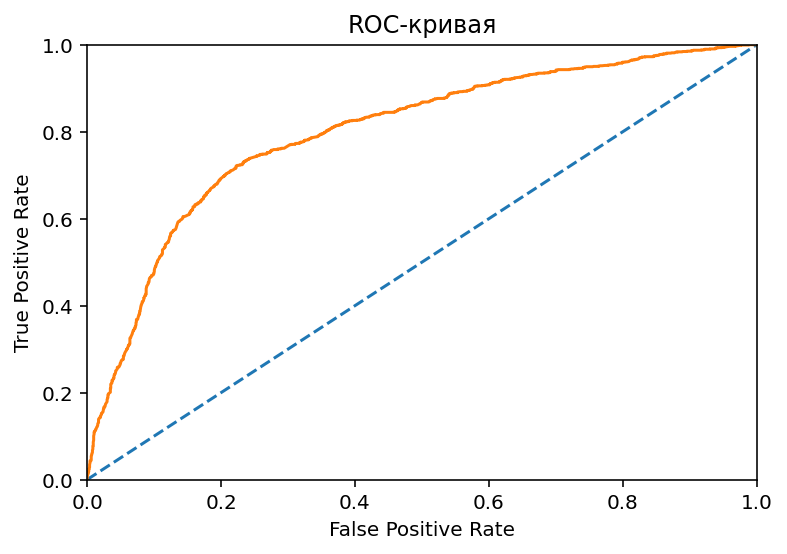

In [124]:
probabilities_test = eclf.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = eclf.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print("roc_auc_score:", roc_auc_score(target_test, probabilities_one_test))
print("gini_score:", 2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### Добавим KNeighborsClassifier. Может она улучшит итоговый результат

In [125]:
model_gs_knn = GridSearchCV(
    KNeighborsClassifier(),
    param_grid={'weights': ['uniform' , 'distance'],
                'n_neighbors': range(5, 40),
                'p': range(1, 3)}, cv = 5)

model_gs_knn.fit(features_train, target_train)
best_knn = model_gs_knn.best_estimator_
predict_knn = best_knn.predict(features_test)
print(best_knn)

KNeighborsClassifier(n_neighbors=32)


roc_auc_score: 0.7703486846866406
gini_score: 0.5406973693732813


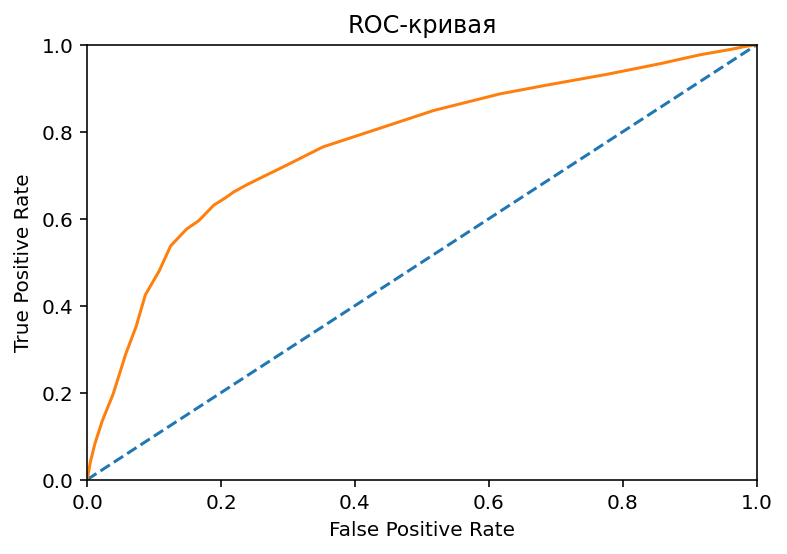

In [126]:
probabilities_test = model_gs_knn.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = model_gs_knn.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print("roc_auc_score:", roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

### Снова обучим VotingClassifier

In [127]:
eclf_plus = VotingClassifier(estimators=[('mlp', best_mlp),
                                    ('lr', best_lr),
                                    ('cat', best_cat),
                                    ('RFC', best_RFC),
                                    ('knn', best_knn),
                                    ('xgb', best_xgb),
                                    ('lgb', best_lgb)], voting='soft')
eclf_plus.fit(features_train, target_train)
predict_eclf_plus = eclf_plus.predict(features_test)

0:	learn: 0.6928450	total: 1.27ms	remaining: 1m 3s
1:	learn: 0.6925462	total: 2.64ms	remaining: 1m 5s
2:	learn: 0.6922336	total: 3.72ms	remaining: 1m 2s
3:	learn: 0.6919195	total: 4.83ms	remaining: 1m
4:	learn: 0.6916570	total: 6.06ms	remaining: 1m
5:	learn: 0.6913309	total: 7.19ms	remaining: 59.9s
6:	learn: 0.6910358	total: 8.46ms	remaining: 1m
7:	learn: 0.6907374	total: 9.67ms	remaining: 1m
8:	learn: 0.6904369	total: 10.9ms	remaining: 1m
9:	learn: 0.6901767	total: 12.1ms	remaining: 1m
10:	learn: 0.6898821	total: 13.3ms	remaining: 1m
11:	learn: 0.6895880	total: 14.5ms	remaining: 1m
12:	learn: 0.6892881	total: 15.7ms	remaining: 1m
13:	learn: 0.6889951	total: 16.9ms	remaining: 1m
14:	learn: 0.6886966	total: 18.2ms	remaining: 1m
15:	learn: 0.6883992	total: 19.4ms	remaining: 1m
16:	learn: 0.6881032	total: 20.6ms	remaining: 1m
17:	learn: 0.6878237	total: 21.9ms	remaining: 1m
18:	learn: 0.6875389	total: 23.1ms	remaining: 1m
19:	learn: 0.6872501	total: 24.3ms	remaining: 1m
20:	learn: 0.68696

282:	learn: 0.6283561	total: 335ms	remaining: 58.8s
283:	learn: 0.6282006	total: 336ms	remaining: 58.8s
284:	learn: 0.6280529	total: 337ms	remaining: 58.8s
285:	learn: 0.6278745	total: 339ms	remaining: 58.8s
286:	learn: 0.6277129	total: 340ms	remaining: 58.9s
287:	learn: 0.6275408	total: 341ms	remaining: 58.8s
288:	learn: 0.6273642	total: 342ms	remaining: 58.8s
289:	learn: 0.6271971	total: 343ms	remaining: 58.8s
290:	learn: 0.6270318	total: 344ms	remaining: 58.8s
291:	learn: 0.6268560	total: 346ms	remaining: 58.8s
292:	learn: 0.6266906	total: 347ms	remaining: 58.8s
293:	learn: 0.6265228	total: 348ms	remaining: 58.8s
294:	learn: 0.6263613	total: 349ms	remaining: 58.8s
295:	learn: 0.6261968	total: 350ms	remaining: 58.8s
296:	learn: 0.6260342	total: 351ms	remaining: 58.8s
297:	learn: 0.6258581	total: 352ms	remaining: 58.8s
298:	learn: 0.6256829	total: 354ms	remaining: 58.8s
299:	learn: 0.6255440	total: 355ms	remaining: 58.8s
300:	learn: 0.6253761	total: 356ms	remaining: 58.8s
301:	learn: 

576:	learn: 0.5910954	total: 686ms	remaining: 58.8s
577:	learn: 0.5910189	total: 688ms	remaining: 58.8s
578:	learn: 0.5909203	total: 689ms	remaining: 58.8s
579:	learn: 0.5908350	total: 690ms	remaining: 58.8s
580:	learn: 0.5907452	total: 691ms	remaining: 58.8s
581:	learn: 0.5906555	total: 692ms	remaining: 58.8s
582:	learn: 0.5905555	total: 694ms	remaining: 58.8s
583:	learn: 0.5904553	total: 695ms	remaining: 58.8s
584:	learn: 0.5903612	total: 696ms	remaining: 58.8s
585:	learn: 0.5902615	total: 697ms	remaining: 58.8s
586:	learn: 0.5901726	total: 698ms	remaining: 58.8s
587:	learn: 0.5900829	total: 700ms	remaining: 58.8s
588:	learn: 0.5899956	total: 701ms	remaining: 58.8s
589:	learn: 0.5899033	total: 702ms	remaining: 58.8s
590:	learn: 0.5898139	total: 704ms	remaining: 58.8s
591:	learn: 0.5897139	total: 705ms	remaining: 58.8s
592:	learn: 0.5896084	total: 706ms	remaining: 58.8s
593:	learn: 0.5895136	total: 707ms	remaining: 58.8s
594:	learn: 0.5894195	total: 709ms	remaining: 58.8s
595:	learn: 

855:	learn: 0.5705699	total: 1.02s	remaining: 58.7s
856:	learn: 0.5705091	total: 1.02s	remaining: 58.7s
857:	learn: 0.5704570	total: 1.02s	remaining: 58.7s
858:	learn: 0.5704086	total: 1.02s	remaining: 58.7s
859:	learn: 0.5703443	total: 1.03s	remaining: 58.7s
860:	learn: 0.5702807	total: 1.03s	remaining: 58.7s
861:	learn: 0.5702360	total: 1.03s	remaining: 58.7s
862:	learn: 0.5701749	total: 1.03s	remaining: 58.7s
863:	learn: 0.5701167	total: 1.03s	remaining: 58.7s
864:	learn: 0.5700589	total: 1.03s	remaining: 58.7s
865:	learn: 0.5700173	total: 1.03s	remaining: 58.7s
866:	learn: 0.5699628	total: 1.03s	remaining: 58.7s
867:	learn: 0.5699078	total: 1.04s	remaining: 58.7s
868:	learn: 0.5698514	total: 1.04s	remaining: 58.7s
869:	learn: 0.5697908	total: 1.04s	remaining: 58.7s
870:	learn: 0.5697310	total: 1.04s	remaining: 58.7s
871:	learn: 0.5696788	total: 1.04s	remaining: 58.7s
872:	learn: 0.5696208	total: 1.04s	remaining: 58.7s
873:	learn: 0.5695658	total: 1.04s	remaining: 58.7s
874:	learn: 

1112:	learn: 0.5589265	total: 1.37s	remaining: 1m
1113:	learn: 0.5588901	total: 1.37s	remaining: 1m
1114:	learn: 0.5588577	total: 1.37s	remaining: 1m
1115:	learn: 0.5588218	total: 1.37s	remaining: 1m
1116:	learn: 0.5587878	total: 1.37s	remaining: 1m
1117:	learn: 0.5587523	total: 1.37s	remaining: 1m
1118:	learn: 0.5587119	total: 1.38s	remaining: 1m
1119:	learn: 0.5586717	total: 1.38s	remaining: 1m
1120:	learn: 0.5586349	total: 1.38s	remaining: 1m
1121:	learn: 0.5585974	total: 1.38s	remaining: 1m
1122:	learn: 0.5585611	total: 1.38s	remaining: 1m
1123:	learn: 0.5585263	total: 1.38s	remaining: 1m
1124:	learn: 0.5584960	total: 1.38s	remaining: 1m
1125:	learn: 0.5584647	total: 1.38s	remaining: 1m
1126:	learn: 0.5584292	total: 1.38s	remaining: 1m
1127:	learn: 0.5583965	total: 1.39s	remaining: 1m
1128:	learn: 0.5583629	total: 1.39s	remaining: 1m
1129:	learn: 0.5583298	total: 1.39s	remaining: 1m
1130:	learn: 0.5582964	total: 1.39s	remaining: 1m
1131:	learn: 0.5582626	total: 1.39s	remaining: 1m


1392:	learn: 0.5506838	total: 1.7s	remaining: 59.5s
1393:	learn: 0.5506587	total: 1.7s	remaining: 59.4s
1394:	learn: 0.5506380	total: 1.71s	remaining: 59.4s
1395:	learn: 0.5506185	total: 1.71s	remaining: 59.4s
1396:	learn: 0.5505985	total: 1.71s	remaining: 59.4s
1397:	learn: 0.5505786	total: 1.71s	remaining: 59.4s
1398:	learn: 0.5505530	total: 1.71s	remaining: 59.4s
1399:	learn: 0.5505314	total: 1.71s	remaining: 59.4s
1400:	learn: 0.5505079	total: 1.71s	remaining: 59.4s
1401:	learn: 0.5504901	total: 1.71s	remaining: 59.4s
1402:	learn: 0.5504664	total: 1.72s	remaining: 59.4s
1403:	learn: 0.5504453	total: 1.72s	remaining: 59.4s
1404:	learn: 0.5504201	total: 1.72s	remaining: 59.4s
1405:	learn: 0.5503940	total: 1.72s	remaining: 59.4s
1406:	learn: 0.5503710	total: 1.72s	remaining: 59.4s
1407:	learn: 0.5503441	total: 1.72s	remaining: 59.4s
1408:	learn: 0.5503198	total: 1.72s	remaining: 59.4s
1409:	learn: 0.5502979	total: 1.72s	remaining: 59.4s
1410:	learn: 0.5502815	total: 1.73s	remaining: 5

1675:	learn: 0.5450599	total: 2.04s	remaining: 58.8s
1676:	learn: 0.5450489	total: 2.04s	remaining: 58.8s
1677:	learn: 0.5450298	total: 2.04s	remaining: 58.8s
1678:	learn: 0.5450124	total: 2.04s	remaining: 58.8s
1679:	learn: 0.5449949	total: 2.04s	remaining: 58.8s
1680:	learn: 0.5449827	total: 2.05s	remaining: 58.8s
1681:	learn: 0.5449655	total: 2.05s	remaining: 58.8s
1682:	learn: 0.5449513	total: 2.05s	remaining: 58.8s
1683:	learn: 0.5449395	total: 2.05s	remaining: 58.8s
1684:	learn: 0.5449219	total: 2.05s	remaining: 58.8s
1685:	learn: 0.5449135	total: 2.05s	remaining: 58.8s
1686:	learn: 0.5448971	total: 2.05s	remaining: 58.8s
1687:	learn: 0.5448790	total: 2.05s	remaining: 58.8s
1688:	learn: 0.5448672	total: 2.06s	remaining: 58.8s
1689:	learn: 0.5448474	total: 2.06s	remaining: 58.8s
1690:	learn: 0.5448327	total: 2.06s	remaining: 58.8s
1691:	learn: 0.5448208	total: 2.06s	remaining: 58.8s
1692:	learn: 0.5448097	total: 2.06s	remaining: 58.8s
1693:	learn: 0.5447966	total: 2.06s	remaining:

1970:	learn: 0.5410520	total: 2.39s	remaining: 58.3s
1971:	learn: 0.5410386	total: 2.39s	remaining: 58.3s
1972:	learn: 0.5410255	total: 2.39s	remaining: 58.3s
1973:	learn: 0.5410144	total: 2.39s	remaining: 58.3s
1974:	learn: 0.5410003	total: 2.4s	remaining: 58.3s
1975:	learn: 0.5409905	total: 2.4s	remaining: 58.3s
1976:	learn: 0.5409796	total: 2.4s	remaining: 58.3s
1977:	learn: 0.5409682	total: 2.4s	remaining: 58.3s
1978:	learn: 0.5409588	total: 2.4s	remaining: 58.3s
1979:	learn: 0.5409428	total: 2.4s	remaining: 58.3s
1980:	learn: 0.5409356	total: 2.4s	remaining: 58.3s
1981:	learn: 0.5409226	total: 2.4s	remaining: 58.3s
1982:	learn: 0.5409071	total: 2.41s	remaining: 58.3s
1983:	learn: 0.5408939	total: 2.41s	remaining: 58.3s
1984:	learn: 0.5408739	total: 2.41s	remaining: 58.3s
1985:	learn: 0.5408639	total: 2.41s	remaining: 58.3s
1986:	learn: 0.5408559	total: 2.41s	remaining: 58.3s
1987:	learn: 0.5408439	total: 2.41s	remaining: 58.3s
1988:	learn: 0.5408303	total: 2.41s	remaining: 58.3s
1

2248:	learn: 0.5381101	total: 2.72s	remaining: 57.8s
2249:	learn: 0.5381016	total: 2.72s	remaining: 57.8s
2250:	learn: 0.5380896	total: 2.72s	remaining: 57.8s
2251:	learn: 0.5380809	total: 2.73s	remaining: 57.8s
2252:	learn: 0.5380672	total: 2.73s	remaining: 57.8s
2253:	learn: 0.5380577	total: 2.73s	remaining: 57.8s
2254:	learn: 0.5380497	total: 2.73s	remaining: 57.8s
2255:	learn: 0.5380407	total: 2.73s	remaining: 57.8s
2256:	learn: 0.5380291	total: 2.73s	remaining: 57.8s
2257:	learn: 0.5380191	total: 2.73s	remaining: 57.8s
2258:	learn: 0.5380095	total: 2.73s	remaining: 57.8s
2259:	learn: 0.5380062	total: 2.73s	remaining: 57.8s
2260:	learn: 0.5379969	total: 2.74s	remaining: 57.8s
2261:	learn: 0.5379911	total: 2.74s	remaining: 57.8s
2262:	learn: 0.5379817	total: 2.74s	remaining: 57.8s
2263:	learn: 0.5379744	total: 2.74s	remaining: 57.8s
2264:	learn: 0.5379668	total: 2.74s	remaining: 57.8s
2265:	learn: 0.5379593	total: 2.74s	remaining: 57.8s
2266:	learn: 0.5379504	total: 2.74s	remaining:

2542:	learn: 0.5357226	total: 3.07s	remaining: 57.4s
2543:	learn: 0.5357148	total: 3.08s	remaining: 57.4s
2544:	learn: 0.5357068	total: 3.08s	remaining: 57.4s
2545:	learn: 0.5356983	total: 3.08s	remaining: 57.4s
2546:	learn: 0.5356880	total: 3.08s	remaining: 57.4s
2547:	learn: 0.5356819	total: 3.08s	remaining: 57.4s
2548:	learn: 0.5356736	total: 3.08s	remaining: 57.4s
2549:	learn: 0.5356662	total: 3.08s	remaining: 57.4s
2550:	learn: 0.5356589	total: 3.08s	remaining: 57.4s
2551:	learn: 0.5356495	total: 3.09s	remaining: 57.4s
2552:	learn: 0.5356425	total: 3.09s	remaining: 57.4s
2553:	learn: 0.5356358	total: 3.09s	remaining: 57.4s
2554:	learn: 0.5356288	total: 3.09s	remaining: 57.4s
2555:	learn: 0.5356067	total: 3.09s	remaining: 57.4s
2556:	learn: 0.5355987	total: 3.09s	remaining: 57.4s
2557:	learn: 0.5355901	total: 3.09s	remaining: 57.4s
2558:	learn: 0.5355809	total: 3.09s	remaining: 57.4s
2559:	learn: 0.5355760	total: 3.1s	remaining: 57.4s
2560:	learn: 0.5355682	total: 3.1s	remaining: 5

2820:	learn: 0.5337953	total: 3.41s	remaining: 57.1s
2821:	learn: 0.5337899	total: 3.41s	remaining: 57.1s
2822:	learn: 0.5337691	total: 3.41s	remaining: 57.1s
2823:	learn: 0.5337639	total: 3.42s	remaining: 57.1s
2824:	learn: 0.5337575	total: 3.42s	remaining: 57.1s
2825:	learn: 0.5337489	total: 3.42s	remaining: 57.1s
2826:	learn: 0.5337419	total: 3.42s	remaining: 57.1s
2827:	learn: 0.5337375	total: 3.42s	remaining: 57.1s
2828:	learn: 0.5337302	total: 3.42s	remaining: 57.1s
2829:	learn: 0.5337215	total: 3.42s	remaining: 57.1s
2830:	learn: 0.5337137	total: 3.42s	remaining: 57.1s
2831:	learn: 0.5337070	total: 3.43s	remaining: 57.1s
2832:	learn: 0.5336996	total: 3.43s	remaining: 57.1s
2833:	learn: 0.5336917	total: 3.43s	remaining: 57.1s
2834:	learn: 0.5336857	total: 3.43s	remaining: 57.1s
2835:	learn: 0.5336805	total: 3.43s	remaining: 57.1s
2836:	learn: 0.5336744	total: 3.43s	remaining: 57.1s
2837:	learn: 0.5336691	total: 3.43s	remaining: 57.1s
2838:	learn: 0.5336644	total: 3.43s	remaining:

3098:	learn: 0.5321272	total: 3.75s	remaining: 56.8s
3099:	learn: 0.5321213	total: 3.75s	remaining: 56.8s
3100:	learn: 0.5321156	total: 3.75s	remaining: 56.8s
3101:	learn: 0.5321099	total: 3.75s	remaining: 56.8s
3102:	learn: 0.5321024	total: 3.76s	remaining: 56.8s
3103:	learn: 0.5320961	total: 3.76s	remaining: 56.8s
3104:	learn: 0.5320924	total: 3.76s	remaining: 56.8s
3105:	learn: 0.5320868	total: 3.76s	remaining: 56.8s
3106:	learn: 0.5320809	total: 3.76s	remaining: 56.8s
3107:	learn: 0.5320757	total: 3.76s	remaining: 56.8s
3108:	learn: 0.5320680	total: 3.76s	remaining: 56.8s
3109:	learn: 0.5320594	total: 3.77s	remaining: 56.8s
3110:	learn: 0.5320548	total: 3.77s	remaining: 56.8s
3111:	learn: 0.5320491	total: 3.77s	remaining: 56.8s
3112:	learn: 0.5320422	total: 3.77s	remaining: 56.8s
3113:	learn: 0.5320343	total: 3.77s	remaining: 56.8s
3114:	learn: 0.5320288	total: 3.77s	remaining: 56.8s
3115:	learn: 0.5320254	total: 3.77s	remaining: 56.8s
3116:	learn: 0.5320205	total: 3.77s	remaining:

3380:	learn: 0.5306038	total: 4.1s	remaining: 56.5s
3381:	learn: 0.5305979	total: 4.1s	remaining: 56.5s
3382:	learn: 0.5305909	total: 4.1s	remaining: 56.5s
3383:	learn: 0.5305859	total: 4.1s	remaining: 56.5s
3384:	learn: 0.5305797	total: 4.1s	remaining: 56.5s
3385:	learn: 0.5305782	total: 4.1s	remaining: 56.5s
3386:	learn: 0.5305717	total: 4.11s	remaining: 56.5s
3387:	learn: 0.5305673	total: 4.11s	remaining: 56.5s
3388:	learn: 0.5305620	total: 4.11s	remaining: 56.6s
3389:	learn: 0.5305563	total: 4.12s	remaining: 56.6s
3390:	learn: 0.5305499	total: 4.12s	remaining: 56.6s
3391:	learn: 0.5305452	total: 4.12s	remaining: 56.7s
3392:	learn: 0.5305388	total: 4.13s	remaining: 56.7s
3393:	learn: 0.5305330	total: 4.13s	remaining: 56.7s
3394:	learn: 0.5305285	total: 4.13s	remaining: 56.7s
3395:	learn: 0.5305236	total: 4.13s	remaining: 56.7s
3396:	learn: 0.5305195	total: 4.14s	remaining: 56.7s
3397:	learn: 0.5305137	total: 4.14s	remaining: 56.8s
3398:	learn: 0.5305093	total: 4.14s	remaining: 56.8s

3648:	learn: 0.5292884	total: 4.45s	remaining: 56.5s
3649:	learn: 0.5292822	total: 4.45s	remaining: 56.5s
3650:	learn: 0.5292786	total: 4.45s	remaining: 56.5s
3651:	learn: 0.5292749	total: 4.45s	remaining: 56.5s
3652:	learn: 0.5292684	total: 4.46s	remaining: 56.5s
3653:	learn: 0.5292632	total: 4.46s	remaining: 56.5s
3654:	learn: 0.5292597	total: 4.46s	remaining: 56.5s
3655:	learn: 0.5292546	total: 4.46s	remaining: 56.5s
3656:	learn: 0.5292477	total: 4.46s	remaining: 56.5s
3657:	learn: 0.5292421	total: 4.46s	remaining: 56.5s
3658:	learn: 0.5292390	total: 4.46s	remaining: 56.5s
3659:	learn: 0.5292335	total: 4.46s	remaining: 56.5s
3660:	learn: 0.5292311	total: 4.46s	remaining: 56.5s
3661:	learn: 0.5292283	total: 4.47s	remaining: 56.5s
3662:	learn: 0.5292238	total: 4.47s	remaining: 56.5s
3663:	learn: 0.5292189	total: 4.47s	remaining: 56.5s
3664:	learn: 0.5292155	total: 4.47s	remaining: 56.5s
3665:	learn: 0.5292114	total: 4.47s	remaining: 56.5s
3666:	learn: 0.5292082	total: 4.47s	remaining:

3922:	learn: 0.5280970	total: 4.79s	remaining: 56.3s
3923:	learn: 0.5280938	total: 4.79s	remaining: 56.3s
3924:	learn: 0.5280919	total: 4.79s	remaining: 56.3s
3925:	learn: 0.5280882	total: 4.79s	remaining: 56.3s
3926:	learn: 0.5280849	total: 4.79s	remaining: 56.3s
3927:	learn: 0.5280790	total: 4.8s	remaining: 56.3s
3928:	learn: 0.5280768	total: 4.8s	remaining: 56.3s
3929:	learn: 0.5280681	total: 4.8s	remaining: 56.3s
3930:	learn: 0.5280640	total: 4.8s	remaining: 56.2s
3931:	learn: 0.5280604	total: 4.8s	remaining: 56.2s
3932:	learn: 0.5280558	total: 4.8s	remaining: 56.2s
3933:	learn: 0.5280534	total: 4.8s	remaining: 56.2s
3934:	learn: 0.5280488	total: 4.8s	remaining: 56.2s
3935:	learn: 0.5280457	total: 4.8s	remaining: 56.2s
3936:	learn: 0.5280402	total: 4.81s	remaining: 56.2s
3937:	learn: 0.5280358	total: 4.81s	remaining: 56.2s
3938:	learn: 0.5280303	total: 4.81s	remaining: 56.2s
3939:	learn: 0.5280272	total: 4.81s	remaining: 56.2s
3940:	learn: 0.5280236	total: 4.81s	remaining: 56.2s
39

4196:	learn: 0.5269502	total: 5.13s	remaining: 56s
4197:	learn: 0.5269479	total: 5.13s	remaining: 56s
4198:	learn: 0.5269451	total: 5.13s	remaining: 56s
4199:	learn: 0.5269420	total: 5.13s	remaining: 56s
4200:	learn: 0.5269374	total: 5.13s	remaining: 56s
4201:	learn: 0.5269341	total: 5.13s	remaining: 56s
4202:	learn: 0.5269310	total: 5.13s	remaining: 56s
4203:	learn: 0.5269276	total: 5.14s	remaining: 56s
4204:	learn: 0.5269241	total: 5.14s	remaining: 56s
4205:	learn: 0.5269202	total: 5.14s	remaining: 55.9s
4206:	learn: 0.5269137	total: 5.14s	remaining: 55.9s
4207:	learn: 0.5269088	total: 5.14s	remaining: 55.9s
4208:	learn: 0.5269038	total: 5.14s	remaining: 55.9s
4209:	learn: 0.5269009	total: 5.14s	remaining: 55.9s
4210:	learn: 0.5268966	total: 5.14s	remaining: 55.9s
4211:	learn: 0.5268941	total: 5.15s	remaining: 55.9s
4212:	learn: 0.5268895	total: 5.15s	remaining: 55.9s
4213:	learn: 0.5268863	total: 5.15s	remaining: 55.9s
4214:	learn: 0.5268824	total: 5.15s	remaining: 55.9s
4215:	learn

4471:	learn: 0.5258586	total: 5.47s	remaining: 55.7s
4472:	learn: 0.5258546	total: 5.47s	remaining: 55.7s
4473:	learn: 0.5258516	total: 5.47s	remaining: 55.7s
4474:	learn: 0.5258486	total: 5.48s	remaining: 55.7s
4475:	learn: 0.5258448	total: 5.48s	remaining: 55.7s
4476:	learn: 0.5258396	total: 5.48s	remaining: 55.7s
4477:	learn: 0.5258354	total: 5.48s	remaining: 55.7s
4478:	learn: 0.5258327	total: 5.48s	remaining: 55.7s
4479:	learn: 0.5258266	total: 5.48s	remaining: 55.7s
4480:	learn: 0.5258232	total: 5.48s	remaining: 55.7s
4481:	learn: 0.5258205	total: 5.49s	remaining: 55.7s
4482:	learn: 0.5258133	total: 5.49s	remaining: 55.7s
4483:	learn: 0.5258069	total: 5.49s	remaining: 55.7s
4484:	learn: 0.5258029	total: 5.49s	remaining: 55.7s
4485:	learn: 0.5258011	total: 5.49s	remaining: 55.7s
4486:	learn: 0.5257978	total: 5.49s	remaining: 55.7s
4487:	learn: 0.5257955	total: 5.49s	remaining: 55.7s
4488:	learn: 0.5257909	total: 5.49s	remaining: 55.7s
4489:	learn: 0.5257874	total: 5.5s	remaining: 

4730:	learn: 0.5249037	total: 5.81s	remaining: 55.6s
4731:	learn: 0.5249002	total: 5.81s	remaining: 55.6s
4732:	learn: 0.5248977	total: 5.81s	remaining: 55.6s
4733:	learn: 0.5248927	total: 5.81s	remaining: 55.6s
4734:	learn: 0.5248885	total: 5.81s	remaining: 55.6s
4735:	learn: 0.5248844	total: 5.81s	remaining: 55.6s
4736:	learn: 0.5248796	total: 5.82s	remaining: 55.6s
4737:	learn: 0.5248769	total: 5.82s	remaining: 55.6s
4738:	learn: 0.5248731	total: 5.82s	remaining: 55.6s
4739:	learn: 0.5248686	total: 5.82s	remaining: 55.6s
4740:	learn: 0.5248653	total: 5.82s	remaining: 55.6s
4741:	learn: 0.5248593	total: 5.82s	remaining: 55.6s
4742:	learn: 0.5248576	total: 5.82s	remaining: 55.6s
4743:	learn: 0.5248532	total: 5.82s	remaining: 55.6s
4744:	learn: 0.5248498	total: 5.83s	remaining: 55.6s
4745:	learn: 0.5248327	total: 5.83s	remaining: 55.6s
4746:	learn: 0.5248305	total: 5.83s	remaining: 55.6s
4747:	learn: 0.5248264	total: 5.83s	remaining: 55.6s
4748:	learn: 0.5248137	total: 5.83s	remaining:

5013:	learn: 0.5238720	total: 6.16s	remaining: 55.3s
5014:	learn: 0.5238684	total: 6.16s	remaining: 55.3s
5015:	learn: 0.5238660	total: 6.16s	remaining: 55.3s
5016:	learn: 0.5238616	total: 6.16s	remaining: 55.3s
5017:	learn: 0.5238588	total: 6.16s	remaining: 55.3s
5018:	learn: 0.5238536	total: 6.17s	remaining: 55.3s
5019:	learn: 0.5238496	total: 6.17s	remaining: 55.3s
5020:	learn: 0.5238473	total: 6.17s	remaining: 55.3s
5021:	learn: 0.5238443	total: 6.17s	remaining: 55.3s
5022:	learn: 0.5238411	total: 6.17s	remaining: 55.3s
5023:	learn: 0.5238383	total: 6.17s	remaining: 55.3s
5024:	learn: 0.5238361	total: 6.17s	remaining: 55.3s
5025:	learn: 0.5238326	total: 6.17s	remaining: 55.3s
5026:	learn: 0.5238299	total: 6.17s	remaining: 55.3s
5027:	learn: 0.5238271	total: 6.18s	remaining: 55.2s
5028:	learn: 0.5238250	total: 6.18s	remaining: 55.2s
5029:	learn: 0.5238241	total: 6.18s	remaining: 55.2s
5030:	learn: 0.5238207	total: 6.18s	remaining: 55.2s
5031:	learn: 0.5238166	total: 6.18s	remaining:

5280:	learn: 0.5230357	total: 6.49s	remaining: 55s
5281:	learn: 0.5230317	total: 6.49s	remaining: 55s
5282:	learn: 0.5230298	total: 6.49s	remaining: 55s
5283:	learn: 0.5230263	total: 6.5s	remaining: 55s
5284:	learn: 0.5230248	total: 6.5s	remaining: 55s
5285:	learn: 0.5230230	total: 6.5s	remaining: 55s
5286:	learn: 0.5230215	total: 6.5s	remaining: 55s
5287:	learn: 0.5230192	total: 6.5s	remaining: 55s
5288:	learn: 0.5230073	total: 6.5s	remaining: 55s
5289:	learn: 0.5230047	total: 6.5s	remaining: 55s
5290:	learn: 0.5230021	total: 6.5s	remaining: 55s
5291:	learn: 0.5230000	total: 6.5s	remaining: 55s
5292:	learn: 0.5229976	total: 6.51s	remaining: 55s
5293:	learn: 0.5229947	total: 6.51s	remaining: 55s
5294:	learn: 0.5229922	total: 6.51s	remaining: 55s
5295:	learn: 0.5229899	total: 6.51s	remaining: 55s
5296:	learn: 0.5229876	total: 6.51s	remaining: 55s
5297:	learn: 0.5229757	total: 6.51s	remaining: 55s
5298:	learn: 0.5229720	total: 6.51s	remaining: 55s
5299:	learn: 0.5229697	total: 6.51s	rema

5564:	learn: 0.5221049	total: 6.84s	remaining: 54.7s
5565:	learn: 0.5221006	total: 6.85s	remaining: 54.7s
5566:	learn: 0.5220976	total: 6.85s	remaining: 54.7s
5567:	learn: 0.5220943	total: 6.85s	remaining: 54.7s
5568:	learn: 0.5220921	total: 6.85s	remaining: 54.7s
5569:	learn: 0.5220869	total: 6.85s	remaining: 54.7s
5570:	learn: 0.5220829	total: 6.85s	remaining: 54.6s
5571:	learn: 0.5220793	total: 6.85s	remaining: 54.6s
5572:	learn: 0.5220767	total: 6.86s	remaining: 54.6s
5573:	learn: 0.5220735	total: 6.86s	remaining: 54.6s
5574:	learn: 0.5220702	total: 6.86s	remaining: 54.6s
5575:	learn: 0.5220679	total: 6.86s	remaining: 54.6s
5576:	learn: 0.5220652	total: 6.86s	remaining: 54.6s
5577:	learn: 0.5220628	total: 6.86s	remaining: 54.6s
5578:	learn: 0.5220601	total: 6.86s	remaining: 54.6s
5579:	learn: 0.5220570	total: 6.86s	remaining: 54.6s
5580:	learn: 0.5220513	total: 6.87s	remaining: 54.6s
5581:	learn: 0.5220473	total: 6.87s	remaining: 54.6s
5582:	learn: 0.5220444	total: 6.87s	remaining:

5839:	learn: 0.5212539	total: 7.18s	remaining: 54.3s
5840:	learn: 0.5212498	total: 7.18s	remaining: 54.3s
5841:	learn: 0.5212477	total: 7.18s	remaining: 54.3s
5842:	learn: 0.5212468	total: 7.19s	remaining: 54.3s
5843:	learn: 0.5212446	total: 7.19s	remaining: 54.3s
5844:	learn: 0.5212425	total: 7.19s	remaining: 54.3s
5845:	learn: 0.5212373	total: 7.19s	remaining: 54.3s
5846:	learn: 0.5212357	total: 7.19s	remaining: 54.3s
5847:	learn: 0.5212315	total: 7.19s	remaining: 54.3s
5848:	learn: 0.5212305	total: 7.19s	remaining: 54.3s
5849:	learn: 0.5212253	total: 7.2s	remaining: 54.3s
5850:	learn: 0.5212225	total: 7.2s	remaining: 54.3s
5851:	learn: 0.5212204	total: 7.2s	remaining: 54.3s
5852:	learn: 0.5212177	total: 7.2s	remaining: 54.3s
5853:	learn: 0.5212130	total: 7.2s	remaining: 54.3s
5854:	learn: 0.5212105	total: 7.2s	remaining: 54.3s
5855:	learn: 0.5212073	total: 7.2s	remaining: 54.3s
5856:	learn: 0.5212051	total: 7.2s	remaining: 54.3s
5857:	learn: 0.5212038	total: 7.21s	remaining: 54.3s
5

6113:	learn: 0.5204347	total: 7.52s	remaining: 54s
6114:	learn: 0.5204322	total: 7.52s	remaining: 54s
6115:	learn: 0.5204305	total: 7.52s	remaining: 54s
6116:	learn: 0.5204290	total: 7.53s	remaining: 54s
6117:	learn: 0.5204267	total: 7.53s	remaining: 54s
6118:	learn: 0.5204232	total: 7.53s	remaining: 54s
6119:	learn: 0.5204205	total: 7.53s	remaining: 54s
6120:	learn: 0.5204194	total: 7.53s	remaining: 54s
6121:	learn: 0.5204171	total: 7.53s	remaining: 54s
6122:	learn: 0.5204141	total: 7.53s	remaining: 54s
6123:	learn: 0.5204114	total: 7.53s	remaining: 54s
6124:	learn: 0.5204081	total: 7.54s	remaining: 54s
6125:	learn: 0.5204066	total: 7.54s	remaining: 54s
6126:	learn: 0.5204058	total: 7.54s	remaining: 54s
6127:	learn: 0.5204053	total: 7.54s	remaining: 54s
6128:	learn: 0.5204010	total: 7.54s	remaining: 54s
6129:	learn: 0.5203987	total: 7.54s	remaining: 54s
6130:	learn: 0.5203940	total: 7.54s	remaining: 54s
6131:	learn: 0.5203928	total: 7.54s	remaining: 54s
6132:	learn: 0.5203886	total: 7

6394:	learn: 0.5196583	total: 7.87s	remaining: 53.6s
6395:	learn: 0.5196533	total: 7.87s	remaining: 53.6s
6396:	learn: 0.5196514	total: 7.87s	remaining: 53.6s
6397:	learn: 0.5196499	total: 7.87s	remaining: 53.6s
6398:	learn: 0.5196475	total: 7.87s	remaining: 53.6s
6399:	learn: 0.5196446	total: 7.87s	remaining: 53.6s
6400:	learn: 0.5196424	total: 7.88s	remaining: 53.6s
6401:	learn: 0.5196392	total: 7.88s	remaining: 53.6s
6402:	learn: 0.5196374	total: 7.88s	remaining: 53.6s
6403:	learn: 0.5196360	total: 7.88s	remaining: 53.6s
6404:	learn: 0.5196256	total: 7.88s	remaining: 53.6s
6405:	learn: 0.5196245	total: 7.88s	remaining: 53.6s
6406:	learn: 0.5196238	total: 7.88s	remaining: 53.6s
6407:	learn: 0.5196221	total: 7.88s	remaining: 53.6s
6408:	learn: 0.5196179	total: 7.88s	remaining: 53.6s
6409:	learn: 0.5196158	total: 7.89s	remaining: 53.6s
6410:	learn: 0.5196090	total: 7.89s	remaining: 53.6s
6411:	learn: 0.5196052	total: 7.89s	remaining: 53.6s
6412:	learn: 0.5196037	total: 7.89s	remaining:

6680:	learn: 0.5188844	total: 8.22s	remaining: 53.3s
6681:	learn: 0.5188810	total: 8.22s	remaining: 53.3s
6682:	learn: 0.5188773	total: 8.22s	remaining: 53.3s
6683:	learn: 0.5188752	total: 8.22s	remaining: 53.3s
6684:	learn: 0.5188718	total: 8.22s	remaining: 53.3s
6685:	learn: 0.5188703	total: 8.23s	remaining: 53.3s
6686:	learn: 0.5188656	total: 8.23s	remaining: 53.3s
6687:	learn: 0.5188615	total: 8.23s	remaining: 53.3s
6688:	learn: 0.5188592	total: 8.23s	remaining: 53.3s
6689:	learn: 0.5188582	total: 8.23s	remaining: 53.3s
6690:	learn: 0.5188564	total: 8.23s	remaining: 53.3s
6691:	learn: 0.5188529	total: 8.23s	remaining: 53.3s
6692:	learn: 0.5188510	total: 8.23s	remaining: 53.3s
6693:	learn: 0.5188486	total: 8.24s	remaining: 53.3s
6694:	learn: 0.5188463	total: 8.24s	remaining: 53.3s
6695:	learn: 0.5188455	total: 8.24s	remaining: 53.3s
6696:	learn: 0.5188443	total: 8.24s	remaining: 53.3s
6697:	learn: 0.5188406	total: 8.24s	remaining: 53.3s
6698:	learn: 0.5188385	total: 8.24s	remaining:

6953:	learn: 0.5181152	total: 8.56s	remaining: 53s
6954:	learn: 0.5181126	total: 8.56s	remaining: 53s
6955:	learn: 0.5181113	total: 8.56s	remaining: 53s
6956:	learn: 0.5181094	total: 8.56s	remaining: 53s
6957:	learn: 0.5181071	total: 8.56s	remaining: 53s
6958:	learn: 0.5181027	total: 8.56s	remaining: 53s
6959:	learn: 0.5180998	total: 8.57s	remaining: 53s
6960:	learn: 0.5180964	total: 8.57s	remaining: 53s
6961:	learn: 0.5180944	total: 8.57s	remaining: 53s
6962:	learn: 0.5180917	total: 8.57s	remaining: 53s
6963:	learn: 0.5180891	total: 8.57s	remaining: 53s
6964:	learn: 0.5180856	total: 8.57s	remaining: 53s
6965:	learn: 0.5180841	total: 8.57s	remaining: 53s
6966:	learn: 0.5180802	total: 8.57s	remaining: 53s
6967:	learn: 0.5180786	total: 8.58s	remaining: 53s
6968:	learn: 0.5180765	total: 8.58s	remaining: 53s
6969:	learn: 0.5180741	total: 8.58s	remaining: 53s
6970:	learn: 0.5180714	total: 8.58s	remaining: 53s
6971:	learn: 0.5180694	total: 8.58s	remaining: 53s
6972:	learn: 0.5180672	total: 8

7227:	learn: 0.5173872	total: 8.9s	remaining: 52.7s
7228:	learn: 0.5173847	total: 8.9s	remaining: 52.7s
7229:	learn: 0.5173819	total: 8.9s	remaining: 52.7s
7230:	learn: 0.5173801	total: 8.9s	remaining: 52.7s
7231:	learn: 0.5173775	total: 8.9s	remaining: 52.6s
7232:	learn: 0.5173754	total: 8.9s	remaining: 52.6s
7233:	learn: 0.5173738	total: 8.9s	remaining: 52.6s
7234:	learn: 0.5173718	total: 8.91s	remaining: 52.6s
7235:	learn: 0.5173708	total: 8.91s	remaining: 52.6s
7236:	learn: 0.5173671	total: 8.91s	remaining: 52.6s
7237:	learn: 0.5173650	total: 8.91s	remaining: 52.6s
7238:	learn: 0.5173640	total: 8.91s	remaining: 52.6s
7239:	learn: 0.5173609	total: 8.91s	remaining: 52.6s
7240:	learn: 0.5173569	total: 8.91s	remaining: 52.6s
7241:	learn: 0.5173502	total: 8.91s	remaining: 52.6s
7242:	learn: 0.5173491	total: 8.92s	remaining: 52.6s
7243:	learn: 0.5173462	total: 8.92s	remaining: 52.6s
7244:	learn: 0.5173316	total: 8.92s	remaining: 52.6s
7245:	learn: 0.5173306	total: 8.92s	remaining: 52.6s


7505:	learn: 0.5166555	total: 9.24s	remaining: 52.3s
7506:	learn: 0.5166550	total: 9.24s	remaining: 52.3s
7507:	learn: 0.5166528	total: 9.25s	remaining: 52.3s
7508:	learn: 0.5166509	total: 9.25s	remaining: 52.3s
7509:	learn: 0.5166484	total: 9.25s	remaining: 52.3s
7510:	learn: 0.5166469	total: 9.25s	remaining: 52.3s
7511:	learn: 0.5166439	total: 9.25s	remaining: 52.3s
7512:	learn: 0.5166402	total: 9.25s	remaining: 52.3s
7513:	learn: 0.5166379	total: 9.25s	remaining: 52.3s
7514:	learn: 0.5166369	total: 9.26s	remaining: 52.3s
7515:	learn: 0.5166350	total: 9.26s	remaining: 52.3s
7516:	learn: 0.5166330	total: 9.26s	remaining: 52.3s
7517:	learn: 0.5166321	total: 9.26s	remaining: 52.3s
7518:	learn: 0.5166299	total: 9.26s	remaining: 52.3s
7519:	learn: 0.5166277	total: 9.26s	remaining: 52.3s
7520:	learn: 0.5166246	total: 9.26s	remaining: 52.3s
7521:	learn: 0.5166230	total: 9.26s	remaining: 52.3s
7522:	learn: 0.5166221	total: 9.27s	remaining: 52.3s
7523:	learn: 0.5166200	total: 9.27s	remaining:

7779:	learn: 0.5159417	total: 9.58s	remaining: 52s
7780:	learn: 0.5159390	total: 9.58s	remaining: 52s
7781:	learn: 0.5159372	total: 9.59s	remaining: 52s
7782:	learn: 0.5159350	total: 9.59s	remaining: 52s
7783:	learn: 0.5159327	total: 9.59s	remaining: 52s
7784:	learn: 0.5159297	total: 9.59s	remaining: 52s
7785:	learn: 0.5159264	total: 9.59s	remaining: 52s
7786:	learn: 0.5159232	total: 9.59s	remaining: 52s
7787:	learn: 0.5159210	total: 9.59s	remaining: 52s
7788:	learn: 0.5159193	total: 9.59s	remaining: 52s
7789:	learn: 0.5159170	total: 9.6s	remaining: 52s
7790:	learn: 0.5159154	total: 9.6s	remaining: 52s
7791:	learn: 0.5159134	total: 9.6s	remaining: 52s
7792:	learn: 0.5159120	total: 9.6s	remaining: 52s
7793:	learn: 0.5159087	total: 9.6s	remaining: 52s
7794:	learn: 0.5159057	total: 9.6s	remaining: 52s
7795:	learn: 0.5159035	total: 9.6s	remaining: 52s
7796:	learn: 0.5159017	total: 9.6s	remaining: 52s
7797:	learn: 0.5158995	total: 9.61s	remaining: 52s
7798:	learn: 0.5158982	total: 9.61s	rem

8063:	learn: 0.5151855	total: 9.94s	remaining: 51.7s
8064:	learn: 0.5151793	total: 9.94s	remaining: 51.7s
8065:	learn: 0.5151778	total: 9.94s	remaining: 51.7s
8066:	learn: 0.5151764	total: 9.94s	remaining: 51.7s
8067:	learn: 0.5151744	total: 9.94s	remaining: 51.7s
8068:	learn: 0.5151730	total: 9.94s	remaining: 51.7s
8069:	learn: 0.5151718	total: 9.94s	remaining: 51.7s
8070:	learn: 0.5151699	total: 9.95s	remaining: 51.7s
8071:	learn: 0.5151555	total: 9.95s	remaining: 51.7s
8072:	learn: 0.5151529	total: 9.95s	remaining: 51.7s
8073:	learn: 0.5151504	total: 9.95s	remaining: 51.7s
8074:	learn: 0.5151481	total: 9.95s	remaining: 51.7s
8075:	learn: 0.5151464	total: 9.95s	remaining: 51.7s
8076:	learn: 0.5151431	total: 9.95s	remaining: 51.7s
8077:	learn: 0.5151419	total: 9.95s	remaining: 51.7s
8078:	learn: 0.5151374	total: 9.96s	remaining: 51.7s
8079:	learn: 0.5151333	total: 9.96s	remaining: 51.7s
8080:	learn: 0.5151313	total: 9.96s	remaining: 51.7s
8081:	learn: 0.5151300	total: 9.96s	remaining:

8335:	learn: 0.5144359	total: 10.3s	remaining: 51.4s
8336:	learn: 0.5144307	total: 10.3s	remaining: 51.4s
8337:	learn: 0.5144276	total: 10.3s	remaining: 51.4s
8338:	learn: 0.5144258	total: 10.3s	remaining: 51.3s
8339:	learn: 0.5144241	total: 10.3s	remaining: 51.3s
8340:	learn: 0.5144221	total: 10.3s	remaining: 51.3s
8341:	learn: 0.5144208	total: 10.3s	remaining: 51.3s
8342:	learn: 0.5144154	total: 10.3s	remaining: 51.3s
8343:	learn: 0.5144132	total: 10.3s	remaining: 51.3s
8344:	learn: 0.5144119	total: 10.3s	remaining: 51.3s
8345:	learn: 0.5144081	total: 10.3s	remaining: 51.3s
8346:	learn: 0.5144053	total: 10.3s	remaining: 51.3s
8347:	learn: 0.5144035	total: 10.3s	remaining: 51.3s
8348:	learn: 0.5143894	total: 10.3s	remaining: 51.3s
8349:	learn: 0.5143878	total: 10.3s	remaining: 51.3s
8350:	learn: 0.5143857	total: 10.3s	remaining: 51.3s
8351:	learn: 0.5143837	total: 10.3s	remaining: 51.3s
8352:	learn: 0.5143808	total: 10.3s	remaining: 51.3s
8353:	learn: 0.5143778	total: 10.3s	remaining:

8615:	learn: 0.5136934	total: 10.6s	remaining: 51s
8616:	learn: 0.5136910	total: 10.6s	remaining: 51s
8617:	learn: 0.5136893	total: 10.6s	remaining: 51s
8618:	learn: 0.5136876	total: 10.6s	remaining: 51s
8619:	learn: 0.5136861	total: 10.6s	remaining: 51s
8620:	learn: 0.5136832	total: 10.6s	remaining: 51s
8621:	learn: 0.5136792	total: 10.6s	remaining: 51s
8622:	learn: 0.5136769	total: 10.6s	remaining: 51s
8623:	learn: 0.5136744	total: 10.6s	remaining: 51s
8624:	learn: 0.5136728	total: 10.6s	remaining: 51s
8625:	learn: 0.5136641	total: 10.6s	remaining: 51s
8626:	learn: 0.5136611	total: 10.6s	remaining: 51s
8627:	learn: 0.5136570	total: 10.6s	remaining: 51s
8628:	learn: 0.5136548	total: 10.6s	remaining: 51s
8629:	learn: 0.5136530	total: 10.6s	remaining: 51s
8630:	learn: 0.5136509	total: 10.6s	remaining: 51s
8631:	learn: 0.5136472	total: 10.6s	remaining: 51s
8632:	learn: 0.5136445	total: 10.6s	remaining: 51s
8633:	learn: 0.5136426	total: 10.6s	remaining: 51s
8634:	learn: 0.5136381	total: 1

8888:	learn: 0.5128914	total: 11s	remaining: 50.7s
8889:	learn: 0.5128891	total: 11s	remaining: 50.7s
8890:	learn: 0.5128861	total: 11s	remaining: 50.7s
8891:	learn: 0.5128819	total: 11s	remaining: 50.7s
8892:	learn: 0.5128800	total: 11s	remaining: 50.7s
8893:	learn: 0.5128781	total: 11s	remaining: 50.7s
8894:	learn: 0.5128763	total: 11s	remaining: 50.7s
8895:	learn: 0.5128739	total: 11s	remaining: 50.7s
8896:	learn: 0.5128719	total: 11s	remaining: 50.7s
8897:	learn: 0.5128713	total: 11s	remaining: 50.7s
8898:	learn: 0.5128691	total: 11s	remaining: 50.7s
8899:	learn: 0.5128646	total: 11s	remaining: 50.7s
8900:	learn: 0.5128630	total: 11s	remaining: 50.7s
8901:	learn: 0.5128594	total: 11s	remaining: 50.7s
8902:	learn: 0.5128556	total: 11s	remaining: 50.7s
8903:	learn: 0.5128526	total: 11s	remaining: 50.7s
8904:	learn: 0.5128486	total: 11s	remaining: 50.7s
8905:	learn: 0.5128460	total: 11s	remaining: 50.7s
8906:	learn: 0.5128415	total: 11s	remaining: 50.7s
8907:	learn: 0.5128368	total: 1

9161:	learn: 0.5120945	total: 11.3s	remaining: 50.4s
9162:	learn: 0.5120911	total: 11.3s	remaining: 50.4s
9163:	learn: 0.5120883	total: 11.3s	remaining: 50.4s
9164:	learn: 0.5120871	total: 11.3s	remaining: 50.4s
9165:	learn: 0.5120828	total: 11.3s	remaining: 50.4s
9166:	learn: 0.5120797	total: 11.3s	remaining: 50.4s
9167:	learn: 0.5120776	total: 11.3s	remaining: 50.4s
9168:	learn: 0.5120747	total: 11.3s	remaining: 50.4s
9169:	learn: 0.5120712	total: 11.3s	remaining: 50.4s
9170:	learn: 0.5120679	total: 11.3s	remaining: 50.4s
9171:	learn: 0.5120665	total: 11.3s	remaining: 50.4s
9172:	learn: 0.5120630	total: 11.3s	remaining: 50.4s
9173:	learn: 0.5120577	total: 11.3s	remaining: 50.4s
9174:	learn: 0.5120545	total: 11.3s	remaining: 50.4s
9175:	learn: 0.5120508	total: 11.3s	remaining: 50.4s
9176:	learn: 0.5120480	total: 11.3s	remaining: 50.4s
9177:	learn: 0.5120442	total: 11.3s	remaining: 50.4s
9178:	learn: 0.5120411	total: 11.3s	remaining: 50.3s
9179:	learn: 0.5120378	total: 11.3s	remaining:

9444:	learn: 0.5112125	total: 11.7s	remaining: 50s
9445:	learn: 0.5112085	total: 11.7s	remaining: 50s
9446:	learn: 0.5112067	total: 11.7s	remaining: 50s
9447:	learn: 0.5111937	total: 11.7s	remaining: 50s
9448:	learn: 0.5111917	total: 11.7s	remaining: 50s
9449:	learn: 0.5111871	total: 11.7s	remaining: 50s
9450:	learn: 0.5111828	total: 11.7s	remaining: 50s
9451:	learn: 0.5111788	total: 11.7s	remaining: 50s
9452:	learn: 0.5111759	total: 11.7s	remaining: 50s
9453:	learn: 0.5111728	total: 11.7s	remaining: 50s
9454:	learn: 0.5111701	total: 11.7s	remaining: 50s
9455:	learn: 0.5111656	total: 11.7s	remaining: 50s
9456:	learn: 0.5111616	total: 11.7s	remaining: 50s
9457:	learn: 0.5111486	total: 11.7s	remaining: 50s
9458:	learn: 0.5111449	total: 11.7s	remaining: 50s
9459:	learn: 0.5111430	total: 11.7s	remaining: 50s
9460:	learn: 0.5111404	total: 11.7s	remaining: 50s
9461:	learn: 0.5111377	total: 11.7s	remaining: 50s
9462:	learn: 0.5111340	total: 11.7s	remaining: 50s
9463:	learn: 0.5111302	total: 1

9724:	learn: 0.5103091	total: 12s	remaining: 49.7s
9725:	learn: 0.5103059	total: 12s	remaining: 49.7s
9726:	learn: 0.5103037	total: 12s	remaining: 49.7s
9727:	learn: 0.5103016	total: 12s	remaining: 49.7s
9728:	learn: 0.5102986	total: 12s	remaining: 49.7s
9729:	learn: 0.5102947	total: 12s	remaining: 49.7s
9730:	learn: 0.5102929	total: 12s	remaining: 49.7s
9731:	learn: 0.5102895	total: 12s	remaining: 49.7s
9732:	learn: 0.5102868	total: 12s	remaining: 49.7s
9733:	learn: 0.5102831	total: 12s	remaining: 49.7s
9734:	learn: 0.5102809	total: 12s	remaining: 49.7s
9735:	learn: 0.5102755	total: 12s	remaining: 49.7s
9736:	learn: 0.5102723	total: 12s	remaining: 49.7s
9737:	learn: 0.5102674	total: 12s	remaining: 49.7s
9738:	learn: 0.5102634	total: 12s	remaining: 49.7s
9739:	learn: 0.5102602	total: 12s	remaining: 49.7s
9740:	learn: 0.5102574	total: 12s	remaining: 49.7s
9741:	learn: 0.5102538	total: 12s	remaining: 49.7s
9742:	learn: 0.5102510	total: 12s	remaining: 49.7s
9743:	learn: 0.5102473	total: 1

9998:	learn: 0.5094324	total: 12.3s	remaining: 49.4s
9999:	learn: 0.5094281	total: 12.3s	remaining: 49.4s
10000:	learn: 0.5094241	total: 12.3s	remaining: 49.4s
10001:	learn: 0.5094211	total: 12.3s	remaining: 49.4s
10002:	learn: 0.5094196	total: 12.3s	remaining: 49.4s
10003:	learn: 0.5094174	total: 12.3s	remaining: 49.4s
10004:	learn: 0.5094144	total: 12.3s	remaining: 49.3s
10005:	learn: 0.5094099	total: 12.3s	remaining: 49.3s
10006:	learn: 0.5094063	total: 12.3s	remaining: 49.3s
10007:	learn: 0.5094040	total: 12.3s	remaining: 49.3s
10008:	learn: 0.5094018	total: 12.3s	remaining: 49.3s
10009:	learn: 0.5093982	total: 12.4s	remaining: 49.3s
10010:	learn: 0.5093942	total: 12.4s	remaining: 49.3s
10011:	learn: 0.5093922	total: 12.4s	remaining: 49.3s
10012:	learn: 0.5093883	total: 12.4s	remaining: 49.3s
10013:	learn: 0.5093873	total: 12.4s	remaining: 49.3s
10014:	learn: 0.5093846	total: 12.4s	remaining: 49.3s
10015:	learn: 0.5093818	total: 12.4s	remaining: 49.3s
10016:	learn: 0.5093807	total:

10251:	learn: 0.5086589	total: 12.7s	remaining: 49.1s
10252:	learn: 0.5086546	total: 12.7s	remaining: 49.1s
10253:	learn: 0.5086496	total: 12.7s	remaining: 49.1s
10254:	learn: 0.5086455	total: 12.7s	remaining: 49.1s
10255:	learn: 0.5086432	total: 12.7s	remaining: 49.1s
10256:	learn: 0.5086416	total: 12.7s	remaining: 49.1s
10257:	learn: 0.5086395	total: 12.7s	remaining: 49.1s
10258:	learn: 0.5086353	total: 12.7s	remaining: 49.1s
10259:	learn: 0.5086319	total: 12.7s	remaining: 49.1s
10260:	learn: 0.5086278	total: 12.7s	remaining: 49.1s
10261:	learn: 0.5086253	total: 12.7s	remaining: 49.1s
10262:	learn: 0.5086215	total: 12.7s	remaining: 49.1s
10263:	learn: 0.5086185	total: 12.7s	remaining: 49.1s
10264:	learn: 0.5086149	total: 12.7s	remaining: 49.1s
10265:	learn: 0.5086129	total: 12.7s	remaining: 49.1s
10266:	learn: 0.5086085	total: 12.7s	remaining: 49.1s
10267:	learn: 0.5086038	total: 12.7s	remaining: 49.1s
10268:	learn: 0.5085993	total: 12.7s	remaining: 49.1s
10269:	learn: 0.5085948	tota

10537:	learn: 0.5077727	total: 13s	remaining: 48.8s
10538:	learn: 0.5077687	total: 13s	remaining: 48.8s
10539:	learn: 0.5077663	total: 13s	remaining: 48.8s
10540:	learn: 0.5077637	total: 13s	remaining: 48.8s
10541:	learn: 0.5077599	total: 13s	remaining: 48.8s
10542:	learn: 0.5077582	total: 13s	remaining: 48.8s
10543:	learn: 0.5077551	total: 13s	remaining: 48.8s
10544:	learn: 0.5077520	total: 13s	remaining: 48.8s
10545:	learn: 0.5077492	total: 13s	remaining: 48.8s
10546:	learn: 0.5077445	total: 13s	remaining: 48.8s
10547:	learn: 0.5077424	total: 13s	remaining: 48.8s
10548:	learn: 0.5077394	total: 13s	remaining: 48.8s
10549:	learn: 0.5077375	total: 13s	remaining: 48.8s
10550:	learn: 0.5077348	total: 13s	remaining: 48.8s
10551:	learn: 0.5077304	total: 13s	remaining: 48.8s
10552:	learn: 0.5077274	total: 13s	remaining: 48.8s
10553:	learn: 0.5077252	total: 13.1s	remaining: 48.8s
10554:	learn: 0.5077208	total: 13.1s	remaining: 48.8s
10555:	learn: 0.5077179	total: 13.1s	remaining: 48.8s
10556:

10806:	learn: 0.5069100	total: 13.4s	remaining: 48.5s
10807:	learn: 0.5069073	total: 13.4s	remaining: 48.5s
10808:	learn: 0.5068994	total: 13.4s	remaining: 48.5s
10809:	learn: 0.5068968	total: 13.4s	remaining: 48.5s
10810:	learn: 0.5068895	total: 13.4s	remaining: 48.5s
10811:	learn: 0.5068850	total: 13.4s	remaining: 48.5s
10812:	learn: 0.5068815	total: 13.4s	remaining: 48.5s
10813:	learn: 0.5068787	total: 13.4s	remaining: 48.5s
10814:	learn: 0.5068735	total: 13.4s	remaining: 48.5s
10815:	learn: 0.5068696	total: 13.4s	remaining: 48.5s
10816:	learn: 0.5068673	total: 13.4s	remaining: 48.4s
10817:	learn: 0.5068648	total: 13.4s	remaining: 48.4s
10818:	learn: 0.5068630	total: 13.4s	remaining: 48.4s
10819:	learn: 0.5068598	total: 13.4s	remaining: 48.4s
10820:	learn: 0.5068566	total: 13.4s	remaining: 48.4s
10821:	learn: 0.5068550	total: 13.4s	remaining: 48.4s
10822:	learn: 0.5068479	total: 13.4s	remaining: 48.4s
10823:	learn: 0.5068457	total: 13.4s	remaining: 48.4s
10824:	learn: 0.5068382	tota

11092:	learn: 0.5060067	total: 13.7s	remaining: 48.1s
11093:	learn: 0.5060047	total: 13.7s	remaining: 48.1s
11094:	learn: 0.5060002	total: 13.7s	remaining: 48.1s
11095:	learn: 0.5059974	total: 13.7s	remaining: 48.1s
11096:	learn: 0.5059946	total: 13.7s	remaining: 48.1s
11097:	learn: 0.5059907	total: 13.7s	remaining: 48.1s
11098:	learn: 0.5059878	total: 13.7s	remaining: 48.1s
11099:	learn: 0.5059859	total: 13.7s	remaining: 48.1s
11100:	learn: 0.5059829	total: 13.7s	remaining: 48.1s
11101:	learn: 0.5059805	total: 13.7s	remaining: 48.1s
11102:	learn: 0.5059770	total: 13.7s	remaining: 48.1s
11103:	learn: 0.5059724	total: 13.7s	remaining: 48.1s
11104:	learn: 0.5059692	total: 13.7s	remaining: 48.1s
11105:	learn: 0.5059665	total: 13.7s	remaining: 48.1s
11106:	learn: 0.5059652	total: 13.7s	remaining: 48.1s
11107:	learn: 0.5059627	total: 13.7s	remaining: 48.1s
11108:	learn: 0.5059604	total: 13.7s	remaining: 48.1s
11109:	learn: 0.5059578	total: 13.7s	remaining: 48.1s
11110:	learn: 0.5059549	tota

11365:	learn: 0.5051986	total: 14.1s	remaining: 47.8s
11366:	learn: 0.5051958	total: 14.1s	remaining: 47.8s
11367:	learn: 0.5051923	total: 14.1s	remaining: 47.8s
11368:	learn: 0.5051891	total: 14.1s	remaining: 47.8s
11369:	learn: 0.5051858	total: 14.1s	remaining: 47.8s
11370:	learn: 0.5051811	total: 14.1s	remaining: 47.8s
11371:	learn: 0.5051782	total: 14.1s	remaining: 47.8s
11372:	learn: 0.5051759	total: 14.1s	remaining: 47.8s
11373:	learn: 0.5051727	total: 14.1s	remaining: 47.8s
11374:	learn: 0.5051698	total: 14.1s	remaining: 47.8s
11375:	learn: 0.5051672	total: 14.1s	remaining: 47.8s
11376:	learn: 0.5051670	total: 14.1s	remaining: 47.8s
11377:	learn: 0.5051601	total: 14.1s	remaining: 47.8s
11378:	learn: 0.5051574	total: 14.1s	remaining: 47.8s
11379:	learn: 0.5051536	total: 14.1s	remaining: 47.8s
11380:	learn: 0.5051500	total: 14.1s	remaining: 47.8s
11381:	learn: 0.5051480	total: 14.1s	remaining: 47.8s
11382:	learn: 0.5051454	total: 14.1s	remaining: 47.8s
11383:	learn: 0.5051426	tota

11591:	learn: 0.5045178	total: 14.4s	remaining: 47.7s
11592:	learn: 0.5045148	total: 14.4s	remaining: 47.7s
11593:	learn: 0.5045119	total: 14.4s	remaining: 47.7s
11594:	learn: 0.5045085	total: 14.4s	remaining: 47.7s
11595:	learn: 0.5045065	total: 14.4s	remaining: 47.7s
11596:	learn: 0.5045040	total: 14.4s	remaining: 47.7s
11597:	learn: 0.5045018	total: 14.4s	remaining: 47.7s
11598:	learn: 0.5044993	total: 14.4s	remaining: 47.7s
11599:	learn: 0.5044957	total: 14.4s	remaining: 47.7s
11600:	learn: 0.5044930	total: 14.4s	remaining: 47.7s
11601:	learn: 0.5044823	total: 14.4s	remaining: 47.7s
11602:	learn: 0.5044807	total: 14.4s	remaining: 47.7s
11603:	learn: 0.5044784	total: 14.4s	remaining: 47.7s
11604:	learn: 0.5044754	total: 14.4s	remaining: 47.7s
11605:	learn: 0.5044724	total: 14.4s	remaining: 47.7s
11606:	learn: 0.5044661	total: 14.4s	remaining: 47.7s
11607:	learn: 0.5044620	total: 14.4s	remaining: 47.7s
11608:	learn: 0.5044587	total: 14.4s	remaining: 47.7s
11609:	learn: 0.5044554	tota

11873:	learn: 0.5037061	total: 14.7s	remaining: 47.3s
11874:	learn: 0.5037033	total: 14.7s	remaining: 47.3s
11875:	learn: 0.5037011	total: 14.7s	remaining: 47.3s
11876:	learn: 0.5036980	total: 14.7s	remaining: 47.3s
11877:	learn: 0.5036947	total: 14.7s	remaining: 47.3s
11878:	learn: 0.5036911	total: 14.7s	remaining: 47.3s
11879:	learn: 0.5036881	total: 14.7s	remaining: 47.3s
11880:	learn: 0.5036849	total: 14.8s	remaining: 47.3s
11881:	learn: 0.5036823	total: 14.8s	remaining: 47.3s
11882:	learn: 0.5036789	total: 14.8s	remaining: 47.3s
11883:	learn: 0.5036753	total: 14.8s	remaining: 47.3s
11884:	learn: 0.5036738	total: 14.8s	remaining: 47.3s
11885:	learn: 0.5036699	total: 14.8s	remaining: 47.3s
11886:	learn: 0.5036673	total: 14.8s	remaining: 47.3s
11887:	learn: 0.5036665	total: 14.8s	remaining: 47.3s
11888:	learn: 0.5036628	total: 14.8s	remaining: 47.3s
11889:	learn: 0.5036602	total: 14.8s	remaining: 47.3s
11890:	learn: 0.5036494	total: 14.8s	remaining: 47.3s
11891:	learn: 0.5036468	tota

12096:	learn: 0.5030894	total: 15.1s	remaining: 47.3s
12097:	learn: 0.5030881	total: 15.1s	remaining: 47.3s
12098:	learn: 0.5030862	total: 15.1s	remaining: 47.3s
12099:	learn: 0.5030830	total: 15.1s	remaining: 47.3s
12100:	learn: 0.5030815	total: 15.1s	remaining: 47.3s
12101:	learn: 0.5030799	total: 15.1s	remaining: 47.3s
12102:	learn: 0.5030778	total: 15.1s	remaining: 47.2s
12103:	learn: 0.5030744	total: 15.1s	remaining: 47.2s
12104:	learn: 0.5030720	total: 15.1s	remaining: 47.2s
12105:	learn: 0.5030684	total: 15.1s	remaining: 47.2s
12106:	learn: 0.5030661	total: 15.1s	remaining: 47.2s
12107:	learn: 0.5030644	total: 15.1s	remaining: 47.2s
12108:	learn: 0.5030642	total: 15.1s	remaining: 47.2s
12109:	learn: 0.5030617	total: 15.1s	remaining: 47.2s
12110:	learn: 0.5030592	total: 15.1s	remaining: 47.2s
12111:	learn: 0.5030564	total: 15.1s	remaining: 47.2s
12112:	learn: 0.5030537	total: 15.1s	remaining: 47.2s
12113:	learn: 0.5030507	total: 15.1s	remaining: 47.2s
12114:	learn: 0.5030488	tota

12381:	learn: 0.5023187	total: 15.4s	remaining: 46.9s
12382:	learn: 0.5023158	total: 15.4s	remaining: 46.9s
12383:	learn: 0.5023128	total: 15.4s	remaining: 46.9s
12384:	learn: 0.5023096	total: 15.4s	remaining: 46.9s
12385:	learn: 0.5023036	total: 15.4s	remaining: 46.9s
12386:	learn: 0.5023010	total: 15.4s	remaining: 46.9s
12387:	learn: 0.5022968	total: 15.4s	remaining: 46.9s
12388:	learn: 0.5022957	total: 15.4s	remaining: 46.9s
12389:	learn: 0.5022953	total: 15.4s	remaining: 46.9s
12390:	learn: 0.5022917	total: 15.4s	remaining: 46.9s
12391:	learn: 0.5022898	total: 15.4s	remaining: 46.9s
12392:	learn: 0.5022838	total: 15.4s	remaining: 46.9s
12393:	learn: 0.5022811	total: 15.4s	remaining: 46.9s
12394:	learn: 0.5022756	total: 15.5s	remaining: 46.9s
12395:	learn: 0.5022716	total: 15.5s	remaining: 46.9s
12396:	learn: 0.5022679	total: 15.5s	remaining: 46.9s
12397:	learn: 0.5022653	total: 15.5s	remaining: 46.9s
12398:	learn: 0.5022618	total: 15.5s	remaining: 46.9s
12399:	learn: 0.5022601	tota

12653:	learn: 0.5015822	total: 15.8s	remaining: 46.6s
12654:	learn: 0.5015799	total: 15.8s	remaining: 46.6s
12655:	learn: 0.5015763	total: 15.8s	remaining: 46.5s
12656:	learn: 0.5015738	total: 15.8s	remaining: 46.5s
12657:	learn: 0.5015716	total: 15.8s	remaining: 46.5s
12658:	learn: 0.5015683	total: 15.8s	remaining: 46.5s
12659:	learn: 0.5015650	total: 15.8s	remaining: 46.5s
12660:	learn: 0.5015617	total: 15.8s	remaining: 46.5s
12661:	learn: 0.5015584	total: 15.8s	remaining: 46.5s
12662:	learn: 0.5015577	total: 15.8s	remaining: 46.5s
12663:	learn: 0.5015542	total: 15.8s	remaining: 46.5s
12664:	learn: 0.5015526	total: 15.8s	remaining: 46.5s
12665:	learn: 0.5015491	total: 15.8s	remaining: 46.5s
12666:	learn: 0.5015467	total: 15.8s	remaining: 46.5s
12667:	learn: 0.5015432	total: 15.8s	remaining: 46.5s
12668:	learn: 0.5015413	total: 15.8s	remaining: 46.5s
12669:	learn: 0.5015394	total: 15.8s	remaining: 46.5s
12670:	learn: 0.5015360	total: 15.8s	remaining: 46.5s
12671:	learn: 0.5015336	tota

12933:	learn: 0.5009088	total: 16.1s	remaining: 46.2s
12934:	learn: 0.5009073	total: 16.1s	remaining: 46.2s
12935:	learn: 0.5009051	total: 16.1s	remaining: 46.2s
12936:	learn: 0.5009032	total: 16.1s	remaining: 46.2s
12937:	learn: 0.5009019	total: 16.1s	remaining: 46.2s
12938:	learn: 0.5009014	total: 16.1s	remaining: 46.2s
12939:	learn: 0.5008996	total: 16.1s	remaining: 46.2s
12940:	learn: 0.5008996	total: 16.1s	remaining: 46.2s
12941:	learn: 0.5008938	total: 16.1s	remaining: 46.2s
12942:	learn: 0.5008909	total: 16.1s	remaining: 46.2s
12943:	learn: 0.5008897	total: 16.1s	remaining: 46.2s
12944:	learn: 0.5008872	total: 16.1s	remaining: 46.2s
12945:	learn: 0.5008830	total: 16.1s	remaining: 46.2s
12946:	learn: 0.5008732	total: 16.1s	remaining: 46.2s
12947:	learn: 0.5008704	total: 16.1s	remaining: 46.2s
12948:	learn: 0.5008678	total: 16.1s	remaining: 46.2s
12949:	learn: 0.5008656	total: 16.1s	remaining: 46.2s
12950:	learn: 0.5008641	total: 16.1s	remaining: 46.2s
12951:	learn: 0.5008597	tota

13204:	learn: 0.5002716	total: 16.5s	remaining: 45.9s
13205:	learn: 0.5002684	total: 16.5s	remaining: 45.9s
13206:	learn: 0.5002669	total: 16.5s	remaining: 45.9s
13207:	learn: 0.5002651	total: 16.5s	remaining: 45.9s
13208:	learn: 0.5002615	total: 16.5s	remaining: 45.9s
13209:	learn: 0.5002595	total: 16.5s	remaining: 45.9s
13210:	learn: 0.5002585	total: 16.5s	remaining: 45.9s
13211:	learn: 0.5002564	total: 16.5s	remaining: 45.9s
13212:	learn: 0.5002539	total: 16.5s	remaining: 45.9s
13213:	learn: 0.5002522	total: 16.5s	remaining: 45.9s
13214:	learn: 0.5002497	total: 16.5s	remaining: 45.9s
13215:	learn: 0.5002476	total: 16.5s	remaining: 45.9s
13216:	learn: 0.5002452	total: 16.5s	remaining: 45.8s
13217:	learn: 0.5002426	total: 16.5s	remaining: 45.8s
13218:	learn: 0.5002415	total: 16.5s	remaining: 45.8s
13219:	learn: 0.5002368	total: 16.5s	remaining: 45.8s
13220:	learn: 0.5002365	total: 16.5s	remaining: 45.8s
13221:	learn: 0.5002346	total: 16.5s	remaining: 45.8s
13222:	learn: 0.5002323	tota

13490:	learn: 0.4995952	total: 16.8s	remaining: 45.5s
13491:	learn: 0.4995952	total: 16.8s	remaining: 45.5s
13492:	learn: 0.4995930	total: 16.8s	remaining: 45.5s
13493:	learn: 0.4995905	total: 16.8s	remaining: 45.5s
13494:	learn: 0.4995881	total: 16.8s	remaining: 45.5s
13495:	learn: 0.4995861	total: 16.8s	remaining: 45.5s
13496:	learn: 0.4995838	total: 16.8s	remaining: 45.5s
13497:	learn: 0.4995816	total: 16.8s	remaining: 45.5s
13498:	learn: 0.4995795	total: 16.8s	remaining: 45.5s
13499:	learn: 0.4995770	total: 16.8s	remaining: 45.5s
13500:	learn: 0.4995676	total: 16.8s	remaining: 45.5s
13501:	learn: 0.4995653	total: 16.8s	remaining: 45.5s
13502:	learn: 0.4995629	total: 16.8s	remaining: 45.5s
13503:	learn: 0.4995598	total: 16.8s	remaining: 45.5s
13504:	learn: 0.4995575	total: 16.8s	remaining: 45.5s
13505:	learn: 0.4995557	total: 16.8s	remaining: 45.5s
13506:	learn: 0.4995532	total: 16.8s	remaining: 45.5s
13507:	learn: 0.4995505	total: 16.8s	remaining: 45.5s
13508:	learn: 0.4995468	tota

13757:	learn: 0.4989281	total: 17.1s	remaining: 45.2s
13758:	learn: 0.4989261	total: 17.1s	remaining: 45.2s
13759:	learn: 0.4989239	total: 17.1s	remaining: 45.2s
13760:	learn: 0.4989217	total: 17.1s	remaining: 45.2s
13761:	learn: 0.4989193	total: 17.1s	remaining: 45.2s
13762:	learn: 0.4989142	total: 17.2s	remaining: 45.2s
13763:	learn: 0.4989127	total: 17.2s	remaining: 45.2s
13764:	learn: 0.4989120	total: 17.2s	remaining: 45.2s
13765:	learn: 0.4989108	total: 17.2s	remaining: 45.2s
13766:	learn: 0.4989093	total: 17.2s	remaining: 45.2s
13767:	learn: 0.4989076	total: 17.2s	remaining: 45.2s
13768:	learn: 0.4989054	total: 17.2s	remaining: 45.2s
13769:	learn: 0.4989024	total: 17.2s	remaining: 45.1s
13770:	learn: 0.4988995	total: 17.2s	remaining: 45.1s
13771:	learn: 0.4988985	total: 17.2s	remaining: 45.1s
13772:	learn: 0.4988966	total: 17.2s	remaining: 45.1s
13773:	learn: 0.4988938	total: 17.2s	remaining: 45.1s
13774:	learn: 0.4988897	total: 17.2s	remaining: 45.1s
13775:	learn: 0.4988862	tota

14042:	learn: 0.4982988	total: 17.5s	remaining: 44.8s
14043:	learn: 0.4982973	total: 17.5s	remaining: 44.8s
14044:	learn: 0.4982936	total: 17.5s	remaining: 44.8s
14045:	learn: 0.4982910	total: 17.5s	remaining: 44.8s
14046:	learn: 0.4982878	total: 17.5s	remaining: 44.8s
14047:	learn: 0.4982861	total: 17.5s	remaining: 44.8s
14048:	learn: 0.4982835	total: 17.5s	remaining: 44.8s
14049:	learn: 0.4982831	total: 17.5s	remaining: 44.8s
14050:	learn: 0.4982786	total: 17.5s	remaining: 44.8s
14051:	learn: 0.4982764	total: 17.5s	remaining: 44.8s
14052:	learn: 0.4982752	total: 17.5s	remaining: 44.8s
14053:	learn: 0.4982734	total: 17.5s	remaining: 44.8s
14054:	learn: 0.4982715	total: 17.5s	remaining: 44.8s
14055:	learn: 0.4982700	total: 17.5s	remaining: 44.8s
14056:	learn: 0.4982651	total: 17.5s	remaining: 44.8s
14057:	learn: 0.4982627	total: 17.5s	remaining: 44.8s
14058:	learn: 0.4982608	total: 17.5s	remaining: 44.8s
14059:	learn: 0.4982593	total: 17.5s	remaining: 44.8s
14060:	learn: 0.4982573	tota

14316:	learn: 0.4976938	total: 17.8s	remaining: 44.5s
14317:	learn: 0.4976886	total: 17.8s	remaining: 44.5s
14318:	learn: 0.4976861	total: 17.8s	remaining: 44.5s
14319:	learn: 0.4976840	total: 17.8s	remaining: 44.5s
14320:	learn: 0.4976818	total: 17.9s	remaining: 44.5s
14321:	learn: 0.4976791	total: 17.9s	remaining: 44.5s
14322:	learn: 0.4976764	total: 17.9s	remaining: 44.5s
14323:	learn: 0.4976740	total: 17.9s	remaining: 44.5s
14324:	learn: 0.4976715	total: 17.9s	remaining: 44.5s
14325:	learn: 0.4976709	total: 17.9s	remaining: 44.5s
14326:	learn: 0.4976698	total: 17.9s	remaining: 44.5s
14327:	learn: 0.4976675	total: 17.9s	remaining: 44.5s
14328:	learn: 0.4976648	total: 17.9s	remaining: 44.5s
14329:	learn: 0.4976626	total: 17.9s	remaining: 44.5s
14330:	learn: 0.4976609	total: 17.9s	remaining: 44.5s
14331:	learn: 0.4976593	total: 17.9s	remaining: 44.5s
14332:	learn: 0.4976573	total: 17.9s	remaining: 44.5s
14333:	learn: 0.4976547	total: 17.9s	remaining: 44.5s
14334:	learn: 0.4976516	tota

14566:	learn: 0.4971628	total: 18.2s	remaining: 44.2s
14567:	learn: 0.4971605	total: 18.2s	remaining: 44.2s
14568:	learn: 0.4971577	total: 18.2s	remaining: 44.2s
14569:	learn: 0.4971562	total: 18.2s	remaining: 44.2s
14570:	learn: 0.4971535	total: 18.2s	remaining: 44.2s
14571:	learn: 0.4971515	total: 18.2s	remaining: 44.2s
14572:	learn: 0.4971494	total: 18.2s	remaining: 44.2s
14573:	learn: 0.4971446	total: 18.2s	remaining: 44.2s
14574:	learn: 0.4971428	total: 18.2s	remaining: 44.2s
14575:	learn: 0.4971410	total: 18.2s	remaining: 44.2s
14576:	learn: 0.4971400	total: 18.2s	remaining: 44.2s
14577:	learn: 0.4971377	total: 18.2s	remaining: 44.2s
14578:	learn: 0.4971349	total: 18.2s	remaining: 44.2s
14579:	learn: 0.4971317	total: 18.2s	remaining: 44.2s
14580:	learn: 0.4971229	total: 18.2s	remaining: 44.2s
14581:	learn: 0.4971205	total: 18.2s	remaining: 44.2s
14582:	learn: 0.4971194	total: 18.2s	remaining: 44.2s
14583:	learn: 0.4971170	total: 18.2s	remaining: 44.2s
14584:	learn: 0.4971152	tota

14845:	learn: 0.4965538	total: 18.5s	remaining: 43.9s
14846:	learn: 0.4965514	total: 18.5s	remaining: 43.9s
14847:	learn: 0.4965495	total: 18.5s	remaining: 43.9s
14848:	learn: 0.4965480	total: 18.5s	remaining: 43.9s
14849:	learn: 0.4965466	total: 18.5s	remaining: 43.9s
14850:	learn: 0.4965451	total: 18.5s	remaining: 43.9s
14851:	learn: 0.4965444	total: 18.5s	remaining: 43.9s
14852:	learn: 0.4965436	total: 18.5s	remaining: 43.9s
14853:	learn: 0.4965406	total: 18.5s	remaining: 43.9s
14854:	learn: 0.4965395	total: 18.5s	remaining: 43.9s
14855:	learn: 0.4965380	total: 18.5s	remaining: 43.8s
14856:	learn: 0.4965352	total: 18.5s	remaining: 43.8s
14857:	learn: 0.4965323	total: 18.5s	remaining: 43.8s
14858:	learn: 0.4965304	total: 18.5s	remaining: 43.8s
14859:	learn: 0.4965288	total: 18.5s	remaining: 43.8s
14860:	learn: 0.4965276	total: 18.5s	remaining: 43.8s
14861:	learn: 0.4965257	total: 18.5s	remaining: 43.8s
14862:	learn: 0.4965256	total: 18.5s	remaining: 43.8s
14863:	learn: 0.4965235	tota

15118:	learn: 0.4959739	total: 18.9s	remaining: 43.5s
15119:	learn: 0.4959695	total: 18.9s	remaining: 43.5s
15120:	learn: 0.4959673	total: 18.9s	remaining: 43.5s
15121:	learn: 0.4959651	total: 18.9s	remaining: 43.5s
15122:	learn: 0.4959632	total: 18.9s	remaining: 43.5s
15123:	learn: 0.4959615	total: 18.9s	remaining: 43.5s
15124:	learn: 0.4959597	total: 18.9s	remaining: 43.5s
15125:	learn: 0.4959582	total: 18.9s	remaining: 43.5s
15126:	learn: 0.4959550	total: 18.9s	remaining: 43.5s
15127:	learn: 0.4959527	total: 18.9s	remaining: 43.5s
15128:	learn: 0.4959501	total: 18.9s	remaining: 43.5s
15129:	learn: 0.4959492	total: 18.9s	remaining: 43.5s
15130:	learn: 0.4959446	total: 18.9s	remaining: 43.5s
15131:	learn: 0.4959437	total: 18.9s	remaining: 43.5s
15132:	learn: 0.4959410	total: 18.9s	remaining: 43.5s
15133:	learn: 0.4959400	total: 18.9s	remaining: 43.5s
15134:	learn: 0.4959380	total: 18.9s	remaining: 43.5s
15135:	learn: 0.4959350	total: 18.9s	remaining: 43.5s
15136:	learn: 0.4959325	tota

15404:	learn: 0.4953970	total: 19.2s	remaining: 43.2s
15405:	learn: 0.4953961	total: 19.2s	remaining: 43.1s
15406:	learn: 0.4953937	total: 19.2s	remaining: 43.1s
15407:	learn: 0.4953928	total: 19.2s	remaining: 43.1s
15408:	learn: 0.4953900	total: 19.2s	remaining: 43.1s
15409:	learn: 0.4953882	total: 19.2s	remaining: 43.1s
15410:	learn: 0.4953874	total: 19.2s	remaining: 43.1s
15411:	learn: 0.4953828	total: 19.2s	remaining: 43.1s
15412:	learn: 0.4953808	total: 19.2s	remaining: 43.1s
15413:	learn: 0.4953800	total: 19.2s	remaining: 43.1s
15414:	learn: 0.4953756	total: 19.2s	remaining: 43.1s
15415:	learn: 0.4953744	total: 19.2s	remaining: 43.1s
15416:	learn: 0.4953699	total: 19.2s	remaining: 43.1s
15417:	learn: 0.4953688	total: 19.2s	remaining: 43.1s
15418:	learn: 0.4953668	total: 19.2s	remaining: 43.1s
15419:	learn: 0.4953645	total: 19.2s	remaining: 43.1s
15420:	learn: 0.4953629	total: 19.2s	remaining: 43.1s
15421:	learn: 0.4953610	total: 19.2s	remaining: 43.1s
15422:	learn: 0.4953598	tota

15678:	learn: 0.4948593	total: 19.6s	remaining: 42.8s
15679:	learn: 0.4948575	total: 19.6s	remaining: 42.8s
15680:	learn: 0.4948556	total: 19.6s	remaining: 42.8s
15681:	learn: 0.4948527	total: 19.6s	remaining: 42.8s
15682:	learn: 0.4948506	total: 19.6s	remaining: 42.8s
15683:	learn: 0.4948479	total: 19.6s	remaining: 42.8s
15684:	learn: 0.4948470	total: 19.6s	remaining: 42.8s
15685:	learn: 0.4948458	total: 19.6s	remaining: 42.8s
15686:	learn: 0.4948425	total: 19.6s	remaining: 42.8s
15687:	learn: 0.4948425	total: 19.6s	remaining: 42.8s
15688:	learn: 0.4948403	total: 19.6s	remaining: 42.8s
15689:	learn: 0.4948322	total: 19.6s	remaining: 42.8s
15690:	learn: 0.4948304	total: 19.6s	remaining: 42.8s
15691:	learn: 0.4948279	total: 19.6s	remaining: 42.8s
15692:	learn: 0.4948251	total: 19.6s	remaining: 42.8s
15693:	learn: 0.4948226	total: 19.6s	remaining: 42.8s
15694:	learn: 0.4948207	total: 19.6s	remaining: 42.8s
15695:	learn: 0.4948191	total: 19.6s	remaining: 42.8s
15696:	learn: 0.4948159	tota

15923:	learn: 0.4943704	total: 19.9s	remaining: 42.6s
15924:	learn: 0.4943690	total: 19.9s	remaining: 42.6s
15925:	learn: 0.4943676	total: 19.9s	remaining: 42.6s
15926:	learn: 0.4943661	total: 19.9s	remaining: 42.6s
15927:	learn: 0.4943634	total: 19.9s	remaining: 42.6s
15928:	learn: 0.4943612	total: 19.9s	remaining: 42.6s
15929:	learn: 0.4943594	total: 19.9s	remaining: 42.6s
15930:	learn: 0.4943583	total: 19.9s	remaining: 42.6s
15931:	learn: 0.4943560	total: 19.9s	remaining: 42.6s
15932:	learn: 0.4943559	total: 19.9s	remaining: 42.6s
15933:	learn: 0.4943532	total: 19.9s	remaining: 42.6s
15934:	learn: 0.4943524	total: 19.9s	remaining: 42.6s
15935:	learn: 0.4943506	total: 19.9s	remaining: 42.6s
15936:	learn: 0.4943486	total: 19.9s	remaining: 42.6s
15937:	learn: 0.4943468	total: 19.9s	remaining: 42.6s
15938:	learn: 0.4943449	total: 19.9s	remaining: 42.6s
15939:	learn: 0.4943434	total: 19.9s	remaining: 42.6s
15940:	learn: 0.4943408	total: 19.9s	remaining: 42.6s
15941:	learn: 0.4943389	tota

16189:	learn: 0.4938647	total: 20.2s	remaining: 42.3s
16190:	learn: 0.4938626	total: 20.2s	remaining: 42.3s
16191:	learn: 0.4938599	total: 20.2s	remaining: 42.3s
16192:	learn: 0.4938575	total: 20.2s	remaining: 42.3s
16193:	learn: 0.4938562	total: 20.2s	remaining: 42.3s
16194:	learn: 0.4938543	total: 20.2s	remaining: 42.3s
16195:	learn: 0.4938520	total: 20.2s	remaining: 42.3s
16196:	learn: 0.4938505	total: 20.2s	remaining: 42.3s
16197:	learn: 0.4938477	total: 20.2s	remaining: 42.3s
16198:	learn: 0.4938469	total: 20.3s	remaining: 42.3s
16199:	learn: 0.4938442	total: 20.3s	remaining: 42.3s
16200:	learn: 0.4938430	total: 20.3s	remaining: 42.3s
16201:	learn: 0.4938388	total: 20.3s	remaining: 42.3s
16202:	learn: 0.4938379	total: 20.3s	remaining: 42.3s
16203:	learn: 0.4938334	total: 20.3s	remaining: 42.2s
16204:	learn: 0.4938312	total: 20.3s	remaining: 42.2s
16205:	learn: 0.4938297	total: 20.3s	remaining: 42.2s
16206:	learn: 0.4938286	total: 20.3s	remaining: 42.2s
16207:	learn: 0.4938263	tota

16461:	learn: 0.4933682	total: 20.6s	remaining: 41.9s
16462:	learn: 0.4933662	total: 20.6s	remaining: 41.9s
16463:	learn: 0.4933644	total: 20.6s	remaining: 41.9s
16464:	learn: 0.4933633	total: 20.6s	remaining: 41.9s
16465:	learn: 0.4933604	total: 20.6s	remaining: 41.9s
16466:	learn: 0.4933572	total: 20.6s	remaining: 41.9s
16467:	learn: 0.4933559	total: 20.6s	remaining: 41.9s
16468:	learn: 0.4933540	total: 20.6s	remaining: 41.9s
16469:	learn: 0.4933523	total: 20.6s	remaining: 41.9s
16470:	learn: 0.4933499	total: 20.6s	remaining: 41.9s
16471:	learn: 0.4933487	total: 20.6s	remaining: 41.9s
16472:	learn: 0.4933460	total: 20.6s	remaining: 41.9s
16473:	learn: 0.4933442	total: 20.6s	remaining: 41.9s
16474:	learn: 0.4933420	total: 20.6s	remaining: 41.9s
16475:	learn: 0.4933402	total: 20.6s	remaining: 41.9s
16476:	learn: 0.4933394	total: 20.6s	remaining: 41.9s
16477:	learn: 0.4933368	total: 20.6s	remaining: 41.9s
16478:	learn: 0.4933361	total: 20.6s	remaining: 41.9s
16479:	learn: 0.4933344	tota

16734:	learn: 0.4928644	total: 20.9s	remaining: 41.6s
16735:	learn: 0.4928634	total: 20.9s	remaining: 41.6s
16736:	learn: 0.4928616	total: 20.9s	remaining: 41.6s
16737:	learn: 0.4928594	total: 20.9s	remaining: 41.6s
16738:	learn: 0.4928572	total: 20.9s	remaining: 41.6s
16739:	learn: 0.4928557	total: 20.9s	remaining: 41.6s
16740:	learn: 0.4928537	total: 20.9s	remaining: 41.6s
16741:	learn: 0.4928502	total: 20.9s	remaining: 41.6s
16742:	learn: 0.4928485	total: 20.9s	remaining: 41.6s
16743:	learn: 0.4928468	total: 20.9s	remaining: 41.6s
16744:	learn: 0.4928450	total: 20.9s	remaining: 41.6s
16745:	learn: 0.4928436	total: 20.9s	remaining: 41.6s
16746:	learn: 0.4928423	total: 20.9s	remaining: 41.6s
16747:	learn: 0.4928392	total: 20.9s	remaining: 41.6s
16748:	learn: 0.4928380	total: 20.9s	remaining: 41.6s
16749:	learn: 0.4928341	total: 20.9s	remaining: 41.6s
16750:	learn: 0.4928321	total: 20.9s	remaining: 41.6s
16751:	learn: 0.4928295	total: 20.9s	remaining: 41.6s
16752:	learn: 0.4928276	tota

17014:	learn: 0.4923579	total: 21.3s	remaining: 41.2s
17015:	learn: 0.4923572	total: 21.3s	remaining: 41.2s
17016:	learn: 0.4923557	total: 21.3s	remaining: 41.2s
17017:	learn: 0.4923539	total: 21.3s	remaining: 41.2s
17018:	learn: 0.4923519	total: 21.3s	remaining: 41.2s
17019:	learn: 0.4923495	total: 21.3s	remaining: 41.2s
17020:	learn: 0.4923477	total: 21.3s	remaining: 41.2s
17021:	learn: 0.4923450	total: 21.3s	remaining: 41.2s
17022:	learn: 0.4923422	total: 21.3s	remaining: 41.2s
17023:	learn: 0.4923422	total: 21.3s	remaining: 41.2s
17024:	learn: 0.4923403	total: 21.3s	remaining: 41.2s
17025:	learn: 0.4923386	total: 21.3s	remaining: 41.2s
17026:	learn: 0.4923379	total: 21.3s	remaining: 41.2s
17027:	learn: 0.4923353	total: 21.3s	remaining: 41.2s
17028:	learn: 0.4923348	total: 21.3s	remaining: 41.2s
17029:	learn: 0.4923333	total: 21.3s	remaining: 41.2s
17030:	learn: 0.4923320	total: 21.3s	remaining: 41.2s
17031:	learn: 0.4923303	total: 21.3s	remaining: 41.2s
17032:	learn: 0.4923282	tota

17288:	learn: 0.4918596	total: 21.6s	remaining: 40.9s
17289:	learn: 0.4918586	total: 21.6s	remaining: 40.9s
17290:	learn: 0.4918550	total: 21.6s	remaining: 40.9s
17291:	learn: 0.4918541	total: 21.6s	remaining: 40.9s
17292:	learn: 0.4918525	total: 21.6s	remaining: 40.9s
17293:	learn: 0.4918520	total: 21.6s	remaining: 40.9s
17294:	learn: 0.4918507	total: 21.6s	remaining: 40.9s
17295:	learn: 0.4918484	total: 21.6s	remaining: 40.9s
17296:	learn: 0.4918470	total: 21.6s	remaining: 40.9s
17297:	learn: 0.4918462	total: 21.6s	remaining: 40.9s
17298:	learn: 0.4918442	total: 21.6s	remaining: 40.9s
17299:	learn: 0.4918422	total: 21.6s	remaining: 40.9s
17300:	learn: 0.4918406	total: 21.6s	remaining: 40.9s
17301:	learn: 0.4918390	total: 21.6s	remaining: 40.9s
17302:	learn: 0.4918376	total: 21.6s	remaining: 40.9s
17303:	learn: 0.4918360	total: 21.6s	remaining: 40.9s
17304:	learn: 0.4918340	total: 21.6s	remaining: 40.9s
17305:	learn: 0.4918316	total: 21.6s	remaining: 40.9s
17306:	learn: 0.4918308	tota

17541:	learn: 0.4914150	total: 22s	remaining: 40.6s
17542:	learn: 0.4914140	total: 22s	remaining: 40.6s
17543:	learn: 0.4914131	total: 22s	remaining: 40.6s
17544:	learn: 0.4914128	total: 22s	remaining: 40.6s
17545:	learn: 0.4914115	total: 22s	remaining: 40.6s
17546:	learn: 0.4914115	total: 22s	remaining: 40.6s
17547:	learn: 0.4914081	total: 22s	remaining: 40.6s
17548:	learn: 0.4914069	total: 22s	remaining: 40.6s
17549:	learn: 0.4914048	total: 22s	remaining: 40.6s
17550:	learn: 0.4914025	total: 22s	remaining: 40.6s
17551:	learn: 0.4914001	total: 22s	remaining: 40.6s
17552:	learn: 0.4913981	total: 22s	remaining: 40.6s
17553:	learn: 0.4913966	total: 22s	remaining: 40.6s
17554:	learn: 0.4913947	total: 22s	remaining: 40.6s
17555:	learn: 0.4913937	total: 22s	remaining: 40.6s
17556:	learn: 0.4913923	total: 22s	remaining: 40.6s
17557:	learn: 0.4913914	total: 22s	remaining: 40.6s
17558:	learn: 0.4913893	total: 22s	remaining: 40.6s
17559:	learn: 0.4913875	total: 22s	remaining: 40.6s
17560:	learn

17827:	learn: 0.4909349	total: 22.3s	remaining: 40.3s
17828:	learn: 0.4909318	total: 22.3s	remaining: 40.2s
17829:	learn: 0.4909309	total: 22.3s	remaining: 40.2s
17830:	learn: 0.4909295	total: 22.3s	remaining: 40.2s
17831:	learn: 0.4909272	total: 22.3s	remaining: 40.2s
17832:	learn: 0.4909243	total: 22.3s	remaining: 40.2s
17833:	learn: 0.4909227	total: 22.3s	remaining: 40.2s
17834:	learn: 0.4909219	total: 22.3s	remaining: 40.2s
17835:	learn: 0.4909191	total: 22.3s	remaining: 40.2s
17836:	learn: 0.4909192	total: 22.3s	remaining: 40.2s
17837:	learn: 0.4909175	total: 22.3s	remaining: 40.2s
17838:	learn: 0.4909171	total: 22.3s	remaining: 40.2s
17839:	learn: 0.4909144	total: 22.3s	remaining: 40.2s
17840:	learn: 0.4909121	total: 22.3s	remaining: 40.2s
17841:	learn: 0.4909101	total: 22.3s	remaining: 40.2s
17842:	learn: 0.4909091	total: 22.3s	remaining: 40.2s
17843:	learn: 0.4909071	total: 22.3s	remaining: 40.2s
17844:	learn: 0.4909042	total: 22.3s	remaining: 40.2s
17845:	learn: 0.4909030	tota

18095:	learn: 0.4904771	total: 22.6s	remaining: 39.9s
18096:	learn: 0.4904748	total: 22.6s	remaining: 39.9s
18097:	learn: 0.4904677	total: 22.6s	remaining: 39.9s
18098:	learn: 0.4904662	total: 22.6s	remaining: 39.9s
18099:	learn: 0.4904655	total: 22.6s	remaining: 39.9s
18100:	learn: 0.4904646	total: 22.6s	remaining: 39.9s
18101:	learn: 0.4904631	total: 22.6s	remaining: 39.9s
18102:	learn: 0.4904605	total: 22.6s	remaining: 39.9s
18103:	learn: 0.4904587	total: 22.6s	remaining: 39.9s
18104:	learn: 0.4904573	total: 22.6s	remaining: 39.9s
18105:	learn: 0.4904565	total: 22.6s	remaining: 39.9s
18106:	learn: 0.4904546	total: 22.7s	remaining: 39.9s
18107:	learn: 0.4904525	total: 22.7s	remaining: 39.9s
18108:	learn: 0.4904504	total: 22.7s	remaining: 39.9s
18109:	learn: 0.4904493	total: 22.7s	remaining: 39.9s
18110:	learn: 0.4904477	total: 22.7s	remaining: 39.9s
18111:	learn: 0.4904459	total: 22.7s	remaining: 39.9s
18112:	learn: 0.4904451	total: 22.7s	remaining: 39.9s
18113:	learn: 0.4904431	tota

18379:	learn: 0.4899705	total: 23s	remaining: 39.5s
18380:	learn: 0.4899700	total: 23s	remaining: 39.5s
18381:	learn: 0.4899673	total: 23s	remaining: 39.5s
18382:	learn: 0.4899662	total: 23s	remaining: 39.5s
18383:	learn: 0.4899642	total: 23s	remaining: 39.5s
18384:	learn: 0.4899622	total: 23s	remaining: 39.5s
18385:	learn: 0.4899603	total: 23s	remaining: 39.5s
18386:	learn: 0.4899586	total: 23s	remaining: 39.5s
18387:	learn: 0.4899576	total: 23s	remaining: 39.5s
18388:	learn: 0.4899558	total: 23s	remaining: 39.5s
18389:	learn: 0.4899482	total: 23s	remaining: 39.5s
18390:	learn: 0.4899466	total: 23s	remaining: 39.5s
18391:	learn: 0.4899433	total: 23s	remaining: 39.5s
18392:	learn: 0.4899425	total: 23s	remaining: 39.5s
18393:	learn: 0.4899404	total: 23s	remaining: 39.5s
18394:	learn: 0.4899387	total: 23s	remaining: 39.5s
18395:	learn: 0.4899372	total: 23s	remaining: 39.5s
18396:	learn: 0.4899361	total: 23s	remaining: 39.5s
18397:	learn: 0.4899354	total: 23s	remaining: 39.5s
18398:	learn

18654:	learn: 0.4895009	total: 23.3s	remaining: 39.2s
18655:	learn: 0.4894993	total: 23.3s	remaining: 39.2s
18656:	learn: 0.4894985	total: 23.3s	remaining: 39.2s
18657:	learn: 0.4894972	total: 23.3s	remaining: 39.2s
18658:	learn: 0.4894953	total: 23.3s	remaining: 39.2s
18659:	learn: 0.4894941	total: 23.3s	remaining: 39.2s
18660:	learn: 0.4894924	total: 23.3s	remaining: 39.2s
18661:	learn: 0.4894898	total: 23.3s	remaining: 39.2s
18662:	learn: 0.4894879	total: 23.3s	remaining: 39.2s
18663:	learn: 0.4894842	total: 23.3s	remaining: 39.2s
18664:	learn: 0.4894834	total: 23.3s	remaining: 39.2s
18665:	learn: 0.4894819	total: 23.3s	remaining: 39.2s
18666:	learn: 0.4894801	total: 23.3s	remaining: 39.2s
18667:	learn: 0.4894791	total: 23.3s	remaining: 39.2s
18668:	learn: 0.4894768	total: 23.3s	remaining: 39.2s
18669:	learn: 0.4894754	total: 23.3s	remaining: 39.2s
18670:	learn: 0.4894732	total: 23.3s	remaining: 39.2s
18671:	learn: 0.4894719	total: 23.4s	remaining: 39.2s
18672:	learn: 0.4894709	tota

18927:	learn: 0.4890544	total: 23.7s	remaining: 38.9s
18928:	learn: 0.4890526	total: 23.7s	remaining: 38.9s
18929:	learn: 0.4890506	total: 23.7s	remaining: 38.8s
18930:	learn: 0.4890489	total: 23.7s	remaining: 38.8s
18931:	learn: 0.4890484	total: 23.7s	remaining: 38.8s
18932:	learn: 0.4890466	total: 23.7s	remaining: 38.8s
18933:	learn: 0.4890442	total: 23.7s	remaining: 38.8s
18934:	learn: 0.4890426	total: 23.7s	remaining: 38.8s
18935:	learn: 0.4890413	total: 23.7s	remaining: 38.8s
18936:	learn: 0.4890398	total: 23.7s	remaining: 38.8s
18937:	learn: 0.4890384	total: 23.7s	remaining: 38.8s
18938:	learn: 0.4890376	total: 23.7s	remaining: 38.8s
18939:	learn: 0.4890353	total: 23.7s	remaining: 38.8s
18940:	learn: 0.4890343	total: 23.7s	remaining: 38.8s
18941:	learn: 0.4890321	total: 23.7s	remaining: 38.8s
18942:	learn: 0.4890309	total: 23.7s	remaining: 38.8s
18943:	learn: 0.4890275	total: 23.7s	remaining: 38.8s
18944:	learn: 0.4890262	total: 23.7s	remaining: 38.8s
18945:	learn: 0.4890259	tota

19208:	learn: 0.4885943	total: 24s	remaining: 38.5s
19209:	learn: 0.4885934	total: 24s	remaining: 38.5s
19210:	learn: 0.4885929	total: 24s	remaining: 38.5s
19211:	learn: 0.4885904	total: 24s	remaining: 38.5s
19212:	learn: 0.4885893	total: 24s	remaining: 38.5s
19213:	learn: 0.4885867	total: 24s	remaining: 38.5s
19214:	learn: 0.4885859	total: 24s	remaining: 38.5s
19215:	learn: 0.4885846	total: 24s	remaining: 38.5s
19216:	learn: 0.4885821	total: 24s	remaining: 38.5s
19217:	learn: 0.4885799	total: 24s	remaining: 38.5s
19218:	learn: 0.4885790	total: 24s	remaining: 38.5s
19219:	learn: 0.4885779	total: 24s	remaining: 38.5s
19220:	learn: 0.4885759	total: 24s	remaining: 38.5s
19221:	learn: 0.4885744	total: 24s	remaining: 38.5s
19222:	learn: 0.4885724	total: 24s	remaining: 38.5s
19223:	learn: 0.4885707	total: 24s	remaining: 38.5s
19224:	learn: 0.4885700	total: 24s	remaining: 38.5s
19225:	learn: 0.4885687	total: 24s	remaining: 38.5s
19226:	learn: 0.4885672	total: 24s	remaining: 38.5s
19227:	learn

19491:	learn: 0.4881291	total: 24.4s	remaining: 38.1s
19492:	learn: 0.4881264	total: 24.4s	remaining: 38.1s
19493:	learn: 0.4881254	total: 24.4s	remaining: 38.1s
19494:	learn: 0.4881243	total: 24.4s	remaining: 38.1s
19495:	learn: 0.4881231	total: 24.4s	remaining: 38.1s
19496:	learn: 0.4881218	total: 24.4s	remaining: 38.1s
19497:	learn: 0.4881197	total: 24.4s	remaining: 38.1s
19498:	learn: 0.4881183	total: 24.4s	remaining: 38.1s
19499:	learn: 0.4881166	total: 24.4s	remaining: 38.1s
19500:	learn: 0.4881145	total: 24.4s	remaining: 38.1s
19501:	learn: 0.4881139	total: 24.4s	remaining: 38.1s
19502:	learn: 0.4881127	total: 24.4s	remaining: 38.1s
19503:	learn: 0.4881112	total: 24.4s	remaining: 38.1s
19504:	learn: 0.4881087	total: 24.4s	remaining: 38.1s
19505:	learn: 0.4881066	total: 24.4s	remaining: 38.1s
19506:	learn: 0.4881049	total: 24.4s	remaining: 38.1s
19507:	learn: 0.4881030	total: 24.4s	remaining: 38.1s
19508:	learn: 0.4881010	total: 24.4s	remaining: 38.1s
19509:	learn: 0.4881005	tota

19765:	learn: 0.4876978	total: 24.7s	remaining: 37.8s
19766:	learn: 0.4876956	total: 24.7s	remaining: 37.8s
19767:	learn: 0.4876937	total: 24.7s	remaining: 37.8s
19768:	learn: 0.4876928	total: 24.7s	remaining: 37.8s
19769:	learn: 0.4876925	total: 24.7s	remaining: 37.8s
19770:	learn: 0.4876907	total: 24.7s	remaining: 37.8s
19771:	learn: 0.4876888	total: 24.7s	remaining: 37.8s
19772:	learn: 0.4876856	total: 24.7s	remaining: 37.8s
19773:	learn: 0.4876838	total: 24.7s	remaining: 37.8s
19774:	learn: 0.4876808	total: 24.7s	remaining: 37.8s
19775:	learn: 0.4876799	total: 24.7s	remaining: 37.8s
19776:	learn: 0.4876781	total: 24.7s	remaining: 37.8s
19777:	learn: 0.4876766	total: 24.7s	remaining: 37.8s
19778:	learn: 0.4876749	total: 24.7s	remaining: 37.8s
19779:	learn: 0.4876738	total: 24.7s	remaining: 37.8s
19780:	learn: 0.4876729	total: 24.7s	remaining: 37.8s
19781:	learn: 0.4876705	total: 24.7s	remaining: 37.8s
19782:	learn: 0.4876690	total: 24.7s	remaining: 37.8s
19783:	learn: 0.4876676	tota

20038:	learn: 0.4872887	total: 25s	remaining: 37.4s
20039:	learn: 0.4872864	total: 25s	remaining: 37.4s
20040:	learn: 0.4872850	total: 25s	remaining: 37.4s
20041:	learn: 0.4872841	total: 25s	remaining: 37.4s
20042:	learn: 0.4872833	total: 25s	remaining: 37.4s
20043:	learn: 0.4872812	total: 25.1s	remaining: 37.4s
20044:	learn: 0.4872793	total: 25.1s	remaining: 37.4s
20045:	learn: 0.4872764	total: 25.1s	remaining: 37.4s
20046:	learn: 0.4872750	total: 25.1s	remaining: 37.4s
20047:	learn: 0.4872735	total: 25.1s	remaining: 37.4s
20048:	learn: 0.4872715	total: 25.1s	remaining: 37.4s
20049:	learn: 0.4872709	total: 25.1s	remaining: 37.4s
20050:	learn: 0.4872694	total: 25.1s	remaining: 37.4s
20051:	learn: 0.4872674	total: 25.1s	remaining: 37.4s
20052:	learn: 0.4872659	total: 25.1s	remaining: 37.4s
20053:	learn: 0.4872635	total: 25.1s	remaining: 37.4s
20054:	learn: 0.4872619	total: 25.1s	remaining: 37.4s
20055:	learn: 0.4872611	total: 25.1s	remaining: 37.4s
20056:	learn: 0.4872595	total: 25.1s	r

20318:	learn: 0.4868409	total: 25.4s	remaining: 37.1s
20319:	learn: 0.4868401	total: 25.4s	remaining: 37.1s
20320:	learn: 0.4868392	total: 25.4s	remaining: 37.1s
20321:	learn: 0.4868377	total: 25.4s	remaining: 37.1s
20322:	learn: 0.4868357	total: 25.4s	remaining: 37.1s
20323:	learn: 0.4868346	total: 25.4s	remaining: 37.1s
20324:	learn: 0.4868328	total: 25.4s	remaining: 37.1s
20325:	learn: 0.4868327	total: 25.4s	remaining: 37.1s
20326:	learn: 0.4868320	total: 25.4s	remaining: 37.1s
20327:	learn: 0.4868307	total: 25.4s	remaining: 37.1s
20328:	learn: 0.4868284	total: 25.4s	remaining: 37.1s
20329:	learn: 0.4868273	total: 25.4s	remaining: 37.1s
20330:	learn: 0.4868258	total: 25.4s	remaining: 37.1s
20331:	learn: 0.4868241	total: 25.4s	remaining: 37.1s
20332:	learn: 0.4868230	total: 25.4s	remaining: 37.1s
20333:	learn: 0.4868217	total: 25.4s	remaining: 37.1s
20334:	learn: 0.4868193	total: 25.4s	remaining: 37.1s
20335:	learn: 0.4868185	total: 25.4s	remaining: 37.1s
20336:	learn: 0.4868166	tota

20591:	learn: 0.4864290	total: 25.7s	remaining: 36.7s
20592:	learn: 0.4864282	total: 25.7s	remaining: 36.7s
20593:	learn: 0.4864266	total: 25.7s	remaining: 36.7s
20594:	learn: 0.4864253	total: 25.7s	remaining: 36.7s
20595:	learn: 0.4864239	total: 25.7s	remaining: 36.7s
20596:	learn: 0.4864238	total: 25.7s	remaining: 36.7s
20597:	learn: 0.4864220	total: 25.7s	remaining: 36.7s
20598:	learn: 0.4864215	total: 25.7s	remaining: 36.7s
20599:	learn: 0.4864209	total: 25.7s	remaining: 36.7s
20600:	learn: 0.4864192	total: 25.7s	remaining: 36.7s
20601:	learn: 0.4864175	total: 25.7s	remaining: 36.7s
20602:	learn: 0.4864155	total: 25.7s	remaining: 36.7s
20603:	learn: 0.4864148	total: 25.7s	remaining: 36.7s
20604:	learn: 0.4864122	total: 25.7s	remaining: 36.7s
20605:	learn: 0.4864113	total: 25.7s	remaining: 36.7s
20606:	learn: 0.4864089	total: 25.7s	remaining: 36.7s
20607:	learn: 0.4864073	total: 25.8s	remaining: 36.7s
20608:	learn: 0.4864062	total: 25.8s	remaining: 36.7s
20609:	learn: 0.4864050	tota

20877:	learn: 0.4859931	total: 26.1s	remaining: 36.4s
20878:	learn: 0.4859907	total: 26.1s	remaining: 36.4s
20879:	learn: 0.4859889	total: 26.1s	remaining: 36.4s
20880:	learn: 0.4859875	total: 26.1s	remaining: 36.4s
20881:	learn: 0.4859860	total: 26.1s	remaining: 36.4s
20882:	learn: 0.4859845	total: 26.1s	remaining: 36.4s
20883:	learn: 0.4859827	total: 26.1s	remaining: 36.4s
20884:	learn: 0.4859821	total: 26.1s	remaining: 36.4s
20885:	learn: 0.4859802	total: 26.1s	remaining: 36.4s
20886:	learn: 0.4859781	total: 26.1s	remaining: 36.4s
20887:	learn: 0.4859770	total: 26.1s	remaining: 36.4s
20888:	learn: 0.4859759	total: 26.1s	remaining: 36.4s
20889:	learn: 0.4859732	total: 26.1s	remaining: 36.4s
20890:	learn: 0.4859715	total: 26.1s	remaining: 36.4s
20891:	learn: 0.4859697	total: 26.1s	remaining: 36.4s
20892:	learn: 0.4859675	total: 26.1s	remaining: 36.4s
20893:	learn: 0.4859669	total: 26.1s	remaining: 36.4s
20894:	learn: 0.4859654	total: 26.1s	remaining: 36.4s
20895:	learn: 0.4859639	tota

21146:	learn: 0.4856093	total: 26.4s	remaining: 36s
21147:	learn: 0.4856078	total: 26.4s	remaining: 36s
21148:	learn: 0.4856051	total: 26.4s	remaining: 36s
21149:	learn: 0.4856034	total: 26.4s	remaining: 36s
21150:	learn: 0.4856028	total: 26.4s	remaining: 36s
21151:	learn: 0.4856018	total: 26.4s	remaining: 36s
21152:	learn: 0.4856007	total: 26.4s	remaining: 36s
21153:	learn: 0.4855995	total: 26.4s	remaining: 36s
21154:	learn: 0.4855972	total: 26.4s	remaining: 36s
21155:	learn: 0.4855956	total: 26.4s	remaining: 36s
21156:	learn: 0.4855942	total: 26.4s	remaining: 36s
21157:	learn: 0.4855926	total: 26.4s	remaining: 36s
21158:	learn: 0.4855899	total: 26.4s	remaining: 36s
21159:	learn: 0.4855874	total: 26.4s	remaining: 36s
21160:	learn: 0.4855852	total: 26.4s	remaining: 36s
21161:	learn: 0.4855835	total: 26.4s	remaining: 36s
21162:	learn: 0.4855822	total: 26.4s	remaining: 36s
21163:	learn: 0.4855799	total: 26.4s	remaining: 36s
21164:	learn: 0.4855775	total: 26.4s	remaining: 36s
21165:	learn

21432:	learn: 0.4851920	total: 26.8s	remaining: 35.7s
21433:	learn: 0.4851904	total: 26.8s	remaining: 35.7s
21434:	learn: 0.4851887	total: 26.8s	remaining: 35.7s
21435:	learn: 0.4851876	total: 26.8s	remaining: 35.7s
21436:	learn: 0.4851852	total: 26.8s	remaining: 35.7s
21437:	learn: 0.4851841	total: 26.8s	remaining: 35.7s
21438:	learn: 0.4851828	total: 26.8s	remaining: 35.7s
21439:	learn: 0.4851813	total: 26.8s	remaining: 35.7s
21440:	learn: 0.4851808	total: 26.8s	remaining: 35.7s
21441:	learn: 0.4851786	total: 26.8s	remaining: 35.7s
21442:	learn: 0.4851779	total: 26.8s	remaining: 35.7s
21443:	learn: 0.4851762	total: 26.8s	remaining: 35.7s
21444:	learn: 0.4851737	total: 26.8s	remaining: 35.7s
21445:	learn: 0.4851733	total: 26.8s	remaining: 35.7s
21446:	learn: 0.4851720	total: 26.8s	remaining: 35.7s
21447:	learn: 0.4851707	total: 26.8s	remaining: 35.7s
21448:	learn: 0.4851691	total: 26.8s	remaining: 35.7s
21449:	learn: 0.4851670	total: 26.8s	remaining: 35.7s
21450:	learn: 0.4851659	tota

21706:	learn: 0.4847936	total: 27.1s	remaining: 35.3s
21707:	learn: 0.4847926	total: 27.1s	remaining: 35.3s
21708:	learn: 0.4847901	total: 27.1s	remaining: 35.3s
21709:	learn: 0.4847899	total: 27.1s	remaining: 35.3s
21710:	learn: 0.4847886	total: 27.1s	remaining: 35.3s
21711:	learn: 0.4847867	total: 27.1s	remaining: 35.3s
21712:	learn: 0.4847860	total: 27.1s	remaining: 35.3s
21713:	learn: 0.4847859	total: 27.1s	remaining: 35.3s
21714:	learn: 0.4847858	total: 27.1s	remaining: 35.3s
21715:	learn: 0.4847849	total: 27.1s	remaining: 35.3s
21716:	learn: 0.4847836	total: 27.1s	remaining: 35.3s
21717:	learn: 0.4847823	total: 27.1s	remaining: 35.3s
21718:	learn: 0.4847807	total: 27.1s	remaining: 35.3s
21719:	learn: 0.4847797	total: 27.1s	remaining: 35.3s
21720:	learn: 0.4847784	total: 27.1s	remaining: 35.3s
21721:	learn: 0.4847772	total: 27.1s	remaining: 35.3s
21722:	learn: 0.4847753	total: 27.1s	remaining: 35.3s
21723:	learn: 0.4847749	total: 27.1s	remaining: 35.3s
21724:	learn: 0.4847733	tota

21981:	learn: 0.4843949	total: 27.4s	remaining: 35s
21982:	learn: 0.4843940	total: 27.4s	remaining: 35s
21983:	learn: 0.4843915	total: 27.4s	remaining: 35s
21984:	learn: 0.4843906	total: 27.4s	remaining: 35s
21985:	learn: 0.4843900	total: 27.4s	remaining: 35s
21986:	learn: 0.4843879	total: 27.5s	remaining: 35s
21987:	learn: 0.4843869	total: 27.5s	remaining: 35s
21988:	learn: 0.4843854	total: 27.5s	remaining: 35s
21989:	learn: 0.4843837	total: 27.5s	remaining: 35s
21990:	learn: 0.4843818	total: 27.5s	remaining: 35s
21991:	learn: 0.4843796	total: 27.5s	remaining: 35s
21992:	learn: 0.4843778	total: 27.5s	remaining: 35s
21993:	learn: 0.4843752	total: 27.5s	remaining: 35s
21994:	learn: 0.4843735	total: 27.5s	remaining: 35s
21995:	learn: 0.4843714	total: 27.5s	remaining: 35s
21996:	learn: 0.4843696	total: 27.5s	remaining: 35s
21997:	learn: 0.4843676	total: 27.5s	remaining: 35s
21998:	learn: 0.4843663	total: 27.5s	remaining: 35s
21999:	learn: 0.4843649	total: 27.5s	remaining: 35s
22000:	learn

22262:	learn: 0.4839949	total: 27.8s	remaining: 34.6s
22263:	learn: 0.4839941	total: 27.8s	remaining: 34.6s
22264:	learn: 0.4839924	total: 27.8s	remaining: 34.6s
22265:	learn: 0.4839917	total: 27.8s	remaining: 34.6s
22266:	learn: 0.4839896	total: 27.8s	remaining: 34.6s
22267:	learn: 0.4839892	total: 27.8s	remaining: 34.6s
22268:	learn: 0.4839869	total: 27.8s	remaining: 34.6s
22269:	learn: 0.4839863	total: 27.8s	remaining: 34.6s
22270:	learn: 0.4839837	total: 27.8s	remaining: 34.6s
22271:	learn: 0.4839825	total: 27.8s	remaining: 34.6s
22272:	learn: 0.4839798	total: 27.8s	remaining: 34.6s
22273:	learn: 0.4839780	total: 27.8s	remaining: 34.6s
22274:	learn: 0.4839771	total: 27.8s	remaining: 34.6s
22275:	learn: 0.4839754	total: 27.8s	remaining: 34.6s
22276:	learn: 0.4839738	total: 27.8s	remaining: 34.6s
22277:	learn: 0.4839731	total: 27.8s	remaining: 34.6s
22278:	learn: 0.4839720	total: 27.8s	remaining: 34.6s
22279:	learn: 0.4839716	total: 27.8s	remaining: 34.6s
22280:	learn: 0.4839686	tota

22548:	learn: 0.4835826	total: 28.1s	remaining: 34.3s
22549:	learn: 0.4835803	total: 28.1s	remaining: 34.3s
22550:	learn: 0.4835784	total: 28.1s	remaining: 34.3s
22551:	learn: 0.4835768	total: 28.1s	remaining: 34.3s
22552:	learn: 0.4835746	total: 28.1s	remaining: 34.3s
22553:	learn: 0.4835726	total: 28.2s	remaining: 34.3s
22554:	learn: 0.4835705	total: 28.2s	remaining: 34.3s
22555:	learn: 0.4835688	total: 28.2s	remaining: 34.3s
22556:	learn: 0.4835675	total: 28.2s	remaining: 34.3s
22557:	learn: 0.4835660	total: 28.2s	remaining: 34.3s
22558:	learn: 0.4835646	total: 28.2s	remaining: 34.3s
22559:	learn: 0.4835633	total: 28.2s	remaining: 34.2s
22560:	learn: 0.4835629	total: 28.2s	remaining: 34.2s
22561:	learn: 0.4835619	total: 28.2s	remaining: 34.2s
22562:	learn: 0.4835602	total: 28.2s	remaining: 34.2s
22563:	learn: 0.4835595	total: 28.2s	remaining: 34.2s
22564:	learn: 0.4835591	total: 28.2s	remaining: 34.2s
22565:	learn: 0.4835578	total: 28.2s	remaining: 34.2s
22566:	learn: 0.4835576	tota

22824:	learn: 0.4832087	total: 28.5s	remaining: 33.9s
22825:	learn: 0.4832064	total: 28.5s	remaining: 33.9s
22826:	learn: 0.4832044	total: 28.5s	remaining: 33.9s
22827:	learn: 0.4832031	total: 28.5s	remaining: 33.9s
22828:	learn: 0.4832012	total: 28.5s	remaining: 33.9s
22829:	learn: 0.4832007	total: 28.5s	remaining: 33.9s
22830:	learn: 0.4831991	total: 28.5s	remaining: 33.9s
22831:	learn: 0.4831976	total: 28.5s	remaining: 33.9s
22832:	learn: 0.4831967	total: 28.5s	remaining: 33.9s
22833:	learn: 0.4831959	total: 28.5s	remaining: 33.9s
22834:	learn: 0.4831950	total: 28.5s	remaining: 33.9s
22835:	learn: 0.4831930	total: 28.5s	remaining: 33.9s
22836:	learn: 0.4831914	total: 28.5s	remaining: 33.9s
22837:	learn: 0.4831897	total: 28.5s	remaining: 33.9s
22838:	learn: 0.4831894	total: 28.5s	remaining: 33.9s
22839:	learn: 0.4831886	total: 28.5s	remaining: 33.9s
22840:	learn: 0.4831878	total: 28.5s	remaining: 33.9s
22841:	learn: 0.4831867	total: 28.5s	remaining: 33.9s
22842:	learn: 0.4831854	tota

23098:	learn: 0.4828277	total: 28.8s	remaining: 33.6s
23099:	learn: 0.4828264	total: 28.8s	remaining: 33.6s
23100:	learn: 0.4828252	total: 28.8s	remaining: 33.6s
23101:	learn: 0.4828229	total: 28.8s	remaining: 33.6s
23102:	learn: 0.4828210	total: 28.8s	remaining: 33.6s
23103:	learn: 0.4828197	total: 28.8s	remaining: 33.6s
23104:	learn: 0.4828173	total: 28.8s	remaining: 33.6s
23105:	learn: 0.4828166	total: 28.8s	remaining: 33.6s
23106:	learn: 0.4828144	total: 28.8s	remaining: 33.6s
23107:	learn: 0.4828140	total: 28.8s	remaining: 33.6s
23108:	learn: 0.4828123	total: 28.8s	remaining: 33.6s
23109:	learn: 0.4828117	total: 28.8s	remaining: 33.6s
23110:	learn: 0.4828097	total: 28.8s	remaining: 33.6s
23111:	learn: 0.4828088	total: 28.8s	remaining: 33.5s
23112:	learn: 0.4828074	total: 28.8s	remaining: 33.5s
23113:	learn: 0.4828052	total: 28.8s	remaining: 33.5s
23114:	learn: 0.4828026	total: 28.8s	remaining: 33.5s
23115:	learn: 0.4828002	total: 28.8s	remaining: 33.5s
23116:	learn: 0.4828002	tota

23380:	learn: 0.4824526	total: 29.2s	remaining: 33.2s
23381:	learn: 0.4824506	total: 29.2s	remaining: 33.2s
23382:	learn: 0.4824491	total: 29.2s	remaining: 33.2s
23383:	learn: 0.4824475	total: 29.2s	remaining: 33.2s
23384:	learn: 0.4824456	total: 29.2s	remaining: 33.2s
23385:	learn: 0.4824436	total: 29.2s	remaining: 33.2s
23386:	learn: 0.4824409	total: 29.2s	remaining: 33.2s
23387:	learn: 0.4824390	total: 29.2s	remaining: 33.2s
23388:	learn: 0.4824366	total: 29.2s	remaining: 33.2s
23389:	learn: 0.4824348	total: 29.2s	remaining: 33.2s
23390:	learn: 0.4824335	total: 29.2s	remaining: 33.2s
23391:	learn: 0.4824320	total: 29.2s	remaining: 33.2s
23392:	learn: 0.4824310	total: 29.2s	remaining: 33.2s
23393:	learn: 0.4824291	total: 29.2s	remaining: 33.2s
23394:	learn: 0.4824270	total: 29.2s	remaining: 33.2s
23395:	learn: 0.4824262	total: 29.2s	remaining: 33.2s
23396:	learn: 0.4824259	total: 29.2s	remaining: 33.2s
23397:	learn: 0.4824251	total: 29.2s	remaining: 33.2s
23398:	learn: 0.4824231	tota

23657:	learn: 0.4820834	total: 29.5s	remaining: 32.9s
23658:	learn: 0.4820822	total: 29.5s	remaining: 32.9s
23659:	learn: 0.4820819	total: 29.5s	remaining: 32.9s
23660:	learn: 0.4820802	total: 29.5s	remaining: 32.9s
23661:	learn: 0.4820789	total: 29.5s	remaining: 32.9s
23662:	learn: 0.4820785	total: 29.5s	remaining: 32.9s
23663:	learn: 0.4820781	total: 29.5s	remaining: 32.8s
23664:	learn: 0.4820763	total: 29.5s	remaining: 32.8s
23665:	learn: 0.4820753	total: 29.5s	remaining: 32.8s
23666:	learn: 0.4820741	total: 29.5s	remaining: 32.8s
23667:	learn: 0.4820730	total: 29.5s	remaining: 32.8s
23668:	learn: 0.4820724	total: 29.5s	remaining: 32.8s
23669:	learn: 0.4820700	total: 29.5s	remaining: 32.8s
23670:	learn: 0.4820686	total: 29.5s	remaining: 32.8s
23671:	learn: 0.4820671	total: 29.5s	remaining: 32.8s
23672:	learn: 0.4820657	total: 29.5s	remaining: 32.8s
23673:	learn: 0.4820645	total: 29.5s	remaining: 32.8s
23674:	learn: 0.4820631	total: 29.5s	remaining: 32.8s
23675:	learn: 0.4820623	tota

23944:	learn: 0.4817074	total: 29.9s	remaining: 32.5s
23945:	learn: 0.4817053	total: 29.9s	remaining: 32.5s
23946:	learn: 0.4817032	total: 29.9s	remaining: 32.5s
23947:	learn: 0.4817025	total: 29.9s	remaining: 32.5s
23948:	learn: 0.4817013	total: 29.9s	remaining: 32.5s
23949:	learn: 0.4817000	total: 29.9s	remaining: 32.5s
23950:	learn: 0.4816986	total: 29.9s	remaining: 32.5s
23951:	learn: 0.4816976	total: 29.9s	remaining: 32.5s
23952:	learn: 0.4816960	total: 29.9s	remaining: 32.5s
23953:	learn: 0.4816947	total: 29.9s	remaining: 32.5s
23954:	learn: 0.4816936	total: 29.9s	remaining: 32.5s
23955:	learn: 0.4816903	total: 29.9s	remaining: 32.5s
23956:	learn: 0.4816882	total: 29.9s	remaining: 32.5s
23957:	learn: 0.4816869	total: 29.9s	remaining: 32.5s
23958:	learn: 0.4816853	total: 29.9s	remaining: 32.5s
23959:	learn: 0.4816842	total: 29.9s	remaining: 32.5s
23960:	learn: 0.4816820	total: 29.9s	remaining: 32.5s
23961:	learn: 0.4816813	total: 29.9s	remaining: 32.5s
23962:	learn: 0.4816797	tota

24219:	learn: 0.4813521	total: 30.2s	remaining: 32.1s
24220:	learn: 0.4813498	total: 30.2s	remaining: 32.1s
24221:	learn: 0.4813475	total: 30.2s	remaining: 32.1s
24222:	learn: 0.4813462	total: 30.2s	remaining: 32.1s
24223:	learn: 0.4813454	total: 30.2s	remaining: 32.1s
24224:	learn: 0.4813445	total: 30.2s	remaining: 32.1s
24225:	learn: 0.4813429	total: 30.2s	remaining: 32.1s
24226:	learn: 0.4813416	total: 30.2s	remaining: 32.1s
24227:	learn: 0.4813406	total: 30.2s	remaining: 32.1s
24228:	learn: 0.4813387	total: 30.2s	remaining: 32.1s
24229:	learn: 0.4813377	total: 30.2s	remaining: 32.1s
24230:	learn: 0.4813359	total: 30.2s	remaining: 32.1s
24231:	learn: 0.4813349	total: 30.2s	remaining: 32.1s
24232:	learn: 0.4813342	total: 30.2s	remaining: 32.1s
24233:	learn: 0.4813332	total: 30.2s	remaining: 32.1s
24234:	learn: 0.4813318	total: 30.2s	remaining: 32.1s
24235:	learn: 0.4813295	total: 30.2s	remaining: 32.1s
24236:	learn: 0.4813276	total: 30.2s	remaining: 32.1s
24237:	learn: 0.4813274	tota

24499:	learn: 0.4810023	total: 30.5s	remaining: 31.8s
24500:	learn: 0.4810020	total: 30.5s	remaining: 31.8s
24501:	learn: 0.4810001	total: 30.5s	remaining: 31.8s
24502:	learn: 0.4809984	total: 30.6s	remaining: 31.8s
24503:	learn: 0.4809972	total: 30.6s	remaining: 31.8s
24504:	learn: 0.4809949	total: 30.6s	remaining: 31.8s
24505:	learn: 0.4809922	total: 30.6s	remaining: 31.8s
24506:	learn: 0.4809910	total: 30.6s	remaining: 31.8s
24507:	learn: 0.4809881	total: 30.6s	remaining: 31.8s
24508:	learn: 0.4809859	total: 30.6s	remaining: 31.8s
24509:	learn: 0.4809845	total: 30.6s	remaining: 31.8s
24510:	learn: 0.4809824	total: 30.6s	remaining: 31.8s
24511:	learn: 0.4809810	total: 30.6s	remaining: 31.8s
24512:	learn: 0.4809802	total: 30.6s	remaining: 31.8s
24513:	learn: 0.4809786	total: 30.6s	remaining: 31.8s
24514:	learn: 0.4809774	total: 30.6s	remaining: 31.8s
24515:	learn: 0.4809749	total: 30.6s	remaining: 31.8s
24516:	learn: 0.4809735	total: 30.6s	remaining: 31.8s
24517:	learn: 0.4809724	tota

24753:	learn: 0.4806778	total: 30.9s	remaining: 31.5s
24754:	learn: 0.4806756	total: 30.9s	remaining: 31.5s
24755:	learn: 0.4806755	total: 30.9s	remaining: 31.5s
24756:	learn: 0.4806742	total: 30.9s	remaining: 31.5s
24757:	learn: 0.4806730	total: 30.9s	remaining: 31.5s
24758:	learn: 0.4806721	total: 30.9s	remaining: 31.5s
24759:	learn: 0.4806712	total: 30.9s	remaining: 31.5s
24760:	learn: 0.4806702	total: 30.9s	remaining: 31.5s
24761:	learn: 0.4806676	total: 30.9s	remaining: 31.5s
24762:	learn: 0.4806670	total: 30.9s	remaining: 31.5s
24763:	learn: 0.4806656	total: 30.9s	remaining: 31.5s
24764:	learn: 0.4806642	total: 30.9s	remaining: 31.5s
24765:	learn: 0.4806620	total: 30.9s	remaining: 31.5s
24766:	learn: 0.4806608	total: 30.9s	remaining: 31.5s
24767:	learn: 0.4806602	total: 30.9s	remaining: 31.5s
24768:	learn: 0.4806578	total: 30.9s	remaining: 31.5s
24769:	learn: 0.4806568	total: 30.9s	remaining: 31.5s
24770:	learn: 0.4806554	total: 30.9s	remaining: 31.5s
24771:	learn: 0.4806537	tota

25025:	learn: 0.4803330	total: 31.2s	remaining: 31.2s
25026:	learn: 0.4803308	total: 31.2s	remaining: 31.2s
25027:	learn: 0.4803293	total: 31.2s	remaining: 31.2s
25028:	learn: 0.4803278	total: 31.2s	remaining: 31.2s
25029:	learn: 0.4803265	total: 31.2s	remaining: 31.2s
25030:	learn: 0.4803253	total: 31.2s	remaining: 31.2s
25031:	learn: 0.4803239	total: 31.2s	remaining: 31.2s
25032:	learn: 0.4803233	total: 31.2s	remaining: 31.2s
25033:	learn: 0.4803203	total: 31.2s	remaining: 31.1s
25034:	learn: 0.4803179	total: 31.2s	remaining: 31.1s
25035:	learn: 0.4803167	total: 31.2s	remaining: 31.1s
25036:	learn: 0.4803144	total: 31.2s	remaining: 31.1s
25037:	learn: 0.4803127	total: 31.2s	remaining: 31.1s
25038:	learn: 0.4803114	total: 31.2s	remaining: 31.1s
25039:	learn: 0.4803100	total: 31.2s	remaining: 31.1s
25040:	learn: 0.4803090	total: 31.2s	remaining: 31.1s
25041:	learn: 0.4803087	total: 31.2s	remaining: 31.1s
25042:	learn: 0.4803070	total: 31.2s	remaining: 31.1s
25043:	learn: 0.4803067	tota

25312:	learn: 0.4799761	total: 31.6s	remaining: 30.8s
25313:	learn: 0.4799746	total: 31.6s	remaining: 30.8s
25314:	learn: 0.4799740	total: 31.6s	remaining: 30.8s
25315:	learn: 0.4799720	total: 31.6s	remaining: 30.8s
25316:	learn: 0.4799710	total: 31.6s	remaining: 30.8s
25317:	learn: 0.4799677	total: 31.6s	remaining: 30.8s
25318:	learn: 0.4799666	total: 31.6s	remaining: 30.8s
25319:	learn: 0.4799646	total: 31.6s	remaining: 30.8s
25320:	learn: 0.4799630	total: 31.6s	remaining: 30.8s
25321:	learn: 0.4799619	total: 31.6s	remaining: 30.8s
25322:	learn: 0.4799611	total: 31.6s	remaining: 30.8s
25323:	learn: 0.4799599	total: 31.6s	remaining: 30.8s
25324:	learn: 0.4799599	total: 31.6s	remaining: 30.8s
25325:	learn: 0.4799586	total: 31.6s	remaining: 30.8s
25326:	learn: 0.4799581	total: 31.6s	remaining: 30.8s
25327:	learn: 0.4799571	total: 31.6s	remaining: 30.8s
25328:	learn: 0.4799562	total: 31.6s	remaining: 30.8s
25329:	learn: 0.4799551	total: 31.6s	remaining: 30.8s
25330:	learn: 0.4799538	tota

25593:	learn: 0.4796307	total: 31.9s	remaining: 30.4s
25594:	learn: 0.4796295	total: 31.9s	remaining: 30.4s
25595:	learn: 0.4796284	total: 31.9s	remaining: 30.4s
25596:	learn: 0.4796258	total: 31.9s	remaining: 30.4s
25597:	learn: 0.4796248	total: 31.9s	remaining: 30.4s
25598:	learn: 0.4796233	total: 31.9s	remaining: 30.4s
25599:	learn: 0.4796222	total: 31.9s	remaining: 30.4s
25600:	learn: 0.4796210	total: 31.9s	remaining: 30.4s
25601:	learn: 0.4796198	total: 31.9s	remaining: 30.4s
25602:	learn: 0.4796191	total: 31.9s	remaining: 30.4s
25603:	learn: 0.4796184	total: 31.9s	remaining: 30.4s
25604:	learn: 0.4796177	total: 31.9s	remaining: 30.4s
25605:	learn: 0.4796152	total: 31.9s	remaining: 30.4s
25606:	learn: 0.4796147	total: 31.9s	remaining: 30.4s
25607:	learn: 0.4796121	total: 31.9s	remaining: 30.4s
25608:	learn: 0.4796112	total: 31.9s	remaining: 30.4s
25609:	learn: 0.4796099	total: 31.9s	remaining: 30.4s
25610:	learn: 0.4796088	total: 31.9s	remaining: 30.4s
25611:	learn: 0.4796079	tota

25867:	learn: 0.4793010	total: 32.3s	remaining: 30.1s
25868:	learn: 0.4793005	total: 32.3s	remaining: 30.1s
25869:	learn: 0.4792983	total: 32.3s	remaining: 30.1s
25870:	learn: 0.4792974	total: 32.3s	remaining: 30.1s
25871:	learn: 0.4792963	total: 32.3s	remaining: 30.1s
25872:	learn: 0.4792956	total: 32.3s	remaining: 30.1s
25873:	learn: 0.4792940	total: 32.3s	remaining: 30.1s
25874:	learn: 0.4792933	total: 32.3s	remaining: 30.1s
25875:	learn: 0.4792924	total: 32.3s	remaining: 30.1s
25876:	learn: 0.4792912	total: 32.3s	remaining: 30.1s
25877:	learn: 0.4792904	total: 32.3s	remaining: 30.1s
25878:	learn: 0.4792892	total: 32.3s	remaining: 30.1s
25879:	learn: 0.4792881	total: 32.3s	remaining: 30.1s
25880:	learn: 0.4792863	total: 32.3s	remaining: 30.1s
25881:	learn: 0.4792839	total: 32.3s	remaining: 30.1s
25882:	learn: 0.4792824	total: 32.3s	remaining: 30.1s
25883:	learn: 0.4792807	total: 32.3s	remaining: 30.1s
25884:	learn: 0.4792795	total: 32.3s	remaining: 30.1s
25885:	learn: 0.4792775	tota

26139:	learn: 0.4789698	total: 32.6s	remaining: 29.8s
26140:	learn: 0.4789682	total: 32.6s	remaining: 29.8s
26141:	learn: 0.4789658	total: 32.6s	remaining: 29.8s
26142:	learn: 0.4789652	total: 32.6s	remaining: 29.8s
26143:	learn: 0.4789634	total: 32.6s	remaining: 29.8s
26144:	learn: 0.4789613	total: 32.6s	remaining: 29.8s
26145:	learn: 0.4789608	total: 32.6s	remaining: 29.8s
26146:	learn: 0.4789586	total: 32.6s	remaining: 29.7s
26147:	learn: 0.4789566	total: 32.6s	remaining: 29.7s
26148:	learn: 0.4789556	total: 32.6s	remaining: 29.7s
26149:	learn: 0.4789543	total: 32.6s	remaining: 29.7s
26150:	learn: 0.4789530	total: 32.6s	remaining: 29.7s
26151:	learn: 0.4789529	total: 32.6s	remaining: 29.7s
26152:	learn: 0.4789522	total: 32.6s	remaining: 29.7s
26153:	learn: 0.4789501	total: 32.6s	remaining: 29.7s
26154:	learn: 0.4789491	total: 32.6s	remaining: 29.7s
26155:	learn: 0.4789482	total: 32.6s	remaining: 29.7s
26156:	learn: 0.4789467	total: 32.6s	remaining: 29.7s
26157:	learn: 0.4789448	tota

26363:	learn: 0.4787086	total: 33s	remaining: 29.6s
26364:	learn: 0.4787068	total: 33s	remaining: 29.6s
26365:	learn: 0.4787058	total: 33s	remaining: 29.6s
26366:	learn: 0.4787048	total: 33s	remaining: 29.6s
26367:	learn: 0.4787048	total: 33s	remaining: 29.6s
26368:	learn: 0.4787031	total: 33s	remaining: 29.6s
26369:	learn: 0.4787024	total: 33s	remaining: 29.6s
26370:	learn: 0.4787020	total: 33s	remaining: 29.6s
26371:	learn: 0.4787010	total: 33s	remaining: 29.6s
26372:	learn: 0.4787004	total: 33s	remaining: 29.6s
26373:	learn: 0.4786997	total: 33s	remaining: 29.5s
26374:	learn: 0.4786991	total: 33s	remaining: 29.5s
26375:	learn: 0.4786987	total: 33s	remaining: 29.5s
26376:	learn: 0.4786980	total: 33s	remaining: 29.5s
26377:	learn: 0.4786966	total: 33s	remaining: 29.5s
26378:	learn: 0.4786954	total: 33s	remaining: 29.5s
26379:	learn: 0.4786947	total: 33s	remaining: 29.5s
26380:	learn: 0.4786929	total: 33s	remaining: 29.5s
26381:	learn: 0.4786907	total: 33s	remaining: 29.5s
26382:	learn

26635:	learn: 0.4784071	total: 33.3s	remaining: 29.2s
26636:	learn: 0.4784058	total: 33.3s	remaining: 29.2s
26637:	learn: 0.4784044	total: 33.3s	remaining: 29.2s
26638:	learn: 0.4784033	total: 33.3s	remaining: 29.2s
26639:	learn: 0.4784022	total: 33.3s	remaining: 29.2s
26640:	learn: 0.4784015	total: 33.3s	remaining: 29.2s
26641:	learn: 0.4784010	total: 33.3s	remaining: 29.2s
26642:	learn: 0.4784005	total: 33.3s	remaining: 29.2s
26643:	learn: 0.4784005	total: 33.3s	remaining: 29.2s
26644:	learn: 0.4783991	total: 33.3s	remaining: 29.2s
26645:	learn: 0.4783982	total: 33.3s	remaining: 29.2s
26646:	learn: 0.4783969	total: 33.3s	remaining: 29.2s
26647:	learn: 0.4783950	total: 33.3s	remaining: 29.2s
26648:	learn: 0.4783934	total: 33.3s	remaining: 29.2s
26649:	learn: 0.4783914	total: 33.3s	remaining: 29.2s
26650:	learn: 0.4783912	total: 33.3s	remaining: 29.2s
26651:	learn: 0.4783907	total: 33.3s	remaining: 29.2s
26652:	learn: 0.4783897	total: 33.3s	remaining: 29.2s
26653:	learn: 0.4783888	tota

26919:	learn: 0.4780909	total: 33.7s	remaining: 28.9s
26920:	learn: 0.4780904	total: 33.7s	remaining: 28.9s
26921:	learn: 0.4780893	total: 33.7s	remaining: 28.9s
26922:	learn: 0.4780883	total: 33.7s	remaining: 28.9s
26923:	learn: 0.4780864	total: 33.7s	remaining: 28.9s
26924:	learn: 0.4780848	total: 33.7s	remaining: 28.9s
26925:	learn: 0.4780830	total: 33.7s	remaining: 28.9s
26926:	learn: 0.4780818	total: 33.7s	remaining: 28.8s
26927:	learn: 0.4780800	total: 33.7s	remaining: 28.8s
26928:	learn: 0.4780779	total: 33.7s	remaining: 28.8s
26929:	learn: 0.4780766	total: 33.7s	remaining: 28.8s
26930:	learn: 0.4780754	total: 33.7s	remaining: 28.8s
26931:	learn: 0.4780743	total: 33.7s	remaining: 28.8s
26932:	learn: 0.4780734	total: 33.7s	remaining: 28.8s
26933:	learn: 0.4780727	total: 33.7s	remaining: 28.8s
26934:	learn: 0.4780722	total: 33.7s	remaining: 28.8s
26935:	learn: 0.4780710	total: 33.7s	remaining: 28.8s
26936:	learn: 0.4780702	total: 33.7s	remaining: 28.8s
26937:	learn: 0.4780685	tota

27192:	learn: 0.4777804	total: 34s	remaining: 28.5s
27193:	learn: 0.4777794	total: 34s	remaining: 28.5s
27194:	learn: 0.4777783	total: 34s	remaining: 28.5s
27195:	learn: 0.4777769	total: 34s	remaining: 28.5s
27196:	learn: 0.4777765	total: 34s	remaining: 28.5s
27197:	learn: 0.4777749	total: 34s	remaining: 28.5s
27198:	learn: 0.4777733	total: 34s	remaining: 28.5s
27199:	learn: 0.4777713	total: 34s	remaining: 28.5s
27200:	learn: 0.4777709	total: 34s	remaining: 28.5s
27201:	learn: 0.4777699	total: 34s	remaining: 28.5s
27202:	learn: 0.4777690	total: 34s	remaining: 28.5s
27203:	learn: 0.4777671	total: 34s	remaining: 28.5s
27204:	learn: 0.4777665	total: 34s	remaining: 28.5s
27205:	learn: 0.4777654	total: 34s	remaining: 28.5s
27206:	learn: 0.4777648	total: 34s	remaining: 28.5s
27207:	learn: 0.4777640	total: 34s	remaining: 28.5s
27208:	learn: 0.4777634	total: 34s	remaining: 28.5s
27209:	learn: 0.4777622	total: 34s	remaining: 28.5s
27210:	learn: 0.4777613	total: 34s	remaining: 28.5s
27211:	learn

27466:	learn: 0.4774640	total: 34.3s	remaining: 28.2s
27467:	learn: 0.4774637	total: 34.3s	remaining: 28.2s
27468:	learn: 0.4774617	total: 34.3s	remaining: 28.2s
27469:	learn: 0.4774607	total: 34.3s	remaining: 28.2s
27470:	learn: 0.4774602	total: 34.3s	remaining: 28.2s
27471:	learn: 0.4774597	total: 34.3s	remaining: 28.2s
27472:	learn: 0.4774591	total: 34.3s	remaining: 28.2s
27473:	learn: 0.4774581	total: 34.3s	remaining: 28.2s
27474:	learn: 0.4774580	total: 34.3s	remaining: 28.2s
27475:	learn: 0.4774567	total: 34.3s	remaining: 28.2s
27476:	learn: 0.4774554	total: 34.3s	remaining: 28.2s
27477:	learn: 0.4774538	total: 34.4s	remaining: 28.2s
27478:	learn: 0.4774535	total: 34.4s	remaining: 28.2s
27479:	learn: 0.4774522	total: 34.4s	remaining: 28.2s
27480:	learn: 0.4774508	total: 34.4s	remaining: 28.2s
27481:	learn: 0.4774503	total: 34.4s	remaining: 28.1s
27482:	learn: 0.4774491	total: 34.4s	remaining: 28.1s
27483:	learn: 0.4774484	total: 34.4s	remaining: 28.1s
27484:	learn: 0.4774468	tota

27748:	learn: 0.4771598	total: 34.7s	remaining: 27.8s
27749:	learn: 0.4771584	total: 34.7s	remaining: 27.8s
27750:	learn: 0.4771570	total: 34.7s	remaining: 27.8s
27751:	learn: 0.4771562	total: 34.7s	remaining: 27.8s
27752:	learn: 0.4771561	total: 34.7s	remaining: 27.8s
27753:	learn: 0.4771553	total: 34.7s	remaining: 27.8s
27754:	learn: 0.4771543	total: 34.7s	remaining: 27.8s
27755:	learn: 0.4771528	total: 34.7s	remaining: 27.8s
27756:	learn: 0.4771518	total: 34.7s	remaining: 27.8s
27757:	learn: 0.4771508	total: 34.7s	remaining: 27.8s
27758:	learn: 0.4771506	total: 34.7s	remaining: 27.8s
27759:	learn: 0.4771500	total: 34.7s	remaining: 27.8s
27760:	learn: 0.4771485	total: 34.7s	remaining: 27.8s
27761:	learn: 0.4771481	total: 34.7s	remaining: 27.8s
27762:	learn: 0.4771476	total: 34.7s	remaining: 27.8s
27763:	learn: 0.4771458	total: 34.7s	remaining: 27.8s
27764:	learn: 0.4771452	total: 34.7s	remaining: 27.8s
27765:	learn: 0.4771429	total: 34.7s	remaining: 27.8s
27766:	learn: 0.4771424	tota

28011:	learn: 0.4768761	total: 35s	remaining: 27.5s
28012:	learn: 0.4768754	total: 35s	remaining: 27.5s
28013:	learn: 0.4768745	total: 35s	remaining: 27.5s
28014:	learn: 0.4768730	total: 35s	remaining: 27.5s
28015:	learn: 0.4768715	total: 35s	remaining: 27.5s
28016:	learn: 0.4768702	total: 35s	remaining: 27.5s
28017:	learn: 0.4768689	total: 35s	remaining: 27.5s
28018:	learn: 0.4768683	total: 35s	remaining: 27.5s
28019:	learn: 0.4768682	total: 35s	remaining: 27.5s
28020:	learn: 0.4768667	total: 35s	remaining: 27.5s
28021:	learn: 0.4768655	total: 35s	remaining: 27.5s
28022:	learn: 0.4768643	total: 35s	remaining: 27.5s
28023:	learn: 0.4768637	total: 35s	remaining: 27.5s
28024:	learn: 0.4768628	total: 35s	remaining: 27.5s
28025:	learn: 0.4768623	total: 35s	remaining: 27.5s
28026:	learn: 0.4768615	total: 35s	remaining: 27.5s
28027:	learn: 0.4768595	total: 35s	remaining: 27.5s
28028:	learn: 0.4768585	total: 35s	remaining: 27.5s
28029:	learn: 0.4768575	total: 35s	remaining: 27.5s
28030:	learn

28292:	learn: 0.4765687	total: 35.4s	remaining: 27.1s
28293:	learn: 0.4765684	total: 35.4s	remaining: 27.1s
28294:	learn: 0.4765675	total: 35.4s	remaining: 27.1s
28295:	learn: 0.4765661	total: 35.4s	remaining: 27.1s
28296:	learn: 0.4765654	total: 35.4s	remaining: 27.1s
28297:	learn: 0.4765649	total: 35.4s	remaining: 27.1s
28298:	learn: 0.4765630	total: 35.4s	remaining: 27.1s
28299:	learn: 0.4765619	total: 35.4s	remaining: 27.1s
28300:	learn: 0.4765591	total: 35.4s	remaining: 27.1s
28301:	learn: 0.4765590	total: 35.4s	remaining: 27.1s
28302:	learn: 0.4765582	total: 35.4s	remaining: 27.1s
28303:	learn: 0.4765566	total: 35.4s	remaining: 27.1s
28304:	learn: 0.4765558	total: 35.4s	remaining: 27.1s
28305:	learn: 0.4765550	total: 35.4s	remaining: 27.1s
28306:	learn: 0.4765540	total: 35.4s	remaining: 27.1s
28307:	learn: 0.4765533	total: 35.4s	remaining: 27.1s
28308:	learn: 0.4765526	total: 35.4s	remaining: 27.1s
28309:	learn: 0.4765519	total: 35.4s	remaining: 27.1s
28310:	learn: 0.4765507	tota

28567:	learn: 0.4762516	total: 35.7s	remaining: 26.8s
28568:	learn: 0.4762514	total: 35.7s	remaining: 26.8s
28569:	learn: 0.4762506	total: 35.7s	remaining: 26.8s
28570:	learn: 0.4762493	total: 35.7s	remaining: 26.8s
28571:	learn: 0.4762486	total: 35.7s	remaining: 26.8s
28572:	learn: 0.4762474	total: 35.7s	remaining: 26.8s
28573:	learn: 0.4762466	total: 35.7s	remaining: 26.8s
28574:	learn: 0.4762459	total: 35.7s	remaining: 26.8s
28575:	learn: 0.4762453	total: 35.7s	remaining: 26.8s
28576:	learn: 0.4762444	total: 35.7s	remaining: 26.8s
28577:	learn: 0.4762432	total: 35.7s	remaining: 26.8s
28578:	learn: 0.4762426	total: 35.7s	remaining: 26.8s
28579:	learn: 0.4762408	total: 35.7s	remaining: 26.8s
28580:	learn: 0.4762387	total: 35.7s	remaining: 26.8s
28581:	learn: 0.4762373	total: 35.7s	remaining: 26.8s
28582:	learn: 0.4762364	total: 35.7s	remaining: 26.8s
28583:	learn: 0.4762357	total: 35.7s	remaining: 26.8s
28584:	learn: 0.4762346	total: 35.7s	remaining: 26.8s
28585:	learn: 0.4762329	tota

28850:	learn: 0.4759538	total: 36.1s	remaining: 26.4s
28851:	learn: 0.4759538	total: 36.1s	remaining: 26.4s
28852:	learn: 0.4759520	total: 36.1s	remaining: 26.4s
28853:	learn: 0.4759494	total: 36.1s	remaining: 26.4s
28854:	learn: 0.4759484	total: 36.1s	remaining: 26.4s
28855:	learn: 0.4759469	total: 36.1s	remaining: 26.4s
28856:	learn: 0.4759458	total: 36.1s	remaining: 26.4s
28857:	learn: 0.4759449	total: 36.1s	remaining: 26.4s
28858:	learn: 0.4759447	total: 36.1s	remaining: 26.4s
28859:	learn: 0.4759433	total: 36.1s	remaining: 26.4s
28860:	learn: 0.4759415	total: 36.1s	remaining: 26.4s
28861:	learn: 0.4759400	total: 36.1s	remaining: 26.4s
28862:	learn: 0.4759399	total: 36.1s	remaining: 26.4s
28863:	learn: 0.4759390	total: 36.1s	remaining: 26.4s
28864:	learn: 0.4759368	total: 36.1s	remaining: 26.4s
28865:	learn: 0.4759364	total: 36.1s	remaining: 26.4s
28866:	learn: 0.4759363	total: 36.1s	remaining: 26.4s
28867:	learn: 0.4759353	total: 36.1s	remaining: 26.4s
28868:	learn: 0.4759335	tota

29125:	learn: 0.4756629	total: 36.4s	remaining: 26.1s
29126:	learn: 0.4756613	total: 36.4s	remaining: 26.1s
29127:	learn: 0.4756597	total: 36.4s	remaining: 26.1s
29128:	learn: 0.4756589	total: 36.4s	remaining: 26.1s
29129:	learn: 0.4756576	total: 36.4s	remaining: 26.1s
29130:	learn: 0.4756567	total: 36.4s	remaining: 26.1s
29131:	learn: 0.4756555	total: 36.4s	remaining: 26.1s
29132:	learn: 0.4756538	total: 36.4s	remaining: 26.1s
29133:	learn: 0.4756531	total: 36.4s	remaining: 26.1s
29134:	learn: 0.4756513	total: 36.4s	remaining: 26.1s
29135:	learn: 0.4756510	total: 36.4s	remaining: 26.1s
29136:	learn: 0.4756501	total: 36.4s	remaining: 26.1s
29137:	learn: 0.4756491	total: 36.4s	remaining: 26.1s
29138:	learn: 0.4756473	total: 36.4s	remaining: 26.1s
29139:	learn: 0.4756459	total: 36.4s	remaining: 26.1s
29140:	learn: 0.4756446	total: 36.4s	remaining: 26.1s
29141:	learn: 0.4756423	total: 36.4s	remaining: 26.1s
29142:	learn: 0.4756415	total: 36.4s	remaining: 26.1s
29143:	learn: 0.4756404	tota

29413:	learn: 0.4753627	total: 36.7s	remaining: 25.7s
29414:	learn: 0.4753613	total: 36.7s	remaining: 25.7s
29415:	learn: 0.4753594	total: 36.8s	remaining: 25.7s
29416:	learn: 0.4753588	total: 36.8s	remaining: 25.7s
29417:	learn: 0.4753574	total: 36.8s	remaining: 25.7s
29418:	learn: 0.4753569	total: 36.8s	remaining: 25.7s
29419:	learn: 0.4753562	total: 36.8s	remaining: 25.7s
29420:	learn: 0.4753552	total: 36.8s	remaining: 25.7s
29421:	learn: 0.4753551	total: 36.8s	remaining: 25.7s
29422:	learn: 0.4753543	total: 36.8s	remaining: 25.7s
29423:	learn: 0.4753533	total: 36.8s	remaining: 25.7s
29424:	learn: 0.4753523	total: 36.8s	remaining: 25.7s
29425:	learn: 0.4753518	total: 36.8s	remaining: 25.7s
29426:	learn: 0.4753508	total: 36.8s	remaining: 25.7s
29427:	learn: 0.4753498	total: 36.8s	remaining: 25.7s
29428:	learn: 0.4753488	total: 36.8s	remaining: 25.7s
29429:	learn: 0.4753484	total: 36.8s	remaining: 25.7s
29430:	learn: 0.4753478	total: 36.8s	remaining: 25.7s
29431:	learn: 0.4753459	tota

29688:	learn: 0.4750825	total: 37.1s	remaining: 25.4s
29689:	learn: 0.4750812	total: 37.1s	remaining: 25.4s
29690:	learn: 0.4750794	total: 37.1s	remaining: 25.4s
29691:	learn: 0.4750782	total: 37.1s	remaining: 25.4s
29692:	learn: 0.4750757	total: 37.1s	remaining: 25.4s
29693:	learn: 0.4750748	total: 37.1s	remaining: 25.4s
29694:	learn: 0.4750731	total: 37.1s	remaining: 25.4s
29695:	learn: 0.4750721	total: 37.1s	remaining: 25.4s
29696:	learn: 0.4750705	total: 37.1s	remaining: 25.4s
29697:	learn: 0.4750698	total: 37.1s	remaining: 25.4s
29698:	learn: 0.4750690	total: 37.1s	remaining: 25.4s
29699:	learn: 0.4750662	total: 37.1s	remaining: 25.4s
29700:	learn: 0.4750649	total: 37.1s	remaining: 25.4s
29701:	learn: 0.4750647	total: 37.1s	remaining: 25.4s
29702:	learn: 0.4750645	total: 37.1s	remaining: 25.4s
29703:	learn: 0.4750638	total: 37.1s	remaining: 25.4s
29704:	learn: 0.4750623	total: 37.1s	remaining: 25.4s
29705:	learn: 0.4750607	total: 37.1s	remaining: 25.4s
29706:	learn: 0.4750597	tota

29970:	learn: 0.4747837	total: 37.4s	remaining: 25s
29971:	learn: 0.4747820	total: 37.4s	remaining: 25s
29972:	learn: 0.4747810	total: 37.4s	remaining: 25s
29973:	learn: 0.4747799	total: 37.4s	remaining: 25s
29974:	learn: 0.4747793	total: 37.4s	remaining: 25s
29975:	learn: 0.4747780	total: 37.4s	remaining: 25s
29976:	learn: 0.4747774	total: 37.4s	remaining: 25s
29977:	learn: 0.4747763	total: 37.4s	remaining: 25s
29978:	learn: 0.4747746	total: 37.4s	remaining: 25s
29979:	learn: 0.4747738	total: 37.4s	remaining: 25s
29980:	learn: 0.4747729	total: 37.4s	remaining: 25s
29981:	learn: 0.4747718	total: 37.4s	remaining: 25s
29982:	learn: 0.4747717	total: 37.4s	remaining: 25s
29983:	learn: 0.4747703	total: 37.4s	remaining: 25s
29984:	learn: 0.4747696	total: 37.5s	remaining: 25s
29985:	learn: 0.4747684	total: 37.5s	remaining: 25s
29986:	learn: 0.4747679	total: 37.5s	remaining: 25s
29987:	learn: 0.4747675	total: 37.5s	remaining: 25s
29988:	learn: 0.4747674	total: 37.5s	remaining: 25s
29989:	learn

30246:	learn: 0.4744764	total: 37.8s	remaining: 24.7s
30247:	learn: 0.4744747	total: 37.8s	remaining: 24.7s
30248:	learn: 0.4744739	total: 37.8s	remaining: 24.7s
30249:	learn: 0.4744733	total: 37.8s	remaining: 24.7s
30250:	learn: 0.4744723	total: 37.8s	remaining: 24.7s
30251:	learn: 0.4744712	total: 37.8s	remaining: 24.7s
30252:	learn: 0.4744702	total: 37.8s	remaining: 24.7s
30253:	learn: 0.4744695	total: 37.8s	remaining: 24.7s
30254:	learn: 0.4744687	total: 37.8s	remaining: 24.7s
30255:	learn: 0.4744675	total: 37.8s	remaining: 24.7s
30256:	learn: 0.4744654	total: 37.8s	remaining: 24.7s
30257:	learn: 0.4744640	total: 37.8s	remaining: 24.7s
30258:	learn: 0.4744631	total: 37.8s	remaining: 24.7s
30259:	learn: 0.4744614	total: 37.8s	remaining: 24.7s
30260:	learn: 0.4744609	total: 37.8s	remaining: 24.6s
30261:	learn: 0.4744591	total: 37.8s	remaining: 24.6s
30262:	learn: 0.4744581	total: 37.8s	remaining: 24.6s
30263:	learn: 0.4744577	total: 37.8s	remaining: 24.6s
30264:	learn: 0.4744564	tota

30521:	learn: 0.4741930	total: 38.1s	remaining: 24.3s
30522:	learn: 0.4741917	total: 38.1s	remaining: 24.3s
30523:	learn: 0.4741911	total: 38.1s	remaining: 24.3s
30524:	learn: 0.4741896	total: 38.1s	remaining: 24.3s
30525:	learn: 0.4741883	total: 38.1s	remaining: 24.3s
30526:	learn: 0.4741875	total: 38.1s	remaining: 24.3s
30527:	learn: 0.4741868	total: 38.1s	remaining: 24.3s
30528:	learn: 0.4741847	total: 38.1s	remaining: 24.3s
30529:	learn: 0.4741837	total: 38.1s	remaining: 24.3s
30530:	learn: 0.4741829	total: 38.1s	remaining: 24.3s
30531:	learn: 0.4741808	total: 38.1s	remaining: 24.3s
30532:	learn: 0.4741801	total: 38.1s	remaining: 24.3s
30533:	learn: 0.4741776	total: 38.1s	remaining: 24.3s
30534:	learn: 0.4741755	total: 38.1s	remaining: 24.3s
30535:	learn: 0.4741748	total: 38.1s	remaining: 24.3s
30536:	learn: 0.4741743	total: 38.1s	remaining: 24.3s
30537:	learn: 0.4741732	total: 38.1s	remaining: 24.3s
30538:	learn: 0.4741718	total: 38.1s	remaining: 24.3s
30539:	learn: 0.4741699	tota

30808:	learn: 0.4738893	total: 38.5s	remaining: 24s
30809:	learn: 0.4738886	total: 38.5s	remaining: 24s
30810:	learn: 0.4738869	total: 38.5s	remaining: 24s
30811:	learn: 0.4738863	total: 38.5s	remaining: 24s
30812:	learn: 0.4738853	total: 38.5s	remaining: 24s
30813:	learn: 0.4738838	total: 38.5s	remaining: 24s
30814:	learn: 0.4738816	total: 38.5s	remaining: 24s
30815:	learn: 0.4738802	total: 38.5s	remaining: 23.9s
30816:	learn: 0.4738791	total: 38.5s	remaining: 23.9s
30817:	learn: 0.4738780	total: 38.5s	remaining: 23.9s
30818:	learn: 0.4738776	total: 38.5s	remaining: 23.9s
30819:	learn: 0.4738758	total: 38.5s	remaining: 23.9s
30820:	learn: 0.4738755	total: 38.5s	remaining: 23.9s
30821:	learn: 0.4738753	total: 38.5s	remaining: 23.9s
30822:	learn: 0.4738749	total: 38.5s	remaining: 23.9s
30823:	learn: 0.4738735	total: 38.5s	remaining: 23.9s
30824:	learn: 0.4738716	total: 38.5s	remaining: 23.9s
30825:	learn: 0.4738697	total: 38.5s	remaining: 23.9s
30826:	learn: 0.4738696	total: 38.5s	remai

31077:	learn: 0.4736320	total: 38.8s	remaining: 23.6s
31078:	learn: 0.4736303	total: 38.8s	remaining: 23.6s
31079:	learn: 0.4736300	total: 38.8s	remaining: 23.6s
31080:	learn: 0.4736298	total: 38.8s	remaining: 23.6s
31081:	learn: 0.4736278	total: 38.8s	remaining: 23.6s
31082:	learn: 0.4736270	total: 38.8s	remaining: 23.6s
31083:	learn: 0.4736260	total: 38.8s	remaining: 23.6s
31084:	learn: 0.4736250	total: 38.8s	remaining: 23.6s
31085:	learn: 0.4736242	total: 38.8s	remaining: 23.6s
31086:	learn: 0.4736238	total: 38.8s	remaining: 23.6s
31087:	learn: 0.4736236	total: 38.8s	remaining: 23.6s
31088:	learn: 0.4736216	total: 38.8s	remaining: 23.6s
31089:	learn: 0.4736198	total: 38.8s	remaining: 23.6s
31090:	learn: 0.4736197	total: 38.8s	remaining: 23.6s
31091:	learn: 0.4736176	total: 38.8s	remaining: 23.6s
31092:	learn: 0.4736175	total: 38.8s	remaining: 23.6s
31093:	learn: 0.4736164	total: 38.8s	remaining: 23.6s
31094:	learn: 0.4736155	total: 38.8s	remaining: 23.6s
31095:	learn: 0.4736147	tota

31362:	learn: 0.4733441	total: 39.1s	remaining: 23.3s
31363:	learn: 0.4733425	total: 39.1s	remaining: 23.3s
31364:	learn: 0.4733416	total: 39.1s	remaining: 23.3s
31365:	learn: 0.4733406	total: 39.2s	remaining: 23.3s
31366:	learn: 0.4733398	total: 39.2s	remaining: 23.3s
31367:	learn: 0.4733389	total: 39.2s	remaining: 23.3s
31368:	learn: 0.4733383	total: 39.2s	remaining: 23.3s
31369:	learn: 0.4733377	total: 39.2s	remaining: 23.3s
31370:	learn: 0.4733372	total: 39.2s	remaining: 23.3s
31371:	learn: 0.4733359	total: 39.2s	remaining: 23.3s
31372:	learn: 0.4733352	total: 39.2s	remaining: 23.3s
31373:	learn: 0.4733341	total: 39.2s	remaining: 23.2s
31374:	learn: 0.4733338	total: 39.2s	remaining: 23.2s
31375:	learn: 0.4733337	total: 39.2s	remaining: 23.2s
31376:	learn: 0.4733323	total: 39.2s	remaining: 23.2s
31377:	learn: 0.4733313	total: 39.2s	remaining: 23.2s
31378:	learn: 0.4733298	total: 39.2s	remaining: 23.2s
31379:	learn: 0.4733287	total: 39.2s	remaining: 23.2s
31380:	learn: 0.4733266	tota

31635:	learn: 0.4730760	total: 39.5s	remaining: 22.9s
31636:	learn: 0.4730760	total: 39.5s	remaining: 22.9s
31637:	learn: 0.4730758	total: 39.5s	remaining: 22.9s
31638:	learn: 0.4730752	total: 39.5s	remaining: 22.9s
31639:	learn: 0.4730746	total: 39.5s	remaining: 22.9s
31640:	learn: 0.4730733	total: 39.5s	remaining: 22.9s
31641:	learn: 0.4730729	total: 39.5s	remaining: 22.9s
31642:	learn: 0.4730726	total: 39.5s	remaining: 22.9s
31643:	learn: 0.4730707	total: 39.5s	remaining: 22.9s
31644:	learn: 0.4730704	total: 39.5s	remaining: 22.9s
31645:	learn: 0.4730699	total: 39.5s	remaining: 22.9s
31646:	learn: 0.4730679	total: 39.5s	remaining: 22.9s
31647:	learn: 0.4730678	total: 39.5s	remaining: 22.9s
31648:	learn: 0.4730670	total: 39.5s	remaining: 22.9s
31649:	learn: 0.4730667	total: 39.5s	remaining: 22.9s
31650:	learn: 0.4730660	total: 39.5s	remaining: 22.9s
31651:	learn: 0.4730650	total: 39.5s	remaining: 22.9s
31652:	learn: 0.4730641	total: 39.5s	remaining: 22.9s
31653:	learn: 0.4730634	tota

31911:	learn: 0.4727929	total: 39.8s	remaining: 22.6s
31912:	learn: 0.4727922	total: 39.8s	remaining: 22.6s
31913:	learn: 0.4727909	total: 39.8s	remaining: 22.6s
31914:	learn: 0.4727900	total: 39.8s	remaining: 22.6s
31915:	learn: 0.4727874	total: 39.8s	remaining: 22.6s
31916:	learn: 0.4727868	total: 39.8s	remaining: 22.6s
31917:	learn: 0.4727858	total: 39.8s	remaining: 22.6s
31918:	learn: 0.4727845	total: 39.8s	remaining: 22.6s
31919:	learn: 0.4727834	total: 39.8s	remaining: 22.6s
31920:	learn: 0.4727821	total: 39.8s	remaining: 22.6s
31921:	learn: 0.4727818	total: 39.8s	remaining: 22.6s
31922:	learn: 0.4727808	total: 39.8s	remaining: 22.6s
31923:	learn: 0.4727795	total: 39.8s	remaining: 22.6s
31924:	learn: 0.4727791	total: 39.8s	remaining: 22.6s
31925:	learn: 0.4727780	total: 39.8s	remaining: 22.6s
31926:	learn: 0.4727777	total: 39.8s	remaining: 22.6s
31927:	learn: 0.4727762	total: 39.8s	remaining: 22.6s
31928:	learn: 0.4727745	total: 39.8s	remaining: 22.6s
31929:	learn: 0.4727740	tota

32194:	learn: 0.4725131	total: 40.2s	remaining: 22.2s
32195:	learn: 0.4725114	total: 40.2s	remaining: 22.2s
32196:	learn: 0.4725101	total: 40.2s	remaining: 22.2s
32197:	learn: 0.4725100	total: 40.2s	remaining: 22.2s
32198:	learn: 0.4725097	total: 40.2s	remaining: 22.2s
32199:	learn: 0.4725080	total: 40.2s	remaining: 22.2s
32200:	learn: 0.4725078	total: 40.2s	remaining: 22.2s
32201:	learn: 0.4725073	total: 40.2s	remaining: 22.2s
32202:	learn: 0.4725067	total: 40.2s	remaining: 22.2s
32203:	learn: 0.4725052	total: 40.2s	remaining: 22.2s
32204:	learn: 0.4725037	total: 40.2s	remaining: 22.2s
32205:	learn: 0.4725021	total: 40.2s	remaining: 22.2s
32206:	learn: 0.4725019	total: 40.2s	remaining: 22.2s
32207:	learn: 0.4725006	total: 40.2s	remaining: 22.2s
32208:	learn: 0.4724997	total: 40.2s	remaining: 22.2s
32209:	learn: 0.4724991	total: 40.2s	remaining: 22.2s
32210:	learn: 0.4724980	total: 40.2s	remaining: 22.2s
32211:	learn: 0.4724975	total: 40.2s	remaining: 22.2s
32212:	learn: 0.4724966	tota

32484:	learn: 0.4722437	total: 40.5s	remaining: 21.9s
32485:	learn: 0.4722427	total: 40.5s	remaining: 21.8s
32486:	learn: 0.4722421	total: 40.5s	remaining: 21.8s
32487:	learn: 0.4722417	total: 40.5s	remaining: 21.8s
32488:	learn: 0.4722411	total: 40.5s	remaining: 21.8s
32489:	learn: 0.4722397	total: 40.5s	remaining: 21.8s
32490:	learn: 0.4722395	total: 40.5s	remaining: 21.8s
32491:	learn: 0.4722376	total: 40.5s	remaining: 21.8s
32492:	learn: 0.4722374	total: 40.5s	remaining: 21.8s
32493:	learn: 0.4722362	total: 40.5s	remaining: 21.8s
32494:	learn: 0.4722352	total: 40.5s	remaining: 21.8s
32495:	learn: 0.4722348	total: 40.5s	remaining: 21.8s
32496:	learn: 0.4722336	total: 40.5s	remaining: 21.8s
32497:	learn: 0.4722328	total: 40.5s	remaining: 21.8s
32498:	learn: 0.4722314	total: 40.5s	remaining: 21.8s
32499:	learn: 0.4722307	total: 40.5s	remaining: 21.8s
32500:	learn: 0.4722303	total: 40.5s	remaining: 21.8s
32501:	learn: 0.4722295	total: 40.5s	remaining: 21.8s
32502:	learn: 0.4722281	tota

32762:	learn: 0.4719740	total: 40.9s	remaining: 21.5s
32763:	learn: 0.4719737	total: 40.9s	remaining: 21.5s
32764:	learn: 0.4719722	total: 40.9s	remaining: 21.5s
32765:	learn: 0.4719709	total: 40.9s	remaining: 21.5s
32766:	learn: 0.4719698	total: 40.9s	remaining: 21.5s
32767:	learn: 0.4719680	total: 40.9s	remaining: 21.5s
32768:	learn: 0.4719675	total: 40.9s	remaining: 21.5s
32769:	learn: 0.4719665	total: 40.9s	remaining: 21.5s
32770:	learn: 0.4719659	total: 40.9s	remaining: 21.5s
32771:	learn: 0.4719647	total: 40.9s	remaining: 21.5s
32772:	learn: 0.4719633	total: 40.9s	remaining: 21.5s
32773:	learn: 0.4719621	total: 40.9s	remaining: 21.5s
32774:	learn: 0.4719613	total: 40.9s	remaining: 21.5s
32775:	learn: 0.4719610	total: 40.9s	remaining: 21.5s
32776:	learn: 0.4719606	total: 40.9s	remaining: 21.5s
32777:	learn: 0.4719601	total: 40.9s	remaining: 21.5s
32778:	learn: 0.4719593	total: 40.9s	remaining: 21.5s
32779:	learn: 0.4719584	total: 40.9s	remaining: 21.5s
32780:	learn: 0.4719582	tota

33033:	learn: 0.4717166	total: 41.2s	remaining: 21.2s
33034:	learn: 0.4717153	total: 41.2s	remaining: 21.2s
33035:	learn: 0.4717147	total: 41.2s	remaining: 21.2s
33036:	learn: 0.4717137	total: 41.2s	remaining: 21.2s
33037:	learn: 0.4717128	total: 41.2s	remaining: 21.2s
33038:	learn: 0.4717121	total: 41.2s	remaining: 21.2s
33039:	learn: 0.4717118	total: 41.2s	remaining: 21.2s
33040:	learn: 0.4717098	total: 41.2s	remaining: 21.2s
33041:	learn: 0.4717092	total: 41.2s	remaining: 21.2s
33042:	learn: 0.4717088	total: 41.2s	remaining: 21.1s
33043:	learn: 0.4717079	total: 41.2s	remaining: 21.1s
33044:	learn: 0.4717073	total: 41.2s	remaining: 21.1s
33045:	learn: 0.4717064	total: 41.2s	remaining: 21.1s
33046:	learn: 0.4717047	total: 41.2s	remaining: 21.1s
33047:	learn: 0.4717043	total: 41.2s	remaining: 21.1s
33048:	learn: 0.4717036	total: 41.2s	remaining: 21.1s
33049:	learn: 0.4717031	total: 41.2s	remaining: 21.1s
33050:	learn: 0.4717031	total: 41.2s	remaining: 21.1s
33051:	learn: 0.4717021	tota

33312:	learn: 0.4714477	total: 41.5s	remaining: 20.8s
33313:	learn: 0.4714462	total: 41.6s	remaining: 20.8s
33314:	learn: 0.4714457	total: 41.6s	remaining: 20.8s
33315:	learn: 0.4714450	total: 41.6s	remaining: 20.8s
33316:	learn: 0.4714438	total: 41.6s	remaining: 20.8s
33317:	learn: 0.4714430	total: 41.6s	remaining: 20.8s
33318:	learn: 0.4714415	total: 41.6s	remaining: 20.8s
33319:	learn: 0.4714411	total: 41.6s	remaining: 20.8s
33320:	learn: 0.4714402	total: 41.6s	remaining: 20.8s
33321:	learn: 0.4714395	total: 41.6s	remaining: 20.8s
33322:	learn: 0.4714384	total: 41.6s	remaining: 20.8s
33323:	learn: 0.4714374	total: 41.6s	remaining: 20.8s
33324:	learn: 0.4714369	total: 41.6s	remaining: 20.8s
33325:	learn: 0.4714361	total: 41.6s	remaining: 20.8s
33326:	learn: 0.4714359	total: 41.6s	remaining: 20.8s
33327:	learn: 0.4714345	total: 41.6s	remaining: 20.8s
33328:	learn: 0.4714343	total: 41.6s	remaining: 20.8s
33329:	learn: 0.4714337	total: 41.6s	remaining: 20.8s
33330:	learn: 0.4714318	tota

33584:	learn: 0.4711983	total: 41.9s	remaining: 20.5s
33585:	learn: 0.4711979	total: 41.9s	remaining: 20.5s
33586:	learn: 0.4711967	total: 41.9s	remaining: 20.5s
33587:	learn: 0.4711956	total: 41.9s	remaining: 20.5s
33588:	learn: 0.4711947	total: 41.9s	remaining: 20.5s
33589:	learn: 0.4711943	total: 41.9s	remaining: 20.5s
33590:	learn: 0.4711937	total: 41.9s	remaining: 20.5s
33591:	learn: 0.4711934	total: 41.9s	remaining: 20.5s
33592:	learn: 0.4711925	total: 41.9s	remaining: 20.5s
33593:	learn: 0.4711906	total: 41.9s	remaining: 20.5s
33594:	learn: 0.4711898	total: 41.9s	remaining: 20.5s
33595:	learn: 0.4711892	total: 41.9s	remaining: 20.5s
33596:	learn: 0.4711884	total: 41.9s	remaining: 20.5s
33597:	learn: 0.4711872	total: 41.9s	remaining: 20.5s
33598:	learn: 0.4711853	total: 41.9s	remaining: 20.5s
33599:	learn: 0.4711841	total: 41.9s	remaining: 20.5s
33600:	learn: 0.4711840	total: 41.9s	remaining: 20.5s
33601:	learn: 0.4711837	total: 41.9s	remaining: 20.5s
33602:	learn: 0.4711828	tota

33869:	learn: 0.4709304	total: 42.2s	remaining: 20.1s
33870:	learn: 0.4709290	total: 42.2s	remaining: 20.1s
33871:	learn: 0.4709287	total: 42.2s	remaining: 20.1s
33872:	learn: 0.4709282	total: 42.2s	remaining: 20.1s
33873:	learn: 0.4709273	total: 42.2s	remaining: 20.1s
33874:	learn: 0.4709271	total: 42.2s	remaining: 20.1s
33875:	learn: 0.4709266	total: 42.2s	remaining: 20.1s
33876:	learn: 0.4709259	total: 42.3s	remaining: 20.1s
33877:	learn: 0.4709258	total: 42.3s	remaining: 20.1s
33878:	learn: 0.4709248	total: 42.3s	remaining: 20.1s
33879:	learn: 0.4709237	total: 42.3s	remaining: 20.1s
33880:	learn: 0.4709230	total: 42.3s	remaining: 20.1s
33881:	learn: 0.4709208	total: 42.3s	remaining: 20.1s
33882:	learn: 0.4709207	total: 42.3s	remaining: 20.1s
33883:	learn: 0.4709203	total: 42.3s	remaining: 20.1s
33884:	learn: 0.4709185	total: 42.3s	remaining: 20.1s
33885:	learn: 0.4709177	total: 42.3s	remaining: 20.1s
33886:	learn: 0.4709173	total: 42.3s	remaining: 20.1s
33887:	learn: 0.4709155	tota

34137:	learn: 0.4706936	total: 42.6s	remaining: 19.8s
34138:	learn: 0.4706924	total: 42.6s	remaining: 19.8s
34139:	learn: 0.4706910	total: 42.6s	remaining: 19.8s
34140:	learn: 0.4706907	total: 42.6s	remaining: 19.8s
34141:	learn: 0.4706887	total: 42.6s	remaining: 19.8s
34142:	learn: 0.4706880	total: 42.6s	remaining: 19.8s
34143:	learn: 0.4706872	total: 42.6s	remaining: 19.8s
34144:	learn: 0.4706864	total: 42.6s	remaining: 19.8s
34145:	learn: 0.4706865	total: 42.6s	remaining: 19.8s
34146:	learn: 0.4706857	total: 42.6s	remaining: 19.8s
34147:	learn: 0.4706855	total: 42.6s	remaining: 19.8s
34148:	learn: 0.4706841	total: 42.6s	remaining: 19.8s
34149:	learn: 0.4706837	total: 42.6s	remaining: 19.8s
34150:	learn: 0.4706822	total: 42.6s	remaining: 19.8s
34151:	learn: 0.4706809	total: 42.6s	remaining: 19.8s
34152:	learn: 0.4706803	total: 42.6s	remaining: 19.8s
34153:	learn: 0.4706799	total: 42.6s	remaining: 19.8s
34154:	learn: 0.4706788	total: 42.6s	remaining: 19.8s
34155:	learn: 0.4706784	tota

34421:	learn: 0.4704509	total: 42.9s	remaining: 19.4s
34422:	learn: 0.4704498	total: 42.9s	remaining: 19.4s
34423:	learn: 0.4704494	total: 42.9s	remaining: 19.4s
34424:	learn: 0.4704487	total: 42.9s	remaining: 19.4s
34425:	learn: 0.4704470	total: 42.9s	remaining: 19.4s
34426:	learn: 0.4704466	total: 42.9s	remaining: 19.4s
34427:	learn: 0.4704455	total: 42.9s	remaining: 19.4s
34428:	learn: 0.4704444	total: 42.9s	remaining: 19.4s
34429:	learn: 0.4704436	total: 42.9s	remaining: 19.4s
34430:	learn: 0.4704427	total: 42.9s	remaining: 19.4s
34431:	learn: 0.4704414	total: 42.9s	remaining: 19.4s
34432:	learn: 0.4704403	total: 42.9s	remaining: 19.4s
34433:	learn: 0.4704397	total: 42.9s	remaining: 19.4s
34434:	learn: 0.4704392	total: 42.9s	remaining: 19.4s
34435:	learn: 0.4704386	total: 42.9s	remaining: 19.4s
34436:	learn: 0.4704371	total: 42.9s	remaining: 19.4s
34437:	learn: 0.4704365	total: 42.9s	remaining: 19.4s
34438:	learn: 0.4704358	total: 43s	remaining: 19.4s
34439:	learn: 0.4704349	total:

34693:	learn: 0.4702030	total: 43.3s	remaining: 19.1s
34694:	learn: 0.4702014	total: 43.3s	remaining: 19.1s
34695:	learn: 0.4701996	total: 43.3s	remaining: 19.1s
34696:	learn: 0.4701989	total: 43.3s	remaining: 19.1s
34697:	learn: 0.4701983	total: 43.3s	remaining: 19.1s
34698:	learn: 0.4701970	total: 43.3s	remaining: 19.1s
34699:	learn: 0.4701965	total: 43.3s	remaining: 19.1s
34700:	learn: 0.4701955	total: 43.3s	remaining: 19.1s
34701:	learn: 0.4701945	total: 43.3s	remaining: 19.1s
34702:	learn: 0.4701936	total: 43.3s	remaining: 19.1s
34703:	learn: 0.4701926	total: 43.3s	remaining: 19.1s
34704:	learn: 0.4701918	total: 43.3s	remaining: 19.1s
34705:	learn: 0.4701907	total: 43.3s	remaining: 19.1s
34706:	learn: 0.4701898	total: 43.3s	remaining: 19.1s
34707:	learn: 0.4701892	total: 43.3s	remaining: 19.1s
34708:	learn: 0.4701887	total: 43.3s	remaining: 19.1s
34709:	learn: 0.4701885	total: 43.3s	remaining: 19.1s
34710:	learn: 0.4701880	total: 43.3s	remaining: 19.1s
34711:	learn: 0.4701876	tota

34967:	learn: 0.4699565	total: 43.6s	remaining: 18.7s
34968:	learn: 0.4699563	total: 43.6s	remaining: 18.7s
34969:	learn: 0.4699553	total: 43.6s	remaining: 18.7s
34970:	learn: 0.4699544	total: 43.6s	remaining: 18.7s
34971:	learn: 0.4699535	total: 43.6s	remaining: 18.7s
34972:	learn: 0.4699527	total: 43.6s	remaining: 18.7s
34973:	learn: 0.4699522	total: 43.6s	remaining: 18.7s
34974:	learn: 0.4699509	total: 43.6s	remaining: 18.7s
34975:	learn: 0.4699498	total: 43.6s	remaining: 18.7s
34976:	learn: 0.4699488	total: 43.6s	remaining: 18.7s
34977:	learn: 0.4699470	total: 43.6s	remaining: 18.7s
34978:	learn: 0.4699465	total: 43.6s	remaining: 18.7s
34979:	learn: 0.4699464	total: 43.6s	remaining: 18.7s
34980:	learn: 0.4699459	total: 43.6s	remaining: 18.7s
34981:	learn: 0.4699445	total: 43.6s	remaining: 18.7s
34982:	learn: 0.4699440	total: 43.6s	remaining: 18.7s
34983:	learn: 0.4699434	total: 43.6s	remaining: 18.7s
34984:	learn: 0.4699420	total: 43.6s	remaining: 18.7s
34985:	learn: 0.4699408	tota

35246:	learn: 0.4697185	total: 44s	remaining: 18.4s
35247:	learn: 0.4697176	total: 44s	remaining: 18.4s
35248:	learn: 0.4697164	total: 44s	remaining: 18.4s
35249:	learn: 0.4697163	total: 44s	remaining: 18.4s
35250:	learn: 0.4697156	total: 44s	remaining: 18.4s
35251:	learn: 0.4697153	total: 44s	remaining: 18.4s
35252:	learn: 0.4697136	total: 44s	remaining: 18.4s
35253:	learn: 0.4697131	total: 44s	remaining: 18.4s
35254:	learn: 0.4697111	total: 44s	remaining: 18.4s
35255:	learn: 0.4697102	total: 44s	remaining: 18.4s
35256:	learn: 0.4697091	total: 44s	remaining: 18.4s
35257:	learn: 0.4697077	total: 44s	remaining: 18.4s
35258:	learn: 0.4697072	total: 44s	remaining: 18.4s
35259:	learn: 0.4697052	total: 44s	remaining: 18.4s
35260:	learn: 0.4697048	total: 44s	remaining: 18.4s
35261:	learn: 0.4697049	total: 44s	remaining: 18.4s
35262:	learn: 0.4697043	total: 44s	remaining: 18.4s
35263:	learn: 0.4697031	total: 44s	remaining: 18.4s
35264:	learn: 0.4697026	total: 44s	remaining: 18.4s
35265:	learn

35529:	learn: 0.4694627	total: 44.3s	remaining: 18s
35530:	learn: 0.4694624	total: 44.3s	remaining: 18s
35531:	learn: 0.4694613	total: 44.3s	remaining: 18s
35532:	learn: 0.4694608	total: 44.3s	remaining: 18s
35533:	learn: 0.4694606	total: 44.3s	remaining: 18s
35534:	learn: 0.4694597	total: 44.3s	remaining: 18s
35535:	learn: 0.4694597	total: 44.3s	remaining: 18s
35536:	learn: 0.4694590	total: 44.3s	remaining: 18s
35537:	learn: 0.4694579	total: 44.3s	remaining: 18s
35538:	learn: 0.4694573	total: 44.3s	remaining: 18s
35539:	learn: 0.4694554	total: 44.3s	remaining: 18s
35540:	learn: 0.4694549	total: 44.3s	remaining: 18s
35541:	learn: 0.4694532	total: 44.3s	remaining: 18s
35542:	learn: 0.4694527	total: 44.3s	remaining: 18s
35543:	learn: 0.4694517	total: 44.3s	remaining: 18s
35544:	learn: 0.4694515	total: 44.3s	remaining: 18s
35545:	learn: 0.4694514	total: 44.3s	remaining: 18s
35546:	learn: 0.4694501	total: 44.3s	remaining: 18s
35547:	learn: 0.4694491	total: 44.3s	remaining: 18s
35548:	learn

35804:	learn: 0.4692338	total: 44.6s	remaining: 17.7s
35805:	learn: 0.4692338	total: 44.6s	remaining: 17.7s
35806:	learn: 0.4692323	total: 44.6s	remaining: 17.7s
35807:	learn: 0.4692317	total: 44.6s	remaining: 17.7s
35808:	learn: 0.4692309	total: 44.6s	remaining: 17.7s
35809:	learn: 0.4692308	total: 44.6s	remaining: 17.7s
35810:	learn: 0.4692292	total: 44.7s	remaining: 17.7s
35811:	learn: 0.4692282	total: 44.7s	remaining: 17.7s
35812:	learn: 0.4692263	total: 44.7s	remaining: 17.7s
35813:	learn: 0.4692254	total: 44.7s	remaining: 17.7s
35814:	learn: 0.4692247	total: 44.7s	remaining: 17.7s
35815:	learn: 0.4692232	total: 44.7s	remaining: 17.7s
35816:	learn: 0.4692231	total: 44.7s	remaining: 17.7s
35817:	learn: 0.4692219	total: 44.7s	remaining: 17.7s
35818:	learn: 0.4692219	total: 44.7s	remaining: 17.7s
35819:	learn: 0.4692207	total: 44.7s	remaining: 17.7s
35820:	learn: 0.4692194	total: 44.7s	remaining: 17.7s
35821:	learn: 0.4692193	total: 44.7s	remaining: 17.7s
35822:	learn: 0.4692191	tota

36079:	learn: 0.4689894	total: 45s	remaining: 17.4s
36080:	learn: 0.4689888	total: 45s	remaining: 17.4s
36081:	learn: 0.4689886	total: 45s	remaining: 17.4s
36082:	learn: 0.4689873	total: 45s	remaining: 17.4s
36083:	learn: 0.4689857	total: 45s	remaining: 17.3s
36084:	learn: 0.4689851	total: 45s	remaining: 17.3s
36085:	learn: 0.4689840	total: 45s	remaining: 17.3s
36086:	learn: 0.4689837	total: 45s	remaining: 17.3s
36087:	learn: 0.4689828	total: 45s	remaining: 17.3s
36088:	learn: 0.4689825	total: 45s	remaining: 17.3s
36089:	learn: 0.4689813	total: 45s	remaining: 17.3s
36090:	learn: 0.4689797	total: 45s	remaining: 17.3s
36091:	learn: 0.4689793	total: 45s	remaining: 17.3s
36092:	learn: 0.4689764	total: 45s	remaining: 17.3s
36093:	learn: 0.4689754	total: 45s	remaining: 17.3s
36094:	learn: 0.4689738	total: 45s	remaining: 17.3s
36095:	learn: 0.4689720	total: 45s	remaining: 17.3s
36096:	learn: 0.4689720	total: 45s	remaining: 17.3s
36097:	learn: 0.4689710	total: 45s	remaining: 17.3s
36098:	learn

36359:	learn: 0.4687394	total: 45.3s	remaining: 17s
36360:	learn: 0.4687386	total: 45.3s	remaining: 17s
36361:	learn: 0.4687380	total: 45.3s	remaining: 17s
36362:	learn: 0.4687367	total: 45.3s	remaining: 17s
36363:	learn: 0.4687358	total: 45.3s	remaining: 17s
36364:	learn: 0.4687355	total: 45.3s	remaining: 17s
36365:	learn: 0.4687350	total: 45.3s	remaining: 17s
36366:	learn: 0.4687339	total: 45.3s	remaining: 17s
36367:	learn: 0.4687331	total: 45.3s	remaining: 17s
36368:	learn: 0.4687314	total: 45.3s	remaining: 17s
36369:	learn: 0.4687294	total: 45.3s	remaining: 17s
36370:	learn: 0.4687287	total: 45.3s	remaining: 17s
36371:	learn: 0.4687276	total: 45.3s	remaining: 17s
36372:	learn: 0.4687267	total: 45.3s	remaining: 17s
36373:	learn: 0.4687256	total: 45.3s	remaining: 17s
36374:	learn: 0.4687253	total: 45.3s	remaining: 17s
36375:	learn: 0.4687244	total: 45.3s	remaining: 17s
36376:	learn: 0.4687235	total: 45.4s	remaining: 17s
36377:	learn: 0.4687233	total: 45.4s	remaining: 17s
36378:	learn

36632:	learn: 0.4685126	total: 45.7s	remaining: 16.7s
36633:	learn: 0.4685118	total: 45.7s	remaining: 16.7s
36634:	learn: 0.4685109	total: 45.7s	remaining: 16.7s
36635:	learn: 0.4685102	total: 45.7s	remaining: 16.7s
36636:	learn: 0.4685099	total: 45.7s	remaining: 16.7s
36637:	learn: 0.4685093	total: 45.7s	remaining: 16.7s
36638:	learn: 0.4685090	total: 45.7s	remaining: 16.7s
36639:	learn: 0.4685081	total: 45.7s	remaining: 16.7s
36640:	learn: 0.4685075	total: 45.7s	remaining: 16.7s
36641:	learn: 0.4685070	total: 45.7s	remaining: 16.7s
36642:	learn: 0.4685061	total: 45.7s	remaining: 16.7s
36643:	learn: 0.4685052	total: 45.7s	remaining: 16.6s
36644:	learn: 0.4685045	total: 45.7s	remaining: 16.6s
36645:	learn: 0.4685046	total: 45.7s	remaining: 16.6s
36646:	learn: 0.4685039	total: 45.7s	remaining: 16.6s
36647:	learn: 0.4685031	total: 45.7s	remaining: 16.6s
36648:	learn: 0.4685032	total: 45.7s	remaining: 16.6s
36649:	learn: 0.4685021	total: 45.7s	remaining: 16.6s
36650:	learn: 0.4685004	tota

36916:	learn: 0.4682629	total: 46s	remaining: 16.3s
36917:	learn: 0.4682619	total: 46s	remaining: 16.3s
36918:	learn: 0.4682608	total: 46s	remaining: 16.3s
36919:	learn: 0.4682598	total: 46s	remaining: 16.3s
36920:	learn: 0.4682583	total: 46s	remaining: 16.3s
36921:	learn: 0.4682575	total: 46s	remaining: 16.3s
36922:	learn: 0.4682575	total: 46s	remaining: 16.3s
36923:	learn: 0.4682568	total: 46s	remaining: 16.3s
36924:	learn: 0.4682565	total: 46s	remaining: 16.3s
36925:	learn: 0.4682551	total: 46s	remaining: 16.3s
36926:	learn: 0.4682545	total: 46s	remaining: 16.3s
36927:	learn: 0.4682538	total: 46s	remaining: 16.3s
36928:	learn: 0.4682538	total: 46s	remaining: 16.3s
36929:	learn: 0.4682525	total: 46s	remaining: 16.3s
36930:	learn: 0.4682515	total: 46s	remaining: 16.3s
36931:	learn: 0.4682503	total: 46s	remaining: 16.3s
36932:	learn: 0.4682494	total: 46s	remaining: 16.3s
36933:	learn: 0.4682486	total: 46s	remaining: 16.3s
36934:	learn: 0.4682479	total: 46s	remaining: 16.3s
36935:	learn

37188:	learn: 0.4680343	total: 46.4s	remaining: 16s
37189:	learn: 0.4680338	total: 46.4s	remaining: 16s
37190:	learn: 0.4680332	total: 46.4s	remaining: 16s
37191:	learn: 0.4680323	total: 46.4s	remaining: 16s
37192:	learn: 0.4680321	total: 46.4s	remaining: 16s
37193:	learn: 0.4680310	total: 46.4s	remaining: 16s
37194:	learn: 0.4680309	total: 46.4s	remaining: 16s
37195:	learn: 0.4680307	total: 46.4s	remaining: 16s
37196:	learn: 0.4680287	total: 46.4s	remaining: 16s
37197:	learn: 0.4680278	total: 46.4s	remaining: 16s
37198:	learn: 0.4680270	total: 46.4s	remaining: 16s
37199:	learn: 0.4680267	total: 46.4s	remaining: 16s
37200:	learn: 0.4680262	total: 46.4s	remaining: 16s
37201:	learn: 0.4680246	total: 46.4s	remaining: 16s
37202:	learn: 0.4680241	total: 46.4s	remaining: 16s
37203:	learn: 0.4680219	total: 46.4s	remaining: 16s
37204:	learn: 0.4680216	total: 46.4s	remaining: 15.9s
37205:	learn: 0.4680204	total: 46.4s	remaining: 15.9s
37206:	learn: 0.4680185	total: 46.4s	remaining: 15.9s
37207:

37467:	learn: 0.4677990	total: 46.7s	remaining: 15.6s
37468:	learn: 0.4677981	total: 46.7s	remaining: 15.6s
37469:	learn: 0.4677981	total: 46.7s	remaining: 15.6s
37470:	learn: 0.4677978	total: 46.7s	remaining: 15.6s
37471:	learn: 0.4677970	total: 46.7s	remaining: 15.6s
37472:	learn: 0.4677967	total: 46.7s	remaining: 15.6s
37473:	learn: 0.4677963	total: 46.7s	remaining: 15.6s
37474:	learn: 0.4677949	total: 46.7s	remaining: 15.6s
37475:	learn: 0.4677941	total: 46.7s	remaining: 15.6s
37476:	learn: 0.4677919	total: 46.7s	remaining: 15.6s
37477:	learn: 0.4677910	total: 46.7s	remaining: 15.6s
37478:	learn: 0.4677906	total: 46.7s	remaining: 15.6s
37479:	learn: 0.4677899	total: 46.7s	remaining: 15.6s
37480:	learn: 0.4677891	total: 46.7s	remaining: 15.6s
37481:	learn: 0.4677885	total: 46.7s	remaining: 15.6s
37482:	learn: 0.4677870	total: 46.7s	remaining: 15.6s
37483:	learn: 0.4677862	total: 46.7s	remaining: 15.6s
37484:	learn: 0.4677860	total: 46.7s	remaining: 15.6s
37485:	learn: 0.4677851	tota

37738:	learn: 0.4675795	total: 47s	remaining: 15.3s
37739:	learn: 0.4675773	total: 47s	remaining: 15.3s
37740:	learn: 0.4675770	total: 47s	remaining: 15.3s
37741:	learn: 0.4675765	total: 47s	remaining: 15.3s
37742:	learn: 0.4675764	total: 47.1s	remaining: 15.3s
37743:	learn: 0.4675759	total: 47.1s	remaining: 15.3s
37744:	learn: 0.4675759	total: 47.1s	remaining: 15.3s
37745:	learn: 0.4675755	total: 47.1s	remaining: 15.3s
37746:	learn: 0.4675748	total: 47.1s	remaining: 15.3s
37747:	learn: 0.4675727	total: 47.1s	remaining: 15.3s
37748:	learn: 0.4675710	total: 47.1s	remaining: 15.3s
37749:	learn: 0.4675705	total: 47.1s	remaining: 15.3s
37750:	learn: 0.4675699	total: 47.1s	remaining: 15.3s
37751:	learn: 0.4675692	total: 47.1s	remaining: 15.3s
37752:	learn: 0.4675681	total: 47.1s	remaining: 15.3s
37753:	learn: 0.4675674	total: 47.1s	remaining: 15.3s
37754:	learn: 0.4675667	total: 47.1s	remaining: 15.3s
37755:	learn: 0.4675655	total: 47.1s	remaining: 15.3s
37756:	learn: 0.4675645	total: 47.1s

38010:	learn: 0.4673419	total: 47.4s	remaining: 14.9s
38011:	learn: 0.4673413	total: 47.4s	remaining: 14.9s
38012:	learn: 0.4673413	total: 47.4s	remaining: 14.9s
38013:	learn: 0.4673398	total: 47.4s	remaining: 14.9s
38014:	learn: 0.4673396	total: 47.4s	remaining: 14.9s
38015:	learn: 0.4673395	total: 47.4s	remaining: 14.9s
38016:	learn: 0.4673387	total: 47.4s	remaining: 14.9s
38017:	learn: 0.4673377	total: 47.4s	remaining: 14.9s
38018:	learn: 0.4673375	total: 47.4s	remaining: 14.9s
38019:	learn: 0.4673372	total: 47.4s	remaining: 14.9s
38020:	learn: 0.4673357	total: 47.4s	remaining: 14.9s
38021:	learn: 0.4673343	total: 47.4s	remaining: 14.9s
38022:	learn: 0.4673341	total: 47.4s	remaining: 14.9s
38023:	learn: 0.4673331	total: 47.4s	remaining: 14.9s
38024:	learn: 0.4673331	total: 47.4s	remaining: 14.9s
38025:	learn: 0.4673317	total: 47.4s	remaining: 14.9s
38026:	learn: 0.4673313	total: 47.4s	remaining: 14.9s
38027:	learn: 0.4673302	total: 47.4s	remaining: 14.9s
38028:	learn: 0.4673295	tota

38294:	learn: 0.4670992	total: 47.7s	remaining: 14.6s
38295:	learn: 0.4670974	total: 47.7s	remaining: 14.6s
38296:	learn: 0.4670963	total: 47.7s	remaining: 14.6s
38297:	learn: 0.4670956	total: 47.7s	remaining: 14.6s
38298:	learn: 0.4670946	total: 47.7s	remaining: 14.6s
38299:	learn: 0.4670937	total: 47.7s	remaining: 14.6s
38300:	learn: 0.4670933	total: 47.7s	remaining: 14.6s
38301:	learn: 0.4670929	total: 47.7s	remaining: 14.6s
38302:	learn: 0.4670913	total: 47.7s	remaining: 14.6s
38303:	learn: 0.4670907	total: 47.7s	remaining: 14.6s
38304:	learn: 0.4670896	total: 47.8s	remaining: 14.6s
38305:	learn: 0.4670886	total: 47.8s	remaining: 14.6s
38306:	learn: 0.4670881	total: 47.8s	remaining: 14.6s
38307:	learn: 0.4670875	total: 47.8s	remaining: 14.6s
38308:	learn: 0.4670863	total: 47.8s	remaining: 14.6s
38309:	learn: 0.4670857	total: 47.8s	remaining: 14.6s
38310:	learn: 0.4670847	total: 47.8s	remaining: 14.6s
38311:	learn: 0.4670831	total: 47.8s	remaining: 14.6s
38312:	learn: 0.4670827	tota

38575:	learn: 0.4668530	total: 48.1s	remaining: 14.2s
38576:	learn: 0.4668522	total: 48.1s	remaining: 14.2s
38577:	learn: 0.4668503	total: 48.1s	remaining: 14.2s
38578:	learn: 0.4668489	total: 48.1s	remaining: 14.2s
38579:	learn: 0.4668480	total: 48.1s	remaining: 14.2s
38580:	learn: 0.4668468	total: 48.1s	remaining: 14.2s
38581:	learn: 0.4668456	total: 48.1s	remaining: 14.2s
38582:	learn: 0.4668450	total: 48.1s	remaining: 14.2s
38583:	learn: 0.4668439	total: 48.1s	remaining: 14.2s
38584:	learn: 0.4668430	total: 48.1s	remaining: 14.2s
38585:	learn: 0.4668425	total: 48.1s	remaining: 14.2s
38586:	learn: 0.4668420	total: 48.1s	remaining: 14.2s
38587:	learn: 0.4668400	total: 48.1s	remaining: 14.2s
38588:	learn: 0.4668391	total: 48.1s	remaining: 14.2s
38589:	learn: 0.4668391	total: 48.1s	remaining: 14.2s
38590:	learn: 0.4668385	total: 48.1s	remaining: 14.2s
38591:	learn: 0.4668370	total: 48.1s	remaining: 14.2s
38592:	learn: 0.4668358	total: 48.1s	remaining: 14.2s
38593:	learn: 0.4668350	tota

38848:	learn: 0.4666240	total: 48.4s	remaining: 13.9s
38849:	learn: 0.4666233	total: 48.4s	remaining: 13.9s
38850:	learn: 0.4666229	total: 48.4s	remaining: 13.9s
38851:	learn: 0.4666219	total: 48.4s	remaining: 13.9s
38852:	learn: 0.4666208	total: 48.4s	remaining: 13.9s
38853:	learn: 0.4666195	total: 48.4s	remaining: 13.9s
38854:	learn: 0.4666173	total: 48.4s	remaining: 13.9s
38855:	learn: 0.4666153	total: 48.4s	remaining: 13.9s
38856:	learn: 0.4666145	total: 48.4s	remaining: 13.9s
38857:	learn: 0.4666142	total: 48.4s	remaining: 13.9s
38858:	learn: 0.4666137	total: 48.4s	remaining: 13.9s
38859:	learn: 0.4666125	total: 48.4s	remaining: 13.9s
38860:	learn: 0.4666113	total: 48.4s	remaining: 13.9s
38861:	learn: 0.4666103	total: 48.4s	remaining: 13.9s
38862:	learn: 0.4666095	total: 48.4s	remaining: 13.9s
38863:	learn: 0.4666092	total: 48.4s	remaining: 13.9s
38864:	learn: 0.4666091	total: 48.4s	remaining: 13.9s
38865:	learn: 0.4666079	total: 48.4s	remaining: 13.9s
38866:	learn: 0.4666079	tota

39120:	learn: 0.4663974	total: 48.8s	remaining: 13.6s
39121:	learn: 0.4663966	total: 48.8s	remaining: 13.6s
39122:	learn: 0.4663961	total: 48.8s	remaining: 13.6s
39123:	learn: 0.4663952	total: 48.8s	remaining: 13.6s
39124:	learn: 0.4663945	total: 48.8s	remaining: 13.6s
39125:	learn: 0.4663929	total: 48.8s	remaining: 13.6s
39126:	learn: 0.4663926	total: 48.8s	remaining: 13.6s
39127:	learn: 0.4663920	total: 48.8s	remaining: 13.6s
39128:	learn: 0.4663908	total: 48.8s	remaining: 13.6s
39129:	learn: 0.4663900	total: 48.8s	remaining: 13.5s
39130:	learn: 0.4663897	total: 48.8s	remaining: 13.5s
39131:	learn: 0.4663895	total: 48.8s	remaining: 13.5s
39132:	learn: 0.4663885	total: 48.8s	remaining: 13.5s
39133:	learn: 0.4663883	total: 48.8s	remaining: 13.5s
39134:	learn: 0.4663874	total: 48.8s	remaining: 13.5s
39135:	learn: 0.4663870	total: 48.8s	remaining: 13.5s
39136:	learn: 0.4663870	total: 48.8s	remaining: 13.5s
39137:	learn: 0.4663861	total: 48.8s	remaining: 13.5s
39138:	learn: 0.4663855	tota

39403:	learn: 0.4661701	total: 49.1s	remaining: 13.2s
39404:	learn: 0.4661685	total: 49.1s	remaining: 13.2s
39405:	learn: 0.4661677	total: 49.1s	remaining: 13.2s
39406:	learn: 0.4661667	total: 49.1s	remaining: 13.2s
39407:	learn: 0.4661667	total: 49.1s	remaining: 13.2s
39408:	learn: 0.4661667	total: 49.1s	remaining: 13.2s
39409:	learn: 0.4661655	total: 49.1s	remaining: 13.2s
39410:	learn: 0.4661653	total: 49.1s	remaining: 13.2s
39411:	learn: 0.4661644	total: 49.1s	remaining: 13.2s
39412:	learn: 0.4661630	total: 49.1s	remaining: 13.2s
39413:	learn: 0.4661622	total: 49.1s	remaining: 13.2s
39414:	learn: 0.4661618	total: 49.1s	remaining: 13.2s
39415:	learn: 0.4661608	total: 49.1s	remaining: 13.2s
39416:	learn: 0.4661596	total: 49.1s	remaining: 13.2s
39417:	learn: 0.4661588	total: 49.1s	remaining: 13.2s
39418:	learn: 0.4661586	total: 49.1s	remaining: 13.2s
39419:	learn: 0.4661578	total: 49.1s	remaining: 13.2s
39420:	learn: 0.4661571	total: 49.1s	remaining: 13.2s
39421:	learn: 0.4661558	tota

39668:	learn: 0.4659536	total: 49.4s	remaining: 12.9s
39669:	learn: 0.4659531	total: 49.5s	remaining: 12.9s
39670:	learn: 0.4659520	total: 49.5s	remaining: 12.9s
39671:	learn: 0.4659507	total: 49.5s	remaining: 12.9s
39672:	learn: 0.4659496	total: 49.5s	remaining: 12.9s
39673:	learn: 0.4659489	total: 49.5s	remaining: 12.9s
39674:	learn: 0.4659482	total: 49.5s	remaining: 12.9s
39675:	learn: 0.4659477	total: 49.5s	remaining: 12.9s
39676:	learn: 0.4659458	total: 49.5s	remaining: 12.9s
39677:	learn: 0.4659451	total: 49.5s	remaining: 12.9s
39678:	learn: 0.4659444	total: 49.5s	remaining: 12.9s
39679:	learn: 0.4659430	total: 49.5s	remaining: 12.9s
39680:	learn: 0.4659420	total: 49.5s	remaining: 12.9s
39681:	learn: 0.4659409	total: 49.5s	remaining: 12.9s
39682:	learn: 0.4659408	total: 49.5s	remaining: 12.9s
39683:	learn: 0.4659409	total: 49.5s	remaining: 12.9s
39684:	learn: 0.4659399	total: 49.5s	remaining: 12.9s
39685:	learn: 0.4659385	total: 49.5s	remaining: 12.9s
39686:	learn: 0.4659381	tota

39937:	learn: 0.4657388	total: 49.8s	remaining: 12.5s
39938:	learn: 0.4657386	total: 49.8s	remaining: 12.5s
39939:	learn: 0.4657380	total: 49.8s	remaining: 12.5s
39940:	learn: 0.4657365	total: 49.8s	remaining: 12.5s
39941:	learn: 0.4657357	total: 49.8s	remaining: 12.5s
39942:	learn: 0.4657352	total: 49.8s	remaining: 12.5s
39943:	learn: 0.4657340	total: 49.8s	remaining: 12.5s
39944:	learn: 0.4657340	total: 49.8s	remaining: 12.5s
39945:	learn: 0.4657335	total: 49.8s	remaining: 12.5s
39946:	learn: 0.4657328	total: 49.8s	remaining: 12.5s
39947:	learn: 0.4657322	total: 49.8s	remaining: 12.5s
39948:	learn: 0.4657317	total: 49.8s	remaining: 12.5s
39949:	learn: 0.4657314	total: 49.8s	remaining: 12.5s
39950:	learn: 0.4657310	total: 49.8s	remaining: 12.5s
39951:	learn: 0.4657299	total: 49.8s	remaining: 12.5s
39952:	learn: 0.4657293	total: 49.8s	remaining: 12.5s
39953:	learn: 0.4657288	total: 49.8s	remaining: 12.5s
39954:	learn: 0.4657280	total: 49.8s	remaining: 12.5s
39955:	learn: 0.4657270	tota

40208:	learn: 0.4655223	total: 50.1s	remaining: 12.2s
40209:	learn: 0.4655208	total: 50.1s	remaining: 12.2s
40210:	learn: 0.4655197	total: 50.1s	remaining: 12.2s
40211:	learn: 0.4655185	total: 50.1s	remaining: 12.2s
40212:	learn: 0.4655176	total: 50.1s	remaining: 12.2s
40213:	learn: 0.4655175	total: 50.1s	remaining: 12.2s
40214:	learn: 0.4655163	total: 50.1s	remaining: 12.2s
40215:	learn: 0.4655155	total: 50.1s	remaining: 12.2s
40216:	learn: 0.4655146	total: 50.1s	remaining: 12.2s
40217:	learn: 0.4655137	total: 50.1s	remaining: 12.2s
40218:	learn: 0.4655124	total: 50.1s	remaining: 12.2s
40219:	learn: 0.4655115	total: 50.1s	remaining: 12.2s
40220:	learn: 0.4655109	total: 50.2s	remaining: 12.2s
40221:	learn: 0.4655104	total: 50.2s	remaining: 12.2s
40222:	learn: 0.4655091	total: 50.2s	remaining: 12.2s
40223:	learn: 0.4655079	total: 50.2s	remaining: 12.2s
40224:	learn: 0.4655071	total: 50.2s	remaining: 12.2s
40225:	learn: 0.4655060	total: 50.2s	remaining: 12.2s
40226:	learn: 0.4655048	tota

40480:	learn: 0.4652972	total: 50.5s	remaining: 11.9s
40481:	learn: 0.4652958	total: 50.5s	remaining: 11.9s
40482:	learn: 0.4652951	total: 50.5s	remaining: 11.9s
40483:	learn: 0.4652943	total: 50.5s	remaining: 11.9s
40484:	learn: 0.4652938	total: 50.5s	remaining: 11.9s
40485:	learn: 0.4652931	total: 50.5s	remaining: 11.9s
40486:	learn: 0.4652930	total: 50.5s	remaining: 11.9s
40487:	learn: 0.4652927	total: 50.5s	remaining: 11.9s
40488:	learn: 0.4652920	total: 50.5s	remaining: 11.9s
40489:	learn: 0.4652918	total: 50.5s	remaining: 11.9s
40490:	learn: 0.4652903	total: 50.5s	remaining: 11.9s
40491:	learn: 0.4652893	total: 50.5s	remaining: 11.9s
40492:	learn: 0.4652893	total: 50.5s	remaining: 11.9s
40493:	learn: 0.4652877	total: 50.5s	remaining: 11.9s
40494:	learn: 0.4652874	total: 50.5s	remaining: 11.9s
40495:	learn: 0.4652863	total: 50.5s	remaining: 11.8s
40496:	learn: 0.4652855	total: 50.5s	remaining: 11.8s
40497:	learn: 0.4652840	total: 50.5s	remaining: 11.8s
40498:	learn: 0.4652839	tota

40758:	learn: 0.4650756	total: 50.8s	remaining: 11.5s
40759:	learn: 0.4650749	total: 50.8s	remaining: 11.5s
40760:	learn: 0.4650744	total: 50.8s	remaining: 11.5s
40761:	learn: 0.4650745	total: 50.8s	remaining: 11.5s
40762:	learn: 0.4650738	total: 50.8s	remaining: 11.5s
40763:	learn: 0.4650726	total: 50.8s	remaining: 11.5s
40764:	learn: 0.4650716	total: 50.8s	remaining: 11.5s
40765:	learn: 0.4650712	total: 50.8s	remaining: 11.5s
40766:	learn: 0.4650704	total: 50.8s	remaining: 11.5s
40767:	learn: 0.4650693	total: 50.8s	remaining: 11.5s
40768:	learn: 0.4650679	total: 50.8s	remaining: 11.5s
40769:	learn: 0.4650672	total: 50.8s	remaining: 11.5s
40770:	learn: 0.4650665	total: 50.8s	remaining: 11.5s
40771:	learn: 0.4650658	total: 50.8s	remaining: 11.5s
40772:	learn: 0.4650650	total: 50.8s	remaining: 11.5s
40773:	learn: 0.4650642	total: 50.8s	remaining: 11.5s
40774:	learn: 0.4650641	total: 50.8s	remaining: 11.5s
40775:	learn: 0.4650633	total: 50.8s	remaining: 11.5s
40776:	learn: 0.4650624	tota

41030:	learn: 0.4648721	total: 51.2s	remaining: 11.2s
41031:	learn: 0.4648716	total: 51.2s	remaining: 11.2s
41032:	learn: 0.4648708	total: 51.2s	remaining: 11.2s
41033:	learn: 0.4648694	total: 51.2s	remaining: 11.2s
41034:	learn: 0.4648678	total: 51.2s	remaining: 11.2s
41035:	learn: 0.4648673	total: 51.2s	remaining: 11.2s
41036:	learn: 0.4648667	total: 51.2s	remaining: 11.2s
41037:	learn: 0.4648654	total: 51.2s	remaining: 11.2s
41038:	learn: 0.4648648	total: 51.2s	remaining: 11.2s
41039:	learn: 0.4648637	total: 51.2s	remaining: 11.2s
41040:	learn: 0.4648638	total: 51.2s	remaining: 11.2s
41041:	learn: 0.4648633	total: 51.2s	remaining: 11.2s
41042:	learn: 0.4648617	total: 51.2s	remaining: 11.2s
41043:	learn: 0.4648602	total: 51.2s	remaining: 11.2s
41044:	learn: 0.4648598	total: 51.2s	remaining: 11.2s
41045:	learn: 0.4648584	total: 51.2s	remaining: 11.2s
41046:	learn: 0.4648575	total: 51.2s	remaining: 11.2s
41047:	learn: 0.4648563	total: 51.2s	remaining: 11.2s
41048:	learn: 0.4648552	tota

41314:	learn: 0.4646505	total: 51.5s	remaining: 10.8s
41315:	learn: 0.4646503	total: 51.5s	remaining: 10.8s
41316:	learn: 0.4646498	total: 51.5s	remaining: 10.8s
41317:	learn: 0.4646494	total: 51.5s	remaining: 10.8s
41318:	learn: 0.4646492	total: 51.5s	remaining: 10.8s
41319:	learn: 0.4646488	total: 51.5s	remaining: 10.8s
41320:	learn: 0.4646477	total: 51.5s	remaining: 10.8s
41321:	learn: 0.4646472	total: 51.5s	remaining: 10.8s
41322:	learn: 0.4646472	total: 51.5s	remaining: 10.8s
41323:	learn: 0.4646471	total: 51.5s	remaining: 10.8s
41324:	learn: 0.4646463	total: 51.5s	remaining: 10.8s
41325:	learn: 0.4646456	total: 51.5s	remaining: 10.8s
41326:	learn: 0.4646442	total: 51.5s	remaining: 10.8s
41327:	learn: 0.4646439	total: 51.5s	remaining: 10.8s
41328:	learn: 0.4646434	total: 51.5s	remaining: 10.8s
41329:	learn: 0.4646427	total: 51.5s	remaining: 10.8s
41330:	learn: 0.4646418	total: 51.5s	remaining: 10.8s
41331:	learn: 0.4646411	total: 51.5s	remaining: 10.8s
41332:	learn: 0.4646401	tota

41579:	learn: 0.4644640	total: 51.8s	remaining: 10.5s
41580:	learn: 0.4644640	total: 51.8s	remaining: 10.5s
41581:	learn: 0.4644635	total: 51.8s	remaining: 10.5s
41582:	learn: 0.4644621	total: 51.9s	remaining: 10.5s
41583:	learn: 0.4644614	total: 51.9s	remaining: 10.5s
41584:	learn: 0.4644596	total: 51.9s	remaining: 10.5s
41585:	learn: 0.4644589	total: 51.9s	remaining: 10.5s
41586:	learn: 0.4644589	total: 51.9s	remaining: 10.5s
41587:	learn: 0.4644581	total: 51.9s	remaining: 10.5s
41588:	learn: 0.4644566	total: 51.9s	remaining: 10.5s
41589:	learn: 0.4644563	total: 51.9s	remaining: 10.5s
41590:	learn: 0.4644561	total: 51.9s	remaining: 10.5s
41591:	learn: 0.4644553	total: 51.9s	remaining: 10.5s
41592:	learn: 0.4644543	total: 51.9s	remaining: 10.5s
41593:	learn: 0.4644534	total: 51.9s	remaining: 10.5s
41594:	learn: 0.4644523	total: 51.9s	remaining: 10.5s
41595:	learn: 0.4644516	total: 51.9s	remaining: 10.5s
41596:	learn: 0.4644508	total: 51.9s	remaining: 10.5s
41597:	learn: 0.4644499	tota

41861:	learn: 0.4642501	total: 52.2s	remaining: 10.1s
41862:	learn: 0.4642478	total: 52.2s	remaining: 10.1s
41863:	learn: 0.4642473	total: 52.2s	remaining: 10.1s
41864:	learn: 0.4642470	total: 52.2s	remaining: 10.1s
41865:	learn: 0.4642462	total: 52.2s	remaining: 10.1s
41866:	learn: 0.4642451	total: 52.2s	remaining: 10.1s
41867:	learn: 0.4642449	total: 52.2s	remaining: 10.1s
41868:	learn: 0.4642435	total: 52.2s	remaining: 10.1s
41869:	learn: 0.4642435	total: 52.2s	remaining: 10.1s
41870:	learn: 0.4642425	total: 52.2s	remaining: 10.1s
41871:	learn: 0.4642414	total: 52.2s	remaining: 10.1s
41872:	learn: 0.4642407	total: 52.2s	remaining: 10.1s
41873:	learn: 0.4642404	total: 52.2s	remaining: 10.1s
41874:	learn: 0.4642401	total: 52.2s	remaining: 10.1s
41875:	learn: 0.4642388	total: 52.2s	remaining: 10.1s
41876:	learn: 0.4642381	total: 52.2s	remaining: 10.1s
41877:	learn: 0.4642370	total: 52.2s	remaining: 10.1s
41878:	learn: 0.4642354	total: 52.2s	remaining: 10.1s
41879:	learn: 0.4642352	tota

42134:	learn: 0.4640447	total: 52.5s	remaining: 9.81s
42135:	learn: 0.4640445	total: 52.5s	remaining: 9.8s
42136:	learn: 0.4640439	total: 52.5s	remaining: 9.8s
42137:	learn: 0.4640419	total: 52.5s	remaining: 9.8s
42138:	learn: 0.4640414	total: 52.5s	remaining: 9.8s
42139:	learn: 0.4640411	total: 52.5s	remaining: 9.8s
42140:	learn: 0.4640403	total: 52.5s	remaining: 9.8s
42141:	learn: 0.4640402	total: 52.5s	remaining: 9.8s
42142:	learn: 0.4640397	total: 52.5s	remaining: 9.8s
42143:	learn: 0.4640392	total: 52.5s	remaining: 9.79s
42144:	learn: 0.4640391	total: 52.6s	remaining: 9.79s
42145:	learn: 0.4640377	total: 52.6s	remaining: 9.79s
42146:	learn: 0.4640368	total: 52.6s	remaining: 9.79s
42147:	learn: 0.4640368	total: 52.6s	remaining: 9.79s
42148:	learn: 0.4640362	total: 52.6s	remaining: 9.79s
42149:	learn: 0.4640352	total: 52.6s	remaining: 9.79s
42150:	learn: 0.4640347	total: 52.6s	remaining: 9.79s
42151:	learn: 0.4640341	total: 52.6s	remaining: 9.79s
42152:	learn: 0.4640335	total: 52.6s

42419:	learn: 0.4638267	total: 52.9s	remaining: 9.45s
42420:	learn: 0.4638260	total: 52.9s	remaining: 9.45s
42421:	learn: 0.4638257	total: 52.9s	remaining: 9.45s
42422:	learn: 0.4638244	total: 52.9s	remaining: 9.45s
42423:	learn: 0.4638236	total: 52.9s	remaining: 9.45s
42424:	learn: 0.4638228	total: 52.9s	remaining: 9.45s
42425:	learn: 0.4638228	total: 52.9s	remaining: 9.44s
42426:	learn: 0.4638220	total: 52.9s	remaining: 9.44s
42427:	learn: 0.4638218	total: 52.9s	remaining: 9.44s
42428:	learn: 0.4638216	total: 52.9s	remaining: 9.44s
42429:	learn: 0.4638200	total: 52.9s	remaining: 9.44s
42430:	learn: 0.4638197	total: 52.9s	remaining: 9.44s
42431:	learn: 0.4638188	total: 52.9s	remaining: 9.44s
42432:	learn: 0.4638180	total: 52.9s	remaining: 9.44s
42433:	learn: 0.4638177	total: 52.9s	remaining: 9.43s
42434:	learn: 0.4638172	total: 52.9s	remaining: 9.43s
42435:	learn: 0.4638159	total: 52.9s	remaining: 9.43s
42436:	learn: 0.4638149	total: 52.9s	remaining: 9.43s
42437:	learn: 0.4638143	tota

42685:	learn: 0.4636351	total: 53.2s	remaining: 9.12s
42686:	learn: 0.4636348	total: 53.2s	remaining: 9.12s
42687:	learn: 0.4636348	total: 53.2s	remaining: 9.12s
42688:	learn: 0.4636338	total: 53.2s	remaining: 9.12s
42689:	learn: 0.4636332	total: 53.2s	remaining: 9.11s
42690:	learn: 0.4636326	total: 53.2s	remaining: 9.11s
42691:	learn: 0.4636323	total: 53.2s	remaining: 9.11s
42692:	learn: 0.4636321	total: 53.2s	remaining: 9.11s
42693:	learn: 0.4636314	total: 53.2s	remaining: 9.11s
42694:	learn: 0.4636302	total: 53.2s	remaining: 9.11s
42695:	learn: 0.4636293	total: 53.2s	remaining: 9.11s
42696:	learn: 0.4636280	total: 53.2s	remaining: 9.11s
42697:	learn: 0.4636273	total: 53.2s	remaining: 9.1s
42698:	learn: 0.4636267	total: 53.2s	remaining: 9.1s
42699:	learn: 0.4636254	total: 53.2s	remaining: 9.1s
42700:	learn: 0.4636249	total: 53.2s	remaining: 9.1s
42701:	learn: 0.4636246	total: 53.2s	remaining: 9.1s
42702:	learn: 0.4636240	total: 53.2s	remaining: 9.1s
42703:	learn: 0.4636236	total: 53.

42969:	learn: 0.4634281	total: 53.6s	remaining: 8.77s
42970:	learn: 0.4634272	total: 53.6s	remaining: 8.76s
42971:	learn: 0.4634269	total: 53.6s	remaining: 8.76s
42972:	learn: 0.4634260	total: 53.6s	remaining: 8.76s
42973:	learn: 0.4634236	total: 53.6s	remaining: 8.76s
42974:	learn: 0.4634236	total: 53.6s	remaining: 8.76s
42975:	learn: 0.4634231	total: 53.6s	remaining: 8.76s
42976:	learn: 0.4634223	total: 53.6s	remaining: 8.76s
42977:	learn: 0.4634216	total: 53.6s	remaining: 8.76s
42978:	learn: 0.4634214	total: 53.6s	remaining: 8.75s
42979:	learn: 0.4634206	total: 53.6s	remaining: 8.75s
42980:	learn: 0.4634202	total: 53.6s	remaining: 8.75s
42981:	learn: 0.4634196	total: 53.6s	remaining: 8.75s
42982:	learn: 0.4634195	total: 53.6s	remaining: 8.75s
42983:	learn: 0.4634180	total: 53.6s	remaining: 8.75s
42984:	learn: 0.4634171	total: 53.6s	remaining: 8.75s
42985:	learn: 0.4634166	total: 53.6s	remaining: 8.74s
42986:	learn: 0.4634165	total: 53.6s	remaining: 8.74s
42987:	learn: 0.4634158	tota

43242:	learn: 0.4632355	total: 53.9s	remaining: 8.42s
43243:	learn: 0.4632353	total: 53.9s	remaining: 8.42s
43244:	learn: 0.4632352	total: 53.9s	remaining: 8.42s
43245:	learn: 0.4632347	total: 53.9s	remaining: 8.42s
43246:	learn: 0.4632332	total: 53.9s	remaining: 8.42s
43247:	learn: 0.4632321	total: 53.9s	remaining: 8.42s
43248:	learn: 0.4632308	total: 53.9s	remaining: 8.42s
43249:	learn: 0.4632302	total: 53.9s	remaining: 8.41s
43250:	learn: 0.4632292	total: 53.9s	remaining: 8.41s
43251:	learn: 0.4632271	total: 53.9s	remaining: 8.41s
43252:	learn: 0.4632271	total: 53.9s	remaining: 8.41s
43253:	learn: 0.4632266	total: 53.9s	remaining: 8.41s
43254:	learn: 0.4632259	total: 53.9s	remaining: 8.41s
43255:	learn: 0.4632258	total: 53.9s	remaining: 8.41s
43256:	learn: 0.4632246	total: 53.9s	remaining: 8.41s
43257:	learn: 0.4632240	total: 53.9s	remaining: 8.41s
43258:	learn: 0.4632237	total: 53.9s	remaining: 8.4s
43259:	learn: 0.4632228	total: 53.9s	remaining: 8.4s
43260:	learn: 0.4632218	total:

43515:	learn: 0.4630279	total: 54.3s	remaining: 8.08s
43516:	learn: 0.4630268	total: 54.3s	remaining: 8.08s
43517:	learn: 0.4630261	total: 54.3s	remaining: 8.08s
43518:	learn: 0.4630253	total: 54.3s	remaining: 8.08s
43519:	learn: 0.4630249	total: 54.3s	remaining: 8.08s
43520:	learn: 0.4630239	total: 54.3s	remaining: 8.08s
43521:	learn: 0.4630220	total: 54.3s	remaining: 8.08s
43522:	learn: 0.4630216	total: 54.3s	remaining: 8.07s
43523:	learn: 0.4630211	total: 54.3s	remaining: 8.07s
43524:	learn: 0.4630209	total: 54.3s	remaining: 8.07s
43525:	learn: 0.4630197	total: 54.3s	remaining: 8.07s
43526:	learn: 0.4630188	total: 54.3s	remaining: 8.07s
43527:	learn: 0.4630168	total: 54.3s	remaining: 8.07s
43528:	learn: 0.4630164	total: 54.3s	remaining: 8.07s
43529:	learn: 0.4630157	total: 54.3s	remaining: 8.07s
43530:	learn: 0.4630151	total: 54.3s	remaining: 8.06s
43531:	learn: 0.4630143	total: 54.3s	remaining: 8.06s
43532:	learn: 0.4630142	total: 54.3s	remaining: 8.06s
43533:	learn: 0.4630128	tota

43792:	learn: 0.4628311	total: 54.6s	remaining: 7.74s
43793:	learn: 0.4628305	total: 54.6s	remaining: 7.74s
43794:	learn: 0.4628298	total: 54.6s	remaining: 7.74s
43795:	learn: 0.4628291	total: 54.6s	remaining: 7.74s
43796:	learn: 0.4628286	total: 54.6s	remaining: 7.73s
43797:	learn: 0.4628279	total: 54.6s	remaining: 7.73s
43798:	learn: 0.4628276	total: 54.6s	remaining: 7.73s
43799:	learn: 0.4628267	total: 54.6s	remaining: 7.73s
43800:	learn: 0.4628261	total: 54.6s	remaining: 7.73s
43801:	learn: 0.4628256	total: 54.6s	remaining: 7.73s
43802:	learn: 0.4628252	total: 54.6s	remaining: 7.73s
43803:	learn: 0.4628242	total: 54.6s	remaining: 7.72s
43804:	learn: 0.4628242	total: 54.6s	remaining: 7.72s
43805:	learn: 0.4628236	total: 54.6s	remaining: 7.72s
43806:	learn: 0.4628234	total: 54.6s	remaining: 7.72s
43807:	learn: 0.4628224	total: 54.6s	remaining: 7.72s
43808:	learn: 0.4628214	total: 54.6s	remaining: 7.72s
43809:	learn: 0.4628202	total: 54.6s	remaining: 7.72s
43810:	learn: 0.4628187	tota

44062:	learn: 0.4626417	total: 54.9s	remaining: 7.4s
44063:	learn: 0.4626416	total: 54.9s	remaining: 7.4s
44064:	learn: 0.4626415	total: 54.9s	remaining: 7.4s
44065:	learn: 0.4626407	total: 54.9s	remaining: 7.4s
44066:	learn: 0.4626399	total: 54.9s	remaining: 7.4s
44067:	learn: 0.4626397	total: 54.9s	remaining: 7.4s
44068:	learn: 0.4626382	total: 54.9s	remaining: 7.39s
44069:	learn: 0.4626376	total: 54.9s	remaining: 7.39s
44070:	learn: 0.4626362	total: 55s	remaining: 7.39s
44071:	learn: 0.4626358	total: 55s	remaining: 7.39s
44072:	learn: 0.4626354	total: 55s	remaining: 7.39s
44073:	learn: 0.4626351	total: 55s	remaining: 7.39s
44074:	learn: 0.4626343	total: 55s	remaining: 7.39s
44075:	learn: 0.4626336	total: 55s	remaining: 7.39s
44076:	learn: 0.4626335	total: 55s	remaining: 7.38s
44077:	learn: 0.4626321	total: 55s	remaining: 7.38s
44078:	learn: 0.4626315	total: 55s	remaining: 7.38s
44079:	learn: 0.4626307	total: 55s	remaining: 7.38s
44080:	learn: 0.4626298	total: 55s	remaining: 7.38s
44

44345:	learn: 0.4624403	total: 55.3s	remaining: 7.05s
44346:	learn: 0.4624396	total: 55.3s	remaining: 7.05s
44347:	learn: 0.4624395	total: 55.3s	remaining: 7.05s
44348:	learn: 0.4624389	total: 55.3s	remaining: 7.05s
44349:	learn: 0.4624371	total: 55.3s	remaining: 7.04s
44350:	learn: 0.4624363	total: 55.3s	remaining: 7.04s
44351:	learn: 0.4624358	total: 55.3s	remaining: 7.04s
44352:	learn: 0.4624358	total: 55.3s	remaining: 7.04s
44353:	learn: 0.4624349	total: 55.3s	remaining: 7.04s
44354:	learn: 0.4624342	total: 55.3s	remaining: 7.04s
44355:	learn: 0.4624331	total: 55.3s	remaining: 7.04s
44356:	learn: 0.4624312	total: 55.3s	remaining: 7.04s
44357:	learn: 0.4624312	total: 55.3s	remaining: 7.04s
44358:	learn: 0.4624301	total: 55.3s	remaining: 7.03s
44359:	learn: 0.4624294	total: 55.3s	remaining: 7.03s
44360:	learn: 0.4624293	total: 55.3s	remaining: 7.03s
44361:	learn: 0.4624289	total: 55.3s	remaining: 7.03s
44362:	learn: 0.4624291	total: 55.3s	remaining: 7.03s
44363:	learn: 0.4624284	tota

44615:	learn: 0.4622496	total: 55.6s	remaining: 6.71s
44616:	learn: 0.4622485	total: 55.6s	remaining: 6.71s
44617:	learn: 0.4622479	total: 55.6s	remaining: 6.71s
44618:	learn: 0.4622476	total: 55.6s	remaining: 6.71s
44619:	learn: 0.4622461	total: 55.6s	remaining: 6.71s
44620:	learn: 0.4622451	total: 55.6s	remaining: 6.71s
44621:	learn: 0.4622449	total: 55.6s	remaining: 6.71s
44622:	learn: 0.4622447	total: 55.6s	remaining: 6.7s
44623:	learn: 0.4622445	total: 55.6s	remaining: 6.7s
44624:	learn: 0.4622427	total: 55.6s	remaining: 6.7s
44625:	learn: 0.4622423	total: 55.6s	remaining: 6.7s
44626:	learn: 0.4622418	total: 55.6s	remaining: 6.7s
44627:	learn: 0.4622399	total: 55.6s	remaining: 6.7s
44628:	learn: 0.4622395	total: 55.6s	remaining: 6.7s
44629:	learn: 0.4622380	total: 55.7s	remaining: 6.7s
44630:	learn: 0.4622370	total: 55.7s	remaining: 6.69s
44631:	learn: 0.4622366	total: 55.7s	remaining: 6.69s
44632:	learn: 0.4622360	total: 55.7s	remaining: 6.69s
44633:	learn: 0.4622355	total: 55.7s

44894:	learn: 0.4620382	total: 56s	remaining: 6.37s
44895:	learn: 0.4620375	total: 56s	remaining: 6.36s
44896:	learn: 0.4620365	total: 56s	remaining: 6.36s
44897:	learn: 0.4620358	total: 56s	remaining: 6.36s
44898:	learn: 0.4620347	total: 56s	remaining: 6.36s
44899:	learn: 0.4620342	total: 56s	remaining: 6.36s
44900:	learn: 0.4620336	total: 56s	remaining: 6.36s
44901:	learn: 0.4620331	total: 56s	remaining: 6.36s
44902:	learn: 0.4620324	total: 56s	remaining: 6.36s
44903:	learn: 0.4620317	total: 56s	remaining: 6.35s
44904:	learn: 0.4620314	total: 56s	remaining: 6.35s
44905:	learn: 0.4620305	total: 56s	remaining: 6.35s
44906:	learn: 0.4620294	total: 56s	remaining: 6.35s
44907:	learn: 0.4620285	total: 56s	remaining: 6.35s
44908:	learn: 0.4620278	total: 56s	remaining: 6.35s
44909:	learn: 0.4620272	total: 56s	remaining: 6.35s
44910:	learn: 0.4620270	total: 56s	remaining: 6.34s
44911:	learn: 0.4620262	total: 56s	remaining: 6.34s
44912:	learn: 0.4620258	total: 56s	remaining: 6.34s
44913:	learn

45166:	learn: 0.4618388	total: 56.3s	remaining: 6.03s
45167:	learn: 0.4618381	total: 56.3s	remaining: 6.03s
45168:	learn: 0.4618370	total: 56.3s	remaining: 6.02s
45169:	learn: 0.4618365	total: 56.3s	remaining: 6.02s
45170:	learn: 0.4618357	total: 56.3s	remaining: 6.02s
45171:	learn: 0.4618356	total: 56.3s	remaining: 6.02s
45172:	learn: 0.4618347	total: 56.3s	remaining: 6.02s
45173:	learn: 0.4618335	total: 56.3s	remaining: 6.02s
45174:	learn: 0.4618327	total: 56.3s	remaining: 6.02s
45175:	learn: 0.4618316	total: 56.3s	remaining: 6.01s
45176:	learn: 0.4618309	total: 56.3s	remaining: 6.01s
45177:	learn: 0.4618304	total: 56.3s	remaining: 6.01s
45178:	learn: 0.4618299	total: 56.3s	remaining: 6.01s
45179:	learn: 0.4618285	total: 56.3s	remaining: 6.01s
45180:	learn: 0.4618283	total: 56.3s	remaining: 6.01s
45181:	learn: 0.4618279	total: 56.3s	remaining: 6.01s
45182:	learn: 0.4618274	total: 56.3s	remaining: 6.01s
45183:	learn: 0.4618272	total: 56.3s	remaining: 6s
45184:	learn: 0.4618260	total: 

45436:	learn: 0.4616484	total: 56.7s	remaining: 5.69s
45437:	learn: 0.4616476	total: 56.7s	remaining: 5.69s
45438:	learn: 0.4616467	total: 56.7s	remaining: 5.69s
45439:	learn: 0.4616465	total: 56.7s	remaining: 5.69s
45440:	learn: 0.4616457	total: 56.7s	remaining: 5.68s
45441:	learn: 0.4616443	total: 56.7s	remaining: 5.68s
45442:	learn: 0.4616435	total: 56.7s	remaining: 5.68s
45443:	learn: 0.4616427	total: 56.7s	remaining: 5.68s
45444:	learn: 0.4616426	total: 56.7s	remaining: 5.68s
45445:	learn: 0.4616427	total: 56.7s	remaining: 5.68s
45446:	learn: 0.4616426	total: 56.7s	remaining: 5.68s
45447:	learn: 0.4616420	total: 56.7s	remaining: 5.68s
45448:	learn: 0.4616416	total: 56.7s	remaining: 5.67s
45449:	learn: 0.4616407	total: 56.7s	remaining: 5.67s
45450:	learn: 0.4616390	total: 56.7s	remaining: 5.67s
45451:	learn: 0.4616389	total: 56.7s	remaining: 5.67s
45452:	learn: 0.4616388	total: 56.7s	remaining: 5.67s
45453:	learn: 0.4616383	total: 56.7s	remaining: 5.67s
45454:	learn: 0.4616382	tota

45717:	learn: 0.4614505	total: 57s	remaining: 5.34s
45718:	learn: 0.4614495	total: 57s	remaining: 5.34s
45719:	learn: 0.4614490	total: 57s	remaining: 5.34s
45720:	learn: 0.4614482	total: 57s	remaining: 5.34s
45721:	learn: 0.4614477	total: 57s	remaining: 5.33s
45722:	learn: 0.4614472	total: 57s	remaining: 5.33s
45723:	learn: 0.4614461	total: 57s	remaining: 5.33s
45724:	learn: 0.4614455	total: 57s	remaining: 5.33s
45725:	learn: 0.4614455	total: 57s	remaining: 5.33s
45726:	learn: 0.4614451	total: 57s	remaining: 5.33s
45727:	learn: 0.4614442	total: 57s	remaining: 5.33s
45728:	learn: 0.4614433	total: 57s	remaining: 5.33s
45729:	learn: 0.4614430	total: 57s	remaining: 5.32s
45730:	learn: 0.4614430	total: 57s	remaining: 5.32s
45731:	learn: 0.4614415	total: 57s	remaining: 5.32s
45732:	learn: 0.4614409	total: 57s	remaining: 5.32s
45733:	learn: 0.4614403	total: 57s	remaining: 5.32s
45734:	learn: 0.4614393	total: 57s	remaining: 5.32s
45735:	learn: 0.4614383	total: 57s	remaining: 5.32s
45736:	learn

45995:	learn: 0.4612598	total: 57.4s	remaining: 4.99s
45996:	learn: 0.4612589	total: 57.4s	remaining: 4.99s
45997:	learn: 0.4612582	total: 57.4s	remaining: 4.99s
45998:	learn: 0.4612574	total: 57.4s	remaining: 4.99s
45999:	learn: 0.4612570	total: 57.4s	remaining: 4.99s
46000:	learn: 0.4612561	total: 57.4s	remaining: 4.99s
46001:	learn: 0.4612556	total: 57.4s	remaining: 4.99s
46002:	learn: 0.4612553	total: 57.4s	remaining: 4.98s
46003:	learn: 0.4612546	total: 57.4s	remaining: 4.98s
46004:	learn: 0.4612537	total: 57.4s	remaining: 4.98s
46005:	learn: 0.4612522	total: 57.4s	remaining: 4.98s
46006:	learn: 0.4612513	total: 57.4s	remaining: 4.98s
46007:	learn: 0.4612509	total: 57.4s	remaining: 4.98s
46008:	learn: 0.4612496	total: 57.4s	remaining: 4.98s
46009:	learn: 0.4612493	total: 57.4s	remaining: 4.97s
46010:	learn: 0.4612485	total: 57.4s	remaining: 4.97s
46011:	learn: 0.4612483	total: 57.4s	remaining: 4.97s
46012:	learn: 0.4612476	total: 57.4s	remaining: 4.97s
46013:	learn: 0.4612470	tota

46268:	learn: 0.4610686	total: 57.7s	remaining: 4.65s
46269:	learn: 0.4610681	total: 57.7s	remaining: 4.65s
46270:	learn: 0.4610679	total: 57.7s	remaining: 4.65s
46271:	learn: 0.4610677	total: 57.7s	remaining: 4.65s
46272:	learn: 0.4610670	total: 57.7s	remaining: 4.65s
46273:	learn: 0.4610661	total: 57.7s	remaining: 4.65s
46274:	learn: 0.4610648	total: 57.7s	remaining: 4.64s
46275:	learn: 0.4610641	total: 57.7s	remaining: 4.64s
46276:	learn: 0.4610630	total: 57.7s	remaining: 4.64s
46277:	learn: 0.4610630	total: 57.7s	remaining: 4.64s
46278:	learn: 0.4610631	total: 57.7s	remaining: 4.64s
46279:	learn: 0.4610629	total: 57.7s	remaining: 4.64s
46280:	learn: 0.4610612	total: 57.7s	remaining: 4.64s
46281:	learn: 0.4610609	total: 57.7s	remaining: 4.64s
46282:	learn: 0.4610607	total: 57.7s	remaining: 4.63s
46283:	learn: 0.4610599	total: 57.7s	remaining: 4.63s
46284:	learn: 0.4610596	total: 57.7s	remaining: 4.63s
46285:	learn: 0.4610577	total: 57.7s	remaining: 4.63s
46286:	learn: 0.4610565	tota

46539:	learn: 0.4608841	total: 58s	remaining: 4.31s
46540:	learn: 0.4608837	total: 58s	remaining: 4.31s
46541:	learn: 0.4608833	total: 58s	remaining: 4.31s
46542:	learn: 0.4608822	total: 58s	remaining: 4.31s
46543:	learn: 0.4608817	total: 58s	remaining: 4.31s
46544:	learn: 0.4608808	total: 58s	remaining: 4.31s
46545:	learn: 0.4608804	total: 58s	remaining: 4.31s
46546:	learn: 0.4608801	total: 58s	remaining: 4.31s
46547:	learn: 0.4608791	total: 58s	remaining: 4.3s
46548:	learn: 0.4608789	total: 58s	remaining: 4.3s
46549:	learn: 0.4608780	total: 58s	remaining: 4.3s
46550:	learn: 0.4608777	total: 58.1s	remaining: 4.3s
46551:	learn: 0.4608773	total: 58.1s	remaining: 4.3s
46552:	learn: 0.4608772	total: 58.1s	remaining: 4.3s
46553:	learn: 0.4608759	total: 58.1s	remaining: 4.3s
46554:	learn: 0.4608751	total: 58.1s	remaining: 4.3s
46555:	learn: 0.4608750	total: 58.1s	remaining: 4.29s
46556:	learn: 0.4608740	total: 58.1s	remaining: 4.29s
46557:	learn: 0.4608738	total: 58.1s	remaining: 4.29s
4655

46823:	learn: 0.4606932	total: 58.4s	remaining: 3.96s
46824:	learn: 0.4606926	total: 58.4s	remaining: 3.96s
46825:	learn: 0.4606923	total: 58.4s	remaining: 3.96s
46826:	learn: 0.4606918	total: 58.4s	remaining: 3.96s
46827:	learn: 0.4606917	total: 58.4s	remaining: 3.96s
46828:	learn: 0.4606910	total: 58.4s	remaining: 3.95s
46829:	learn: 0.4606913	total: 58.4s	remaining: 3.95s
46830:	learn: 0.4606899	total: 58.4s	remaining: 3.95s
46831:	learn: 0.4606895	total: 58.4s	remaining: 3.95s
46832:	learn: 0.4606891	total: 58.4s	remaining: 3.95s
46833:	learn: 0.4606878	total: 58.4s	remaining: 3.95s
46834:	learn: 0.4606870	total: 58.4s	remaining: 3.95s
46835:	learn: 0.4606852	total: 58.4s	remaining: 3.94s
46836:	learn: 0.4606847	total: 58.4s	remaining: 3.94s
46837:	learn: 0.4606843	total: 58.4s	remaining: 3.94s
46838:	learn: 0.4606836	total: 58.4s	remaining: 3.94s
46839:	learn: 0.4606835	total: 58.4s	remaining: 3.94s
46840:	learn: 0.4606831	total: 58.4s	remaining: 3.94s
46841:	learn: 0.4606824	tota

47088:	learn: 0.4605207	total: 58.7s	remaining: 3.63s
47089:	learn: 0.4605204	total: 58.7s	remaining: 3.63s
47090:	learn: 0.4605197	total: 58.7s	remaining: 3.63s
47091:	learn: 0.4605190	total: 58.7s	remaining: 3.63s
47092:	learn: 0.4605185	total: 58.7s	remaining: 3.63s
47093:	learn: 0.4605180	total: 58.7s	remaining: 3.62s
47094:	learn: 0.4605173	total: 58.7s	remaining: 3.62s
47095:	learn: 0.4605167	total: 58.7s	remaining: 3.62s
47096:	learn: 0.4605164	total: 58.7s	remaining: 3.62s
47097:	learn: 0.4605157	total: 58.7s	remaining: 3.62s
47098:	learn: 0.4605151	total: 58.7s	remaining: 3.62s
47099:	learn: 0.4605150	total: 58.7s	remaining: 3.62s
47100:	learn: 0.4605138	total: 58.7s	remaining: 3.62s
47101:	learn: 0.4605133	total: 58.7s	remaining: 3.61s
47102:	learn: 0.4605126	total: 58.7s	remaining: 3.61s
47103:	learn: 0.4605120	total: 58.7s	remaining: 3.61s
47104:	learn: 0.4605117	total: 58.7s	remaining: 3.61s
47105:	learn: 0.4605104	total: 58.7s	remaining: 3.61s
47106:	learn: 0.4605099	tota

47370:	learn: 0.4603271	total: 59.1s	remaining: 3.28s
47371:	learn: 0.4603265	total: 59.1s	remaining: 3.28s
47372:	learn: 0.4603246	total: 59.1s	remaining: 3.28s
47373:	learn: 0.4603243	total: 59.1s	remaining: 3.27s
47374:	learn: 0.4603243	total: 59.1s	remaining: 3.27s
47375:	learn: 0.4603237	total: 59.1s	remaining: 3.27s
47376:	learn: 0.4603237	total: 59.1s	remaining: 3.27s
47377:	learn: 0.4603232	total: 59.1s	remaining: 3.27s
47378:	learn: 0.4603225	total: 59.1s	remaining: 3.27s
47379:	learn: 0.4603216	total: 59.1s	remaining: 3.27s
47380:	learn: 0.4603212	total: 59.1s	remaining: 3.27s
47381:	learn: 0.4603197	total: 59.1s	remaining: 3.27s
47382:	learn: 0.4603194	total: 59.1s	remaining: 3.26s
47383:	learn: 0.4603184	total: 59.1s	remaining: 3.26s
47384:	learn: 0.4603182	total: 59.1s	remaining: 3.26s
47385:	learn: 0.4603173	total: 59.1s	remaining: 3.26s
47386:	learn: 0.4603159	total: 59.1s	remaining: 3.26s
47387:	learn: 0.4603157	total: 59.1s	remaining: 3.26s
47388:	learn: 0.4603152	tota

47639:	learn: 0.4601393	total: 59.4s	remaining: 2.94s
47640:	learn: 0.4601385	total: 59.4s	remaining: 2.94s
47641:	learn: 0.4601385	total: 59.4s	remaining: 2.94s
47642:	learn: 0.4601381	total: 59.4s	remaining: 2.94s
47643:	learn: 0.4601374	total: 59.4s	remaining: 2.94s
47644:	learn: 0.4601363	total: 59.4s	remaining: 2.94s
47645:	learn: 0.4601359	total: 59.4s	remaining: 2.94s
47646:	learn: 0.4601355	total: 59.4s	remaining: 2.93s
47647:	learn: 0.4601350	total: 59.4s	remaining: 2.93s
47648:	learn: 0.4601342	total: 59.4s	remaining: 2.93s
47649:	learn: 0.4601336	total: 59.4s	remaining: 2.93s
47650:	learn: 0.4601333	total: 59.4s	remaining: 2.93s
47651:	learn: 0.4601329	total: 59.4s	remaining: 2.93s
47652:	learn: 0.4601327	total: 59.4s	remaining: 2.93s
47653:	learn: 0.4601322	total: 59.4s	remaining: 2.92s
47654:	learn: 0.4601319	total: 59.4s	remaining: 2.92s
47655:	learn: 0.4601318	total: 59.4s	remaining: 2.92s
47656:	learn: 0.4601314	total: 59.4s	remaining: 2.92s
47657:	learn: 0.4601310	tota

47909:	learn: 0.4599627	total: 59.8s	remaining: 2.61s
47910:	learn: 0.4599620	total: 59.8s	remaining: 2.6s
47911:	learn: 0.4599616	total: 59.8s	remaining: 2.6s
47912:	learn: 0.4599606	total: 59.8s	remaining: 2.6s
47913:	learn: 0.4599593	total: 59.8s	remaining: 2.6s
47914:	learn: 0.4599588	total: 59.8s	remaining: 2.6s
47915:	learn: 0.4599584	total: 59.8s	remaining: 2.6s
47916:	learn: 0.4599579	total: 59.8s	remaining: 2.6s
47917:	learn: 0.4599573	total: 59.8s	remaining: 2.6s
47918:	learn: 0.4599566	total: 59.8s	remaining: 2.6s
47919:	learn: 0.4599564	total: 59.8s	remaining: 2.59s
47920:	learn: 0.4599562	total: 59.8s	remaining: 2.59s
47921:	learn: 0.4599549	total: 59.8s	remaining: 2.59s
47922:	learn: 0.4599549	total: 59.8s	remaining: 2.59s
47923:	learn: 0.4599545	total: 59.8s	remaining: 2.59s
47924:	learn: 0.4599535	total: 59.8s	remaining: 2.59s
47925:	learn: 0.4599532	total: 59.8s	remaining: 2.59s
47926:	learn: 0.4599527	total: 59.8s	remaining: 2.58s
47927:	learn: 0.4599524	total: 59.8s	

48186:	learn: 0.4597757	total: 1m	remaining: 2.26s
48187:	learn: 0.4597743	total: 1m	remaining: 2.26s
48188:	learn: 0.4597743	total: 1m	remaining: 2.26s
48189:	learn: 0.4597739	total: 1m	remaining: 2.26s
48190:	learn: 0.4597737	total: 1m	remaining: 2.26s
48191:	learn: 0.4597734	total: 1m	remaining: 2.25s
48192:	learn: 0.4597733	total: 1m	remaining: 2.25s
48193:	learn: 0.4597724	total: 1m	remaining: 2.25s
48194:	learn: 0.4597722	total: 1m	remaining: 2.25s
48195:	learn: 0.4597711	total: 1m	remaining: 2.25s
48196:	learn: 0.4597707	total: 1m	remaining: 2.25s
48197:	learn: 0.4597705	total: 1m	remaining: 2.25s
48198:	learn: 0.4597694	total: 1m	remaining: 2.25s
48199:	learn: 0.4597691	total: 1m	remaining: 2.25s
48200:	learn: 0.4597684	total: 1m	remaining: 2.24s
48201:	learn: 0.4597677	total: 1m	remaining: 2.24s
48202:	learn: 0.4597674	total: 1m	remaining: 2.24s
48203:	learn: 0.4597669	total: 1m	remaining: 2.24s
48204:	learn: 0.4597666	total: 1m	remaining: 2.24s
48205:	learn: 0.4597659	total: 

48458:	learn: 0.4595976	total: 1m	remaining: 1.92s
48459:	learn: 0.4595971	total: 1m	remaining: 1.92s
48460:	learn: 0.4595955	total: 1m	remaining: 1.92s
48461:	learn: 0.4595951	total: 1m	remaining: 1.92s
48462:	learn: 0.4595948	total: 1m	remaining: 1.92s
48463:	learn: 0.4595936	total: 1m	remaining: 1.92s
48464:	learn: 0.4595936	total: 1m	remaining: 1.91s
48465:	learn: 0.4595931	total: 1m	remaining: 1.91s
48466:	learn: 0.4595924	total: 1m	remaining: 1.91s
48467:	learn: 0.4595916	total: 1m	remaining: 1.91s
48468:	learn: 0.4595911	total: 1m	remaining: 1.91s
48469:	learn: 0.4595904	total: 1m	remaining: 1.91s
48470:	learn: 0.4595892	total: 1m	remaining: 1.91s
48471:	learn: 0.4595881	total: 1m	remaining: 1.91s
48472:	learn: 0.4595877	total: 1m	remaining: 1.9s
48473:	learn: 0.4595870	total: 1m	remaining: 1.9s
48474:	learn: 0.4595865	total: 1m	remaining: 1.9s
48475:	learn: 0.4595860	total: 1m	remaining: 1.9s
48476:	learn: 0.4595853	total: 1m	remaining: 1.9s
48477:	learn: 0.4595845	total: 1m	re

48741:	learn: 0.4594127	total: 1m	remaining: 1.57s
48742:	learn: 0.4594109	total: 1m	remaining: 1.57s
48743:	learn: 0.4594103	total: 1m	remaining: 1.57s
48744:	learn: 0.4594098	total: 1m	remaining: 1.56s
48745:	learn: 0.4594098	total: 1m	remaining: 1.56s
48746:	learn: 0.4594097	total: 1m	remaining: 1.56s
48747:	learn: 0.4594093	total: 1m	remaining: 1.56s
48748:	learn: 0.4594079	total: 1m	remaining: 1.56s
48749:	learn: 0.4594072	total: 1m	remaining: 1.56s
48750:	learn: 0.4594067	total: 1m	remaining: 1.56s
48751:	learn: 0.4594061	total: 1m	remaining: 1.56s
48752:	learn: 0.4594050	total: 1m	remaining: 1.55s
48753:	learn: 0.4594050	total: 1m	remaining: 1.55s
48754:	learn: 0.4594041	total: 1m	remaining: 1.55s
48755:	learn: 0.4594038	total: 1m	remaining: 1.55s
48756:	learn: 0.4594033	total: 1m	remaining: 1.55s
48757:	learn: 0.4594027	total: 1m	remaining: 1.55s
48758:	learn: 0.4594017	total: 1m	remaining: 1.55s
48759:	learn: 0.4594004	total: 1m	remaining: 1.55s
48760:	learn: 0.4593998	total: 

49014:	learn: 0.4592408	total: 1m 1s	remaining: 1.23s
49015:	learn: 0.4592405	total: 1m 1s	remaining: 1.23s
49016:	learn: 0.4592390	total: 1m 1s	remaining: 1.23s
49017:	learn: 0.4592379	total: 1m 1s	remaining: 1.22s
49018:	learn: 0.4592372	total: 1m 1s	remaining: 1.22s
49019:	learn: 0.4592365	total: 1m 1s	remaining: 1.22s
49020:	learn: 0.4592348	total: 1m 1s	remaining: 1.22s
49021:	learn: 0.4592341	total: 1m 1s	remaining: 1.22s
49022:	learn: 0.4592334	total: 1m 1s	remaining: 1.22s
49023:	learn: 0.4592325	total: 1m 1s	remaining: 1.22s
49024:	learn: 0.4592319	total: 1m 1s	remaining: 1.22s
49025:	learn: 0.4592309	total: 1m 1s	remaining: 1.21s
49026:	learn: 0.4592299	total: 1m 1s	remaining: 1.21s
49027:	learn: 0.4592292	total: 1m 1s	remaining: 1.21s
49028:	learn: 0.4592284	total: 1m 1s	remaining: 1.21s
49029:	learn: 0.4592278	total: 1m 1s	remaining: 1.21s
49030:	learn: 0.4592270	total: 1m 1s	remaining: 1.21s
49031:	learn: 0.4592266	total: 1m 1s	remaining: 1.21s
49032:	learn: 0.4592257	tota

49294:	learn: 0.4590490	total: 1m 1s	remaining: 879ms
49295:	learn: 0.4590489	total: 1m 1s	remaining: 878ms
49296:	learn: 0.4590484	total: 1m 1s	remaining: 877ms
49297:	learn: 0.4590475	total: 1m 1s	remaining: 876ms
49298:	learn: 0.4590467	total: 1m 1s	remaining: 874ms
49299:	learn: 0.4590466	total: 1m 1s	remaining: 873ms
49300:	learn: 0.4590462	total: 1m 1s	remaining: 872ms
49301:	learn: 0.4590457	total: 1m 1s	remaining: 871ms
49302:	learn: 0.4590451	total: 1m 1s	remaining: 869ms
49303:	learn: 0.4590443	total: 1m 1s	remaining: 868ms
49304:	learn: 0.4590436	total: 1m 1s	remaining: 867ms
49305:	learn: 0.4590434	total: 1m 1s	remaining: 866ms
49306:	learn: 0.4590430	total: 1m 1s	remaining: 864ms
49307:	learn: 0.4590426	total: 1m 1s	remaining: 863ms
49308:	learn: 0.4590422	total: 1m 1s	remaining: 862ms
49309:	learn: 0.4590417	total: 1m 1s	remaining: 861ms
49310:	learn: 0.4590404	total: 1m 1s	remaining: 859ms
49311:	learn: 0.4590398	total: 1m 1s	remaining: 858ms
49312:	learn: 0.4590394	tota

49567:	learn: 0.4588725	total: 1m 1s	remaining: 539ms
49568:	learn: 0.4588719	total: 1m 1s	remaining: 538ms
49569:	learn: 0.4588702	total: 1m 1s	remaining: 536ms
49570:	learn: 0.4588696	total: 1m 1s	remaining: 535ms
49571:	learn: 0.4588686	total: 1m 1s	remaining: 534ms
49572:	learn: 0.4588671	total: 1m 1s	remaining: 533ms
49573:	learn: 0.4588660	total: 1m 1s	remaining: 531ms
49574:	learn: 0.4588660	total: 1m 1s	remaining: 530ms
49575:	learn: 0.4588651	total: 1m 1s	remaining: 529ms
49576:	learn: 0.4588643	total: 1m 1s	remaining: 528ms
49577:	learn: 0.4588640	total: 1m 1s	remaining: 526ms
49578:	learn: 0.4588636	total: 1m 1s	remaining: 525ms
49579:	learn: 0.4588631	total: 1m 1s	remaining: 524ms
49580:	learn: 0.4588622	total: 1m 1s	remaining: 523ms
49581:	learn: 0.4588612	total: 1m 1s	remaining: 521ms
49582:	learn: 0.4588606	total: 1m 1s	remaining: 520ms
49583:	learn: 0.4588607	total: 1m 1s	remaining: 519ms
49584:	learn: 0.4588601	total: 1m 1s	remaining: 518ms
49585:	learn: 0.4588598	tota

49848:	learn: 0.4586963	total: 1m 2s	remaining: 188ms
49849:	learn: 0.4586959	total: 1m 2s	remaining: 187ms
49850:	learn: 0.4586957	total: 1m 2s	remaining: 186ms
49851:	learn: 0.4586944	total: 1m 2s	remaining: 185ms
49852:	learn: 0.4586943	total: 1m 2s	remaining: 183ms
49853:	learn: 0.4586941	total: 1m 2s	remaining: 182ms
49854:	learn: 0.4586941	total: 1m 2s	remaining: 181ms
49855:	learn: 0.4586935	total: 1m 2s	remaining: 180ms
49856:	learn: 0.4586931	total: 1m 2s	remaining: 178ms
49857:	learn: 0.4586917	total: 1m 2s	remaining: 177ms
49858:	learn: 0.4586911	total: 1m 2s	remaining: 176ms
49859:	learn: 0.4586906	total: 1m 2s	remaining: 175ms
49860:	learn: 0.4586892	total: 1m 2s	remaining: 173ms
49861:	learn: 0.4586879	total: 1m 2s	remaining: 172ms
49862:	learn: 0.4586868	total: 1m 2s	remaining: 171ms
49863:	learn: 0.4586868	total: 1m 2s	remaining: 170ms
49864:	learn: 0.4586863	total: 1m 2s	remaining: 168ms
49865:	learn: 0.4586857	total: 1m 2s	remaining: 167ms
49866:	learn: 0.4586853	tota

[16:33:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


roc_auc_score: 0.7972366207121147
gini_score: 0.5944732414242293


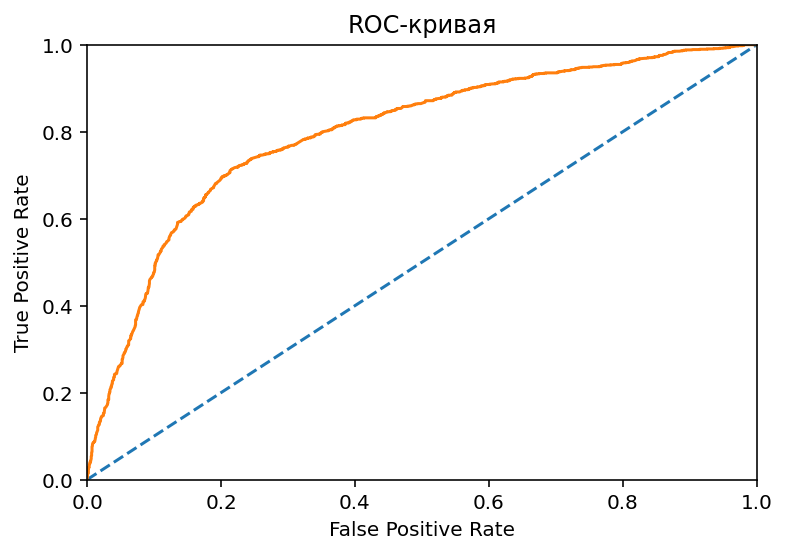

In [128]:
probabilities_test = eclf_plus.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
fpr, tpr, thresholds = roc_curve(target_test, probabilities_one_test) 
plt.figure()
plt.plot([0, 1], [0, 1], linestyle='--')

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')

probabilities_test = eclf_plus.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print("roc_auc_score:", roc_auc_score(target_test, probabilities_one_test))
print("gini_score:",2 * roc_auc_score(target_test, probabilities_one_test) - 1)

 ### Итоги

Изменения: 
   - 1) не преобразовывал числовые признаки в категориальные
   - 2) Убрал бины Мегафона
   - 3) Добавил алгоритм XGBoost
   - 4) Подсчитал метрику Gini. Так как она линейно зависит от метрики ROC-AUC, я везде отталкивался от нее. 

Добавленная KNeighborsClassifier модель не помогла повысить точность ансамбля. Максимальная точность достигла порядка roc_auc_score = 0.8 и gini_score = 0.6 (после округления).

Бустинги показали наилучшие результаты. Так же неплохо сработала логистическая регрессия.

В целом этот этап работы можно считать окончательным. Дальнейшая работа (смотри файл credit_scoring_1) представляет собой ускорение работы за счет снижения кол-ва фичей. При этом немного снижается качество моделей.